# Multiclass Support Vector Machine exercise

*Complete and hand in this completed worksheet (including its outputs and any supporting code outside of the worksheet) with your assignment submission. For more details see the [assignments page](http://vision.stanford.edu/teaching/cs231n/assignments.html) on the course website.*

In this exercise you will:
    
- implement a fully-vectorized **loss function** for the SVM
- implement the fully-vectorized expression for its **analytic gradient**
- **check your implementation** using numerical gradient
- use a validation set to **tune the learning rate and regularization** strength
- **optimize** the loss function with **SGD**
- **visualize** the final learned weights


In [75]:
# Run some setup code for this notebook.
from __future__ import print_function

import random
import numpy as np
from cs231n.data_utils import load_CIFAR10
import matplotlib.pyplot as plt



# This is a bit of magic to make matplotlib figures appear inline in the
# notebook rather than in a new window.
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## CIFAR-10 Data Loading and Preprocessing

In [76]:
# Load the raw CIFAR-10 data.
cifar10_dir = 'cs231n/datasets/cifar-10-batches-py'
X_train, y_train, X_test, y_test = load_CIFAR10(cifar10_dir)

# As a sanity check, we print out the size of the training and test data.
print('Training data shape: ', X_train.shape)
print('Training labels shape: ', y_train.shape)
print('Test data shape: ', X_test.shape)
print('Test labels shape: ', y_test.shape)

Training data shape:  (50000, 32, 32, 3)
Training labels shape:  (50000,)
Test data shape:  (10000, 32, 32, 3)
Test labels shape:  (10000,)


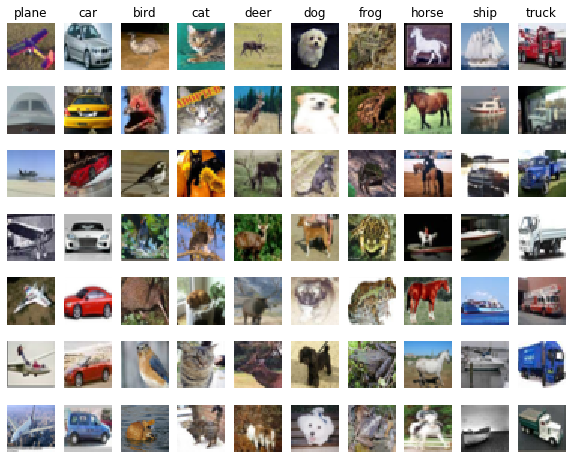

In [77]:
# Visualize some examples from the dataset.
# We show a few examples of training images from each class.
classes = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
num_classes = len(classes)
samples_per_class = 7
for y, cls in enumerate(classes):
    idxs = np.flatnonzero(y_train == y)
    idxs = np.random.choice(idxs, samples_per_class, replace=False)
    for i, idx in enumerate(idxs):
        plt_idx = i * num_classes + y + 1
        plt.subplot(samples_per_class, num_classes, plt_idx)
        plt.imshow(X_train[idx].astype('uint8'))
        plt.axis('off')
        if i == 0:
            plt.title(cls)
plt.show()

In [78]:
# Split the data into train, val, and test sets. In addition we will
# create a small development set as a subset of the training data;
# we can use this for development so our code runs faster.
num_training = 49000
num_validation = 1000
num_test = 1000
num_dev = 500

# Our validation set will be num_validation points from the original
# training set.
mask = range(num_training, num_training + num_validation)
X_val = X_train[mask]
y_val = y_train[mask]

# Our training set will be the first num_train points from the original
# training set.
mask = range(num_training)
X_train = X_train[mask]
y_train = y_train[mask]

# We will also make a development set, which is a small subset of
# the training set.
mask = np.random.choice(num_training, num_dev, replace=False)
X_dev = X_train[mask]
y_dev = y_train[mask]

# We use the first num_test points of the original test set as our
# test set.
mask = range(num_test)
X_test = X_test[mask]
y_test = y_test[mask]

print('Train data shape: ', X_train.shape)
print('Train labels shape: ', y_train.shape)
print('Validation data shape: ', X_val.shape)
print('Validation labels shape: ', y_val.shape)
print('Test data shape: ', X_test.shape)
print('Test labels shape: ', y_test.shape)

Train data shape:  (49000, 32, 32, 3)
Train labels shape:  (49000,)
Validation data shape:  (1000, 32, 32, 3)
Validation labels shape:  (1000,)
Test data shape:  (1000, 32, 32, 3)
Test labels shape:  (1000,)


In [79]:
# Preprocessing: reshape the image data into rows
X_train = np.reshape(X_train, (X_train.shape[0], -1))
X_val = np.reshape(X_val, (X_val.shape[0], -1))
X_test = np.reshape(X_test, (X_test.shape[0], -1))
X_dev = np.reshape(X_dev, (X_dev.shape[0], -1))

# As a sanity check, print out the shapes of the data
print('Training data shape: ', X_train.shape)
print('Validation data shape: ', X_val.shape)
print('Test data shape: ', X_test.shape)
print('dev data shape: ', X_dev.shape)

Training data shape:  (49000, 3072)
Validation data shape:  (1000, 3072)
Test data shape:  (1000, 3072)
dev data shape:  (500, 3072)


[130.64189796 135.98173469 132.47391837 130.05569388 135.34804082
 131.75402041 130.96055102 136.14328571 132.47636735 131.48467347]


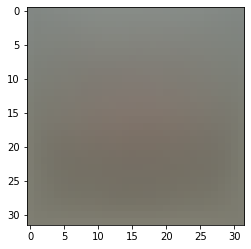

In [80]:
# Preprocessing: subtract the mean image
# first: compute the image mean based on the training data
mean_image = np.mean(X_train, axis=0)
print(mean_image[:10]) # print a few of the elements
plt.figure(figsize=(4,4))
plt.imshow(mean_image.reshape((32,32,3)).astype('uint8')) # visualize the mean image
plt.show()

In [81]:
# second: subtract the mean image from train and test data
X_train -= mean_image
X_val -= mean_image
X_test -= mean_image
X_dev -= mean_image

In [82]:
# third: append the bias dimension of ones (i.e. bias trick) so that our SVM
# only has to worry about optimizing a single weight matrix W.
X_train = np.hstack([X_train, np.ones((X_train.shape[0], 1))])
X_val = np.hstack([X_val, np.ones((X_val.shape[0], 1))])
X_test = np.hstack([X_test, np.ones((X_test.shape[0], 1))])
X_dev = np.hstack([X_dev, np.ones((X_dev.shape[0], 1))])

print(X_train.shape, X_val.shape, X_test.shape, X_dev.shape)

(49000, 3073) (1000, 3073) (1000, 3073) (500, 3073)


## SVM Classifier

Your code for this section will all be written inside **cs231n/classifiers/linear_svm.py**. 

As you can see, we have prefilled the function `compute_loss_naive` which uses for loops to evaluate the multiclass SVM loss function. 

In [83]:
# Evaluate the naive implementation of the loss we provided for you:
from cs231n.classifiers.linear_svm import svm_loss_naive
import time

# generate a random SVM weight matrix of small numbers
W = np.random.randn(3073, 10) * 0.0001 

loss, grad = svm_loss_naive(W, X_dev, y_dev, 0.000005)
print('loss: %f' % (loss, ))

loss: 8.703348


The `grad` returned from the function above is right now all zero. Derive and implement the gradient for the SVM cost function and implement it inline inside the function `svm_loss_naive`. You will find it helpful to interleave your new code inside the existing function.

To check that you have correctly implemented the gradient correctly, you can numerically estimate the gradient of the loss function and compare the numeric estimate to the gradient that you computed. We have provided code that does this for you:

In [84]:
# Once you've implemented the gradient, recompute it with the code below
# and gradient check it with the function we provided for you

# Compute the loss and its gradient at W.
loss, grad = svm_loss_naive(W, X_dev, y_dev, 0.0)

# Numerically compute the gradient along several randomly chosen dimensions, and
# compare them with your analytically computed gradient. The numbers should match
# almost exactly along all dimensions.
from cs231n.gradient_check import grad_check_sparse
f = lambda w: svm_loss_naive(w, X_dev, y_dev, 0.0)[0]
grad_numerical = grad_check_sparse(f, W, grad)

# do the gradient check once again with regularization turned on
# you didn't forget the regularization gradient did you?
loss, grad = svm_loss_naive(W, X_dev, y_dev, 5e1)
f = lambda w: svm_loss_naive(w, X_dev, y_dev, 5e1)[0]
grad_numerical = grad_check_sparse(f, W, grad)

numerical: -18.389025 analytic: -18.389025, relative error: 2.178167e-11
numerical: 3.434767 analytic: 3.434767, relative error: 6.118827e-12
numerical: 3.199431 analytic: 3.199431, relative error: 6.492614e-11
numerical: 22.550571 analytic: 22.550571, relative error: 4.617623e-13
numerical: -39.640347 analytic: -39.640347, relative error: 3.945234e-12
numerical: 15.705361 analytic: 15.705361, relative error: 1.831500e-11
numerical: 11.655236 analytic: 11.655236, relative error: 9.553345e-12
numerical: -34.605641 analytic: -34.634740, relative error: 4.202578e-04
numerical: -5.504069 analytic: -5.546063, relative error: 3.800334e-03
numerical: 0.280492 analytic: 0.331608, relative error: 8.350880e-02
numerical: -29.622692 analytic: -29.622692, relative error: 3.542137e-12
numerical: 10.606988 analytic: 10.647581, relative error: 1.909884e-03
numerical: -24.038164 analytic: -24.036302, relative error: 3.874261e-05
numerical: -1.710767 analytic: -1.671811, relative error: 1.151672e-02
nu

### Inline Question 1:
It is possible that once in a while a dimension in the gradcheck will not match exactly. What could such a discrepancy be caused by? Is it a reason for concern? What is a simple example in one dimension where a gradient check could fail? *Hint: the SVM loss function is not strictly speaking differentiable*

**Your Answer:** *Because of the existance of margin,one or several dimension on $dW$ could be zero,but the numerical gradient would probabily never be zero, so here we got a discrepancy. This situation could happen when we use a well-trained model to do gradient check*

In [85]:
# Next implement the function svm_loss_vectorized; for now only compute the loss;
# we will implement the gradient in a moment.
tic = time.time()
loss_naive, grad_naive = svm_loss_naive(W, X_dev, y_dev, 0.000005)
toc = time.time()
print('Naive loss: %e computed in %fs' % (loss_naive, toc - tic))

from cs231n.classifiers.linear_svm import svm_loss_vectorized
tic = time.time()
loss_vectorized, _ = svm_loss_vectorized(W, X_dev, y_dev, 0.000005)
toc = time.time()
print('Vectorized loss: %e computed in %fs' % (loss_vectorized, toc - tic))

# The losses should match but your vectorized implementation should be much faster.
print('difference: %f' % (loss_naive - loss_vectorized))

Naive loss: 8.703348e+00 computed in 0.445114s
[[1.         1.06269639 0.63757256 ... 0.65207371 0.10009232 0.8376872 ]
 [1.14805025 1.055089   1.02314369 ... 1.32049699 1.60563836 1.        ]
 [0.71596926 0.51962998 0.84736749 ... 0.80332047 0.77631513 0.56416209]
 ...
 [0.65989452 0.57048888 0.79190506 ... 0.18315143 1.         0.88263914]
 [1.52934538 1.33734152 1.10951254 ... 0.92678474 1.93625592 0.77542145]
 [1.         0.63450022 0.46617907 ... 0.71243945 0.79158528 0.84459206]]
Vectorized loss: 7.703348e+00 computed in 0.006442s
difference: 1.000000


In [86]:
# Complete the implementation of svm_loss_vectorized, and compute the gradient
# of the loss function in a vectorized way.

# The naive implementation and the vectorized implementation should match, but
# the vectorized version should still be much faster.
tic = time.time()
_, grad_naive = svm_loss_naive(W, X_dev, y_dev, 0.000005)
toc = time.time()
print('Naive loss and gradient: computed in %fs' % (toc - tic))

tic = time.time()
_, grad_vectorized = svm_loss_vectorized(W, X_dev, y_dev, 0.000005)
toc = time.time()
print('Vectorized loss and gradient: computed in %fs' % (toc - tic))

# The loss is a single number, so it is easy to compare the values computed
# by the two implementations. The gradient on the other hand is a matrix, so
# we use the Frobenius norm to compare them.
difference = np.linalg.norm(grad_naive - grad_vectorized, ord='fro')
print('difference: %f' % difference)

Naive loss and gradient: computed in 0.471580s
[[1.         1.06269639 0.63757256 ... 0.65207371 0.10009232 0.8376872 ]
 [1.14805025 1.055089   1.02314369 ... 1.32049699 1.60563836 1.        ]
 [0.71596926 0.51962998 0.84736749 ... 0.80332047 0.77631513 0.56416209]
 ...
 [0.65989452 0.57048888 0.79190506 ... 0.18315143 1.         0.88263914]
 [1.52934538 1.33734152 1.10951254 ... 0.92678474 1.93625592 0.77542145]
 [1.         0.63450022 0.46617907 ... 0.71243945 0.79158528 0.84459206]]
Vectorized loss and gradient: computed in 0.005882s
difference: 0.000000


### Stochastic Gradient Descent

We now have vectorized and efficient expressions for the loss, the gradient and our gradient matches the numerical gradient. We are therefore ready to do SGD to minimize the loss.

In [93]:
# In the file linear_classifier.py, implement SGD in the function
# LinearClassifier.train() and then run it with the code below.
from cs231n.classifiers import LinearSVM
svm = LinearSVM()
tic = time.time()
loss_hist = svm.train(X_train, y_train, learning_rate=1e-7, reg=2.5e4,
                      num_iters=1500, verbose=True)
toc = time.time()
print('That took %fs' % (toc - tic))

[autoreload of cs231n.classifiers.linear_classifier failed: Traceback (most recent call last):
  File "/home/disk2/internship_anytime/liuhaohe/anaconda3/envs/tf/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 245, in check
    superreload(m, reload, self.old_objects)
  File "/home/disk2/internship_anytime/liuhaohe/anaconda3/envs/tf/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 450, in superreload
    update_generic(old_obj, new_obj)
  File "/home/disk2/internship_anytime/liuhaohe/anaconda3/envs/tf/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 387, in update_generic
    update(a, b)
  File "/home/disk2/internship_anytime/liuhaohe/anaconda3/envs/tf/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 357, in update_class
    update_instances(old, new)
  File "/home/disk2/internship_anytime/liuhaohe/anaconda3/envs/tf/lib/python3.6/site-packages/IPython/extensions/autoreload.py", line 317, in update_instances
  

[[ 1.37327418 -2.83727598  0.68861343 ... -0.77899785  1.42728753
  -4.21520013]
 [ 2.04298077  4.46351886  5.86924879 ...  5.28852034  8.07092484
   0.56406335]
 [ 5.96945024  1.50608186  2.348087   ...  4.03746763  5.32617518
   3.8549256 ]
 ...
 [ 6.70128705  5.9234871   7.39753266 ...  7.03255922  3.17836236
   1.        ]
 [ 2.90385769  5.39985562  1.31630106 ...  2.32312718  4.78409269
   1.80254845]
 [-0.42564222 -1.27682874  1.76154002 ... -4.82218982  1.
  -3.00506211]]
iteration 0 / 1500: loss 788.752883
[[ 0.09746409 -2.50405304  1.95622914 ...  1.90392598 10.60391687
   1.        ]
 [-0.41911699 -0.27667755 -3.89355147 ...  1.1466165   1.
   3.75572811]
 [ 3.41114815  2.06591689  1.         ...  0.5258761   1.14187779
  -0.06806079]
 ...
 [-8.83465415 -2.85758642  1.         ... -2.45484134 -2.81154357
  -0.84386733]
 [-6.48659958 -0.66861621 -7.26498868 ... -2.96319287 -5.89073064
  -4.77347722]
 [ 4.29573758  0.69550052  1.         ...  7.38477729  2.33048208
   2.1433100

[[ -0.27149542   1.3757051   -0.76185109 ...   0.17211315   1.47798153
    2.05689298]
 [  1.          -3.19498132   0.15098441 ...   1.12559731   1.06216533
    3.17823293]
 [  0.0465462    1.09886242   1.         ...   1.27511799  -3.06519189
   -1.71966293]
 ...
 [ -3.15357176  -3.7700038  -10.27442418 ...  -3.37994307  -4.57746042
   -4.20398684]
 [  3.93531164   1.          -0.83665557 ...  -2.38902042   2.93630062
    0.72264034]
 [ -2.50206179   2.85745314   1.30296776 ...   1.          -0.49523024
   -3.33813947]]
[[ 1.06542296 -7.77747547 -1.73989645 ...  2.7688734  -0.75446523
  -0.97987468]
 [ 1.         -1.33573429  1.96378917 ...  2.9485691   0.8544541
  -0.30893861]
 [-0.03496589  2.52584765  1.         ...  1.13826202  1.79164582
   1.02415031]
 ...
 [ 3.97319904  1.          0.10871716 ...  3.63829565  6.75088031
   3.67556705]
 [-2.01718445 -3.00713754 -0.09844655 ...  0.89045102 -0.81864491
  -3.07377659]
 [-0.41810896  0.18305938 -0.91638997 ... -3.52359257 -4.059917

[[ 0.35713467  1.62134144  0.66327108 ... -1.37481442 -2.13444946
  -1.93956093]
 [-4.18193804 -5.34900223 -1.57514798 ... -1.83866278 -1.56242578
  -4.78385706]
 [ 0.79997552  0.74051557  1.         ... -0.46628835  0.84452637
  -0.55515858]
 ...
 [-1.10695868 -0.04394724 -5.04333932 ...  1.67149733 -1.64397034
   1.        ]
 [ 5.35116359  1.54107412  0.92831175 ... -1.4003286   6.23565428
   1.        ]
 [-1.114105    2.01359717  2.82102003 ... -1.85554355 -2.45760347
  -2.96435968]]
[[ 2.44803702  0.46248184 -0.75913458 ... -2.45365067  1.
   3.3200268 ]
 [ 0.71023631 -0.01691895  1.         ... -0.61512125  2.18314177
   0.48373855]
 [-3.90652833 -3.4557334  -5.10238597 ... -2.17063327 -0.3844185
  -2.39571607]
 ...
 [ 4.86579801  2.71576565  1.         ... -0.78634014  3.51711508
   3.58921642]
 [ 1.         -1.83272565 -3.35925824 ... -4.40668397 -0.07330556
  -0.39228952]
 [ 4.37854545  3.84641912  1.65268294 ...  0.6771235   3.1385413
   5.10165807]]
[[-3.1616312  -5.03246541 

[[ 1.         -0.40693788 -1.46967026 ... -3.08175871  2.61369325
  -0.42180096]
 [-1.15208044  1.90031637  3.50777814 ...  5.13520885  1.3596945
   3.76303305]
 [ 4.54678244  1.84797615  1.19218251 ... -1.25592345  1.
   4.3153542 ]
 ...
 [-1.65665019  0.31673365  0.78965039 ...  0.34833047 -3.51542033
   0.66193707]
 [ 1.          1.54520156  0.61869643 ...  0.15881535  6.59814156
   2.73341645]
 [ 1.23533494 -1.55869545  1.06438088 ... -0.19532145 -2.06441332
  -1.74385673]]
[[-2.70521617  1.49367835 -0.85162407 ...  1.          1.23173705
   0.51072504]
 [ 0.4937992   3.80271394  2.72971107 ...  3.68217237  0.85297983
   1.36711761]
 [-1.31669216 -0.65774727 -2.89631609 ... -0.79652645  0.41551906
  -1.53167812]
 ...
 [ 2.64530199  2.35793453  3.17496181 ...  1.          1.2845045
   1.23497902]
 [-0.83036041 -3.72559242 -2.87290737 ... -2.33960899 -1.16699933
  -1.0999393 ]
 [ 0.90972213  0.08042608  0.26746105 ... -0.86149662  1.27484273
  -0.3943955 ]]
[[-2.86777898  0.51602879 

[[ 3.37891911e-03  4.20896529e+00  4.56011956e-02 ...  3.29112801e+00
   1.81867458e+00  5.56337475e+00]
 [-1.80650771e-01  8.50959816e-01 -3.76843347e+00 ... -3.10341675e+00
   1.00000000e+00  9.06009838e-01]
 [ 1.00000000e+00  3.54635928e+00 -3.80508265e-01 ...  2.38952588e+00
   1.54593616e+00  2.10085797e+00]
 ...
 [ 3.74259189e+00  2.80207009e+00  2.02402351e+00 ...  1.63847643e-01
   3.84456081e+00  1.00000000e+00]
 [-1.49589704e+00  1.18692960e+00 -1.34226479e+00 ...  1.00000000e+00
  -7.18814335e-01 -2.86124165e+00]
 [-2.86224299e+00  1.76408358e+00 -2.37342236e+00 ... -1.07380409e+00
  -3.94476397e+00 -6.72282452e-01]]
[[ 1.71529616  1.14787566 -0.63580488 ... -1.21611496  3.98514737
   1.        ]
 [-0.35428312 -0.39055274  0.44926095 ... -1.58190537 -0.08347814
  -1.77398618]
 [ 1.         -1.11114564 -0.37106001 ... -1.96574392 -2.1942955
  -2.07760447]
 ...
 [ 2.11696956  1.97975578  4.02934195 ... -0.18752346  2.41894889
   1.82181066]
 [-2.96932986 -3.97535007 -1.4582484

[[-1.19789295  0.32822166  0.46271999 ...  0.63817476 -0.51596472
  -1.13034391]
 [-0.24951025 -1.53988733 -2.27173134 ... -3.0056111   1.
  -2.70840768]
 [-0.92518525  1.29911525 -0.79004609 ... -1.08603511  3.68828942
  -2.61970909]
 ...
 [ 1.35015185 -1.28620657 -2.14416635 ... -2.29172729  1.
  -0.15993805]
 [-1.92915542 -2.71358882 -2.95783775 ... -1.48380339 -0.94074308
   1.        ]
 [ 1.         -5.60191924 -1.03023376 ... -1.20239772 -3.31337946
  -0.60805147]]
[[ 0.21481322  1.7718956   1.         ...  1.31873597  0.18430773
   0.39807813]
 [ 0.05270941  1.         -2.6049364  ... -3.05490501  2.75559077
  -0.91738992]
 [ 0.53572814 -0.29935522 -1.51670835 ... -0.41535748  1.
  -0.33438003]
 ...
 [-0.75974784  0.06013571 -4.03110665 ... -1.86059634 -0.45136757
   1.        ]
 [-2.66300958 -1.3405352   0.27589671 ... -0.15321349 -3.98506688
  -1.33274717]
 [ 1.         -2.87964433 -0.81376542 ... -4.92072317  0.15093516
  -1.48299421]]
[[-2.0589704   1.         -2.82190835 ..

[[-3.64552572e-01 -3.35643302e+00 -2.72012000e+00 ... -8.41309231e-01
   1.16829096e-01  1.00000000e+00]
 [-4.56005169e-03  1.00000000e+00  2.67054682e+00 ... -3.82530208e-01
   2.86182132e+00  1.77321444e+00]
 [ 6.25201948e-01  1.00000000e+00 -4.95166976e+00 ... -8.97140521e+00
   1.89177222e+00  2.37033172e+00]
 ...
 [-2.75654538e+00 -9.83387574e-01  1.00000000e+00 ...  4.95961029e-01
   5.36890469e-01 -4.82529152e+00]
 [ 1.75006340e+00 -6.39268871e-01  9.23828571e-01 ...  1.00000000e+00
  -3.36677599e-01  2.65476951e+00]
 [ 1.59594923e+00  1.00000000e+00  2.11281635e+00 ...  2.70763775e+00
   1.81635990e+00  4.04967247e+00]]
[[-0.80015005  0.15779639  1.         ...  1.03846139 -0.70261821
  -0.25067192]
 [-2.525472   -2.04402296 -0.41029481 ...  1.         -5.77778861
  -3.53736454]
 [-1.00870326 -0.79694393  2.51993303 ...  1.         -1.81836168
  -3.58533561]
 ...
 [ 0.3623068   3.15327115  0.49903745 ...  2.69951278  2.01763756
   2.5606033 ]
 [-1.19409817 -2.6608491  -1.991693

[[-4.50079338 -3.49704914 -0.44234782 ...  0.07390698 -4.00291259
  -3.08002752]
 [-4.84459643 -1.10228913 -0.61453454 ... -1.68025025 -3.51692748
  -4.33342815]
 [-3.75811403  0.27349924 -1.61552328 ... -1.92217842 -3.09441345
  -1.9094026 ]
 ...
 [ 0.87882462  0.14542821 -1.35729633 ... -0.91140468  1.85379883
   1.        ]
 [-0.20839579  4.90219585  1.         ...  4.32886591  4.41291584
   0.20195444]
 [-0.62175497 -2.06988698 -0.00839459 ...  1.         -1.8391395
  -3.71455172]]
[[-3.05078581  1.         -2.88330082 ... -3.89285303 -0.75421084
  -1.82919183]
 [ 1.24254313  2.31052451 -2.00323097 ... -2.85069949  1.
   2.57442161]
 [-0.51857093  0.67823742  1.24652032 ...  1.          0.12897942
  -0.32231988]
 ...
 [-2.06129513 -4.32006211 -0.10089103 ...  1.00014309 -2.04665215
  -0.27996706]
 [ 2.10312215  1.01916129 -1.24374467 ...  2.86672743  1.49723753
   1.        ]
 [-3.83677065  0.53521131 -2.6052915  ... -1.80081305 -1.97471414
  -1.16806173]]
[[-1.24366674 -3.66569097

[[ 0.60389328  0.3373226   1.94181676 ...  1.32148549  1.62218844
   0.38715359]
 [ 1.89802225  1.87934835  3.37796897 ...  3.16574857  3.04099412
   2.32481346]
 [-2.7646283   3.47543631 -3.80772221 ... -0.17992516  1.
   1.98371751]
 ...
 [ 2.88229701  2.74410114  0.71402107 ...  1.          2.64360363
   5.16787364]
 [ 1.59216992 -1.90306838  1.         ...  3.70723138 -0.46734438
   1.67028639]
 [-5.05781084 -1.54466439 -2.82334407 ... -2.0401096  -5.72212713
  -4.24497794]]
[[-0.36615524 -1.13537617 -1.9253721  ... -0.06007474 -1.83154542
   0.35057982]
 [ 0.71304848 -0.3811007  -1.63534591 ... -0.49487328  1.
   3.06823551]
 [ 0.21638226  1.07543763 -0.08170868 ...  0.98510079 -0.21384583
  -0.11174413]
 ...
 [ 0.11878251  4.07541332  2.45327697 ...  1.12145227  1.13151527
   1.        ]
 [-2.28856803 -0.6516106   0.01888942 ...  1.         -4.46024042
  -4.03692877]
 [ 1.31482849  0.09381849  1.         ...  0.94524741  0.53278498
  -0.30041609]]
[[ 3.06091189  1.20277878  1.   

[[-1.45749734  2.54221181  0.34198964 ...  2.44046548 -0.702861
   2.71178495]
 [-0.29726882  0.11817132 -0.14502815 ...  0.05455336 -0.04368763
   0.86520497]
 [ 1.71824099  1.12819773  0.49665116 ... -0.43269219  1.
   0.24665097]
 ...
 [ 1.16109053  0.45873982  2.44435321 ... -2.02817956  0.44965159
  -2.5265057 ]
 [-0.24480404  1.         -3.23073697 ... -1.52012633  0.99806627
  -1.98976846]
 [ 1.         -1.01893168  0.02595648 ... -0.3114066   0.71274213
  -0.82568079]]
[[-4.20747015e-01 -2.83159575e-01 -4.28010545e-01 ...  4.86154877e-03
  -1.32084393e+00 -1.53685568e+00]
 [-7.30505314e-01 -9.56504527e-01 -3.24381306e+00 ...  6.39994580e-01
  -2.36583538e-01 -1.37614390e+00]
 [-3.13477630e+00 -2.84144148e+00  1.00000000e+00 ... -3.92170193e-01
  -4.79885637e+00 -5.94295283e+00]
 ...
 [-1.51219063e+00 -1.59042531e+00  1.24602057e+00 ... -2.54574643e-01
   6.80419788e-01 -2.70376410e+00]
 [ 2.45972334e+00  1.00000000e+00  6.05672789e-01 ...  1.15404627e+00
   3.03909408e+00 -3.06

[[ 2.81775876  0.89330738  4.12640429 ...  1.          0.58037084
   0.44915637]
 [ 0.30905966 -0.63447917  2.83691141 ...  0.23692781  1.18075267
   0.18420819]
 [ 2.43541382  0.33425218  2.94583741 ...  1.          3.1200527
   1.57741365]
 ...
 [ 0.02963768  1.         -1.39221979 ... -1.23576189  0.34142069
   0.44812194]
 [ 0.66381454 -2.5404836   2.02301516 ...  0.91331178  0.4963902
  -1.9997606 ]
 [-0.31925006 -1.63944115 -0.28568988 ... -0.74256415  0.07022137
  -3.60503235]]
[[-1.66561964 -1.98490025  1.         ...  1.19513772  1.12779871
  -1.90532483]
 [ 1.29074914 -1.32913062  0.33131481 ...  0.12239907  0.54465483
   0.42814945]
 [-3.01120927 -1.18963089 -0.37463285 ... -0.50436497 -3.40564044
  -0.79072548]
 ...
 [-0.446929    0.66133746  0.38881832 ...  1.73744058 -1.31801408
   0.85607159]
 [-2.58335163  0.7546682  -0.44002746 ... -0.01140403 -0.46734519
   0.67450318]
 [ 2.13603071  0.98557519  0.0170787  ...  0.05143979  0.26482945
   0.78335062]]
[[-3.47296904 -0.6

[[-1.22508126  1.         -2.2412459  ... -1.62536396 -0.02939234
  -1.36389394]
 [ 1.         -1.0814689  -0.88452026 ... -1.31808553  2.41164205
  -0.10710503]
 [ 1.24333051  1.          2.45382775 ... -0.08848421  2.51808103
   0.27743577]
 ...
 [ 0.14210564  1.34555619 -0.36143168 ... -2.19207912  1.
  -0.43020995]
 [ 1.78110104  1.          0.31291914 ...  1.29923056  1.19164725
  -0.24958592]
 [-0.35213653 -1.69221042  1.         ... -0.37623992 -1.36645707
  -1.87068845]]
[[ 1.         -1.25135075  0.13965808 ... -1.6946895  -2.7953366
  -1.85821566]
 [-2.76232321 -3.47374238 -1.4278531  ...  0.79051968 -4.00560154
  -2.11604176]
 [ 2.1098791  -1.73720741  0.60993955 ...  1.         -0.12565894
  -0.32883276]
 ...
 [-0.17417469 -2.32839174  0.81834938 ...  0.09570841 -1.90476483
  -1.56970121]
 [ 1.          0.17184494 -1.22228414 ... -0.04090253  0.59529506
   2.30103323]
 [-0.85623729  1.96164341 -0.56634847 ... -1.51196097  0.7708293
   3.06309444]]
[[ 1.59214833 -1.94739167 

[[-0.55931112 -0.39921079  1.31563252 ...  1.         -0.0576279
   0.42241636]
 [ 0.28371123 -2.16857453  1.57360551 ...  1.         -0.23101245
  -1.54361884]
 [ 2.7375292   0.28511552  1.14105363 ...  1.25337638  1.
   2.14015081]
 ...
 [ 1.24040772  0.75650057 -2.27663102 ... -4.45264896  1.34688955
   1.        ]
 [ 1.44067466  1.31290281  1.         ...  0.96461627  2.10944612
   2.28519518]
 [-1.47920908 -2.89406217 -0.00975721 ...  1.         -3.17328166
  -2.62697469]]
[[ 0.71989481  3.61074539 -1.5710619  ...  2.55156513  0.76829976
   4.51902751]
 [ 4.12455204  4.13406833  0.69558251 ...  2.47682994  3.56854721
   3.75969798]
 [ 0.34678305 -0.56602854  1.         ... -0.1536269   0.42943393
  -1.277898  ]
 ...
 [ 1.86948602  0.62183747  1.         ...  1.78170678  2.99939218
   1.37240392]
 [-1.20231827 -1.96573656 -0.01713112 ...  1.         -2.16548266
  -2.13346218]
 [ 2.63168037  3.16797523  1.60227029 ...  1.          2.52914261
   4.2941088 ]]
[[-0.70744153 -0.45198181

[[ 0.18466956  0.76022367  0.33612646 ... -0.17110378  1.61891027
   1.15245719]
 [ 1.08426279  1.5510874   1.48903843 ... -0.4589602   2.51217106
   1.        ]
 [ 0.68399143 -0.82954503 -2.63568543 ... -1.25212117  0.97066729
   1.        ]
 ...
 [ 0.30244103  1.         -0.4382718  ... -1.46451061 -0.09589497
  -1.0743502 ]
 [ 1.13869607  1.          0.85480086 ...  1.58735183  0.06251884
   0.54820159]
 [ 0.34636308  2.43217456  1.17425788 ...  1.47703166  1.36270099
   1.        ]]
[[-1.61459852 -0.34352894  1.4348164  ... -0.01950233 -1.75997197
  -0.94078676]
 [-1.97268598  0.38108286  0.80551084 ...  0.81391679 -1.49618464
   0.51507056]
 [ 1.38652368  1.60004126 -1.33367841 ... -0.993551    2.27287625
   1.        ]
 ...
 [ 2.07767533 -1.96560969 -0.5540678  ... -2.04325602  1.
  -0.68519108]
 [ 1.         -1.27459912 -1.77759195 ... -2.92033154  0.6732713
  -0.67150909]
 [-1.14545897  1.71187237  1.         ...  0.256218    0.66252881
   0.87447952]]
[[-1.95334618  0.03405799

[[-2.22509481 -1.73566569  1.56260774 ...  1.09498824 -2.45253761
  -1.72678986]
 [-0.09045798  1.         -1.71098595 ...  0.45133674  0.48134015
   0.1763047 ]
 [ 0.75927147 -0.12809457 -0.53900095 ...  1.         -0.18968076
   0.29933002]
 ...
 [ 0.53399669  1.00155686  1.         ...  1.10415959 -0.80255244
  -0.01477005]
 [ 2.9691825   0.53167007  0.99513778 ...  1.          2.48773724
   1.97796635]
 [-1.63048391  0.39237572  0.08491222 ...  1.23977759 -2.52098133
   0.07964617]]
[[-1.26317836 -1.66700416  1.38602036 ...  0.02790995 -1.72121395
  -1.90745635]
 [-0.98497372 -1.30362874 -1.921442   ... -0.30330718 -0.93084797
   1.        ]
 [-0.51578549  1.47249849  1.         ...  0.71621115 -0.79303154
  -0.76369112]
 ...
 [-0.55818024  1.14687766  0.72739054 ...  0.68323564  0.64845869
   1.31078654]
 [-2.39273364 -1.52726694 -0.26917277 ... -0.24736452 -2.04373711
  -1.99441179]
 [-0.76979074 -1.07183224  1.8008323  ...  1.86173818 -0.54635008
   0.14556596]]
[[ 0.78659246  0

[[-0.25032986  0.63194804  0.3273883  ...  1.          1.26656094
   0.23206021]
 [-0.11622476 -0.59275211 -0.16745643 ... -0.08427135  0.29466948
  -0.87988733]
 [ 1.74985137  1.88835015  1.29828137 ...  0.69910528  1.62250921
   1.50516626]
 ...
 [ 0.03658352  0.46449471 -2.64734423 ... -1.1619628   1.
   0.86190779]
 [ 2.74441904  2.54795328  1.28614574 ...  1.77631957  3.99465883
   4.41466353]
 [-2.70605943 -1.89690946 -0.65786246 ... -0.57458858 -1.38169978
  -1.2752225 ]]
[[ 1.84882017  1.          3.6525454  ...  4.37787339  2.04398809
   4.18047991]
 [ 1.75683839  1.05224115  1.         ...  1.65384203  1.93345558
   2.52118566]
 [-0.26711252  0.21997856 -1.65545464 ... -0.9025857  -0.80452823
   1.        ]
 ...
 [ 0.42453844 -0.25748168  1.         ...  1.82036856  0.37803079
   0.78423027]
 [ 2.22901594  1.95475373  2.2544536  ...  1.61831177  3.21201325
   1.40446082]
 [-0.77523275  0.22595106  0.77644521 ...  0.89898658 -0.56876471
  -0.01826901]]
[[ 1.41297466  1.4726464

[[ 1.73987693e-01  1.05081680e+00 -1.16505153e+00 ...  1.97408741e-01
   1.28463750e-01  1.00000000e+00]
 [-2.01470822e+00 -1.53798181e+00 -1.38052327e+00 ... -1.20771120e+00
   3.86754548e-01 -2.29209804e+00]
 [ 1.00000000e+00 -2.06600095e-01 -2.26567862e-01 ... -3.70846943e-01
  -2.22955491e-01 -4.97877675e-02]
 ...
 [ 1.33023521e+00  2.50331580e+00  1.00000000e+00 ...  2.21059201e+00
  -5.15115770e-04  2.61136017e+00]
 [-2.73850093e+00 -2.61900095e+00 -1.59146519e+00 ... -2.66736411e+00
  -2.64105817e+00 -3.76318433e+00]
 [ 1.00000000e+00 -1.57513424e+00 -3.13264650e+00 ... -1.74725661e+00
   1.46742785e+00  9.34204287e-01]]
[[ 1.12844103  0.82174534  2.04262517 ...  1.03445452  0.48395665
   1.18942808]
 [ 1.07075027  1.53590059  2.1960294  ...  1.          1.90541987
   0.25116387]
 [ 0.09553364 -1.50679287  0.94589453 ...  1.35918778  0.99884394
  -1.20984752]
 ...
 [ 0.54621745  1.         -1.45114264 ... -1.30568438  2.10305074
   1.06701691]
 [-0.75418774 -1.76777426  1.307688

[[ 0.94391905  0.74271772  0.62453331 ...  1.          0.38252947
  -0.33557426]
 [-2.47781969 -0.58302072 -0.31552905 ... -1.62603631 -2.16425294
  -0.52959834]
 [ 0.36405396  0.94241924  0.93153287 ...  1.36120476  0.11026281
  -0.0331782 ]
 ...
 [-0.7358038  -0.78044614  1.28227998 ...  1.17461024 -1.5024385
  -1.10564427]
 [ 2.34233944 -0.58227494  1.         ...  0.15128004  2.19430419
   0.762738  ]
 [ 0.57965595  0.78887537  1.16664777 ... -0.61959445  1.
   0.28452725]]
[[ 1.         -1.09521868  2.00916509 ...  1.52693538 -0.32250351
  -0.55675218]
 [ 1.10400744  0.30106413  0.0126019  ... -0.36302546  2.09849454
   0.73064318]
 [ 0.47050195 -0.94775209 -2.16355533 ... -2.16401911  1.
  -0.50246028]
 ...
 [ 2.64489557  1.11586769  1.08036848 ...  1.295302    2.46956325
   1.41461368]
 [ 0.29249494 -2.02481354 -2.17435394 ... -2.1761364   1.
  -1.72665417]
 [ 1.         -1.36178543 -2.91279459 ... -2.88878905  1.55149208
  -1.94102388]]
[[ 1.19531254  1.82005572  3.07116198 ...

[[ 0.17946966 -0.61462437  0.99426054 ...  0.3851707   0.31194731
  -0.39922307]
 [ 0.457907   -1.3529445   1.11880144 ...  0.65583166 -1.0246614
  -1.09490297]
 [ 1.          2.1975922  -0.58062226 ... -1.57909423  2.16186427
   1.67725885]
 ...
 [-0.97549449  0.49415371 -0.9821673  ... -1.78338075  1.
  -0.07833645]
 [ 1.55440053  0.51839071  0.54860599 ...  1.1683874   1.31455743
   1.4028094 ]
 [ 0.8176192   1.95055993  0.96830623 ...  0.486969   -0.09784848
   0.43030932]]
[[-1.01544322  0.1928958  -0.68204776 ... -1.37402618  0.70281427
   1.        ]
 [-1.0302253  -3.52262549 -1.87478518 ... -1.18909345 -1.21041136
  -2.61740749]
 [-0.94009751 -0.15156422  0.02883892 ...  0.12599656 -1.70513872
  -0.2442996 ]
 ...
 [-0.63271476  0.37790371 -1.74291947 ... -1.14507886  0.18633051
   1.        ]
 [-1.38110119 -1.48797772 -0.0512939  ... -0.27632795  0.01545966
  -3.06674088]
 [-1.38029022 -0.40886897  0.74804411 ...  1.12922484 -1.6278983
  -0.25960084]]
[[-1.31573989e+00 -2.53786

[[ 1.12231366  0.16986056  0.20883698 ... -0.39147159  1.
   0.19621169]
 [ 1.40620845  0.38204952  1.3218481  ...  1.11245238  1.11528317
   0.65234483]
 [ 1.16952461  1.58419066  0.73660923 ...  1.          0.99784061
   0.09164069]
 ...
 [-1.71993383 -0.5294852   0.0788864  ...  0.96674307 -1.35409513
  -1.26937914]
 [ 0.28348632 -1.98682193  0.63215413 ...  1.         -0.09793208
  -1.14543825]
 [ 3.1573309   2.15735624  1.         ...  0.60786997  4.32327126
   2.28867993]]
[[-0.07172358  0.46436534  0.81799406 ...  0.6885262  -0.08329292
   0.19903852]
 [ 5.37907156  2.67641415  2.01412442 ...  2.27139031  4.8307054
   2.46580458]
 [-1.75057072  1.         -3.33685897 ... -1.5404297  -1.96379043
  -0.71977588]
 ...
 [ 0.3197293   0.50235651 -0.92117788 ...  1.         -0.81474474
   1.6393124 ]
 [-0.62194783 -0.06843144  0.49635183 ...  0.86920564 -1.25552893
  -0.5197195 ]
 [-1.24177584 -0.0630572  -2.14042373 ... -1.0862489  -0.70664697
   1.        ]]
[[ 0.61254239  1.55842674

[[-0.47673461  0.75108021  1.11161114 ... -0.0932682  -1.77540585
   0.25954664]
 [-2.02738793  1.         -0.65941157 ... -1.79757422 -0.81550939
  -1.35486607]
 [ 0.78507712 -0.2049673  -2.93012134 ... -3.42136475  1.
  -1.01268081]
 ...
 [ 1.         -1.35906216 -0.94019049 ... -0.71587959  0.78880185
  -0.63846349]
 [ 0.31130664 -0.19209496  0.08102842 ...  1.78460286 -0.28441496
   1.47968152]
 [ 1.         -0.65868981 -1.32516938 ... -0.51780213  0.30819939
  -0.96136668]]
[[ 0.60786604  1.          1.72554038 ...  0.13374728  1.39040536
   0.03385186]
 [-0.8978941  -0.11452299 -2.10077223 ... -1.58736203  0.55996982
   1.        ]
 [ 0.86677787  1.          0.61178605 ...  1.08018603  0.2137109
   0.55383087]
 ...
 [ 0.43845554 -0.38252367  0.10468757 ...  1.          0.02573427
   1.42926933]
 [-1.28325515 -0.56888297  1.         ...  0.49860017 -0.59088996
  -0.93088436]
 [ 1.93257148  1.          1.06016753 ...  1.02387681  1.41410165
   1.98778452]]
[[ 2.01058726  1.        

[[ 7.14198368e-01  4.05457513e-01 -3.85372570e-01 ... -3.96037783e-01
   1.00000000e+00  5.39395547e-01]
 [-1.43133316e+00 -1.99026465e+00  4.08429128e-01 ...  1.37899887e-01
  -2.21403830e+00 -3.60106648e+00]
 [ 4.36555073e-01  1.94166090e+00  6.40679750e-01 ...  1.64904640e+00
   5.80307827e-01  1.32277834e+00]
 ...
 [ 1.00000000e+00 -1.00207165e+00 -7.56850407e-01 ... -4.85065905e-01
   1.12961652e+00 -3.80976411e-01]
 [-1.57034148e+00  1.36346105e+00 -4.26595126e+00 ... -3.07652628e+00
  -6.10339224e-01  1.00000000e+00]
 [ 1.00060109e+00 -4.86887478e-01  1.00000000e+00 ...  2.28804957e+00
   5.70870156e-01  1.99522537e-03]]
[[-1.07962977 -2.71002103 -1.86214085 ...  1.         -2.38636262
  -1.22280309]
 [ 1.          1.23689621  0.60394916 ...  0.43126747  1.56911356
   1.58938308]
 [ 0.46690232  0.82227157 -0.63323748 ... -1.79174798  1.
   0.31795407]
 ...
 [-1.57042958 -1.27481857 -0.14567835 ...  0.51164573 -1.60198002
  -2.00682717]
 [-1.07856037 -0.19295896  1.         ...  

[[-0.48336368  0.64066626  1.         ...  0.90401509  0.13647374
  -0.13047274]
 [-0.46068719 -0.75743447  1.         ... -0.2476091  -0.30893129
  -1.13040675]
 [-0.49580684  1.07284808 -0.07738677 ... -0.55393873 -0.78669573
   0.29627988]
 ...
 [-1.19216706 -0.06858532 -0.10811303 ...  0.10176905 -0.89141479
  -0.75069779]
 [-0.17060659  0.72045546 -0.00840305 ...  0.1036945  -0.25305048
   0.39174742]
 [-0.81061802  1.         -0.29825743 ... -1.59586306 -0.45103106
  -0.59286804]]
[[ 0.67341291  1.28303257  0.79593492 ... -0.53896037  1.53990391
   0.6358192 ]
 [-1.88330495 -2.15642771  0.45867614 ...  0.45733889 -2.9620282
  -2.64580537]
 [-0.16791038 -1.40943263  0.34522745 ...  0.25157319 -1.11345631
  -1.17198683]
 ...
 [-3.14660236 -3.27472925 -0.07847782 ... -0.4343872  -3.8551003
  -2.69531319]
 [-1.61324687  0.05938689 -0.55199472 ... -0.32976124 -0.53347559
   0.13419185]
 [ 1.38394268  0.562639    1.94325685 ...  1.11441043  1.71924381
   0.96452044]]
[[-1.93639239  1. 

[[-3.75932027e-01 -7.14093668e-05  1.97923803e-02 ... -6.58178919e-01
  -3.29806537e-01 -1.74277539e-01]
 [-1.54473104e+00 -8.97859023e-01 -2.35366296e-02 ... -2.11908986e+00
  -1.20554788e-03 -8.71816859e-01]
 [ 1.01579900e+00  2.43056221e+00  2.03229073e+00 ...  6.15850279e-01
   1.00000000e+00  2.03603600e+00]
 ...
 [-1.17612307e-01  2.67306908e-01  1.00000000e+00 ...  2.07213478e-01
  -1.19807137e-01 -8.95575989e-01]
 [ 8.38061944e-01  2.00335730e+00  1.18404289e+00 ...  9.35251959e-01
   1.00000000e+00  1.40553740e+00]
 [ 1.00000000e+00  6.30090411e-01  2.25992094e+00 ...  8.30834942e-01
   6.51257127e-01  9.17081085e-01]]
[[-1.28868446 -0.51594987 -0.04976312 ... -0.09873403 -2.0561507
  -1.73867886]
 [ 0.29008847  0.28020206  0.55697424 ...  0.04887179  0.6822193
   0.61560952]
 [ 2.11136023  1.50366093 -0.08941113 ...  0.41243148  3.16690546
   2.33241949]
 ...
 [ 1.          0.78952716  0.21140593 ... -0.03731172  1.44961846
   0.80993592]
 [ 1.         -0.57938618 -0.68120293

[[-0.78962306  0.47277758  0.93775597 ... -0.21787602 -0.00683744
  -0.40425518]
 [ 0.53407858  1.64031995  1.         ...  1.24963106  1.70097165
   1.06703497]
 [ 1.85567442  0.62633321  0.63488153 ... -0.22219206  1.
   1.37801955]
 ...
 [-0.87897611  0.26048798 -0.21234561 ... -0.17525295  0.47348566
  -0.02249124]
 [ 0.01390911 -0.80586156 -2.46933343 ... -3.15070998  1.
  -0.39909991]
 [ 0.25021993  1.27511037  0.45847943 ...  0.85174671 -0.30592053
   1.1262628 ]]
[[ 1.          1.31449014  2.07429125 ...  0.61969508  1.71679934
   0.75777199]
 [ 0.53238738  1.130086    0.00743384 ... -0.14997957  1.
   1.60236391]
 [ 1.28004739  1.67981805  1.08611008 ...  0.10359042  0.7802964
   1.        ]
 ...
 [ 1.10984762 -0.3432551   1.65061217 ...  1.          0.6884812
  -0.33319803]
 [ 1.          1.67997775 -0.44519476 ... -0.55638973  1.6964058
   1.84497159]
 [-0.70201319  0.40025683 -0.02559169 ... -0.17222445 -0.43406017
  -0.23977037]]
[[ 1.          0.11222727  0.56296929 ... -

[[ 4.91887128e-01 -1.70517631e-01 -7.50109629e-02 ...  2.15019668e-01
   8.69079479e-02  1.00000000e+00]
 [-1.64512127e+00 -9.64147377e-01 -2.96766180e+00 ... -1.05907957e+00
  -1.43968560e+00  1.00000000e+00]
 [-3.05309005e-01  9.33018029e-01 -9.05232268e-01 ... -8.31184321e-01
  -1.15236319e+00  1.00000000e+00]
 ...
 [ 1.66483218e+00  1.54887322e+00  9.95659938e-01 ...  6.88626776e-01
   1.90193002e+00  7.23359945e-01]
 [ 1.00000000e+00 -1.33349996e+00  1.27475806e-01 ...  1.87806438e-01
  -2.31610005e-03 -3.21100215e-01]
 [ 1.48444253e-01 -4.17331546e-01 -7.46159173e-01 ... -4.31294279e-01
   6.47892416e-01  1.00000000e+00]]
[[-0.99897124 -0.8897867  -0.58762278 ... -0.06140128 -1.16700885
  -1.56637247]
 [-0.30711341 -1.45973574  0.77161443 ...  1.         -0.76460924
  -0.43737557]
 [ 0.96813726  0.79956774  0.82005088 ...  0.53001904  1.
  -0.07539588]
 ...
 [ 1.27789179 -0.29827487  1.         ...  1.04676839  0.83982558
   0.35604023]
 [ 2.70755169  1.          1.81605304 ...  

[[ 0.71924996  2.27200803  0.9613882  ...  1.          0.96096423
   1.54146355]
 [ 1.          2.51932084  1.36932185 ...  1.29583313  1.99248329
   1.12786427]
 [-0.10505437 -0.9210318   0.12653977 ...  0.28202203 -0.00803042
  -1.37526793]
 ...
 [-0.01090679  1.04873447  1.01213083 ...  0.72070078  0.21486225
   1.03875776]
 [ 0.36235644 -0.82685874 -0.60661223 ...  0.23990788 -0.76898869
   1.        ]
 [-0.12698163 -0.53201882 -0.14438962 ...  1.         -0.15611948
  -0.60977768]]
[[-3.37715397 -1.81175695  0.01875    ... -1.27739921 -3.33380533
  -3.39817617]
 [-0.12113964 -0.67156586  0.42028274 ...  0.5607472  -0.0373744
  -0.80121132]
 [ 0.40688171 -0.48860559  0.07735541 ... -0.05374913 -0.37156561
  -0.82382972]
 ...
 [-0.69532138  1.         -2.3382579  ...  0.48773799 -0.48121994
   0.11185241]
 [-0.55709285  0.10970998  0.19857076 ...  1.         -0.49441682
  -0.82532696]
 [ 0.66389588  0.9201861   1.72630744 ...  0.70126751 -0.43448719
   1.10859871]]
[[ 0.51174828  0.

   1.04451901]]
[[ 2.97007761  1.          2.34996968 ...  1.68728204  3.43483681
   0.46887046]
 [ 0.6668484  -1.99736403  1.         ...  1.66170474 -0.73131819
  -0.90840504]
 [ 0.86710408  0.11886757  0.4532452  ... -0.16537457  1.
  -0.17356084]
 ...
 [ 1.08347642  0.16070051  0.77368261 ... -0.47712749  1.
  -0.31377251]
 [ 0.06539327  0.51219589  0.27945547 ...  1.72400365  0.05354761
   1.19841783]
 [-0.33520175 -0.18416479 -1.1225828  ... -2.62250406  1.
   0.86022084]]
[[-1.34865857 -0.65544601  0.36231399 ... -0.21335456 -1.21437933
  -0.86926727]
 [ 0.44679424  1.20274804  0.58438009 ...  0.51564995  1.15304608
   1.20199502]
 [-0.59017625  1.         -0.19354471 ... -0.15996317  0.11384327
   0.71697899]
 ...
 [ 0.39260776  0.42486487  0.39394116 ... -0.469981    1.
  -0.04302988]
 [ 4.81914113  3.78478604  3.72651701 ...  2.07023423  4.96133431
   3.64584898]
 [ 1.77825863  1.98255396  1.62650794 ...  1.          1.4435557
   0.811237  ]]
[[-2.65263016e-01  7.62524215e-01

[[-3.20321591e-01 -6.45237696e-01  8.48855727e-01 ...  3.47384899e-01
  -4.76116688e-01 -8.20381969e-01]
 [ 2.39370388e+00  1.49670169e+00  1.00000000e+00 ... -3.86479212e-01
   2.78145323e+00  1.16101700e+00]
 [ 4.98840639e-01 -2.43492860e-01  1.67148776e+00 ...  1.24975969e+00
  -6.39142015e-01 -1.52284827e-01]
 ...
 [ 7.15658822e-01 -2.26986738e-01 -5.02295311e-01 ...  1.00000000e+00
   6.59951973e-01  2.96362907e-01]
 [ 1.00000000e+00 -1.30085260e-01  7.87911940e-01 ...  2.56815141e-01
   4.11145910e-01  1.89963520e-03]
 [ 5.41966134e-01  1.00000000e+00 -2.42110406e-01 ... -3.89717914e-03
   9.83587954e-01  1.23361095e-02]]
[[ 0.34290312 -0.86896019 -2.0054978  ... -2.53819395  1.
  -0.60336599]
 [ 1.03411018  1.48493154  0.10813183 ...  0.79987542  1.
   2.22896442]
 [-1.21492505 -1.13399619 -0.39957716 ... -0.24697067 -1.05247353
  -0.63183886]
 ...
 [-1.16533213  1.         -1.30544024 ...  0.44433933 -1.08734516
   0.39964345]
 [-0.82659382 -0.5520282  -0.15881042 ...  1.      

[[ 0.49686548 -0.45050604 -0.71087084 ... -0.83756378  1.
   0.62500053]
 [ 0.08512671  1.         -1.0609384  ...  0.60065414 -0.80424812
   2.55494154]
 [ 1.         -0.31511677 -1.13563837 ... -2.62983137  2.107807
  -1.33150507]
 ...
 [ 0.50619121  0.7103054   0.52433574 ...  0.46814471  1.17156838
   1.        ]
 [-0.8784856   0.08572213 -1.40687108 ...  0.75043327 -1.15623318
   1.        ]
 [ 0.62988614  1.36380264  0.82508376 ...  2.23687632 -0.28398694
   1.79012388]]
[[-0.89231789 -0.2015517   0.13741275 ...  1.         -1.13865415
   0.68311497]
 [ 1.          0.52885683  0.92656799 ...  0.99631088  0.7070895
   0.28633228]
 [ 0.62964927  0.57410949 -1.34351877 ... -0.66579959  0.57419727
   1.        ]
 ...
 [ 0.84882495 -0.60233527 -0.47994869 ... -0.8229274   1.
  -0.05682247]
 [ 0.00736772 -0.46531427 -0.82654231 ...  1.08044804  0.36782797
   1.        ]
 [ 0.39259183 -0.27308993  1.         ...  1.24332526 -0.12503168
  -1.04929462]]
[[-0.10839549  1.26585348  0.561504

[[ 0.13342316  0.48854408  0.42757399 ...  0.06997077 -0.47091085
  -0.28748655]
 [ 1.          2.22199431  0.49605255 ...  0.81483827  1.11936152
   1.92252774]
 [ 1.08205979  1.          1.36467784 ...  0.61117248  1.07199956
   0.52717772]
 ...
 [-0.93884465 -1.19917342  0.6070982  ...  0.49193536 -1.44009404
  -1.76472248]
 [-0.40077439  1.64429518 -1.14842612 ... -0.4628758   0.0628066
   1.        ]
 [ 0.26906076  0.44377587  1.21036327 ...  1.         -0.50036528
   0.50858038]]
[[ 0.42377769  1.23962834  0.3691413  ...  0.50989685  1.12297447
   1.        ]
 [-1.0604009   0.08195109  0.41743725 ...  1.         -0.88102877
  -0.03498322]
 [ 1.05582108  0.66457961  1.29113621 ...  1.66920671  1.2713954
   1.06080243]
 ...
 [ 0.83583459 -0.17082463  1.         ...  0.15666184  0.16621209
  -0.02791274]
 [ 1.64587416  1.72792185  1.24990514 ...  1.22915024  1.53381388
   1.        ]
 [ 2.49801264  2.22975989  1.49326781 ...  2.10718389  1.88045388
   2.88654648]]
[[-0.68682164  0.6

[[-0.31688632 -0.76168684  1.         ...  0.03479796  0.08123269
  -0.69988684]
 [ 1.          0.5801345  -0.52427501 ... -0.53673459  0.23729953
   0.00551268]
 [ 0.37546307  0.30453252 -0.80867441 ... -0.62865444  0.33107037
   1.        ]
 ...
 [ 1.          0.89892273 -0.5745345  ... -0.49004424  1.13012715
   0.76530526]
 [ 1.83415053 -0.12216514  1.         ...  0.50701254  1.223198
   0.50681439]
 [-0.46252032 -0.96266364  0.1961561  ...  0.08623273 -0.88478379
  -1.74106572]]
[[-0.10051431 -1.09013644 -0.34673834 ... -0.62928823 -0.4453864
  -0.84697229]
 [ 0.0131688  -0.24163871 -0.58591119 ...  1.24682444 -0.69313693
   0.43183712]
 [-0.47114559 -0.51390011  0.56608424 ...  1.         -0.58711898
  -0.51078962]
 ...
 [ 0.64180405 -0.56460577 -0.43029955 ... -0.8364834   1.
  -0.15817013]
 [-0.96773175  1.         -0.81374041 ... -0.88871047 -0.59961642
   0.24083392]
 [-0.06833047 -0.2871636  -0.20518482 ... -0.55515502  1.
  -0.41666283]]
[[ 1.16239248  1.          0.314384

[[ 1.          0.56510109 -0.56281955 ... -0.6803302   1.01761936
   1.11000829]
 [-0.99384756  0.39726279 -0.33550155 ... -0.83182224 -1.61836231
   0.32658927]
 [ 0.43449186 -0.04819528  1.34002985 ...  0.23703821  0.32066256
  -0.62596386]
 ...
 [ 0.88015891  0.30006179 -0.05295122 ... -0.31889524  1.
   0.80827171]
 [-1.51932588 -1.55598334 -0.00347368 ... -0.30153762 -2.23610333
  -1.63536088]
 [ 0.18076724 -0.84449387 -0.54280112 ... -0.52669019  1.
   0.40991572]]
[[ 0.3480421   0.39489367  0.35036166 ...  0.5292316  -0.41916621
   0.66811632]
 [ 1.          0.17395993 -0.00354779 ...  0.69934005  0.75925006
   1.26628571]
 [-0.26875009 -0.04823031 -0.44108947 ... -0.21626352  0.17653383
   1.        ]
 ...
 [-1.46772312 -0.45293205 -0.26866575 ... -0.43496484 -1.54903243
  -0.71611255]
 [ 1.         -2.20726827 -1.23784437 ... -1.58310746  0.9396034
  -2.35467486]
 [ 1.4039877  -1.31655792  1.         ...  0.78393435  0.57761828
  -0.48381158]]
[[ 1.27266472  0.12205483 -0.7167

[[ 0.78020178 -0.2490021  -0.48083069 ... -0.67592746  1.
  -0.29901002]
 [ 0.123188   -0.49545865  1.         ...  0.27673109 -0.29774879
  -1.65416513]
 [ 1.57633928  0.08182075 -0.81465205 ... -0.65028139  1.43334394
   1.        ]
 ...
 [ 1.          1.38089018  1.42656496 ...  1.8251516   0.77632039
   1.45360409]
 [ 0.69347139  1.          2.43401872 ...  1.36610155 -0.14679874
   0.26619626]
 [-0.12008645 -0.89012557  0.58964485 ...  0.82344273 -0.71537125
  -0.8544638 ]]
[[ 0.0446857   1.40337198  1.40657393 ...  1.40804399  0.68488881
   1.        ]
 [ 1.63426593  0.12777027  1.72078396 ...  1.          1.04396124
  -0.7278405 ]
 [ 0.90621052  1.37295322  0.19343128 ...  0.58794292  0.92820308
   2.27560457]
 ...
 [-0.42938671 -0.21004773  1.15734099 ...  0.30945398 -0.5943974
  -1.33340229]
 [-1.18072771 -0.01207236  0.51611448 ...  0.20390643 -0.57900555
  -0.52880058]
 [ 0.39376299  0.85758288  1.45016642 ...  0.99633276  0.59397293
   0.45699811]]
[[ 1.73786977  0.98933001

[[ 0.72643174  1.          0.16954852 ...  0.69331481  1.55717284
   1.7377435 ]
 [-0.43224714  1.         -0.22488482 ... -0.53519647  1.07591852
   0.61529057]
 [ 0.56086344  0.24821015  1.         ...  1.29184258  0.08015378
   0.30035882]
 ...
 [ 2.14448577  0.98198935  1.73736358 ...  2.06279297  1.13158697
   1.33069142]
 [-2.66384405 -0.99330026 -0.8045194  ... -0.79568926 -3.26291496
  -1.63018101]
 [-2.44564515 -0.64932531 -1.15733921 ... -0.28287525 -1.56942353
  -0.4722778 ]]
[[-0.09505609 -0.06169928  0.32153386 ... -0.08877236  0.10669545
  -0.25052396]
 [ 0.20525339  0.92452009  0.41177991 ...  0.21311152  0.71273487
   0.70704907]
 [ 0.65635925  0.94001739  1.         ...  0.75425361  0.44199902
   0.54770161]
 ...
 [ 1.02922862  0.05459081  0.36488812 ... -0.17548147  1.
   0.06291557]
 [ 1.          0.92244957 -0.49853826 ... -1.86081402  2.09969687
   0.34629412]
 [ 2.03537202  1.06603843  1.29284607 ... -1.40975341  3.81994655
   0.94450541]]
[[-0.40312109 -1.1592098

[[ 0.40357571  0.75516129 -0.39230134 ...  0.95765126  1.
   1.56363181]
 [ 0.97864893  0.9893848   1.50821887 ...  0.23309164  1.05555738
   0.83033666]
 [ 1.          1.85081813  0.28210531 ...  0.08306324  1.53644558
   1.529581  ]
 ...
 [ 1.          1.11831272  1.46132158 ...  0.15723379  1.39688843
   0.3338194 ]
 [ 1.          1.64565356  2.63449994 ... -0.08728912  1.66683699
   1.54516444]
 [-0.14306442  0.27961389  1.07371257 ...  1.01425541 -0.28280448
   0.25282083]]
[[-2.39571808 -1.90205329 -0.43633185 ... -0.90549952 -2.4734292
  -1.56711844]
 [-0.88874321 -0.09560773 -1.26082476 ... -0.33431815 -0.95614378
   1.        ]
 [ 1.         -1.43185105 -1.63999261 ... -0.3514925   0.50816905
  -0.02536472]
 ...
 [ 0.33460703  0.75292907  1.         ... -0.18283084  0.79767346
   0.76994503]
 [ 1.         -1.98644267 -0.35168741 ... -1.01925483  0.38154294
  -1.11960118]
 [-0.38298703 -0.01848538  0.80464868 ...  0.38872079 -0.84340107
  -0.34708952]]
[[ 0.35640839  0.81109992

[[-0.08001011  1.49822505 -1.12033543 ... -2.02929224  1.
   0.68369314]
 [ 0.84325171  0.25799344 -0.00260173 ... -0.25796703  1.
   0.18008637]
 [ 0.82634574 -0.73834333  0.48567027 ...  1.         -0.2644782
   0.03320539]
 ...
 [ 0.50369386 -0.06108465  0.05755296 ...  1.          0.25869216
   1.18000011]
 [-0.78233606  1.         -1.21268617 ... -1.40021443 -0.10779204
   0.03841671]
 [-0.20646016  0.25646989  0.98840951 ...  1.02668275 -0.38495469
   0.58676891]]
[[ 0.82607458  0.79427921  1.04189877 ...  1.2974416   0.88566165
   0.91092302]
 [-1.15411708 -0.05787208 -1.07175303 ... -0.10717487 -0.44437352
   0.98678006]
 [-3.17006152 -2.41233396 -0.39130957 ... -0.48445251 -3.08132838
  -1.95418313]
 ...
 [ 0.469318    0.90466491  0.92017168 ...  0.2819382   1.22528754
   0.58221607]
 [-3.12209525 -3.32990641 -1.94167523 ... -1.7127073  -3.8015281
  -4.39236418]
 [-1.31529548 -1.31617134  0.12424741 ...  0.00989262 -1.08653597
  -1.03806145]]
[[ 0.14992079 -0.13203615  0.43584

[[ 1.1066145   0.46589052  0.15549281 ...  0.55502133  1.
   0.06819844]
 [ 1.07983147  1.1325957   1.         ...  1.41253534  0.41741187
   1.25927027]
 [-1.48856815 -0.1700258  -0.43021823 ... -1.12668851 -0.35573619
  -0.90860335]
 ...
 [ 1.          0.04097796 -0.41656126 ...  0.06029438  0.63278495
   0.38706566]
 [-1.9857259  -1.02983793 -3.66097143 ... -2.59156026 -1.72178966
   1.        ]
 [-0.98934714 -0.12091011  1.21400955 ...  0.9875124  -1.5218038
  -0.25532312]]
[[ 0.86360107  1.32825269  0.97000778 ...  1.68907571  0.7334937
   1.81895695]
 [ 0.4698136   0.88145155  0.5777992  ...  0.53066641  0.70969144
   0.33834774]
 [ 1.          0.63369031  1.48049704 ...  0.95097728  0.71374544
   0.16710689]
 ...
 [-1.6470848   0.07159586 -0.81035821 ... -0.83681765 -1.81184599
  -0.0202353 ]
 [-0.39587792 -1.46995014 -2.50603655 ... -2.64909016  1.
  -1.29398631]
 [-1.15537539 -0.14088542 -0.66666587 ...  1.         -1.5518954
   0.36620903]]
[[-0.15951063  1.          0.146212

[[ 2.16194951  2.00121794  1.04985987 ...  0.29929935  1.06554799
   1.        ]
 [ 1.24432896  2.06769397  1.         ...  1.22280265  1.41359982
   1.81034949]
 [ 1.         -2.00992698 -1.00023449 ... -0.91136444 -0.55994772
  -1.56414056]
 ...
 [ 1.17907404  1.02574379  1.         ...  1.35256534  0.49693483
   0.8838534 ]
 [-0.56005549  0.05942168  0.15232399 ...  1.65476606 -1.59621663
   0.11123307]
 [-0.41880017  1.          1.71819037 ...  3.48652259 -2.17337202
   0.55763772]]
[[ 1.38612315  1.44340668  1.06162225 ...  0.81017673  1.51013503
   0.90741173]
 [-0.05888368 -0.49603728 -0.09582805 ...  0.16498262 -0.88133801
  -0.24328096]
 [-0.4316584   0.02334945  0.61005374 ...  0.86206073 -0.691523
   0.58021381]
 ...
 [ 0.69597125  0.70674757  2.12894624 ...  1.          0.27950831
   0.10829587]
 [-1.22760228 -0.06401949  0.03070389 ...  0.20728111 -1.46729007
  -0.92634523]
 [ 0.85495044  1.90707401  0.62888956 ...  0.69523659  2.13005268
   1.60087747]]
[[ 0.34478493  0.2

[[ 0.72384007 -0.30461348  0.57071299 ...  0.38742279  0.36289991
   0.37398307]
 [-0.39324877 -1.22092063  0.78652981 ... -0.46867521 -0.08516651
  -1.38542231]
 [-0.06492379  0.3994008   1.62192551 ...  1.         -0.20230263
  -0.61801362]
 ...
 [-1.90378852 -0.1409843  -0.58399134 ... -0.03142712 -1.38048202
  -0.56934355]
 [ 2.05868178  1.15891178  2.1088286  ...  1.05874759  1.12575172
   1.48742885]
 [ 0.67522891  0.97750023 -0.55565628 ... -1.30404046  1.
  -0.5281468 ]]
[[ 1.          0.67163851  0.33643632 ...  0.49072706  1.2092813
   0.508768  ]
 [ 0.72245805  0.22150086  1.         ...  0.72816292  0.24779816
   0.51061827]
 [ 2.15617584 -0.97145701  1.34886514 ...  1.          0.79036489
  -0.4616713 ]
 ...
 [ 0.69306423  0.92922628  0.25631298 ... -0.46661999  1.13901869
   1.        ]
 [ 0.65080563  1.03989389 -0.21163885 ... -0.18047493  0.94507768
   1.        ]
 [ 0.02012459  1.36789637 -0.24728308 ... -1.16735831  0.36911625
   1.        ]]
[[-0.24460891  1.        

[[-0.26690636 -1.52652624  0.8918533  ...  0.40618738 -0.80536081
  -1.33448758]
 [-0.88291643 -1.8568879   0.35023866 ...  0.44426563 -0.60823995
  -1.66273215]
 [-1.29059677 -0.92145793 -1.04888554 ... -0.43858153 -1.42627831
  -0.85304997]
 ...
 [ 0.72955572  0.83486974 -0.41252127 ... -0.35507668  1.
   0.96147357]
 [ 0.52615974  0.19162575  0.21297345 ...  0.60359645  1.
   1.029974  ]
 [ 1.         -1.59943768 -0.08808916 ...  1.22029473 -0.76999753
  -1.12130068]]
[[ 1.70982168 -0.86968793 -0.04017823 ...  2.75729158  0.42172469
   1.        ]
 [-0.75406054 -1.30979769  1.         ... -1.04995847 -0.82568708
  -1.26254409]
 [ 0.65594489  0.51243692  1.52928241 ...  0.48272845  0.89373032
   0.45494657]
 ...
 [ 0.13519744  1.          0.66739806 ...  0.17439621  0.5030245
   0.12388855]
 [-0.89442625  1.83654401 -1.26142125 ...  0.79648672  0.09129135
   2.14143023]
 [ 0.57921696  1.51998416  0.29730939 ... -0.02188061  1.38519973
   0.85413043]]
[[ 0.74377786 -1.85852426  2.3340

[[ 0.72550916  0.98096108  1.67871409 ...  0.48194239  0.25972116
   0.60507249]
 [ 0.77169067  0.95515987 -0.57143986 ... -0.50476007  1.
   1.22978147]
 [ 0.57358441 -0.92186959  0.44542356 ... -0.1160153   0.42581391
  -1.06338297]
 ...
 [ 0.41856602  1.44127132  1.         ...  0.90974526  0.60643382
   0.70056222]
 [ 0.0523419   0.7863226   0.8144265  ...  0.86139633 -0.43865745
   0.77544058]
 [ 0.78407871  0.93863717  1.18048565 ...  0.81339154  0.79184829
   0.66523389]]
[[ 0.06555696  0.59110278  1.         ...  0.37673608  0.10825599
   0.1971544 ]
 [ 1.31229269  0.8640272   1.42401293 ...  1.          1.07974621
   0.71146147]
 [ 0.17159034  0.35690974 -0.84265579 ... -0.79166489  0.66005447
   1.        ]
 ...
 [ 0.80024231 -0.48473084  0.46417136 ...  1.         -0.35434525
   0.38983332]
 [-0.62708156 -0.3054609   0.82745832 ...  0.54739524 -1.52298019
  -0.82930248]
 [ 0.62536208  1.          0.08399337 ...  0.65089712  1.34445415
   0.96607675]]
[[ 1.14994492  1.       

[[ 0.96440657 -0.11513815  0.31858124 ...  0.91462146  0.38542481
   0.30461334]
 [-1.34896602 -2.04791266 -0.19752608 ...  1.         -2.36275196
  -2.10279969]
 [ 1.87535635  0.85600409  1.1764362  ...  1.59260508  2.07773943
   1.8793928 ]
 ...
 [ 1.          1.98038714  1.68907081 ... -0.0705637   2.27755598
   0.35629395]
 [ 1.         -0.67870558 -0.02821241 ... -0.44911961  1.54784217
  -0.65762693]
 [-0.79660729 -1.03295983  1.03898814 ...  0.28263217 -0.87243505
  -1.49580739]]
[[-0.47368259  0.67166207  0.3889695  ...  0.6665228  -0.75892839
   0.11769663]
 [ 0.24197136  0.08875236  1.         ...  1.36600604  0.05140668
  -0.26398114]
 [ 0.77620015 -0.18250559  0.6017303  ...  1.37376569  0.16749657
   0.09407689]
 ...
 [ 0.84576013  0.83518988  1.52815864 ...  0.81425362  0.67976236
   0.04943162]
 [ 0.97613957  1.          1.93920368 ...  0.31791192  1.9494413
   0.1729464 ]
 [ 0.02131713  0.91782158 -0.11746234 ...  0.07603399  0.06610943
   0.76290828]]
[[ 0.3228514   1.

[[-0.03966248 -0.35891568  0.52523041 ... -0.0443953  -0.46119539
  -0.87451777]
 [ 0.04403776 -0.99506153 -1.45073044 ... -3.20817956  1.
  -0.23777803]
 [ 0.84434429  1.          2.04987744 ...  2.26836939 -0.32485108
   0.80655349]
 ...
 [-1.09100455  1.          0.47908349 ... -1.16920823 -0.14829463
  -0.24575793]
 [ 0.51187441  1.54460942  0.72177869 ...  1.          1.01487075
   0.26415982]
 [ 0.45055213 -0.5738108  -1.95644529 ... -1.30343579  1.
   0.16606968]]
[[ 0.08223586  0.41889389 -0.74186394 ... -0.4671225  -0.94857061
   1.        ]
 [-0.00578928  0.14160392  0.07552726 ...  0.3642699  -0.17647432
  -0.88103183]
 [ 2.05043956  0.57572454  1.         ... -0.84683585  1.82725404
   0.29336361]
 ...
 [-0.47328833 -0.5055674  -0.03093862 ...  1.         -0.73097925
  -0.73264526]
 [ 0.0350838   1.88222903  0.74599356 ...  0.85450989  0.6913017
   1.        ]
 [ 0.58650362  1.          0.87676595 ...  0.64112804  0.74724061
   0.86185953]]
[[-0.84653302  1.3637663   0.3093

[[-0.45244133  0.20004428 -0.27324222 ... -0.36174032  0.16817615
  -0.61145855]
 [-0.32712849 -0.29694773  0.73766581 ...  0.47984964 -0.88838915
  -0.40927313]
 [ 0.89720388 -0.53777341  0.1105514  ... -0.44151979  1.
  -0.67447938]
 ...
 [ 0.14417599 -0.16834914  0.84509341 ...  1.01300194 -0.21791126
   0.25317271]
 [-0.08457123  0.18914342  0.32507826 ...  0.33829342 -0.45717781
  -1.04286804]
 [ 1.02570808  0.77197996  0.96304576 ...  1.          1.20960525
   0.42303985]]
[[ 0.85456099  2.12189728  1.25757657 ...  1.          0.97901051
   1.07973788]
 [ 2.34782139  3.16596211  1.46871879 ...  1.          3.30995029
   2.10656152]
 [ 1.10744516  1.          1.67665515 ...  2.0008964   0.96448849
   0.58132672]
 ...
 [-0.11578922  1.         -0.19068488 ... -1.59949796  0.35648275
  -0.02336937]
 [ 0.21446892  0.23674641  1.         ... -0.50039869 -0.15081062
   0.13219086]
 [ 0.20570767 -0.34894677  0.21288356 ...  0.16027787  1.
   0.95488272]]
[[ 0.21457153  0.87601066 -1.079

[[ 1.28301933 -0.19219209 -0.20284534 ... -0.9101737   1.
   0.02880395]
 [ 0.79069082  0.58626272  0.95118855 ...  0.57548572  0.99958014
   0.36704126]
 [ 0.57568028  0.51478898 -0.94912353 ... -1.29221304 -0.03893802
   1.        ]
 ...
 [ 2.63706265  0.6001109   1.07069373 ...  0.81116891  2.41688912
   1.21590226]
 [ 0.81629583 -2.2066584  -0.88631081 ... -1.24947408  1.
  -1.09971656]
 [ 1.         -0.45035181 -0.18559601 ... -1.28725971  1.17760053
  -0.1660721 ]]
[[-0.45637637 -0.59543147 -0.19248446 ... -0.68698575  0.50105189
  -0.88035781]
 [-1.21220259 -2.13087193 -0.34328091 ...  1.         -2.19220211
  -1.45510861]
 [ 1.          0.97031788  0.28887113 ... -1.22115603  2.08824342
   0.97009487]
 ...
 [ 1.20224437  0.37505671  1.14289195 ...  0.49621743  0.3544416
  -0.03667781]
 [-1.18627742 -0.13631579 -0.54941757 ...  0.26228325 -1.3255905
  -0.74254882]
 [-0.47512928  0.40135245  0.31264781 ...  0.19313808 -0.79926337
  -0.35546176]]
[[-0.61782099 -0.11195975  1.     

[[ 0.65336158  1.          2.17618581 ...  2.60522833 -0.02511731
   0.33117081]
 [-0.69188333 -0.14821514 -2.26041107 ... -1.73345857 -0.17071961
   1.        ]
 [-1.07047963 -1.33021081 -0.37344254 ... -0.00411484 -1.48749732
  -1.5511354 ]
 ...
 [-0.88299859  1.         -1.64517648 ... -0.89177318 -0.44339369
   0.18179219]
 [-1.10314213 -1.1724089  -0.36385103 ... -0.19252973 -0.83221272
  -1.59378377]
 [ 0.38366555  1.          0.01545599 ... -0.1356789   0.10074375
  -0.10933125]]
[[ 1.60710917  1.61097969  1.26315783 ...  0.81322313  2.21573999
   1.11740019]
 [ 0.39334482  1.          0.36239765 ... -0.8783591  -0.17082107
  -1.13556079]
 [ 1.09964638  1.17175192  1.67383888 ...  1.14408473  1.26179036
   1.02518817]
 ...
 [ 0.13450736  0.29294534  1.01468558 ...  0.36548113  0.13077935
   0.217492  ]
 [ 1.         -1.13036088 -0.91936906 ... -1.84768754  0.85787804
  -1.20907558]
 [ 0.23504124  0.3860534  -0.67841974 ... -0.0321496   0.53953984
   1.        ]]
[[-0.2456498  -0

[[ 0.63963197  1.24750752  1.08754812 ...  0.98540756  0.63653709
   0.58113555]
 [ 0.8817724   0.7101634   1.37986891 ...  0.84907739  0.70896169
   0.55437549]
 [ 0.65802947  0.3145566   0.61087908 ...  0.04269447  1.
   0.05208344]
 ...
 [ 0.95622223  0.39018828  0.52169954 ...  0.33210671  1.09931136
  -0.21716972]
 [-0.852612   -0.5787137  -2.2854844  ... -1.31253059  0.22045347
   1.        ]
 [-0.62950157  0.35085049  0.12380757 ... -0.34704591 -0.41977243
   1.        ]]
[[ 1.10508741e+00  4.17771988e-01  6.88748972e-01 ...  5.57558681e-01
   8.24323041e-01  7.87251379e-01]
 [-1.03701381e+00  2.45600714e-01  2.60267130e-01 ...  5.14167414e-01
  -8.65854028e-01  2.34023691e-02]
 [-1.71082559e+00  2.00708497e-01 -7.04822113e-01 ...  3.51329553e-01
  -2.46566459e+00  1.36906275e-02]
 ...
 [-8.18457689e-01  2.78121327e-05  1.00000000e+00 ...  8.06926025e-01
  -1.31795255e+00 -1.66271598e-01]
 [ 1.21890823e+00  1.24715884e+00  1.21979133e+00 ...  1.51759102e+00
   1.42958099e+00  1.

[[ 1.64790407  0.82320622  2.14985373 ...  1.          1.82268522
  -0.08787861]
 [-0.19599411  1.14028361 -0.63271519 ... -0.41288348  0.20257053
   1.        ]
 [ 1.          1.14267783 -0.41629129 ... -0.29423294  0.72759604
   0.4162796 ]
 ...
 [ 0.75601872  2.90542462  0.60519405 ...  1.12214468  1.
   2.41060657]
 [ 1.06172507  1.25799458  0.71790276 ...  1.54928835  0.74420965
   1.70486987]
 [ 0.82980289  0.82965775  0.66009813 ...  0.60229684  0.80394935
   0.80124054]]
[[-0.00570693 -0.20985628  0.67062328 ...  0.35423671 -0.46106069
  -0.95479336]
 [-0.95207596 -0.09651351  1.         ...  0.96519185 -1.35880488
  -0.17965791]
 [ 0.50503666  1.69272576 -0.39839215 ... -1.34599741  1.
   1.50849856]
 ...
 [ 1.59232011  1.0574911  -0.5007109  ... -0.19693921  1.2437165
   1.        ]
 [ 0.58990405  0.95390986  0.79461185 ... -0.13678066  1.80297395
   0.99486782]
 [ 0.19829173  0.42585081 -1.15892054 ... -0.63457283  0.74609256
   1.        ]]
[[ 3.24013986  2.73080285  3.1133

   0.65046616]]
[[-0.8628984   0.47605378  0.49782597 ...  0.56642241 -0.20703728
   0.41430839]
 [ 1.          0.70059573  0.69714861 ...  0.63676195  0.70763119
   1.74535603]
 [ 0.57030546  0.72930326  0.75992378 ...  0.54117485  0.35387555
   0.1201819 ]
 ...
 [ 0.21207429 -0.27036768  1.35177045 ...  0.06633888  0.37796019
  -0.50416898]
 [ 2.42018018  0.76035688  1.64511363 ...  0.81402241  2.45575212
   1.        ]
 [ 0.48096999  0.22372445  0.24390135 ... -0.25271317  0.38028093
   0.08980548]]
[[-0.3246239   0.90085344 -1.40568889 ... -1.63432396  1.05376476
   1.        ]
 [-0.85236265 -1.05114588  1.         ... -0.00744131 -0.90675396
  -0.99707687]
 [ 1.77679846  0.32599151 -0.59610087 ...  0.07774198  1.91172136
   1.        ]
 ...
 [ 1.31064554  1.50851061  1.31091306 ...  0.57868275  1.01382847
   1.42759802]
 [-0.4376756   1.45259355 -1.86014041 ... -1.94829764 -0.08148356
   1.        ]
 [ 0.74816032 -0.24369031  0.22767987 ...  0.33888649  0.64043725
  -0.33662136]]


[[ 1.5135926   0.60247528  1.         ...  1.57955876  1.20334398
   2.22670963]
 [ 1.          0.43113518 -0.93681605 ... -0.93533305  0.6652989
   0.90504045]
 [ 0.36604016 -0.70494297 -0.11398813 ... -0.15104594  0.77183504
  -1.16884019]
 ...
 [ 0.34503145 -0.61694976 -1.88961727 ... -2.47830224  1.
  -0.71197109]
 [-0.86284407 -0.64409929  1.52709245 ...  0.7135078  -0.83205544
  -1.21089709]
 [-0.95184769 -1.26864318 -1.34365237 ...  0.53189118 -1.67123688
  -1.45172873]]
[[-0.4533288  -0.60891356  1.51914592 ...  0.56133742 -0.58763218
  -0.4311145 ]
 [ 1.         -0.88303864  0.7421488  ...  1.60457579 -0.48809326
  -0.15274014]
 [ 1.          1.01356076 -0.20401739 ...  0.6527926   0.58540565
   1.36029771]
 ...
 [-2.2900633  -0.70643566 -0.07949926 ... -0.90831556 -2.63132375
  -1.17695653]
 [ 0.35212875  0.44234604  0.63186423 ...  0.81669244  0.24171727
   0.35507712]
 [-1.20975772 -0.94450391 -0.27062961 ...  0.39691904 -1.54025208
  -1.54217834]]
[[-0.34338565  1.        

[[-0.24568965  0.10906414  0.70259687 ...  0.58470236 -0.28371119
  -0.10986616]
 [ 0.04603797 -0.11143986  0.3475867  ...  0.35947488 -0.01107871
   0.11694387]
 [-0.66275491  0.11669116  0.25027175 ...  0.20987488 -0.38322194
  -0.11439429]
 ...
 [ 0.10948738 -0.41659621  1.64960507 ...  0.36758905 -0.2646523
  -0.81660646]
 [-0.88684327 -0.24994681  0.36063871 ...  0.18214132 -0.558657
  -0.43539224]
 [-0.39029687 -0.6326507   0.47286301 ... -0.65095541 -0.20520574
  -0.81045867]]
[[ 0.89881069  0.94817704  1.         ...  1.32653845  0.7887215
   0.69424172]
 [ 0.91943203  0.01322267  1.39817162 ...  1.          0.59906763
  -0.4132751 ]
 [ 0.71603427 -0.60794736 -0.78303933 ... -1.03975014  1.
  -0.47079902]
 ...
 [-0.50321553 -0.24574961 -1.21524662 ...  1.         -0.4490465
   0.53826967]
 [-0.55684938  0.24670808  0.27589624 ...  0.10259878 -0.03566487
  -0.0031628 ]
 [-0.79693161  0.68788838 -0.99087291 ... -0.19372243 -1.08639617
   1.        ]]
[[-0.0896136   0.18380042  0.

[[ 1.         -0.50689717 -0.42136629 ... -0.54127689  0.09908488
  -0.08641536]
 [ 0.77911692  1.37028327  0.73920247 ...  1.          0.85933533
   1.49894598]
 [-1.48487372 -0.65675587  0.91754762 ...  0.56772337 -1.59836066
  -0.58713098]
 ...
 [ 1.         -1.89396404  0.22534216 ...  0.37877583 -0.92602001
  -2.11651489]
 [-1.78307504 -2.32992319  0.50645415 ...  0.3600196  -2.77817225
  -2.66308683]
 [ 1.77932982  0.58799791  1.         ...  1.5756361   1.97815637
   1.96128606]]
[[ 2.10976988  1.44241587  2.34922795 ...  1.          2.0790742
   1.73965578]
 [-0.09006038  1.19412088  0.99813071 ...  0.40057172  0.58237164
   0.89402759]
 [ 0.54321655  0.95106245  1.         ...  0.29516795  0.84989346
   0.06163533]
 ...
 [ 0.49599604  0.53912101  0.39818094 ...  0.59775269  0.50183581
   1.00940287]
 [-1.39516142  1.         -2.86518454 ... -1.06713471 -1.02940161
   1.0754487 ]
 [ 1.93860208  0.93494329  1.18950307 ...  1.          1.89898159
   0.34330205]]
[[-2.13501017  1.

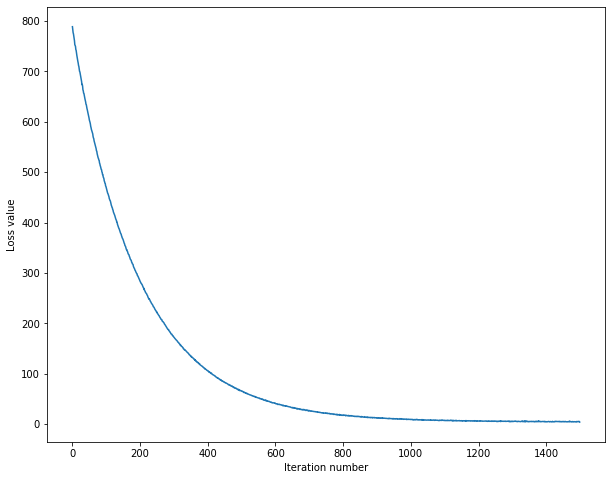

In [94]:
# A useful debugging strategy is to plot the loss as a function of
# iteration number:
plt.plot(loss_hist)
plt.xlabel('Iteration number')
plt.ylabel('Loss value')
plt.show()

In [96]:
# Write the LinearSVM.predict function and evaluate the performance on both the
# training and validation set
y_train_pred = svm.predict(X_train)
print('training accuracy: %f' % (np.mean(y_train == y_train_pred), ))
y_val_pred = svm.predict(X_val)
print('validation accuracy: %f' % (np.mean(y_val == y_val_pred), ))

training accuracy: 0.383449
validation accuracy: 0.389000


In [110]:
# Use the validation set to tune hyperparameters (regularization strength and
# learning rate). You should experiment with different ranges for the learning
# rates and regularization strengths; if you are careful you should be able to
# get a classification accuracy of about 0.4 on the validation set.
learning_rates = [1e-7, 2e-7]
regularization_strengths = [2.5e4, 5e4]

# results is dictionary mapping tuples of the form
# (learning_rate, regularization_strength) to tuples of the form
# (training_accuracy, validation_accuracy). The accuracy is simply the fraction
# of data points that are correctly classified.
results = {}
best_val = -1   # The highest validation accuracy that we have seen so far.
best_svm = None # The LinearSVM object that achieved the highest validation rate.

parameters = []
for lr in np.arange(learning_rates[0],learning_rates[1],(learning_rates[1]-learning_rates[0])/2):
    for reg in np.arange(regularization_strengths[0],regularization_strengths[1],(regularization_strengths[1]-regularization_strengths[0])/8):
        parameters.append((lr,reg))
################################################################################
# TODO:                                                                        #
# Write code that chooses the best hyperparameters by tuning on the validation #
# set. For each combination of hyperparameters, train a linear SVM on the      #
# training set, compute its accuracy on the training and validation sets, and  #
# store these numbers in the results dictionary. In addition, store the best   #
# validation accuracy in best_val and the LinearSVM object that achieves this  #
# accuracy in best_svm.                                                        #
#                                                                              #
# Hint: You should use a small value for num_iters as you develop your         #
# validation code so that the SVMs don't take much time to train; once you are #
# confident that your validation code works, you should rerun the validation   #
# code with a larger value for num_iters.                                      #
################################################################################
for lr,reg in parameters:
    svm = LinearSVM()
    loss_hist = svm.train(X_train, y_train, learning_rate=lr, reg=reg,
                          num_iters=1500, verbose=True)
    y_train_pred = svm.predict(X_train)
    train_acc = np.mean(y_train == y_train_pred)
    y_val_pred = svm.predict(X_val)
    acc = np.mean(y_val == y_val_pred)
    results[(lr,reg)] = (train_acc,acc)
    if(acc > best_val):
        best_val = acc
        best_svm = svm
################################################################################
#                              END OF YOUR CODE                                #
################################################################################
    
# Print out results.
for lr, reg in sorted(results):
    train_accuracy, val_accuracy = results[(lr, reg)]
    print('lr %e reg %e train accuracy: %f val accuracy: %f' % (
                lr, reg, train_accuracy, val_accuracy))
    
print('best validation accuracy achieved during cross-validation: %f' % best_val)
'''
lr 1.000000e-07 reg 2.500000e+04 train accuracy: 0.381857 val accuracy: 0.395000
lr 1.000000e-07 reg 2.812500e+04 train accuracy: 0.382082 val accuracy: 0.385000
lr 1.000000e-07 reg 3.125000e+04 train accuracy: 0.372122 val accuracy: 0.379000
lr 1.000000e-07 reg 3.437500e+04 train accuracy: 0.376367 val accuracy: 0.382000
lr 1.000000e-07 reg 3.750000e+04 train accuracy: 0.371061 val accuracy: 0.396000
lr 1.000000e-07 reg 4.062500e+04 train accuracy: 0.378000 val accuracy: 0.388000
lr 1.000000e-07 reg 4.375000e+04 train accuracy: 0.372429 val accuracy: 0.380000
lr 1.000000e-07 reg 4.687500e+04 train accuracy: 0.373449 val accuracy: 0.380000
lr 1.500000e-07 reg 2.500000e+04 train accuracy: 0.376102 val accuracy: 0.382000
lr 1.500000e-07 reg 2.812500e+04 train accuracy: 0.377510 val accuracy: 0.393000
lr 1.500000e-07 reg 3.125000e+04 train accuracy: 0.376755 val accuracy: 0.382000
lr 1.500000e-07 reg 3.437500e+04 train accuracy: 0.372020 val accuracy: 0.384000
lr 1.500000e-07 reg 3.750000e+04 train accuracy: 0.370898 val accuracy: 0.377000
lr 1.500000e-07 reg 4.062500e+04 train accuracy: 0.369551 val accuracy: 0.365000
lr 1.500000e-07 reg 4.375000e+04 train accuracy: 0.363327 val accuracy: 0.361000
lr 1.500000e-07 reg 4.687500e+04 train accuracy: 0.366898 val accuracy: 0.345000
best validation accuracy achieved during cross-validation: 0.396000
'''


[[10.17320554  1.          1.74728051 ...  8.50252004  7.4339581
  17.78685316]
 [ 3.77651356 -1.68696943  0.99140532 ... -0.92963176  1.
   1.82040035]
 [-2.76517042 -3.19668966 -5.82194118 ...  1.         -5.69758318
   1.8407306 ]
 ...
 [ 1.         -2.77785595  3.65984675 ...  5.81127866  5.89045668
   5.52870161]
 [ 3.31945391 -0.0311533  -1.13608346 ...  0.75561653  1.
   2.90774279]
 [ 2.64041361  3.25595943  0.53408945 ...  5.15021831  1.
   7.64356282]]
iteration 0 / 1500
[[-1.46592573 -4.47946416 -1.78202898 ...  1.          4.10820052
  -3.22911753]
 [ 6.31586547  1.05416455  6.04928349 ...  1.          9.0486911
   3.85951913]
 [13.53419935 11.84178876  9.68789793 ...  6.96609916  7.90338271
   7.75530613]
 ...
 [ 1.04410731  0.64179173  6.68259991 ... -2.55747761  4.29992652
   0.57761365]
 [13.40898692  4.82519232 10.52380612 ...  2.76143748  7.30636844
   0.40898078]
 [-0.40369672 -0.90383981  2.87782573 ... -3.76216418  1.42445888
  -3.53883715]]
[[-3.07980844  2.256809

[[ 0.14690429 -3.21667044 -4.72325074 ... -1.95444352 -4.24120095
   1.        ]
 [ 1.26056706  3.43280601 -2.33582652 ...  6.31897538  1.
   5.71678559]
 [-4.54985621 -2.33509202 -0.45086012 ... -9.29154885 -5.15177195
  -4.48994844]
 ...
 [ 2.02767692 -3.78143672  0.20057889 ... -3.82380624  0.88617491
   1.        ]
 [-4.14029308 -1.16624977 -0.57041299 ...  1.24502808 -2.97275168
  -3.70602729]
 [-3.47840173  2.33032619  5.15668579 ...  2.07141683  3.14145202
   1.        ]]
[[ 1.06048009 -4.71094096  0.66611055 ...  1.         -2.42736279
  -6.35147998]
 [ 1.9588933  -2.44236562  1.29056767 ... -2.88558975  1.
  -1.05126699]
 [-1.49800314 -6.06100803 -8.83446336 ... -6.89354846 -9.68173737
   1.        ]
 ...
 [ 1.93928318 -3.80565292 -1.43119805 ... -6.90091679  1.
  -0.43300898]
 [-6.65926077 -6.73507207 -9.80071825 ... -4.68906481 -6.12471865
   1.        ]
 [-2.39742955  1.79467274  0.27937677 ... -1.41739589 -1.50926172
   0.38341567]]
[[-7.20215395 -3.22242776 -4.51757774 ..

[[  1.          -8.71465593  -8.12688371 ... -11.64143848   0.56534408
   -2.23180491]
 [  1.           3.14081083   3.54538125 ...   0.83266862   1.25550123
    3.44645761]
 [ -3.30313582   1.06015494   3.13192195 ...   1.08401711  -0.1051632
   -2.59953998]
 ...
 [  1.           1.2560191    1.8644593  ...   4.6504161    3.7985565
    2.02405745]
 [  1.          -1.07058723   3.01605539 ...   3.29938617   1.66909207
    0.45365264]
 [ -0.26625408   3.03289721  -2.56030205 ...  -8.83051644   1.
    1.39936199]]
[[-2.31459295 -2.8575594   3.38154316 ...  1.53550843  3.43593554
  -5.07175262]
 [ 3.36018748 -0.03597359  1.67618642 ...  1.72582386 -3.68763484
   1.        ]
 [-1.17258278 -0.70140394 -1.1805842  ...  1.          0.49459082
   1.48633721]
 ...
 [-2.5750627   0.69636116  3.11430435 ... -1.39252255 -0.06506935
  -4.021891  ]
 [-3.81956028 -0.91024184 -0.69604821 ... -3.91308126 -1.38593342
  -4.33638585]
 [ 1.05400004  1.41292774 -2.25268539 ... -0.96491087  3.18978184
   2.4

[[ 4.75421522  2.16418511  8.18564754 ...  2.87726799  3.01452751
   1.        ]
 [ 0.69103586  1.81737531  1.         ...  2.5276321   0.35900378
   1.93715469]
 [-2.310141   -1.28614092 -0.29569998 ...  1.          2.12793386
  -2.10486141]
 ...
 [ 1.         -4.31089077 -4.0904089  ... -5.10270422  0.74407384
  -1.04140904]
 [-0.8066275   0.64382479 -1.87125916 ... -1.29056106  1.
   1.15668116]
 [-1.44533672  0.21395786 -1.53228245 ... -0.49172496  1.
  -0.81875012]]
iteration 100 / 1500
[[-4.79659071 -3.07785126 -4.85418388 ... -1.59393622 -3.77571411
  -3.36148232]
 [-1.06800393 -0.40108134 -2.39506688 ... -1.82731437 -4.73959813
  -1.79283662]
 [ 3.82781399  2.6755192   2.38743344 ...  3.60724244  5.15082882
  -0.2437563 ]
 ...
 [-3.97961053 -0.6721857   3.59449521 ...  7.72929101 -2.32358524
  -2.07004604]
 [-4.74458428 -0.79180353 -1.48452845 ... -1.04559788 -4.73979251
  -3.66773328]
 [-1.21035055 -0.94288098  3.09009502 ...  3.08063587 -0.31944018
  -0.97091627]]
[[-2.412288

[[-0.43845434  0.31772556  1.616437   ... -0.65952148  0.52418537
  -1.48738323]
 [-5.02022161 -1.92904201 -0.80612627 ... -1.0416264  -4.23052606
  -3.5640419 ]
 [ 0.14221056 -1.99886621 -2.65744953 ... -3.31673109  1.
  -3.79963023]
 ...
 [ 0.1962605  -1.07918498  3.53400339 ...  1.          0.47543443
  -1.89459383]
 [-0.92539914 -1.25020554  1.17755719 ...  1.          1.94691181
  -1.62531607]
 [ 3.00153513  1.45701108  3.16136347 ...  2.66103245  2.75560424
   2.03552678]]
[[ 2.44519477  2.87804125  4.83899174 ...  1.          2.75842716
   0.02287814]
 [ 2.91868528  2.60759219 -0.66055417 ... -1.75232906  4.16676223
   1.87519515]
 [-6.86937494 -2.88104579 -6.06881267 ... -3.1345562  -6.09534313
   1.        ]
 ...
 [ 5.29888772 -0.13569735  0.71801939 ... -0.2855478   6.17441189
  -1.68219518]
 [-2.16842452 -1.41379175 -2.53255062 ... -2.42780444 -3.2906329
  -1.91976419]
 [-2.9898412  -1.93556236 -0.39062494 ... -1.64960284 -1.60744736
  -2.6898981 ]]
[[ 3.98841519  1.38837609

   2.89231586]]
[[-0.52416211 -1.69144276  0.05500033 ...  1.73548561 -0.93257883
   0.62821367]
 [-1.40715593  0.45580434 -2.96053883 ... -2.15320696 -0.89410626
   1.        ]
 [ 6.26560955  1.07917127  6.74150739 ...  4.35295038  3.88923179
   1.        ]
 ...
 [ 2.88590934  1.          5.78532635 ...  6.62602761 -3.71916774
   1.82118438]
 [-2.97858073  0.15090203 -0.10670474 ...  0.63142312 -2.47124353
  -1.56683849]
 [ 0.97572116  0.44991272  2.86158496 ...  2.03851093  0.71321192
   0.14260631]]
[[-0.40382175 -1.66797633 -3.95715978 ... -3.32714429 -1.10719867
   1.        ]
 [-0.88683791  1.          4.71297074 ...  5.41233635 -0.64451172
  -0.9200431 ]
 [ 0.87415868 -1.25654577  2.02203013 ...  2.24738293 -4.66090705
   0.59789751]
 ...
 [ 0.75685008  0.34094671 -1.93945544 ... -3.24432816  1.
   1.30918303]
 [-0.17114019  1.89532779  1.         ...  1.54539778 -0.62457519
   1.6542105 ]
 [-2.67591667 -3.84529541  2.57211256 ... -5.28310994 -1.99212743
  -1.86553061]]
[[ 0.280

   0.92759712]]
iteration 200 / 1500
[[ 3.66110459 -3.26759251 -0.03547103 ...  1.         -0.85918137
   0.27253599]
 [ 1.01911088  0.74149363  2.35687244 ...  1.          0.84682759
  -0.45738534]
 [ 2.58335057  1.84841419  1.20638505 ...  0.87138228  0.44937513
  -0.08523067]
 ...
 [-1.93225935 -1.95503896 -1.9388408  ... -3.1604811  -1.4922122
   1.        ]
 [ 0.8890539  -0.5550524   0.60723863 ...  1.         -0.92143338
   0.31381012]
 [-2.31410435 -1.09952579 -1.45461007 ...  0.23114566  0.72654277
   0.41046819]]
[[-0.03921667 -0.47693994  1.02682218 ...  1.18069024 -0.021341
  -1.30879697]
 [-3.63817737 -2.50323952 -4.82260474 ... -4.97679699 -1.1720814
   1.        ]
 [-0.6581553   0.57983973 -1.23091815 ... -1.99119101 -1.95842574
   0.34707694]
 ...
 [-0.90940422 -1.07804474 -0.50389588 ... -2.72082867 -0.46812128
  -0.93072307]
 [-3.1322387  -2.09306691  0.72560606 ...  1.03819331 -3.67549634
  -3.84446422]
 [ 0.29871312  0.37176068  4.07759419 ...  3.92410262 -3.97371266

  -0.02796773]]
[[ 2.76474471  2.7824198   0.58945285 ...  1.44491472  1.
   2.79890671]
 [-2.10550314 -2.00377125  0.71519639 ... -0.46656638 -2.3825278
  -3.27430457]
 [-0.98080037  1.         -2.50111457 ... -0.88431556 -1.84663395
   0.90082948]
 ...
 [-0.81017966  2.53962127  3.29759294 ...  2.43725965  2.09042985
   1.        ]
 [ 0.75405854  1.25778727  0.26520517 ...  1.          1.73482181
   2.57758902]
 [ 1.         -2.85599252 -1.56419514 ... -2.0199136  -0.25797609
  -0.80968491]]
[[ 0.75014738  1.55751388  0.53096741 ...  1.          1.17623852
   1.93084629]
 [-2.17869935 -0.91937462  0.35240052 ... -1.20989805 -1.9275754
  -2.9668294 ]
 [ 1.60573473  0.72582749  3.08884402 ...  1.          0.8039811
  -0.21824392]
 ...
 [-0.4760561  -1.7656542   0.9240836  ...  1.         -2.61390737
  -0.54866013]
 [-0.94161945 -1.12899118 -0.45246837 ... -0.54173848 -1.96422063
  -2.88299826]
 [-0.56815648 -0.73200478 -1.18818317 ...  1.         -0.3102798
  -2.43525882]]
[[ 0.8537204

   1.67600763]]
[[ 0.27773683  1.29724619  0.16117158 ...  0.37356802 -0.07275433
  -0.27653755]
 [ 1.          2.21206631  1.18172525 ...  0.0500244   2.97267711
   1.1919744 ]
 [-1.53638615  0.58674957 -1.36016791 ... -1.09587683 -1.74587805
  -0.36633965]
 ...
 [ 3.30992046  2.78432095  3.32025067 ...  1.          3.67144571
   2.84632587]
 [ 0.29799342 -1.47633581 -0.6560615  ...  0.05058261  1.
  -2.30706788]
 [ 1.62035537  0.17244199  1.         ...  0.01030087  0.59465702
   2.23454794]]
[[-1.43676531  0.70568752  1.18833402 ...  2.76543896 -1.92344126
  -0.85532681]
 [-2.28212769 -1.75322228 -1.77228862 ... -0.71519923 -2.85515526
  -2.88382246]
 [ 0.52183757 -0.68146011 -0.2977923  ... -0.15689194  0.44111969
   0.88249516]
 ...
 [ 0.6382156   0.01620798  0.13807555 ... -0.00411181  1.
  -2.0903595 ]
 [ 1.09410521  1.21266983 -0.52391613 ... -2.92771871  1.
   0.20508202]
 [ 1.          1.89676317  0.38070013 ...  0.03769671  1.18374072
   2.75754347]]
[[ 0.43165315  1.       

   1.06610071]]
[[-0.23019031 -2.07557524 -0.31740308 ... -1.6891901   0.74253
  -2.30870987]
 [-1.61884533  1.          0.20239948 ... -0.18337934 -0.17004513
   0.17179576]
 [-2.73212689 -2.20206375 -2.0290781  ... -0.90772367 -2.2301805
  -0.96252188]
 ...
 [ 0.80217386 -0.17276181 -1.4913549  ... -2.21627494  1.19180501
  -0.15930174]
 [-2.12240241  1.         -1.87044618 ... -3.35294516 -0.13392793
  -1.55038626]
 [-1.90501659 -2.10661264 -2.62340267 ...  1.         -2.21497997
  -1.32824098]]
iteration 300 / 1500
[[-0.29564187 -2.79675006 -2.76563747 ... -3.5137896   1.
  -2.33612307]
 [ 1.         -0.74350916 -3.09527095 ... -2.48798786  1.42627006
   0.03903821]
 [ 0.39437866  0.64811095  1.         ...  0.60207535  1.08256536
   1.02525459]
 ...
 [ 2.49074907  1.40572814  0.59595884 ...  2.42011758  2.83844681
   3.11938297]
 [-1.60414729 -0.90394201  1.98806122 ...  0.55305042 -1.31399591
  -2.69422976]
 [-4.17356677  1.         -7.08237762 ... -3.41004953 -4.7273181
   2.438

[[ 6.47057735  4.0734463   1.73122388 ...  1.67162655  6.35842558
   4.42992631]
 [-0.36677888  0.16244506 -0.40343522 ...  0.90642962 -1.73371663
  -1.24446873]
 [-1.39680312  0.01794719  1.         ...  0.40321701 -1.55424745
  -0.88343789]
 ...
 [ 1.14644546  0.83537014  0.16327255 ...  1.          0.85397361
  -0.65210577]
 [-0.4716949   1.         -0.6833941  ... -0.75748341  1.03250484
   0.61043298]
 [-2.58540989 -0.59956282 -1.23846235 ... -1.08077049 -2.42428064
  -2.70516387]]
[[-1.11548355e+00 -2.25446825e+00  2.20646417e-01 ... -7.82741524e-02
  -3.17750947e+00 -1.84086702e+00]
 [-4.35413011e+00 -1.63338107e+00 -5.78272607e-01 ...  1.00000000e+00
  -4.50191573e+00 -2.36307292e+00]
 [ 4.96429229e-01  1.08029804e+00  4.61147705e-01 ...  3.32698748e-01
   1.62164241e+00  1.63573929e+00]
 ...
 [ 1.34564169e+00  1.00000000e+00  1.23621611e+00 ...  4.56065437e-01
   1.41946221e-01 -3.53574746e-01]
 [ 8.36027392e-01  4.34643839e+00  3.21912513e+00 ...  1.00000000e+00
   2.39539252

[[-1.58616265  1.         -1.98259322 ... -0.73353921 -1.94541899
  -0.21850376]
 [ 0.27202632 -0.89493737 -1.494778   ... -2.22583209  1.
  -0.82655298]
 [ 1.         -0.97268025 -0.47534756 ... -2.98646963  1.51710407
  -0.9065429 ]
 ...
 [ 0.63979769  0.82948642  1.37478246 ...  1.58486281  1.
   0.24989904]
 [-2.63138924 -1.13939017 -0.86618578 ...  1.         -0.70670832
  -1.43532482]
 [ 1.07012559  0.74013984 -0.9179331  ...  0.70397415  1.94212712
   0.91029684]]
[[ 0.21539872  1.89941868 -3.20855166 ... -2.06881857  0.07890727
   1.        ]
 [ 1.         -0.70134442 -2.47429887 ... -3.81651218  2.15668364
  -1.5511568 ]
 [ 0.99523167  1.26869353  0.65322153 ...  0.03006759  2.05570919
   0.60234122]
 ...
 [ 1.          0.13941453  0.88532721 ... -0.59405687 -0.15250511
  -1.3931354 ]
 [-0.68117722 -0.5523052  -1.61849997 ...  1.         -0.49588812
   1.38170414]
 [ 0.59396395 -0.03229838  1.49551522 ...  1.          0.70707503
  -1.18733615]]
[[-8.90247585e-01 -1.27105579e+0

[[ 0.92980593 -0.58803063  2.21961988 ...  1.13480503  1.28769198
  -1.52453563]
 [ 0.40895279  0.86295584 -0.04904308 ...  1.17595722  1.7249402
  -0.66345805]
 [ 0.81573784  0.43195357  1.         ...  1.10925917  1.91851086
   1.40009651]
 ...
 [ 1.59108633  0.15221464 -0.47584786 ...  0.53628968  1.
   2.46126126]
 [-0.01387629 -0.40061633 -1.37979645 ...  1.          0.0501913
   1.60335657]
 [-0.87993487  1.78771108 -0.09639449 ... -0.54223852 -1.61710315
   0.75152386]]
[[ 1.18502421  1.16089861  1.         ...  0.9268708   1.19784442
   0.64019541]
 [ 1.86844362  1.3394786   2.25570315 ...  1.08405006  0.39502513
   1.43936168]
 [ 0.67734556  0.17889831  1.11294325 ...  1.          0.43830751
   0.96246451]
 ...
 [ 1.66576811  2.09505139  1.94917978 ...  1.22727243  2.75504969
   2.61885183]
 [ 0.54394802 -1.33349886 -2.01796565 ... -2.702194    1.
   0.10755505]
 [ 0.16793861 -1.26238905 -2.62424029 ... -2.62336619  1.
  -1.17080865]]
iteration 400 / 1500
[[ 0.44872031 -0.9544

[[ 1.          0.04908862  0.26066475 ... -0.65655638  0.66936868
  -0.66114649]
 [-0.22994643 -0.49139357  0.45342457 ...  0.27492073 -0.03395242
   0.33674803]
 [-0.27856817  0.16117014  0.79157407 ...  1.         -1.28236087
   0.04286018]
 ...
 [-0.29815556 -1.62667733 -0.2279917  ...  1.         -0.37857254
  -1.29884616]
 [-1.83212014  1.55792486 -1.23370424 ... -0.41081034 -1.49586431
   2.55417047]
 [ 0.45482854  0.66966559  0.48431437 ... -0.23445145  1.00696625
  -0.28989327]]
[[-0.92321578 -0.1960299  -0.01945223 ... -1.083966    0.35412463
  -0.40027516]
 [-0.04376878  1.05333698 -0.91059478 ...  0.67952859 -1.02442232
  -0.04896124]
 [ 0.32895977  0.45152096  1.         ...  0.40195742  0.01178481
   0.01722449]
 ...
 [ 0.50166953  0.36458186 -1.22974544 ... -1.49558827  1.
   0.54932841]
 [ 1.02078155 -1.10796696  0.96810183 ...  1.          0.52943371
  -0.84191891]
 [ 0.4274441   1.41657038  0.82414162 ...  1.04059147  1.
   3.45185262]]
[[ 0.32094073  1.         -0.326

[[-0.18199399  1.          0.01879821 ... -0.01359591  0.57832354
   1.08734145]
 [ 0.6406265   0.40804394  0.86977838 ...  0.62445991 -0.13386035
   0.67402288]
 [ 1.75670593  0.76177996  1.         ...  1.17613863  1.19772514
   1.28827036]
 ...
 [ 1.27565406  1.95815669  0.38050363 ...  1.56372879  1.15866667
   1.        ]
 [ 1.04852975  0.19144817 -0.40493302 ...  0.22830314  1.
   0.80943072]
 [ 1.         -1.93047857 -1.77909744 ... -3.28812055  1.70014014
  -2.28653009]]
[[ 0.90950307  2.044662    2.74212029 ...  1.9428468   1.
   1.46009629]
 [-1.60883332 -1.5869132  -0.84937456 ... -1.17353279 -1.42334222
  -1.04214012]
 [-0.92241207 -0.1108862   0.52292426 ...  1.8907525  -1.22831529
  -0.01254855]
 ...
 [ 1.47079488  1.          2.28260781 ...  1.39693458  0.63738461
   1.61374358]
 [ 0.93467171  1.5157145   0.07287933 ... -0.03520709  1.31762401
   0.66424764]
 [-1.21148867 -0.75164016 -0.06733521 ...  0.8136062  -1.34748742
  -0.30666602]]
[[-0.67433244 -1.38996059 -0.039

[[ 1.15349353  0.64369296  0.32570013 ...  0.41533264 -0.35947512
   1.        ]
 [ 0.60544712  1.77742228  1.         ...  0.58072365  0.4951554
   0.88270215]
 [ 0.32404751 -1.35374528  0.82876471 ... -0.76851027  0.31966326
  -1.50679445]
 ...
 [ 0.50519719 -0.38567529  0.6876266  ...  0.27135603 -0.05742296
  -1.09518546]
 [ 1.56087939 -0.2326036   0.26485544 ...  0.29737149  2.03377357
   1.        ]
 [ 0.82255449 -0.39159119  0.30319893 ...  1.         -0.03112612
  -0.22076505]]
[[ 1.         -0.89376981 -1.26866639 ... -1.6211194   1.64903182
  -1.15997128]
 [ 1.          2.32530459 -0.45808101 ... -1.00931608  1.23252633
   2.59494524]
 [ 1.12150963 -1.94676549 -0.3890569  ... -1.05966766  1.
  -1.39610999]
 ...
 [ 0.36708965  0.49989759 -1.32591367 ... -1.10492421  1.53938888
   1.        ]
 [ 0.13454937  0.397425   -1.61799327 ... -0.06395862  1.
   1.90367623]
 [-0.82485459  1.8828973  -0.1795467  ... -0.31222495 -0.52322009
   1.        ]]
[[-0.89452058 -0.20395062 -1.7325

[[ 0.88625167  2.12336535  1.5080038  ...  1.          1.59511185
   1.55705723]
 [-0.03979604 -0.40891026  1.92153837 ...  0.82875923 -0.35293142
   1.        ]
 [ 0.78979075  0.67855861  0.28941899 ...  0.26621706  1.2604737
   0.86185473]
 ...
 [ 4.70268809  1.11463127  0.12217261 ...  1.82806751  2.82607873
   1.2633954 ]
 [-0.67597043  1.          0.41002802 ... -0.73187592  0.04117754
   0.75589148]
 [ 0.99951318  1.37417127  2.69965935 ...  0.41781311  1.00799941
   1.33487454]]
[[ 0.25008758  0.89541116  0.60998573 ... -0.77380154 -0.39635531
   0.23371374]
 [-0.6794237   0.75303944 -0.69548218 ... -0.28105383 -1.22694131
   0.1234451 ]
 [-0.92492538 -1.13939347  0.13271845 ...  1.         -0.80788364
  -0.91321006]
 ...
 [-0.06816357 -1.74140072 -1.12076757 ... -0.24728262  0.00967445
  -1.60470022]
 [-0.7878325   0.54642349 -0.19907982 ... -0.7724229  -1.27492853
  -0.70889911]
 [-0.96733952 -0.52468616 -0.41154613 ...  1.         -1.05564652
   0.76198297]]
[[-0.31150738  1.

[[-0.5429468  -0.37048091 -0.47791271 ...  0.6317754  -0.59223155
   0.38278693]
 [-1.28377224  1.         -2.0692366  ... -0.55904594 -1.19965543
  -0.55976627]
 [ 0.1018539  -0.51304951  0.27513385 ...  0.93282908 -0.10315652
  -0.14165769]
 ...
 [-0.63385673 -0.3574907   1.         ...  0.63127921 -1.05085151
  -0.37491806]
 [ 1.12145855  0.3321103   0.77155226 ...  1.40877977  1.
   0.58144592]
 [ 1.         -0.28008423 -0.55786146 ... -1.58315927  0.42534941
   0.40906534]]
[[-0.34126113  0.02413599  0.69114336 ...  0.93548379 -0.2852338
   0.27318138]
 [-1.49791295 -1.73493525 -2.00388501 ...  1.         -1.73381516
   0.00290029]
 [ 0.72209281  1.30184305  1.2859819  ...  0.97677511  0.37039821
   1.02298163]
 ...
 [ 0.82849143  1.         -0.46011233 ... -0.82019879  1.57599695
   1.06401637]
 [-0.02903793  1.         -2.28546789 ... -0.74522141 -0.36450368
   2.03204359]
 [-1.03460461 -2.00570473 -0.70958645 ...  1.         -1.68700978
  -1.23978919]]
[[ 0.52630017  0.79396685

[[ 0.07418388  0.79023336  0.40427854 ...  0.85599758  0.44225035
   0.34032018]
 [ 1.75573543  0.86120603  1.89108221 ...  0.82049615  2.37376336
   0.82972046]
 [-0.03360379 -0.23908484  0.67399195 ... -0.10848203 -0.75799303
  -1.05266748]
 ...
 [-0.23848822  1.56405935 -0.32449962 ... -0.04465438  0.11123427
   1.        ]
 [ 1.06103593  0.72649287 -0.66486934 ... -0.5568158   1.
   0.76109104]
 [-0.41075275 -0.21643593 -0.47979995 ... -1.24018842 -0.76230601
  -0.60576872]]
[[ 1.          1.0684773  -0.342324   ...  0.02827061  1.39274563
   1.28497325]
 [-0.20719165 -0.157989    1.         ...  0.64102418  0.31731757
   0.76668089]
 [-0.46700276 -0.16824693  0.82282899 ...  0.56961606 -0.89945453
  -1.44101564]
 ...
 [ 0.87211947  0.89775959  0.56400298 ...  2.22300448  0.64187038
   0.7049405 ]
 [-0.76112597  0.73369223  0.77904806 ...  0.79351664 -0.2042726
   0.05835607]
 [ 0.29246933  1.21630791  1.18778751 ...  0.75694544  1.21301132
  -0.08161681]]
[[-1.25412108  0.03512748

[[ 0.23758596  1.14664909  1.45747187 ...  1.86447535  1.
   1.59596653]
 [ 1.20543398  0.69973139  1.21038413 ...  1.          0.60241735
   1.52518888]
 [-2.05486695 -1.22873981  1.         ... -0.16614868 -1.70619785
  -0.72433355]
 ...
 [-0.34351816  1.11075798  0.17634376 ...  0.15523508  0.47696136
   1.        ]
 [ 0.17405336  0.01236066  1.         ...  0.19282218 -1.09487824
   0.13449598]
 [-3.5718829   1.         -2.79232488 ... -0.06005731 -3.603153
   1.10199906]]
[[ 0.38747104  0.38742746  1.         ...  0.57466847 -0.24640622
   0.43884384]
 [ 1.0082393  -0.27957579 -0.29181878 ... -0.43395516  1.
  -0.61672041]
 [ 1.14023516 -0.19561354  1.18312975 ...  0.83789288  0.15485116
   0.24761551]
 ...
 [ 1.06672061  1.          1.15649307 ...  0.05283996  0.74806288
   1.15299997]
 [ 0.89463824  0.5881261   1.         ...  0.73621755  0.66746932
   0.54931637]
 [ 0.58928589  1.         -0.56749448 ... -1.43545594  0.90611642
   0.17320628]]
[[ 1.22609741  0.36898801  0.74403

[[-0.31676636  0.87146026 -0.71284692 ... -0.58125482 -0.38565766
   1.        ]
 [-0.32073522  0.26010679 -0.94846091 ... -0.23150777 -0.1126249
   1.        ]
 [ 0.51443924 -0.59756602  1.         ...  0.8181074   0.19082616
  -0.9069627 ]
 ...
 [-1.23418072  1.         -1.42026646 ... -2.54539225 -0.63412036
   0.48340624]
 [ 1.423223    0.2472493   1.15976693 ...  0.6449127   1.19668773
   0.56531327]
 [ 1.          2.48499087  1.87320307 ...  2.14147384  1.34958516
   2.03236465]]
[[ 2.26213119  1.          0.48350896 ...  0.28361906  1.71865515
   1.93625243]
 [ 1.         -1.41573203 -0.60857314 ... -2.924061    1.54156936
  -1.43401488]
 [-1.20000495 -1.14797475 -0.23689323 ... -0.18308397 -2.55743797
  -1.8731216 ]
 ...
 [-0.31849588 -0.88111085 -0.30817271 ...  1.         -0.6169083
   0.12175882]
 [-0.85257932 -0.29491366 -1.16540076 ... -0.20310238 -1.08320972
  -0.43456223]
 [ 0.1330546   1.         -0.06874124 ... -0.50611891  0.96300028
   0.73724042]]
[[ 1.         -2.8

[[-0.81922147 -0.361263    0.06965774 ...  1.         -1.17824044
  -0.13256861]
 [-1.40595966  1.         -1.91441327 ... -1.84346217 -0.10098119
  -0.34444059]
 [-0.25549146  0.36831935 -0.587834   ... -1.25619114  1.
  -0.54952376]
 ...
 [ 3.21693033  1.26867985  1.         ... -0.42091587  3.47872134
   0.94651569]
 [ 0.39870804  0.56915255  0.48146596 ...  1.90422615  0.17650192
   1.03412032]
 [ 0.36404208  0.71414371  1.         ...  0.31203094  0.20521221
   0.63296421]]
[[-0.18440693 -0.09355695  0.80497848 ...  0.77910064 -0.49227942
  -0.12441188]
 [ 0.2709509  -0.53829338  1.         ...  0.26182643 -0.19164001
  -1.03857998]
 [ 1.31862899 -0.47231786  0.63739245 ...  2.35298364  0.16740661
   0.72338574]
 ...
 [ 1.94673921  1.20792835  1.53583627 ...  0.24345658  1.74404816
   1.41175811]
 [ 1.67784849  1.03671676  1.60675555 ...  0.84164701  2.20710424
   0.2258379 ]
 [-0.39875804 -1.35636922 -1.5720729  ...  1.         -1.52468022
  -0.63923741]]
[[ 1.         -0.0033203

[[ 1.27139925  1.          1.67688771 ...  1.90578122  1.27642753
   1.61082999]
 [-0.96732518  0.67644932 -0.84606466 ... -0.58208571 -0.90622801
   0.12015651]
 [ 0.90028222  1.69219225  1.16761331 ...  0.53519225  0.66532621
   1.18611315]
 ...
 [-0.84264801 -1.35810201  0.52869472 ... -1.53729323 -0.66236001
  -0.87946616]
 [-0.74574357 -0.13428098 -0.30036284 ... -0.07768799 -0.6163482
  -0.65391511]
 [-1.22296517  1.         -1.63456766 ... -1.09662388 -1.90092166
   0.35549392]]
[[ 0.4545243   0.82248455  0.38209938 ...  0.51543294  1.12914653
   0.6695805 ]
 [-0.27853379 -0.16639072 -1.51959006 ... -1.34438412  1.
   1.94386732]
 [ 1.65253113  1.67949984  0.63520862 ...  2.00474902  2.18109615
   3.28984867]
 ...
 [ 0.01149859  0.47801414  1.         ...  1.0608955  -0.05046574
   0.03007577]
 [ 1.86249844  0.88417956  1.03544726 ...  1.          1.91237225
   1.05893666]
 [ 0.81294051  1.08559454  0.80919061 ...  0.46934437  1.5062691
   0.6670779 ]]
[[ 0.42283039  0.6025527  

[[ 0.30353075  0.85341772  0.87381744 ...  0.6045082   0.0931934
  -0.12380443]
 [ 1.          0.62955577  1.82528372 ...  1.33796997  1.53963427
   0.8291423 ]
 [-0.06524352  0.15193854  0.26168271 ...  1.10431315 -0.82243505
  -0.59961979]
 ...
 [ 0.02121866 -1.21729779  1.         ... -0.27771933 -0.25649253
  -1.31557924]
 [ 0.68016561  2.17815858  0.39877269 ...  0.61432837  1.57865669
   1.        ]
 [-0.17053108 -0.1463655  -1.90962714 ... -0.27969884 -0.96612442
   1.        ]]
[[ 0.35220552  0.17350451 -0.18164549 ...  1.         -0.10626821
   0.2391726 ]
 [ 0.60492664  0.10234756 -0.47912597 ...  0.43349523  1.46243622
   0.62032605]
 [ 1.          0.74355199  1.8037846  ...  2.72768824  0.08413277
   0.96768562]
 ...
 [-0.61148501  0.27979834  1.         ...  0.99058439 -1.33980945
  -0.18359927]
 [ 0.17565142  0.66273457  0.54682032 ...  0.13073618  0.83543356
   0.93917851]
 [-2.70968334 -0.68986948 -1.07658489 ... -0.84492973 -2.39628803
  -1.05698322]]
[[ 0.12816011  1.

[[ 1.          3.53289908  1.37408078 ...  2.66697143  1.51343907
   3.8053573 ]
 [ 0.36600777  0.1859781  -0.07425828 ...  0.33101168 -0.81093695
  -0.54402925]
 [ 0.4801939   0.21865397  0.63451585 ... -0.12170872  1.
  -1.08965875]
 ...
 [-1.15154495 -0.86184977  0.35050145 ...  0.61256095 -0.86700385
  -0.5125451 ]
 [ 0.63374797  0.63481721  0.87112562 ...  0.7981038  -0.06729343
   0.9897204 ]
 [-1.21606267  0.18390987 -1.17297834 ...  0.82950463 -0.44487437
   1.        ]]
[[ 0.88043614  0.38941261  1.         ...  0.76833747 -0.02477991
   0.29279476]
 [ 0.88512455  0.50821133  0.40501528 ...  0.13578314  1.
  -0.1157044 ]
 [ 0.03499833 -1.1275375   0.43075749 ...  0.42339401 -0.30516684
  -1.22758444]
 ...
 [ 1.          2.00113924  1.01976513 ...  1.15715842  0.62420538
   1.51394209]
 [ 0.72287794  0.21970743  0.2289194  ...  0.03318301  0.65940849
   0.20252151]
 [ 1.91278296  1.8291253   1.82508459 ...  0.7580742   1.95415808
   2.78990827]]
[[ 0.57992418 -0.4767545   0.622

[[-1.06794719  0.6102724   0.23760597 ...  1.3206865   0.17734224
   1.        ]
 [-1.01199022 -0.38854341  0.35407931 ... -0.54053612 -0.72778582
   0.24926799]
 [ 3.58958346  1.98010854  1.4222157  ...  1.5629277   3.31773998
   2.3973085 ]
 ...
 [ 0.00606874 -0.7978608  -0.8496574  ... -1.04067577  1.
   0.33907076]
 [ 0.03560124  0.92214572  0.56780281 ...  1.          0.73469819
   0.64740816]
 [ 0.52051249 -0.44885362 -2.33303037 ... -2.85499467  1.
  -0.6992818 ]]
[[ 1.28665041 -0.59767664  1.         ...  2.24975849 -0.11230967
   1.30817332]
 [ 0.48956421  1.1717479   1.29204345 ...  1.07557303  0.96441435
   1.51875134]
 [-1.21862682 -2.41875259 -1.40427893 ... -1.3005801  -0.94977382
  -2.73089896]
 ...
 [-1.53678349 -1.0139101   0.16880517 ... -0.89488806 -2.38074187
  -1.0945487 ]
 [ 0.17235892 -0.23338565 -1.55749937 ... -1.72110645  1.
   0.16189679]
 [ 1.5622711   1.          1.10106325 ...  1.73676218  1.57314345
   1.36993712]]
[[ 0.1548389   2.36598525 -0.70839798 ..

[[-0.07346967  1.          0.09103562 ...  1.68252085  0.52637534
   1.93344308]
 [-0.98820261 -0.50068404 -1.81728227 ... -1.75799675 -0.26343318
   1.        ]
 [ 0.6902435  -0.04807148 -0.40240942 ... -0.06878207  1.
   1.02821347]
 ...
 [-0.14638887 -0.1559973   0.45074886 ...  1.         -1.16687118
  -1.10385745]
 [ 0.3780435  -0.20426845  1.41884688 ... -0.01266642  0.79117052
   1.        ]
 [-0.67459214  0.07487539  0.46231968 ...  1.         -0.52783036
   0.73058968]]
[[-0.80407802 -0.10108811  0.54220572 ...  0.3622002  -0.68772711
   0.0151873 ]
 [-0.24785287  1.          0.41008328 ... -0.11398857  0.80190228
   0.52310787]
 [ 0.84400839 -0.09838737 -0.61466458 ... -1.3394506   1.
  -0.24824806]
 ...
 [ 2.35837377  1.          1.14457379 ...  1.33311325 -0.01524619
   0.04092543]
 [ 1.16306445  0.18927146  0.7922666  ...  0.3170437   1.
  -0.30611997]
 [ 0.94191702  0.36380816  0.73776962 ...  1.20203162  1.28658883
   0.93104572]]
[[ 0.32945418  1.         -0.32550774 ..

[[ 0.01072773 -1.85052823  1.         ...  0.35524353 -0.18589487
  -1.51416441]
 [ 1.12237788  1.58001609  1.23454981 ...  1.42764336  1.51568177
   1.41312931]
 [ 1.499867    2.80407768  2.17027732 ...  1.          2.79901832
   1.92612303]
 ...
 [ 0.486313    0.39269366  1.80505962 ...  1.0131813   0.35362908
  -0.32309594]
 [-0.88245341  0.66754072 -1.9050732  ... -0.98905382  0.42127245
   1.        ]
 [ 0.76389533  0.4502978   0.92496627 ... -0.32333001 -0.4265007
  -0.00319122]]
[[ 0.50016844  0.90358432  1.04464272 ...  0.39662026  0.75227827
   0.29190355]
 [-0.32429309 -0.40594344 -0.40598787 ... -0.36475215  0.04215394
   1.        ]
 [ 0.85155394 -0.05635882 -0.33873784 ... -0.82883835  0.75981478
   1.        ]
 ...
 [ 1.31887235  0.7510494   0.69424953 ...  0.60424416  1.
   1.18887926]
 [ 0.17854553  0.78483239 -0.93815091 ... -1.47967458  1.
   1.37122541]
 [-0.40494352  1.         -0.53116542 ... -0.16398486  0.0996501
   1.26558795]]
[[-2.76528972 -0.62408642 -1.27559

[[ 0.38284128  0.35411407  0.3880376  ... -0.06117036  0.68330122
  -0.05022424]
 [ 0.1873378   1.39895862  1.         ...  0.60251968  0.41920655
   1.10131653]
 [ 1.32273525  0.51058373  1.         ...  1.26686697  1.4955713
   1.14570437]
 ...
 [ 1.         -0.35464739 -1.8408543  ... -0.85329441  0.51994996
  -0.37698226]
 [-1.10592849 -1.07656118 -0.08927274 ...  0.01769481 -1.05748384
  -0.44698995]
 [ 1.17912508 -0.48823802  1.         ... -0.16514319  0.9086342
   0.61517435]]
[[ 1.          1.44732207  0.2619881  ...  0.19634262  1.64179996
   0.79227254]
 [-0.97633639 -1.69502627  1.09392931 ...  0.00585192 -1.38363781
  -1.65509795]
 [ 1.7088297  -0.36495312  0.84962568 ...  1.15598286  1.
   1.04694377]
 ...
 [ 0.93381391  0.41864274  2.40280189 ...  1.0135237   0.11697272
   0.6800307 ]
 [-1.8620341  -1.58630315 -1.88876468 ...  1.         -2.30954608
  -1.28583788]
 [ 1.74945455  0.90964108  1.70834864 ...  1.86280784  1.44657093
   1.        ]]
[[ 1.40431544  1.60780831 

[[ 0.78245837  0.72231462  0.06968437 ... -0.11695562  1.
   0.98886358]
 [-0.57994491 -1.46598289  2.05884898 ... -0.05084086 -1.17886028
  -2.6501031 ]
 [ 0.8506408   1.          0.98896172 ...  0.58160611  1.19937636
  -0.22776221]
 ...
 [ 1.74593125  1.99172393  1.98368769 ...  1.          1.70100978
   1.62118616]
 [ 0.26543823 -0.15012281  0.02472082 ...  0.63770768 -0.66306195
   0.41944656]
 [ 0.12455882 -0.14167433  1.13980845 ...  1.          0.31356488
  -0.34743174]]
[[ 1.07560212  1.47332188  1.65968021 ...  1.92459952  2.08141483
   0.95940158]
 [ 2.55638691  1.66545007  1.93231889 ...  1.          2.62294974
   1.5689477 ]
 [ 0.02351839  0.07664432  0.81877468 ...  0.16061303 -0.26145343
  -0.02486339]
 ...
 [-0.34042966 -0.15089795  0.11147102 ...  1.         -0.65807609
  -0.73471261]
 [ 0.21021223  1.87679709  0.43604689 ...  0.61756959  0.82677896
   0.62643669]
 [ 1.52523325  1.52571992  1.28961379 ...  1.29624226  1.72506037
   2.07286081]]
[[-2.65065199 -2.0682105

[[-0.23734888  0.66197902  0.26511147 ...  2.07762849 -0.65737339
   1.18836381]
 [ 1.          0.01703028 -1.46670906 ... -1.82468295  1.44731225
   0.07596277]
 [ 0.23647751 -0.79358496 -1.61447032 ... -1.63338011  1.
   0.0115287 ]
 ...
 [ 0.3606721  -2.18202806 -0.86749285 ... -1.87277177  1.
  -1.79686981]
 [ 2.17488623 -0.19750674  1.30188245 ...  1.          1.91087894
   0.30834456]
 [ 0.39221712  0.60304223  0.6545949  ...  0.70012893  0.43577277
   0.3457069 ]]
[[ 0.72739912  1.03284407  0.29675699 ...  0.02932327  0.28680086
   1.        ]
 [ 0.25578695  1.40073001  0.9772776  ... -0.60488074  0.25282306
   1.        ]
 [ 1.28254755  1.17496081  0.33790205 ...  0.83547533  1.
   1.20698398]
 ...
 [ 0.16490145  0.13134645 -0.71685206 ... -1.69227916  1.
  -0.15854967]
 [ 1.26468618  0.41836533  1.         ...  0.65113802  1.44155156
   0.13185813]
 [ 0.11510026 -0.85379372  0.21107926 ... -0.28610045 -0.27891589
  -0.52611368]]
[[ 0.09808118 -0.61941448 -0.79203975 ... -2.714

[[-0.67399404  0.6786545   0.0398124  ...  0.19515428  0.07846432
   0.11121918]
 [ 0.83071507  0.53996447  1.61049614 ...  0.97600001  0.78480559
   1.        ]
 [-0.07093359  1.         -0.07093259 ... -0.4793603   0.12477211
  -0.38933878]
 ...
 [ 0.09560785  0.52412629  1.         ...  1.27070977 -0.39323781
  -0.57369606]
 [-1.44482058 -1.10293814 -0.41993829 ... -1.4996311  -1.29901425
  -1.29380084]
 [-0.02886665  0.8534742   0.01315691 ...  0.28582269  0.02071456
   1.        ]]
[[ 0.04312448  0.77193705  0.39823477 ...  0.12004027  0.17526315
   0.39736835]
 [-0.73116098 -0.05973904 -2.03633902 ... -1.14166703 -0.09036705
   1.        ]
 [ 0.91127152  1.03349524  1.         ...  1.26767174  0.70027424
   0.70223516]
 ...
 [ 0.03262475 -0.32398942  1.         ...  0.54773635 -0.49104736
   0.05728741]
 [ 0.78661579  0.31021206  0.30698647 ...  0.05590467  1.
   0.40672201]
 [ 0.97949131 -1.52137384  0.36990676 ... -0.42456261  1.
  -0.3754019 ]]
[[-0.53429381 -0.42377715  0.139

[[ 1.62546637  1.          2.99693899 ...  1.42191803  0.86512146
   0.53217832]
 [ 0.39575254  1.         -0.7967318  ... -0.21828667  1.39831307
   1.52065315]
 [-0.70484859  0.03435625  1.         ...  1.58992929 -0.98074321
  -0.20319919]
 ...
 [ 0.51798051  1.8919245   0.40220108 ...  0.68106392  1.
   1.72782104]
 [ 2.27247345  0.53411323  1.         ...  1.21165948  1.40067788
   0.78912851]
 [-0.18640175  0.51435761  0.97266437 ...  1.         -0.89606106
   0.10281118]]
[[-0.77217989 -0.29669603 -0.53852434 ...  0.09183387 -0.75874704
  -0.45054881]
 [ 0.15791788  1.54071037  0.22351766 ...  0.77967526  0.41605227
   1.        ]
 [-0.27372486 -0.65836931 -2.02146785 ... -2.03087394  1.
  -0.66527185]
 ...
 [-0.27679971  1.         -0.82425455 ... -1.9086094   0.14834277
   1.2765814 ]
 [-0.08132873  0.61266764 -1.58135909 ... -1.44879133  1.
   0.4630451 ]
 [-1.47944281  1.33141341 -2.13657155 ...  0.11676876 -0.25874406
   1.2995683 ]]
[[-1.89745504 -1.67532467 -0.34961848 ..

[[-1.22811522 -0.58343354  0.31022853 ...  0.4602372  -1.65777372
  -0.71976182]
 [ 1.          0.60433818 -0.99241099 ... -0.73290588  2.07433106
   1.76651364]
 [ 0.1099477   0.22624875  1.         ... -0.08403017  0.04177427
   0.05185767]
 ...
 [-3.14172401 -1.0975852  -2.3054658  ... -1.07465575 -2.39397226
  -1.4989497 ]
 [ 0.62512262  0.24667412  1.27567712 ...  0.45185578  0.65371993
   0.17312562]
 [-0.62882294 -0.97620109 -1.67925868 ... -0.77230663 -0.2168622
  -0.72211066]]
[[-0.47820391  0.03553658 -0.23313719 ...  0.43301946  0.42413002
   1.        ]
 [ 1.75848924  0.99911166  1.         ...  0.93119294  1.73473081
   0.49533544]
 [-0.01457116 -0.28596649  1.         ... -0.25929417  0.39850523
  -0.63131942]
 ...
 [ 1.90711905  1.46703203  1.81835376 ...  1.66688838  1.51256941
   2.74735191]
 [ 1.16442981  1.         -0.57103228 ...  0.62954357  0.56724545
   2.57580238]
 [ 1.09325189  0.23484055 -0.85272851 ... -2.16375496  1.
   0.44789018]]
[[ 1.51910658e+00  1.0192

[[ 1.         -0.37972467 -1.13547699 ... -0.94325711  1.10040815
   0.72407313]
 [-0.95645653 -0.34757005 -0.02778258 ...  0.08387523 -1.55866435
  -1.2636277 ]
 [ 1.          0.25172037  0.03416898 ...  0.09678488  1.08326299
   1.13761371]
 ...
 [-0.27266509  0.5310293  -0.74574982 ... -0.15304823 -0.61309697
   0.12807367]
 [-0.17757894  0.04101594 -1.42956931 ... -1.54133492  1.
   0.50656056]
 [-3.03309068 -2.8971684  -1.40341477 ...  1.         -3.71974626
  -2.090257  ]]
[[ 0.98581469  1.08601631  0.80787994 ...  1.57738487  1.
   1.14938891]
 [ 2.07400872  0.47107899  0.85575619 ...  0.99628169  2.25410145
   1.        ]
 [-0.90068766  1.         -0.44842595 ... -1.04475764 -0.79939629
  -0.38559627]
 ...
 [-0.2629711   0.28417587  0.76748819 ...  0.66726964 -0.3041528
  -0.12360876]
 [ 0.25001496  0.3672769   0.66587693 ... -0.48058009  1.
  -0.36129678]
 [ 0.58674934  0.12140956 -0.15097228 ... -0.53406195  0.15381133
   1.        ]]
[[-2.88654114 -1.12025846 -0.09206116 ...

[[-0.46111295  0.34075062 -0.8612829  ...  0.25158627 -0.70414124
  -0.49774624]
 [ 0.16460044  0.49791437  0.86018962 ...  0.73718935 -0.22919748
   0.16342626]
 [ 0.09600055 -0.0836093   1.47343009 ... -0.34411729 -0.94952583
  -1.46984837]
 ...
 [ 0.70358341  1.          1.36708701 ...  0.4492587  -0.57567636
  -0.22968184]
 [ 2.08898835  0.62936619  0.78638695 ...  1.          3.10823874
   1.54364067]
 [-0.81437652 -0.38812889  0.05576509 ... -0.69676404 -0.99707881
  -1.34062191]]
[[ 6.26406137e-01  1.00786288e+00  6.20123394e-01 ...  3.57289725e-01
   3.06819494e-01  8.08527591e-01]
 [ 1.19316155e-01  2.78880427e-01  5.06742134e-01 ...  4.06370152e-02
   4.03696404e-01  2.79806853e-01]
 [-2.27605630e+00  1.00000000e+00 -1.66629909e+00 ... -4.15672666e-01
  -2.04316112e+00 -1.37386252e-01]
 ...
 [ 1.03959413e+00  1.07379263e+00  1.14244737e+00 ...  9.19198544e-01
   1.05442634e+00  9.25151102e-01]
 [ 5.60224062e-01  8.00693226e-01 -5.60933885e-01 ...  1.00000000e+00
   6.58508687

[[-1.74084676 -0.28323325 -1.3976535  ... -0.54278705 -2.07854549
  -1.51900093]
 [ 1.         -0.60390923  0.34023442 ...  0.38505786  0.03558418
  -0.04493098]
 [-0.09280663  0.38900617  0.44139498 ...  0.92282747 -0.19082526
   1.2414778 ]
 ...
 [ 0.36790013 -0.30166812 -1.81494282 ... -0.98446407  0.35333474
   1.        ]
 [ 1.34217588  0.81603504  0.64651019 ...  1.          0.53399199
   1.02375589]
 [-0.1698198   1.         -1.12853484 ... -1.64545902  0.2013212
   0.19128258]]
[[-7.14157200e-01 -1.33187095e+00  4.06979943e-01 ...  5.11893148e-02
  -2.90627175e-01 -1.61643180e+00]
 [-2.20323523e-01  1.00000000e+00  1.49928233e-01 ...  1.26807404e-01
   1.26974523e-01  2.13232247e-01]
 [ 1.00000000e+00 -3.04788298e-01 -1.39208246e+00 ... -1.60950684e+00
   8.72308956e-01 -1.37028575e+00]
 ...
 [-2.68611550e-01 -5.36617040e-01  1.00000000e+00 ... -8.61219082e-01
  -4.50964967e-01 -1.00699991e+00]
 [ 8.41648186e-01  1.00000000e+00 -3.52308055e-04 ... -3.59132717e-01
   1.78933235e

[[ 0.09685512 -0.64108786  0.71609335 ...  0.01423143  0.29164898
  -1.03541987]
 [ 1.60434167  1.56876628  1.         ...  1.49749783  1.75791414
   1.33064124]
 [ 0.59617298  1.44289662  0.20134488 ...  1.          0.16867243
   2.57273466]
 ...
 [-2.54201047 -3.35495257 -0.42196841 ... -0.09476227 -2.71795314
  -3.75685779]
 [ 0.90122008 -0.65245883  0.8176658  ...  1.          0.66166212
   0.16477894]
 [-0.33204555 -1.23777191 -0.56101969 ... -0.81656873 -1.00238024
  -1.76663465]]
[[ 1.46394865  1.772859    3.13827075 ...  2.70100597  0.71641367
   1.        ]
 [ 0.09293764  1.          0.10397072 ... -1.46791349  0.99775552
   0.47141102]
 [ 1.          1.66931654  1.03211534 ...  0.72739729  1.38943761
   0.91474654]
 ...
 [ 1.          0.95403314 -0.31771351 ...  0.12547143  0.8579523
   1.17963292]
 [ 0.56455268  1.         -1.13073008 ... -1.4921022   1.509695
   0.33707301]
 [ 1.05923751  0.86110992  1.21320969 ...  1.32944296  0.83214154
   1.43540608]]
[[ 0.62021928  1.  

[[-1.45117198 -0.68064897 -0.57556087 ...  0.45572321 -1.65696668
  -0.48718144]
 [-0.05162091 -0.39768558  0.94121537 ...  1.32383567 -0.28486807
  -0.23609791]
 [-2.39757551 -3.15867236 -1.23670564 ... -1.31474846 -2.70652718
  -3.19625718]
 ...
 [ 0.65747802  0.28897692  1.19904529 ...  1.         -0.27485786
  -0.71726896]
 [-0.43505343  0.04163409  0.64452716 ...  1.         -0.44166276
   0.30780186]
 [-0.12572033 -0.53588821  0.97497042 ...  1.         -0.84691557
  -0.5664158 ]]
[[ 0.71097314  2.58814067  1.         ...  1.81068504  1.36926797
   2.46135347]
 [ 0.50377361  0.32896631 -0.65057389 ... -0.29212596  0.91340408
  -0.7809777 ]
 [ 0.54809512 -0.22133356  0.25260352 ... -0.32229499  0.29455746
  -0.9357276 ]
 ...
 [ 0.92885033  1.          1.40739629 ...  1.87450068  0.85581091
   1.03776351]
 [ 1.42229481  1.08649574  1.3957898  ...  0.64942201  1.18711146
   0.67343731]
 [-2.63356806 -2.02261474 -1.1208565  ... -0.94853387 -2.06545713
  -1.38922178]]
[[ 0.24609551  0

[[ 0.23329725  1.         -0.47769937 ... -0.82217463  0.10653936
   0.32122408]
 [ 1.12967704  1.48117524  0.8556972  ...  0.99510353  2.13585435
   1.64624175]
 [-0.40562528  1.         -0.75752041 ... -0.55527439  0.23832529
  -0.499598  ]
 ...
 [ 0.86824593  1.2466023   1.         ...  0.67938061  1.2563364
   2.0450143 ]
 [ 1.92935329  1.          1.16462868 ...  0.93665673  2.57946706
   0.32912666]
 [ 1.         -2.5353573  -0.40359542 ... -0.79382998 -0.18301038
  -1.60285161]]
[[ 0.87596254  1.7912072   1.         ...  0.86409072  1.69071458
   1.71596835]
 [ 0.84966375  0.47715975  0.61181492 ...  1.          0.8500945
   0.05023307]
 [ 0.43769276  0.61842244  0.07548322 ...  0.0578263   0.56843837
   0.40365658]
 ...
 [-0.70384572 -0.44712319 -0.1997894  ... -0.48972429 -1.43048197
  -1.28605282]
 [ 1.97397452  1.          0.35681903 ... -0.20588336  2.45232137
   1.02992198]
 [ 1.          1.49646607  1.08455243 ... -0.594602    0.97413741
   0.66803063]]
[[-1.08998222  0.0

[[ 1.72965308  2.27667772  1.5900228  ...  0.16415997  3.05611158
   1.47917065]
 [-0.10242162 -0.81468089  0.21600159 ...  0.02261899 -0.47623798
  -0.51405053]
 [ 0.97322617  1.7178337   0.27824853 ...  1.19279931  0.50854693
   1.86479945]
 ...
 [ 0.92163684  0.40512695  0.77404715 ...  0.29154154  1.
   0.2895737 ]
 [-1.51289933 -0.1411229   0.11013345 ... -0.20623467 -1.14345753
  -0.58371058]
 [ 1.          0.90538772  0.30459662 ... -0.07770853  1.02664121
   0.18897163]]
[[-0.32182068 -0.49345371  0.65964048 ...  1.         -0.98698052
  -0.66663628]
 [ 0.90061789 -0.39233358  0.29538011 ...  1.          0.60021796
   0.57285027]
 [ 0.56164053  0.30469112  0.41178447 ...  1.         -0.10912347
   0.63341042]
 ...
 [-1.35652754 -0.71940886  0.67302871 ...  0.2916292  -2.38143181
  -1.41685496]
 [-0.14451357  1.         -0.6055503  ... -1.35030468  0.07775549
  -0.11447194]
 [ 0.59136054  0.88341568  1.         ...  0.95846853  0.61471176
   0.94693308]]
[[ 0.30355933  0.4118158

[[-0.68550964 -0.32156021  0.26772668 ...  0.45033634 -1.03901611
  -0.66340995]
 [ 1.         -0.37170419 -0.41945737 ... -0.15004006  1.37156381
  -0.89294474]
 [-0.63331879 -1.10777618 -0.34413983 ...  1.         -0.80818489
   0.09825691]
 ...
 [ 1.          1.80099067  0.85805196 ...  0.27188249  1.40350517
   1.42279211]
 [ 1.          0.68385023 -0.40684042 ...  0.76487175  1.49970194
   1.3429739 ]
 [ 0.92587684  0.25930899  1.         ...  1.29331181  0.32723045
   0.52707884]]
[[ 1.36583754  1.          1.49275154 ...  2.4751892   1.89202379
   2.41030677]
 [ 0.89458242  0.82734462  1.17392122 ...  0.89933453  1.
   0.49612203]
 [ 1.67466019 -0.49428793 -0.77908579 ... -0.44363595  1.16479538
  -0.18955531]
 ...
 [-0.04546188  1.          1.21195517 ... -0.12658956 -0.10524205
  -0.21499361]
 [ 1.          1.81240958  1.2410448  ...  0.79668182  0.93895297
   1.87105152]
 [-1.29512241  1.         -1.24563906 ... -0.48889502 -0.94549539
   0.41454631]]
[[-4.35363781e-01 -1.493

[[-0.00919875 -0.62923949  0.06656245 ...  0.67910771 -0.96863323
  -0.02046205]
 [-0.36415024 -2.6418623  -1.134956   ...  1.         -1.05322191
  -0.66142407]
 [ 0.42992955  0.60029549  1.60384693 ...  1.14901577  0.05552932
   0.4132235 ]
 ...
 [ 0.06415472 -0.3563637   0.93797225 ...  1.         -0.84066405
  -0.79761418]
 [-0.47969861 -0.66178002 -0.65285912 ...  0.08382454 -1.31715214
  -0.17482028]
 [ 0.30842522  1.74228544  1.10408242 ...  0.66458738  0.65183596
   1.54069446]]
[[ 1.11885515  1.16312874  0.97817569 ...  1.21836497  0.95859259
   1.44782006]
 [-1.235408    0.11250019 -0.07411281 ... -0.2694784  -0.64732342
  -0.44867584]
 [ 0.86048476  1.02687648  0.56069295 ... -0.22440725  1.16981721
   0.56001703]
 ...
 [ 0.69194908  0.17873697  0.57042358 ...  0.41581709 -0.30399949
  -0.29855943]
 [ 0.16564052 -0.21585146  0.69264014 ...  0.44319444  0.36360161
  -0.84458484]
 [ 1.63763413  1.51258649  1.06118035 ...  0.50023648  1.74779382
   1.52837666]]
[[ 0.72545295  1

[[ 0.45714434  1.         -1.34460297 ... -0.12649264 -0.17223886
   0.9208757 ]
 [ 0.74264562  0.23926671 -0.09225947 ... -1.30460935  1.
   0.8604542 ]
 [ 2.17100189  1.          0.8503476  ...  1.54013687  1.02023626
   1.41616182]
 ...
 [ 0.72647936 -0.29778602  0.02138921 ...  0.19697998  1.01297815
   0.28463998]
 [ 0.01927291 -0.64238254  1.         ...  0.82254566 -0.99266918
  -0.58885468]
 [ 0.13120683  0.99083309 -0.37302342 ...  1.00241171  0.14260863
   1.        ]]
[[ 1.16353796  0.71981707  0.46781447 ...  0.71381     0.77455294
   0.2100028 ]
 [-0.48940755 -0.14316139  0.57502336 ...  0.34730773 -0.34279459
  -0.18048436]
 [-1.76129944 -0.98211009  0.70439456 ... -0.58460387 -1.50955073
  -1.01860527]
 ...
 [ 1.07810017 -0.48763634  0.33260461 ...  0.08173956  1.
  -0.38128505]
 [ 1.74637484  0.20144986  2.93695677 ...  1.27856326  0.35274172
  -0.27779408]
 [ 1.09629556  0.45759841  1.         ...  1.1216834   0.46812525
   0.9312413 ]]
[[ 0.46036495  1.         -0.889

[[-0.5690513  -0.28464645 -0.31153953 ...  1.         -0.10948023
   0.30629691]
 [ 0.58998798  0.02639085  1.58470879 ...  0.64648374  0.9605449
   0.40274114]
 [ 1.02868882  0.37687125  1.55573682 ...  0.1096752   1.88833322
   0.42997457]
 ...
 [ 0.6870409   0.76313435  1.9801485  ...  1.          0.7074738
   1.2130402 ]
 [ 0.6478652   0.86449074  1.12025452 ...  0.78890185  0.52121186
   0.70472561]
 [ 0.62131676  0.28259741 -1.20709053 ... -0.88995093  1.41479759
   1.        ]]
[[-0.0555323   0.7219173   0.68547992 ...  0.39784715  0.41615334
   0.68656587]
 [ 0.92810911  1.50573195 -0.4209211  ... -0.43031144  0.7240813
   1.        ]
 [ 0.72752523  0.6823146   0.0671845  ...  1.24807009  0.52614118
   0.37477147]
 ...
 [ 0.89426408  2.76405732  1.         ...  1.2925404   1.7677806
   1.93571328]
 [ 1.          0.21894699 -1.24252257 ... -2.02476599  1.42756436
  -1.12600514]
 [-0.38808307  0.19019872 -0.31682586 ... -0.23201792 -0.71785297
  -0.3703729 ]]
[[ 0.07353878  0.659

[[-1.31295717  2.87421947  2.43354921 ...  3.88977504  0.96124933
   5.30518806]
 [-5.26123893 -2.90673439 -0.85350962 ... -2.44719825 -2.6651946
  -1.4425509 ]
 [ 1.         -3.4505167  -4.0859038  ... -3.80846786 -2.54716743
  -3.485473  ]
 ...
 [-1.20836919 -5.4951237  -6.24821003 ... -5.06818329  0.55076296
   1.        ]
 [-2.88327846  1.26904896  1.         ... -1.14296717 -1.74739973
   0.37902414]
 [ 3.20989923  3.11704172  1.         ...  2.58475326 -3.57353676
   2.91548541]]
[[ 2.4995685   0.48852378  1.         ...  0.20426919  5.55805096
   0.22666995]
 [-2.92911657 -2.2064457  -1.59658659 ... -1.53089476 -2.63515308
  -4.08768268]
 [ 0.35012202  0.70514764  1.         ...  0.13960208  0.40972775
   1.77823959]
 ...
 [ 0.96012516  1.25815032  2.5089351  ...  1.          0.80192922
   1.68080822]
 [10.40840166  1.         10.27668608 ...  2.55485559  6.48602033
   8.24025751]
 [ 6.28523022 -0.41344934  0.22106261 ...  3.15949355  3.30833375
  -1.09844398]]
[[-1.78132068  1.

[[ 2.24718206  1.53363459  1.89770179 ... -1.11651041  3.81413654
   1.92391703]
 [11.65879497  1.          6.7966301  ...  4.62597162 11.58357191
  10.98015394]
 [ 1.36513613 -0.36966317  0.24738696 ...  2.57236132 -0.9295091
  -5.01671343]
 ...
 [ 1.         -0.81953085 -2.56317854 ... -2.58502497  1.25474445
  -2.87119527]
 [-1.52250788 -0.91512445 -2.74365275 ...  1.         -0.7396065
   2.01024803]
 [-2.21377425  0.05688326  1.         ... -0.3028962  -0.87425553
   0.17850316]]
[[ 1.43721014  1.77377865  2.0484647  ...  1.41272377  3.51710825
   1.682879  ]
 [ 0.31278695  0.73086832  1.63909102 ... -1.06034634  0.9485474
  -2.28132018]
 [-0.97826484 -0.60688588 -1.03844055 ...  1.          0.21072552
  -0.01411433]
 ...
 [ 0.9997065   0.77052996 -0.21909233 ... -0.43357507  0.74739368
  -2.01682376]
 [ 2.85928243  2.00239524  1.         ...  0.48104999  2.15477489
   0.16975508]
 [ 1.         -5.71733053 -3.52251215 ... -1.50861338 -5.21469144
  -4.19641535]]
[[-1.5756986  -2.96

[[ 4.57099308  4.68481809  2.62387379 ...  3.2368704   1.82045618
   1.29518686]
 [-1.98424742 -1.26610943  0.89546446 ...  1.         -2.54560742
  -1.81707663]
 [ 1.08577936 -2.72306663  0.93190085 ...  1.          0.8797186
   1.44809764]
 ...
 [-5.18568613 -2.38892386 -4.35451186 ... -5.46535099  1.
  -4.87682262]
 [-0.73157889  0.45925141 -2.98980737 ... -0.38613289 -2.34140524
   1.        ]
 [ 1.98045387  0.49787862 -0.62461273 ... -2.03938478  1.
   1.30727986]]
[[ 3.74539547  4.19305088  1.         ...  1.45487096  4.35855491
   1.17917777]
 [ 0.86374714 -1.81123345  2.00269695 ...  2.89712395  0.38173974
  -4.48406187]
 [ 0.63421581 -1.11670166 -3.80107399 ... -7.72450784  1.
   0.58573007]
 ...
 [ 1.88394798  5.56649413  0.94430232 ...  1.13857357  3.1559125
   1.9583166 ]
 [ 3.83948816  1.          3.91440687 ...  4.06120569 -0.96764696
   4.04113388]
 [ 1.09077704 -1.65144088 -1.43600015 ... -4.04469785  1.
  -0.84060511]]
[[ 2.66197042  2.63959581  1.         ...  2.44558

[[ 1.          4.11926518  2.16791559 ...  2.971364    2.1491542
   2.95996836]
 [ 1.74853751 -1.80775836 -1.69592174 ... -1.78268448  2.15602703
   1.        ]
 [ 1.55390133 -2.38490715 -0.79683075 ...  0.34489328  1.
  -1.06623837]
 ...
 [ 1.          0.432183    0.54280502 ... -2.26262082  2.91224916
   0.2246129 ]
 [-1.56009759  1.         -0.09892798 ...  1.11518393 -0.55101658
   1.09979927]
 [ 0.47391834  0.29636626  1.         ...  0.65729751 -1.06863896
  -1.47614638]]
[[ 1.12755993  1.         -1.38217263 ...  4.5064343  -2.63350283
   2.27232218]
 [ 5.85139274  3.28718101  2.81522913 ...  3.54990854  4.87192471
   2.56443254]
 [ 0.62740935  2.13611211 -0.72402313 ...  0.88771697  0.25364546
  -1.8903375 ]
 ...
 [ 3.21780577  3.93038855  1.31806517 ...  1.59405842  0.55752242
   3.22891507]
 [-4.41542872 -4.12819678 -4.7796324  ... -4.44221334 -2.44239997
  -1.33288423]
 [ 4.31940772  4.09689221  1.         ...  1.27629948  4.67624747
   2.50054413]]
[[-0.18693248 -0.08576013

[[ 2.24232228 -0.06966237  2.53511895 ...  4.32929581  0.71861073
   1.70946379]
 [ 0.83771269 -1.82769729 -0.64186096 ... -0.20802427 -1.95453819
  -0.38915797]
 [-1.68647898 -1.74678918 -0.53462998 ... -1.11012381 -0.60030764
  -0.59635699]
 ...
 [ 1.87506826 -2.13103002 -1.17842431 ... -0.28335191  1.
  -0.36811283]
 [ 0.2105519  -0.21802666 -1.25588744 ... -2.50151435  1.
   1.54738609]
 [ 2.90129579  1.38888405  1.75742419 ...  2.22038212  1.79727176
   2.71041511]]
[[-3.4088455  -1.27745276 -0.16877687 ...  1.         -2.51390224
  -1.1096553 ]
 [ 1.         -0.26202406 -2.16981328 ... -5.42619889  2.12795633
  -1.06389643]
 [-0.19693105 -1.88607232  0.36845737 ...  0.36340631 -1.19493017
  -4.16820554]
 ...
 [ 1.         -2.23145806 -1.86083927 ... -3.44599263  0.7837308
  -3.25926853]
 [-0.61734604  2.20099296  0.76881654 ...  0.44411599  2.50051307
   0.71824204]
 [ 2.3782555   1.00801126  1.85289969 ...  1.         -0.92494936
  -0.8840592 ]]
[[-0.83001028 -1.40958101  1.3780

[[ 1.13028686 -0.23337656  1.         ...  0.05446832  0.35222492
  -0.03633933]
 [-0.3233015   0.46854373  1.83790057 ...  1.31910526  0.84895815
   0.85584777]
 [-2.98784768 -2.87483147 -0.22917456 ...  1.05679749 -2.28893004
  -1.98173038]
 ...
 [ 0.86019882  0.75745746  0.25464134 ...  3.08603821  0.50636484
   2.06421421]
 [-1.33532432 -4.51000302 -3.15675522 ... -1.74218658 -4.06370761
  -5.18128184]
 [-3.16893684  1.31364565 -1.72080772 ... -4.79648115 -0.769027
   1.        ]]
[[ 4.71325608  3.64111815  2.97861194 ...  0.82313308  5.50131358
   3.30383751]
 [ 0.10384331  0.43482919  0.17329303 ... -0.48549515 -1.97376864
  -1.56488716]
 [ 0.15323245  0.74755223  1.20235904 ...  1.          0.57285641
  -0.11769598]
 ...
 [-0.26549183  0.13548148  2.71978259 ...  1.46993021 -0.038298
  -0.15433878]
 [-1.54284683 -0.99668969 -0.0146048  ... -0.82000151 -1.1876336
  -2.07102612]
 [ 1.          1.00654987  0.13074129 ... -0.3225018   1.91449625
   0.79716911]]
[[-4.31888985 -1.9254

[[-1.98560756 -1.70455086  0.98096998 ...  0.14648675 -2.02058647
  -0.39371457]
 [ 2.71270085  1.98268142  1.         ...  0.60308692  5.27958722
   1.52070046]
 [ 0.11273325  0.08361647 -1.34037088 ... -1.34161499  1.
   1.14727294]
 ...
 [ 0.2771998  -3.34828836 -2.90301849 ... -4.70981903  1.
  -1.98133126]
 [-0.23906093 -0.16256085 -0.27657936 ... -0.98337981 -0.9456957
  -1.82364718]
 [ 0.41944295  1.         -1.60615768 ... -3.48897012 -0.8938094
   0.47751494]]
[[-2.13648381  0.48083696  0.99734427 ... -0.6329625  -2.61314988
  -0.21134837]
 [-0.89789551 -0.39606677 -0.5171364  ... -0.45551611  0.26675194
  -1.20235311]
 [-1.56136967 -0.92078556 -2.49787367 ... -3.45739139  1.
  -0.72430248]
 ...
 [ 1.         -0.23912684  2.27174869 ...  0.16968262  0.42698683
  -2.59870538]
 [ 0.63182072  1.71928213  0.21500508 ... -0.6523801  -1.66283608
  -0.55823293]
 [-1.3254658  -0.16677059  0.98463847 ... -1.59433078 -0.63887
  -1.50595305]]
[[ 0.08429167  0.78524994  1.         ...  0.

   0.03683289]]
[[ 4.57255248  0.93808774  2.54767109 ...  4.47445662  1.
   1.71285081]
 [-4.45204164 -1.21231348 -5.14291502 ... -1.96704798 -3.97340299
   1.        ]
 [-0.74920852 -0.54216977  0.2085815  ... -0.18788822 -0.30675511
   1.        ]
 ...
 [ 1.41935085  3.37005129  1.23094589 ... -0.61934881  1.
   1.12504521]
 [ 1.03764079  0.10667991  0.65233073 ...  1.         -0.18315281
   0.59689399]
 [ 1.         -0.29264074 -1.42979805 ... -0.81435772  0.29717821
  -0.79330974]]
[[ 1.359585    2.37122068  1.72879718 ...  1.          2.16113209
   0.08954544]
 [-1.36556552 -1.07389526  1.         ...  0.84296332 -3.08447663
  -1.6562179 ]
 [ 1.          0.52755512  2.72856751 ...  1.58886705 -0.06255243
   1.62825358]
 ...
 [ 0.27627521  0.36863903  0.98242598 ...  0.7096514   1.08758325
   0.53930966]
 [ 0.04822075 -2.71298626  0.57683546 ...  0.30248247 -0.81744447
  -1.33348137]
 [-0.06615255  1.          0.36179863 ... -0.12641213  3.23659033
   0.77874027]]
[[ 0.70470495 -0

[[-0.2052655  -2.30922139 -2.42704257 ... -3.05399219  1.
  -2.65842326]
 [-0.20466396  1.1407715   0.60720138 ...  0.63866397  0.10879609
   0.99577548]
 [-2.04778108 -2.399089   -0.18097245 ...  0.13287482 -2.18409358
  -1.80573502]
 ...
 [ 1.70858199  1.04152523  0.55802018 ...  1.          0.38152767
   0.34091882]
 [-0.40341476 -2.78741399 -1.0337367  ... -2.36294785  1.
  -1.15681883]
 [ 0.81293759  1.07936469 -2.89938948 ... -3.04147729  1.
   2.04746094]]
iteration 300 / 1500
[[ 0.50403027 -0.66021437  1.31082843 ...  1.14698146 -0.35574404
   0.71776364]
 [ 0.64257994  1.74771824  1.62346618 ...  0.85393423  1.68263769
   1.48109279]
 [ 0.282549   -2.1426371   0.26964698 ...  1.          0.94798321
   0.59490082]
 ...
 [-1.85187091 -0.78655697 -0.1942452  ...  0.87299859 -2.27684599
   0.64321283]
 [-1.86182938 -3.38924709 -1.15276761 ...  0.40093908 -3.1837122
  -2.92434634]
 [ 0.0078786   0.76149332  1.38374681 ...  1.01377618 -0.569159
  -0.10306413]]
[[ 2.51779131 -0.21283

  -0.21730053]]
[[ 1.         -0.09740403 -0.84301747 ... -1.84492709  1.8220045
   0.9093454 ]
 [-0.21042705  0.41475306  1.         ...  1.31922978 -0.50214921
   0.13979878]
 [-2.29819189  1.         -1.20011871 ...  0.68738221 -2.40329634
  -0.61389735]
 ...
 [ 2.16340398 -0.88973292 -0.87927756 ... -1.84137452  1.
   0.93595857]
 [ 0.29506852  2.62085827  2.15370714 ...  3.22699939  1.
   2.80021367]
 [ 1.50015824  0.9055547   0.94139374 ...  0.75246683  1.96288269
   0.32996592]]
[[ 4.45348937  1.          1.36831743 ...  1.23611874  2.56553318
   4.27144254]
 [ 0.47845923  1.         -0.53866362 ... -0.66323382  1.38236048
  -0.02629212]
 [-1.1797549   0.58118783  1.37971834 ...  1.01440271 -1.49926727
   0.22275663]
 ...
 [ 1.          2.41150948 -1.42139748 ...  1.23631566 -1.37722693
   1.98105449]
 [-1.78940661 -0.79755982  1.         ... -0.10470567  0.112405
  -0.16487867]
 [ 1.80978451  1.          1.08644439 ...  0.29939338  0.1296622
   2.63264587]]
[[ 0.61894285 -1.632

[[-1.54035919  1.         -1.6191367  ... -1.57241339 -1.13831003
  -0.22083364]
 [ 0.74466836  0.86984726  0.13160854 ... -0.52154627  1.
   1.12874363]
 [-0.19297773  1.          0.00991459 ...  1.13767336 -0.53908455
   0.74278756]
 ...
 [-1.73764394  0.90821365 -1.11625542 ... -1.22144112 -0.6260016
   0.73045237]
 [ 1.          2.50596462  1.57269868 ...  1.6232187   1.85750377
   1.42518824]
 [ 1.69667601  2.16593948  2.79592661 ...  1.95385887  1.10813045
   0.28467895]]
[[-1.03893584e+00 -6.38666387e-01 -4.69761142e-01 ... -3.38437191e-04
  -1.55649362e+00 -1.13447661e-01]
 [-2.22524467e+00 -1.86372130e+00  1.00000000e+00 ...  3.54559154e-01
  -1.99499241e+00 -3.55444438e+00]
 [ 1.12080428e+00  1.45375381e-01  1.30267143e+00 ...  4.18587522e-01
   1.54387511e+00 -4.95375459e-01]
 ...
 [-8.41553402e-01 -2.06690085e+00 -9.96749597e-01 ...  3.32522424e-01
  -1.20150138e+00 -1.52611434e+00]
 [-8.27071646e-01  1.29070372e+00  9.37399865e-01 ...  9.23387057e-01
  -7.24769180e-01  1.9

[[ 1.65746287  0.90699127  1.02487408 ...  1.402109    1.33199567
   1.75043712]
 [ 1.         -0.00494869  0.37590813 ...  0.72481369  0.29631605
   1.32114342]
 [ 0.92968512 -1.23490526 -0.68874632 ... -1.29383485  1.
  -0.63708256]
 ...
 [-0.45551705  0.91491549  1.86743713 ...  1.15724984  1.
   0.41987937]
 [-2.83441116 -1.87717173 -0.10201932 ... -1.0453126  -2.53397723
  -2.40672336]
 [-2.6349707  -0.40655536 -0.50826747 ...  0.0159132  -0.57292255
   0.14631608]]
[[-3.35049154e-01  1.78697718e-03 -2.63258451e+00 ... -2.15973865e+00
  -2.59615516e-02  1.00000000e+00]
 [ 3.24644273e-01 -2.62320633e+00  1.06056241e+00 ...  1.00000000e+00
   3.87423053e-01  5.75863044e-01]
 [ 9.41277059e-01 -4.92040629e-01 -3.49095925e-01 ...  8.95644540e-01
   7.70022691e-01  1.00000000e+00]
 ...
 [ 1.34618869e-02  1.39150184e+00  1.58937760e+00 ...  4.84190025e-01
   1.03100927e+00  2.07794787e+00]
 [-1.44049541e+00 -1.27352707e+00  3.68074009e-01 ...  1.51327285e-01
  -2.14290504e+00 -1.69728260

  -0.37890522]]
[[ 4.10310623e-01 -7.41127270e-01  8.15527221e-01 ...  6.98970229e-01
   9.62760269e-02 -2.28141180e-01]
 [ 1.00000000e+00  5.07827301e-01  4.21585722e-01 ...  3.91376435e-01
   1.55450882e+00  1.54618672e-01]
 [-3.07164414e+00 -1.30857813e+00 -5.91052687e-01 ...  4.18385234e-01
  -2.21683744e+00 -1.29330774e+00]
 ...
 [ 1.00000000e+00  1.87127068e+00  6.23341078e-01 ... -1.78854268e-02
   1.48188418e+00  9.86336552e-01]
 [-2.10629826e+00 -1.46260240e-03 -1.24147996e+00 ... -1.85933872e+00
   8.58989176e-01  1.00000000e+00]
 [-1.01319073e-01  9.72199335e-01 -1.65988311e+00 ... -1.45796147e+00
   4.33692676e-01  1.00000000e+00]]
[[-2.97921081  0.43632845 -0.70906709 ... -0.47020006 -2.67152001
  -0.97640783]
 [-0.21516218  0.2412713   1.         ...  1.6237563   0.93324478
   0.15177163]
 [ 1.62572195  1.32554287  1.93342512 ...  1.41615512  1.67100831
   0.40327979]
 ...
 [ 0.86430247  0.95565137 -0.41344822 ... -0.51290325  1.30507798
   1.        ]
 [ 0.86074448  1.16

[[ 0.6800347   1.          1.38992856 ...  1.0345057   1.37870772
   1.22721589]
 [ 0.85985915  1.         -0.88984012 ... -0.65237154  1.06753703
   2.54885651]
 [-0.08968992 -1.45926515  1.         ... -1.72282094 -0.36761125
  -1.62883891]
 ...
 [-0.09800055 -0.37302082 -1.19688589 ... -0.3643318   1.
   0.00836499]
 [ 0.952742    1.94323858  1.75477352 ...  1.00262657  0.49048175
   1.        ]
 [ 1.         -0.90160507  1.86284364 ...  0.28091052  0.34626778
  -1.5200025 ]]
[[ 0.5495585  -0.82626567  0.43310415 ...  0.41777264  0.43499694
   0.35860595]
 [ 1.71046668  1.91680488  1.         ... -0.01665943  2.33599578
   0.92967816]
 [-1.36489669  0.39730465  0.16872376 ... -0.70588436 -1.31631962
  -0.33791359]
 ...
 [ 0.14856877 -1.03077806 -1.32303892 ... -1.3256931   1.
  -0.25123534]
 [ 1.          0.37081243  2.25715518 ...  1.06926599  0.68623455
   1.82836557]
 [ 2.61448371  1.20622986  0.63968584 ...  1.25355901  3.46161926
   2.58252007]]
[[ 0.15752464  0.92024213  0.313

[[ 1.31883158  2.72697127  1.         ...  1.78718216  2.34508284
   1.17502552]
 [ 1.69237283  1.42049776  1.61434847 ...  1.          1.35056329
   0.81011676]
 [-0.58290616  1.35779034 -1.47558229 ... -1.55317809  1.
   1.73881145]
 ...
 [ 1.          1.96068627  0.76283383 ...  0.71406071  1.25672774
   1.39140975]
 [ 0.37084135 -0.77137344  0.75512093 ...  0.6046417  -0.42489486
  -0.40919709]
 [-0.88410501  1.19653801 -0.58317144 ...  0.76444708  0.74588677
   1.88019528]]
[[-0.35395277  0.04672059  0.29344156 ...  0.89838728  0.1400438
   0.27034478]
 [-0.72120215 -1.13233163 -1.30898221 ... -1.0416323  -1.03009358
  -1.38452351]
 [ 0.41614973  1.66465324 -0.24401911 ... -0.42639633  1.1330117
   1.        ]
 ...
 [-2.00580302 -0.08684101 -0.46011443 ... -0.0879781  -1.4984917
  -0.16178769]
 [ 0.78101508  1.61919607 -0.29286118 ...  0.07832678  1.39642528
   1.        ]
 [ 0.74357149  1.          0.80735565 ... -0.25145896 -0.41906725
   0.90545968]]
[[ 1.         -1.26544492 -

[[ 1.52283401  3.26323594  0.49005928 ...  1.61899981  1.3470294
   3.75578515]
 [-0.4647247   1.53547299 -0.1207852  ...  0.72187195  0.4439773
   1.45881041]
 [-0.18196008  0.62090675 -0.22116147 ...  0.58845006  0.4382346
   0.4759957 ]
 ...
 [-1.07438557 -1.56307814  0.06480579 ...  1.20889047 -2.18375745
  -2.48578357]
 [ 1.         -1.33894694 -0.74260832 ... -1.11165857  0.75284807
  -1.0016426 ]
 [ 0.13361364 -0.36054963 -0.02413001 ...  1.26714985 -0.07645085
  -0.19092436]]
[[ 0.37993487  0.26782943  0.67291258 ...  1.20928706 -0.01229162
  -0.34117843]
 [ 1.57367637  1.          0.59685228 ...  1.5381951   1.66052061
   1.36052499]
 [ 0.27282613 -0.76187401  1.         ... -0.59417441  0.14215676
  -1.80803349]
 ...
 [ 0.37026249  0.88582247 -0.07713182 ...  1.4950155   0.17380284
   1.26241931]
 [ 2.1191706   1.7964081   0.73493667 ...  1.30126695  2.05824394
   2.71799606]
 [-0.5380086   1.          0.02007166 ...  0.12097213 -0.27883872
   0.53207554]]
[[ 1.67285029  1.52

[[ 1.18366963  1.         -0.25425136 ... -1.54425491  1.06350101
   0.59319888]
 [-0.76743857 -0.89179838  0.45158989 ... -0.11589789 -0.62349777
  -1.11130636]
 [-1.13678663  0.67922435 -0.24408306 ...  0.46120136 -2.50137379
  -0.36025163]
 ...
 [ 0.06310274  0.73805329  0.62451682 ...  1.          0.49051834
  -0.03547357]
 [-1.19741553 -1.34156588 -0.37153896 ... -0.66350188 -1.11388497
  -1.7379715 ]
 [ 0.94951168  1.97722768  1.         ...  1.30263613  1.31228385
   2.33223084]]
[[ 1.         -0.09568286 -3.39490815 ... -3.86049326  2.11622792
  -0.31347086]
 [ 1.         -0.26754025 -0.69921402 ... -1.02271523 -1.22177494
  -0.15469523]
 [-1.20025697  1.         -0.3419589  ...  1.74202682 -0.11069262
   0.15977057]
 ...
 [ 0.80667304  1.64037607  1.         ...  1.60753364  0.39098225
   1.03536238]
 [ 0.36494919  0.12179451  1.         ...  0.07291214  0.64552679
   0.47531461]
 [ 0.05553211  0.92707759 -0.4538759  ...  0.4031985   0.89695023
  -0.20287085]]
[[ 1.10392694 -0

  -0.97651304]]
[[-0.63493433 -2.01518373  1.26070863 ...  1.03951468 -1.13223321
  -1.79195982]
 [ 0.58848711  0.59177776  0.26772561 ... -0.67381904  1.
  -0.6607547 ]
 [ 0.94924354  1.75315794  1.25561439 ...  0.8178349   1.70082262
   0.82112424]
 ...
 [-1.966909   -0.81138659  1.         ...  0.85026643 -3.19119186
  -1.0067165 ]
 [-0.51955924 -1.36952306  1.81234409 ...  0.06037469 -0.48899859
  -1.69443472]
 [ 1.         -0.56452592 -0.38762744 ... -0.14498816  0.56535437
  -0.60989975]]
[[ 0.78067754  0.48598736 -0.82806446 ... -0.54550426  0.90605942
   1.        ]
 [ 0.5236999   0.74668548  1.75668709 ...  0.67321297 -0.06273671
  -0.16960747]
 [ 0.33103422 -0.63739374  1.2139847  ...  1.         -1.26429253
  -1.14998666]
 ...
 [ 1.87384466  1.36572933  2.43315643 ...  2.71357669  2.01701596
   1.        ]
 [ 0.33568487  0.2203724   0.3414853  ...  0.56675325 -0.16607293
   0.43566503]
 [-0.66776577 -0.15046299  0.81027185 ... -0.43782831 -1.71536079
  -0.10996435]]
[[ 0.863

[[ 1.01502813  1.30843433  1.46138113 ...  1.44029832  1.
   1.9729404 ]
 [ 1.          1.52952875  1.79987527 ...  1.0144367   0.32430834
   0.73445025]
 [ 1.         -0.72241352  0.55183783 ...  0.38119245  0.07006069
  -1.06321661]
 ...
 [-1.40058361 -0.57129805 -2.11997311 ... -0.84698241 -0.66273307
   1.        ]
 [ 0.31568719  0.4623849  -0.2576901  ...  1.03192271  0.44952359
   1.        ]
 [ 0.43174696 -0.13378677  0.11840264 ...  0.45256832  0.86622299
   0.01177752]]
[[ 0.37562491 -0.29808522  0.61218032 ...  1.         -1.13248301
  -0.55928683]
 [-2.20289251 -1.111926   -0.79736283 ... -0.2307951  -2.65597959
  -1.29209487]
 [-0.76945115 -1.13857619 -0.89523834 ... -1.16027014  1.
  -0.72442725]
 ...
 [ 0.34093199 -0.45812473 -0.60396051 ...  1.         -0.6412891
   0.71721368]
 [-0.81160092  1.          1.45532591 ...  0.56862167 -0.9376759
   0.01554864]
 [ 1.          1.56871794  1.93797962 ...  2.93380103  0.89530895
   2.77251992]]
[[ 1.47455238  1.          1.26573

[[-0.43963464  1.         -1.02481133 ... -1.06073199  0.11161659
   0.07572566]
 [-0.32696905 -0.51255793  0.35070445 ... -0.45173817 -0.27874101
  -0.92088567]
 [ 2.21225006  0.67258528 -0.01914388 ...  1.          1.58433433
   1.69589503]
 ...
 [ 0.61238805  0.21279899  0.24539926 ...  0.31606901  0.48878357
   0.92368279]
 [-1.92669131 -0.57946698  0.02992417 ...  0.10725607 -1.68923075
  -1.06929791]
 [-0.75277596 -0.08126566  1.         ... -1.3616861  -1.14940836
  -0.40948124]]
[[ 0.45468866 -0.68269132  0.35559974 ... -0.23716175  1.
  -0.51787876]
 [-0.38946784 -0.16200688  1.18839734 ...  0.64916627  0.02805474
  -0.3602389 ]
 [ 1.         -0.42385571 -0.87008315 ... -0.03817462  0.93674337
   0.29921634]
 ...
 [ 1.          0.71462578 -1.05276681 ... -0.53308137  1.74315809
   1.02602162]
 [ 0.17095914  1.         -1.00203784 ... -0.86431171  0.70807363
   1.80702167]
 [-0.4449634  -1.04470942 -0.88776848 ...  1.         -1.51663159
   0.39762687]]
[[-0.41662811  0.0760909

[[ 1.          1.78697148  2.54865709 ...  2.59243119  0.2097042
   0.85622254]
 [ 0.60159532  1.4043587   0.69693899 ...  1.          0.89893077
   1.27678258]
 [-0.12609017  1.         -0.25115997 ...  1.00849098 -1.1531536
   2.2672181 ]
 ...
 [-1.56206336 -0.5332285  -0.1453007  ...  0.00951348 -2.51876933
  -1.45210402]
 [ 0.72108242  1.04897056  2.41051862 ...  1.98891062 -0.94346113
   1.        ]
 [ 2.23032899  0.77696258  2.63422553 ...  1.59300133  1.61567969
   1.29148902]]
[[ 0.5548681  -1.27416382 -1.7777357  ... -1.99696854  1.
  -0.79246844]
 [-1.71682216 -0.75617688  0.70929566 ...  0.48300516 -1.07705722
  -1.46915588]
 [ 2.11720716  1.          1.43605973 ...  0.24138775  1.93071843
   0.73767009]
 ...
 [-0.8825208  -1.59208088  0.51641107 ...  1.         -1.6893411
  -1.59767453]
 [-0.49699662 -3.38987548 -0.35135395 ... -0.68181172 -0.55389764
  -3.68051034]
 [ 0.46541633  1.62786352  0.86687989 ...  1.27265276  0.63423341
   1.43887564]]
[[ 1.         -0.34468881  

  -1.04522432]]
[[ 1.02035485  0.63093521  0.67180315 ... -0.18884931  0.86734206
   1.        ]
 [ 1.05924308 -0.39120808  0.8700794  ...  1.73553034  0.46464809
  -0.01395074]
 [ 0.00805873  1.27897039 -0.21023718 ... -0.2094297   1.
   0.49658814]
 ...
 [ 1.          0.47781244 -0.21371418 ... -0.27718616  1.30110676
   1.51380729]
 [-1.90384682 -0.44624148 -2.90519044 ... -0.40963685 -2.35131868
   1.        ]
 [ 0.40347139  0.57322085  0.41935423 ...  0.64974287  1.02794935
   1.26025733]]
[[ 1.          0.21052242 -1.10998394 ... -0.57725074  0.71161689
   0.6685405 ]
 [ 0.90446471  0.6206446   0.48246109 ...  1.11546252  0.52798884
   1.51308841]
 [ 0.02695464 -0.71720667  0.84754285 ...  0.99565707 -0.74551243
  -0.78286909]
 ...
 [ 0.47989673  0.78360857  1.         ...  1.76936797  0.88059783
   1.64203568]
 [-0.46392719  0.55208128  0.84268405 ...  0.0746282   0.06334972
   0.89150595]
 [ 2.40694559  1.75741448  1.26033398 ...  1.32452507  2.31094832
   2.71507047]]
[[ 0.395

[[ 1.68203638  1.          0.38636982 ...  0.27043944  1.3116334
   1.27469779]
 [-1.16312585 -0.74526175 -0.48110997 ... -0.21641734 -1.91693411
  -1.49783347]
 [-0.07393371  1.25695952  1.06893401 ...  0.63475292  0.4016922
   0.10420417]
 ...
 [ 2.35183267 -1.06644087  0.85006292 ...  0.52586278  1.
   0.10631612]
 [-0.91989512 -0.48863304  0.5455247  ...  0.64010052 -1.54826338
  -0.62988177]
 [-0.87714299 -1.09380578  1.         ... -0.09656203 -0.35697347
  -1.65225417]]
[[-0.04708733  1.         -2.33880569 ... -0.77729466  0.15968815
   0.38011629]
 [ 0.27591403 -0.67694216 -0.08207189 ... -0.45354575  1.
  -1.03483618]
 [ 0.05148113  0.18550543 -0.58753676 ... -0.15612722  1.
   0.22826225]
 ...
 [ 0.38499321  1.         -1.24604872 ...  1.26320027  0.20039857
   1.76258728]
 [ 1.69828862  0.66573093  1.44084328 ...  1.          1.06778232
   0.79281485]
 [-1.25289139 -0.67225228 -2.61972754 ... -0.48268397 -1.392749
   1.        ]]
[[ 1.         -0.33498614 -0.36999279 ... -0

[[-1.16773258  1.         -1.74550695 ... -1.15288951 -0.89385184
  -0.30740037]
 [-1.77514426  1.         -3.38458239 ... -2.58071335 -0.64140868
   1.42718093]
 [-0.89871244 -0.19470822 -0.92971289 ...  1.         -0.79570335
  -0.11733969]
 ...
 [-1.140396   -0.24811204  0.24596364 ...  0.02287945 -1.10201271
  -0.78910833]
 [ 1.11003802  1.          0.46501342 ... -0.11671948  1.36879694
   1.03523374]
 [ 1.          2.37890283  1.36998478 ...  0.751385    1.33918434
   1.55814015]]
[[ 0.24584832  0.57573229  0.9899547  ...  1.         -0.24777654
   0.80753846]
 [ 0.63084545 -0.74671616  0.43666744 ...  0.39302933  0.17756872
  -0.2764344 ]
 [ 0.01084839 -0.87990599 -0.43479563 ... -1.96477078  1.
  -1.08321996]
 ...
 [-0.99758652  0.65574001 -0.00544773 ...  0.29208078 -1.48720167
   0.03244573]
 [ 1.9937348   1.          0.73828427 ...  1.33827399  2.80038877
   1.73085298]
 [ 1.03697372  0.97102733  1.         ...  0.22150758  1.00672553
   0.64576698]]
[[ 0.92768912  0.4994581

[[-0.16092596 -0.74792379 -0.72113973 ... -1.3292959   1.
  -1.16565842]
 [ 3.58525585  3.16741869  1.75898164 ...  1.          5.16777329
   2.69275194]
 [ 0.42993129  1.32278031  0.95304239 ...  0.53992442  1.
   0.33004436]
 ...
 [-0.79219965 -0.93430107 -1.52209454 ... -0.96394526  0.37040786
   1.        ]
 [ 1.          0.69512716  0.26821999 ...  0.3375713   0.83077301
   0.76833134]
 [ 0.96393874 -0.52346208  1.         ...  0.87982976  0.5785901
  -0.01557049]]
[[ 0.43809483  1.21656423  0.65158877 ...  0.57580657  0.0495807
   0.93570551]
 [-0.24721362 -0.92492892  0.5749709  ...  0.51308942 -0.56418976
  -0.78223726]
 [-1.84225227 -0.46310622  1.         ... -0.31146582 -1.1184132
  -0.68355439]
 ...
 [ 1.         -0.67390176 -0.31870146 ...  0.52966137 -0.75944993
  -0.37584069]
 [ 0.09118031  0.9205345  -1.67967821 ... -2.16536636  0.30265332
   1.        ]
 [ 1.         -0.02215688  0.63939106 ... -0.09757757  1.26804705
  -0.03480714]]
[[-1.47389402  0.45441737  0.045132

[[-0.25364084  0.07147498  0.81434838 ... -0.74187113  1.
  -0.51409427]
 [ 1.          0.33224847  0.42994764 ...  0.52500286  0.98101449
   0.44170766]
 [ 0.91724879  1.05304957  0.81195806 ...  1.27220235  1.46673061
   1.39806842]
 ...
 [ 1.48133427 -0.78392698  2.49309896 ...  0.06507483  0.76707181
  -0.59700831]
 [-1.26612132 -3.06391848 -0.15683657 ... -0.7891071  -2.1731128
  -3.36805176]
 [-0.33374834  1.         -0.85249651 ... -2.21880689 -0.0680276
   0.70151487]]
[[ 1.         -0.46422996 -0.57139177 ... -1.82240696  1.83055736
  -0.36003443]
 [ 0.71037252 -0.21404335  0.73260844 ...  0.10853197  0.69676704
   0.07161052]
 [-1.3127079   0.36219875  0.15441719 ...  0.7631856  -1.04240965
   0.31123281]
 ...
 [ 0.50339848  0.18037312  1.37324741 ...  1.         -0.71320478
   0.45123445]
 [-0.56794785  0.84782599  0.30338689 ...  0.21393332 -0.71669553
   1.        ]
 [ 0.73394416  0.18108089  0.09015033 ... -0.12312548  1.
   0.64200486]]
[[-2.05498587 -0.25793493 -1.15833

[[ 0.16430741  1.          0.85911578 ...  0.01723607  0.07537344
   0.00752844]
 [-0.27966121 -1.52020704 -0.45015263 ... -1.0670219  -0.32186453
  -2.17573855]
 [-0.68253628  1.          0.18557027 ... -1.14000094  0.25831346
   0.69124371]
 ...
 [-1.95930373 -0.90426745 -0.21972654 ... -0.27314753 -1.74176063
  -0.60254064]
 [-1.14882623  0.67760099  0.41007658 ...  1.         -1.67334405
   0.94031908]
 [ 0.25811431  1.11555831 -0.50790895 ... -0.21394479  1.
   1.24289601]]
[[ 1.         -0.92152403 -0.42147831 ... -0.56695812  0.39345736
  -0.4263877 ]
 [ 0.11356089 -0.60698643  0.81772203 ...  0.26323112 -0.19125311
  -0.80883498]
 [-0.13189028  0.03210957  1.06267282 ... -0.22390955  0.45337872
  -0.52917379]
 ...
 [ 0.56511496  1.35763206  0.87760641 ...  0.59117461  1.
   0.29764852]
 [-0.28218803 -0.1839771  -1.93536872 ...  0.1658126  -0.96794274
   1.        ]
 [ 0.13923051  0.87521045  0.86750128 ...  1.         -0.36024245
   1.15261574]]
[[ 0.63787863 -0.57998383 -2.440

[[-0.05045735 -0.5636591   0.91680908 ...  0.08619911  0.03846649
  -0.45652934]
 [ 1.         -0.09345449  0.46577934 ...  0.15589916  1.03502174
  -0.05827513]
 [-0.28945464 -0.84525917  0.938237   ...  0.78319814 -1.20630184
  -1.07919767]
 ...
 [ 0.04021503  0.23350885  1.         ...  0.7662865  -0.52705833
   0.0918429 ]
 [ 2.47212622  0.66886055  1.3834178  ...  1.61639795  2.0014778
   0.80029588]
 [ 1.00659748  1.          0.55148964 ... -0.23347032  1.05231989
   0.83620699]]
[[-0.42044346 -2.1551357   0.30635233 ...  0.89181464 -0.65826884
  -1.24029836]
 [ 0.20037196  0.86661328  1.92629462 ...  2.06749655  0.39764268
   0.61522585]
 [ 1.67614007  1.04729114  2.06239679 ...  1.27954251  2.22750341
   1.51781724]
 ...
 [ 1.         -1.968125    0.20917919 ... -1.07489217  1.45450196
  -2.55381638]
 [-0.29004943 -2.26114722 -1.35484837 ...  1.         -1.02930852
  -0.90251581]
 [-1.66082829 -1.12022066 -0.93948598 ... -0.04541261 -0.56782528
  -1.01099353]]
[[ 0.14508481 -0.

[[-1.9494395  -0.96475793  0.59244857 ...  0.6035555  -2.06137967
  -1.17534233]
 [-0.81350743 -0.70484322  0.13439859 ... -0.25966336 -1.43827782
  -1.28827371]
 [ 0.63911984 -0.19194428  0.59588046 ...  0.07263413  0.92857162
  -0.0336365 ]
 ...
 [ 0.41023707  1.42319638  1.01187129 ...  1.          0.41887013
   0.56527934]
 [ 0.60202343 -0.67038945 -0.65177039 ...  0.86088477  0.08209146
   1.        ]
 [-1.18344134  0.85726081 -0.30653137 ... -0.50791098 -0.1400153
   0.18720447]]
[[ 0.1893694   1.         -0.52329598 ... -0.9020509   0.90796412
   1.07463446]
 [ 1.71379198  1.64807436  0.80232954 ...  0.55168096  1.87248778
   1.        ]
 [-1.55603433  1.         -1.96228495 ... -0.27936388 -0.86256955
   0.45075692]
 ...
 [ 1.01290722  0.58893862 -0.03982909 ...  0.76877724  0.99545285
   0.61004852]
 [-0.34987747 -0.37825928 -1.18531688 ... -0.14270045 -0.59584378
   1.        ]
 [-0.36060106  1.         -0.10384705 ... -0.68091325  0.55296021
   1.1621391 ]]
[[ 1.73980595  1.

[[ 1.33363743  0.67851256  0.56605745 ...  1.          1.46955297
   0.56766053]
 [-0.72625699 -0.04146462 -0.09517407 ... -0.07026916 -0.70571
   0.67082402]
 [ 0.2339695  -1.59908462 -1.27731724 ... -2.24225945  1.
  -1.28522491]
 ...
 [-0.53551708  1.15238014 -1.35891089 ... -1.43045485 -0.28735797
   1.        ]
 [ 2.98326949  1.95845383  2.22963688 ...  1.          3.36250518
   2.4213129 ]
 [-0.35416591 -0.3731587   0.64217727 ...  1.         -0.48507779
   0.01599674]]
[[ 6.00715136e-01  7.90054670e-01  1.23180114e+00 ...  8.31023887e-01
   6.72845669e-01  3.50556498e-01]
 [ 1.00000000e+00  4.05557250e-01  2.87096071e-01 ...  5.32751320e-01
   8.27403903e-01  1.36115730e+00]
 [-4.70665726e-01  7.42298971e-01  7.72993889e-01 ...  5.40455507e-01
  -5.83058279e-02  7.04987341e-02]
 ...
 [-1.16208077e+00 -1.25513117e-01  3.29959289e-01 ...  9.92468219e-04
  -1.44801808e+00 -4.72199401e-01]
 [ 1.81464596e+00  5.56468891e-01  3.69845981e-01 ...  1.16962289e+00
   1.39450798e+00  1.501

[[-0.97086596 -0.28499336  0.22470035 ... -0.42827558 -0.74767715
  -0.01935757]
 [-0.26693699  1.54559952 -1.04851762 ...  0.10030565 -0.19842715
   1.        ]
 [-0.08534839  0.95595855  0.59354348 ...  1.          0.16406634
   0.89092385]
 ...
 [ 0.36845293  0.8707675  -1.11199652 ... -0.02462498  0.476641
   1.        ]
 [-0.03317533  0.90020609  1.         ...  0.28173413 -0.69968846
   0.34452209]
 [ 0.50056321  1.         -0.35941771 ...  0.15931239  0.53066063
   0.64779232]]
[[ 1.         -0.17542598 -0.09479298 ...  1.27806352  0.65060431
   0.4913765 ]
 [-0.51095382 -0.31402876 -2.1935149  ... -1.16159803 -0.29652728
   1.        ]
 [ 1.03142141  0.64700445  1.         ...  0.65735634  1.01012493
   0.47135842]
 ...
 [-0.4504791   0.47612183  0.4526207  ...  0.26037211 -0.67987465
  -0.37775887]
 [-0.13602633  1.         -0.376858   ... -0.81827178  0.09041698
  -0.38775794]
 [ 0.28200453  0.16294523  1.59334597 ...  0.51475899  0.93616391
  -0.07838268]]
[[-0.52338867  1.3

   1.        ]]
[[ 1.60282595  2.52521765  2.46469558 ...  2.07323135  1.31890564
   2.21993809]
 [ 0.92767818  0.52722271  1.         ... -0.44441429  0.90404449
  -0.50004029]
 [ 0.5110119  -1.38735793  0.43496278 ...  1.         -0.27409017
  -0.75162768]
 ...
 [-0.91846016  1.         -0.4822036  ... -0.90945314 -0.9950842
  -0.83899871]
 [ 1.27743685  2.39784395  1.         ...  0.95116356  1.39027333
   1.79846429]
 [ 0.88653832 -0.38879302 -0.90261648 ... -0.43484522  1.
  -0.30825148]]
[[ 1.          0.96424043  0.64011127 ...  2.0433022   0.99485652
   1.60735333]
 [ 0.47685554  0.23006785  1.17711843 ...  0.86029292 -0.39932762
   0.18985893]
 [ 0.06340148 -0.74143474 -0.76991967 ... -1.47164797  1.
  -0.29476355]
 ...
 [-1.2096243  -0.48658299 -0.59608478 ... -0.65319734 -0.93982309
  -0.80241224]
 [ 0.4956552  -0.17216448  0.25962647 ...  0.37757078  0.09832474
  -0.37280493]
 [ 1.         -0.52681339  0.18819582 ...  1.21701599  0.26345086
   0.04548783]]
[[ 0.07604088  1.

[[ 0.57344485  0.25134507  0.44488635 ...  1.22236536  0.29972972
   0.3325132 ]
 [-0.03477968 -1.25310173  0.36301926 ... -0.43302331 -1.45606854
  -1.53845436]
 [ 1.57732454  0.11696769  1.         ...  0.34645647  1.54706918
   0.56225813]
 ...
 [-0.23796263  0.02784932  0.35813105 ...  0.45359899 -0.38186769
  -0.54171955]
 [ 1.          0.16782583  0.4022078  ...  0.12400354  1.00670815
   0.61710733]
 [-0.78926093 -1.02765934  0.76560568 ...  1.         -1.396687
  -1.47484611]]
[[ 1.52715705  0.51773293  0.64976831 ...  1.52773043  0.07005286
   1.        ]
 [ 1.14710341  1.23075747 -0.45042389 ...  0.51144167  0.42633669
   1.        ]
 [-1.21411694  1.          1.27826964 ... -1.02434762 -1.35444486
  -0.076409  ]
 ...
 [-0.41840379 -1.59384735  0.79042748 ...  0.35248338 -0.97197068
  -1.10204844]
 [ 0.60938027  2.41675728  1.         ...  0.6804906   1.33340959
   1.38155387]
 [-0.47849114  1.         -1.19659783 ...  0.2078153   0.37419666
   1.282062  ]]
[[ 0.08223415  2.4

   2.76335824]]
[[ 1.21187736  0.73140015  0.46075655 ...  0.2186051   1.04821982
   1.        ]
 [ 0.70062814  2.19947207  1.20600022 ...  1.06244236  1.
   1.34396282]
 [-1.27898362  0.61428069 -2.399035   ... -1.67529202 -1.05564644
   1.        ]
 ...
 [ 1.4058636   1.22152349  1.44908192 ...  1.03649617  1.12026502
   0.57452372]
 [ 1.          0.4385165  -0.56975481 ... -0.67238744  1.49426408
   0.61704569]
 [-0.81177284  1.06825432 -1.48134501 ... -0.2458512  -0.59194921
   1.        ]]
[[ 0.60734451  1.13145516 -1.23158632 ... -0.72533511  1.
   0.80877723]
 [ 0.26030215  1.10367472  1.         ...  0.65401605  0.08648589
   0.83198568]
 [-1.13923666 -0.01645025 -0.29374373 ... -0.12304369 -1.28801353
  -0.73017708]
 ...
 [ 1.          1.22535096 -0.4417278  ... -0.56920846  0.84124932
   0.4474861 ]
 [-0.30160695 -1.3564485  -0.40490431 ... -0.31041303 -0.00331597
  -1.81265888]
 [ 2.18578244  1.          0.63326648 ...  0.4522265   1.2457111
   1.58085245]]
[[-0.08513628  0.

[[ 0.65745147  0.47790819  0.71896806 ...  0.72353588  0.81603095
   0.41240403]
 [-0.24211907 -0.69223307  1.         ...  0.55905109 -0.44086366
  -0.53101863]
 [ 0.69875657 -1.74376525 -0.63162121 ... -0.55581119  1.
  -1.94613387]
 ...
 [ 0.04064771  0.37866117  1.08541754 ...  0.41458588  0.58754566
   0.22167497]
 [-0.87561513  1.         -1.76521562 ... -0.95875853  0.2598247
   0.61276236]
 [ 0.56840284  1.11859509  1.58239723 ...  0.96312567  0.74562996
   0.67712528]]
[[ 2.15232222  0.1887912   2.2702906  ...  1.52358548  1.82782712
   1.05919938]
 [ 0.58423309  0.01936339 -0.18771488 ...  0.24680317 -0.29724331
   1.        ]
 [ 0.32481436  0.95415146  0.86803015 ...  1.         -0.55169075
   0.25228216]
 ...
 [-0.34074003 -0.94641933 -0.14129838 ...  1.         -0.92996889
   0.4017559 ]
 [-0.43878517 -0.43889342  0.55427191 ...  0.75928712 -0.31343081
  -0.56554518]
 [-0.01753158  0.16663454  1.18469077 ...  1.         -0.07599854
   0.07218598]]
[[ 2.12375892  3.25897429

[[ 1.         -0.70416666  0.65119919 ...  0.11052993  0.00481252
  -0.36796782]
 [-1.58208378 -0.39324235 -0.98113439 ... -0.61955345 -1.35973657
  -0.98595937]
 [ 1.         -1.75575224 -0.17779695 ...  0.72644587  0.08080847
  -1.42847105]
 ...
 [ 1.81785741 -0.22859297  2.05461889 ...  0.88191683  1.37699622
  -0.42035916]
 [ 2.04148261  1.38353364  1.         ...  0.31073429  2.54339569
   1.44756499]
 [-0.4763219  -0.47493713  0.68233406 ...  0.20120091 -0.6571161
  -0.49222606]]
[[ 1.25031669  0.33104396  1.2345598  ...  1.52699289  0.78228805
   0.51362469]
 [-0.13440461  1.2158713   1.         ...  0.81344891  0.01801338
   0.73498418]
 [-1.66913041 -1.97023284  0.61591227 ...  0.49642273 -2.10195763
  -1.78546244]
 ...
 [ 0.014276    0.31185605  0.31813221 ...  0.68067675  0.2238296
   0.14906519]
 [ 1.11785044  0.09034471  0.04238438 ... -0.4350601   1.35774135
   1.        ]
 [ 0.29799523  0.52223352 -0.4243451  ... -0.30742315  1.14287702
   1.        ]]
[[ 1.90716032  1. 

[[-1.37450856 -1.08064207  0.98952461 ...  0.13747936 -1.23187946
  -0.51406995]
 [ 1.17434656  0.40075214  0.32064382 ... -0.17289534  1.
   0.55633421]
 [-0.05163097  0.14717     1.         ...  0.84989645 -1.36846082
  -0.85161341]
 ...
 [-0.95603825 -0.67447778 -0.85174016 ... -0.67720376  0.01236975
   1.        ]
 [ 1.69274156  0.02997325  0.22854495 ...  0.81336573  2.6953443
   0.02524647]
 [-1.04503681 -1.74802861 -0.02061496 ...  0.67439686 -2.34427088
  -1.94539711]]
[[-1.64489724 -1.01106682  0.77321346 ...  0.01221913 -1.73194403
  -1.29725377]
 [ 2.01577104  1.24985354  0.50728868 ...  0.44198446  2.00437823
   1.05965338]
 [ 1.          1.36350909  1.05408303 ...  0.51166015  0.53612836
   0.74831479]
 ...
 [ 0.60654519  1.200243    1.2019899  ...  1.27220562 -0.33861694
   1.09591999]
 [ 0.3218607   0.24955618  1.         ...  0.73575099  0.17376308
  -0.04035678]
 [ 2.59032669  3.3066732   1.29944864 ...  1.92891781  2.69652835
   3.35075768]]
[[-1.595675    0.83011911

   1.69603762]]
[[-0.92588283 -1.0107929   0.55960461 ...  1.         -1.78019883
  -1.60240961]
 [ 1.67528008 -0.13207958  0.76347998 ... -0.1245532   1.50118952
   0.37180207]
 [-1.7393759  -0.68342097 -1.32709459 ... -0.02033444 -1.14879805
  -0.51581658]
 ...
 [-0.96122838 -0.71308707 -2.02253579 ...  0.0762758  -1.77467997
   1.        ]
 [-0.13988424 -0.49760921  0.37927212 ...  0.2350554   0.03887454
  -0.80894491]
 [ 1.90957761  2.39184426  1.         ...  1.21412367  1.64797118
   1.27114169]]
[[ 0.67275049  0.60903353  1.         ...  0.90649375  0.64276306
   0.55969057]
 [-1.72909683 -1.42144222 -0.88664165 ...  0.55207006 -1.77266614
  -1.55999807]
 [-0.66212567  1.         -1.80747343 ... -0.72372649 -0.77264465
   1.0683373 ]
 ...
 [-0.91140004 -0.75712802 -0.37978956 ...  0.82347342 -2.02065798
  -0.97033634]
 [ 0.27759271 -0.02633742 -0.00847818 ... -0.93299384  1.
   0.44353293]
 [-1.56025117 -1.84901133  0.4951954  ... -0.2999466  -1.6023496
  -1.78345073]]
[[ 0.1838

[[ 1.61110456  0.2192237   1.38890165 ...  0.94644943  0.91165633
   0.71490331]
 [ 1.          0.06421954 -1.21522979 ... -1.33810296  1.36147464
   0.39596202]
 [ 0.23818047  0.54204419 -0.24762202 ...  0.50345494  0.67353952
   1.        ]
 ...
 [ 0.63803224 -0.68120849 -1.39534    ... -2.79828     1.
  -0.71956688]
 [ 0.45751608  1.         -0.81647423 ... -1.26533233  0.64253458
   0.47479111]
 [-0.60813476  0.28578023 -0.15226376 ...  1.         -1.14983988
   0.03427634]]
[[ 0.69484129  1.02632193 -2.07825213 ... -1.38469294  0.31498524
   1.        ]
 [ 0.13452965 -0.61585302  0.08306298 ... -0.51224297  0.52925623
  -1.32172513]
 [ 0.98516885  1.35135411  1.16447928 ...  0.66268119  0.99473984
   1.05293855]
 ...
 [ 1.33446155  0.96952086  1.         ...  1.07169727  1.21994209
   0.86995058]
 [-0.31323173 -0.1745228  -0.02461068 ... -0.27752807 -0.45566606
  -0.72546694]
 [-0.36073858  0.65364471  1.         ...  1.32635953 -0.44798745
   0.62596403]]
[[-0.24206216  0.8557407

[[ 0.67105053  0.58926932  0.65171203 ...  0.78478167  0.17647578
   0.86522977]
 [ 0.75598682  2.03686904  1.7206578  ...  1.02342934  1.
   1.2010054 ]
 [-0.97481647 -0.04268434 -2.38283003 ...  0.13735369 -0.59630371
   1.        ]
 ...
 [ 1.39977984  1.21457983  1.         ...  1.02353896  1.48865692
   1.32562467]
 [-0.78395345  0.59134779 -1.87297617 ... -0.82367728  0.17165066
   1.        ]
 [ 1.         -0.17322909  0.56450405 ... -0.40731814  0.85502951
   0.29642081]]
[[ 0.78609248  0.64355081 -0.13576651 ... -0.41139279  1.7869832
   1.        ]
 [ 0.04988757  0.26623634  1.         ...  0.57873928 -0.58238766
  -0.12958268]
 [-0.73857698  0.06047321 -1.04846798 ...  0.07101763 -0.50923931
   1.        ]
 ...
 [-1.43652261 -0.64104938 -0.30607851 ...  1.         -1.82608805
  -0.89900897]
 [ 0.40778769  0.43580169  0.03451639 ... -0.82248237  1.
   0.12664702]
 [ 1.          0.07179304  1.2359192  ...  0.90525357  0.06016546
  -0.2217944 ]]
[[-0.1766338   0.5002993   1.1480

[[ 0.6429768   0.9600734   0.84189056 ...  0.66226543  0.11016801
   1.04362111]
 [ 0.11054237  1.          0.53112853 ...  1.63272141 -0.28528661
  -0.02388607]
 [-0.62558347 -1.02943799 -0.37983834 ... -0.48029327 -1.19090984
  -1.44358327]
 ...
 [-2.56082863 -2.96746329 -0.16828628 ... -0.31667311 -3.24686313
  -3.07351472]
 [ 0.05118694 -0.18620179  0.70924272 ...  1.          0.52906353
  -0.59182174]
 [ 0.76593011  0.50946189  0.8048446  ...  1.07742176  0.17014509
   0.25422918]]
[[ 2.49653868  1.66812094  2.32596924 ...  0.95537993  2.75207734
   1.        ]
 [-1.5207949  -0.08338909 -2.00154275 ... -1.67981282 -0.87840893
   1.        ]
 [ 1.41963384  2.02563599  2.26631732 ...  1.84875745  1.16510827
   1.        ]
 ...
 [ 0.26445741  1.32845345  1.         ...  0.31472531  0.76695469
   0.91894916]
 [-0.82608435  0.38318124  0.20886204 ...  0.02522924 -0.66242911
  -0.11513248]
 [ 2.3343714   1.53522835  1.24114179 ...  1.77253225  1.59226582
   2.20859176]]
[[-0.69634773 -0

[[ 0.61535786  0.62349026 -0.05741342 ...  1.          1.37748437
   1.71106551]
 [-0.11530951 -0.01976663  1.         ...  0.18000976 -0.59680022
  -0.40334804]
 [ 1.         -0.53530476 -0.09174196 ... -0.695566    0.78595035
  -0.79078109]
 ...
 [-0.72213006 -0.06025432  0.48437737 ...  0.32247838 -0.29087668
  -0.01247902]
 [ 0.37626864 -1.11274747  1.         ... -0.38962564 -0.2663196
  -1.24441491]
 [-0.98857031  1.         -1.52962055 ... -1.18211175  0.14720632
   0.3579698 ]]
[[ 0.96695564 -0.01049907  1.70165243 ...  1.          0.06494941
  -0.84315228]
 [ 0.11898868  0.74163193 -1.17184649 ... -1.80929395  1.
   0.51105097]
 [-0.42188597  0.01367031  0.19573381 ...  0.59702777 -0.32624523
  -0.45897058]
 ...
 [ 2.50254516  2.13673299  1.         ...  1.50997213  2.5360504
   2.7877685 ]
 [ 0.92646191  0.42990771  2.11734223 ...  1.2658535   0.12303603
  -0.02029281]
 [-0.79221747 -0.27163369 -0.49984965 ...  0.1341715  -1.24527496
  -0.46502722]]
[[-0.65854932 -0.311328   

[[-0.22321761  0.14182651  1.03131683 ...  0.32100333 -0.5224274
   0.18589862]
 [ 0.31962871  1.0994039   0.58354282 ...  0.49041138 -0.13163458
   0.50832317]
 [-0.47341583  0.4483972   0.49459684 ...  1.         -0.32583503
  -0.42701565]
 ...
 [-0.16733952 -0.68311305 -0.28350286 ...  1.         -0.11358542
   0.48290312]
 [ 1.26562937  0.73292119  0.90428424 ...  0.95955965  1.68156009
   1.10715673]
 [ 0.24152262  0.18482543  0.41178621 ...  0.80037175  0.66201667
   0.44565043]]
[[ 0.22973904  0.45016431 -0.09814595 ...  1.          0.13142292
   0.71687703]
 [ 1.         -2.06436197  0.90413452 ...  0.09760031  0.21767686
  -1.26330639]
 [ 1.54550803  0.17330064  0.96947927 ...  1.          1.69808929
   1.36589542]
 ...
 [-0.93705899  1.03197139 -0.80556441 ...  0.35477263  0.3025084
   0.50903678]
 [ 0.33516495  0.52773352 -0.06969489 ... -0.31068572  1.
   0.64238786]
 [-0.56173796  1.04673406  0.62150249 ...  1.         -1.23848447
   0.63804302]]
[[-0.74619023 -0.08219534 

[[ 1.15094541  1.03156823  1.16123557 ...  0.83862274  1.33354257
   1.18101535]
 [-0.52187843 -0.44562841  0.18578856 ...  0.39480111  0.10359347
  -0.11544356]
 [-1.39577945  1.         -2.34054739 ... -1.336401   -0.75156794
  -0.00912602]
 ...
 [ 0.52844565 -0.27000789 -0.38532689 ...  1.          0.413326
  -0.52453776]
 [-0.25537262 -1.46200523  0.46495747 ...  0.59943444 -2.15573601
  -2.00318489]
 [ 1.         -0.19460553 -2.25591758 ... -3.20575385  1.18702819
  -0.65414636]]
[[ 0.00781273 -0.40320043 -2.0460808  ... -2.72772113  1.
   0.2606859 ]
 [ 1.04332051  0.99149074  1.34856191 ...  0.94754539  1.25245884
   0.90559776]
 [-0.45059519  0.55391648  0.45671386 ...  0.61076     0.58630531
   1.04349956]
 ...
 [-1.4040716  -1.251699    0.50671237 ...  0.31500052 -1.927394
  -1.49312027]
 [ 0.68714419  1.03391919  0.70720005 ...  0.76072545  0.59825061
   0.92032583]
 [ 0.58923307 -0.07279786  0.86540059 ...  1.         -1.22316906
   0.14748302]]
[[-1.31787527  0.21389951 -2

[[ 0.76042393  1.          0.80770621 ...  0.651599    1.33911772
   0.20401916]
 [-0.54472919 -0.91241851  0.32404962 ... -0.60259054 -1.39065911
  -1.53494245]
 [ 1.37649209  0.41522859  1.         ...  2.21656347  1.01888625
   1.39957199]
 ...
 [ 0.34063877  1.26141335  1.         ...  1.15980321  0.55672514
   0.52269005]
 [ 0.00389997  0.16710035  0.78869316 ...  0.96335852 -0.42751416
  -0.24883894]
 [ 1.36598824  0.73983765  0.76064817 ...  1.03337635  1.7499124
   0.45480581]]
[[ 0.11417022 -1.95874506 -1.96479152 ... -1.230461    1.
  -1.64018178]
 [ 0.370238    0.38912894  1.3242229  ...  1.         -0.31774037
  -0.1308668 ]
 [ 0.66870025  0.09411902 -0.16481162 ... -0.58727153  1.
   1.1780045 ]
 ...
 [ 1.         -1.21818044  0.07134587 ... -0.4285212   0.68745816
  -0.57914882]
 [ 0.90481533  1.          0.68473716 ...  0.38970621  1.13027831
   0.83380936]
 [ 0.32479037  0.59653946  1.21531814 ...  0.06582338  0.77028046
  -0.02213191]]
[[-1.46676016 -0.35251423  1.    

[[ 0.95700815  2.04033221  0.92458155 ...  0.72941902  1.41433113
   1.13015707]
 [-1.19325895 -0.23027536 -0.65459584 ... -1.37394015 -0.52055412
  -0.52198932]
 [ 2.0949198   1.03121058  1.461812   ...  0.96170895  1.83949121
   1.1909114 ]
 ...
 [-0.90241806  0.03355624 -0.07534571 ...  0.5646765  -1.14837477
  -0.06503824]
 [ 0.3478507  -0.547257    0.9682879  ...  0.17200594  0.70575863
  -1.39999409]
 [ 1.94125336  1.16745296  2.74935493 ...  1.62980939  1.
   0.5845316 ]]
[[ 0.11147486  0.2621975   0.67926652 ...  1.02317304 -0.45835844
  -0.01297276]
 [ 1.09946891  0.23832319  1.         ...  0.37705344  1.38008245
  -0.05883054]
 [ 2.58386601  1.24777243  1.60989655 ...  1.62986631  2.07699656
   1.71063523]
 ...
 [-0.4245611   0.2056802   1.03306373 ...  1.         -1.05051901
  -0.02597324]
 [ 1.09882016  0.35265429  0.99475966 ...  0.80097935  0.88408059
  -0.25043488]
 [-0.41353865  1.1422758   0.75006001 ...  1.         -0.83645146
   0.34084068]]
[[ 2.44334048  1.4563432

[[ 1.58178270e+00  1.23008638e+00  6.59127164e-01 ...  2.70611586e-01
   1.77916209e+00  1.15723574e+00]
 [ 1.47847853e+00  1.90762620e+00  2.00759324e+00 ...  8.38446003e-01
   1.17408920e+00  1.00000000e+00]
 [-1.07752029e-01 -6.84344195e-01 -1.39215673e+00 ... -1.69686729e+00
   1.00000000e+00 -1.80108766e-02]
 ...
 [-1.71742464e-01  1.05184535e+00  1.29003400e-01 ...  4.25857877e-01
  -3.85709662e-01  1.00000000e+00]
 [ 7.67731082e-01 -8.26252045e-01  4.05454121e-01 ...  1.00000000e+00
   1.57263866e-03  4.18929405e-01]
 [-9.62050959e-01  6.58361480e-01  1.00000000e+00 ... -3.68821900e-02
  -9.01385456e-01 -3.20077398e-01]]
[[ 1.45855325  1.22391828  1.15316167 ...  0.55702942  1.30869327
   0.41258456]
 [ 0.03654369  1.         -0.67266119 ... -0.09577624  0.61219974
   1.03050721]
 [ 1.          0.12390451 -0.47010206 ... -1.47481828  1.64432173
   0.09423825]
 ...
 [ 0.63857999  0.26756308  0.65503298 ...  1.         -0.06934544
   0.28148911]
 [ 0.94946505 -0.66468244 -0.063146

[[  1.         -14.97474333  -6.06901536 ...  -0.15438866 -11.00748173
  -16.22175035]
 [  3.55525581   4.48614385   6.41336721 ...   4.64572612   1.
    2.36377601]
 [ -4.06192874   2.24619169   0.73624924 ...  -5.73623716   4.95693036
    4.18066118]
 ...
 [ -1.12824892  -1.5352086    1.         ...  -5.90556783  -1.87300902
   -9.05786006]
 [ -2.02989851   1.          -8.15801807 ...  -1.88290674   1.55615279
   -2.87251177]
 [ -1.22269281   4.77140686   1.         ...   5.53467671   6.21817296
   -2.87837793]]
iteration 0 / 1500
[[ 4.37370946 -5.19849902  2.23634788 ...  4.47109012  1.
   5.15304415]
 [-6.56154393  2.75650892  4.34888814 ... -5.04985932  4.50108656
   3.32729105]
 [ 5.14323618  5.33351331 -2.65506465 ...  5.08274999  4.33025376
   2.19101339]
 ...
 [ 9.15516303  9.66131115  5.34222662 ... 11.02597597  6.30766039
   2.58163954]
 [-0.84767663  7.06127845  1.32121899 ...  1.64675552  0.20717727
   5.02180913]
 [-1.22745556 -2.18667336 -9.56075177 ... -5.10851564 -4.66

[[-1.36511355 -3.92410903  0.91505462 ... -1.50088522  2.25366225
  -1.16192611]
 [ 1.          2.78383538  1.03257124 ... -0.66604568  1.96762987
   3.29897706]
 [-6.77863103  0.35445427  0.2230487  ... -2.62789806 -3.63207822
   1.        ]
 ...
 [-4.77181968 -0.85486258  0.06853379 ... -0.37005391 -3.16372087
  -3.98279395]
 [-1.48802499 -0.88751012 -3.84093393 ... -0.73630002 -0.93184666
   1.        ]
 [ 5.34869608 -0.74656821  0.52573963 ...  3.08403093  3.59941586
  -1.63212692]]
[[ 4.0928439  -0.56456742  0.05776429 ... -1.89792609  1.
   3.60082642]
 [ 1.          6.59730891  5.85434652 ...  0.49807139  3.47527769
   2.43072776]
 [ 0.25869749  1.73006071  1.20746603 ...  1.         -0.30179275
   2.55503546]
 ...
 [-8.96304726 -6.56822648 -1.36051571 ...  0.73609036 -3.31434797
  -3.31953098]
 [-2.10018234 -1.08807546  1.         ...  3.29089754  0.54980633
   5.92631494]
 [-5.22726081 -1.83428405  0.96746158 ... -4.108343   -1.22630686
  -6.11861042]]
[[-3.51331851 -1.4522448

[[-7.13232872 -2.78498673 -6.71070186 ... -5.96899207 -2.23563914
   1.        ]
 [-5.13891825  1.59010731 -5.0449612  ... -4.2952297  -2.76337653
   1.        ]
 [-0.29950493  3.70844082  3.40662932 ...  1.          2.77963941
   1.91467095]
 ...
 [ 1.06470696 -1.30205991  1.         ...  4.32635159  0.86383562
  -0.34120263]
 [ 1.         -4.77865511 -2.04472769 ... -6.57920944 -0.5020316
  -3.32950552]
 [-1.99470842 -4.49141687 -1.25295638 ...  1.17072826 -2.69422381
  -2.0491013 ]]
[[ 0.67728802 -1.82130458  1.         ... -0.49708772 -1.41633736
  -0.13228942]
 [-4.3419071  -0.03694313  0.10889365 ... -1.98429196 -1.85804287
  -2.30296789]
 [ 1.8116295  -1.50488209 -0.12708765 ... -0.52888259  1.03632399
   1.        ]
 ...
 [ 6.50517993  7.46451084  2.82367041 ...  3.89892834  7.74541228
   4.96500968]
 [ 3.22742669  1.          1.66815983 ... -3.31650971  1.99344735
   0.1869676 ]
 [ 1.25630998 -0.54035874 -0.07807741 ...  0.56496225 -0.24140549
   0.38258153]]
[[ 1.          1.

[[-4.83899961 -3.60128317 -3.36756468 ...  1.         -5.34258275
  -2.46435778]
 [-3.37049304  1.07490142 -1.42162158 ...  1.         -3.83468308
  -1.80239611]
 [ 0.32810383 -2.44797024  1.92151801 ...  1.03214259  0.5941556
  -0.19506815]
 ...
 [-0.29956627 -1.71322691  1.54807304 ...  0.66531949 -1.45642278
  -0.82309643]
 [-0.18317206  2.17211357  1.         ...  1.89217629 -0.07169714
   0.79068783]
 [ 0.29515528 -0.95635589  1.         ...  2.0769546  -1.0786415
  -2.06289167]]
[[-0.05163189  1.19002609 -0.47573732 ...  1.         -1.59658023
   1.66542623]
 [ 0.36964632 -0.41800763  0.03288556 ... -1.84061929  1.
  -0.80908206]
 [ 2.28038055 -0.63198762 -1.47461065 ... -0.90877125  1.
  -1.55928548]
 ...
 [ 0.0905336   3.50607626 -0.71492858 ... -0.18024933  1.
  -0.22121094]
 [ 1.          0.27268416 -4.84931579 ... -5.97789063 -3.29525045
  -3.82439559]
 [-0.82785164 -0.17174497 -1.44786524 ...  1.         -3.45653736
  -3.54512047]]
[[ 2.74515228  2.95703956  0.38532075 ... 

[[-2.68011642 -1.53656887 -2.17099297 ... -2.1761185  -3.09547714
  -1.11539667]
 [ 1.27093974  1.03145049  1.20167035 ...  1.          2.61217852
   1.55117939]
 [ 0.58389252  1.91451919  1.0507987  ... -1.22517088  2.81019656
  -2.07354953]
 ...
 [-0.00923402 -2.02875537  0.111589   ...  1.         -1.43430699
  -1.93352394]
 [-2.37921132  1.09368988  1.4434266  ...  3.21727337 -6.83690301
  -0.50405133]
 [-1.85745639 -2.82201211  0.28162673 ... -0.76203688 -3.1103577
  -4.52702246]]
[[-4.32355205  1.         -1.19266817 ... -0.67117829 -2.23657569
   0.90786054]
 [ 0.52169787  0.6669648  -2.33466608 ... -5.07499332  2.27337653
   2.60207374]
 [ 1.1542083   0.09841511  2.48977236 ... -0.94387582  2.08112103
   1.12250511]
 ...
 [-2.40658518  0.32807792  0.1093156  ...  1.86750922 -1.31349535
  -0.0308575 ]
 [ 1.         -3.6156864  -1.42345356 ... -1.76295462 -1.77182132
  -3.46247403]
 [-2.63301521 -1.35951595 -0.5727516  ... -1.30371995 -2.68091507
  -1.96274502]]
[[-4.94860449 -3.

[[-1.27374867 -0.43209484  0.64053302 ...  1.64300972 -2.38154869
   0.0733094 ]
 [ 0.14176391  2.23335528  1.         ...  0.52437696 -0.88511249
   1.64548464]
 [-0.37068761 -0.10695576  1.         ...  0.04945797  0.45239173
   1.49471808]
 ...
 [ 1.19428625 -0.88902815  2.82441898 ...  1.          1.9215868
   1.30325408]
 [ 1.07249581 -1.98183524 -0.82359468 ...  1.         -0.95122786
   0.48228536]
 [-0.63821913 -1.06778218 -2.00517313 ... -1.79391412 -0.45796839
   1.        ]]
[[-1.18933333 -2.54196337 -0.18183743 ... -0.97757179 -3.07753339
  -4.23674676]
 [ 0.16327832  0.90726147  1.         ...  2.11116674 -0.0463614
   0.13669254]
 [ 1.86273285  0.3754127   1.50209975 ...  3.33753754  5.06644438
   0.9375607 ]
 ...
 [ 7.66301027  7.05606503  4.28223893 ...  4.29556378  4.66805639
   6.37479479]
 [-0.06445769  1.75732116  0.25027927 ...  0.04378305  1.
   2.54530655]
 [-2.29617094 -1.52039795 -1.87827533 ...  1.         -2.60588164
   0.16905239]]
[[ 0.25360091  3.04612936 

[[ 1.03288549  1.03557135  0.18827211 ...  0.76989674 -0.35589158
   0.43560787]
 [ 1.01801617 -0.70293148  3.68267961 ... -1.26655106  2.62846461
   0.58945813]
 [ 0.15209588  0.39172887 -2.48734348 ... -1.74307904  1.
   3.03132847]
 ...
 [-0.17977915 -1.7768985   1.         ...  2.11276673 -2.13432363
  -2.31511771]
 [ 0.68363138  0.74310843  1.96084887 ...  3.12632911  0.53972963
   0.85992657]
 [-1.30691469 -0.22972083  1.         ... -0.78413874 -0.93732105
  -0.22422736]]
[[ 2.87427245  0.38713972  2.2940422  ...  1.90645116  4.70624682
   3.48687829]
 [-1.36198143 -0.51892904  0.58374435 ...  0.61266187 -1.8096827
  -2.58398708]
 [-0.15730702  1.         -0.40526985 ... -0.19722569  0.21627235
   1.43844352]
 ...
 [ 0.29017007  3.45467812  1.5118774  ... -0.08671889  0.49373483
   1.        ]
 [ 0.93541414 -2.07740669  0.30376985 ...  0.79766629  0.34789506
   0.81673965]
 [-0.77422583 -0.42362324  1.07496563 ...  1.0373344  -0.96714541
   0.00849445]]
[[-1.08323842 -0.40650677

[[ -2.23829621  -0.07216567   0.85604155 ...   1.31759428  -2.28814807
   -0.30223953]
 [ -0.34025571  -1.9261349   -0.95806227 ...  -0.24508618  -0.97463431
   -2.09044554]
 [ -1.18027528   1.          -1.09102075 ...  -0.94029178  -0.14343749
    0.71822898]
 ...
 [ -5.00941013   1.         -10.86820039 ...  -8.07662614  -6.7912825
   -2.82925066]
 [ -2.36144112  -1.00865884  -0.26250298 ...  -0.93052396  -1.73747562
   -0.70429288]
 [ -0.1202685   -1.94438362  -4.0224291  ...  -5.62479825   1.
    0.99729183]]
[[ 1.         -2.19692029 -0.81888539 ... -2.13084869  0.70668374
  -2.39521733]
 [ 1.         -1.25976793 -0.91028452 ... -1.57766471  0.15951156
  -1.89558142]
 [ 2.34127967 -0.30026822  2.11648321 ...  0.0682282   2.34639103
  -0.13795977]
 ...
 [ 1.         -2.2496206  -1.83340375 ... -2.21676504  0.75380604
  -1.95280029]
 [-0.01837354  2.14710537  0.45325281 ...  1.5198491  -0.91404947
   1.        ]
 [ 0.08479473  1.43246669 -3.25569406 ... -4.28400555  1.76731264
   1.

[[-0.61450791 -0.55684202  1.0781516  ...  1.82494716 -0.30054457
  -0.4934118 ]
 [ 1.          0.22484492  0.60043692 ... -0.58101605 -0.08029291
  -0.97354419]
 [ 0.18504558  0.22898554 -0.90758689 ... -0.25520836 -2.25336034
   2.07231905]
 ...
 [-1.77109586 -2.5102475   0.1328016  ...  0.02900771 -1.99485388
  -2.28359303]
 [ 1.50508254  0.84207704  1.32997225 ...  1.46957917  2.90874891
   2.0306796 ]
 [ 2.26531444  1.          1.38647044 ...  2.66735927  0.00990491
   2.55159202]]
[[ 1.76684921  0.61185116  1.32776571 ...  0.79220208  1.
   0.9766223 ]
 [ 0.14947234  0.20082852 -0.53267316 ... -0.38834916  1.98762853
   1.57850336]
 [ 2.04653755  2.7376174   3.17510211 ...  0.50193644  1.39750127
   1.61388716]
 ...
 [ 0.69830375 -0.08428148 -2.56099357 ... -3.20497235  1.
  -0.36914866]
 [-1.63755651 -0.20020299 -0.05289572 ...  0.31518805 -2.19256075
  -0.45541875]
 [ 1.         -1.70189765  0.73889637 ...  0.71963106 -0.0119114
  -1.38112754]]
[[-0.18442914  0.93368094 -0.7931

[[-2.22466788 -1.31282122  0.26183098 ... -0.3844572  -2.91123448
  -1.12552167]
 [ 2.8017752   4.10703258  1.50258937 ...  1.4347618   2.9756027
   2.8273872 ]
 [-0.18123747  0.52747965  1.28877806 ...  1.22032136 -0.71823942
  -0.30557324]
 ...
 [-1.33260703 -0.69809506  0.85346626 ...  0.03974496 -0.95189595
  -0.97288074]
 [-1.13792415 -1.71771109  1.15345183 ... -0.697904   -1.92825547
  -1.23470628]
 [ 0.20847517  1.         -1.63176695 ... -1.20707552  1.04920205
   0.42006138]]
[[ 0.87709996  1.32497418  1.         ...  0.8798274   2.49432694
   1.57427244]
 [ 1.1310471  -1.27031117 -0.63285314 ... -0.3424489  -0.04248236
   1.        ]
 [-0.0052974  -0.71232299  1.0669793  ...  0.19969609 -0.26725593
  -0.89032712]
 ...
 [ 4.36624906  0.63156453  1.         ... -0.78547336  3.39980712
   0.54064352]
 [-0.17232113  2.90978535  2.94471733 ...  1.93537607 -0.19279996
   1.24702806]
 [ 0.62973913  1.21013059  1.21400082 ... -0.99240934  1.
  -1.02455712]]
[[-1.29727325 -1.9081837 

[[ 1.03772569  1.12633351  0.12313489 ...  0.60100755  0.64953329
   1.        ]
 [-2.93921929 -1.48922963 -1.87512605 ... -1.8398311  -3.71453102
  -2.56788851]
 [ 1.         -0.03161977 -0.1836844  ... -0.47318066  0.71413121
  -0.59981339]
 ...
 [-0.42523266 -0.33729056  1.20089161 ...  1.67920787 -0.73084183
  -0.16364275]
 [-1.45312995 -0.7504921  -0.10685497 ...  0.27181237 -2.04162011
  -0.50152127]
 [-0.95487159 -0.17676288 -0.44719647 ...  1.         -0.21431437
   0.80906214]]
[[-9.02755178e-01  2.88464337e-01  1.00000000e+00 ...  1.14387855e+00
  -1.25040231e+00  1.15057053e-01]
 [-9.38974337e-01 -2.31269867e+00  1.16346975e-01 ... -1.50638322e-01
  -1.26639721e+00 -1.03198165e+00]
 [ 9.09585044e-01  1.01273386e+00  1.19261964e+00 ...  5.07865197e-01
  -4.35109198e-02  1.27033370e+00]
 ...
 [-2.60064474e+00  1.27681428e-03 -2.91680898e+00 ...  2.55295229e-01
  -2.66824384e+00  1.00000000e+00]
 [ 1.26560415e+00  2.39856124e-01  4.81124043e-01 ...  1.00000000e+00
  -3.55871768

[[-0.22374252 -0.28083385 -0.59692312 ...  0.11754425 -0.3965349
   0.11767843]
 [ 1.          0.1796361  -0.35949213 ... -0.3808459   1.59273547
  -0.18091636]
 [-1.35749581 -2.36728068 -0.41871089 ...  0.40954402 -1.00818351
   0.10871968]
 ...
 [ 0.24275065  2.35139359 -0.2323166  ...  1.40514553  1.36610717
   2.01151905]
 [ 3.53405428  1.86848405  2.93399486 ...  0.82272899  3.06914643
   1.        ]
 [-0.91928678 -0.21258388  1.         ...  0.1435137  -0.82774548
   0.01848837]]
[[-0.80079933  0.72683016 -0.29125648 ...  0.16700592 -0.35296999
   0.39943932]
 [-0.75194817 -0.50091624  1.         ... -0.31598358 -0.71075735
  -0.34998444]
 [-0.00986653 -0.38283565  0.35718728 ...  0.19968403 -0.65831492
  -1.00419553]
 ...
 [ 1.          0.60578837  1.00589411 ...  0.48914041  1.23625782
   0.35896821]
 [-0.6865158   1.6471588   0.68478945 ...  0.63964511  0.70704405
   1.87091076]
 [-0.94207481 -2.57780715  0.01918941 ...  1.         -1.3073792
  -1.1977165 ]]
[[ 1.         -1.7

[[ 0.36010352  1.18471629  0.38238263 ...  0.49275328  1.0913823
   0.86630451]
 [-0.73567962  0.02071033  0.0319558  ...  0.35497115 -0.99048166
   0.23515333]
 [ 0.34357241  1.6873751   0.16224661 ...  1.94782982  0.45515777
   1.0955938 ]
 ...
 [ 0.06470975  1.          0.19049181 ... -1.05692958  0.84013814
   1.02692012]
 [-0.45794909 -1.41029407 -1.60033328 ... -1.55459118  1.
  -0.31606632]
 [ 1.44900963  2.23528218  0.89970464 ...  1.6243172   1.71539097
   1.8397372 ]]
[[ 2.97703752 -1.58922345 -0.15394694 ...  1.31870336  1.
  -0.61083112]
 [-2.1621651  -2.75192663 -0.01722653 ...  1.         -2.50406674
  -3.32931776]
 [ 1.14234395  2.06044322  1.13155456 ...  1.64120739  1.80261493
   2.21280021]
 ...
 [ 0.23571194  0.85966828  1.02635473 ...  0.74107636  0.44710254
   0.11526098]
 [ 1.         -1.05448011 -1.65394654 ... -2.61563932  0.95758342
  -1.31374624]
 [-0.96725017  0.65155646 -3.64565706 ... -2.94415299 -0.36268873
   1.        ]]
[[-0.03817554  1.07835705  0.7660

[[-0.05312303 -0.77180263  1.         ...  0.73752087 -1.08551943
  -1.09378027]
 [-1.8331256  -0.60420649 -0.78309097 ... -0.44610261 -0.58872343
   0.08017156]
 [ 1.50343293  0.98358681  1.53630054 ...  1.92770063  1.06027409
   0.71705225]
 ...
 [-0.10932045  0.42155052  1.36687399 ...  1.2161147  -1.28705927
  -0.25536581]
 [ 0.94683478  0.92636697 -1.09407634 ...  0.16759467  0.78961372
   1.71170917]
 [-0.43324297 -0.43948968 -1.87560392 ... -1.49730839 -0.76265323
   1.        ]]
[[ 0.20877128 -2.23885489  1.02139559 ...  1.35712353 -0.19407311
  -1.08802348]
 [ 1.331718    1.77811245  1.51833735 ...  0.5266202   2.07576992
   1.51183281]
 [-0.01430265 -1.33593447 -1.98495614 ... -2.56327058  1.
  -1.30533303]
 ...
 [-1.74186172 -2.59870495 -1.24700686 ... -1.74546872 -2.10006385
  -3.80283152]
 [-1.36710617 -2.44827083  0.50790644 ... -0.35148313 -3.32909502
  -2.10247425]
 [ 0.310814    1.          0.88783867 ...  2.01153318 -0.04834558
   1.22868344]]
[[ 1.2387419   1.       

[[ 0.25856318 -0.13738297 -0.06729567 ... -0.35299583  0.21402243
   0.05649217]
 [ 1.          0.87470746 -0.33471543 ... -1.69130619  2.12425642
   0.6094061 ]
 [ 1.          0.17605916 -1.23103201 ... -1.99952674  1.39633461
   0.32140603]
 ...
 [ 0.45478357  0.14734385 -0.82356558 ... -0.62651557  1.
   0.16465133]
 [-0.95934516 -1.37096006  0.15794219 ...  0.0523481  -2.1144259
  -0.95407265]
 [ 0.37767816  0.71649697  1.         ...  0.3511551   1.06833798
   1.03995841]]
[[ 1.16525706  0.17178702  0.05209073 ...  1.34551789  1.22667021
   1.        ]
 [-0.30242427  0.02801133 -0.05994771 ...  0.35744196  0.02358668
  -0.06769311]
 [ 1.89676241 -0.31653405  0.21514483 ...  0.30535733  1.
   0.52810477]
 ...
 [ 0.88986096  0.15451832 -0.27114071 ... -0.88970792  1.
  -0.5050456 ]
 [-0.82260283 -2.01390556 -0.05660096 ...  0.62624345 -2.24964567
  -2.40750888]
 [ 0.62655284  0.5686092  -0.78443148 ... -0.67397393  1.
   1.88014162]]
[[-0.87350178  1.09853855 -0.1238555  ... -0.1004

[[ 1.         -0.72079354  1.2358228  ...  0.18300103  0.23484611
   0.12161226]
 [-0.60541474  0.18222596 -0.14912255 ...  0.63357866 -0.7398642
  -0.06593463]
 [-0.8533194  -2.35451114  1.00137089 ...  0.43256968 -2.54833727
  -2.27835234]
 ...
 [ 0.39726537  1.         -1.22016302 ... -0.2051236   0.956843
   1.17114715]
 [-0.28119808 -1.14326315 -1.90448377 ... -1.22790313 -0.44975593
   1.        ]
 [ 1.         -1.70407632 -1.33761575 ...  0.15759834  0.48915634
  -0.16202261]]
[[-0.36537028  1.1376352  -0.38897155 ... -1.87089635  0.40324055
   1.        ]
 [-1.06168525 -0.14707697  1.56540708 ...  0.50278949 -0.44572594
   0.07820437]
 [-0.05295104 -0.54141002  0.00519128 ... -0.59738293  0.18238703
  -0.67030394]
 ...
 [ 1.          0.91538139 -0.71837142 ...  0.59150356  1.70631579
   2.06288469]
 [-1.64626481 -0.34649928 -0.40207461 ... -0.70177165 -2.67545305
  -2.03674821]
 [-0.614455    0.67949382  1.70475668 ...  1.24450166 -1.15364327
  -0.70231652]]
[[ 1.18870103  1.  

[[ 0.44227291  0.80757908 -0.10111624 ...  0.56753637  1.14061992
   0.92599701]
 [-0.75905361  0.08416091  0.69951523 ...  0.8303104  -1.20494563
  -0.39321213]
 [ 1.         -0.49728117  0.46243312 ... -0.02750909  1.04728674
   0.20610233]
 ...
 [ 1.19611893  0.35430139  1.57167768 ...  0.80436204  1.09294454
   0.62154386]
 [ 0.26180422  1.05166944  1.22675588 ...  0.87051801 -0.21168819
   0.65131529]
 [ 1.         -0.43343854  0.06782481 ... -0.53885764  0.51436068
   0.66823676]]
[[ 0.95339051  0.0821501   1.6194358  ...  0.0923342   0.64275961
   1.15399699]
 [ 0.15229513 -0.24761996  2.07947915 ...  1.         -1.30550976
  -0.44813786]
 [ 0.6244742   1.23912334  1.         ...  0.57019865  0.90873893
   0.07104378]
 ...
 [ 1.19826024  0.35701874  0.66000818 ...  0.83388923  0.75878982
   0.70090382]
 [ 0.89915684  0.28637525  0.32533594 ...  1.          0.54599225
   0.74823077]
 [-0.89235849 -0.28147214  0.11161987 ...  1.49304973 -0.86519191
  -0.29421942]]
[[-0.35389583  1

[[-0.51520686 -0.20421031  1.24878691 ...  0.17464586 -0.50986218
   0.16539012]
 [ 1.96872017  0.43168452  0.925712   ...  0.43492611  1.91595188
   0.59544207]
 [ 1.15959571  0.76691876  0.48013841 ...  0.67640187  0.8824472
   1.        ]
 ...
 [-0.55583218  1.         -1.58353718 ... -0.90121493 -0.35350903
   0.89216606]
 [ 0.92385537 -0.62542492  0.39706657 ...  1.          0.06490606
   0.90915583]
 [-0.65317493 -1.0510341   1.01774129 ... -0.09200652 -0.77813112
  -1.09952993]]
[[-3.26341167 -1.99348246 -0.5550776  ...  0.28781876 -3.55323006
  -1.78312495]
 [ 0.36198049  1.          0.23005096 ... -0.28068322 -0.15507939
  -0.77951409]
 [ 0.87499872  1.08735909  1.27859707 ...  0.68030298  0.91243228
   0.70122183]
 ...
 [ 0.4117349  -0.8194496   0.51618684 ...  0.55300388  0.03706565
  -0.04639522]
 [ 0.13009081  0.321487    1.06148401 ...  0.41598714 -0.69701367
  -0.23981252]
 [ 0.74995108 -0.41849868 -1.25590013 ... -1.10718813  1.
   0.21756873]]
[[-2.97815072 -1.01607813

[[ 1.61988888  1.24989523  0.18055426 ...  0.99099794  2.19044216
   1.        ]
 [ 1.28571097  1.6386673   1.         ...  1.2354284   1.18769698
   2.11766515]
 [-1.18911432 -0.53250015  0.93929843 ...  0.29190114 -1.51381644
  -0.55478281]
 ...
 [-0.72693853  1.         -1.04509113 ... -0.44782438 -0.19180035
   0.76872368]
 [-1.3856306  -0.98299812  1.66832694 ... -0.51890301 -1.98241826
  -1.09159868]
 [ 0.32550041 -0.67396677 -1.82352944 ... -2.0433644   1.
   0.23892842]]
[[-1.67116371 -1.1878831  -0.4053878  ...  0.07559334 -2.26431643
  -1.01593729]
 [ 1.          1.8547173   0.54731738 ...  0.28631629  1.64849107
   1.00931784]
 [ 0.4538847   0.05152216 -1.01448962 ... -1.94624694  1.
   0.37061152]
 ...
 [ 0.89226303  0.83122995  0.58561016 ...  0.27373674  1.
   0.43368245]
 [-0.05136892  1.         -0.43304089 ...  0.24144511 -0.22924476
   1.50159077]
 [-1.22700225 -1.1387139   0.34253275 ...  0.01873399 -1.3874473
  -1.65457949]]
[[ 0.67126392  1.         -0.96366548 ...

[[ 0.12820656  0.43910734  1.00123318 ...  0.11722501  0.14292151
  -0.46368443]
 [-1.24010783 -0.29619757 -0.12257161 ... -0.02109828 -1.6687325
  -0.66472327]
 [-0.26609967 -0.29349198  1.45238319 ...  0.45693997 -0.35675187
  -1.4066866 ]
 ...
 [ 1.         -0.38543396 -0.6036228  ...  0.08675285  0.55724657
   0.7500467 ]
 [-0.03030119  0.53873372  0.16028884 ...  2.07405022 -1.59643299
   0.94406134]
 [ 0.70017878  0.73962402  1.         ...  0.52006951  1.08795779
   0.18478444]]
[[ 1.12212855  0.3352962   0.19692674 ...  0.91085622  0.65011431
   1.        ]
 [ 1.          1.47160386  1.19442849 ...  0.53425945  1.12958757
   0.73291812]
 [-0.74522913 -0.75489709  0.67903059 ...  0.28817045 -1.02479103
  -0.83655233]
 ...
 [-0.45346022 -0.03175528  0.71004454 ...  0.76355838 -0.7584137
  -0.54454703]
 [ 0.49021363 -0.57924442  0.20550472 ...  0.69821375  0.19151605
  -0.31557898]
 [-0.00710077 -1.12184303 -1.21939875 ... -2.74790723  1.
  -0.31182871]]
[[-1.21614959e+00  2.15331

[[ 1.05570608  1.08053091 -0.63279747 ... -0.3948787   2.62248809
   0.22320956]
 [ 2.99684163  2.93636842  1.74121662 ...  1.27854331  3.04276916
   2.73281123]
 [-0.72359711  0.1754436   1.26492612 ...  1.         -0.37495211
  -1.61204652]
 ...
 [ 1.          1.43094224 -0.81086614 ... -1.19805363  2.00936276
   0.67740969]
 [-0.39042571 -1.17674155  0.69321422 ...  0.68770434 -1.13509165
  -1.20639956]
 [ 1.          0.0565674  -0.44420048 ... -0.18846588  0.57275904
   0.15028601]]
[[ 1.          3.25508404  0.74746031 ...  1.06074689  2.33576872
   3.06408501]
 [-1.03617695 -0.32506605 -1.84293252 ... -2.28172777  0.10090971
   1.        ]
 [-0.78838033 -0.33547536 -0.43517201 ...  1.10696174 -0.87655355
   0.13204429]
 ...
 [-2.43740813 -2.67818291  1.         ...  0.32960766 -3.63331272
  -2.26015029]
 [ 0.66722579 -0.85093649 -0.68967846 ... -1.12226173  1.
  -0.2637127 ]
 [ 1.63529553  1.74142766  0.46609755 ...  1.4546304   1.55049555
   2.35979223]]
[[ 0.44040819 -1.0665587

[[ 0.11964584 -0.04850309 -0.41663168 ... -1.35479498  1.49183804
  -1.22103638]
 [-0.13613338 -0.51392478  1.         ...  0.4255835  -0.66908954
  -0.90460765]
 [ 1.          0.90648725  0.27134384 ... -0.1960416   1.24260859
   1.25045231]
 ...
 [ 0.16541607  1.48162457  1.74777937 ...  1.          0.94770609
   0.65196243]
 [ 1.12264451  1.          3.73117825 ...  3.82241135  0.23020485
   0.30105967]
 [-0.70382438 -1.25862219  0.73172136 ...  0.05378859 -0.87421863
  -1.35708681]]
[[ 0.531201    2.01001706  0.80832175 ... -0.11334907  2.0864395
   1.49466033]
 [-1.76268716 -2.21615434  0.51390092 ... -0.21033569 -1.62501867
  -1.88035267]
 [ 0.59667911  2.00699909  2.33687063 ...  1.14912852  0.71693264
   1.71540058]
 ...
 [ 0.92444278  0.88081413  3.32886886 ...  1.75134539  1.19702105
   0.72747194]
 [ 1.41475874  1.84282185  1.4062299  ...  0.81192511  1.27837912
   1.14995872]
 [-1.51047775 -1.42455925 -1.11723915 ... -0.37224607 -1.48234974
  -1.28679394]]
[[ 1.00349183  0.

[[ 0.06054503  1.         -0.43648346 ...  0.21373461 -0.01171611
   1.49929227]
 [-0.72654387 -0.80767046 -0.22455989 ... -0.31515281 -0.59866836
  -1.46320672]
 [-0.73322606 -1.00207385  1.         ... -0.16282605 -0.50262865
  -0.42707079]
 ...
 [-1.30960304 -1.26974484 -2.28315611 ... -1.1736111  -0.28214887
  -1.40440854]
 [ 0.75781539  0.04295563 -0.13577452 ... -0.48085499  1.
  -0.02722584]
 [ 0.37864928 -0.63556814 -1.62899514 ... -1.93192608  1.
  -0.25163466]]
[[ 0.39736872  0.50284188  0.98200286 ...  0.74048626  0.53707924
   0.07742451]
 [-1.82792125 -2.31359384 -1.0990268  ... -0.22865403 -1.91413591
  -1.93391807]
 [ 1.10689986  0.24676591  0.5600646  ...  1.          1.32001305
   1.37394473]
 ...
 [ 1.         -0.63352003 -1.07309972 ... -2.36076876  1.62092025
  -0.96732761]
 [-0.63868068 -1.16251214 -0.61629454 ...  1.         -0.89981691
  -0.50981438]
 [ 0.94571305 -0.32394222  0.97454523 ...  0.9583689   0.91203046
   0.66336157]]
[[-1.47631262 -0.70176726  1.   

[[ 0.79046652  0.56546042  1.71237139 ...  2.42504177 -0.33596562
   0.65939832]
 [ 0.96251522  2.44234355  0.54354182 ...  0.7169516   0.88163976
   1.83234851]
 [-0.99955447 -0.93093861  0.30709158 ...  0.08592498 -1.15969848
  -1.1018587 ]
 ...
 [ 1.12323168  1.30658264  0.90799363 ...  1.70607908  1.21811824
   1.68294236]
 [ 0.77224402  0.3469407   1.         ...  0.61266118  0.52423525
   0.62734359]
 [-0.7494968  -0.62253042 -0.83816285 ... -0.40605265 -0.53256844
  -0.67462029]]
[[ 0.37186391 -0.44668488 -1.95402862 ... -2.06560703  1.
  -0.22920997]
 [-0.1878653   1.22058077 -0.21300253 ... -0.00733675  0.47732404
   1.        ]
 [-0.60797253 -0.77271143 -0.09627817 ...  0.05862565  0.06155682
  -1.03964035]
 ...
 [-0.04994542  1.         -0.01902338 ... -0.43720584 -0.37578724
   0.3430404 ]
 [-0.63216163 -0.04552588  0.46693032 ...  1.31756272 -1.10928725
  -0.45115004]
 [ 0.72678349  0.69813771  0.04748745 ... -0.13197463  1.
   1.17553086]]
[[-1.14035997  0.44840233 -1.411

[[-0.51154557 -0.54829464  0.37921734 ...  0.20368022 -0.29178209
  -0.79079855]
 [ 0.39220949  0.32065021 -0.58206034 ... -1.44017267  1.
  -0.0695764 ]
 [-0.51087674 -0.41670136 -0.40013794 ...  1.04129469 -0.51571128
  -0.06526112]
 ...
 [ 0.07759695 -0.16101667 -0.36470375 ...  1.         -0.54715789
   0.85435555]
 [ 0.21766316  0.25583774  0.41503998 ...  0.73721903  0.27716189
  -0.04196034]
 [-2.39516824 -2.51015062 -0.2061898  ...  0.40485832 -3.15793947
  -2.881676  ]]
[[ 0.65718629  0.45274451  0.76336348 ...  1.29870454  0.27564531
   1.47454203]
 [ 0.31180847 -0.69358512 -0.74394405 ... -0.90561507  1.
  -0.84566809]
 [ 0.04274384 -1.11036771 -0.14855803 ...  0.33480642 -0.28462779
  -1.19222024]
 ...
 [-0.06276284  1.99495692 -0.04346915 ...  0.11134953  1.
   0.6291826 ]
 [ 0.11899711  1.          0.39175224 ...  0.02924869  1.11480378
   1.30567501]
 [ 1.69359409  1.95181707  1.         ...  0.53739366  1.73996679
   1.8846197 ]]
[[ 1.01805909  1.02879249  1.16917146 ..

[[ 0.2051459   0.05907087  1.96117233 ...  1.34440431 -0.44124805
   0.07866412]
 [ 0.20802014  0.85343105  1.10641695 ...  0.32262062  0.37049206
  -0.13412803]
 [-0.44229707  0.23744812  0.69543513 ...  0.0437679  -0.39219133
  -0.22528715]
 ...
 [ 1.         -1.20060711  0.55024109 ... -0.45683268  0.722501
  -0.71278336]
 [-0.18115532  0.45847454  0.38005653 ...  0.27775415 -0.09680459
   0.42598031]
 [ 0.59142082  1.20410542 -0.79545221 ... -0.72874685  1.
   0.39848204]]
[[ 1.07761343  1.37142954  0.17215257 ...  2.3609237   0.94350134
   2.26820886]
 [-0.39619401 -0.49473299  1.         ... -0.11055567 -0.80625978
  -1.18260321]
 [ 0.344466   -0.41991818  0.94047597 ...  0.96835231 -0.50989927
  -1.12923679]
 ...
 [-0.0582992  -0.15948632  1.49867183 ...  0.55898724 -1.4082572
  -0.18096886]
 [-1.10336024 -0.33273338 -2.18490298 ... -1.1132269  -0.46866443
   1.        ]
 [ 0.08230636 -0.09773751  0.11770889 ... -0.42582814  0.18241492
  -1.46242414]]
[[-0.99779748  1.         -

[[ 1.12954560e-03 -4.99935398e-01  3.38477279e-01 ...  1.00000000e+00
  -6.78116538e-01 -1.85999731e-01]
 [ 1.02999498e+00  1.84673795e-01 -3.18008358e-01 ...  6.05069953e-02
   1.00000000e+00  7.09879166e-01]
 [ 1.72348016e+00  1.00884737e+00  1.00000000e+00 ...  5.54120861e-01
   8.47548373e-01  8.23857259e-01]
 ...
 [-9.16921409e-02  3.81803426e-01  3.61019638e-01 ...  6.90632817e-02
   7.81665875e-02  4.42200176e-02]
 [-1.23234466e+00 -8.86686263e-01  7.80073271e-02 ...  3.40152927e-01
  -1.80786464e+00 -1.30749996e+00]
 [ 4.20824558e-02  5.38733648e-01  4.60655979e-01 ...  6.72455169e-01
  -1.81100913e-01  3.30954808e-01]]
[[-0.32872012  0.76236962 -0.94566827 ...  0.03680243  0.7929948
   1.        ]
 [ 0.81260178  0.09295967  0.58373585 ...  1.42090078  0.65491384
   0.40546118]
 [ 0.60163656  1.06096964  0.16339197 ... -0.06984159  1.49457017
   1.        ]
 ...
 [-1.06528274 -0.58331168  0.02097642 ...  1.         -1.30526425
  -0.45452494]
 [ 0.3740482   0.03372351  0.6021981

[[ 0.42108167  0.54921936  0.55484635 ...  0.39625011  1.
   0.78992653]
 [ 0.07899248  0.84596355 -0.00920711 ...  0.29621057  0.43701111
   0.31097652]
 [-0.39910141 -0.28184608  0.54332743 ...  1.         -0.5878114
  -1.10961938]
 ...
 [ 0.36934252 -0.79348705  0.33833653 ... -0.29998612 -0.07401419
  -0.53237551]
 [ 1.67739108  0.75188456  1.15166887 ...  0.91370035  1.85759328
   1.        ]
 [-0.85266313 -1.56768394 -0.100601   ...  0.20049605 -0.20983619
  -1.53407199]]
[[ 0.40935909  0.01696002  0.51914589 ...  0.35620209  0.66928544
   0.5927078 ]
 [-0.28973676  0.22158706  1.12879565 ...  0.22234006 -0.9172134
  -0.48766216]
 [ 1.58607384 -0.40919116  1.30231686 ...  0.22341867  0.8991499
  -0.49100868]
 ...
 [-0.35452638 -0.42277834  0.7413188  ...  0.39063337 -0.49353408
  -1.43982064]
 [-1.77438393 -0.70154513 -0.60090748 ...  0.3370068  -2.21160184
  -1.56953106]
 [ 1.         -1.09248715 -0.04684237 ... -0.8119022   0.9984898
   0.19684561]]
[[ 1.17343101  1.          0

[[ 2.40265598  1.          1.02722618 ... -0.22928271  2.88814691
   1.73042726]
 [ 0.68883164 -0.32651605  1.08668495 ...  1.          0.06956585
  -0.28140364]
 [ 1.20436874  0.75406906  1.06550519 ...  0.56503317  1.39211604
   0.40331549]
 ...
 [-1.9064296  -1.2015453  -0.9376421  ... -0.40680314 -1.6896862
  -1.20109546]
 [ 1.18065512  0.35511684 -0.86819445 ... -0.19186474  1.
   0.69023396]
 [ 1.64736075 -0.69617446  0.6153031  ...  0.34753349  0.41107613
   0.005248  ]]
[[-2.35297921e+00 -1.04915838e+00 -4.39136251e-01 ...  1.83868211e-01
  -3.26549943e+00 -1.73923213e+00]
 [ 8.43725532e-01  1.44105069e+00  3.32798796e-01 ...  6.34057801e-01
   1.20843923e+00  9.10714671e-01]
 [-1.31321463e-01  1.15972411e+00  8.20738109e-01 ...  5.17080565e-01
   1.83433029e-01  4.32327337e-01]
 ...
 [ 1.00000000e+00 -1.31136584e-02  5.15656642e-02 ... -7.18928940e-02
   7.66011804e-01 -1.14245249e-03]
 [ 3.17863583e-01  8.24201563e-01  8.96928359e-01 ...  1.00000000e+00
   2.76143044e-01  4.9

[[ 1.12338145  1.12629666  0.15866118 ...  1.          2.13533304
   2.71393903]
 [-0.00704945  0.498686    0.90001351 ...  0.98473645 -0.39540844
   0.04868536]
 [-0.71263389 -0.40247074  1.03267581 ...  0.3085893  -0.86610421
  -0.60815406]
 ...
 [ 0.79262982  0.27374511  1.         ...  1.1352092   0.48127878
  -0.02978416]
 [-0.41009304 -0.42914806  0.2454783  ...  0.65221669 -0.64369183
  -0.35055064]
 [ 0.42660677  1.         -0.5237386  ...  0.39093492  0.73160618
   1.2558295 ]]
[[ 0.15227891  0.44603036  0.62506673 ...  0.52034575 -0.2731184
  -0.09477825]
 [ 1.          0.36903518  0.75087339 ...  1.21322303  0.40134102
   0.73161641]
 [-0.02865206  0.11361814  0.62717186 ...  0.93638818 -0.09492408
  -0.10903981]
 ...
 [-1.21343838  1.         -1.03234869 ...  0.15357356 -0.57643196
   0.298371  ]
 [-0.32933248  1.         -0.03473753 ... -0.06079867 -0.4565472
   0.23800649]
 [-0.94119444  1.         -2.19020495 ... -1.62041123  0.28044771
   1.39300781]]
[[ 1.         -0.1

[[-1.21400142  0.05097857 -0.9214163  ...  0.15566114 -1.24792579
   0.28960388]
 [-0.90922829 -0.80055158  0.11153794 ...  0.72552777 -1.82241609
  -0.60293742]
 [-1.23012804  1.         -1.30667442 ... -0.63056598 -0.78806523
   0.20056396]
 ...
 [-1.07955596 -0.54364531  0.31082885 ...  0.38581203 -2.15594124
  -1.12694787]
 [ 2.1608734  -0.52011943  1.         ...  0.95824454  1.43733755
  -0.12122511]
 [-0.20485945  1.          0.18832573 ... -0.55314878  0.44537249
   0.27541192]]
[[ 1.          0.95029298  1.33901382 ...  1.73922607  0.4901415
   0.43053508]
 [ 1.         -2.13993924 -1.52592498 ... -2.0728485   0.7470361
  -1.76617202]
 [ 1.          1.99678506  1.76821307 ...  1.74217424  1.666135
   1.97760733]
 ...
 [ 0.99482805  1.          0.65174095 ...  0.03187429  0.50109056
   1.21292246]
 [-0.09625395  0.28643309 -1.19711301 ... -1.36614581  1.
   1.01831038]
 [ 1.21148916  0.23243491 -0.07851794 ...  0.01389862  1.
   0.10808875]]
[[ 0.93802953  0.12153748  0.8255699

[[-0.56543396  0.19956751  0.22063401 ...  0.26959489 -0.48796886
  -0.24481894]
 [ 0.24936913 -0.59153639 -0.41053593 ... -1.58316436  1.
  -1.13770581]
 [ 0.12019275  0.78739511  0.54489775 ...  1.         -0.23303795
   1.74159812]
 ...
 [ 0.21195713 -0.80551525  0.70318923 ...  0.29258354 -0.35237143
  -0.45498723]
 [ 0.60809165  0.08652978 -1.12678991 ... -1.4268452   1.
  -0.10728634]
 [-0.14150897 -0.77766301 -0.76682069 ... -0.7564638   1.
  -0.29194386]]
[[ 0.78875451  1.         -0.27272297 ...  0.47125471  1.64210139
   1.583893  ]
 [ 1.29668737  0.2445908   1.         ...  0.74549162  0.72401438
  -0.05112433]
 [ 0.80996923  0.47681162  1.         ...  0.88188191  0.73755481
   0.33068594]
 ...
 [ 1.40574839  0.04731882  0.2228787  ...  1.          0.78235151
   0.41605402]
 [ 0.14002237  0.26135969  0.80757623 ...  1.         -0.24079739
   0.31019691]
 [ 1.          1.10936827  0.02259263 ... -0.14309167  1.19288003
   1.43786525]]
[[-0.2147393   1.          0.41775161 ..

[[ 0.14151303  0.07242138 -0.75884403 ...  0.15664715 -0.27189867
   1.        ]
 [ 1.85458367  1.52116177  1.152229   ...  1.46453087  2.0810426
   1.63377635]
 [-0.42933689  0.07292555  1.         ... -0.30211294 -0.27292565
  -0.13678962]
 ...
 [ 0.28343592 -0.85193169 -1.31761808 ... -1.98503968  1.
  -0.02078936]
 [ 0.69973481  1.00442658  0.03971422 ...  0.42910812  1.
   1.23688147]
 [-1.90376087 -1.33422001 -0.98632661 ... -0.44404193 -2.44417369
  -1.32594491]]
[[-0.09592839 -0.17674877  0.29611442 ...  1.16594997 -1.3631962
   0.26217835]
 [ 1.          0.0061264  -0.36212406 ... -0.22493573  0.12008843
   0.41765823]
 [ 1.88925922  1.75608578  1.77777182 ...  1.39484809  1.79953291
   2.46446262]
 ...
 [ 0.08442028  1.03089648 -0.34250431 ... -0.01581962  0.54963663
   1.        ]
 [-0.69530313 -0.50267505  1.         ... -0.10759377 -0.93215644
  -1.08389192]
 [-0.28873362 -0.38800701  0.94410797 ...  1.43226124 -0.68153996
  -0.32120102]]
[[ 0.37429927  1.         -0.65621

[[ 0.00601978  0.00480663 -0.41668496 ... -0.28155103  1.
   0.12615034]
 [ 0.26918121  0.54237965  1.         ...  1.49810492  0.83674448
   0.54350517]
 [ 1.21927564  1.42486244  1.40742284 ...  1.01872641  1.44700168
  -0.02796042]
 ...
 [ 0.70693477  2.18804077  0.1144152  ...  0.43064555  1.11227493
   1.70472418]
 [-0.3372445   1.         -0.72614642 ... -1.0603746  -0.0041578
   0.43526483]
 [ 0.76153255  0.8799646   1.18415028 ...  1.02513828  0.86327716
   0.94860471]]
[[ 0.12693235 -1.34498583 -1.29227007 ... -1.21284218  1.
  -1.36137626]
 [ 0.94833514  1.05176778  0.24627551 ... -0.05770647  1.25017848
  -0.06286165]
 [ 0.0432458   1.03524503  1.         ...  0.31243892  0.35143021
   0.65476726]
 ...
 [ 0.27448647  1.14781775  0.30095435 ...  1.11941386  0.08174765
   1.        ]
 [ 0.8616172   1.37750533  0.7252768  ...  2.14513699  1.43812104
   2.9190825 ]
 [-0.77985517  0.05731215  0.72443447 ...  1.4130158  -1.3454879
  -0.33275175]]
[[ 0.40151362  0.39035113  1.13334

[[ 0.7308285   0.64841934  0.11378645 ...  0.2370807   1.04497695
   1.        ]
 [-1.57395935  0.12884704 -1.2925331  ...  0.10925696 -1.71346576
   1.        ]
 [ 1.         -0.71713568 -0.09509438 ... -0.14169468  0.55486739
  -0.68356574]
 ...
 [ 0.62718693  1.08011379  0.53479815 ...  0.33756601  0.97416231
   0.78970199]
 [-0.55301452 -0.82712638  0.17607653 ...  0.96235358  0.28105652
  -0.49213722]
 [ 1.         -0.15167962  0.26598023 ... -0.88518737  1.19607818
  -0.45656791]]
[[-1.77053525 -1.08062433 -0.93864402 ...  0.3815867  -1.89099542
  -1.0360184 ]
 [ 0.85129454  0.70235707  0.04862376 ... -0.16959847  0.88528478
   1.        ]
 [ 2.06384318  1.63856098  2.06930882 ...  1.          2.14038898
   0.56103564]
 ...
 [ 0.65357896  0.14438605 -1.00177269 ...  0.01291194  0.88873944
   1.        ]
 [ 1.19026866 -1.31470202  1.61098601 ...  0.53224726 -0.05517194
  -1.19520094]
 [ 0.92363447  1.63559842  1.1986996  ...  1.          0.84829539
   0.7372872 ]]
[[ 0.64351564  1

[[ 1.77393564e-01  1.57548803e-01  1.25878401e-01 ...  1.00000000e+00
  -2.88942292e-01  7.49411898e-01]
 [ 1.54167115e+00  6.96093591e-01  1.00000000e+00 ...  9.82704011e-01
   9.69934220e-01  7.26427504e-01]
 [-4.26239630e-01  1.93587834e-01 -1.01938330e+00 ... -7.36005138e-02
   8.93407796e-04  1.00000000e+00]
 ...
 [-1.10627869e-01  1.14591397e-01  4.43065152e-01 ... -4.69773825e-01
   1.00000000e+00  5.47844006e-02]
 [ 2.51770587e-01 -9.89167752e-02 -7.98505297e-02 ... -3.45757874e-01
   1.00000000e+00 -1.89472796e-01]
 [ 7.89930462e-01 -1.08081606e-01  6.89561741e-02 ... -5.00051014e-01
   1.00045453e+00 -1.38807400e-01]]
[[ 0.31291732 -0.97620671  1.         ...  0.52356218 -0.3627372
  -0.78077782]
 [ 1.98796248  1.50440494  2.47849242 ...  1.09193179  2.23300939
   1.55227779]
 [ 1.          0.33234866  0.17788885 ... -0.29751863  1.05042711
   0.50582543]
 ...
 [-0.1761805  -0.31069605  0.46585552 ...  0.14373216 -0.77070908
  -0.31608342]
 [ 0.53110061  1.30325768  1.2043815

[[-0.12845306  0.17255434 -0.70795094 ... -0.20028031 -0.1917596
   1.        ]
 [-0.50956703  0.61719417  0.76697163 ...  1.         -0.64848877
   0.28090287]
 [ 1.0272288   1.08721187  0.7137273  ...  0.27911318  1.65682543
   1.53227514]
 ...
 [ 0.42856419  0.71600903  1.48800108 ...  1.11415278  0.65303259
   0.478556  ]
 [ 0.17779505  1.         -0.43055099 ... -0.06888322  0.21836045
   1.12839624]
 [ 1.04751614  1.10966485  1.41943983 ...  1.64089886  0.15319355
   1.17469734]]
[[ 1.21742936  0.31320592 -0.36125524 ... -0.02278297  1.
   0.83231115]
 [-1.06999308 -0.13633143  0.36090393 ... -0.08887182 -1.45730871
  -0.79931268]
 [ 1.02315081 -0.21095321 -0.686941   ...  0.40429836  0.65524331
   1.        ]
 ...
 [ 1.80901037  1.          1.53693255 ...  1.19167521  2.98770647
   0.78674593]
 [ 1.15178741  1.5869388   1.25347287 ...  1.18214225  0.99290779
   1.31442769]
 [-0.83876696  1.31084741 -1.58551963 ...  0.22853615  0.28802925
   1.        ]]
[[-1.01265413  1.11032669

[[ 0.47047475  0.61805847 -0.46573918 ...  0.31043335  1.
   0.88502486]
 [-0.70868363 -0.14948866 -0.0380694  ...  0.1321477  -0.73364454
  -0.26457492]
 [-0.27564865 -1.40661316  0.2359513  ... -1.2441138  -0.17712798
  -1.24160788]
 ...
 [ 1.         -0.03232327  0.50835886 ...  0.24568667  1.26187159
   0.79677115]
 [-0.25330103 -0.61613359 -0.13696022 ... -0.25180596 -1.26775572
  -0.96336013]
 [-0.99020922 -1.58738784  0.47034799 ... -0.17481457 -1.24309129
  -1.31538285]]
[[ 0.45948168  1.          0.33368649 ...  0.39798833  0.14865426
   1.74514992]
 [-0.20521974 -0.52102469  0.51881089 ...  0.88335861 -0.81624977
  -0.690598  ]
 [ 0.85149159 -0.04250147  1.28904727 ...  0.42767548  1.
  -0.28088633]
 ...
 [ 0.21073756  1.         -0.16938587 ...  0.41861474 -0.0756738
   1.29631109]
 [-0.68575295  1.         -0.0190365  ... -1.33904359  0.1860498
   0.15380438]
 [-0.19140712 -0.60567149  0.39283442 ...  0.62011195 -0.64238257
  -0.14073867]]
[[ 1.          0.07528167 -0.84527

[[-0.07022639  0.11336521 -0.60683439 ...  0.03069074  1.
   1.2430073 ]
 [ 0.15703718  0.16336086  1.         ... -0.88465533  0.6144009
  -0.13989117]
 [ 1.7266854   1.41887821  1.58120313 ...  1.43155832  1.84372352
   1.75572023]
 ...
 [-0.34703053  0.60222073  1.07660906 ...  0.57629515  0.33005087
   0.11979863]
 [ 0.52353144  0.4161455   1.         ...  1.20523539  0.80807543
   0.95587945]
 [ 0.41826861  0.08169873  0.16459964 ...  0.32779873  0.08641976
   1.        ]]
[[-0.50826364  0.80486101 -0.02595993 ... -1.19465928  0.68847765
  -0.33344183]
 [-0.5180999  -0.35312785  0.0897373  ...  1.28266464 -1.38674935
  -0.82728407]
 [ 1.11256213  0.8211762   0.31116698 ...  0.36640155  1.20823198
   0.20387415]
 ...
 [-0.85152539 -0.01478836  0.17577531 ... -0.26734105 -0.64550709
  -0.06315307]
 [ 0.68434935  0.59256616  1.         ...  0.73973294  0.83227208
   0.95060318]
 [ 1.71699767  0.54694038  1.         ...  0.71095275  1.38433089
   0.7199206 ]]
[[-1.16433949  0.68192708

[[-0.94494397 -1.00700341  0.42843551 ...  0.05099697 -1.28228418
  -0.99698168]
 [-0.19306471 -0.02411951  1.         ...  1.01361018 -0.89681469
  -0.67759122]
 [-0.75909033 -1.22346737  1.         ...  0.87182419 -0.99780852
  -1.03995716]
 ...
 [ 2.02519435  1.21315308  1.08988975 ...  1.26341922  1.78564391
   1.24382213]
 [ 0.57223718  1.06363969  0.82136616 ...  1.11133853 -0.14686161
   1.30275433]
 [ 0.40638597  1.54933329  1.67148091 ...  1.          0.01151172
   0.64444369]]
[[ 1.          0.61801024  0.86271346 ...  1.53545532  1.07252198
   1.29735265]
 [-0.2549184   1.0488352   0.72305547 ...  0.99309204  0.38232151
   1.        ]
 [-1.92373193 -0.77957376 -0.83423637 ... -0.24155455 -2.06342575
  -1.35201913]
 ...
 [ 1.         -0.35690938 -1.52878769 ... -2.0120726   1.56745713
  -0.35462019]
 [ 1.          2.63805489  1.75889914 ...  0.93139391  2.0129492
   2.02606041]
 [-0.05551018  1.12236797  1.         ...  0.26080756  0.02429737
   0.24635896]]
[[ 0.74793145  0.

[[ 1.         -1.38696444 -0.76181937 ... -1.72482395  1.24140535
  -1.06769054]
 [-1.77901622  0.2475503  -2.59803822 ... -0.15258471 -0.70492672
   1.        ]
 [ 0.25792412 -1.05698138 -1.42906936 ... -2.38288956  1.
  -0.11530574]
 ...
 [-0.71518195 -0.83786169  0.06025564 ... -0.43298644 -0.95622063
  -1.05381313]
 [ 0.44340257  0.87230534 -0.772866   ... -0.26725085  1.
   1.14991798]
 [ 0.28386067  0.42676142  1.         ...  0.55547941  0.03763004
  -0.13582202]]
[[ 0.97514298  1.24711023  1.         ...  1.60648923  0.80649383
   1.18308085]
 [-1.27970922 -0.32765743 -0.15574513 ... -0.18575456 -0.78225199
  -0.58041478]
 [ 0.52777354 -0.00438763  1.         ...  0.93261341 -0.05061286
  -0.18144833]
 ...
 [ 1.28001232  2.43001075  1.85300403 ...  2.22990784  1.2559387
   2.3763057 ]
 [-0.77243349  0.74526106  1.54224069 ...  0.74050361 -0.67049542
   0.51301742]
 [ 0.51203664  0.74770851  0.22178823 ...  0.27729764  0.69907797
   0.86850371]]
[[ 0.15407514  0.72131061  1.    

[[-2.27242191 -0.89902067 -1.13858559 ... -0.41272605 -1.39349744
  -0.8611461 ]
 [ 1.45967567  0.79956658  0.29270604 ...  0.30882651  1.7151435
   0.059231  ]
 [ 0.09796168  0.97312451  1.         ...  0.79919436  0.46276128
   0.63859344]
 ...
 [-0.88119805  0.15963372 -0.11193757 ... -0.85192752  0.07962116
   0.04302983]
 [ 3.4949717   1.67093016  3.03594595 ...  1.09793776  3.72814971
   1.17376081]
 [ 1.         -1.35708744  0.46920932 ...  0.09376547 -0.08870275
  -0.66052906]]
[[ 0.9829948   0.81541171  1.12699009 ...  0.6717078   1.14349539
   0.84268794]
 [ 1.4446426  -0.4083037   1.18615225 ...  0.46888024  0.45415789
  -0.32872276]
 [ 0.78614375  2.48259681  1.20861177 ...  1.49579848  1.82015089
   2.40992346]
 ...
 [ 0.15431692  1.03593409  0.95267995 ...  1.         -0.20379136
   0.59014366]
 [-0.98384861 -2.20822654  0.12826738 ... -0.74021027 -1.68976261
  -2.46718004]
 [-0.09901685 -0.34576755  1.         ...  0.60008721 -1.03590401
  -0.94129479]]
[[ 1.          0.

[[-0.62476591  1.          0.16380414 ... -0.22449546 -0.68676768
   0.09760884]
 [ 0.53358073 -0.77483603 -1.58219644 ... -1.24408677  0.7439738
   1.        ]
 [-0.68318258 -0.10851985 -0.07280469 ... -0.43332609 -1.00553032
  -0.51311907]
 ...
 [-0.96305766 -0.46900292 -0.3764437  ... -0.35836194 -0.31747213
  -1.30745704]
 [ 0.4310973   2.25772527  2.18259747 ...  2.32260542  1.
   2.10788288]
 [ 1.78664146  0.87253295  2.21462043 ...  1.2724611   1.49225184
   1.84131364]]
[[-7.85734190e-01  2.74334216e-02 -6.77811942e-01 ... -3.57119709e-01
  -1.43734359e+00  1.00000000e+00]
 [ 1.00000000e+00  1.59315306e+00  8.63067685e-01 ...  1.25124705e+00
   1.12511007e+00  1.32722634e+00]
 [-8.02835008e-01 -1.03189212e+00  4.34953840e-01 ...  4.24358272e-01
  -1.07360329e+00 -1.13096481e+00]
 ...
 [ 1.00000000e+00  2.48932500e-01 -7.46889717e-01 ... -1.66944642e+00
   1.45280012e+00 -1.22671453e-01]
 [ 9.04331205e-01  7.80335391e-01 -2.67799659e-01 ...  1.00000000e+00
   7.85305523e-01  2.0

[[ 0.1898125  -0.34798455  0.16504894 ... -0.17931804 -0.56753413
  -0.83393219]
 [-1.12362244  0.93485989 -2.38980699 ... -1.24229141 -0.25239997
   1.        ]
 [ 0.16417174  1.          0.5475233  ... -0.39713109  0.65468196
   1.04310987]
 ...
 [ 1.49044235  1.          0.89050491 ...  0.87801181  0.9292411
   0.75799859]
 [-0.29205948 -0.30093067 -0.25099296 ... -0.17005922  0.24676311
  -0.40700913]
 [ 2.37623225  2.82922217  1.01007976 ...  1.          3.22506914
   2.44528002]]
[[-0.1119802   0.3613351   0.59237175 ...  0.68780011 -0.16411969
  -0.21458403]
 [ 0.53234151  1.          0.89431531 ... -0.35278062  1.09627573
  -0.30188222]
 [ 0.41754475  1.         -0.21063046 ...  0.00440338  1.46894481
  -0.17096772]
 ...
 [ 0.53965579  0.41632001 -0.62524153 ... -0.71572359  1.
   0.67034713]
 [-0.08088148  0.83205205  1.1552934  ...  0.21236434  0.07255514
   0.01269388]
 [ 1.         -1.12559238 -0.22917216 ... -0.18272851  0.07476183
  -0.49425726]]
[[-7.61040597e-02  7.9110

[[ 0.83995252  0.26005064 -0.81985772 ... -1.21946343  1.
   0.34962079]
 [ 1.0167712  -2.26554093 -0.53803896 ... -0.24278486  1.
  -1.53396104]
 [ 1.02536547  1.          0.90003154 ...  1.48422822 -0.02724617
   0.72376872]
 ...
 [ 1.00883184 -2.0124535   1.         ...  0.77156197 -0.38824659
  -1.82550377]
 [ 1.3916068   1.30611043  0.25511544 ...  0.45365041  1.
   1.6671337 ]
 [-0.24356495  0.77353231 -1.56735179 ... -0.98841668 -0.0188831
   1.        ]]
[[ 1.37072981e-03 -1.30853649e+00  1.62342556e-01 ...  1.36016042e-01
  -3.57255397e-01 -2.43729377e+00]
 [ 7.57261164e-01 -9.10838339e-02  7.66002796e-02 ...  2.51277103e-01
  -5.10623819e-01  1.00000000e+00]
 [ 6.52412416e-01  5.07808331e-01  5.57538983e-03 ... -6.44656617e-01
   1.00000000e+00  1.04136768e+00]
 ...
 [-1.47879663e+00 -9.59704182e-01  4.46390549e-02 ...  1.00000000e+00
  -1.74398600e+00 -7.69451480e-01]
 [ 1.00000000e+00  1.89524495e+00  4.13017960e-01 ... -1.00726520e+00
   1.46794672e+00  8.66570432e-01]
 [ 

[[-1.25173054 -2.91278433  1.83206702 ... -1.10407794 -3.03240051
   1.        ]
 [-0.72359533 -2.14830079 -1.63036071 ...  1.50287687 -2.06477828
  -1.71533148]
 [-2.06277908 -6.30338994  1.5797696  ... -0.1436006  -3.15053825
  -3.17559328]
 ...
 [-3.74487063  1.         -3.11398954 ... -2.60342088 -0.13455755
  -1.03338138]
 [ 0.15074981 -0.38322882  2.03046747 ...  1.09354718 -0.08035256
  -1.39331792]
 [-3.5469483  -2.16180467 -1.14967824 ...  0.42301283 -1.77794911
  -1.0460569 ]]
[[ 9.28023822e-01  3.66988270e+00  3.61873588e+00 ... -5.29484448e-01
   3.65394547e+00  3.99898940e+00]
 [ 2.49020671e-03  1.00000000e+00  7.27119966e-01 ...  1.67885307e+00
  -2.30421283e+00  1.03513276e+00]
 [-4.29905975e+00  5.24500163e-01  2.93644148e+00 ...  3.51639294e+00
   1.39013595e+00  2.48225301e+00]
 ...
 [ 6.69971077e+00  5.23003728e+00  4.98793297e+00 ...  2.26224818e+00
   6.95306131e+00  5.76318981e+00]
 [ 3.27980418e+00  7.71364600e+00  2.85870085e+00 ...  6.36880558e+00
   5.14611089

[[ 0.19464293  2.14904327 -3.09705077 ...  1.09078069  3.01563668
  -2.87439944]
 [-1.7827492  -0.34113866  1.         ...  1.76025727 -0.51550361
  -2.41791753]
 [ 0.43727409  1.93773792  2.09949733 ...  0.80676939  3.75790395
   1.        ]
 ...
 [-5.06464523 -0.78211681 -3.50866278 ... -2.15125159 -0.75175564
   1.        ]
 [-2.61434474 -0.71157499 -5.70036688 ... -1.75326504  0.23030566
  -3.25635956]
 [-0.95407299  1.         -2.42615447 ... -4.4566388   0.3849547
  -0.50089484]]
[[-1.69396829 -0.63748017  1.         ...  2.17389938 -1.28781965
   0.04168145]
 [-1.78780245 -0.46952798 -0.88610777 ... -2.57807151  1.
  -2.07200469]
 [ 5.78876929  5.85929468  1.6095764  ...  1.          6.27927939
   6.7919185 ]
 ...
 [-0.05899811 -3.61162672 -1.66060679 ...  0.44494008 -6.82201174
  -0.6319941 ]
 [ 1.         -2.23605995 -0.82676304 ... -2.97741935  0.07183348
  -1.96343007]
 [-4.31253035 -0.17995252  0.15366155 ...  1.65902998 -1.87316553
  -1.89906122]]
[[ 2.88585306  0.90141992

[[ 0.52985408  1.          1.57823293 ...  1.69623572 -2.1996034
   1.48709689]
 [-3.36025358 -4.20628483  3.46846375 ...  1.42166006 -3.14012763
  -4.99303184]
 [ 0.41377004  2.87281209  0.75928448 ...  1.95145047  0.05134977
   1.        ]
 ...
 [-4.16818652 -9.94810527  1.36824986 ... -2.11709737 -4.14646827
  -7.07361481]
 [-2.37532124 -1.06990853 -5.52799862 ... -2.23350329 -2.19242795
   1.        ]
 [ 2.1450682   1.03310139  1.97766083 ...  1.          0.35475815
   5.12316682]]
[[-2.34352773  0.2205056   1.67647693 ...  1.49240125 -2.67489124
  -3.23354597]
 [ 3.38198267  2.67259098  2.45262588 ...  2.22161255 -0.29359947
   1.33070228]
 [-1.55418967  1.         -1.50434337 ... -1.30856044  1.83639386
  -2.66253137]
 ...
 [ 1.         -1.31310691  0.58689752 ...  1.25203174 -0.89796448
   3.91315733]
 [ 2.07159537  2.19103962  0.98223765 ...  3.70279973  3.31006595
   3.50565937]
 [ 3.90944228  6.39410308  3.22109672 ...  4.4043824   6.67993878
   1.        ]]
[[-0.517422   -1.

[[-2.60048828 -1.06611976  0.05588625 ... -0.2944056  -2.69086648
  -0.18280656]
 [-2.38240572 -1.69792763  1.         ...  0.26130296 -2.80708613
  -0.42002783]
 [ 0.61954271  1.28620282 -1.31181523 ... -0.18600268  1.
   1.96477196]
 ...
 [-0.15823246  1.         -3.00609203 ... -3.74244745  0.5982688
   1.8627779 ]
 [ 6.16008738  1.          1.69999562 ...  1.70575936  5.07407893
   3.17087495]
 [-3.55561254 -3.09795901  0.12771761 ... -0.20035963 -2.98902346
  -2.89894092]]
[[ 1.765382    0.25164633  0.39414214 ...  0.22187288  1.18399158
   0.65786346]
 [ 3.50151271  2.59289173  1.40076585 ...  2.82115498  1.85490733
   1.93605574]
 [ 0.7397175   0.35973492  0.62076999 ...  0.93179369  1.09266584
  -0.31097396]
 ...
 [-2.69898023  0.06989652  1.49534299 ... -3.88517116 -0.52572271
   0.25139872]
 [-2.55784111 -6.72676871 -4.11833152 ... -5.74263839  1.
  -3.95499803]
 [-0.38450358 -2.26806332 -0.42307115 ...  0.21501657 -3.01193402
  -2.96820937]]
[[ 1.14103152  1.          2.1734

[[ 1.          1.69563134  2.3353675  ...  1.20331001  1.16339757
   2.85981766]
 [ 1.         -0.38737084 -0.76788875 ...  0.62839092 -0.18243126
   0.91466081]
 [ 1.         -0.32708252 -1.35000236 ... -0.35835785  0.27833322
   3.06834687]
 ...
 [ 0.67020304  1.74396583  1.59503921 ...  0.79228569  2.06946978
   1.        ]
 [ 1.89265004  1.71635333  2.41633888 ...  3.97765783  3.45246544
   0.85506905]
 [-1.4194653  -2.14334638 -3.61059489 ... -1.87102839 -3.12513058
   1.        ]]
[[ 1.         -1.82494767  0.63065533 ... -1.29276386  0.79107702
  -0.94567122]
 [-1.10360279 -0.05987208  1.         ...  1.23614145 -2.21337213
  -0.05739459]
 [-2.24238978 -1.86878596 -4.76049378 ... -4.33522508  1.
  -0.09363071]
 ...
 [-3.49822161  0.76512293 -5.32917302 ... -1.57707165 -2.78914565
   1.        ]
 [ 5.47300043  2.49315109  3.97033974 ...  2.72058485  3.14842051
   3.55603516]
 [ 1.         -3.54713571  0.14422247 ... -1.4201846  -1.74355263
  -1.88299427]]
[[ 0.74656471  2.9764475

[[ 2.09660162  4.44655739  5.75135675 ...  1.          3.97547097
   3.08209213]
 [ 0.64702159 -0.85411959  1.14684309 ...  0.70243534  0.40389054
   1.        ]
 [ 0.09791467  1.         -1.51168007 ... -0.0916452   0.77855505
   0.94481701]
 ...
 [ 0.05420021 -2.4094438  -0.96375139 ...  0.16315457  1.
  -1.66099245]
 [ 2.68125869  1.          1.45368679 ...  0.2271847   1.39697357
   1.81873551]
 [-0.21294778  0.34064877 -1.29486295 ...  0.66722391 -1.09982459
  -0.87998025]]
[[-1.04127879 -0.83881875 -2.36421959 ... -1.11700213 -3.63893533
   1.        ]
 [-4.0943876   1.74821991  1.50747282 ...  0.5651181  -2.45484736
  -0.50638565]
 [-1.24408895  0.59258035  1.         ...  0.45248934 -0.41193892
  -0.14945255]
 ...
 [ 2.017129   -0.64990602  0.94743265 ...  1.         -0.69931407
   2.23708543]
 [-0.51948156  1.         -1.95191483 ... -1.70200309  2.97069426
  -2.87755817]
 [ 1.58064866  1.40797311  1.5602291  ...  0.96427903  0.01731635
   0.45651438]]
[[ 2.76839475  1.2845914

[[-0.82164935 -0.30111617  1.88456928 ...  0.06084706 -1.21580021
  -1.38080216]
 [-0.49185584  0.90435838 -2.88129267 ... -2.4046227   1.3081995
   1.        ]
 [ 0.2719019   0.40770749 -1.59934788 ... -1.96404588  1.
   0.60016919]
 ...
 [ 3.80379156  1.          1.71952109 ...  5.87128204  0.63145441
   4.78284519]
 [-2.66113044 -4.22439701 -0.38449046 ...  0.74453511 -5.11540794
  -3.59754177]
 [-0.6175983  -0.06004418  0.24609467 ...  0.60485309 -0.8858052
  -0.57577922]]
[[ 1.86040233  1.16289374  1.         ...  0.38380848  2.27155998
   1.2350824 ]
 [ 1.53588248  1.         -0.75406338 ... -1.51203714  0.37337873
   1.1635598 ]
 [-0.56217184  1.          0.34762932 ... -0.51757191  2.33613286
   0.60730741]
 ...
 [ 0.40118637  0.19840565 -1.02724565 ... -0.12890768  0.12629322
   1.        ]
 [-2.52721261 -2.05927617  0.90083491 ...  1.26689458 -2.26300021
  -1.21998574]
 [-1.04165977  1.38533609 -0.59337626 ...  0.08306326 -0.52268149
   0.07289435]]
[[ 3.3616417   1.         

[[-2.0251129   1.         -0.38774563 ...  2.22190344 -2.151231
   0.91180014]
 [-0.16454257  0.78115096  0.46449025 ...  1.10198218 -2.43780669
   1.        ]
 [ 0.49668324 -1.59162504 -1.01840001 ... -1.06889714  0.07271298
  -0.8956444 ]
 ...
 [-0.27928125 -1.15827354 -1.77247547 ... -1.61968342  1.
  -0.54736028]
 [-0.71657354  1.         -2.01570356 ... -0.53024567 -1.74215818
   2.03479886]
 [ 1.25236093  1.31600626 -0.44877498 ...  0.54720768  0.00593548
   1.        ]]
[[ 5.25860663  1.97465273  3.15576373 ...  3.18906423  3.37399825
   3.08076581]
 [ 1.51335293  2.82023368  2.31821551 ... -0.06048589  2.47162854
   1.23071515]
 [ 0.59842251  0.60943421  0.81707849 ...  1.69988736 -0.7789284
  -0.57417875]
 ...
 [ 1.         -2.9464448  -3.00002454 ... -1.86416993 -1.45327067
  -0.42439473]
 [ 1.         -0.28498217  0.80337769 ... -0.90751988  0.55614123
   0.9886776 ]
 [-1.08692595 -1.55474247  0.36547221 ...  0.30697145 -2.86639824
  -1.1062762 ]]
[[-0.87178766 -0.9345379  -

[[ 0.20220381  1.25125315  0.62490971 ...  0.6748091   0.23604128
   0.05045717]
 [ 0.39611941 -0.75401503  1.         ...  0.82145516 -0.87098939
  -1.24412864]
 [ 0.08426626  0.60366521  0.94462881 ...  0.65458179 -0.90396663
  -0.03046532]
 ...
 [ 1.01948608  1.14577373 -0.67830976 ...  0.7927614   1.99882158
   1.31862666]
 [-1.44730048  1.65042644 -0.94139403 ...  0.41623155 -1.56374893
   1.        ]
 [ 0.39317158 -0.27325132 -1.62508906 ... -1.61018724  1.
  -2.11591878]]
[[ 0.93905096 -0.43657815 -0.07889502 ... -0.18210734  1.
  -0.02726539]
 [-0.34714968  0.27204954  1.         ...  0.48027524 -1.55708012
  -0.49668078]
 [-0.79990202 -0.42277414 -2.97915898 ... -3.25706968 -0.75154341
   1.        ]
 ...
 [ 1.         -1.32997701  0.78310681 ...  0.48774774 -0.19873385
  -0.85880743]
 [-0.77794165 -1.60168378 -3.21405482 ... -3.93748401  1.
  -0.61520296]
 [ 1.54327743  0.10813017  1.86514744 ...  1.         -0.55966849
   0.10443559]]
[[-0.89591456  2.16982705 -3.71688531 ..

[[ 1.         -2.00708677 -1.18731063 ... -1.66334338  0.53675512
  -1.48476546]
 [-0.16995447 -1.29703307 -2.49193615 ... -2.34685923  1.
  -1.48456351]
 [ 1.         -1.97686585 -0.86831057 ... -1.36004442  0.34745014
  -1.48383132]
 ...
 [ 0.37821958  1.18438152  0.23333218 ...  1.31919049  0.32471458
   0.69256757]
 [ 1.62580896  0.88268378  1.         ...  0.39805553  1.00760044
   0.24713023]
 [ 0.91245978 -0.2581716   1.         ...  0.96767879  0.62020378
  -0.08777695]]
[[ 0.13423639  0.65175053  0.97074109 ...  1.         -0.90389472
   0.46851595]
 [-0.07359122 -1.7568752  -3.02995948 ... -4.04075369  1.
  -2.12043891]
 [-0.30697866  1.0956218   0.02854048 ...  0.14175601  1.
   1.27504444]
 ...
 [ 0.4264843   0.63225553  0.32999704 ... -1.64916035  0.65874424
   1.        ]
 [ 0.02966828  1.53317728 -0.10202401 ...  0.73940895  1.61337374
   1.59755691]
 [-0.28107027 -0.09680079  0.71773804 ...  1.31180317 -0.02538878
   0.43157042]]
[[ 1.         -0.17762084 -0.48027288 ..

[[-1.50874369 -0.75684153 -0.61683181 ... -0.50447858 -1.06794759
  -1.57440888]
 [-1.21109188 -0.72712329 -1.60705651 ... -0.49177936 -0.93792696
  -1.37742244]
 [-1.90977462 -1.22902237 -2.49976901 ... -2.04024646 -1.63222411
   1.        ]
 ...
 [ 0.96310764 -0.51868043 -0.33683367 ...  0.17561477  1.
   0.81838622]
 [-0.66724788  1.43056211  1.09702523 ...  1.          0.71931157
   0.80057813]
 [-0.13261668  1.         -1.51366339 ... -1.30529835  0.30471819
   0.48133353]]
[[-2.04980504 -1.06893468 -0.73836806 ... -0.50529516 -1.69584545
  -0.76161222]
 [ 1.30332385 -0.70594976  0.71626031 ...  1.35393269  0.28730634
  -0.25214975]
 [-1.87852679 -1.51090281 -0.03020708 ...  1.         -3.36286709
  -1.3275278 ]
 ...
 [ 1.3466566   1.62129968  1.17456007 ...  1.          1.08784543
   0.36541746]
 [ 0.70535335 -0.75632434 -0.26517746 ...  0.46657602 -0.39415504
  -0.74608962]
 [ 0.94386189  1.         -0.14258734 ... -0.21874477  1.06705867
   0.83316817]]
[[-0.4249718   1.       

[[ 0.33223665  1.43960201  0.28352471 ...  0.30221364  0.47686374
   1.        ]
 [ 0.49441824 -0.7077321   0.26724047 ...  1.48074262 -0.42784322
   1.        ]
 [ 0.59090497  0.34374146  1.09967388 ...  1.         -0.89475796
  -0.49422077]
 ...
 [ 2.84016424  0.59876269  1.         ...  1.28573061  2.20066535
   1.63679991]
 [-0.16194308 -0.46166587  0.10823245 ...  1.         -0.69819028
  -0.65285526]
 [ 1.33220418  1.          0.88816066 ... -1.18056452  1.89112789
   0.70449852]]
[[-2.57386298 -2.85353492 -0.29456048 ...  0.50870472 -3.74931029
  -2.85898533]
 [ 1.         -1.09934692  0.24176033 ... -1.90872089  0.19339627
  -1.11825769]
 [ 0.97512268  0.24072711 -0.42207104 ...  0.49985899  0.7485157
   1.        ]
 ...
 [ 2.88629425  2.69544423  0.35435988 ...  1.27191325  2.37589593
   2.26824233]
 [ 3.54606225  3.02344419  1.95510214 ...  1.09340677  3.24120702
   2.02753783]
 [ 0.52402622  0.72599106  1.54823843 ...  0.56290166  0.9148039
   0.72656782]]
[[ 2.52096428  1. 

[[ 0.61935366  0.6563987   0.0522423  ... -0.21419409  1.96420905
   0.73344174]
 [-1.08635097  0.12323834 -0.06155954 ... -0.00410108 -1.27035219
  -0.60192453]
 [-0.94783661  0.37070877  0.47304205 ...  0.61571258 -1.06008926
   0.06891009]
 ...
 [ 1.12215387  1.74828347  2.45425145 ...  1.          0.45249863
   1.34770298]
 [-0.15588346 -0.71038689 -0.47703124 ... -1.20082621  0.11835199
  -1.1687593 ]
 [-0.03171751  0.59046717  2.17376232 ...  0.96989078  0.26770657
   0.05142811]]
[[ 0.87439768  0.50536253 -0.12459444 ...  0.48517573  1.
   1.31971542]
 [-0.41785196 -0.70674623  0.40510577 ...  0.32762471  0.28191949
  -1.16823455]
 [-0.72116302 -0.11336453 -1.09878467 ...  1.         -1.86470681
  -0.09418414]
 ...
 [-1.39984238 -0.06253234 -0.70667903 ... -0.02217702 -1.2705299
  -0.98400405]
 [-0.11930273  0.19156205  1.         ...  0.23094552 -0.58341582
  -0.89669851]
 [ 0.86243843  1.43092185 -0.03037314 ...  0.46857368  0.5255727
   2.14919623]]
[[ 0.16164942  1.17652701 

[[-0.33827998  0.08835082 -2.48522771 ... -1.36444468 -0.07892546
   1.        ]
 [ 0.02409192  1.25054115 -0.09929511 ... -0.03658544  0.1929329
   1.        ]
 [ 1.49785339  1.38762473  1.         ...  0.52855888  1.6888949
   0.90496759]
 ...
 [ 2.81580149  1.63820682  1.         ...  2.60001338  2.39582937
   2.30896757]
 [ 3.02516507  1.4149676   2.06768287 ...  0.91079618  1.29161536
   1.34203615]
 [ 1.27790416  1.          1.10369891 ...  1.36327141  2.33799812
   1.87829587]]
[[ 1.71193177  1.          0.82806044 ...  0.78492131  0.1163057
   0.60082468]
 [ 1.          1.00152098  0.36332132 ...  0.42000852  1.74104761
   0.96578569]
 [ 1.         -2.08026595 -0.32516593 ... -1.32554845 -0.81235707
  -1.82811943]
 ...
 [ 2.89664716  1.78464999  2.50951905 ...  2.49240285  2.78704021
   2.16429289]
 [-0.22278817  0.91436981  0.51202085 ...  1.          0.03652832
   1.50030729]
 [ 1.23619286 -0.91279651  0.18455641 ...  1.          0.76720256
   1.19365944]]
[[ 0.77515562  1.30

[[ 0.04902419 -1.22513971 -0.84780442 ... -1.63478428  1.
  -0.32883142]
 [ 1.04219419  0.56995056  1.5943002  ...  1.65850656  0.30765348
   0.69891492]
 [-0.79466187 -1.70881459  1.         ...  0.22073097 -1.61195522
  -1.88937071]
 ...
 [ 0.24559556  0.40147793 -0.44760666 ...  0.01363349  1.43884565
   0.68890738]
 [-1.37612487 -0.38050752  0.66725782 ...  0.87045343 -1.9116845
  -0.57514784]
 [ 1.20917988  0.5766405   1.07764566 ...  0.68814994  1.
   1.36961655]]
[[ 1.         -0.44811713 -0.37686879 ... -0.51364214  1.27459638
   0.04287621]
 [ 0.33557774  0.59251804  0.97317608 ...  0.36187571  0.04717362
   0.20523228]
 [-0.56127962  1.         -1.3003386  ... -0.36170919  0.69250847
   1.98403415]
 ...
 [ 1.         -1.31989069 -0.91873036 ... -1.82522438  0.62326478
  -1.29072531]
 [ 1.45108256  1.17212815  1.99231865 ...  1.          0.83428737
   1.77217871]
 [ 1.25679246 -0.20997348 -0.03617192 ...  0.36425266  1.
   0.84958399]]
[[ 1.21949008  1.07206395  1.51123983 ...

[[ 2.08525392 -0.15657359  1.21203213 ...  0.71024057  1.79754209
  -0.01337995]
 [-0.36878393 -1.93848418 -0.51995592 ... -1.64748753 -0.2452948
  -2.52287207]
 [ 1.          1.73327957  2.25170766 ...  1.54884881  0.68659241
   0.92586911]
 ...
 [-1.11451767  0.74009547  0.29425844 ... -0.23170029 -0.62109796
  -0.16510245]
 [-0.13509807 -1.520962    1.         ...  1.86964151 -1.36082422
  -1.08552793]
 [ 2.47414385  0.4943001   0.90602416 ...  2.00692839  1.82866659
   1.        ]]
[[ 2.32570635  1.94743145  1.34345238 ...  1.          2.36640293
   1.58600974]
 [ 2.66512923 -0.10831261  1.         ...  0.42501512  2.30819378
   0.38372034]
 [-1.71210198 -1.44551502 -0.74322902 ...  1.         -3.05260504
  -1.2330437 ]
 ...
 [ 1.39415166  1.          0.40930628 ...  0.30389374  1.5918251
   0.98902802]
 [-1.26598255  1.         -0.60799445 ...  0.60603567 -0.52119856
   0.77267537]
 [ 0.24302068 -0.14444669 -1.08150529 ... -1.78187318  1.
   0.03874377]]
[[-0.87776941 -0.47890619 

[[-0.74542234  1.          1.01310617 ...  1.30516285 -0.1658787
   0.53564936]
 [-2.10620286 -1.97781771 -1.86265691 ... -0.68381644 -3.12445551
  -1.99767468]
 [ 0.41747644  0.29695156  0.47532346 ...  0.226066   -0.63965951
  -0.61015019]
 ...
 [ 0.06416324  0.51519553  1.30236855 ...  0.84864802  0.14548514
  -0.19177817]
 [-0.56146756 -0.89034205 -0.67344923 ... -0.58581668 -0.9004956
  -1.11364472]
 [ 0.04544898  0.90428045  0.27857771 ...  0.46068129  0.32340578
   1.04878543]]
[[ 0.88182824  1.21284721  0.96408657 ...  1.          0.86662853
   0.06913871]
 [ 0.76576094  0.2855289  -0.95673482 ... -0.93817412  1.
   0.17589862]
 [-0.75334695 -1.16377867 -1.19010055 ...  1.         -0.95865158
  -0.02006749]
 ...
 [ 1.          0.6528752   0.78625188 ...  0.40279281  1.2857737
   0.81305204]
 [ 0.57068579  2.58113597  1.         ...  1.04209253  0.99482483
   1.93409551]
 [ 1.45309196  1.          0.24469667 ... -0.31111191  1.86547159
   1.26250724]]
[[ 0.82571799  0.06049096 -

[[-0.03249449  1.9074295   0.35720139 ... -0.62824763  1.12169186
   1.        ]
 [ 0.48812702  1.          0.55119825 ... -0.10188558  1.88183963
   0.5438982 ]
 [-0.38322021 -1.23165408  0.50088834 ...  0.48211976 -0.32261957
  -0.72258152]
 ...
 [ 1.16772175  0.1201431   1.18798629 ...  1.20454552  0.10152443
   0.47847971]
 [ 1.          0.39942004 -0.34510617 ... -1.57075907  0.8871767
  -0.35873124]
 [ 0.61701242  0.48496638  1.2726339  ...  0.86513471  0.82086218
   0.28182406]]
[[ 0.39996846  0.59174666  1.38804148 ...  0.8864373   0.51414373
   0.48597258]
 [ 1.          0.74783341  0.76249879 ...  0.54977045  1.23304284
   0.70462772]
 [-0.21011703  0.8519395   0.31205296 ...  1.10429784 -0.40245231
   0.25526865]
 ...
 [-0.35941526  0.31131347 -0.77423987 ... -0.08792858 -0.23443559
   1.        ]
 [ 1.         -0.27239119  0.44050191 ...  0.10776919  0.44556238
  -0.30385508]
 [ 1.64180474  0.75949604  1.         ...  0.87373423  1.00543151
   0.88094525]]
[[ 0.27782728 -0.

[[-0.01035938 -0.63887191 -1.33822144 ... -1.98098145  1.
  -0.61447326]
 [-2.00968294 -0.23331389 -0.16790097 ... -1.23350917 -1.17592319
  -0.48695833]
 [ 0.56508399  1.21849624  1.33704744 ...  1.64328364  0.79875732
   1.        ]
 ...
 [ 1.79262882  1.97559373  1.         ...  1.68896129  2.02614196
   2.92682086]
 [ 0.20068693 -0.79559794 -0.22353263 ...  1.         -0.998559
  -0.22826001]
 [-0.31234346 -0.87547153  0.21141228 ... -0.00585341 -0.94797042
  -1.33402241]]
[[ 1.59269463 -0.05196766  0.11582495 ...  0.68583016  1.
   0.75109262]
 [-0.65549014 -0.53270589  0.08832712 ...  0.01660727 -0.34290939
  -1.00216793]
 [-0.93725889  0.18720943  1.11321964 ...  0.44341555 -0.14069272
   0.56912288]
 ...
 [ 1.7661845   0.54852829  1.         ...  0.90261074  1.4889162
   0.82921038]
 [-0.47411696  0.7430985  -0.17665588 ...  0.06256063 -0.03510123
   0.52361538]
 [-1.62374464 -0.38166122  0.19123375 ...  0.70124646 -2.10484306
  -0.63802789]]
[[ 0.07719102  0.22497253 -0.350358

[[ 1.          0.93361276  1.45054149 ...  0.24641614  1.18709301
   0.68888903]
 [ 0.26162974 -0.62656772 -1.09040776 ... -1.59354899  1.
  -0.1653554 ]
 [ 0.6996199   0.19887972 -1.68681952 ...  0.08798396  0.05441028
   1.        ]
 ...
 [ 1.19259489  0.44561643 -0.17761118 ...  0.79477945  0.63592246
   0.86800993]
 [ 0.05895529  0.54461388 -0.57174922 ...  0.15002576  0.47049207
   0.38094781]
 [ 0.10743694  1.          0.73438165 ...  0.90299614  0.45686033
   0.9156641 ]]
[[-0.16259108 -0.38202293 -0.17420563 ... -0.31442618  0.35876339
  -0.24660805]
 [ 0.51782034  0.80505874  0.75832321 ...  1.         -0.24950229
   0.85634512]
 [-1.19659683 -0.70285566  0.43508903 ...  0.40318138 -1.44068416
  -0.64103438]
 ...
 [ 2.24736537 -0.40670646  1.         ...  1.43051668  0.63080432
  -0.43298083]
 [-0.7111445  -0.87190448  1.19264535 ...  0.44305324 -0.47987611
  -0.62090294]
 [ 1.67292815  0.41616365  1.86207252 ...  0.78468681  1.20661943
   0.70381352]]
[[-1.28866502 -1.2029776

[[-0.05494254  0.46646905 -0.06259203 ...  0.28584729  0.16692962
   0.41336784]
 [-0.31923992 -1.03392565  0.27466409 ...  0.562254   -1.10033832
  -0.79358378]
 [-0.11318196 -0.96600669 -0.16402356 ...  0.65954586 -0.52886041
  -0.76772008]
 ...
 [-1.10918325 -2.3341868  -0.1275393  ...  1.         -2.00871674
  -2.91525677]
 [-0.33446867 -0.25362424 -0.88058758 ... -0.16452223 -0.97901737
   0.10280952]
 [ 1.          0.87012904  1.09848605 ... -0.04852025  1.55500116
   0.93687158]]
[[ 0.11764293  0.02985395  1.60626126 ... -0.67836562 -0.08133036
  -1.40016824]
 [ 1.98911009  0.60686374  0.69544993 ...  0.44128604  2.40518224
   1.        ]
 [ 0.58491989  0.43556392 -0.05361571 ... -0.3612164   0.8861654
   1.        ]
 ...
 [-0.77739607  0.40306892  0.241269   ...  0.30894579 -0.26949912
  -0.14118482]
 [ 0.8891882   1.69739083  0.97260936 ...  1.37566491  1.06638561
   1.46836614]
 [ 0.87016466  0.28317172  0.51210481 ...  0.90839611  0.7247399
   0.8020992 ]]
[[-1.04063546 -0.2

[[-1.67763466 -1.08641146 -0.29370389 ...  1.         -2.0318222
  -0.89389561]
 [ 0.24025966  0.60121913  1.         ...  1.08382842 -0.09116817
   0.29163635]
 [ 0.457954    0.78147337  0.66699239 ...  0.4112272   0.46483681
   0.72374352]
 ...
 [ 0.52077601  1.21266515  1.06468723 ...  0.87679734  0.76195439
   1.14086917]
 [ 0.28796069  0.40275306  0.71708728 ...  1.         -0.63638647
  -1.54141914]
 [ 0.16700968  0.95183057 -0.26345462 ... -0.90012195  1.
   0.40935251]]
[[-0.86862145  1.         -0.49962747 ... -0.14640643 -0.39435703
   0.97858825]
 [-0.01275555  1.29717195  0.50297013 ...  0.66287691  0.55521805
   1.26716978]
 [ 1.         -0.09605219 -0.68420638 ... -1.84755184  1.14762817
   0.03693788]
 ...
 [ 0.27556711  0.02745792  0.38187469 ... -0.74036815  0.81760657
  -0.23573401]
 [ 0.58778458  0.96953056  1.         ...  0.79312738  0.1195966
   0.41012732]
 [ 0.78805795  0.14518488 -1.03479631 ... -0.5325899   1.18384343
   1.        ]]
[[ 0.13057362  0.61352027 

[[-0.72293508  0.05325556  0.63051196 ... -0.18159627 -0.51646854
  -1.16173503]
 [-0.52075864 -0.4933396  -0.63768765 ... -0.69285676  0.64852742
  -1.41891318]
 [ 0.92655889  1.59399376  1.28017402 ...  1.          1.80940034
   0.59126857]
 ...
 [ 0.03245713  1.53114993  1.         ...  2.38065378  0.03387593
   1.38217814]
 [ 1.63908208  0.6682295   1.79437068 ...  0.9269285   1.54091182
   0.53797617]
 [-0.29422877  0.06433741  1.         ...  0.70395596 -0.67757404
  -0.07602142]]
[[ 0.70117211  0.28933363  0.74520378 ...  0.91877675  0.62779423
   0.22195048]
 [ 1.         -0.76598843 -0.90868124 ... -0.21914477  0.69122231
   0.4374789 ]
 [ 1.         -1.67401042 -1.65692881 ... -2.5842695   0.5928907
  -1.59179991]
 ...
 [ 2.09725598  2.63354328  1.         ...  1.58575962  1.80642261
   3.01824535]
 [ 0.5396232   0.58687648  0.43791255 ...  1.         -0.11381548
  -0.79791399]
 [ 2.03431296  1.34337708  1.70667688 ...  1.11971503  1.67697146
   0.79833842]]
[[-0.77576465 -0.

[[ 0.10906302  1.42283091  0.2716107  ...  1.50622626 -0.38540153
   1.56980127]
 [ 0.56421095  1.1668869  -0.85190447 ... -1.15021092  1.
   1.39615483]
 [ 0.69065338 -0.18950162 -0.459086   ... -0.87391906  1.00501969
   1.        ]
 ...
 [ 0.85644668 -0.17125055  1.33638878 ...  0.46722225  1.
  -0.20075001]
 [ 1.0803529   0.4111226   0.88392115 ...  1.          0.36790222
   0.06663407]
 [-0.04123733  0.75634107  0.30195382 ...  0.52902256 -0.18875273
   1.        ]]
[[ 2.86629421  1.46589007  1.34370612 ...  1.90085226  3.19469219
   3.059581  ]
 [ 1.79725535  1.          0.21615713 ... -0.80484415  1.9936473
   1.58456844]
 [ 1.49380819  0.31456297  1.86625531 ...  0.49315969  1.59989134
   0.53411465]
 ...
 [ 0.40985843  0.45853177  0.83363897 ...  0.08846822  0.74488765
  -0.05621931]
 [ 0.59074144  1.14514026 -0.00981994 ... -0.980561    0.94268181
   1.        ]
 [-0.9061045  -1.91402638  1.         ... -1.1216656  -0.27784058
  -1.35802556]]
[[ 1.          0.90197933  1.7622

[[-0.17703876  0.88509407  0.39734818 ...  0.40944875  0.32672188
   0.0755771 ]
 [ 0.44338357 -0.37277405  0.34409298 ...  1.          0.21082014
   0.80515121]
 [ 1.         -0.66082777 -0.36948968 ...  0.29563233  1.0569429
   0.20647644]
 ...
 [ 0.11710923  2.18322613  1.         ...  1.48911141  1.02790317
   1.14835152]
 [ 0.35665799 -0.31390274  0.21317756 ...  1.          0.00227203
   0.080365  ]
 [-0.63382166 -1.20950705  0.19260453 ... -0.49153521 -1.15890245
  -1.57884196]]
[[-1.49046425 -0.20653474 -0.38575715 ...  0.03017461 -1.73385078
  -0.88652321]
 [-0.58069128  0.4912609  -0.62718656 ...  0.44232012 -0.26289466
  -0.05884843]
 [ 1.23617796  0.93256938  0.90735713 ...  1.12361625  0.31474352
   1.        ]
 ...
 [ 1.          0.82382453  0.50496156 ... -0.19986383  1.55151684
   1.32192792]
 [-1.16027142  0.25364198  0.42511037 ... -0.98887749 -1.05678182
  -0.26608166]
 [-1.06546549  0.11346415  0.42948629 ...  0.2478847  -0.33079531
  -0.79516799]]
[[-1.09986157 -0.

[[ 0.88905508  0.88205269  0.49149671 ... -0.22672488  1.
   1.48669684]
 [ 0.98233923  0.84399129  1.83474013 ...  0.94625609  0.57318582
  -0.43993254]
 [-1.15496055 -0.96213053  0.21037294 ...  1.         -1.46514838
  -0.9072913 ]
 ...
 [ 1.         -0.80308287  0.04817824 ... -0.03856205  0.18432222
  -0.70713572]
 [-0.29237436  1.01633095  0.16062085 ...  0.77117865 -0.00354295
   0.40463756]
 [-0.731915   -1.47235793  1.         ...  0.66838229 -1.55785331
  -1.4550105 ]]
[[ 5.43259927e-01 -5.85027434e-01 -3.97578219e-01 ... -4.22742673e-01
   1.00000000e+00 -1.83461908e-03]
 [-1.76389561e+00 -7.73550262e-01  2.71966380e-02 ...  4.80298632e-02
  -1.98557291e+00 -5.47759325e-01]
 [ 1.23859076e-01 -3.50997285e-01  1.37986629e-01 ... -1.77019586e-01
   2.33529048e-01 -8.89839966e-01]
 ...
 [ 3.57984145e+00  2.54956620e+00  2.51321279e+00 ...  1.48700029e+00
   4.26481519e+00  3.12842389e+00]
 [-2.34587050e-01  4.99894059e-01  3.44453550e-01 ... -9.19413551e-02
  -9.32715244e-02  3.

[[ 0.5543497   0.29390224 -0.60727278 ...  0.34355343  0.09495321
   1.        ]
 [ 0.61519955  0.50658373 -0.27557832 ...  0.09764147  0.04060357
   1.00068413]
 [ 0.80155565 -1.19317806 -1.36369528 ... -2.36431806  1.
  -1.36019275]
 ...
 [ 2.29948535  3.12283809  1.19793444 ...  1.77846706  2.38925818
   3.78886214]
 [-0.87957788  0.60781055 -0.21181547 ...  0.44998961 -0.77973494
   0.76574295]
 [-1.28841185  1.         -1.83592434 ... -2.28714709 -0.69578962
   0.434353  ]]
[[ 2.56186195  1.94760988  1.01084676 ...  1.          2.79615158
   2.04572653]
 [ 0.5645898   1.         -0.31037279 ... -0.48677624  1.10794927
   1.59730172]
 [-0.73000815 -0.38623602 -0.25783476 ...  0.95359944 -0.97016957
  -0.16503684]
 ...
 [ 0.03482165 -0.75614346  0.29416746 ...  0.76733732 -0.62913907
  -0.68998547]
 [ 1.39472542 -0.64256587  1.         ...  1.1063346   0.88074925
  -0.04605818]
 [ 0.7806112  -0.02053431  1.         ...  1.59033264 -0.00702815
   0.33407437]]
[[ 1.8602884   2.1232884

[[-0.89701676 -1.27999981 -0.85360396 ... -0.75638599 -1.07890019
  -1.06681997]
 [ 0.76334934 -0.04762591  0.80909814 ...  0.90331594  0.54337419
  -0.50910513]
 [-0.16383035  1.          0.03892823 ...  0.59079874 -0.364133
   0.64087285]
 ...
 [ 1.0029487   2.31217829  0.8045233  ...  0.15848434  2.2232537
   0.85880224]
 [ 0.73785552  0.24125801  1.         ...  0.79367827  1.41219491
   0.55339562]
 [ 1.21400268  0.01635003  1.39626143 ...  1.12943857  1.21114125
   0.39297776]]
[[ 0.49642767  0.51581586  0.01271077 ...  0.65833119  0.59000299
   1.        ]
 [ 0.29341518  1.25884838  0.41839953 ...  0.55990706  0.81660004
   1.        ]
 [-0.82643976 -0.02147921  0.70526764 ... -0.78679991 -0.61396083
  -0.59165952]
 ...
 [ 0.81610536  1.         -1.14470103 ... -0.96380751  1.23102179
   1.7851241 ]
 [ 1.3702909   0.95849347  1.12925519 ...  1.85466949  1.
   1.59909979]
 [ 2.47985489  2.04120275  1.         ...  2.3907863   3.15098048
   3.24937523]]
[[ 1.53076992  0.16622122  

[[ 0.48233799 -0.06350846 -0.65457424 ... -0.41745324  1.44867435
   1.        ]
 [ 2.02871475 -0.39414309  1.         ...  0.4460442   1.73133442
   0.77712869]
 [ 0.57101525  0.90245438  1.         ...  1.78270829  0.1050462
   0.67131918]
 ...
 [ 1.50930384  0.90814766  0.26176994 ...  1.16181903  0.56355019
   0.42329196]
 [-0.19043325 -0.19755061  1.         ...  1.78199208 -0.74321269
  -0.06902355]
 [-0.45983677  0.52391203  0.10278865 ...  0.47662025 -0.04083263
   0.48980545]]
[[ 0.85860817  0.02147829 -0.18164874 ...  0.2596252   1.8504406
   1.        ]
 [ 1.          1.68622688  1.48783597 ...  2.17142903  1.57332217
   2.12813171]
 [-2.5609277   1.         -2.29844094 ... -1.1377652  -1.31830721
   0.02457208]
 ...
 [ 0.75088008  0.31014728  2.44073383 ...  1.23479894  0.31630281
  -0.61558591]
 [ 0.15724391  0.90484535 -1.14140193 ... -2.5349593   1.
   0.2128818 ]
 [-0.40478044  0.11289593 -0.92381056 ... -1.20306108  0.31984938
   1.        ]]
[[-0.88306681 -0.66948929 

[[-0.86448602  0.90958757  1.         ...  0.48093769 -0.60140671
   0.02081879]
 [ 1.          1.68848965  1.06076609 ... -0.39265539  1.86037604
   1.31225641]
 [ 0.48386373  0.36459486  0.73576796 ...  0.89293234  0.4027098
   0.36239838]
 ...
 [ 1.          2.0914042   2.33877403 ...  2.26087322 -0.13345344
   1.29799844]
 [ 1.         -1.9608189  -1.18856266 ...  0.34575088  0.29136745
  -1.45243224]
 [ 1.79236712  0.20645124  1.42867638 ...  1.          0.95115106
  -0.6857639 ]]
[[ 0.01664063 -0.36137847 -1.79034466 ... -0.32437286 -0.399128
   1.        ]
 [ 0.02247493 -0.57726291 -1.85768483 ... -1.31518072  1.
   0.07421413]
 [ 1.31655631  0.77908528  1.65375588 ...  1.71187178  1.
   0.1356762 ]
 ...
 [ 0.6603833   0.83582997  0.84823963 ...  0.17880845  1.11473587
   1.        ]
 [ 1.         -0.16914643 -0.55050329 ... -0.28186882  0.87788012
   1.46070743]
 [ 1.26933188  0.3020168   1.         ...  0.67964413  0.96756959
   0.99272576]]
[[ 0.5587247   0.79804981  0.652402

[[ 0.91453978  1.38600575  1.33999983 ...  1.          1.25292646
   1.19573229]
 [-0.05017953  0.85065708 -0.45305888 ... -0.66160845  1.
   0.31941334]
 [-0.95700612 -1.35895878  1.14472822 ... -0.16014459 -1.26886083
  -1.44156615]
 ...
 [ 1.          0.01641345 -1.06981708 ... -1.6874857   1.43943172
  -0.46376278]
 [ 0.34329871 -0.37562735 -0.27479206 ... -1.29648412  1.
  -0.22948762]
 [ 0.63426084 -0.34239674  1.         ...  0.28090322  0.01557536
  -0.43939677]]
[[ 0.04243367  0.79333876 -1.53440265 ... -2.02121033  1.
   0.51267088]
 [ 0.49340571 -0.9579336   1.         ...  1.70602424 -0.55122168
   0.49456114]
 [-0.80672519  1.         -0.06426938 ... -0.28406196 -0.22245423
   0.46764483]
 ...
 [ 1.          0.21925176 -0.5257996  ... -1.22928638  1.85290686
  -0.08833427]
 [ 0.70698055  0.41785062  0.07687221 ... -0.49779122  1.
   0.15286577]
 [ 0.53121177  0.22023391  1.         ... -0.08807964 -0.87475478
  -1.28689229]]
[[-0.47021082  1.         -2.6264458  ... -1.778

[[ 4.36234560e-01 -2.15241665e-03  6.61000433e-01 ...  1.50255708e+00
  -6.04775964e-01  4.15439544e-01]
 [-2.15529236e-01 -1.75379560e+00 -2.28446169e+00 ... -1.99021581e+00
   1.00000000e+00 -1.96669726e+00]
 [-8.18283252e-01 -5.55761413e-01 -2.91704377e-01 ... -4.98430352e-01
  -1.16787795e+00 -4.43938817e-01]
 ...
 [ 6.58288655e-01  8.04526471e-01  1.59295118e+00 ...  9.19283352e-01
  -6.38690096e-01 -8.02996347e-01]
 [ 3.00880935e-01 -3.05214982e-01 -6.70466545e-01 ... -5.87130761e-01
   4.79180871e-01  1.00000000e+00]
 [ 1.47843966e-01 -2.42221957e-01 -1.38739035e+00 ... -1.44225648e+00
   1.00000000e+00  1.38132529e-01]]
[[ 0.6068354   0.15472328 -0.14789842 ...  0.16309768  1.
   1.48212121]
 [ 2.57729761  0.61044432  2.49743953 ...  2.6392116   1.44767397
   1.        ]
 [ 0.74318596  1.65158855  1.18120073 ...  0.10479539  1.10980748
   0.90694132]
 ...
 [ 0.09575608  0.54140947  0.98753137 ...  1.         -0.38150768
  -0.41444831]
 [-0.47629426 -0.0756805  -0.20865874 ...  

[[ 1.02518436e+00  1.00000000e+00 -1.02184924e+00 ... -7.34747694e-01
   1.35909880e+00  1.86892884e+00]
 [-1.74872178e+00 -1.04812826e+00 -5.55664809e-01 ...  1.77971073e-01
  -2.11709311e+00 -9.93898373e-01]
 [ 2.20718033e-01  6.79503145e-01  9.95322608e-02 ...  9.00265678e-02
   7.49115048e-01  4.69100595e-01]
 ...
 [-3.89077326e-01 -1.53965124e-01 -7.25516355e-02 ...  6.05642460e-04
  -9.21579409e-01 -8.96304537e-01]
 [ 1.22234360e+00 -5.86517517e-02  2.56852459e-01 ... -6.37158580e-02
   1.00000000e+00  8.55499913e-01]
 [ 9.45915367e-01  1.22466048e+00  1.00000000e+00 ...  9.66223833e-01
   6.49642664e-01  1.01526085e+00]]
[[ 0.63565869  1.54053563  1.         ...  0.85592269  0.44629808
   0.55926981]
 [ 0.4340881  -0.23565831 -0.73598086 ... -0.46573551  1.
   0.09203559]
 [ 1.21336214  0.56320098 -1.09830146 ... -0.66743551  1.88558408
   1.        ]
 ...
 [-1.44792078  0.11043297 -0.99891992 ... -0.17920733 -1.30130819
   0.0081294 ]
 [-0.21618717 -0.02060117  1.         ...  

[[ 1.63206369  1.65085535  1.28796136 ...  1.08098641  1.61462837
   1.37006478]
 [ 0.55654589  0.51820931 -1.2092917  ... -1.63960705  1.
   0.57106813]
 [ 1.         -0.49125215 -0.68540217 ... -0.98289889  1.46454692
   0.05711356]
 ...
 [ 0.69932861  1.12116152  0.46273139 ...  0.74309297  0.84035735
   1.16383702]
 [ 0.26700681 -1.45403144  0.43377057 ...  0.09760331 -1.1296268
  -1.52205522]
 [ 1.          1.91247554  0.14958923 ...  0.13790423  1.94928943
   1.31430241]]
[[ 0.39834851 -1.28639452  0.25131157 ... -1.25332659  0.88786237
  -1.69936517]
 [ 1.         -0.75023664 -0.69835641 ... -1.52779422  1.17280623
  -1.47481652]
 [-0.99262867  1.1431796  -0.11806991 ...  0.28909516 -0.83798816
   0.69462894]
 ...
 [-0.64185223 -0.7760676   1.79986712 ...  1.49553407 -1.43792828
  -1.0350051 ]
 [ 1.         -2.07301924 -0.24786595 ... -0.72466824 -0.97373834
  -2.0939988 ]
 [-0.59982978  0.67039119 -1.53966883 ... -0.72141135  0.2532123
   1.        ]]
[[ 0.2601483   1.         

[[ 0.46753948 -0.80452918  1.         ... -0.45316427  0.15917204
  -0.93269758]
 [-0.93018202 -0.07074337  0.62780743 ... -0.08540448 -1.22585884
   0.00338343]
 [ 0.40081702 -0.77305554  0.79615519 ...  0.24851321 -0.35692908
  -0.87605756]
 ...
 [ 0.55401318  0.50845666  0.38932886 ...  0.64340085  0.57037201
   0.40919724]
 [ 0.9475377   1.          1.63148903 ...  0.93279667  0.73945237
  -0.45805419]
 [ 0.20893989  0.1112677   0.0636793  ...  0.67697087  0.37498187
   1.        ]]
[[-1.00903083 -0.80201715 -0.29835814 ... -0.31555276 -0.49708064
  -0.30723081]
 [-1.16625085 -0.44098727 -0.95604813 ...  0.13000604 -0.57054865
  -0.75265905]
 [ 2.00201635  1.          1.79141658 ...  0.43347396  2.32893135
  -0.44730708]
 ...
 [ 1.          1.69012043  1.92460169 ...  0.70913109  0.65783772
   0.13748284]
 [ 0.74952219  0.62487885  1.         ...  0.56937691  0.72345557
   0.38309564]
 [ 0.4224025   1.          0.89243229 ... -0.65655269  0.21979314
   0.80392697]]
[[-0.42193481  1

[[-0.30179898 -0.03888605  0.64595781 ...  0.53601544 -0.38315757
  -0.10293905]
 [ 1.          1.00708025 -0.33886311 ... -0.42344338  1.61208342
   0.69395352]
 [-0.313685    0.6764373   0.03955932 ...  0.73158415  0.6585094
   1.        ]
 ...
 [ 0.75384634  1.88446927  0.78455955 ... -0.14897116  1.78591949
   1.        ]
 [-0.2465732  -0.42695839  0.45889273 ...  0.35822624 -0.7589276
  -1.01301116]
 [-0.294592   -1.23753542 -0.39006021 ... -0.02955365 -0.31540417
  -1.71602047]]
[[ 0.77235359  0.96063479  1.         ...  0.66808633  0.94890745
   0.85799147]
 [ 0.64875111 -0.1542538   0.20129496 ...  1.          0.79253894
   0.68126982]
 [ 0.78719591  0.27790411 -0.23687798 ... -1.34150113  1.
   1.22130508]
 ...
 [-0.45244648  0.13877056  0.96515208 ...  0.26240666 -0.07816139
  -0.0645584 ]
 [-0.54043993 -0.26272794 -0.27022401 ...  0.12019185 -1.23796785
  -0.32438566]
 [-0.70386426  1.         -0.92259225 ... -0.13963044  0.07256477
   0.67190916]]
[[-0.61404901 -0.25240227 

[[ 0.29821703  0.72180219 -0.83928149 ... -1.64482334  1.
   1.234432  ]
 [ 0.59370871  0.59401995  1.78102655 ...  1.          0.65584789
   0.70525429]
 [-1.44568264 -2.13288919  0.73186756 ... -0.22812716 -1.87368038
  -1.51923256]
 ...
 [ 0.24966987  0.43604783  1.22433949 ...  1.         -0.76205292
  -0.12913896]
 [-1.22062549 -0.91948354 -0.41121895 ... -0.28801783 -1.42282574
  -2.09616207]
 [-0.79057622  1.         -3.88566143 ... -2.34523203  1.07156148
   1.69887082]]
[[ 0.88943635  1.96658583  0.65932408 ...  1.          0.43286281
   1.68848819]
 [ 0.02209085 -1.68688293  0.45496613 ...  1.         -1.07885746
  -1.55646475]
 [ 2.18577127  1.46790496  2.11931729 ...  1.50008932  1.28615172
   1.        ]
 ...
 [ 0.45202556  1.76975746  0.3223316  ...  0.32556599  0.302367
   2.22694664]
 [ 0.61889785  0.52990158  0.26250613 ...  0.16338004  1.
   0.99920023]
 [ 0.67344448  0.37794095 -1.41379138 ...  0.46662532  0.53111153
   1.        ]]
[[ 1.70203614  1.          0.30805

[[-0.10544243 -0.03874013 -0.56072606 ... -0.21494815 -0.22388674
   0.15103977]
 [-1.25436419 -0.37872749 -0.16047384 ...  0.46239836 -1.76577133
  -0.68622105]
 [ 1.          0.84194892 -0.21514088 ... -0.5231573   1.25747485
   1.18798128]
 ...
 [ 1.71128821  1.47697947  1.32324627 ...  1.78065669  1.6490284
   1.49396098]
 [ 0.20869951  0.61265721 -0.13378741 ...  0.83842298 -0.12117993
   1.        ]
 [-1.59796519 -3.44238445 -0.54258879 ... -0.48178487 -2.53298748
  -3.37431172]]
[[ 0.17249614 -0.05046413  0.56734636 ...  0.90359276 -0.70266687
  -0.01702806]
 [ 0.26396693  0.27270919  1.         ...  0.10126675  0.41920517
   0.02316297]
 [ 0.32674684  0.27527085  0.48709544 ...  0.00579357  0.87594572
   0.0687862 ]
 ...
 [-0.52715133  0.47904916  0.1829845  ...  1.         -0.30797958
  -0.0739709 ]
 [ 1.65719031  0.84239118  0.62686829 ...  0.30927847  0.47201135
   1.        ]
 [ 0.86734474  0.32238817  0.75459052 ...  0.91578561  1.
   0.7820625 ]]
[[ 1.         -0.06488963

[[ 1.         -0.34637681 -1.16066142 ... -0.18578733  0.35687104
   0.55841275]
 [-0.42140582  0.70278406 -0.0739803  ...  1.02001753 -0.25096415
   0.47558216]
 [-0.00422059  0.81387458 -0.54464539 ...  0.42458874 -0.74088133
   1.44797502]
 ...
 [-0.16259754 -0.80039117  0.5182214  ...  0.30898709 -1.4854666
  -1.18145371]
 [ 0.92585002  0.97856619  0.05719925 ...  0.15920676  1.54759983
   1.16758173]
 [ 1.24993653  0.9850191   2.13647467 ...  1.          0.577183
  -0.30756017]]
[[ 1.         -1.27732813 -1.47336314 ... -1.86907139  1.28614522
  -1.11536638]
 [ 1.00021177  1.79805452  1.52340528 ...  1.          1.16606529
   0.74831787]
 [ 1.          0.13584757  0.22174142 ...  0.06817509  0.30731312
   0.03319682]
 ...
 [ 0.82855005 -0.29890912  1.         ...  0.700177    0.46333477
   0.21604461]
 [ 1.6894095   2.09746119  0.68375576 ...  1.00317378  2.57196296
   2.20121913]
 [ 0.26804697  0.19131871 -0.05735649 ... -0.97625498 -0.34393328
  -0.66180063]]
[[-0.37663216 -1.41

[[ 0.67895168  0.74289783  2.00737822 ...  1.          0.76630648
   0.95478212]
 [ 3.7468692   2.06322645  1.96115392 ...  1.          4.49276496
   1.85678734]
 [ 0.01853673 -0.66122598 -0.57257506 ... -1.24189149  1.
  -0.45909468]
 ...
 [ 2.50027806  1.11830794  0.39725785 ...  0.14212482  2.20790287
   1.        ]
 [-0.88082581 -1.7118011  -0.41881302 ...  1.         -1.64416832
  -1.65676552]
 [-0.821962    0.69210274 -0.3180981  ... -0.49347354 -0.44551217
   0.44655668]]
[[-0.85167872  0.77378847 -0.90749001 ... -0.00997602 -0.94201142
   1.        ]
 [-0.69374877 -0.06422199  0.45416862 ... -0.1796601  -0.74745766
  -0.58627278]
 [ 0.41843118 -0.59654409 -0.52297744 ... -2.08998745  1.
  -0.13765154]
 ...
 [-0.04219616  1.00457518  1.27520036 ...  0.62615795 -0.15081008
  -0.3360503 ]
 [-0.30244473  0.42252382  1.         ...  1.80091804 -1.52247605
  -0.05358403]
 [-0.00268229  0.506914    1.06061104 ...  0.92304152  0.26784331
  -0.07421277]]
[[ 1.03965234  1.28805882  1.231

[[ 1.8147187   1.          0.97025699 ...  2.70009222  1.11084639
   1.26082828]
 [ 1.48103124  1.09779878  1.18568686 ...  1.44302339  1.34511874
   0.89698305]
 [ 0.51078113 -0.43277897 -1.03423482 ... -1.66835047  1.
  -0.07037307]
 ...
 [-0.26880677 -0.47274448  0.76004549 ...  0.62363871 -0.67578104
  -0.47962026]
 [-0.12368899  0.02611426  0.19266574 ...  1.         -0.13559872
  -0.27862265]
 [ 1.54740353  1.32704414 -0.06352406 ... -0.56146798  1.19105863
   1.        ]]
[[-0.15470998  0.10080757 -1.00071007 ... -0.27548767 -0.35212718
   1.        ]
 [ 1.29901194  0.39655677 -0.04710438 ... -0.42464038  1.32784867
   1.        ]
 [-0.35126582 -0.17126213  0.19572849 ... -0.24669309  0.17415913
  -0.90448826]
 ...
 [-1.64022176 -0.56320964 -0.21352197 ...  0.64370033 -1.64042771
  -0.23800474]
 [ 0.21143689  0.08303582  1.         ...  1.89267398 -0.04154787
  -0.08884164]
 [ 0.45510464  1.         -0.80481092 ... -1.09403658  0.70467593
   0.98889275]]
[[ 1.59446626  0.3722316

[[ 1.48960877  0.91818189  1.83999438 ...  1.24484783  1.23879146
   1.22730399]
 [-0.8915276  -2.38479284 -0.49134952 ...  1.         -1.97064272
  -1.8331082 ]
 [ 0.49699065 -0.88564455  0.98585985 ...  0.38229758  0.41482208
  -0.44309303]
 ...
 [ 1.62299338  1.          0.97478714 ...  0.74900486  1.38010176
   0.55455973]
 [ 0.64767244  0.88921499 -0.48659821 ... -0.54615171  0.33366673
   1.        ]
 [ 0.05464112  1.20029251  0.33449783 ...  0.61115193  0.00929315
   1.54460102]]
[[ 0.22923574 -0.04879419 -1.14242033 ... -0.0721097  -0.11454142
   1.        ]
 [ 0.21460921  1.39165136  1.         ...  0.27703687  0.5183191
   0.81178127]
 [-1.25023394 -1.66540014 -0.66089632 ... -0.46412586 -1.28823864
  -1.63795699]
 ...
 [ 1.          0.3232818   0.9075586  ...  1.11576492  0.70350417
   0.7469611 ]
 [-0.33512764  0.96190447 -0.08547205 ...  0.60805142  0.56686151
   1.        ]
 [ 0.32023977  1.21848647  1.10593553 ...  0.74574956  0.57192261
   0.90961225]]
[[ 1.49324142 -0.

[[ 0.1501397   0.32792701  0.84208229 ...  0.64465432 -0.37089011
  -0.00830842]
 [-0.66123823 -0.92662372  0.08868892 ... -0.40149587 -0.51388784
  -2.62249512]
 [-0.44639957 -2.44762756  1.16902963 ... -0.37329888 -0.72562912
  -2.78322229]
 ...
 [-0.69698556  1.         -1.14719067 ... -1.04931366 -0.34164848
   1.35618063]
 [-0.70832354 -1.17251708 -1.12821257 ... -0.38940059 -0.50533259
  -1.50588022]
 [ 1.85294504  1.          0.65559023 ...  0.62917664  1.04845843
   1.46582798]]
[[ 0.70099162  0.30011253 -0.28134018 ...  0.56332755  1.
   1.62761909]
 [-0.31786542 -1.03652219  0.89569537 ...  0.27172038 -0.73916844
  -1.21862735]
 [ 0.9214438   2.39279862  1.81560813 ...  1.          1.4938722
   1.76522153]
 ...
 [-0.63457286 -0.35851416 -0.38427143 ...  0.63906188 -0.38717567
  -0.82881238]
 [ 0.28896835  0.06026677  0.52425494 ...  0.63578923 -0.613485
   0.20076751]
 [ 0.32028254  0.83979953  0.9293768  ...  1.          0.38021399
   0.76751956]]
[[ 2.17294776  2.33473688  

[[ 1.          1.34083035  1.75394389 ...  1.58569155  0.04861529
   0.64305988]
 [ 0.1513261  -0.47329712 -0.73410325 ...  0.46683096 -0.48920711
  -0.25837054]
 [ 0.01835098  0.26710159  0.28935801 ...  0.63205256  0.10626191
  -0.03157133]
 ...
 [ 2.02268557  0.74484737 -0.37924461 ...  1.          1.93832618
   0.96750774]
 [-1.11618534 -0.22500677 -0.03680772 ... -0.1036254  -1.18977334
  -0.30934162]
 [ 0.21632603  0.63614444  1.         ...  1.3457957  -0.27607443
   0.18369411]]
[[ 1.68709952  1.42419094  1.1141307  ...  0.99393465  1.54797114
   1.83403224]
 [ 0.4898443   1.6836922   1.         ...  1.03130677  0.58638581
   1.2031194 ]
 [ 0.86695648  1.57545959  1.         ...  0.63017555  1.18082689
   1.33673022]
 ...
 [-0.41275952  0.31814215 -1.48759246 ... -1.56460629  0.29025651
   1.        ]
 [ 0.7466136   0.94378425  1.12376987 ...  0.85048331  1.16353813
   1.24303578]
 [ 0.71337037  1.          0.41175586 ...  0.01487309  1.0004209
   0.85491585]]
[[ 0.08922517  0.

[[-1.06698204  2.22671464  1.3145907  ...  3.76553872  0.04601341
   1.61678234]
 [ 7.96725691  1.          2.93064333 ...  1.72230778  8.65236485
   9.51160963]
 [-1.79541973  2.06373012  1.         ...  2.10296418  1.14129487
   0.52437307]
 ...
 [ 3.59226694  1.          1.31596911 ... -1.51672118  7.42421835
   2.68139658]
 [-6.20237636  1.15486919 -1.85457986 ... -0.10524284 -4.87337886
  -3.95826421]
 [ 0.45700521  0.92943472  1.         ...  0.32797778 -0.76038471
  -2.64806243]]
[[10.8743891   5.21211084  0.559684   ... -2.28260495  6.77225926
   1.        ]
 [ 4.27718884  0.5953897   1.18336321 ...  2.62772697  1.
   6.09349303]
 [ 4.09015361  6.0946224   1.29887491 ...  1.25328563 -0.16685826
   1.        ]
 ...
 [ 3.06476535  1.         -1.60945053 ... -3.58880528  0.5211852
  -2.72268291]
 [ 4.13809184  0.3900576  -1.58744806 ...  0.01143768  5.28333052
   1.        ]
 [-2.43713342 -0.35084167 -2.01212603 ...  1.04774159  1.
   0.81845799]]
[[ 1.          2.94188923  3.7205

[[-5.56258682  0.36302369  0.02512675 ...  0.81150473 -0.26157043
   0.45478784]
 [-3.86034316 -6.36355468 -4.50690531 ... -4.86948175 -5.15171373
  -3.05022177]
 [-0.30712993  3.7147811   1.69487268 ...  0.28916501  4.52977076
   2.4128995 ]
 ...
 [ 4.04903485  4.43984591 -0.01536185 ...  4.1254739   5.10148551
   7.54095833]
 [ 0.50549445  1.         -0.56011141 ... -2.81508538 -1.65878298
  -1.51258772]
 [ 2.09776555  3.17187349  2.41823931 ...  3.09778595  3.12045575
   2.38937527]]
[[-0.20886591  0.42851495 -2.67210965 ... -0.00850479  1.
  -0.2858244 ]
 [ 1.93151918  1.56642707  4.73847494 ...  7.01276558 -0.38523873
   2.25528982]
 [-1.17232088  1.38741985 -1.68642713 ...  0.83825896  1.
   3.16445203]
 ...
 [-0.53153677 -0.37783046 -2.92947297 ... -3.02870646  1.68171085
   1.        ]
 [-4.71068699  1.         -3.76098073 ... -7.13330562 -3.52459749
  -4.76156574]
 [-1.04921877 -1.9455781   0.21932337 ...  1.         -0.81249453
   0.42740877]]
[[ 4.32224249  5.07810883  3.055

[[ 0.57188301  1.         -4.84060935 ... -2.90060572 -3.75484999
  -5.59466845]
 [ 1.70155835  3.19523526 -0.43061697 ...  1.          3.61355109
   6.17611935]
 [-0.24697809  1.         -5.59471407 ... -4.71639812 -5.15950941
   2.42508301]
 ...
 [-1.92333755  1.16963055  1.         ... -0.52284705 -0.68624933
  -1.02606867]
 [-1.82025169 -1.6712237   0.24935297 ...  0.5611467  -2.58364536
  -4.5479917 ]
 [-1.25464678  3.02781806  2.42731999 ... -1.13995164  2.40732494
   1.        ]]
[[ 0.93096722  1.15518462 -2.72761646 ... -2.90721703  1.
   0.5538227 ]
 [ 0.98101127 -1.60958589 -0.51077922 ...  1.         -1.7721175
   1.2821838 ]
 [-0.84319201 -0.65419751  1.99311404 ...  0.78578803  3.45387987
   2.52144935]
 ...
 [ 3.15088302  5.85512894  5.83448475 ...  2.31701211  3.7784481
   0.6683039 ]
 [ 2.58694164  0.08662498  3.57019273 ...  2.26981453  1.
   2.38731704]
 [-0.41526878 -0.50244541  1.         ... -0.20976865 -0.955329
   0.454275  ]]
[[-3.84519278 -0.58805966 -5.1928650

[[ 5.04814846  5.0974561  -1.78562861 ...  1.85973278  1.
   6.43722796]
 [-1.98093297 -0.00707888 -0.61515549 ...  0.59624392 -0.93129858
  -2.18926431]
 [ 0.26711084  0.06547349 -1.10057127 ... -3.4998791   1.35201802
   1.03167056]
 ...
 [-2.44831826 -3.08390789  1.         ...  0.12764773 -3.81515079
  -2.26383983]
 [ 2.05624921 -0.07910219 -2.22711287 ...  0.0896509   0.20929975
   1.        ]
 [-0.1266922   0.91973817 -1.24536322 ... -0.13333183 -0.87083839
   1.        ]]
[[ 2.33639041 -1.02661263  1.32639599 ...  1.          1.14410768
   6.29368666]
 [ 1.          0.56524118  2.29427369 ...  1.07181679  3.71827757
   0.80069255]
 [-2.4400442  -1.09755514  1.         ...  2.59672682 -0.83483492
   0.27426734]
 ...
 [ 2.92631341 -2.2912174  -2.05270379 ... -3.64566588  1.
  -1.72646333]
 [-1.77319061 -2.12450901 -5.99015295 ... -2.85546282 -5.40616253
   1.        ]
 [-2.6894083   3.25275456  0.49244391 ... -0.1370801  -2.32489571
   1.        ]]
[[ 1.17356746 -2.40184453  1.   

[[-1.25626681 -0.03909865 -0.18025656 ...  0.61986579 -2.28136787
  -0.6184957 ]
 [ 0.39057761 -0.01178009  0.5965786  ... -0.48257386  1.
  -0.46138705]
 [-2.57238839 -4.6769112  -0.66208725 ... -1.91740905  1.
  -7.49452818]
 ...
 [-1.87229711  1.          1.8910527  ... -0.43715432 -0.39734937
  -1.44729635]
 [ 0.52753856  2.06512782  0.75052603 ...  1.0253752   0.11276998
  -0.22516083]
 [-1.23815151 -2.01265791 -3.67420437 ... -0.0129897   1.
  -0.29332131]]
[[ 0.41547325  0.60546937 -2.11627986 ... -1.188307   -0.07063481
   1.        ]
 [ 2.19239484  3.57577997  1.9015408  ...  0.76598706  0.27965912
   1.        ]
 [-1.00645178 -2.36292851 -2.12476355 ...  0.49960959 -4.18198764
  -2.71153831]
 ...
 [-2.56552771  1.         -2.00611757 ... -1.39094772 -3.81349414
   0.44047674]
 [-0.07290168  1.11434723  0.11968733 ... -0.56480102 -0.29959974
   1.21243817]
 [-1.28917928  2.25083888  1.         ...  0.24087169  1.95259662
   0.52753047]]
[[-1.4020381   0.44729355 -3.14041911 ..

[[ 0.51931321  2.74449094  2.9087461  ...  1.57503029  0.07716137
   1.06544248]
 [ 0.78069977  0.20890056  2.40937131 ...  1.99205202 -0.43189904
   0.03137574]
 [-0.15351467 -1.01241043 -1.26702943 ... -1.48935453  0.21835476
   1.        ]
 ...
 [ 1.53384564  1.          1.09091029 ...  1.68199914  1.10758778
   1.32027723]
 [-0.69774764 -1.09421136  1.         ...  1.231798   -1.28860967
  -0.75922726]
 [-3.40113021  1.         -2.06166689 ... -3.85043043 -1.2256716
  -1.75138399]]
[[-3.72439465 -1.76080517 -0.89156764 ...  0.55184416 -3.68466027
  -2.62847377]
 [ 0.58759305 -0.26357795 -0.33359597 ... -0.60161772  0.20688558
   1.        ]
 [-1.29207314 -0.05628291  0.43960458 ... -0.07776511 -0.08271246
   1.32788331]
 ...
 [-0.52582589 -4.66499274 -0.59563861 ... -3.11654206  1.
  -4.37468073]
 [-2.07157017  2.13871489 -0.58487327 ...  1.         -1.5040826
   0.12691282]
 [-0.92603324  0.1023427   1.         ...  0.67937325  1.51680325
   0.49917241]]
[[-9.82182886e-01 -1.81722

[[ 1.54808684  0.792831    1.39127955 ...  1.18022231  2.09749224
   0.52489025]
 [ 0.84088813  1.3413605   0.35668871 ...  1.52590929 -0.72161244
   1.        ]
 [-1.54232382  0.2489812   0.09911603 ...  0.65063178 -0.02909776
   0.44225418]
 ...
 [-2.47699111 -1.02774092 -2.34819645 ...  1.60870144 -1.68901881
  -1.47478688]
 [-0.06027093  1.         -2.77292888 ... -2.86397502  0.9829933
   0.7224607 ]
 [ 1.62425251  0.30103728  1.18199696 ...  1.8850741   1.01552625
   1.41120659]]
[[-1.00722435e-01  1.00000000e+00 -2.48317454e+00 ...  9.75537779e-02
  -2.03664655e+00 -1.15787214e+00]
 [ 1.00000000e+00  1.39217091e-03 -1.75786402e-01 ... -3.12915977e-01
  -1.92215919e-01 -1.80903554e-01]
 [ 1.28593571e+00  9.03081586e-01  3.91671831e-01 ... -6.25153886e-01
   1.00000000e+00  7.86741064e-01]
 ...
 [ 1.47275708e+00  1.25094583e+00 -5.30963898e-01 ...  3.35259365e-01
   1.00000000e+00  1.25698515e+00]
 [ 1.00000000e+00  1.23105269e-01  1.29846358e+00 ...  3.00092402e+00
   1.83394171e

[[-0.29521924 -0.66708663  1.         ... -0.02980684 -0.07455631
  -1.78677528]
 [ 3.63995734  2.57725446  1.87328053 ...  2.48932927  1.76704356
   1.80834025]
 [ 0.52085383  0.3973672   1.47018708 ...  1.10139743  0.00905738
  -1.04720108]
 ...
 [ 2.69633642  3.73829839  1.         ...  1.9338124   3.18135084
   4.58932011]
 [ 3.33438843  0.10164768  1.         ... -0.92007651  3.81627738
   0.17919223]
 [ 0.28436809  1.08824302  1.         ... -0.29935499  1.40587615
   0.40286957]]
[[ 2.02141824  2.64935391  2.69519723 ...  2.81221614  2.981889
   4.1763957 ]
 [-0.35082924 -0.87122856  1.         ...  1.16621231 -0.61703633
   0.70001094]
 [ 1.         -2.79273008 -1.99206094 ... -2.45265516  0.18895705
  -2.78555152]
 ...
 [ 1.         -0.65509132 -0.29199853 ... -0.58727266  0.70831759
   0.30166968]
 [ 4.86022758  3.87260886  1.58541924 ...  1.55406874  4.98631179
   3.21506679]
 [ 1.72179179  0.64234085  1.32884035 ...  1.16656479  0.24105014
   0.13559433]]
[[-0.31275858  1.3

[[-1.05489562  0.58311226  0.01226857 ...  0.33859522 -0.15759667
   0.85426896]
 [-0.31776328 -0.95593599  1.         ...  0.41109873 -0.86145539
  -1.00628373]
 [-1.26078699 -0.91830045 -0.0133351  ... -0.45315965 -1.06977158
  -1.32081059]
 ...
 [ 1.14557244  2.24296078  0.39521073 ...  1.          0.68616804
   1.81966723]
 [ 2.66364529  0.39012324  1.         ... -1.05687926  3.11879449
  -0.14254229]
 [ 1.81612373  0.37979545  1.01370629 ...  1.63615888  1.
   3.61727136]]
[[ 3.74158018  1.37755425  3.52612025 ...  2.97601146  2.20354719
   1.        ]
 [-1.06575511  1.7454056   0.37629278 ...  0.88223275  0.00536208
   1.34123994]
 [ 0.62322428  0.59685638  1.         ...  0.57696203  0.52887593
   0.09646114]
 ...
 [ 0.59528518 -0.03772262 -1.79619303 ... -1.35804066  2.15858563
   1.        ]
 [-3.10050149 -1.57387789  1.         ... -1.13735052 -3.76677884
  -3.52448673]
 [-0.75829081  0.8347234   0.18269075 ...  1.55881712 -1.46534502
   1.79274747]]
[[ 0.21641089  1.9917075

[[ 2.88949649  1.74150836  1.         ...  1.62718527  2.82306645
   2.91376239]
 [-1.62422228  1.         -3.05189241 ... -1.95032687 -0.64716293
   1.11289932]
 [-3.43698776 -1.38038668 -4.03033203 ... -5.12786431 -1.74193247
   1.        ]
 ...
 [ 0.56638223 -0.29645752  0.38143468 ... -0.88978125  1.
  -1.48644196]
 [ 2.06292027 -0.79332291  1.55192281 ... -0.2503366   1.32852272
  -0.55134451]
 [ 3.10419186  1.          1.23839556 ...  2.24596066  1.61855599
   2.57577739]]
[[ 1.18846114  3.11215706  0.76968817 ...  2.00346849  1.54096588
   3.38945164]
 [-0.71680316  0.35241325  0.39495445 ...  0.74095235 -2.11201992
  -0.23474242]
 [ 1.         -0.25012478  0.04591871 ... -0.26385959  1.10237998
   0.08430302]
 ...
 [ 0.76112642  1.69844501  0.98842555 ...  1.2629171   2.32391808
   2.58633549]
 [ 1.43122683  0.56489814 -0.49055869 ...  1.          1.33505815
   2.29056408]
 [ 0.29518588 -1.28678681  1.         ... -2.01983978 -0.19505058
  -0.45902751]]
[[ 0.00776661 -1.2057938

[[-0.81720764  1.1127093  -1.60579572 ... -1.02239806  0.03878835
   1.        ]
 [ 1.07714445  1.88996571  0.62578524 ...  0.9844051   1.15073579
   1.47815094]
 [ 0.08423497  0.33986506  1.21543601 ...  1.41479778 -0.55345286
  -0.4250074 ]
 ...
 [ 1.02057499  1.77451069 -0.0526582  ... -0.23264484  1.
   2.42095101]
 [ 1.         -0.21737065 -0.1655331  ... -0.79367682  1.20882256
  -0.37845231]
 [ 0.88775455  0.58845472 -0.46024902 ... -1.06049709  1.
   2.15120837]]
[[-0.78874262 -1.72549033 -0.01098442 ... -0.76406891 -1.78053129
  -2.22449115]
 [-0.40793311  0.13421919 -0.4863494  ... -0.51828825 -0.65820874
   1.        ]
 [ 1.68001577  0.3539094   1.41145249 ...  1.7067022   0.60671668
   1.25371829]
 ...
 [-2.6035537  -2.6142018  -0.34183079 ...  0.42796152 -3.54478083
  -3.14901126]
 [ 1.         -0.29245397 -0.98229964 ... -0.97830751  1.22234578
   0.92362018]
 [ 0.45372525 -1.47077564  0.04846021 ... -0.04123041  0.68964567
  -1.9484408 ]]
[[-0.90498451 -0.5865355  -0.050

[[ 0.04115816 -0.39474803  1.         ... -0.67143365 -0.12745165
  -0.79527009]
 [ 0.16502753 -0.51496046  0.55467209 ...  0.02597964 -0.28090689
  -0.91838256]
 [-0.72081752  1.          0.01223369 ...  0.57318959 -1.51791988
  -0.01800608]
 ...
 [-3.14446848 -1.81527967 -1.1764656  ...  0.21188096 -5.00044362
  -2.49635771]
 [ 1.23068528 -0.74034333  2.18497344 ...  1.15237738  0.85419527
  -0.25690721]
 [ 3.92281646  1.25788993  1.91707131 ...  1.35273137  3.49408954
   1.57133246]]
[[-2.74833495 -2.36313391 -1.54201921 ...  0.37389109 -2.16900566
  -1.34473813]
 [ 0.61236054  0.45216894  0.88796719 ...  0.03107928  0.52113829
  -0.3207371 ]
 [ 0.07090208  0.75881187  1.36067599 ...  1.62357215  0.26569408
   1.41134765]
 ...
 [ 0.29355838  1.          0.20211176 ... -0.1896387   0.75343574
   0.80981361]
 [ 0.19647046  1.35929528  0.79708563 ...  1.          0.34212553
   1.2901576 ]
 [-0.01904507  0.50539636 -0.09733189 ... -0.27610516  0.40890038
   1.        ]]
[[-0.21615579 -0

[[ 1.          1.01539817  0.40106394 ...  0.92269268  0.83503049
   1.30694977]
 [-0.79897815 -0.4121609   1.         ...  0.87348724 -1.39034174
  -0.13926917]
 [ 1.32605087  1.42290286  1.7115878  ...  2.38831019 -0.0786776
   1.76057507]
 ...
 [ 1.27132733  1.9920545   1.31808414 ...  0.23705327  1.10048601
   1.        ]
 [ 0.95074529  0.94761903  1.57259734 ...  1.00953333  0.8150739
   0.88179203]
 [-0.34324773  0.25812131  0.63209822 ...  1.11202897 -0.57662193
  -0.14227851]]
[[ 1.36311442  0.76177228  1.45253115 ...  1.43057392  0.57209903
   1.3467491 ]
 [-1.0336092   0.06449703 -0.35088468 ...  0.10909117 -0.64093381
  -0.21045177]
 [ 0.40847296 -0.43951959  0.34691166 ... -0.71770048  0.41653747
  -0.84855647]
 ...
 [-0.89594912  1.          0.48121608 ... -1.67119521  0.05523278
  -0.6064307 ]
 [-1.74274505 -1.30858158 -0.57888618 ... -0.74324514 -1.20888031
  -1.5196718 ]
 [ 0.85132149  0.39933603  0.94829516 ...  1.72073222  0.42533844
   1.28183256]]
[[ 1.11783875  1. 

[[-0.91718218 -0.33902891  0.71355215 ... -0.37454423 -0.97463512
  -1.16348774]
 [ 0.09734424  0.29117622 -2.00870032 ... -1.21384407  1.
   0.90487233]
 [ 0.61086893  0.67184232  0.52195596 ...  0.66063197  0.84518161
   0.53554081]
 ...
 [-0.63270896 -1.38529208  0.90147692 ... -1.24956564 -1.7230262
  -3.24945675]
 [-0.54371649 -0.9826311  -0.96905821 ...  1.         -0.79499784
   0.02066262]
 [-0.45739727  0.87447591  0.7133163  ...  0.46361823 -0.41645769
   1.        ]]
[[ 1.44829372  1.25506749  0.21626444 ...  1.40654381  0.40011947
   1.18466822]
 [ 0.77434818 -0.5222829   0.84909892 ...  1.23211796  0.48821689
  -0.23392322]
 [-2.01056352 -0.95665914 -0.90643943 ... -0.31749312 -2.00431565
  -1.86027023]
 ...
 [ 0.78354984  1.6532081   1.45434154 ...  1.47076274 -0.01142629
   1.33591742]
 [ 0.08776217  0.67863637  1.         ...  0.82019527 -0.07473092
   0.33373698]
 [ 1.52714093  1.01373139  0.44314833 ...  1.          2.56452449
   1.51257464]]
[[-1.07256235  1.78042028

[[ 1.00713949  1.03819617  1.35291348 ...  1.326106   -0.22398629
   0.18220578]
 [-1.26758762 -2.05240022 -0.22339114 ...  0.66015291 -2.32501224
  -2.81865495]
 [-0.19795316  1.         -0.6077782  ... -0.64724853  0.11660917
   0.6782809 ]
 ...
 [-0.40102395 -0.3350883   0.44922087 ...  1.         -1.30140358
  -0.27220419]
 [-0.18918417 -0.78901563 -1.47252059 ... -1.05857459 -0.52944067
   1.        ]
 [ 1.         -2.39984499 -0.46526621 ... -1.59863125  0.36744944
  -2.6271463 ]]
[[-0.37669258  0.39940296  0.68708653 ...  0.50035944 -0.02072495
  -0.49680278]
 [ 0.26762988  1.          0.08318827 ... -0.40230344  0.65191452
   0.32189479]
 [ 1.          1.69495645  0.26851076 ...  0.89123241  2.16755691
   1.74795609]
 ...
 [ 0.27836763  0.12959369  1.         ... -0.06541902  0.14638046
  -0.97903069]
 [ 1.         -0.41497526 -1.79233843 ... -2.2468657   0.92394986
  -0.54982581]
 [ 0.67618359  1.22582855  0.58219387 ...  0.79117929  0.68760745
   1.        ]]
[[-7.42960826e-0

[[-1.24847825  1.         -0.63232321 ... -1.61719363 -0.33645119
  -0.16133034]
 [ 1.22371211  2.27277858  1.14508804 ...  1.03822501  1.98981498
   2.20635822]
 [ 0.66364495  1.          1.18180731 ...  1.16423766  1.41725915
  -0.25585379]
 ...
 [-0.24962553 -0.54705567  0.75006228 ...  1.          0.06896759
  -0.66118963]
 [ 0.12400265 -0.79379939 -1.8459543  ... -2.43049764  1.
  -0.77247086]
 [ 2.3021149   1.45807565  1.54732448 ...  1.24116937  2.40449592
   1.26853797]]
[[ 0.68142647  0.8300136   1.21417188 ...  1.00154488  0.44974917
   0.03644201]
 [ 0.71544809  0.22329675 -0.29625821 ...  0.75347769 -0.50226555
   1.        ]
 [ 1.39966609 -0.90033701 -0.7338253  ... -1.06522419  1.
  -1.58419734]
 ...
 [ 1.         -2.24086534 -0.80016256 ... -1.12180439 -0.78126613
  -2.01638333]
 [ 1.8488722   0.11981717  1.         ...  0.91605213  1.30271666
   0.49197054]
 [ 0.18107664  1.44908555 -0.22010309 ... -0.10372516  1.
   1.40563138]]
[[ 1.67835514  1.          0.61557909 ..

[[-0.29161231  0.30672186  1.         ... -0.12352471  0.03853324
   0.21880331]
 [ 1.48272933  0.63820058  0.74921808 ...  1.36554884  1.09711849
   1.32631568]
 [ 1.         -0.9383367   0.20566128 ... -0.2324289   0.99435396
  -0.42862106]
 ...
 [ 1.         -0.03592726  0.88210849 ...  0.41430455  0.1492953
  -0.33603035]
 [ 0.11412857  0.89871125  0.73721844 ...  0.77032566  0.19521763
   1.        ]
 [ 0.33554877  0.65468412 -0.23283561 ... -0.91762854  1.09750744
   1.        ]]
[[ 0.1560926   0.20620021  1.         ...  0.50872667 -0.27386513
  -0.10795386]
 [ 1.19962971  1.00322266  1.25604764 ...  1.          0.99530391
   0.54655948]
 [ 0.39031864  0.99245923 -0.37884383 ... -0.2855712   1.
   0.11132593]
 ...
 [ 1.00739565 -0.2282852   1.01956109 ...  1.          0.86347374
   0.83589738]
 [-0.26794102 -0.73381322 -1.37535412 ... -1.15164571 -0.11985779
   1.        ]
 [ 1.          0.29048199  0.52028084 ...  1.86862476  0.82267224
   1.81723468]]
[[-0.81709068  0.52768703

[[-0.92452907 -1.17641745  1.         ... -0.03636514 -1.04479059
  -1.24501323]
 [ 3.02044033  0.46300245  2.09704181 ...  1.47952495  1.66563229
   1.        ]
 [ 0.1546417   0.46994135  0.46888629 ...  0.2682059   0.98539007
   0.45231478]
 ...
 [ 0.01341839  1.13729065  0.79380394 ...  1.          0.15052932
   0.49719827]
 [-0.43572655  0.27536751 -0.61988646 ... -0.90384309  0.37832735
   1.        ]
 [ 1.39081315 -0.33935591  0.31216581 ... -1.27396183  1.
   0.10832178]]
[[ 0.30859018  0.75233313  0.25741676 ... -0.0370662   0.89738698
   0.30015691]
 [ 1.17850046  1.          0.39627688 ... -0.22340252  0.96501023
   2.29407605]
 [ 1.34535701  1.          0.95302779 ...  0.58142362  0.92299645
   1.48127403]
 ...
 [-0.9532013  -1.41849992 -0.6050344  ...  0.4128031  -1.28621953
  -1.45454535]
 [-0.55812527 -0.04298051 -1.77553151 ... -2.17823363  0.74008914
   1.        ]
 [ 0.12106292  0.71541044 -0.10166499 ...  0.53852738  0.77855163
   0.66047689]]
[[ 1.          1.9365047

[[ 0.30779542  0.89686158  0.45155104 ...  0.28404505  0.35633882
   1.43462576]
 [-1.76541868 -0.40129032 -1.63925059 ... -0.77398152 -3.15701707
  -1.53698774]
 [ 0.48303791  0.77703107 -0.50654066 ...  1.          0.78209358
   1.38235184]
 ...
 [ 0.53216718  1.         -0.08090114 ...  0.50893378  1.92361093
   1.99864865]
 [ 0.48631506  0.24615287 -0.08357865 ...  0.71983622  0.64992727
   1.        ]
 [-0.32391951 -0.91938418 -0.24329834 ...  1.         -0.46979141
  -0.21368317]]
[[ 1.11046848  1.57538665  1.96205468 ...  1.00314501  1.96848198
   1.4030582 ]
 [ 1.96696106  1.82788768  2.42330743 ...  1.89660459  1.3257486
   1.69091869]
 [-0.58682809 -0.10979796  0.38929125 ...  0.23480984 -0.92269304
  -0.52317136]
 ...
 [ 0.35622809  1.         -1.10716784 ...  0.03095335  0.43944442
   1.96962465]
 [ 0.23757787  1.07731232  2.24133349 ...  1.4344008  -0.18587919
   0.89099793]
 [-0.47905055 -0.15444787 -0.01264554 ... -0.00986873 -0.82562779
  -0.11266605]]
[[-2.25673068 -1.

[[ 0.070416   -0.5767196  -0.61799579 ... -1.36808737  1.
  -0.87563233]
 [ 0.10475297  1.2219685   0.08261932 ...  1.27585474  0.72851405
   1.        ]
 [-0.47286891  0.37349285  1.         ...  0.92088603 -0.78074923
   0.07665801]
 ...
 [ 0.73275697  0.27829387  0.18431502 ...  1.          0.13145744
   0.54064716]
 [-0.91087751  1.         -0.08445929 ... -0.97036529  0.13615021
   0.43659835]
 [ 0.67003578  0.57891708  0.21688214 ...  0.66007786 -0.24060399
   0.53235464]]
[[ 1.22598032 -0.53682622  0.13427297 ... -0.31822691  0.63080738
  -0.55289649]
 [ 0.73364363 -0.65806339  0.68527767 ...  1.          0.40687159
  -0.08909443]
 [-1.0394374   0.82859649 -0.4104744  ...  0.35012855 -1.16277585
   1.        ]
 ...
 [ 2.96883372  2.6148308   1.67813559 ...  2.42404377  3.36087406
   2.91085043]
 [-0.62265315 -0.19617153 -1.26431585 ... -1.15659124  0.20891962
   1.        ]
 [-1.59712143 -1.41468795 -0.38870009 ...  0.0238407  -2.23204207
  -1.36685183]]
[[-0.39352819 -0.6040064

[[ 0.75587762  2.18255501  1.00658243 ...  0.94595268  1.
   1.57091539]
 [ 1.          0.42087511 -0.08897297 ... -0.29831347  1.02058836
   0.70132885]
 [ 0.78108399  1.680114    1.         ...  1.14300842  0.58455117
   1.69025882]
 ...
 [ 1.          0.63803179  0.42884572 ...  1.73518523  0.3929242
   1.45124427]
 [-0.03351705  0.13902919  1.         ...  0.53020043 -0.01450549
   0.01575792]
 [ 2.06155137  1.59783039  1.37475385 ...  1.06561041  2.37065543
   1.49935451]]
[[ 1.          1.6110738   0.97082043 ...  1.08307531  1.2640527
   1.58874971]
 [-0.32597172  1.          0.44027801 ...  1.36584488 -0.25814989
   1.04765249]
 [ 0.28680007 -0.02619754 -0.0559323  ...  1.          0.68727009
   0.90877339]
 ...
 [ 1.69762214  1.56979198  1.         ...  0.52355144  2.04364667
   2.77636797]
 [ 0.77466812  0.78179768 -1.42131799 ... -1.62212187  1.
   0.83260619]
 [ 1.         -3.39637995 -0.40318094 ... -0.48484093 -0.05303168
  -2.20043271]]
[[ 2.02429025  1.          0.52144

[[ 0.85572527 -0.37929885 -0.7209475  ... -1.31016148  1.
  -0.56205548]
 [-0.84821183  0.20391805  0.0675     ... -0.12918417 -0.62862991
  -0.05513871]
 [-0.04365088 -0.90205099  1.         ...  0.02743422 -0.40035353
  -1.07817224]
 ...
 [ 0.44067964  1.57431459  0.60108016 ...  0.87915617  1.03147028
   1.64894849]
 [ 0.25708766  1.          0.92616111 ... -0.37299686  0.63548886
  -0.03289466]
 [-0.0554177   0.6264926  -0.30974556 ...  0.11276757  0.46212073
   0.04952783]]
[[ 1.57709385 -0.00291647  0.80150619 ...  0.83457766  1.10132671
  -0.32005462]
 [-0.15366482  0.47369806  1.         ...  0.27185422 -0.29780114
   0.31449241]
 [-1.32574306  0.00445431 -0.15295175 ...  0.27822367 -1.1076445
  -0.1496507 ]
 ...
 [ 1.          0.09990492  0.57667418 ...  0.50965049  0.36020882
  -0.11774818]
 [ 0.20709293 -0.04498635  0.97303663 ...  1.         -0.56565055
  -0.48198134]
 [ 0.35557058  0.51017669 -0.30867225 ... -0.74950154  1.
   0.94862711]]
[[-0.65632204  0.96198753  0.5108

[[-1.60705028  0.17863442 -1.69683966 ... -0.91888029 -1.23156498
   1.        ]
 [ 0.22379361  0.15179899  0.19761237 ...  0.12712879 -0.10217944
  -0.63639696]
 [-0.08288856  0.83674679  0.89706399 ...  1.          0.50881357
   1.01126346]
 ...
 [-0.35835397  1.74320282  0.88829823 ...  0.90168217  1.17132378
   0.97418451]
 [ 0.50484432  0.81397244 -0.19278579 ... -0.13130179  1.05881879
   0.79823499]
 [-1.28937773 -1.04845745  0.29070441 ...  0.1774743  -1.32109544
  -1.42023409]]
[[ 2.00404568  1.48107527  1.45783633 ...  2.13435547  1.
   0.77877089]
 [ 2.00222578  1.          0.71166777 ... -0.07475608  1.7388937
   1.9031393 ]
 [ 1.12877904  0.44038252  1.23894963 ...  0.59577117  0.68798566
   0.03768396]
 ...
 [-0.40169695  1.08625744  0.76894574 ...  1.41352447 -0.36322766
   1.10292833]
 [-0.16497324  0.85879697  1.01548667 ...  0.51301037  0.2699804
   0.24732624]
 [ 1.         -0.13536496  0.26021476 ... -0.55679458  0.92085528
  -0.13606112]]
[[-0.093345    1.         

[[ 0.01504248 -0.10551061  1.         ...  0.79863181 -0.73202614
  -0.04616913]
 [ 1.          0.10741684 -0.02747756 ... -1.23767471  1.23618094
  -0.15943824]
 [-1.13652102  1.          0.29267885 ... -1.10804394 -0.4761935
  -0.2618606 ]
 ...
 [ 0.62613904 -0.26789287  0.9118854  ...  1.          0.48020121
   0.20661707]
 [ 1.          1.33815756  1.92981379 ...  1.42383687  1.15859969
   0.95882573]
 [-1.91138477 -0.87621038 -0.83858723 ...  0.29585327 -2.384964
  -1.30135542]]
[[ 0.14239258  0.93556445  1.         ...  1.96325059 -0.01789186
   1.78087369]
 [ 0.830115    0.98413999  1.         ...  0.69882606  0.94857617
   0.88500173]
 [ 0.9140094   1.57811537  0.819122   ...  0.45085745  1.22937465
   0.94535264]
 ...
 [-1.22070923 -0.3312492  -1.92273392 ... -0.33787055 -0.71430402
  -1.01893006]
 [-0.63174405 -0.35834833  0.21272742 ...  1.         -1.00835823
   0.00913645]
 [ 1.          0.44643652  0.22964668 ... -0.57819409  1.23231658
   0.33275872]]
[[-0.06574977 -0.10

[[-0.00785316  0.40376833  1.2029789  ...  0.54413214  0.09827151
   1.56136427]
 [ 0.76483631  1.11293153  0.94789545 ...  0.8087307   1.16473986
   1.41115896]
 [ 0.35240115  0.97234719  0.1103431  ... -0.39974685  1.
   0.0908658 ]
 ...
 [ 3.01005195  1.91418694  1.50766676 ...  1.48436677  3.2918457
   3.41748483]
 [ 0.18279729 -0.04630929  0.21297155 ...  1.05451579  0.86774807
   1.        ]
 [ 0.10264852 -0.25329018  0.8580745  ...  0.52430614 -0.1891952
  -0.09273286]]
[[-0.43002185 -0.10436555  0.31765097 ...  0.4820447  -0.45220467
  -0.26563176]
 [-0.74178384 -0.23585302  0.94684994 ...  0.89802303  0.33082617
  -0.18235124]
 [-0.74835848 -0.21047569  0.10353719 ...  0.53994028 -1.244568
  -0.53291047]
 ...
 [ 0.74654106  1.43063537  0.41592705 ...  0.38459808  1.1848619
   0.84386148]
 [ 2.13625843  0.19889815  1.         ...  1.59895349  1.51171953
   2.19751664]
 [ 0.21384646  0.01596912  1.07099557 ...  0.61369221  0.08303486
  -0.9589174 ]]
[[-0.98385249  1.         -1.

[[-1.67122791 -0.96055027 -0.43898097 ... -0.34207052 -1.12370824
  -0.89302825]
 [-1.02345983 -0.10392763  0.3492974  ...  0.53074226 -1.23016327
  -0.60021443]
 [-0.08066523 -0.20613737 -1.35623031 ... -1.63383163  1.
   0.5109097 ]
 ...
 [ 0.11465206 -0.20965462  0.02914602 ...  1.         -0.83480865
  -0.62426228]
 [ 2.25941653  0.65281084  0.75452179 ...  1.97045747  1.32181367
   1.        ]
 [-1.15512694  0.0184056   0.70380176 ...  0.28453922 -0.52015336
   0.03596181]]
[[-1.96296035e-01  4.40441945e-01  1.89314010e+00 ...  6.43253245e-01
   1.25591636e-01  2.09986870e-01]
 [ 1.00000000e+00 -9.34957608e-01 -8.34056703e-01 ...  1.94419790e-01
  -1.74475400e-03  6.24742435e-02]
 [-9.11311149e-01  1.98646298e-01  1.00000000e+00 ...  3.51078667e-01
  -6.64546078e-01 -1.19155622e-01]
 ...
 [ 1.78328085e+00 -6.13043315e-01  1.00000000e+00 ...  3.76330779e-01
   8.33016914e-01 -2.88913458e-01]
 [ 1.19544161e+00  4.38447503e-01 -7.53428813e-01 ... -1.21998751e-02
   8.72074499e-01  1.

[[ 1.28396103  3.17200758  1.04206583 ...  1.25304949  1.73403926
   3.30740214]
 [ 1.         -1.18783049 -0.17491813 ... -0.4339062  -0.62274114
  -0.08111408]
 [ 1.59857674 -0.31167025  1.         ...  0.40683251  0.78096253
   0.44433231]
 ...
 [ 1.         -2.02928972 -0.53697411 ... -3.00453975  0.73036101
  -1.88402796]
 [ 1.31454223  0.26858253 -0.1065091  ...  0.44334717  1.0718768
   1.        ]
 [-0.5121987   1.         -0.5999711  ...  0.56706764 -0.80829546
   0.52983877]]
[[ 0.33047108  1.         -0.51009343 ... -1.12087811  0.38386911
   0.08774264]
 [-0.6113122   0.29589746 -0.10694469 ...  0.83641775 -0.19319687
  -0.31076047]
 [ 1.         -0.64302214 -0.10758594 ... -0.37846457  0.90958541
   0.01757145]
 ...
 [-0.42994031 -1.74906073 -1.25920653 ... -2.13588199  1.
  -0.9417019 ]
 [ 0.71608441  1.04016435 -0.41148787 ...  1.          1.51011023
   2.2325207 ]
 [ 0.66948302 -0.40915891 -0.42750182 ... -0.97282297  1.
  -0.66724733]]
[[-0.12003725 -0.18307046  1.    

[[ 2.44283568  1.22390273  1.48425752 ...  1.11804371  2.74303864
   1.4351684 ]
 [ 1.5565565   0.18578857  1.20617876 ...  1.          0.8874897
   0.82729396]
 [ 0.3294576   2.15446351  0.99686798 ...  1.          0.53017195
   1.37681081]
 ...
 [ 0.52863178  0.1119955  -0.94078738 ... -1.17137464  1.
  -0.08175337]
 [ 0.72061426  0.59077146  0.82559074 ...  0.67620334  1.05307659
   0.74984651]
 [ 1.40390412  1.32642175  1.11388585 ...  2.31782895  1.29892961
   1.55988813]]
[[-0.78022053  0.19829454 -1.96631737 ... -1.95076946 -0.93409032
   1.        ]
 [ 1.04913506  0.55144615  1.46649039 ...  1.33894937  1.46076388
   1.26242151]
 [ 0.76480087 -1.93053694  1.         ...  0.29083044 -0.64874345
  -1.76676129]
 ...
 [-2.22953641 -0.68508272 -0.51556954 ... -0.08919929 -2.14878344
  -1.4277417 ]
 [ 0.50385917 -0.26746082  0.40176811 ...  0.40846146  0.86134481
   0.78005726]
 [ 0.01210972 -0.96035456  1.         ... -0.62433876 -0.54321713
  -1.76555822]]
[[-0.29543306 -0.02126553

[[ 0.47968236  0.29431029 -0.42871603 ... -0.79921109  1.
   0.80770279]
 [ 1.21060429  1.35324301  1.09368831 ...  0.86826576  1.53364388
   1.        ]
 [-0.61004588 -0.2835727  -0.48566234 ... -0.27205347 -0.51022239
  -0.59683501]
 ...
 [-0.0437428   0.79044081  0.16237553 ...  0.13721911  0.09422442
   0.55735136]
 [ 0.78336562  1.11271099  1.38479771 ...  0.73407173  1.26000591
   0.61226514]
 [-0.47970861 -0.3725776   1.         ...  1.39930679 -0.85161223
  -0.33443845]]
[[ 1.57402259  0.21822962 -0.03679781 ...  0.13240363  1.
   0.99023952]
 [ 0.52118544  1.35643518  1.03406767 ...  1.39956909  0.5098208
   1.        ]
 [ 1.          1.70900337  0.21574093 ...  0.24342595  1.00037627
   1.19099782]
 ...
 [ 0.78146137 -0.94343132 -0.38657807 ... -0.45594212  1.
  -1.40280888]
 [ 0.93350624  0.15160999  1.         ...  1.07778442  1.0623402
   1.13301532]
 [-0.10744834  0.9162544   0.77341072 ...  0.42095667  0.21705765
   0.67835022]]
[[ 1.68548218  0.67871119 -0.19150062 ... 

[[ 1.0406661  -0.10045668  1.         ...  0.94639756  0.71714743
   0.34570729]
 [-0.18863536 -0.48891714  0.87107205 ...  1.         -1.31565057
  -0.71254616]
 [-1.23879884  1.         -3.23236115 ... -1.76480838 -1.24037547
   1.00474485]
 ...
 [ 1.54894444  1.09789599  0.84753028 ...  1.09323987  0.96346167
   0.53086699]
 [-0.79424543 -0.43163425 -0.0308472  ...  0.61074038 -0.91434248
  -0.61495549]
 [ 0.10801634  0.35789843  0.52887986 ...  0.31793311 -0.51583462
  -0.19103276]]
[[ 0.66625785  0.78272536  1.56879306 ...  0.71914493  0.54582351
   0.67633714]
 [-1.57763069  1.         -0.51541818 ... -0.85927943 -0.44899456
  -0.11823951]
 [-0.417585    0.10849456  0.4699829  ...  0.28066659 -0.74395006
  -0.34182228]
 ...
 [ 0.33390493  0.75810666  0.57252387 ...  0.31826888  0.81633835
   0.53994684]
 [ 0.47877627  0.556919    0.28354326 ... -0.42784714  1.
   0.5372526 ]
 [ 0.82217093 -0.88703178 -1.49288967 ... -2.11611449  1.
  -1.09977922]]
[[ 1.35637573 -0.4936593   0.494

[[ 0.20191168 -0.0336638   1.         ...  1.06148464  0.02975279
   0.14352762]
 [-1.81572235 -2.02360859  0.00547322 ...  0.16717143 -2.47320746
  -2.05924777]
 [ 1.38702125  1.          1.56837241 ...  0.66616136  1.11376885
   0.85711278]
 ...
 [ 0.10026424 -0.74468754 -0.73082673 ...  1.         -0.70061733
   0.49609162]
 [-1.09441136 -1.27951298  1.         ...  0.26599455 -1.98789946
  -1.72246116]
 [ 0.80816388  1.53952407  1.         ...  2.10404701 -0.07046271
   1.11825004]]
[[ 0.48130706  0.36610955 -0.13210095 ... -0.26400443  1.
   0.86091488]
 [-1.39227864  1.         -1.47865405 ... -0.60351196 -1.64934875
   0.90287929]
 [ 0.4371232   0.85323372 -0.00303565 ...  0.04143875  1.
   0.8503375 ]
 ...
 [ 1.34151545  1.27526786  1.         ...  1.02891757  1.33776595
   1.20620228]
 [ 1.58016672 -0.26364846 -0.1993457  ... -1.03200386  1.
  -0.47408183]
 [ 0.27680591  0.96141799 -1.35650296 ... -0.75429496  1.
   1.92687654]]
[[ 0.01322332  0.8129133   0.71094145 ...  1.131

[[ 6.76516872e-01 -3.52733411e-01  4.37376970e-01 ...  1.00000000e+00
   2.56983384e-02 -1.76669913e-01]
 [-4.86884109e-01 -1.97829468e-01  1.00000000e+00 ...  6.18954339e-01
  -4.32317000e-01  3.90205152e-02]
 [ 1.53214495e-01 -2.70170697e-01  1.00000000e+00 ...  7.77305399e-01
  -4.38352113e-01 -7.51620634e-01]
 ...
 [-1.27341393e+00 -4.47780864e-01 -3.48974830e-04 ...  6.77968111e-01
  -1.22341123e+00 -7.91849199e-01]
 [-5.28629699e-01 -5.43795919e-01  1.04270600e+00 ...  1.33914209e+00
  -7.43527932e-01 -5.42194619e-01]
 [ 8.74359877e-01  3.53988374e-01 -6.42981058e-01 ... -1.38781019e-01
   1.00000000e+00  5.86135647e-01]]
[[ 1.          0.06811703 -0.83763675 ...  0.10078274  0.70515019
  -0.42761141]
 [-0.71720671 -0.31173074  0.83172568 ...  0.86118712 -0.94495796
  -0.58503024]
 [ 0.14199839 -1.81459866 -0.41420187 ... -0.02480537  0.33619559
  -1.26428661]
 ...
 [-0.6959328  -0.43524432 -0.40679348 ...  1.2664942  -1.18645395
  -0.44362375]
 [-0.81891091 -1.16711081  0.088913

[[-8.88784332e-01 -1.98028600e-03  4.54006624e-01 ...  1.00000000e+00
  -1.11241764e+00 -4.57337712e-01]
 [ 1.14250265e+00  1.00000000e+00  7.70971765e-01 ...  6.92758842e-01
   5.88004841e-01  1.15272029e+00]
 [-1.12377750e+00 -1.13237695e+00  5.49418789e-01 ...  1.68431815e-01
  -1.54672592e+00 -1.43780728e+00]
 ...
 [ 9.29006514e-01 -2.93859577e-01 -8.64891584e-01 ... -5.81638063e-01
   1.00000000e+00  3.64688198e-01]
 [-2.07573523e-02 -4.77804391e-01  4.31805163e-02 ... -2.08129914e-01
   6.92076516e-01  4.88251051e-02]
 [-4.22142299e-01 -2.79903725e+00 -5.57759008e-02 ... -9.58386762e-01
  -7.67879019e-01 -2.35417029e+00]]
[[ 0.16855407  0.89247061  0.55933632 ...  0.93330478  0.50866952
   1.45853608]
 [-1.57848499 -0.40535155  0.13370322 ... -0.63429245 -2.00892161
  -0.80416029]
 [ 0.92727565  0.56252181  0.46316917 ...  0.51372089  1.17644462
   0.56925434]
 ...
 [ 1.88793228  0.98130404  0.83436636 ...  0.77381946  1.29426701
   1.        ]
 [-0.76082517  0.08872154  0.384854

[[ 7.04692252e-01 -4.73437752e-01 -3.34917602e-01 ... -8.83904354e-01
   6.41084231e-01  1.00000000e+00]
 [ 1.08734197e+00 -8.97656644e-04  6.36093149e-01 ... -2.81663995e-01
   1.00000000e+00  6.08808513e-01]
 [-2.15268575e+00 -1.21681998e+00 -1.42750479e+00 ... -7.47343110e-02
  -1.54009392e+00 -1.39625571e+00]
 ...
 [-5.77878965e-01 -6.77484807e-03  6.40592287e-01 ...  1.00000000e+00
  -6.07341609e-01 -4.03984208e-01]
 [ 1.00000000e+00 -2.86825033e-01 -5.62026159e-01 ... -1.15793377e-01
   4.45475418e-01  4.35258141e-01]
 [-5.38557253e-01  7.82970888e-01 -5.74384987e-01 ...  6.03909475e-01
   4.99357952e-01  2.43156117e-01]]
[[ 0.33722897 -0.60300189  1.2746096  ...  0.62979042 -0.43261944
  -0.66602591]
 [ 0.55709092  0.43238305  1.09232472 ...  0.13322627  1.7785725
   0.40726863]
 [-1.01912196 -0.94874128  1.         ...  0.94849504 -1.19849968
  -1.17589524]
 ...
 [-0.15294816  0.78634101  1.22492271 ...  0.84871575  0.43569018
  -0.53515701]
 [ 1.          0.57179369 -0.6482115

[[ 1.35497274  1.24217657  0.56715764 ...  1.12238733  1.37754061
   1.23895552]
 [ 1.49579529  1.36184351  1.75175473 ...  1.          0.85721359
   0.59610913]
 [ 1.37603363 -0.01157788  1.         ... -0.4838641   1.58175092
  -0.22014881]
 ...
 [ 1.35782038  1.          0.36619149 ... -0.20347072  1.93070614
   1.57913207]
 [ 1.62152618  1.90671402  1.01040848 ...  1.75745958  1.93260003
   2.90981856]
 [-0.40222215 -0.46110454  0.22589129 ... -0.21192516 -0.30981621
  -0.97240707]]
[[ 1.          0.72854027  0.59302094 ...  0.38312567  1.80074423
   1.21335266]
 [ 0.68989444  0.8757353   1.05083708 ...  1.11290231  0.67874952
   0.65209497]
 [ 1.57504238  1.05615355 -0.15424756 ...  1.          1.78281494
   1.2915663 ]
 ...
 [ 1.33290062  1.08997273  0.48989368 ... -0.38378032  1.
   0.15825647]
 [ 1.70668663  1.          0.57891327 ...  0.88940231  1.79342107
   1.30584111]
 [ 2.45503805  1.          1.04564615 ...  1.31565624  1.11529155
   2.00384936]]
[[ 1.         -1.2960709

[[-0.07885698  0.38532101 -1.55798552 ... -1.46516826  1.
   0.7507751 ]
 [ 1.25910538  1.14291474  1.21506296 ...  0.86383247  1.38206793
   1.31663632]
 [ 0.22805655  1.          0.04098347 ... -0.31086608  0.81685135
   1.55632309]
 ...
 [ 1.01831892  0.00536592 -1.26948059 ... -0.52523101  2.43423299
   0.23264902]
 [-0.08224165  0.3423411   1.         ...  1.16075507 -0.13540612
   0.37928278]
 [ 0.28057179  0.72000796  0.45728858 ...  0.06565299  1.
   0.91132398]]
[[-0.02639958  1.21496849 -0.34100838 ...  0.04370517 -0.02035024
   1.        ]
 [ 0.00187636  1.          0.17581248 ... -0.97507612 -0.04984822
   0.65548386]
 [-0.46318654  0.02424416 -0.85787145 ...  0.43444208  0.14997555
   0.04656353]
 ...
 [ 0.0084865   0.58542031  0.61376797 ...  1.11577867 -0.10504366
   0.12293036]
 [ 0.10430585 -0.52833934  0.66761705 ...  0.0209614  -0.20598534
  -0.12857743]
 [ 0.12240922 -0.2890585   0.00636916 ...  1.         -0.20412844
  -0.55615009]]
[[-0.38946785  0.18426898  1.   

[[ 0.93852573  1.          2.57728507 ...  2.84690455  0.73920917
   1.29945571]
 [ 0.35843309  0.26902517  0.37705072 ...  0.5086868   0.23384315
   0.2708453 ]
 [ 0.89643287  0.53709764  0.81626839 ...  1.          0.80115176
   0.74747735]
 ...
 [ 1.          0.26742438  0.47599489 ...  0.57431652 -0.31051962
   0.12070722]
 [ 0.46474101  1.3582806   1.         ...  0.24904063  1.37754453
   0.92618636]
 [-0.24649632  0.65868183  0.94360972 ...  0.65863849  0.24514812
   0.56041947]]
[[ 1.1104062   0.97342745 -1.18495307 ... -1.73326431  1.
   0.54221971]
 [ 0.44132863  1.          0.02394684 ... -0.11752717  0.38154622
   1.3929767 ]
 [ 1.25855731  1.73352058 -0.4924564  ...  0.79915121  0.34421038
   1.        ]
 ...
 [ 0.99749725  0.60559885  0.79692599 ...  0.8242541   1.63262783
   1.4808808 ]
 [ 0.84037814 -0.10290099 -0.01324327 ...  0.25633456  1.
   0.1793754 ]
 [ 0.99348989  1.27949395  1.73646879 ...  0.81724174  1.70387566
   1.        ]]
[[ 1.00000000e+00  3.03584128e-0

[[ 1.          1.48620337  1.09378762 ...  0.59700601  0.28884664
   1.37335801]
 [ 0.10167138 -0.34056889 -0.99433703 ... -0.85664511  0.27664696
   1.        ]
 [-1.07970655  0.80566595  0.00931609 ...  0.72205236 -1.85257279
  -0.08985934]
 ...
 [ 1.78022452  1.          0.99209341 ...  0.33121384  1.16416033
   2.55171427]
 [ 0.19757109 -0.56739572  0.65931178 ...  0.04325419 -1.08375117
   0.07877166]
 [ 1.          0.52089568  0.35149392 ...  0.40152375  1.03005669
   0.13719897]]
[[-1.17461665 -0.78579876  0.55165302 ...  0.55432375 -1.606154
  -0.95567237]
 [ 1.28153681  0.93037833  0.80483571 ...  0.97945257  1.39782276
   0.9885833 ]
 [ 1.          1.37924277  2.27500254 ...  2.2564588   0.64125018
   0.88092925]
 ...
 [-0.19789915 -0.68168438 -0.50384103 ...  1.         -0.71182072
   0.98802628]
 [ 1.         -0.85285219  0.14458703 ... -0.82718655  0.69846359
  -0.74473319]
 [ 0.9281956   0.59600425  1.07532153 ...  1.48809966  0.2978691
   0.97845322]]
[[-0.62948043 -1.42

[[ 0.78392674  0.43969167  1.         ...  0.90599728  0.33502163
   0.59733004]
 [ 0.86150746  1.51637459  1.         ...  1.40207031  1.48766517
   1.02020551]
 [-2.50668112 -1.11349478  0.49189833 ... -0.07363685 -2.60465926
  -1.3086574 ]
 ...
 [ 0.04912876  0.47994574  0.7942713  ...  0.35441102 -0.16773651
   0.10461077]
 [ 0.42050099  1.22727825  0.090056   ...  0.58538518  1.
   1.33712811]
 [ 1.         -0.02583633  0.715093   ...  0.268587    0.56709055
  -0.03677406]]
[[-0.26686876 -0.22840032  0.0529421  ...  0.34115992 -0.05261112
   1.        ]
 [ 2.32907451  0.71794244  1.         ...  0.70142016  1.96485359
   0.61726136]
 [-0.00815904 -0.41038329  0.33193107 ...  0.77569105 -0.50365801
  -0.72995878]
 ...
 [ 2.23344671  0.62254021  1.2493581  ...  0.81931704  1.58151003
   0.48940556]
 [-1.63959651 -0.22550042 -0.01909597 ...  0.01606982 -1.91795235
  -0.67227559]
 [-1.35000779  0.3053186   0.30916926 ...  0.16149952 -1.34196634
  -0.03287423]]
[[-0.34525663 -0.7084079

[[-0.41415498 -0.39641838 -0.12757139 ... -0.2745439  -0.49662347
  -1.14343718]
 [-0.75521479 -0.28862745 -0.05249922 ...  0.46807488 -0.87255829
  -0.54235335]
 [ 1.7078026   3.57171491  2.48751619 ...  2.53354645  1.69212481
   3.15667956]
 ...
 [-0.33194281 -0.05024249  0.50287735 ...  0.62730252 -0.50568656
   0.43972608]
 [-0.17579058 -0.21250346 -0.24650936 ...  0.2692875   0.6412016
  -0.19932222]
 [-2.53026969 -0.65570219 -1.92375149 ... -0.8003597  -2.20208242
  -1.35296601]]
[[ 0.03258997  0.48379112  0.07706646 ...  0.58019156 -0.02626981
   0.0167593 ]
 [ 1.67989088  1.89875836  1.39880055 ...  1.24269312  1.88645759
   1.83278476]
 [ 0.33951975 -0.99181585  0.62690894 ...  1.         -0.40877828
  -0.83958139]
 ...
 [ 0.81865411  0.29462733  0.15915324 ... -0.14997575  1.
   0.13914882]
 [-1.42978269  1.         -2.367494   ... -1.30989255 -0.80663673
   0.80498985]
 [-0.89622166 -0.97465247  0.03690612 ...  1.         -1.51399788
  -1.34134841]]
[[-0.36786057 -0.6109377 

[[ 0.7590228  -0.46357044 -0.46946802 ...  0.98259341  0.19281205
   1.        ]
 [-0.2561685   1.         -1.94818836 ... -1.35290681 -0.44700976
   1.33669463]
 [-0.57366319  0.15875173  1.         ...  0.62399538 -0.25759921
  -0.62859496]
 ...
 [-0.63493916 -0.64362958  0.09499695 ...  0.3775008  -1.70209742
  -0.97675174]
 [-0.3884115   0.1190684   0.50686268 ...  0.25032105 -0.39329398
  -0.33407676]
 [ 1.36204406  1.88958647  1.28398542 ...  1.15288368  1.57880986
   1.59876175]]
[[-0.32963653  0.23801608  1.02687973 ...  0.8334009  -0.64268063
   0.00675061]
 [ 0.36255591  0.0187987   1.10666403 ...  1.          0.59429022
   0.28126524]
 [ 1.04022923  0.472128    0.70789765 ...  0.02405006  1.
   1.36311224]
 ...
 [-0.48795442  0.60563656  0.69911398 ...  1.         -0.14116634
   0.30973269]
 [-0.0045736   0.33721268  1.         ...  1.27165549 -0.01962217
  -0.00328162]
 [ 0.18259007 -0.33263805 -0.28255099 ...  0.21898688  1.
  -0.4346805 ]]
[[-1.39648416 -0.72595897  0.384

[[-1.99063378 -1.10785074 -0.60908621 ...  1.29058856 -2.36351903
  -1.45679186]
 [ 0.23194358  0.54079582  0.06092799 ...  0.01894289 -0.15263669
   1.        ]
 [ 0.31864303  1.         -0.82322933 ...  0.1041582   0.33048219
   1.95430527]
 ...
 [-0.00238059  0.73403521  1.         ...  1.02770575 -0.04488628
   0.44479471]
 [ 0.16235377  1.         -0.36103412 ...  0.18047322 -0.24946564
   1.253887  ]
 [ 1.         -1.47327256  0.17615584 ... -0.56740499 -0.22373549
  -0.71747398]]
[[ 1.29339929  0.83934539  2.30103672 ...  2.36460457  1.
   1.7719084 ]
 [-0.26823596  1.         -0.00392714 ... -0.61649458  0.12186786
  -0.55027544]
 [ 0.08230749  0.60184474  0.12766365 ...  0.42047648  0.40005841
   0.68710539]
 ...
 [-0.60428794  0.78753759  0.10429923 ...  1.         -1.26011584
  -0.28601967]
 [ 0.39183603  1.18237667  0.04973845 ...  0.10766463  0.9756044
   1.        ]
 [-1.20922733 -1.32786787 -0.41081188 ...  0.43702539 -1.93433354
  -1.5837625 ]]
[[ 0.72360321  0.65469204

[[-0.13627547  0.16282371 -1.74291011 ... -2.46717034 -0.17763404
   1.        ]
 [ 0.41647431  1.04206587  1.         ...  0.38956793  0.47702079
   0.63421939]
 [-0.53979761 -0.58640852  1.         ...  0.34642828 -0.81913705
  -0.82575797]
 ...
 [ 0.57855902  1.          1.09326798 ...  0.70945092  0.36734138
   0.57969768]
 [ 0.70078703  0.66834785 -1.24045096 ... -1.0578286   1.49031748
   1.        ]
 [ 1.         -1.82591173  0.55516822 ... -0.10505404 -0.59848626
  -1.26702616]]
[[ 0.83600998  0.14204697  1.25826066 ...  0.32855525  0.56860625
  -0.66843094]
 [-0.82453878  1.         -1.10158966 ... -0.54113692  0.31225095
   0.61194331]
 [-0.09840015  0.92252436  0.3282565  ...  0.91787289  0.31548053
   0.42890044]
 ...
 [ 2.1856293   0.50419886  1.         ... -0.43864973  2.19040109
   0.57724007]
 [ 0.80955502  1.          1.10130075 ...  0.34329985  1.1051351
   0.92042505]
 [ 0.48915003  0.86757183  0.74442356 ... -0.08449768  0.42624432
  -0.29807349]]
[[ 0.49936819 -0.

[[ 0.03659427  0.26459799  1.         ...  0.50067929  0.47619249
   0.01851452]
 [ 1.          2.34380962  2.04229264 ...  2.06126852  1.76659414
   1.15897103]
 [ 1.          1.19865785 -0.4866998  ... -1.29789202  2.23421901
   2.32589907]
 ...
 [ 0.36521241  1.08215496 -0.49923754 ...  0.90507323  1.
   1.08594839]
 [ 0.76496876  2.33659984  0.78797934 ... -0.54419639  1.06494847
   1.        ]
 [ 1.          1.04410691  1.01988766 ...  1.45990714  0.83624917
   1.00175413]]
[[ 1.21453444  1.09572081  2.67675819 ...  1.12928794  1.57746562
   0.95115784]
 [ 1.44382923 -0.44475449  1.         ...  0.4431322   0.60965113
  -0.23208776]
 [-0.43291739  0.33730251 -0.43429562 ...  1.12071505 -1.04499803
   0.40562171]
 ...
 [ 0.44923791  0.30673336 -0.9126387  ... -0.62868713  0.7719269
   1.        ]
 [ 0.49114713 -0.32466902  0.43269823 ...  0.18915928  0.51910692
  -0.95154869]
 [ 0.6512858   1.75475216  1.         ...  1.19466295  0.69799517
   0.84063695]]
[[ 1.21618463  0.98880176

[[ 4.9360173  -0.22010094  1.         ...  0.56112601  0.31752208
   4.9105466 ]
 [ 1.95884346 -1.53077738 -1.31685407 ...  1.         -1.581093
  -0.98105639]
 [-0.62556857 -2.86066468 -0.57590028 ... -1.76838495  1.
   3.17272174]
 ...
 [ 0.17806727 -4.62105759  0.08508043 ... -3.14933555  1.
  -4.00444902]
 [-4.71477476 -3.6001648  -0.72872799 ... -2.79326888 -5.26226008
  -5.11385079]
 [ 4.62330793  5.27196381  0.91773638 ... -0.70847308  2.71356964
  -0.63803155]]
[[ 1.44749069  1.          2.00354195 ... -2.8058549   0.64815977
  -0.90798726]
 [ 3.30205492 -1.40143623 -0.69867474 ... -0.64497856  1.
   0.165087  ]
 [-1.00248015 -0.12572342  2.72254224 ...  0.42722036 -3.98931236
   2.01527591]
 ...
 [-2.30029658  2.29357702  1.         ...  1.75359756 -1.62193606
   1.09129835]
 [ 2.06549178  1.35253454  0.80278964 ...  2.3452077   0.97020093
   2.26859239]
 [-0.75738127  1.70925384  0.9974693  ...  2.53151812  0.82230361
   0.70112981]]
[[ 1.55456801 -1.21544537  1.         ... 

[[-1.94929348  1.         -5.14623056 ... -5.70419569 -2.98979519
  -0.37250086]
 [-1.75270865 -2.74627352 -0.01958479 ...  0.32881267  0.18303556
  -0.84075045]
 [ 3.22283487  3.07888374  3.56852915 ...  4.97739424  3.70177657
   1.        ]
 ...
 [-2.00560498 -2.50853501  0.19855705 ... -0.28842492 -1.09333531
   1.        ]
 [ 0.75816985  0.82311312  1.         ...  0.93742138  2.30732458
  -1.5534336 ]
 [ 1.28939244  0.48556493 -1.22854483 ...  2.27084533  1.99141501
   1.        ]]
[[-4.89247143 -6.10191516 -4.05534498 ... -6.06337597 -2.83416236
  -6.65220144]
 [-4.26661747 -7.7430635  -1.57845577 ...  0.57959942 -1.813264
  -6.4729383 ]
 [ 0.55104796 -3.25418786 -2.90791082 ... -6.2289833   1.
  -5.80178665]
 ...
 [ 0.75672438  1.62985235  2.0494318  ...  3.59777564 -2.9515567
  -2.49211451]
 [ 1.0408107  -1.34710359  3.106106   ...  0.60066288  1.
   1.63667583]
 [-1.46963964 -0.17189592  0.36637935 ...  0.6455739  -1.05221901
   1.33940927]]
[[ 1.          2.16232705 -2.085701

[[-3.34740947 -2.33387688 -3.86454324 ... -1.83982174 -4.76870356
  -3.9172739 ]
 [-0.1947411  -0.74713685 -4.6982056  ... -2.67476544 -0.93416681
   1.        ]
 [ 1.         -1.00343675 -1.01483497 ... -1.33737034  3.45985482
  -0.81335026]
 ...
 [-2.48766492 -2.14816026 -0.26157588 ...  1.         -3.49653805
  -1.56541981]
 [ 0.23615027  0.30471924  1.         ...  1.57616679  0.82509491
  -1.43583618]
 [-1.9234451   1.40802602 -1.16528925 ... -2.98884451 -1.49488423
  -1.24409546]]
[[ 1.         -0.25701874  0.95782659 ... -2.56751476  0.83866891
  -0.83426708]
 [ 1.44765036 -0.641302    1.08288084 ...  0.631299    0.53911041
   0.21779766]
 [-2.1760852   1.         -5.26648887 ... -5.39524834 -2.92661588
  -0.61459321]
 ...
 [-2.57257108 -0.89920893 -1.71065805 ... -1.87470558  0.23987795
   1.        ]
 [-3.91050131 -0.88105552 -0.77201728 ... -1.6229981  -1.85983742
  -2.10520111]
 [ 1.5816587   1.17021268  3.59922326 ...  3.69033661  2.2543176
   3.03993711]]
[[ 4.50385526  5.

[[ 0.54851777 -0.12251529 -0.2907101  ...  0.82346351  0.72288865
  -0.3930366 ]
 [ 0.9268762   1.         -0.20433859 ... -0.94933161  1.36325154
  -0.36769052]
 [ 0.72557033 -0.19953435  1.         ...  2.11951607  1.0378869
   1.62321831]
 ...
 [-0.12123742  1.         -3.56826448 ...  1.05711521 -0.24524081
   3.72457229]
 [-1.99428984 -1.43996371 -0.84072152 ...  0.25829371 -3.90313299
  -0.90926446]
 [-0.20879919  1.19684646 -1.18721845 ... -0.47784788  2.84704385
   1.        ]]
[[ 4.69547843  3.00225825  3.07215984 ...  5.4945384   2.82515163
   4.34221014]
 [-1.67482196 -0.17603509 -0.0218827  ... -0.21431052 -1.78337063
   0.07120883]
 [ 1.07129672 -1.46076158  0.08322393 ... -1.91774717 -2.49276202
  -1.85704457]
 ...
 [ 1.46575845  4.87792029  1.53877508 ...  3.77819795  2.21123395
   4.00225942]
 [ 1.         -1.02615717  0.66310848 ... -0.45622708  2.0742082
  -1.42214221]
 [-1.94719151 -1.8093281  -4.66832296 ... -4.6487868  -1.58320699
   1.        ]]
[[ 0.296638    1.5

[[ 5.37072815  1.          3.80164938 ...  4.75455884  5.61816249
   4.55488249]
 [ 0.98490678  2.17811601  1.51175751 ...  1.65572035  0.94507815
   2.04386367]
 [ 1.32641037  0.29108418  2.25975055 ...  1.58995604  2.5541044
  -0.61724177]
 ...
 [-1.53259532 -1.86722438 -0.50349205 ...  2.12774831 -1.84496962
   0.26877742]
 [-2.54142775 -0.86646495 -0.59202076 ... -0.32291458 -1.91772554
  -1.77470604]
 [-0.76778934 -0.23884411  0.7900446  ...  1.67316231 -1.14590782
   0.65449688]]
[[ 1.85000112e+00  3.27550778e+00  1.74134591e+00 ...  2.81867509e+00
   1.96804791e+00  1.54662768e+00]
 [ 9.47830582e-01  1.04250987e+00 -3.68518446e-03 ...  3.43058668e-01
   1.56387641e+00  1.86937408e+00]
 [-2.90215833e+00 -1.17590000e+00 -6.53128137e-01 ... -5.15029027e-01
  -2.07576555e+00 -2.56046634e+00]
 ...
 [ 8.60260477e-01  1.00000000e+00  6.14427652e-01 ...  8.06087867e-01
   1.07511064e+00 -4.11752037e-01]
 [ 5.48498279e-03  3.88071410e+00  1.84138807e+00 ...  1.39414749e+00
   2.38148571e

[[-1.14136706  1.48716084  0.90868533 ... -1.18585633  1.72863874
   1.        ]
 [ 0.77241313  2.36637585 -0.14533603 ...  1.16607043  2.312484
   1.81908769]
 [-1.32530393 -1.1727626  -4.05625043 ... -0.69175687 -1.66028034
   1.        ]
 ...
 [-3.3384351  -3.14206271  0.83620053 ... -1.16134034 -3.48871035
  -1.19212544]
 [ 1.         -0.15851866  1.77608225 ...  2.14922286 -0.69075229
   1.12278216]
 [ 3.02734661  3.39244132  0.48108255 ...  1.          4.49519357
   3.53795127]]
[[ 0.56340833 -0.72530537 -3.40198758 ... -1.75482073  1.
  -0.15596174]
 [-0.92095295 -1.74730972 -1.02130512 ... -1.05065166 -1.00432836
  -0.95703732]
 [ 1.51896992  3.98060289  1.29642131 ...  1.23269718  3.88123668
   4.73902389]
 ...
 [-0.9565984   0.06616422 -2.54297686 ... -3.01744453 -5.21348393
   1.        ]
 [ 3.654022    1.         -0.38491619 ...  1.74948127  2.99094896
   4.02918529]
 [-1.00354929 -2.21029937  2.18666664 ...  1.         -1.85403507
  -1.03179003]]
[[ 1.53498082  1.47049219 

[[ 1.28721473  0.65090251  1.         ...  0.71555744  0.55899384
   0.28470053]
 [-0.80536044  0.49414324 -0.93520344 ... -0.15244683  1.18886528
   1.        ]
 [ 1.         -2.66849336 -0.84219615 ... -1.45363204  0.12940037
  -1.95627568]
 ...
 [-0.55346891 -2.77426618  3.37067917 ... -0.56794187  0.47279595
  -1.91147661]
 [ 1.          0.40657798  0.72467591 ... -1.21611406  1.01751267
  -0.20005816]
 [ 1.29315899  1.10761227  0.24896596 ... -0.64007491  1.72879781
   1.        ]]
[[ 1.03747411  0.23401646 -3.05127267 ... -1.42424237 -0.16351807
   1.        ]
 [ 1.30001225 -0.96346691 -0.88934713 ...  0.09742343  0.93777584
   1.        ]
 [-0.06815397 -0.13192918  0.46239337 ...  1.          0.18363015
   0.56735924]
 ...
 [-0.24689334  1.         -0.87199238 ... -0.51220105 -0.26095582
  -0.91146851]
 [ 0.40844515  3.12385627 -2.62900612 ... -0.33535215  1.
   0.52929531]
 [-1.23407832 -1.88090539  1.         ... -1.32191186 -0.95142778
  -0.83518537]]
[[-2.38597721 -1.9716572

[[ 0.44212908  1.67705253  2.02787188 ...  1.35138087  1.13726299
   1.32682466]
 [ 4.77478681  1.          2.01438279 ...  3.99518236  5.28641019
   1.76224484]
 [-0.55430038  0.70706496  1.61791971 ...  1.32484619 -0.15771856
  -0.45578663]
 ...
 [-0.387748    1.9782928  -1.50906432 ... -1.14808953  0.91220984
   1.        ]
 [ 0.19114579  1.76674109  1.5676804  ...  1.25379314 -0.31719219
  -0.29129823]
 [-0.65721726 -1.8328664  -0.50813269 ... -0.6144529   0.16347247
  -3.25363067]]
[[ 1.05542439  1.4496148   1.30439949 ...  0.87500198  1.27238129
  -0.25344505]
 [ 1.12468837  0.38127143  1.22804837 ...  0.77295854  1.36691146
   0.56811298]
 [ 0.88525933  0.6801922   0.95685828 ...  1.18230296  2.34065671
   0.58843161]
 ...
 [ 1.13973549  1.99886544  1.         ...  1.1215161   2.2930874
   1.73940146]
 [ 0.39485099  1.22129927  1.         ...  1.01881256  0.87430673
   0.61705118]
 [-3.1773054  -0.92074552 -0.90146092 ... -2.05630005 -2.7119549
  -0.87006471]]
[[ 1.00000000e+00 

[[ 1.04415284  0.32363976  0.77556298 ...  0.65130646  1.34382016
  -0.1994814 ]
 [-2.06226179 -2.57890116 -0.91873195 ...  1.         -0.65209073
  -1.83064651]
 [ 0.05883609  0.27907572  0.3185634  ...  1.          0.03767153
   0.46842693]
 ...
 [-1.22558868  1.         -0.20282915 ... -1.38863531 -0.64853982
  -0.41782731]
 [-0.30879966  0.08894478  0.24395491 ...  0.71743094 -1.26051754
  -0.5577037 ]
 [ 0.44263543  1.         -0.06710947 ... -1.06681048  2.70722484
  -0.14861035]]
[[ 1.         -1.3629106  -1.87471353 ... -2.82373614  0.88286038
  -2.2030955 ]
 [ 0.41152442 -0.22500732 -0.00516557 ... -1.73788469  1.
  -1.91494581]
 [-0.98299338 -0.52441936  0.45970182 ... -0.75011873 -0.94138639
  -1.30699075]
 ...
 [ 1.69006723  0.06196595  1.20094408 ...  0.88438836  1.
   0.87865198]
 [ 1.82193177  0.14777203  3.22774099 ...  1.         -0.11928403
  -1.6673351 ]
 [ 0.08488638  0.2607822   0.69510176 ...  1.30794252 -0.004735
   1.04175185]]
[[-0.45044722 -1.9486566  -0.00733

[[ 0.27791214  2.05403175 -0.26753866 ...  0.230851    1.
   1.16764877]
 [-0.35045056  0.55890427  0.97272924 ...  1.         -0.01362255
   0.58659408]
 [-2.14098906 -2.56145559 -0.58581712 ...  0.12749001 -3.33229984
  -2.80090042]
 ...
 [-0.55621208  0.67822732 -1.02368503 ...  0.67963278 -0.15178023
   1.        ]
 [ 1.         -0.56461132 -0.71747734 ...  0.46254308  0.99167612
  -0.43800443]
 [ 1.63883898  1.47467327  0.38175215 ...  1.          1.17293881
   0.86136608]]
[[-0.34554894 -0.66470815  1.         ...  0.64885365 -0.10387404
   0.16466513]
 [ 0.31967391  0.75833379  0.43625023 ... -0.15929748  1.05001203
   1.        ]
 [ 1.          1.82987758  2.73559301 ...  2.72114282  1.06550021
   2.18050201]
 ...
 [ 0.20799036  0.02440472  1.50235971 ...  0.51974428  1.70507102
  -0.17917646]
 [ 2.95723365  0.65805796  1.         ... -0.1694106   3.53625391
   1.21812253]
 [ 0.02330043  0.33283076  1.3461881  ...  1.52266444  1.3240536
   0.95918658]]
[[ 0.82758487  1.43466289

[[ 1.86491977  1.551994    0.94810671 ...  1.          1.76911946
   1.80117972]
 [-1.04294606 -0.95024192 -1.07215438 ... -1.02997735 -0.27531831
  -2.19536529]
 [ 2.45736495  1.85378419  1.88345633 ...  2.17456778  2.25171066
   1.        ]
 ...
 [ 0.55186865  0.66391692  1.48570495 ...  1.52661456  0.57182913
   0.57717426]
 [ 3.06894103  2.31173206  1.58382194 ...  1.72603219  3.36527929
   2.68719077]
 [ 1.08810799 -1.34687687 -2.16850747 ...  0.34821544  1.45151135
   1.        ]]
[[ 1.         -0.56552214 -0.28690594 ... -0.73969633  1.43690442
  -0.42512624]
 [ 1.          1.0816768   0.29527154 ...  0.5813319   1.01199056
   1.94798104]
 [ 0.39987789  0.6396127  -1.6580627  ... -0.61953419 -0.05064245
   1.        ]
 ...
 [ 1.         -1.17707721  0.67926997 ...  0.78261615  0.97793288
  -0.54278661]
 [ 1.          0.28051777  0.96395171 ...  0.8865168   1.10452472
   0.42730193]
 [-0.63180637 -0.78801664  1.60053288 ...  0.40056276 -1.09765304
  -0.22772561]]
[[ 2.25283815  0

[[-0.10084068  1.         -1.41821592 ... -0.65622125  0.68069066
   1.5692638 ]
 [ 1.46239102  1.          0.40342355 ...  0.00717012  1.30277286
   0.60601977]
 [ 3.17451605  0.70754079  1.         ... -0.57890668  3.92894269
   1.50217208]
 ...
 [-1.77056321 -0.51396223 -0.64239271 ... -0.79375343 -2.14518999
  -0.58397148]
 [ 0.74377907 -0.05472554  1.02810705 ...  1.          1.38707943
   0.28721111]
 [-1.48707726 -1.01045683  0.3096656  ... -0.10238548 -2.06018642
  -1.79726162]]
[[ 1.          0.07215627  0.95350638 ...  1.02246733  0.79548574
   0.43311222]
 [-0.60952591 -1.64479714 -0.2380037  ...  1.         -0.46910748
  -0.38460954]
 [ 1.          0.47124338 -0.57417824 ... -0.39916889  1.39506524
   1.56971958]
 ...
 [ 1.         -0.21218038 -0.87753989 ... -2.44227203  1.57491704
  -0.26220514]
 [-1.14220168  1.         -2.09249775 ... -0.80989497 -0.26991301
   0.74375356]
 [ 0.67491117  0.36792907  0.36095613 ...  1.0696404   0.13942175
   0.10464496]]
[[-0.52394368 -1

[[ 1.26718965e+00 -5.21846324e-01  3.01512132e-01 ...  1.00000000e+00
   3.89299716e-01  9.98092817e-01]
 [ 1.86239369e+00  6.38538379e-01  1.26494768e+00 ...  2.90730450e-04
   1.59742368e+00  1.36594523e+00]
 [-3.85324082e-01  1.26161757e+00 -8.49287608e-01 ...  6.65834642e-01
  -8.89520849e-01  7.20835640e-01]
 ...
 [ 6.08698728e-01  2.59609630e-01  1.03163438e+00 ...  1.74268585e-01
  -1.25193753e-01 -1.32560193e-02]
 [ 8.03623616e-01  3.17384490e-01 -5.65307706e-01 ... -1.37204689e+00
   1.00000000e+00  6.62215130e-02]
 [ 5.83932781e-01  1.74458596e+00  4.70286763e-01 ...  6.94826830e-01
   7.90635086e-01  1.00000000e+00]]
[[ 0.81579939  0.86035472  1.         ...  0.6148733   0.69903447
   0.67895276]
 [ 0.15353007  1.05216036  0.44487976 ...  0.37191498  0.80536118
   1.        ]
 [-1.012827    0.22336183  0.46058495 ...  0.12201501 -1.02922865
  -0.36914332]
 ...
 [ 0.16149655  0.24199427 -1.09859447 ...  0.78977975  0.32267409
   1.        ]
 [ 0.58608381 -0.05500824 -0.221415

[[ 0.03654275 -0.05129912  1.66328034 ...  2.18705134 -1.49859414
  -0.43234868]
 [-0.42548796 -0.02084484 -1.82164485 ... -1.3363285  -0.1975502
   1.        ]
 [ 0.06902357  0.14416555  0.4438499  ...  0.84288583  0.15177882
  -0.06042812]
 ...
 [-1.23798823 -1.86901485  0.60731997 ...  1.2030278  -1.83188128
  -2.11246498]
 [-1.15823309  0.08989213 -1.29399015 ...  0.04574993 -0.85874719
   1.        ]
 [-0.10461403 -0.10817724 -0.33328213 ...  1.         -0.32428735
   0.23486014]]
[[-1.3571979  -1.77319554  0.75767075 ...  0.72067865 -2.23201745
  -2.90727195]
 [ 0.03598544  0.3004113   0.40574979 ...  1.          0.23829043
   0.36835118]
 [ 1.          1.02664399 -0.29903857 ... -0.62587061  1.18004332
   1.21802441]
 ...
 [ 1.49923854 -0.06307567 -0.18232368 ... -0.15298719  0.67364267
   1.        ]
 [-0.65613302 -1.3903391   1.         ... -0.05904843 -1.44162973
  -1.48440562]
 [ 1.35491383  1.         -0.08484368 ... -0.37162449  1.69169113
   1.19564056]]
[[ 0.64488741  1.

[[ 1.          1.26973265  0.70673427 ...  0.78825718  0.90267312
   1.66072991]
 [ 0.63213743  1.          0.01798518 ... -0.29657876  1.03492796
   1.46620178]
 [ 0.38830836  1.         -0.56229688 ... -0.18781527  1.03709077
   0.55144562]
 ...
 [-0.51903087 -0.05804963  0.55445682 ...  0.18677695 -0.3874543
   0.15407485]
 [ 0.25309621 -0.23836381 -2.14699671 ... -2.88980665  1.
  -0.34643553]
 [ 2.7672055   1.          0.80440508 ...  2.04868845  1.86659475
   1.30490555]]
[[-0.65870793 -0.77118736  0.6541575  ...  1.         -0.73562748
  -1.75711129]
 [-0.5511197  -0.34684423  0.72383843 ...  1.12779573 -0.19652725
  -0.28764928]
 [ 0.05141201  0.27810526  0.01908971 ...  0.94470511  0.0030267
  -0.63309817]
 ...
 [-0.26543931 -0.5001938   0.73169093 ...  1.          0.78094884
  -0.64032763]
 [ 1.04615863  1.03419834  1.11099685 ...  1.55132239  1.34936651
   1.85604854]
 [-0.00272809  1.57953377  0.89205297 ...  1.17778569 -0.06104793
   1.34133826]]
[[ 5.85832333e-01 -3.44277

[[ 0.96648384  0.38166377  0.36337936 ...  0.22608413  1.38013244
   0.31700772]
 [ 1.          0.95746632  0.46827813 ...  0.31361907  1.20731739
   0.74082128]
 [-0.58262198  0.27297766 -1.23448249 ... -0.12057454 -0.38066438
   1.        ]
 ...
 [ 0.04009566  1.         -0.9153748  ... -0.84411867  0.42945395
   1.10663386]
 [ 1.02682857  0.37233424 -0.06462453 ...  0.16783617  1.02436093
   1.18923589]
 [ 1.11474093  1.07656475  0.81830273 ...  0.94198512  1.83863381
   1.32556712]]
[[ 1.6914765  -0.48772567  1.28132466 ... -0.10643578  0.43334306
  -0.5653095 ]
 [ 1.91355868  1.05138659  0.98413751 ...  1.6669805   1.
   0.4783673 ]
 [-1.54825661 -0.81777714  0.21294638 ...  0.68648478 -2.27847225
  -1.17236279]
 ...
 [ 3.29282701  0.69343536  1.         ... -0.07401258  3.97298606
   1.3067244 ]
 [ 0.52538872  0.33714649  0.82574678 ...  0.71641431  0.17157128
  -0.09287003]
 [ 0.86881416 -0.04647436 -0.32435055 ...  0.19461648  0.40825709
   1.        ]]
[[ 0.70679733  0.9792960

[[-0.16373288  0.27653125 -0.24739381 ...  1.         -0.74589369
   1.40576213]
 [-1.29775174 -0.27324454  1.         ...  2.02908302 -1.35324147
  -0.51119487]
 [ 0.40122187  0.84466524  1.         ...  0.73823971  0.38142142
   0.69136732]
 ...
 [-1.19378538 -0.3436015  -0.08229859 ... -0.46583065 -0.27029419
  -0.94081594]
 [ 0.25078604 -0.0162705   1.12013233 ...  0.03527918 -0.09799016
  -0.58826409]
 [ 2.0222462   0.28668183  2.40925373 ...  1.48438699  0.83908454
   0.48310294]]
[[-1.59853796e+00  1.00000000e+00 -1.58651057e+00 ...  1.11803469e-03
  -5.19952849e-02  9.73116645e-01]
 [ 1.00000000e+00 -4.43198376e-01  6.90779285e-01 ...  1.35915347e+00
   7.26853543e-01  1.83415742e-01]
 [ 3.93786918e-02  1.00000000e+00 -1.34065469e+00 ... -1.17245419e+00
  -2.81395295e-01  1.37327691e+00]
 ...
 [ 5.84545694e-01  2.01101209e+00  9.84408093e-01 ...  1.18576247e+00
   1.41238609e+00  1.32707502e+00]
 [ 5.54234350e-01  9.87126881e-01  1.30428652e-01 ...  3.54265941e-01
   1.27552719

[[-1.00393792 -0.1227683   0.11613147 ... -0.09928244 -1.69613962
   0.10262768]
 [ 0.27130434  1.13563807 -2.15193247 ... -1.26286474  0.0029271
   1.        ]
 [ 1.          0.33596756 -0.22934814 ...  0.43417147  1.14613858
   1.55902015]
 ...
 [ 0.48393647  1.15051735  0.62386287 ...  0.3474889   0.75116388
   1.00230048]
 [-1.10693076 -0.50401171  0.56299595 ...  1.         -1.4049621
   0.07250287]
 [ 0.2598201   0.48616893  0.64949862 ...  0.5646927  -0.19642432
   0.27324287]]
[[-0.57018701  0.42375491  0.6509621  ...  0.39061173 -0.23598345
  -0.0523328 ]
 [ 2.160293   -0.17937167  2.09202583 ...  1.71352389  1.28876842
   0.50527812]
 [ 1.1799054   1.          2.10492684 ...  2.87979393  0.85561095
   1.15457899]
 ...
 [ 1.65260233  0.91031593  1.         ...  0.4595661   0.82785103
   0.83322284]
 [ 1.         -1.2767386  -0.33514666 ...  0.14833863  0.17320666
  -0.71019803]
 [-0.0608749   0.36523626  0.48779324 ...  0.60478807  0.21338072
   0.05530907]]
[[ 0.91588913  0.1

[[ 1.         -0.77194301 -1.19801945 ... -1.28781075  0.50713647
  -1.2671261 ]
 [-0.16937983 -0.49395583  0.63944463 ...  0.12749722 -0.47380361
  -0.67028164]
 [-1.8475166  -0.33590339 -0.61346679 ... -0.04666206 -2.25645825
  -0.63318814]
 ...
 [ 0.04015398  0.73147544  0.82003955 ...  1.         -0.63172395
   0.27511122]
 [ 0.57405008 -0.03185608  0.24014016 ...  1.          0.16311907
   0.13849957]
 [ 1.18526268 -0.06356931  0.32522426 ...  1.          0.78968809
   0.7233878 ]]
[[ 0.8626838   0.38364243  0.46504844 ...  0.40123896  1.
   0.1035787 ]
 [ 0.43873704  0.06382611  0.4565683  ...  1.         -0.01561346
   0.60831376]
 [-0.43698411  1.          0.21261482 ... -0.13119009 -0.78613221
  -0.26702721]
 ...
 [ 1.         -1.24404669 -1.39536661 ... -1.40805832  0.76469604
  -1.48517855]
 [-1.02256902  1.         -2.59405834 ... -1.13087584  0.31831375
   1.54454233]
 [-1.37449512 -0.63864031  0.02090923 ... -0.37390933 -1.09653992
  -0.9729385 ]]
[[-0.16158402  1.1446771

[[ 0.30385958  1.23847986 -0.14422184 ...  0.64184397  1.63434691
   1.60795354]
 [-2.73048458 -0.79203349 -0.59879513 ... -0.93365545 -2.72393221
  -1.49268258]
 [ 1.33026098  0.18852408  1.         ...  0.80725469  1.16693412
   0.42866635]
 ...
 [ 0.5140375  -0.11519042  0.58683284 ...  1.07981124  0.35256898
  -0.0811772 ]
 [-0.25106173  0.06637715  0.29102253 ...  0.80867747 -0.45056072
  -0.36806184]
 [-0.45245076 -0.22470195 -2.08361255 ... -0.87441876 -1.16033553
   1.        ]]
[[-1.7778207  -0.4294796   0.04659709 ...  0.23293639 -2.02483522
  -1.06139852]
 [-1.22199367 -1.70962079  0.54608009 ...  1.         -1.87223489
  -2.24572699]
 [ 2.34881758  1.          1.15912266 ... -0.08882335  2.3326982
   1.64942065]
 ...
 [ 0.74517589 -0.67798275  1.30534416 ...  1.         -0.06843577
  -0.31419572]
 [ 0.05508007 -0.59579584  0.50008197 ...  0.56566753 -0.5564143
  -0.28102502]
 [ 0.25337416 -0.98021892  0.64954148 ...  0.19584993 -0.57433452
  -1.08521882]]
[[-0.15109267 -1.6

[[-0.21357533 -1.68233999 -0.99553821 ... -1.50419427 -0.89997626
  -2.04950744]
 [-1.06145601  0.74754321  1.         ... -0.54526183 -1.12554863
  -0.44183182]
 [-1.99132341 -2.93642289 -1.14086709 ... -0.50634886 -2.74021142
  -3.025133  ]
 ...
 [-0.56196995 -0.12195433  0.65706384 ...  1.         -1.29018804
  -0.587359  ]
 [ 1.24829855  1.3633604   1.40364323 ...  1.18693428  1.0664327
   0.55073802]
 [-0.97271033 -1.01370683  1.         ...  0.75900799 -1.09689422
  -1.00458191]]
[[-0.78888715 -0.18494482  0.52172759 ... -0.29602384 -0.40489981
  -0.15440928]
 [-0.67711222 -1.35744848  0.82964125 ...  0.20183518 -1.09793412
  -1.90192323]
 [ 1.37638408  1.45763032  0.58678589 ...  0.88279188  1.14275081
   1.34676786]
 ...
 [ 1.         -0.93247698 -0.2147847  ...  0.19863643  0.0517875
  -0.44240385]
 [-1.27173942  0.07932601 -0.04235234 ...  0.23174767 -1.73345403
  -0.26504818]
 [-0.73308609 -0.51170902 -0.83324893 ...  0.41737889 -1.06512955
   0.04198617]]
[[-1.28637819 -1.3

[[ 0.0194151   0.14602703  0.38380102 ...  0.28255072  0.37470064
  -0.28216547]
 [-0.45542856  0.5154622  -1.29394546 ... -1.35025339  0.85612229
   1.        ]
 [ 0.89105714  0.99095038  0.48295304 ...  0.812525    1.38424852
   1.        ]
 ...
 [-0.70802792 -0.06310746  0.52498293 ...  1.         -0.69708136
  -0.39983072]
 [ 0.2600355   0.06263361  0.18376447 ... -0.03985509  0.38774223
  -0.00708731]
 [ 0.6309459   0.59270007  1.41904082 ...  1.10510501  0.91707134
   0.94537745]]
[[ 0.97197583  1.45804129  1.23534607 ...  0.67556701  0.98947242
   0.94629638]
 [ 0.08542827 -0.37935993 -1.48805456 ... -2.44104061  1.
  -0.49941571]
 [ 0.83524753  0.24347386  2.12731148 ...  0.75309037  1.13177757
  -0.20523246]
 ...
 [ 0.513677   -0.33262235  1.         ...  0.64072766  0.1108422
  -0.20154698]
 [ 0.5136799  -0.10306616 -0.42987936 ...  0.24605935 -0.21891419
   0.28520199]
 [-0.06508189 -0.17031915  0.71655403 ...  1.         -0.46498807
   0.27072101]]
[[ 0.14200865 -0.27568431

[[ 0.2005677  -2.05027635 -1.99460357 ... -2.24882594  1.
  -1.93605794]
 [ 1.14286087  2.03468435  1.2449331  ...  1.49206038  1.29796541
   2.60567823]
 [ 1.49013245 -0.32119503  0.60105389 ... -0.48115463  1.
   0.02754198]
 ...
 [ 1.         -1.23574204 -0.51862254 ... -0.64733078  0.28929927
  -0.96913765]
 [-0.45638688 -1.22249608  0.70198308 ...  0.44066577 -0.63767704
  -1.73007218]
 [-0.62312622 -1.23156799  0.04567854 ... -0.14945904 -1.01555553
  -1.20876762]]
[[ 1.         -0.5087463  -0.08941969 ... -0.32407411  0.48581197
  -0.63780649]
 [ 0.96675944  2.81600577  0.90243949 ...  0.91651741  1.
   1.56741108]
 [ 0.19423093  1.41642886  1.12987899 ...  0.93103608  0.52136355
   1.12948496]
 ...
 [ 0.80089645  1.         -0.43906076 ...  0.13233191  1.82444388
   1.21429524]
 [ 1.12451812  1.          0.43184086 ...  0.3241735   1.33977125
   1.56219738]
 [ 0.66243922 -0.69162827 -0.17193209 ... -0.08476193  1.
   0.37437181]]
[[-0.10775503  1.         -0.297251   ... -0.031

[[ 0.91245117  1.36626195  1.16871976 ...  0.93302528  0.95114598
   1.37564697]
 [ 0.14176908  0.66691642 -0.6124056  ...  0.20718525  0.07050213
   1.        ]
 [ 2.36029606  1.64126049  1.         ...  1.09752909  2.09001473
   1.87923374]
 ...
 [-1.02425702  0.15881172 -1.06044647 ... -0.16943581 -0.84458574
  -0.10918786]
 [ 0.59000589  0.50845976  2.36773647 ...  1.4966383   0.15344744
   0.76483932]
 [-0.13060621  0.79105883 -0.26179176 ...  0.6455293  -0.68350809
   0.95885369]]
[[ 0.68054103  1.          0.53813321 ...  0.91076649  0.50255074
   0.50981797]
 [ 1.          1.1816643  -0.4920992  ... -1.17041817  1.51090419
   1.38517737]
 [-1.57446233 -0.77266267 -0.7016004  ... -0.56201085 -1.72235648
  -1.09248789]
 ...
 [-0.10388111  1.         -0.04742859 ... -0.86843158  0.24735842
  -0.41854603]
 [ 0.84579654  0.92508255 -0.11374588 ...  0.29659843  0.45474911
   1.        ]
 [ 0.39050739  1.          0.63585494 ...  0.21674211  0.65279064
   0.76866604]]
[[ 1.79714174  1

[[ 1.50645526  1.27873151  1.45923654 ...  1.42135002  1.05973894
   1.32302593]
 [-0.76649182  1.         -1.10739057 ... -1.33621467 -0.19720025
   0.06397078]
 [ 0.11461556  1.         -1.8763417  ... -1.23696046  0.27625538
   1.00389774]
 ...
 [-0.11044235  0.09386418 -0.68381163 ... -1.09399002  1.
   0.02098994]
 [-0.99127105  1.         -0.64599217 ... -0.49707913 -0.96009338
   0.20496128]
 [ 2.29830452  1.49201485  0.96595622 ...  1.04212033  2.61348481
   1.42362358]]
[[ 0.42110005  1.72105198  1.66420686 ...  0.99841367  0.62277662
   1.78037699]
 [ 1.27687875  0.87515552  0.80778605 ...  0.98471683  1.2540361
   0.89364263]
 [ 1.69185454  0.06034016  0.39466375 ...  0.51228615  1.
   0.42054779]
 ...
 [ 0.47192648  0.31195077  1.         ...  0.0734299   0.06631153
  -0.46550164]
 [-0.42924539 -0.79216512 -0.37904941 ... -0.02344768 -0.50273319
  -1.15529973]
 [ 0.9310832   1.04878519 -0.52204459 ...  1.          0.89324224
   1.43561814]]
[[-0.00382004  0.82812957  0.7241

[[ 1.82706197 -0.1450896   1.         ...  1.59957932  0.94522781
   0.51329164]
 [ 0.34234071  0.86858374 -0.49767119 ... -0.08242638  0.5684011
   1.        ]
 [ 0.42326575  1.         -0.35825209 ...  0.26396585  1.70274235
   0.36509569]
 ...
 [ 1.03101101  1.43777562  1.22766228 ...  1.          1.04309883
   0.48821915]
 [ 0.10698086  0.8292692  -0.29038838 ... -0.53752739  0.42700465
   1.        ]
 [-0.33447333 -0.13632576 -0.20149476 ...  1.         -0.65288629
   0.20723985]]
[[-0.1869397  -1.42268557  0.13276262 ... -0.3304062  -1.61588142
  -1.76803398]
 [ 0.83714923  1.33510966  1.47104007 ...  1.          1.20175327
   1.28755789]
 [-1.25575812 -1.30455119  0.50859174 ...  1.         -1.74214393
  -0.91508938]
 ...
 [-0.90454364  0.75627244  0.48442869 ... -0.1406481  -0.37148949
   0.28996292]
 [-2.76036305 -0.87089273 -0.82776171 ...  0.57992773 -3.73994646
  -1.45764234]
 [ 0.8125834   1.          1.99377234 ...  1.46620721  1.73425973
   1.11852022]]
[[-1.20578531 -1.

[[ 0.05800424  0.94225013  1.         ...  0.68194795  0.43917422
   0.29263155]
 [ 1.         -0.45726071  0.09747629 ...  0.44223786  0.11486452
   0.77221936]
 [-0.21587395  1.         -0.39778613 ... -1.56676342  0.04666269
   0.66162313]
 ...
 [-0.35023952  1.         -1.57347669 ... -0.84888423 -0.17751091
   0.31595981]
 [ 1.4823487   0.97829832  1.2258321  ...  1.07889658  1.92839992
   1.36456391]
 [ 2.1312114  -1.18548309  1.         ...  0.28884392  1.43466289
  -0.86003664]]
[[ 0.18962544 -0.86752911  0.14421502 ... -0.24823365 -0.49749072
  -2.07628618]
 [ 0.51578195  0.94650821  0.90962035 ...  0.82470198  0.84190364
   0.65041368]
 [ 1.         -1.26305452 -0.45606364 ... -0.21950022  0.7346642
  -0.84704645]
 ...
 [ 0.50455064  0.7753309   1.         ...  1.48773347  0.23784482
   0.46486778]
 [ 0.48066353  1.          0.3520118  ...  0.29792181  1.20337706
   0.93598942]
 [ 0.05300709  0.18091034  1.17408163 ...  0.51510383  0.13742418
  -0.0341068 ]]
[[ 0.46611106 -0.

[[ 1.96147119  0.67001994  2.04127534 ...  1.          1.24881458
   0.19479924]
 [ 1.         -0.12598959  1.79778822 ...  1.36328935 -0.27894529
  -0.47670393]
 [-0.58022479 -0.98353482  0.21591448 ...  0.28553643 -1.38734924
  -0.65681638]
 ...
 [ 0.39807657  0.00287114  1.09110401 ...  1.12760173 -0.07587734
  -0.40361205]
 [ 1.08872256 -0.65037086  1.10548508 ...  0.33028526  1.23209158
  -1.27959501]
 [ 0.20667511  1.37123302  1.         ...  0.4863629   0.67978333
   0.8858224 ]]
[[ 2.27089374  1.          0.84206328 ...  1.60216921  2.10096264
   1.90261736]
 [ 0.42962709  0.66783377 -0.59079453 ...  0.35879715  1.
   2.46715039]
 [-0.13149626  0.91150349  0.25803077 ...  0.97885721 -0.36315451
   0.48604815]
 ...
 [-1.23862392  1.         -2.02372151 ... -2.13123127 -0.84007882
  -0.68279572]
 [ 2.18555898  1.04420595  1.97349373 ...  1.8521083   1.4016003
   1.21075261]
 [ 0.56756195  1.15632761  1.         ...  1.12061894 -0.18684563
   1.01521876]]
[[-1.20772886 -0.17751685

[[ 0.18853011 -0.01279852 -0.51618714 ... -0.08878388  1.
   0.86410492]
 [ 0.51459965  0.31115419  0.72463717 ...  0.34208467  0.30011409
  -0.24989593]
 [ 0.37102701  0.91604701 -0.33181461 ... -0.14026217 -0.16749593
   0.80066457]
 ...
 [ 0.40197646  0.92063112 -0.21098343 ...  0.18365522  0.8709174
   1.        ]
 [ 0.89657247  0.07936486 -0.07403181 ...  1.          1.04392816
   1.72801115]
 [ 1.2449978   0.15247634  0.5114727  ... -0.06899777  1.
   1.10892896]]
[[-0.16021577  0.36596858  1.         ...  1.08427729 -0.2376027
   0.2114936 ]
 [-0.08017391  1.         -0.79170427 ... -0.6834904   0.54951824
   0.36126145]
 [ 0.8118148   1.46041583  0.6931212  ... -0.27646386  1.
   0.47691172]
 ...
 [-0.22973314 -0.96136006  0.38687197 ...  0.40834103 -1.13836427
  -1.4152861 ]
 [ 0.01810248  0.83734677  0.3510226  ...  0.86032391 -0.08943287
   0.83282261]
 [-1.00469913 -1.05500508 -0.16601093 ...  1.         -0.67908949
   0.38423114]]
[[ 0.32224133  0.64467204  0.83804124 ... 

[[-1.05230258 -0.46798849  1.         ...  1.66287159 -1.67103241
  -0.45503722]
 [ 1.         -0.20747127 -0.309715   ... -0.88777197  1.70632752
   0.261405  ]
 [ 0.62532561  0.11956736  0.45520925 ...  1.          0.0247878
   0.8306853 ]
 ...
 [ 1.13882804  1.54731915  0.67202717 ...  0.45981306  1.60677489
   1.19215491]
 [ 1.04252662  0.21537689  0.96340933 ...  1.          0.79519358
   0.44749003]
 [-0.40190451 -0.46860521  0.30337114 ...  0.40927189 -0.69343181
  -0.54882212]]
[[ 1.          0.1101357   0.38708611 ...  0.85367283  0.62009589
   1.68314981]
 [ 0.24763032  0.24104221  1.12058214 ...  0.66140189 -0.61269625
  -0.12089028]
 [ 1.3797927   1.15218154  1.72274426 ...  1.          1.40286863
   0.23513031]
 ...
 [ 0.65662256  0.41693845  1.090507   ...  0.67301515  0.43941963
  -0.00494584]
 [-0.59220872  0.45295746 -2.13029706 ... -1.58904225 -0.01003026
   1.        ]
 [ 0.37663005  0.07865242  0.95908847 ...  0.09785134  0.34365366
  -0.11586322]]
[[ 1.00000000e+00

[[ 0.23198974  0.14854023 -0.02360147 ... -1.17876021  1.
   0.51381868]
 [ 1.72087993  1.61782588  1.40009902 ...  1.          2.15823819
   1.60801807]
 [ 1.13601842  0.67367044  1.         ...  0.61458453  1.17158668
   0.61459862]
 ...
 [ 1.22066573  0.39941862  0.59464739 ...  0.13804387  0.91397361
   1.        ]
 [ 0.11905195 -1.11360171 -0.33232844 ... -0.31074645 -0.15112726
  -1.52081925]
 [ 0.02864375 -0.12090288  0.5529243  ... -0.0746538   0.22781662
  -0.73738254]]
[[ 0.08320335  1.         -0.89653978 ... -0.47385208  0.11475174
   0.06051471]
 [-0.99347714  1.         -1.24705018 ... -1.96718859  0.32160998
  -0.27836217]
 [ 0.95328897 -0.2906512  -0.44072951 ...  0.68365445  0.29937571
   0.71525794]
 ...
 [ 0.10580987  0.30456841 -0.07952176 ...  0.11965859  0.09554376
   1.        ]
 [-0.70778026  0.19827935  0.29845827 ...  0.30370926 -0.23865687
  -0.10048718]
 [ 0.11133285  1.1107557   0.44095298 ...  0.81033543 -0.13850145
   0.22188754]]
[[ 1.69355175  1.4021137

[[ 1.          1.39262208  2.13973386 ...  1.95106862  0.86769442
   1.29990477]
 [ 0.52657456  0.23875887 -0.60850351 ... -1.46239806  1.08449506
   1.        ]
 [-0.04475059  1.         -0.7468519  ... -0.31240528  0.49814159
   0.85594106]
 ...
 [ 1.          0.39588834 -0.30017868 ... -0.53576982  1.68488282
   0.04293347]
 [ 0.7207581  -0.07950382  0.20268969 ...  1.          0.54805768
   1.73772773]
 [ 2.61396077  1.32944044  2.50363002 ...  2.56039814  1.93577718
   2.03910947]]
[[ 0.49433741  0.96073877  0.35191572 ...  0.61149343  1.3930644
   0.31735743]
 [-0.1799132   0.10712366  0.12072669 ...  0.57215489 -0.44647787
  -0.32091071]
 [-0.10789488  0.42431888  0.54326052 ... -0.11739191  0.41703534
   1.        ]
 ...
 [-1.69357425 -1.29750705  0.11180766 ... -0.038761   -1.85692079
  -1.09206863]
 [ 0.06835363  0.59587309 -0.67091021 ... -0.98658723  1.
   0.49579571]
 [-1.80010304  1.         -1.89332254 ... -1.43374487 -1.62911678
  -0.33047173]]
[[ 0.66000151  0.97583255

[[ 1.84743886  3.81065561  0.48367578 ...  1.71612314  2.97499219
   4.97210712]
 [-0.03819797  0.36330466  0.31383255 ...  0.37346648  0.03070816
   0.39158627]
 [ 0.73045118  0.73468443  1.13982439 ...  0.93584644  0.81962636
   0.41083111]
 ...
 [ 0.1571135   0.11659104  0.69165162 ...  0.65746401 -0.23050526
   0.09510553]
 [-1.15398113 -0.19938422 -1.33711811 ... -0.87040832 -1.3446808
   1.        ]
 [ 0.53462611 -0.0079644  -0.26347329 ... -0.44231398  1.
   0.48701201]]
[[ 0.89623983 -0.61523635  0.84096336 ...  0.27416451  1.79691192
  -1.5024929 ]
 [ 1.90219129 -0.48765751  0.06483525 ...  1.23878238  1.
  -0.2428053 ]
 [ 0.84847145  0.1064627   1.         ...  0.68692043  0.03279393
  -0.12890758]
 ...
 [-1.49314226  0.08967157  0.09930291 ... -0.58683716 -0.53378507
  -0.28757269]
 [-1.56254063 -1.6690271   0.67191063 ... -0.04148724 -1.35566884
  -0.89510422]
 [-0.12376406  0.56492357 -0.11171455 ... -0.26554884 -0.32786991
  -0.43770516]]
[[-0.34535257  1.          0.2366

[[ 1.          1.00291329  0.29295357 ... -0.31682555  1.65033825
   0.95477968]
 [ 1.50826341 -0.68594732  1.         ...  0.83219626  0.29639683
  -0.25642073]
 [ 1.         -1.08445016 -0.12340557 ...  0.20921344 -0.10045929
   0.68560038]
 ...
 [ 1.         -0.62940624 -0.1724088  ... -0.16159211  0.47877242
  -0.29585061]
 [ 0.78889436  0.60463259 -1.48067431 ... -1.15177982  1.
   1.23922978]
 [-1.54250148  0.16820533 -0.5036228  ... -0.41679151 -0.63934764
  -0.50003338]]
[[-1.48656384 -1.07172463 -0.34559376 ...  0.21619578 -2.02899257
  -0.81569678]
 [-0.375536   -0.04358363  0.33949947 ...  0.38907248 -0.7897814
  -0.32605561]
 [ 0.93802178  0.47414956 -0.95066036 ... -0.14491346  1.02553995
   1.        ]
 ...
 [ 0.78749689  0.35370041 -0.59251578 ... -0.27246676  1.28466739
   1.        ]
 [-1.47818673 -0.28552949 -1.00890851 ... -0.73098856 -0.21380508
  -0.32403991]
 [ 2.0365213   1.97484229  2.10961314 ...  1.          1.93191945
   1.4300158 ]]
[[ 0.66899761  0.60703625

[[-0.16283149  1.61961932 -0.02707851 ...  0.28743871  0.49405412
   1.14418714]
 [-1.67756795 -0.62651913 -0.25556117 ... -0.58816762 -1.40639639
  -1.06529244]
 [-0.48168135  1.         -0.97402017 ... -1.21347634 -0.85829778
  -0.1001084 ]
 ...
 [-0.9272262  -0.0937955   0.68066349 ...  1.2401365  -1.3709203
   0.32942137]
 [ 0.56663254  2.58412184  0.37664399 ...  0.56534197  1.7447771
   1.0799839 ]
 [-0.77328417 -1.0051004  -0.16438967 ...  0.23933064 -1.67250734
  -0.75132723]]
[[ 0.61256743 -0.06691957  0.04083347 ...  1.          0.63593548
   1.13981242]
 [ 0.69618504  1.02953557  0.01800252 ...  0.48471205  0.94032614
   1.        ]
 [ 0.27577503  1.80151099  0.80624483 ...  0.65606798  0.44827316
   1.        ]
 ...
 [ 0.38665124  0.85636486 -0.01996669 ...  0.31501224  1.
   0.35913561]
 [ 0.30444104 -1.52297816 -0.84680477 ... -1.25384356  1.
   0.11511781]
 [ 1.68185381  1.72986503  0.80387392 ...  1.45166424  2.18470624
   3.68470351]]
[[ 0.48731399 -0.09991841  1.21416

[[-0.41633464  0.3673306   0.28867505 ...  0.41330619 -0.64967367
  -0.43698517]
 [ 1.06074714  1.40366238  1.         ...  1.44647481  0.19407122
   1.53810355]
 [ 1.          0.86758077 -0.4726055  ... -0.1142231   0.99368703
   0.9617678 ]
 ...
 [ 0.36016946 -0.25354207 -0.34235975 ...  1.          0.72068839
  -0.47518772]
 [-2.32651383 -1.1127206  -1.3262741  ... -0.88657151 -1.8115701
  -1.33869011]
 [-0.01905981  1.         -0.04590102 ... -0.70341116 -0.15140057
   0.13165205]]
[[ 1.         -1.72130892 -0.08173389 ... -0.67632006  0.1940221
  -0.95246914]
 [-0.08361007  0.83392999  0.03106856 ...  0.38819116  0.18378928
   0.38620302]
 [ 0.26158283 -0.03448388 -1.39697338 ... -0.53937572  0.31852589
   1.        ]
 ...
 [ 0.93468266  0.0901174   1.47559576 ...  0.81473032  1.29193207
   1.15169758]
 [ 1.12028253  0.42688537  0.15731131 ... -0.62369447  1.44854528
   1.        ]
 [-1.37873559  0.20853097 -1.29607623 ... -0.37379749 -0.61585117
   1.        ]]
[[ 9.24614106e-01 

[[-0.78986198 -0.20154256 -0.14696419 ...  0.05981628 -1.16696555
  -0.33716236]
 [ 1.          0.85965574  1.08647196 ... -0.07812984  0.84954591
  -0.96797538]
 [-0.59195125  0.76538505 -0.70582619 ... -0.58837915 -0.28293773
   1.        ]
 ...
 [-0.74605714 -0.41898353  0.22615699 ...  1.         -1.1277527
  -0.53682665]
 [-0.33098301 -0.20828131 -1.04054933 ... -0.33865345  0.50769993
   0.34781691]
 [ 0.44507568  1.         -0.14298381 ... -0.86428664  0.7991238
   1.42695464]]
[[ 0.19811023 -0.63906636 -0.33543041 ...  1.         -0.43322107
  -0.57802158]
 [ 0.62930148  0.31940099  1.         ...  0.47481121  0.46797337
   0.09756485]
 [ 0.08425399  0.40981829 -0.98047841 ... -0.69637457  1.
   1.08580235]
 ...
 [ 0.99825141  0.64776554  1.31422403 ...  1.          0.82154657
   0.63247068]
 [ 0.81106244  0.58697761 -0.56578907 ... -0.33432119  1.
   0.98647478]
 [ 0.59746004  0.58018216  0.6496773  ...  0.77043115  0.06600359
   1.02295039]]
[[-0.32680149 -0.47864955  0.42594

[[-1.17386662  1.         -1.84004672 ... -0.45055855 -0.92572605
   1.11525425]
 [-0.69303333  1.         -0.35992766 ... -1.97187997 -0.18738281
  -0.31580514]
 [-0.49181808 -0.11121974  0.9671912  ...  0.63291517 -0.58854919
  -0.51956992]
 ...
 [-0.06266302 -0.19015146  0.27272369 ...  1.         -0.41934404
   0.11517161]
 [-0.77523785 -0.64481742 -0.10424956 ...  0.78037617 -1.03572151
  -0.1978718 ]
 [ 0.13788981  1.63107854  0.62421692 ...  0.3341115   0.79119666
   0.30954166]]
[[-1.03892944 -0.54275829  0.49634221 ...  0.24141527 -1.30259117
  -1.08989474]
 [-0.28080762 -0.23649685  0.12629319 ...  0.52268224 -0.94032044
  -1.46736059]
 [ 1.09638995  1.59160488  1.         ...  1.18885062  1.08369201
   1.44286735]
 ...
 [ 0.07894435  1.         -0.02161911 ... -0.86689997  0.20926898
  -0.69875721]
 [ 1.          1.94622403  1.61868828 ...  1.70185564  1.41488895
   1.88285464]
 [ 0.29791266  1.          0.49364234 ...  0.65701806  0.40320492
   0.99683275]]
[[ 0.43916867  1

[[-0.85744561  0.09361686 -1.76166839 ...  0.20999138 -0.23100982
   1.        ]
 [ 1.86960823  1.          1.38225218 ...  1.4320997   2.32907074
   1.88695079]
 [ 0.78786288  0.6167301   1.07497373 ...  0.90393154  0.12323262
   0.2092872 ]
 ...
 [ 0.36987584  0.38817476  1.16788892 ...  0.55271956  0.27615463
  -0.42084666]
 [ 0.0288346   1.         -0.38923907 ... -0.93443508  0.33052281
  -0.46637805]
 [-0.21862858  0.54450996  0.69635757 ...  0.58422889 -0.27104749
   0.16920165]]
[[-1.33511017 -1.39296505  0.51313325 ...  0.51679616 -2.554101
  -2.07551476]
 [ 1.55025674  0.88418166  1.         ...  0.69394842  1.97266066
   1.08200191]
 [-0.20574078  0.16953403  1.         ...  1.31637581 -0.43566595
   0.18484119]
 ...
 [ 0.57647933 -0.5202918   1.         ...  0.41832774  0.25674543
  -0.02008053]
 [ 1.11856548  1.20695748  2.85115463 ...  2.21424245  1.24993685
   1.0450562 ]
 [-1.5620464  -0.37229089 -0.18755952 ...  0.10397058 -1.84509641
  -1.13689975]]
[[ 1.         -1.0

[[ 2.57727894e-01  1.09532739e+00 -1.14053174e-03 ... -5.77100364e-01
   6.33055608e-01  1.00000000e+00]
 [-9.56315650e-01 -8.98521227e-01  8.43565231e-01 ...  3.94040425e-01
  -9.51349603e-01 -6.23497793e-01]
 [-9.96750827e-01 -4.67304370e-01  5.64037751e-01 ...  5.45588476e-01
  -9.69308877e-01 -6.17738082e-01]
 ...
 [-1.02269581e+00 -2.29738353e+00  7.23999682e-02 ...  1.00000000e+00
  -2.36928562e+00 -1.37766880e+00]
 [-1.38698054e-01  9.20173708e-01  1.00000000e+00 ...  1.18247256e-01
   4.85309551e-02  3.24609878e-01]
 [ 2.80849216e-01  5.14663024e-01 -6.15410169e-01 ... -9.22940157e-01
   1.00000000e+00  1.02493537e+00]]
[[ 1.08200199  0.41962123  0.45948023 ...  0.32382788  1.55805995
   1.        ]
 [ 2.08234092  1.68105929  1.79371932 ...  1.71273647  2.37120913
   1.38977958]
 [ 0.66331242  0.53572061  0.72672548 ...  0.70809962  0.66276923
   1.03412314]
 ...
 [ 1.52535002  1.          0.84164777 ... -0.44383871  1.46438255
   1.50814568]
 [ 1.         -0.84676926  0.589218

[[-0.61745741  0.17707434 -0.41531708 ...  1.         -0.71713035
   0.79424265]
 [ 0.15998115  0.73222869  0.80778922 ...  1.01538669  0.19060622
   0.1767974 ]
 [ 0.87982047 -0.53527931 -0.49730613 ... -0.83372749  1.
  -0.09222095]
 ...
 [-0.80512349 -1.02726033  0.11330836 ... -0.09913533 -0.53053266
  -1.24364224]
 [ 0.41848832  0.24170471  1.57221944 ...  1.         -0.2758345
  -0.37558861]
 [ 0.22558442  0.22731591  0.67939203 ...  0.2570619   0.21518375
   0.05306656]]
[[ 1.71815848  1.44345944  0.83316207 ...  1.69827218  1.93024026
   1.55505737]
 [-1.69257714 -0.32039024 -0.09285472 ... -0.38187114 -1.07168453
  -0.7307082 ]
 [-1.93149489 -0.66093293 -0.12076742 ... -0.12462095 -1.93199841
  -1.29455212]
 ...
 [ 0.28967023  0.2025092  -0.43308505 ... -1.18848369  1.
   0.71494078]
 [ 1.77400892 -0.65271807  1.         ...  0.91856405  0.39210934
  -0.48810483]
 [-1.12428965 -0.33474622  0.29230897 ...  0.58518158 -1.57513439
  -0.63373809]]
[[-0.06222662  1.         -0.3434

[[ 0.75043448  0.0033304   1.         ...  0.5381739  -0.62047958
  -0.65961777]
 [ 0.07076669  0.26742214 -0.32437549 ... -0.53592517  0.44443701
   0.32827327]
 [ 0.56991005  0.5809719   1.06138369 ...  0.56606362  1.22547675
   1.        ]
 ...
 [-1.42079082 -0.75269619  1.         ... -0.34436781 -1.4344452
  -0.70900907]
 [-0.45571457  0.12258226 -0.91587503 ... -0.07846275  0.07417001
   1.        ]
 [ 1.42336892 -0.44055989  1.         ... -0.84834988  1.14522908
  -1.23353328]]
[[ 0.22498601  1.         -0.45612241 ...  0.03152682  1.42421316
   0.82139012]
 [-1.10587944 -0.1476957  -2.32270547 ... -0.68717111 -1.16147551
   1.        ]
 [-0.35968229  0.14653678  0.84068726 ...  0.08275692 -0.45165264
  -0.28113209]
 ...
 [-0.59489586 -0.71540769  0.52007332 ...  0.35507205 -0.70559779
  -0.9922648 ]
 [-0.19153973  1.         -1.81286667 ... -1.07054166 -0.2212856
   0.71296584]
 [ 0.78124311  0.92353136  1.43369011 ...  1.04466304  0.23987117
  -0.23786172]]
[[ 0.25757221  1.6

[[ 0.2592058   0.41952849  1.37005119 ...  1.58296413 -0.51031145
   0.10815992]
 [ 0.34005698  0.12665655  1.         ...  1.06176669  0.15510792
  -0.09701934]
 [ 0.43045217 -0.52840551  0.16556651 ...  1.          0.075831
   0.94357139]
 ...
 [-0.02777458  0.24173194  1.         ...  0.38475247 -0.0149341
  -0.11662683]
 [-0.04230139 -0.0474333   0.90188351 ...  0.4516868  -0.42197677
  -0.44287589]
 [ 1.          1.96798472  1.24585091 ...  1.07260694  1.05921908
   1.48622853]]
[[ 0.82487208  0.80611155  1.45016881 ...  1.31860706  0.58549698
   0.29046006]
 [-0.17157443 -1.18443735  1.17731138 ...  1.         -0.93866297
  -2.3291016 ]
 [ 0.74187079  0.63001367  0.14953695 ...  1.          1.25973219
   1.65874978]
 ...
 [ 0.46131485  0.57726725  1.         ...  1.62739914  0.79054959
   0.67340512]
 [-0.62075848 -0.41175863  1.         ...  0.06571535 -0.51989303
  -0.68593729]
 [ 2.37188663  0.99100064  2.18384617 ...  1.20744283  2.1653895
   1.37057253]]
[[ 0.02865469  0.926

[[ 1.          1.20928313  1.17586439 ...  1.34990903  0.59493433
   0.89911351]
 [ 0.45122985 -0.01494798 -0.64713158 ... -1.51582692  1.
   0.13821519]
 [-1.69173872 -0.61534485  0.09226684 ...  1.         -1.82749156
  -0.50273379]
 ...
 [ 0.22915075  0.31175839  0.73906255 ...  0.52747208 -0.17325438
   0.15260673]
 [ 0.6538164   1.01998015  1.1502927  ...  0.34940328  1.00093254
   0.65652089]
 [-0.88454922  0.88802653 -2.01685634 ... -2.62632341 -0.92964614
   1.        ]]
[[ 0.94445269  1.63810272  1.56973795 ...  1.49497379  0.28200293
   1.        ]
 [ 0.44405327 -0.91229583 -0.01389365 ... -0.97490555  1.
  -0.67651599]
 [-0.57008865  0.25877643  0.43043337 ...  0.96676839 -0.60542145
  -0.27763853]
 ...
 [ 1.          0.46368519 -0.4685403  ... -0.83916715  1.71474202
   0.40851958]
 [ 1.          0.11056979 -0.23310564 ... -1.45433659  1.28987121
  -0.76141978]
 [ 1.01941262  0.69226348  1.20141627 ...  0.85780996  0.77154706
   0.21904259]]
[[ 0.25218719  0.25346781  1.   

[[ 1.00000000e+00 -2.69041744e+00 -3.85727842e+00 ... -3.33353523e-01
  -5.41422861e+00 -1.46728803e+00]
 [-8.90989242e+00 -9.60874326e+00 -1.09531188e+01 ... -5.46649983e+00
   1.00000000e+00 -1.10269055e+01]
 [ 1.00000000e+00 -1.87886919e+00 -4.60684939e+00 ...  3.33354892e-01
   1.44011477e+00 -4.88880741e+00]
 ...
 [ 4.33560104e+00  2.49716637e-01  5.15079686e+00 ...  3.53193707e+00
   8.59030758e-01 -5.96638562e-03]
 [ 1.07433795e+00  1.87982657e+00 -1.98660936e+00 ...  2.51928843e+00
  -1.05709953e+00  1.43404911e+00]
 [-2.83877204e+00  3.34413667e-01  1.06424605e+00 ...  1.02817544e+00
  -1.31401509e+00  1.48522230e+00]]
[[ 0.40087164  1.71148373 -2.64190245 ... -6.91260162  1.
  -4.48195799]
 [-0.91741918  0.71496897  1.         ... -3.2784875   1.06991758
   1.04655811]
 [ 0.02589879  1.          0.7214251  ... -5.49283719 -0.71413104
  -4.99672111]
 ...
 [-0.63958406  1.         -6.80123888 ... -9.32375377  2.97232508
   0.74541999]
 [ 1.9524661   0.30362635  2.53675801 ... -

[[-0.73820623 -2.40952222 -1.45932709 ...  1.         -0.16110251
   0.28752251]
 [ 3.01511975  1.06419741  1.         ...  2.37701171  1.1950917
  -0.13792849]
 [ 4.43619996  3.05981057  3.95280961 ...  3.40205867  2.6078744
   3.05240469]
 ...
 [-0.30320878  1.00134259  1.45513405 ... -1.3177652  -1.8303036
   4.42933513]
 [ 2.71941878  0.67194244  0.22812906 ...  1.60761482 -0.86436843
   3.00207915]
 [-2.81634853 -1.187792   -2.9772646  ... -8.11805582  1.
  -0.44434335]]
[[ 1.66593934  3.6923103   1.7730723  ...  1.44955012  1.93198032
   1.39805191]
 [-3.23637211  2.28838809 -0.38952002 ...  0.41182815 -5.07610488
  -2.09940697]
 [ 0.59419875 -0.73684158  1.09427863 ... -0.45215592  0.34106903
  -1.06209292]
 ...
 [-1.87229028 -1.69378585 -0.42913391 ...  1.         -3.76809483
  -4.29377637]
 [-2.66138196 -6.65899253 -1.03877246 ...  1.         -2.03913564
  -3.05350487]
 [ 2.0637473   2.47609339 -1.2016804  ...  0.72159018  1.83676964
  -0.83521135]]
[[ 2.27244775  1.21475392 -

[[-1.7411527  -1.46969225 -1.23941145 ... -0.2994652  -2.39399973
   1.82224371]
 [-2.86043519 -2.21705067  0.22587875 ... -1.22395065 -2.55557346
  -1.87373993]
 [-7.37895226 -6.70667846 -5.82351639 ... -3.09772428 -8.55389114
  -9.09394157]
 ...
 [ 1.61517695  3.17931694  2.29015659 ...  2.63909337 -0.59778996
   1.        ]
 [-1.8186695  -2.3789218   0.01653181 ...  1.5108429  -2.17412006
  -2.14696332]
 [ 3.1620878   3.63608511  1.5349964  ...  3.23564954  5.91403046
   4.50470033]]
[[ 3.06704647 -0.8678528   1.         ...  2.56793187  1.55135322
   3.65580251]
 [ 1.         -0.89593531 -5.05496874 ... -5.65028012  0.09071992
  -2.61338634]
 [ 1.96490976  1.          2.38895183 ...  3.8704887   4.04948212
   2.85854624]
 ...
 [-3.46554564 -2.12959562 -3.94332736 ...  0.62957585 -0.97646861
  -3.59696731]
 [-3.60520738 -3.38116047 -2.14377222 ... -1.5914412  -2.56391231
  -2.29507749]
 [-2.01473169  1.30598426 -0.08697249 ... -2.19822356 -1.54693456
   1.        ]]
[[-0.05940515 -0

[[-0.02633294  1.         -2.97882535 ... -1.4262869   1.17519548
   1.96872272]
 [-0.68256727 -1.40809994  0.08601879 ...  0.50131603 -2.0680388
  -0.56516315]
 [-1.71323142  1.         -1.54971321 ... -2.01860654  0.30845089
   0.62856793]
 ...
 [ 1.14730554  0.4154462   1.         ...  2.53536802  1.51652156
   0.53052934]
 [-1.03261901  1.         -0.5726747  ... -2.57344379  2.10821034
  -1.69889612]
 [-0.46871599 -0.01129141 -0.61795464 ...  1.76051674  0.78710334
   0.12288959]]
[[-0.48316234 -1.57676006 -0.59576675 ...  0.33858694  0.74355188
  -1.51095174]
 [-0.60093     0.68600564 -1.71911962 ...  1.          0.82849382
   3.03388427]
 [-0.91296534 -1.27957015  0.63248307 ... -1.8738345   0.81818048
  -3.11250264]
 ...
 [ 0.84496892  1.1571174  -0.0116553  ...  1.24384251  0.6458284
  -0.29888258]
 [-0.79680729 -0.46275614 -2.78014492 ... -2.36572277 -0.47204516
   1.        ]
 [ 0.61659232  1.46692251  3.6042843  ...  3.17444598  2.29462762
   2.70670713]]
[[ 1.84276173  1.0

[[ 0.63264905  1.40638372  1.58604028 ...  0.33644217 -0.31849587
  -0.74563788]
 [ 0.46649994  0.92656132  0.55876638 ...  1.          1.65097134
   1.6390023 ]
 [ 1.          1.18632839 -1.03730503 ... -0.18432174  3.02711819
   3.34132543]
 ...
 [ 0.65238606  0.07551893 -0.62980007 ... -1.10304371  1.7754133
   0.36521264]
 [ 3.80161182  2.9522146   2.93278413 ...  1.          1.87240413
  -1.21824402]
 [-1.47628931 -1.69591192 -3.93079871 ... -2.13626679  1.
  -0.08857119]]
[[ 0.96469931  0.09150235  1.         ...  0.19645241  1.52625695
   1.16484594]
 [-3.97769629 -2.10649309 -1.37971434 ... -0.43034496 -4.44244493
  -2.70600283]
 [ 4.31643844  3.15120219  0.5566993  ...  1.640042    3.39638641
   4.47569997]
 ...
 [ 0.29598204  1.33879546 -1.15704415 ...  0.31752487  1.
   0.69959596]
 [ 2.33033269  0.72080873 -0.67129582 ... -0.48805983  0.4443473
   1.        ]
 [-0.48649451  0.29014176  1.24307058 ...  0.41991409 -1.07817131
  -0.90077134]]
[[ 1.32169726  1.67359403  1.74561

[[ 0.0989271   2.0869424   1.27165033 ...  0.97885422  1.08626916
   2.43286607]
 [ 0.41166608 -0.2771091  -1.91730728 ... -1.17768859  1.
  -0.34208887]
 [ 1.56914393 -0.44280322  0.95284965 ...  0.62693934  2.6506856
   1.        ]
 ...
 [ 1.          0.15477972 -0.79674613 ... -2.28552391  1.3417044
  -1.0937858 ]
 [-0.26452994  1.10694172  1.         ...  0.70280883  0.65223941
   0.5286876 ]
 [ 0.75673665  1.04831661  0.94942049 ...  0.25787562  1.29090594
   0.08021229]]
[[-5.51469518e-01  1.21697350e+00 -1.69807288e+00 ... -8.30543183e-01
   1.00000000e+00  1.59436958e+00]
 [ 5.47631887e-01  1.00000000e+00  1.51282143e+00 ...  2.06249105e+00
   1.88314894e+00  2.17872919e+00]
 [ 1.96467840e+00  1.32049141e+00  1.83880876e+00 ...  9.05698450e-01
   1.57063389e+00  1.79751399e+00]
 ...
 [-6.67080300e-01  5.22706244e-04  1.00000000e+00 ...  1.47455881e+00
  -9.24336626e-01 -8.89102966e-01]
 [-8.03825826e-01 -1.52771658e+00  5.04846002e-01 ... -1.48558740e-01
  -7.36568015e-01 -1.19

[[-2.01763284 -3.48992    -0.98945105 ... -0.19442985 -1.52731391
  -3.83594413]
 [ 0.41598823  0.32790818  1.15061398 ...  1.05825155  1.29081169
   1.98898375]
 [ 0.88218102  1.20804255  0.23421601 ...  0.19607067  1.
   0.43385185]
 ...
 [-1.64081628 -0.71452049 -0.77301792 ... -0.5609046  -2.62340639
  -2.890224  ]
 [ 1.32515596  1.24277156  1.         ...  1.49206345  1.91339655
   0.3910427 ]
 [ 2.56402235  2.57287939  1.80870418 ...  0.21182035  2.3213968
   1.43712965]]
[[ 1.          0.18457897  0.42689734 ... -0.80010968  1.14343964
  -0.09234748]
 [-1.75673879  0.54110578  0.75827836 ...  1.48188344 -0.24345693
   0.46799153]
 [ 1.22487303  0.82399849  1.         ...  0.24655333  1.03641649
  -0.16128519]
 ...
 [-3.61136786 -2.09897099 -1.87344376 ... -3.24282958 -1.80196791
  -2.12421587]
 [-0.17898002 -0.97986256  1.         ...  0.43628068 -0.74644457
  -1.38196836]
 [-0.17442104 -0.30674327 -0.96420964 ... -2.41690105  1.
  -0.01179033]]
[[-2.21352758  0.75143736 -1.5301

[[-0.31760985  0.58331687 -0.72298323 ... -1.24117932  1.
   1.03118671]
 [ 3.73768757  0.71618553  1.50578722 ...  3.2585708   2.74615872
   2.85250997]
 [ 0.73216174  0.89548072  1.         ...  1.24167136  0.32633926
   0.0639772 ]
 ...
 [-0.36037405  0.52484816 -0.33300756 ... -0.15609109  1.
   0.82787134]
 [-0.37768611 -0.46808901  0.07431121 ...  0.40104995 -1.60344741
  -0.27699625]
 [-2.13022584 -4.33325486 -1.75648147 ...  1.         -2.03246713
  -1.69177035]]
[[ 5.32245188e-01 -4.09539073e-01  2.41663857e+00 ...  5.21549590e-01
  -1.33110029e+00 -8.03366392e-01]
 [-1.96214594e+00  6.00591960e-01 -1.40013740e+00 ...  1.09959050e+00
  -9.04592006e-01 -9.09451907e-01]
 [-7.91201928e-01  4.60724238e-01  8.37148308e-01 ... -4.31304184e-01
   6.85064276e-01 -7.08151313e-01]
 ...
 [ 1.00000000e+00 -2.10287477e-01  5.10658706e-01 ...  4.52281200e-03
  -2.98241651e-02  1.20844684e+00]
 [ 1.19014043e+00 -6.65126410e-01  1.75819858e+00 ...  1.09052302e+00
  -3.95479854e-01 -2.39811004

[[ 1.         -0.58619198 -0.81605374 ... -1.7242316   0.92515082
  -0.6250491 ]
 [-0.93162032  1.         -0.66095993 ... -0.02445777 -1.37171081
   1.00180074]
 [-0.82601886 -3.15794778 -0.0506565  ... -0.07858288 -2.65608285
  -4.29839063]
 ...
 [-0.17989721 -0.29847601 -0.84300448 ...  0.39101905  1.
   0.61341565]
 [ 1.04168015  1.835568    1.00425912 ...  1.14934815  1.3047844
   1.48946781]
 [-0.5430824  -1.01087084 -2.74559288 ... -1.0427448   0.14289469
   1.        ]]
[[-0.0131904  -1.57759411 -0.39902606 ...  0.88766502 -1.13407966
   0.91762067]
 [ 0.4910515   1.          0.04920163 ...  0.38801244  1.03928406
   1.14278915]
 [ 0.41419228 -2.57542773 -0.68856636 ... -0.54092468  1.
  -1.08726604]
 ...
 [ 0.95898141  1.07230735  0.87669944 ...  1.39638744  0.96355933
   0.58814044]
 [ 1.9162843  -0.13750536  1.86060239 ...  1.          1.56271576
   1.77512889]
 [ 0.54969132 -0.6265539  -0.78788604 ...  0.22860687 -0.36297184
  -0.06129882]]
[[-0.68668822 -1.25989022 -0.7380

[[-1.68899535  0.15688535 -0.85884596 ... -0.0301939  -0.63967929
  -0.73036345]
 [-0.43697241  1.         -1.74393768 ... -0.46762949  0.55844016
   1.29969045]
 [-0.01397044 -0.06689222 -0.71219737 ... -1.07990216  1.
  -0.8068989 ]
 ...
 [ 0.06893008 -0.77888238 -1.76076311 ... -1.43394534  1.
   0.32750199]
 [ 1.63302572  0.34630441  0.7300051  ... -0.03498035  3.33370707
   1.18780962]
 [-2.15485797  1.         -1.0313199  ... -0.59939187 -1.1074884
  -0.68741693]]
[[ 1.80451079e+00  1.94850318e-01 -8.60432039e-02 ...  5.50078122e-01
   1.00000000e+00 -5.03033246e-01]
 [ 8.93735425e-01  1.23994638e+00  8.46252634e-01 ...  4.91163652e-01
   1.00000000e+00  1.57759228e-03]
 [ 4.10017612e-01  1.00341359e+00  1.17434917e+00 ...  4.30377477e-01
  -3.93554679e-01  1.05675588e+00]
 ...
 [ 9.33959839e-01 -2.59354004e-01 -1.41719641e+00 ... -2.06103826e+00
   1.00000000e+00 -4.06372899e-01]
 [ 4.84539284e-01  1.80326594e-01 -2.21651813e-01 ...  3.27161280e-01
   2.23774016e-01  1.56505004e

[[ 1.77516868  1.90075906  1.62728438 ...  1.45484177  2.25731243
   2.6284986 ]
 [-0.57636464 -0.18732704 -0.4915972  ... -0.16790967 -0.21662283
   0.18619059]
 [-2.07247316 -0.73590865  1.301717   ...  1.         -1.93470437
  -1.48221092]
 ...
 [ 0.13836831 -1.00678153  0.5790613  ... -0.3486104   0.54586577
  -1.05262981]
 [ 1.16031646  1.         -0.77070822 ...  0.54703161 -0.32290186
   1.86550084]
 [-2.79810957 -0.95844354 -1.35220494 ... -1.12238736 -1.85017126
  -0.83406129]]
[[ 1.          0.69350262  1.53598805 ...  1.1497806   0.24365145
  -0.37392929]
 [-1.35966644  0.0545107  -2.39513275 ... -1.82906064 -1.64580114
   1.        ]
 [ 0.00580353  0.74000521  1.1197847  ...  0.99616983 -0.39730957
   0.88915659]
 ...
 [ 1.          0.40881331  0.64253656 ...  0.03483617  0.44063684
   0.74914519]
 [ 1.          2.30479538  2.75037617 ...  0.72391218  1.8788617
   1.03941102]
 [ 0.80290146  1.44038874  0.82993386 ...  0.84373462  2.05500476
   1.53303159]]
[[ 1.         -0.

[[-0.75886834 -0.5637865   0.66890981 ...  1.         -1.91697125
  -1.30984815]
 [ 0.29490224  1.         -1.08702745 ... -1.37104708  0.19099228
   0.58013272]
 [ 1.         -1.53607334 -1.00476936 ... -1.61680125  0.58940699
  -1.30013097]
 ...
 [ 1.1916814   0.98945256  1.47934624 ...  0.73913279  0.83623491
   0.37255351]
 [ 0.29589655  1.12994243  0.61586985 ...  1.         -0.30905519
  -0.43582702]
 [-0.05324332 -0.05484698 -2.32910276 ... -2.46376212  1.
   0.28836566]]
[[ 0.67211285  0.3097926   0.08828292 ... -0.32759046  0.58470134
  -0.07218222]
 [-0.01953074  0.3896773  -0.07220009 ...  0.69618915 -0.45117147
  -0.52366402]
 [-0.54955885 -0.89956449  1.         ...  1.32452446 -1.43746389
  -1.28947986]
 ...
 [-0.16759271 -0.23756782  0.65702305 ...  1.         -0.45284013
   0.08728852]
 [-0.17219586  1.13656065 -0.05186166 ... -0.18536645  0.67897545
   1.        ]
 [ 1.88813243  1.29200693  1.40063838 ...  1.49602374  1.41536009
   1.31602574]]
[[ 2.44642915  0.9766911

[[ 0.08814616  1.57408977 -0.02242713 ...  0.36473401  0.47045682
   1.29051192]
 [ 0.90604984 -0.27323837  1.         ...  0.52329393  0.32608894
   0.66593918]
 [ 0.72953801  0.2333758   1.         ...  0.44667464  0.78551115
  -0.32700667]
 ...
 [-1.89541489 -2.44666412 -0.40038169 ...  0.2090802  -2.64885639
  -2.55234762]
 [-0.66374864 -0.09527936 -1.02714443 ... -0.48938617 -0.3054772
   1.        ]
 [ 1.73122795 -1.61516379 -0.36289376 ...  0.06259665  1.
  -0.57587148]]
[[ 1.          0.57200808 -0.01544847 ...  0.29745795  1.40225165
   2.07059891]
 [-0.18416947  1.          0.83541764 ... -0.23859674  0.69725896
   1.26929269]
 [-1.15287322 -0.01173726 -0.58815385 ...  0.08587348 -0.73355393
   0.01790265]
 ...
 [ 2.88789562  1.15771433  2.18179675 ...  1.8975219   1.96244668
   0.30386308]
 [ 0.92228281  1.52297836  1.         ...  0.79285342  1.75001987
   0.55056944]
 [ 0.56272838 -0.65278703  0.79713001 ...  1.          0.4460508
   0.3727523 ]]
[[ 1.         -0.52546267 

[[ 1.49612232  1.          1.02038103 ...  1.20439427  2.2132554
   0.95607525]
 [ 1.         -2.0320155   0.78339035 ...  0.01498031 -0.66491703
  -1.17168934]
 [-0.2856212   0.07158387  0.44555576 ...  0.27841345 -0.0110439
  -0.1549605 ]
 ...
 [-0.36423025  1.          0.31258662 ...  1.37731419 -0.57862864
  -0.41757029]
 [ 1.0271596   1.05237883 -0.77112492 ... -0.34559818  1.
   2.07490591]
 [-1.34720203  0.43511364 -2.14132834 ... -1.14402974 -0.52963462
   1.        ]]
[[-0.00958784  1.         -0.82758921 ... -0.92268281  1.00430363
   0.69712999]
 [ 0.64068645 -0.63414701  1.38958699 ...  1.         -0.41319024
  -0.19371797]
 [-3.28176244 -1.90702837 -2.525476   ... -1.2764571  -2.89371509
  -1.15581065]
 ...
 [-0.20698441  0.66926699  0.17090776 ...  1.67804057 -1.06469511
   1.06604095]
 [ 1.40352627  1.55936077  1.06295054 ...  0.73132514  1.31638079
   1.        ]
 [ 1.62101045  1.          1.31731061 ...  2.35537808  0.65742854
   0.6644874 ]]
[[-3.04123747 -1.94736248 

[[-0.44150667 -0.18309408  0.42902941 ... -0.1785887  -0.40651473
  -0.60495045]
 [ 0.44652654  0.93470863  1.39698309 ...  1.         -0.07427292
   0.68390613]
 [-0.01724404  0.0280941   0.90313826 ...  1.         -0.81585524
  -0.13878532]
 ...
 [-0.02805755 -0.94193511 -2.20837966 ... -2.18440152  1.
  -0.10112924]
 [ 0.09736795 -0.27009761 -1.42212836 ... -2.55692174  1.
  -0.10214076]
 [ 0.77270114  0.69836167  0.78828437 ...  0.21075138  1.14319426
   0.2987974 ]]
[[-0.75969088 -0.57639708 -3.06503981 ... -3.23421081  1.
  -0.29427229]
 [-0.48519829 -0.02808853  0.25188498 ...  1.50456027 -1.04136432
  -0.82154717]
 [ 0.62638611  1.          0.10741299 ...  0.53792014  0.66541707
   1.36671166]
 ...
 [-0.28824973  0.31487597  0.42299428 ...  1.         -1.19866596
   0.5098423 ]
 [ 0.11918314  0.59961369  0.6556609  ...  2.09668252 -0.15658699
   1.43044745]
 [ 1.03651036  0.50945949  0.20370359 ...  1.04543798  0.7923989
   1.7794563 ]]
[[-0.5621667   1.          0.27734346 ...

[[ 1.          0.6444462   0.51886104 ...  0.59422466  1.01418877
   0.59704624]
 [-0.05125701  0.62952947  0.6778434  ...  0.91449262  0.25654607
   0.33501655]
 [-0.38148969 -0.61363797  0.36367361 ...  0.53062748 -1.08708181
  -0.70346021]
 ...
 [-0.97445428  1.         -0.69402378 ... -1.16935305  0.23279289
   0.46852298]
 [-1.52050238 -0.50050694  0.57057611 ...  0.78602941 -0.96275513
  -0.56969705]
 [ 0.40126565  0.73487258 -0.87604879 ... -0.88731192  1.
   1.07112384]]
[[ 1.62432914  2.18106778  1.30411445 ...  1.04602424  2.09796243
   1.67537387]
 [ 0.28532279 -1.54772217  1.         ... -0.44675712 -0.00808734
  -0.91385833]
 [ 0.34588865 -0.22693279  0.7579592  ...  0.33445149 -0.60737431
  -0.79050477]
 ...
 [-0.66888035 -0.89143665  0.63208035 ...  0.19592501 -0.50339579
  -0.9629159 ]
 [ 1.01640208  0.45174324  0.28087758 ...  1.          1.30593516
   1.49091503]
 [ 1.4050062   0.45634319  0.15422963 ...  1.04465223  0.52238189
   0.82563182]]
[[ 0.68701915 -1.6297540

[[ 0.04178257  1.         -0.81485725 ...  0.33907649  0.08008321
   1.73586637]
 [ 0.44557618  0.2582037   1.33249029 ...  0.53264002 -0.10881637
  -0.24319433]
 [ 0.9351846   0.41900213  1.01628866 ...  1.          0.44493635
   0.46050742]
 ...
 [ 3.36884775  1.01398468  2.75305385 ...  3.13023754  2.06954324
   1.80101571]
 [ 0.04804757  1.48795087  0.8581769  ...  0.60959221  0.65571418
   0.65457269]
 [ 0.69865851  1.61864155  1.40578979 ...  1.38999565  0.94882728
   1.        ]]
[[ 0.62583217  1.27057703  0.73711199 ...  0.89470997  1.
   1.45243855]
 [ 0.18023841 -1.83355408 -1.3988052  ... -0.95819911  1.
  -1.61296226]
 [ 1.86741112  2.21567865  2.18354609 ...  1.75080434  1.0881466
   1.        ]
 ...
 [ 0.26673096 -0.12084795  1.         ...  0.89217336  0.0165719
  -0.11373694]
 [ 0.39335874 -0.31218714  0.8228179  ...  0.05200708  0.59663801
   0.02803218]
 [-0.5884539  -0.40349429  0.25926059 ...  0.46549126 -0.78216681
  -0.63905714]]
[[ 1.00000000e+00  1.74773643e-01 

[[-0.34454807 -1.38124042 -0.74298209 ... -1.21620593 -0.27588199
  -1.73708327]
 [ 2.48144141  1.30260219  1.         ...  2.47564131  2.29118457
   2.22569359]
 [-0.30541456  1.         -0.44042278 ... -0.45987438 -0.27340059
   0.0467562 ]
 ...
 [ 1.          1.61755739  2.73934858 ...  2.30439649  0.58124234
   1.32814011]
 [ 0.05510681  0.78813592  0.87999835 ...  0.7051979  -0.27486128
   0.75324237]
 [-1.39765713 -1.70359964  0.39003449 ...  0.5080928  -1.53099739
  -1.59493093]]
[[-1.2121685  -0.22633575  0.62029386 ...  0.37362452 -2.13186354
  -0.6810414 ]
 [-0.08753602 -0.10379178  0.11444769 ...  1.22550967 -0.44228014
   0.26436692]
 [ 1.5621378  -1.01334299  0.49648759 ...  0.61759415  1.
   0.00870258]
 ...
 [-0.62909406 -1.90835675  0.01868441 ... -0.30354254 -1.2268172
  -1.99988192]
 [ 0.43178918 -0.7010137  -0.61257405 ... -1.44825275  1.
  -0.32044304]
 [-1.01056585 -0.36703264 -0.41126184 ...  0.04688878 -0.93572943
  -0.00604432]]
[[ 1.19546663  0.24061476  1.2678

[[ 0.18397008 -0.26816006  0.29256974 ...  1.         -1.10327054
  -0.88374436]
 [-0.4256796   0.7249898  -0.24402854 ...  1.10837935 -0.36500963
   0.23987096]
 [ 1.10777358  0.10979733  0.55635094 ...  0.93148378  0.48972666
   0.53247542]
 ...
 [ 0.49176722  1.          0.41214985 ...  0.90129947  0.37616209
   0.4165062 ]
 [ 1.27867558  1.49383752  2.42249714 ...  1.70577624  1.62670471
   1.66287577]
 [ 1.56931185  0.80223112  0.70780641 ...  0.78689335  1.50186877
   0.80745649]]
[[ 0.24459647 -0.32158431 -0.57293923 ... -0.64156591  1.
  -0.65989478]
 [ 0.57679104  1.          0.89003147 ...  0.89289392  1.55203246
   2.21096927]
 [ 1.14743609  1.          0.08102213 ...  2.78790587  0.22103146
   2.01830923]
 ...
 [ 1.89984311 -0.31703579  1.         ...  1.01873297  1.12324607
   0.1774405 ]
 [ 1.69631315  1.12488215  1.66464301 ...  1.          1.5096813
   1.23644662]
 [ 1.96945995  2.37708774  1.21373587 ... -0.2196817   2.56775789
   1.81471034]]
[[ 4.70532467e-01 -4.5652

[[-0.32277943  1.         -1.74041044 ... -1.0316896   0.31348083
   1.31129504]
 [ 0.75659427 -0.19255791  0.27008397 ... -1.08488879  1.
  -0.77411551]
 [-1.55767914 -1.81674982 -0.19092235 ...  0.6466558  -2.56231632
  -2.01482608]
 ...
 [-1.32317508 -0.76576208 -1.22845566 ...  0.17038983 -1.85885632
  -0.46036516]
 [-0.16220866 -0.22570923  1.10504205 ...  0.60266799 -0.58099744
  -0.53679847]
 [ 0.1532669  -0.27692784 -0.09856949 ...  1.          0.35145728
   0.4109348 ]]
[[-0.28488017  1.         -0.65857206 ... -0.39684025  0.52250488
   1.27990431]
 [ 1.          0.86405153 -0.37447597 ... -0.73521572  1.90175961
   1.50816521]
 [ 0.04300369  0.12315592  0.29312752 ...  0.73245152  0.23892578
   1.        ]
 ...
 [-1.05458116  2.23174259 -1.47128277 ...  0.27437591 -0.05682707
   1.78468343]
 [-0.56967523 -0.63827508  0.93322149 ...  1.         -1.34953289
  -0.4944643 ]
 [ 2.75815472  2.56479382  2.48825921 ...  1.64179531  2.98588084
   2.09127905]]
[[ 1.69914083  1.3185375

[[ 1.56412508  0.39854775  1.         ...  1.2485721   1.27606452
   1.03873328]
 [ 0.3622303   0.28437057  0.86558802 ...  0.91550898 -0.01338705
   0.38997501]
 [ 0.51094202  1.36113458  0.93721865 ...  0.87209855  0.96863559
   0.857864  ]
 ...
 [ 1.87529309  1.39428238  1.88556921 ...  0.97009015  2.22120411
   1.29891645]
 [ 0.29432472  0.70643286  1.43929574 ...  1.         -0.19886562
   0.81476418]
 [ 1.         -1.88604262  0.36071784 ...  0.62279204 -0.30200496
  -1.39086689]]
[[ 5.99927948e-01  4.18732677e-01  6.00420444e-01 ...  1.25499500e+00
   2.73160444e-01  1.11524644e+00]
 [ 8.51369136e-01  1.01077625e+00  1.30819180e+00 ...  1.00000000e+00
   7.91493061e-01  1.51463816e+00]
 [ 2.29430838e+00 -4.92852448e-04  1.16707498e+00 ...  1.46109234e+00
   1.66814248e+00  1.00000000e+00]
 ...
 [ 6.14401727e-01  1.02453421e-01 -1.30429811e+00 ... -9.34658657e-01
   1.18762277e+00  1.00000000e+00]
 [-2.01400507e-01 -2.18071551e-01  1.00000000e+00 ...  3.42026774e-02
  -2.09165288

[[ 1.63183898  1.12927164  1.2189324  ...  1.          1.4375101
   1.35612748]
 [ 0.7159421   0.91340288 -0.01013536 ...  0.23414558  0.89236504
   0.71566708]
 [ 1.84565185  0.94346746  1.13649694 ...  1.34773333  1.90089097
   1.7683003 ]
 ...
 [ 0.48456075  0.63817522  0.84383512 ...  0.8867874   0.26233282
  -0.05705187]
 [-0.52373348  0.77459403  0.08357158 ...  0.19440181  0.114974
   0.65129567]
 [-0.3682551  -0.39330045 -0.11075015 ...  0.49560688  0.44427651
   0.06869922]]
[[ 1.          2.89067556  3.08806605 ...  4.00863229  1.40062385
   2.89330276]
 [ 1.47616355  0.6126489   1.         ...  0.51033823  2.76575637
   1.91471326]
 [ 1.         -0.69103537 -1.35297054 ... -1.60474412  0.86838162
  -1.38868303]
 ...
 [-0.97782235 -1.47209042 -0.36428676 ...  1.         -1.10276109
  -0.69444112]
 [ 0.28996251 -0.07274534  0.91910111 ...  0.88034648  0.07988998
  -0.30266804]
 [-1.04459765  0.36867166  0.31794506 ...  0.37814708 -1.0303406
   0.20555884]]
[[ 1.         -0.277

[[ 1.68368261  1.98371918  1.         ...  1.97258751  1.16706655
   2.36260061]
 [ 0.17024016  2.23568471  0.18252874 ...  1.          0.47416362
   2.07499034]
 [-0.80173956 -0.86559438  1.02591343 ...  1.         -1.2357513
  -0.86020333]
 ...
 [-0.59822043  1.56664393  0.1899375  ...  0.46806823 -0.90523965
   1.33551216]
 [ 0.87627747  1.          1.25006171 ...  0.52842889  1.01784289
  -0.34803452]
 [ 0.65810685  1.          1.37302964 ...  2.76465159  0.00775325
   1.06741179]]
[[-0.28502325  0.213737    0.44408995 ...  1.         -1.31434002
  -0.05528589]
 [-0.30615511 -0.3949862   1.         ...  1.00522898 -0.60755748
  -0.51498822]
 [ 1.25820444 -0.08206034  1.2420173  ...  1.15341886  0.0924301
   0.77614188]
 ...
 [-0.1809225   1.          0.34242983 ...  0.17116124  0.69576497
   0.98178539]
 [ 1.96304617  1.62661571  1.         ...  0.56536468  2.54029992
   1.61276524]
 [-1.86416704 -0.85361163 -0.28007787 ... -0.31299882 -1.63443912
  -1.12774906]]
[[-1.3992405  -1.2

[[ 2.02568831  1.          0.71102531 ...  0.08082909  2.20268001
   0.92869232]
 [ 1.         -1.41917903 -0.84360156 ... -1.684088    1.06912123
  -0.62946368]
 [ 0.72550262  0.24217664  0.86470095 ...  1.          1.03724358
   0.69351335]
 ...
 [ 1.          0.64067968  0.96102188 ...  0.80248443  0.71585672
   0.4518468 ]
 [-2.66551326 -0.75462953 -0.69749202 ...  0.28919565 -3.93757144
  -1.56058388]
 [ 1.          1.39609591  0.59517289 ...  0.65298328  0.49844346
   0.88575002]]
[[ 0.11314162  0.95172604 -0.7017914  ...  0.01711329  0.17072573
   1.        ]
 [ 1.         -0.10223786  0.60735952 ...  1.33731472  0.32634694
   1.20001444]
 [ 0.32913082  1.23613149 -0.58564913 ... -1.07131496  0.85981847
   1.        ]
 ...
 [ 1.30991226  1.17097883  1.03815815 ...  1.00083473  1.24707355
   1.        ]
 [ 0.58627663  0.80057753 -0.23885411 ... -0.68768997  1.
   0.63095492]
 [-0.19371397  0.94841945  0.88494874 ...  0.59270959 -0.09281369
   0.84070535]]
[[ 0.20651581 -0.7092468

[[ 2.02711834  0.58251753  1.61986091 ...  1.          1.96886781
   1.02366868]
 [-0.20858156  0.58340421  0.42939024 ...  0.35901157  0.13500033
   0.4020123 ]
 [ 1.          0.80348183  0.9729538  ...  0.46899356  0.7561338
   1.16234019]
 ...
 [-1.62671442  0.02012368 -0.77587317 ... -0.89279943 -0.88974324
  -0.11155667]
 [ 1.         -0.78889107 -0.43518056 ... -0.98665936  1.32765264
  -0.491753  ]
 [-0.34083291  0.45901615 -0.27660112 ...  0.12130581  0.04982371
   0.01244311]]
[[ 1.          1.71707911  0.99329709 ...  0.01698171  1.86289746
   1.27892847]
 [ 0.53187465  1.          0.83811668 ...  1.25909797  0.57693579
   1.00530809]
 [ 0.9328416  -0.54123943 -0.07696215 ... -0.05107408  1.
  -0.50090302]
 ...
 [ 0.37227914 -0.08403464 -0.3817897  ... -0.29116261  1.
   0.6404121 ]
 [ 1.         -0.76002426 -0.72825296 ... -1.53619318  1.10751065
  -1.33550614]
 [ 0.81338757  0.67194835 -0.65790276 ... -0.53432808  1.17409022
   1.        ]]
[[-1.12994951e-01  5.98423937e-01

[[-1.12837928e-03 -1.83042074e-01  5.32968978e-01 ...  1.14992073e+00
   3.14811298e-01 -1.62399538e-01]
 [ 2.06559755e+00  2.16190079e-01  6.33310083e-01 ...  4.55247258e-01
   1.84712875e+00  1.00519353e+00]
 [ 1.00000000e+00 -9.50261236e-01  1.27487920e-01 ... -1.39472680e-01
   8.73449862e-02 -6.84052514e-01]
 ...
 [ 1.12167504e+00  5.28210818e-01  1.12465178e+00 ...  6.34690369e-01
   1.03061211e+00 -3.47122724e-01]
 [ 9.19908430e-01  7.93752004e-01  7.21716343e-01 ...  1.74259215e+00
   9.28257005e-01  1.43106079e+00]
 [-2.97871280e-01  1.00000000e+00  5.72366429e-01 ...  7.41216006e-01
   4.44321886e-01 -8.99029132e-02]]
[[ 1.68346198  2.00670887  1.32435525 ...  1.12514617  2.3860052
   3.2718426 ]
 [ 0.68695901  1.11770416  1.44431733 ...  0.6893413   0.71193825
   0.97687629]
 [ 1.44990919  1.          0.74533254 ...  0.47916112  2.01731034
   0.83826293]
 ...
 [ 0.45987083  0.25948682  1.12204581 ...  1.         -0.19571521
   0.3008171 ]
 [ 0.81894884  1.         -0.2198486

[[ 0.4822106   0.57769686  0.40358843 ...  0.55328622 -0.04840198
  -0.08829062]
 [-0.1172284   0.06526506  0.57845269 ...  0.48742327 -0.08899828
   0.24306691]
 [ 0.91070719  1.          1.66502712 ...  1.42156621  0.77657135
   1.09107093]
 ...
 [-1.51009197 -1.69885803  0.49138142 ... -0.32751851 -1.4567269
  -1.61162897]
 [-1.08651867 -1.68574715 -0.18063733 ...  1.19436619 -2.04021696
  -1.20685752]
 [ 0.81111437  0.85427348  1.24248143 ...  0.79272785  1.26830142
   0.09114366]]
[[ 0.5667361   1.79594407  1.         ...  0.74740159  1.20007126
   1.42843344]
 [ 1.06588406 -0.55003543  0.05553828 ...  0.20149512  1.
   0.32689859]
 [-1.52510607 -0.7082432  -0.83960052 ... -0.09071835 -1.04671574
  -1.57787347]
 ...
 [-0.0783084   0.1776475  -0.21676707 ...  1.         -0.53544887
   0.90894453]
 [ 0.68441041  0.58017307  0.98466578 ...  0.39655357  0.80421999
   0.34182086]
 [ 1.         -1.11588543 -0.64178645 ... -1.48871854  0.97681253
  -0.59044296]]
[[ 1.          0.1066364 

[[-1.83936103  1.         -1.01381131 ... -0.92079241 -1.66704827
  -0.05826405]
 [-0.52469262 -0.49899984  0.37341209 ...  1.368307   -1.57052187
  -1.07067935]
 [ 0.15682663 -0.10156761  1.17063843 ...  0.38513926  0.5878918
  -0.23183769]
 ...
 [ 0.09771322  0.26053928 -1.25888017 ... -2.15450636  1.
   0.49964564]
 [-0.89946328 -0.70567358 -0.04994538 ...  0.2008565  -1.96570319
  -0.91464426]
 [-0.04775197  1.         -1.25853092 ... -1.46663546  0.28620783
   1.23968114]]
[[ 3.01463378 -0.02645333  1.72421894 ...  1.          2.35967459
   1.19627946]
 [-2.8462386  -1.88312058 -0.90776225 ... -0.93836884 -3.37351709
  -1.88311495]
 [ 2.04778935  1.46339362  1.48237029 ...  1.09709414  2.76143588
   2.44201632]
 ...
 [-0.36741001  0.54797695  0.70539446 ...  0.42074372 -0.11133023
   0.43139371]
 [ 1.          1.68511811  0.73418446 ... -0.0227732   1.7692646
   0.72964828]
 [ 0.79179543  0.89507209  0.8716551  ...  0.56969599  0.51444084
   0.54173937]]
[[ 1.          0.30151378 

[[ 1.          0.79090988  1.10780031 ...  0.69121146  1.32280804
   1.20328655]
 [ 0.61946685  0.69127167 -0.22836903 ...  0.27156215  1.
   1.57283244]
 [ 0.52562835 -0.19213291  0.33476697 ...  0.89587365  1.
  -0.01355841]
 ...
 [ 0.96262934  1.51223104  2.10446051 ...  1.40131598  1.
   0.45177697]
 [ 1.          1.42279518  1.31226651 ...  1.62023464  1.73822487
   1.82962241]
 [ 0.91843962  0.82065521  1.34202617 ...  0.7766006   0.51444508
   0.52460564]]
[[ 0.14881458  1.         -0.20651608 ...  0.88114635 -0.62508432
   1.91679982]
 [ 0.8802558   0.82918509  0.39671769 ...  0.81498625  1.42151231
   1.        ]
 [-0.12515009 -0.08664243 -0.15985945 ... -0.49058487  1.
   0.41106347]
 ...
 [ 0.35651706  0.33401596 -0.23674268 ... -0.52354422  1.
   0.62598713]
 [-0.12843593  0.54355259  1.63879731 ...  1.         -0.00681865
   0.28230369]
 [ 1.         -1.69983731 -2.41420223 ... -2.71537696  0.81440567
  -1.72736154]]
[[ 0.2760885   1.78632226  1.33374968 ...  0.72496623  1

[[ 1.0530997   1.02956076  0.57487935 ...  0.67380114  1.1000509
   1.14699538]
 [-0.0205659   1.11521929  1.         ...  1.14839885 -0.26192855
   0.42596752]
 [-0.21248589 -0.44126825  0.7210707  ...  0.53836464 -0.72256635
  -0.39738607]
 ...
 [ 0.2928828   0.6375276   0.26599126 ... -0.6673408   1.
  -0.37076912]
 [-0.40558771  0.31399114  0.18942529 ...  0.71050569 -0.38484652
  -0.35618984]
 [ 1.          1.70655683  1.23112067 ...  1.42914966  0.55794904
   1.17873582]]
[[-1.01539116  0.72021505 -1.6755143  ... -0.37409438 -0.42724923
   1.        ]
 [ 0.9061148   1.          0.52748829 ...  0.67610294  1.021993
   1.28486603]
 [ 1.22593229  1.          1.5251431  ... -0.31359946  1.89248556
  -0.10282245]
 ...
 [ 2.27722013 -0.40243827  1.         ... -0.5556579   2.25215842
   0.00302728]
 [ 0.48737974  0.06892741 -0.37473979 ... -0.92440712  1.
   0.74517033]
 [-0.16312725 -0.63660911  0.1961957  ...  0.5397481  -0.52536018
  -0.5637811 ]]
[[ 1.74819217  0.59198433  1.157311

[[ 0.73616587  0.82466339  1.03272756 ...  1.          0.4506396
   0.11951764]
 [-1.04025564 -0.75217022  0.41188729 ...  0.36007765 -1.30966581
  -0.98089013]
 [-0.05102957 -0.34204764  0.4916779  ...  1.          0.02504942
   0.55542145]
 ...
 [ 1.47166072  1.          0.68013661 ...  1.04744742  1.74245894
   1.98230266]
 [ 1.          0.76802467  0.37203396 ... -0.33025877  2.26597935
   0.61891586]
 [ 1.20280069  0.10795545  0.80780396 ...  0.35452308  0.92098398
  -0.04850492]]
[[-0.3884097   0.26353128 -0.08131949 ...  1.18673731  0.15466521
   0.14242992]
 [ 0.24079336  0.33716195 -1.07467093 ... -0.35251188  0.23224018
   1.        ]
 [ 0.61395089  0.19713167  0.83110402 ...  0.25796037  1.
   0.15712833]
 ...
 [ 0.34241189  0.65474048  0.32651441 ...  1.16430321  1.08490618
   0.87658751]
 [ 0.83620324  0.82927498  0.84748328 ...  0.67815005  1.03916282
   0.65982189]
 [ 0.98014149  1.42747708  1.32298747 ...  0.50474629  1.82943709
   1.61365334]]
[[ 0.12298424  0.8160454 

[[-0.09164126 -0.39536164  1.08293368 ...  0.73717812 -0.67015759
  -0.52092193]
 [ 1.11306312  0.47572622  0.58737365 ...  1.58026149  0.36696872
   0.34491205]
 [-0.86918081  1.         -1.56650622 ... -1.6321045  -0.0803706
   0.28672757]
 ...
 [ 2.42744179  1.          1.20179317 ...  2.25566133  1.79520259
   1.7173179 ]
 [ 0.61774388  1.36474852  1.73496249 ...  1.1177213   0.26258935
   1.        ]
 [-0.14020691  0.05783823 -0.54781576 ... -0.56760226  1.
   0.39955347]]
[[ 0.48204648 -0.1747723   0.74429862 ...  1.         -0.94048025
  -0.21358639]
 [ 0.42101931 -1.15524353 -0.3731167  ... -0.23206849 -0.08701614
  -1.34885548]
 [-0.37550133 -0.0649272   0.28536397 ...  0.3014643  -0.31795685
   0.22940654]
 ...
 [-0.567912    0.0381858   1.67398476 ... -0.65819981 -0.62338275
  -0.8559473 ]
 [ 1.          0.64891724  0.71499058 ...  0.7947192   1.11062647
   0.44011958]
 [-0.14540905  0.55798611 -0.34947997 ... -0.25397918  0.56401275
   1.        ]]
[[ 2.15088907  2.53260914

[[ 1.40302772  0.38843387  1.03077362 ...  1.8027793   0.15747724
   0.69145122]
 [-0.45416642  0.18027286 -0.3420695  ...  0.84081449 -0.09011797
   0.65824065]
 [-0.15539666 -0.32568543 -0.1564552  ... -0.2255849  -0.19034494
  -1.65359718]
 ...
 [-1.23329277 -0.16055181  0.60839352 ...  1.         -1.61257344
   0.1715823 ]
 [ 0.49567634  1.71493143  1.93018222 ...  1.23330747  0.48753111
   0.71696811]
 [-0.70728022 -0.73650014  1.         ...  1.29435443 -1.43456325
  -0.89793593]]
[[-0.92517932 -0.51297898  0.48771167 ...  0.05942673 -0.88993774
  -1.1212695 ]
 [-0.0243611   1.76283979  1.67974522 ...  1.38824602 -0.55506275
   1.        ]
 [ 2.16134052  1.          0.5726837  ...  0.15981304  2.26611567
   1.29749741]
 ...
 [ 1.         -0.93233732 -0.00968163 ... -0.35559122  0.8015747
  -0.21726831]
 [ 0.55379008 -0.1696976   0.85522562 ...  0.7061553  -0.05849864
   0.30338065]
 [-0.26078661 -0.02075663 -0.43676319 ...  0.06066666 -0.86056891
  -0.74116405]]
[[-0.27267492 -0.

[[-0.77880877 -1.40351702  1.         ...  0.86571943 -1.67264947
  -1.34867253]
 [ 1.54530738  2.46166516  0.78246522 ...  1.36917999  2.10665807
   3.12449946]
 [ 0.01547897  0.41181526  0.76380271 ...  0.67588634 -0.50377102
  -0.85385453]
 ...
 [ 0.03406536  0.00504808  0.90621638 ...  0.32897119 -0.29089076
  -0.27846677]
 [ 1.37528235  0.82614878  1.14477739 ...  1.35177758  1.26831098
   1.        ]
 [ 0.15878791 -0.62373491  1.         ...  0.40290012 -0.0577302
  -0.34940406]]
[[-0.42424968  1.         -0.39782566 ...  1.54007127 -0.5831109
   0.20401162]
 [-1.07197521 -0.10409847 -0.40173601 ... -0.12989863 -0.35684948
  -0.27483337]
 [ 0.20814713  0.53109974  0.71789268 ...  1.          0.16132245
   0.56100381]
 ...
 [ 0.27061516  1.08595459  1.         ...  0.17010985  0.5983341
   0.62829534]
 [-0.62030065 -0.77955953 -0.71437761 ... -0.11035759 -0.4061241
  -0.26683382]
 [ 1.         -0.55568929 -0.96544313 ... -1.19346683  0.65774088
  -0.75769241]]
[[-0.31122461 -0.216

[[ 1.         -0.50860345  0.76698394 ...  0.49031381  0.4467198
  -0.44769744]
 [ 1.         -0.81274212 -0.53034972 ... -0.56479341  1.26955297
  -0.63148141]
 [-0.39571914 -0.6771373   0.30248502 ... -0.40866403  0.13273517
  -1.18173908]
 ...
 [ 1.          1.27650068  0.03159663 ... -0.22386248  1.42751806
   0.90909856]
 [ 0.70601115  0.89187732  1.261699   ...  1.          0.44225069
   0.36036814]
 [ 0.02207573  1.          0.33013532 ...  0.53909329  0.48218409
   0.76417363]]
[[-1.0793334   1.         -2.26390408 ... -0.16952399 -0.68025781
   2.67748518]
 [-0.90275747 -0.36489674 -0.13351969 ... -0.68373132 -0.66722175
  -1.65037981]
 [-0.10737456 -0.29308075 -1.79976022 ... -2.48535264  1.
   0.58059946]
 ...
 [-0.31499083  0.05313824 -1.44559897 ... -0.95019051  0.42670905
   1.        ]
 [ 1.1159602   0.49702467  0.51526189 ...  1.86287103  0.87124452
   0.9055625 ]
 [-0.36392452 -0.76623284 -2.48702933 ... -3.2128623   1.
   0.08982998]]
[[-0.54395509  0.8217687  -0.3485

[[ 0.81929769  0.31631078  0.74007629 ...  1.          0.42305978
   0.2388689 ]
 [ 1.60768827  2.0562386   2.87179344 ...  1.98453791  0.8062282
   1.24855185]
 [-0.0405012   1.96178834  0.30816629 ...  0.08921011  0.69029148
   1.        ]
 ...
 [ 0.20683975 -0.43198791  0.62855816 ...  0.60583427  0.39425294
  -0.26995537]
 [-1.43445309  1.         -0.40227604 ... -0.18067344 -0.72858102
   0.58780607]
 [-0.96839018 -1.16213417  0.59458831 ...  1.06124221 -2.67591592
  -0.72936462]]
[[ 6.10332043e-01  1.00000000e+00  1.40557803e-01 ... -2.36703243e-01
   1.49747004e+00  5.84614824e-01]
 [ 7.03953068e-01 -3.79975509e-03  8.17365878e-01 ... -7.38156243e-01
   1.21915385e+00 -6.70260680e-01]
 [-8.57593348e-01 -7.43881536e-01  9.71818839e-01 ...  5.15994899e-01
  -1.46737070e+00 -8.83493287e-01]
 ...
 [ 2.85544585e-04  1.62519033e-01  1.75855728e-01 ...  2.39911142e-01
   7.23712965e-02  4.02138581e-01]
 [ 2.01203934e-01  6.34063079e-02  1.00000000e+00 ...  1.25377396e+00
  -1.87154695e

[[ 0.24858959 -0.57777195  0.25386603 ...  0.51436712 -0.43667415
  -0.05168419]
 [ 0.76361277  0.00959029  1.52685469 ...  0.37328667  0.35529412
  -0.77834849]
 [ 0.55200387 -0.1031572   1.         ...  0.45697137 -0.06886123
  -0.29622699]
 ...
 [ 0.37808235 -0.15787996 -0.9078712  ... -0.75012216  1.
  -0.20787062]
 [ 1.38164713 -0.18455853  0.20206807 ...  0.08154857  1.
  -0.37901074]
 [ 0.74009833  0.6486137  -1.90929809 ... -1.71354382  1.
   0.72756462]]
[[-0.7273778  -0.86285782  0.08621776 ...  1.         -1.28159312
  -0.85609365]
 [ 0.38809595  0.1979698  -1.29109493 ... -0.55976082  0.47118338
   1.        ]
 [ 0.57204184  1.17424579  1.14777177 ...  1.0628004   0.88520471
   1.22985993]
 ...
 [ 1.01565234  1.32212989  0.30888461 ...  1.          1.05468874
   1.12623754]
 [ 0.93046352  0.22974421  0.98632514 ...  0.55206165  0.39723922
   0.50030872]
 [-0.27132124  0.5020553  -0.02476408 ...  0.46402838 -0.56829956
   0.17974639]]
[[ 0.42768219  1.          0.1307409  ..

[[ 0.80407113 -0.90720457 -0.60270224 ... -0.59198654  1.
  -0.6267064 ]
 [-0.25060168 -0.17944218 -1.11604623 ...  0.8522218  -0.53498278
   1.        ]
 [ 1.         -0.49052941  1.11211768 ...  0.41436197 -0.42977223
   0.35792753]
 ...
 [-0.00448831  1.46926668  1.19464873 ...  1.13435089  1.
   1.06415889]
 [ 1.51951101  1.02170895  1.78497469 ...  1.48625565  0.57142858
   1.        ]
 [ 0.49330646  0.30737682  1.         ...  0.48532453  0.22272526
  -0.093606  ]]
[[ 1.27185023 -0.09301384  0.45866695 ...  0.46833195  0.92572514
   0.16724518]
 [ 0.26037621 -0.906774    0.22140487 ...  1.         -0.35567745
  -0.2969062 ]
 [ 0.33940571  1.48414753  0.76624901 ...  1.79522649  0.8212053
   1.54543008]
 ...
 [ 1.00908999  1.38232511  1.         ...  1.04321412  1.63454371
   1.70775128]
 [ 0.82674729  1.66050068  0.98856222 ...  0.95887455  1.
   1.3525506 ]
 [ 0.02778749  0.38607975 -0.01166461 ...  1.          0.29461239
   0.63517451]]
[[-0.66419387 -0.73037025  0.77433286 ...

[[ 0.0280089  -0.77105201  1.01430535 ...  0.71606283 -0.69685926
  -0.79565285]
 [ 1.62092736  1.76990868  2.42776064 ...  1.37250661  1.76952096
   1.        ]
 [ 1.          0.28507955  0.67440845 ...  1.90097818 -0.14173774
   0.60314646]
 ...
 [-0.5774604   1.73315342 -0.23188569 ...  0.672274   -0.3785857
   2.35497458]
 [ 1.01345586  1.         -0.66279513 ... -0.37477362  0.5870714
   1.53613234]
 [ 0.80030895  1.          1.70873476 ...  1.26810807  1.35373859
   1.51216888]]
[[-0.20393665 -0.77132645  0.4566167  ...  1.16532252 -0.97431827
  -0.46493193]
 [ 1.64807502  1.04627666 -0.2312522  ...  0.01724342  0.9448081
   1.        ]
 [ 0.95734075  1.00130246  1.12934    ...  0.61714334  1.19059236
   0.80641848]
 ...
 [ 0.01645209 -1.74012235 -1.24970676 ... -1.26415309  1.
  -0.89239224]
 [ 0.93729705  0.83940563  0.21968395 ...  1.12776916  1.12823188
   1.        ]
 [-3.74718198 -3.45557098  0.24884505 ... -1.07072165 -3.74446712
  -3.31422   ]]
[[ 0.21969248  0.61108232  

[[ 0.30079675  0.50422701 -1.40071222 ... -1.17664053 -0.10657836
   1.        ]
 [-2.00244553 -1.08460295 -0.08164267 ...  0.38047346 -2.71404698
  -1.35620339]
 [ 1.99355753  1.31103884  0.07965124 ...  0.5716756   2.53492785
   1.        ]
 ...
 [ 1.          0.79798581 -0.52214599 ... -0.46118895  1.27198609
   0.31477459]
 [ 1.10651559  1.          1.02188325 ...  0.60658822  1.45774358
   0.27096364]
 [ 0.42024852  1.39906385  0.69653554 ... -0.0149693   1.
  -0.134404  ]]
[[-0.55566757  0.01479464  0.78034993 ...  0.60604604 -0.15187638
  -0.33413426]
 [ 0.65375423  0.89608942  0.52930389 ...  0.21432833  0.95320381
   0.29292267]
 [ 0.11040095 -0.87205107 -1.16514445 ... -1.1559209   1.
  -0.55829818]
 ...
 [-0.91410765  1.         -1.59880804 ... -2.23928015 -0.06189117
  -0.88849414]
 [-0.47027548  0.89475211  0.44006853 ... -0.2417617  -0.42128936
   0.38348309]
 [-0.22278341 -0.6258496   1.         ...  0.50878865 -0.86846083
  -0.53754738]]
[[ 2.42531412  0.39212194  1.   

[[ 0.53506718  0.43047325  0.38610142 ... -0.35937856  1.
  -0.88575413]
 [ 0.61385423  1.53472883  0.61139395 ...  0.25935087  1.12575831
   1.        ]
 [-0.32537813 -0.08838056  0.57820811 ...  0.80503265 -0.58097501
  -1.12762222]
 ...
 [ 0.28362318  1.76474158  0.20284947 ...  0.52747373  0.97934211
   1.        ]
 [ 0.39688423  0.65891793  0.76767771 ...  0.44245646  0.2034785
   0.57536279]
 [ 0.60073179 -0.40232234 -0.88296326 ... -0.7273636   1.
  -0.21451814]]
[[-0.48885584 -1.07010959  1.65114514 ... -0.02016659 -0.4054475
  -1.44852069]
 [ 0.21446404  0.41717379  0.43042646 ...  0.98551534  0.28686902
   0.67052611]
 [ 1.9069783   0.44082979  0.80372542 ...  1.7058721   1.77821264
   2.58355357]
 ...
 [ 2.53891289  1.01086645  1.09042503 ...  1.          1.64462843
   2.2701235 ]
 [-0.18175829  0.27565593  0.48342953 ...  0.62842034 -0.02463932
  -0.10959283]
 [ 0.05994605  0.11246426 -1.20480779 ... -0.20481291 -0.13370788
   1.        ]]
[[ 0.37184886  1.66658167  0.71709

[[ 0.17100587 -0.26812861  0.4628415  ...  0.20002305  0.1376657
   0.01971032]
 [ 0.65632875 -0.23756938  1.08827522 ...  1.         -0.18658928
  -0.51368402]
 [-0.16787094  0.28271701  0.42551979 ...  0.12062494 -0.17620971
  -0.13596844]
 ...
 [ 0.66499206 -0.73825103 -0.63489087 ... -0.31693035  1.
  -0.4024031 ]
 [ 0.00749903 -0.47878751  0.4920105  ...  0.07356323  0.21211714
   0.69363462]
 [-0.49163962 -1.34325475  0.70021783 ...  1.         -1.8721992
  -1.67012551]]
[[-0.18063502  1.         -1.1447853  ... -1.2125704  -0.37835428
   0.40175356]
 [-0.24914902  0.98615928  1.         ...  1.04569944 -0.07609976
   0.50254509]
 [-0.02055171  1.33979814  2.04950502 ...  1.20109371  0.01995594
   0.97987124]
 ...
 [-2.13330971 -0.70361533 -0.34044878 ... -0.58359857 -1.77934587
  -0.90006623]
 [ 0.08106    -0.91217156 -2.0310955  ... -1.93731217  1.
  -0.14012861]
 [ 0.43979658  0.66586209  1.13916093 ...  0.70879745 -0.11881861
   0.41445898]]
[[-4.19448806e-01 -7.73571864e-01 

[[-0.49504828  0.66210032 -0.94167536 ... -0.06652485  0.10601965
   1.        ]
 [-1.65781928 -0.62178378 -0.3193304  ... -0.11212252 -2.4972173
  -1.43807593]
 [ 0.91090841  0.22469288  1.78432943 ...  0.72618539  1.
  -0.67259441]
 ...
 [-1.39478286  1.         -0.23079015 ... -1.63496088 -0.46896965
  -0.75937568]
 [-0.01166944 -0.02128455 -0.66363822 ...  1.18745479 -0.64598519
   1.        ]
 [-0.06398232  0.10957863 -1.19689732 ... -0.2943779  -0.05207589
   1.        ]]
[[ 1.03729313  2.54353815  0.86456436 ...  1.          1.12724073
   1.45818949]
 [-0.29862021  0.43539375  0.14633628 ...  0.59755416  0.55153359
   0.29780813]
 [-0.51929126  0.07772098 -2.08548278 ... -0.93502615 -0.61966048
   1.        ]
 ...
 [-1.9056446  -0.6896126  -0.3190554  ... -0.15460889 -1.2030451
  -1.02250397]
 [ 0.10861334 -0.42509944  1.0946665  ...  1.         -0.53533119
  -0.84933715]
 [ 2.35397933  1.57272691  1.64434784 ...  0.83072129  2.41907012
   1.72415725]]
[[ 1.39294815 -0.21965345 

[[-1.76420212 -1.98003987  1.         ...  0.32307469 -2.58724011
  -1.79833999]
 [ 0.94708904  0.95361468  1.04289535 ...  1.          0.88887196
   0.1460203 ]
 [ 0.13445495 -0.04114196  0.65729105 ... -0.2254497  -0.28008369
  -0.25405433]
 ...
 [-0.57154156  1.         -1.48215543 ...  1.50143741  0.09802518
   1.74034392]
 [ 0.61218026 -1.00931721 -0.68821282 ...  1.          0.10007561
  -0.1202774 ]
 [ 0.29489989  1.02843081  1.         ...  1.5204262  -0.31549364
   0.88927281]]
[[-0.17210225 -0.65950669  0.46801433 ...  1.         -1.23517243
  -1.46536343]
 [ 0.83521088  0.52427317  1.58836655 ...  0.31488519  1.08026951
   0.58964541]
 [ 2.20051244  2.24734989  1.97327086 ...  1.95606622  1.70860514
   2.3594818 ]
 ...
 [ 0.5768605  -1.23473605 -0.75501616 ... -0.15652259 -0.08093723
  -1.33676522]
 [ 0.19703919  1.0507062   0.95905674 ... -0.19602354  0.7841975
   1.03721352]
 [-0.08865179 -0.35134531  1.         ... -0.06368716 -0.62423807
  -0.85592168]]
[[-0.09921905  0.

[[ 1.37737773  1.          0.21868673 ...  2.55885287 -1.72178769
   2.80435391]
 [ 0.27683366 -5.12052161  0.72615792 ...  1.          2.6709653
  -2.48804818]
 [-1.63893694 -3.26436955 -3.99683318 ... -1.85136174  1.
   1.64733833]
 ...
 [ 1.53097936  2.3829998   2.54136315 ...  1.          6.97034349
  -0.68243552]
 [ 4.06562946  1.          2.71319936 ...  0.97267831  1.95596943
   3.82930401]
 [ 0.13009367  2.81086329  2.25819246 ...  4.32534344  2.0560179
  -2.8137882 ]]
[[ 0.89339415 -0.53823513  0.37019607 ...  3.18753571  3.73800824
  -0.80442884]
 [-1.1466712   3.01333165  0.42754994 ...  2.93330135  1.63676578
  -1.46088759]
 [ 1.         -2.2692387  -7.26847799 ... -3.70900022 -2.55407754
  -1.15434398]
 ...
 [-3.32060945 -3.93847683  2.94764474 ... -0.11364764 -1.7841935
  -4.71294334]
 [11.3428582   1.          6.57218487 ...  5.56791145  9.12370606
  10.2996248 ]
 [ 1.99692185 -1.23794999  0.99903268 ... -0.28695521 -0.86252347
   1.        ]]
[[-1.76220778 -5.04835752 -

[[ 6.7912263   3.81176923  5.36922741 ...  3.11621048  8.36207852
   8.25094857]
 [-2.92705163 -5.10145557  2.06221842 ...  1.         -4.55542741
  -2.52353515]
 [-1.3408704  -3.08632931 -5.37614737 ... -5.87507258  1.
   1.50876216]
 ...
 [-5.132655    2.02640717 -3.68496094 ... -1.32841376 -2.28447561
   0.52973766]
 [-1.16369105 -1.03337927  0.25794957 ... -0.03441614 -1.34634209
  -0.91478336]
 [-1.29879691 -5.261358   -5.90627475 ... -2.46867594  1.
  -4.13460697]]
[[ 0.15333866 -4.05096181 -2.37220838 ...  1.         -5.44241148
  -4.04220584]
 [ 2.58295155  4.15668399 -0.43183739 ...  1.          2.42995276
   3.09751759]
 [-4.59282435  1.24538835  0.29525824 ...  1.         -2.18490366
   0.34496127]
 ...
 [ 5.27985242  2.63465513  1.         ...  0.67878198 -1.37797423
   0.40098996]
 [ 3.30016553  1.          2.53229934 ...  1.07273643  4.29089567
   0.84209336]
 [ 1.97452678  4.48000724  1.         ...  1.73822063 -1.4579246
  -1.25134307]]
[[-1.79544277 -1.5614613  -3.8604

[[ 1.20745018 -1.49852642 -2.36623752 ...  0.45145658 -0.82218446
   1.        ]
 [-3.46985012 -3.04239458  1.06667738 ...  3.01796876 -3.35184555
  -3.18326244]
 [-2.17760459  1.31156735 -0.82158078 ...  0.14237844  0.22167267
   1.5022446 ]
 ...
 [ 0.57075683  0.98058794  0.89300298 ... -0.68869477 -1.59466916
   0.4820629 ]
 [-2.64505642  0.49539388  1.04100881 ...  1.5882424   0.81904533
  -2.50462577]
 [ 0.65185935 -1.8167157  -1.35791313 ... -2.36174519  1.
  -1.76819424]]
[[-2.89124523 -2.47248933 -3.09789185 ... -0.68595206 -0.55178739
  -2.97148272]
 [-1.80942674  1.23561106  1.53444584 ...  3.1950657  -2.80063924
   0.33470722]
 [-0.09007257 -0.77851969  2.59945209 ... -0.63405347 -1.3681547
   0.13323056]
 ...
 [ 1.81011772  1.         -1.78779585 ... -3.17273366 -4.32701308
  -1.68499106]
 [ 0.24871957  0.44777381 -0.96897159 ...  1.61643841 -0.76674751
   1.39660716]
 [-3.79857657 -1.13152084 -1.06809229 ...  0.44978756 -4.51861705
  -2.33667138]]
[[-3.62658033 -2.67001781

[[ 2.99333897 -1.00902521  1.43156917 ...  0.71632174  1.
  -0.36379632]
 [ 1.03317029  1.61794954  2.69567411 ...  1.         -0.7240725
   2.48197944]
 [ 2.68971739  1.5174611   1.         ...  1.54658168  2.90779712
   2.064117  ]
 ...
 [-5.28015995 -3.17779041 -1.76579959 ... -1.73056105 -4.65622877
  -4.84908389]
 [-3.76317314 -2.35904957  1.         ... -0.77144246 -2.91522539
  -3.83261164]
 [ 1.          0.34765447 -1.01527203 ... -0.92035995  0.75479924
  -0.50438812]]
[[ 0.42773204 -2.10178024  0.40230305 ... -1.3186367   2.46598379
   1.        ]
 [-1.51102588  1.         -2.65386402 ... -0.42510296  1.53413524
   0.18554282]
 [ 1.78887315  1.20596057 -1.03503253 ... -0.10610218  1.
   1.56085256]
 ...
 [-3.24529245  1.65561458 -4.59037979 ... -3.4366424   0.90103319
   1.        ]
 [ 0.35933424 -0.27817462 -0.6244323  ... -0.02268185  1.
   1.1068763 ]
 [-2.23631443 -0.74095738 -0.19856059 ...  0.4037171  -0.55012139
  -1.30589812]]
[[ 0.93233931  0.71718348  1.         ...

[[ 0.33374241  1.          0.32175549 ... -1.03923533  1.31934181
  -0.59562122]
 [ 0.43464719  1.0837995   0.88474393 ...  0.88046598  0.45809913
   1.22235357]
 [-2.81161057  0.54718978 -0.46652111 ... -2.79434027 -0.21880857
   1.        ]
 ...
 [ 1.         -2.31701834 -3.13628186 ... -2.18178789  0.60884003
  -1.60909969]
 [ 1.          2.97966585  0.53671108 ...  2.36183143  3.50341582
   1.38984551]
 [-0.89723838  1.         -0.44433489 ... -1.96133696 -0.65388676
  -1.47103581]]
[[-1.31615183  1.87356278  1.         ...  2.22094881 -0.11448621
  -0.82425852]
 [ 0.80283895 -2.41128374 -1.18229669 ... -2.1767898   1.
  -1.79734289]
 [-2.04183551 -2.79687441 -0.85477027 ...  1.         -3.78959447
  -1.30824051]
 ...
 [-1.54140859 -0.1376474   0.7414091  ...  0.37085858 -1.02625791
  -1.66635426]
 [-0.00533746  0.77088663  0.092056   ...  1.56550997  0.27414096
   1.59489591]
 [ 0.39919015 -0.25670748 -0.30711411 ...  1.         -0.55944707
   0.60268341]]
[[ 1.         -2.6456176

[[ 0.80926556  0.65280427  1.42863698 ...  1.53799561  1.
   2.33417607]
 [-1.10911235  0.33470548  1.24872786 ...  1.12163963 -1.02782167
  -0.1071378 ]
 [ 0.34874407  0.5877899  -0.12511374 ...  0.66732896 -0.83065293
  -0.48631043]
 ...
 [ 0.79861117  0.27032897 -1.26956604 ... -0.13717659  1.
   0.38025599]
 [ 1.30719828  0.2930299   1.         ...  1.5021649   1.12619414
   0.36043824]
 [ 2.81810698  1.83137805  1.6577975  ...  1.95552144  2.64708581
   1.5073703 ]]
[[-0.53894658  1.         -0.80909815 ... -1.09997859  0.09877718
  -0.37685073]
 [ 0.06261434  2.81312386  1.         ...  2.3988046  -0.04174668
   1.53077865]
 [ 0.70663335 -0.83880811 -0.2263764  ... -0.83665733  1.67454874
   1.        ]
 ...
 [ 0.51485397 -0.11154809  0.56523554 ... -1.10319654 -0.94025608
  -0.97244959]
 [-0.63199232 -0.89600959 -1.43677096 ...  0.26906685  1.
  -0.15535327]
 [ 1.88528768 -0.45188262  1.44175017 ...  1.          0.72446203
   0.97509736]]
[[-1.57909804 -0.86243119  1.33466393 ..

[[ 0.97807605  1.         -1.86556213 ...  2.10376294  1.31285268
   3.09624358]
 [ 1.         -0.07020264 -0.72733329 ...  0.30193412  1.08921208
   0.77834029]
 [-0.75423154 -0.75197014  0.42184696 ...  0.98258098 -0.44784446
   0.74231347]
 ...
 [-0.23204399 -0.67476837  0.36818273 ...  1.         -1.08532595
  -0.1391489 ]
 [ 1.32264009  1.          1.39197563 ... -2.04154973  2.55414103
   0.78954609]
 [-0.22557715  1.2925585  -0.14192869 ... -0.11438612  0.35790188
  -0.74192968]]
[[-1.50842522  0.82473148 -1.63672147 ... -0.75396738 -1.04862055
   1.        ]
 [ 1.          0.92892833 -1.66879996 ... -1.59804538  1.97815816
   1.43866212]
 [ 1.          0.13433017 -1.14803849 ... -0.87696995  1.06002972
  -0.48061262]
 ...
 [-2.39016399 -1.49900332 -1.71380841 ...  1.         -2.4886586
  -2.12048281]
 [ 0.7197064   0.93197847  1.         ...  1.21954044  1.02080727
   1.09930744]
 [ 0.77025588  1.55165576  1.21213005 ...  1.09041182  1.
   2.18731682]]
[[-2.05996111 -0.97441882

[[ 1.          1.99608478  1.65593623 ...  1.59783416  1.13027083
   1.50953429]
 [ 0.34340207 -0.6170773  -2.25033181 ... -0.2962752   1.
  -1.12658145]
 [-0.23140877 -1.31816101  1.5953404  ...  0.35165872 -2.06384703
  -2.09324545]
 ...
 [-2.25927484 -1.43434292 -0.60683569 ...  0.08090192 -1.03499265
  -0.26511292]
 [ 0.20826708 -0.11415692 -0.25807641 ...  1.         -0.01351911
   1.64856714]
 [-0.04982781  0.13502706  1.8215923  ...  2.28753549 -0.03892843
   0.0042348 ]]
[[ 0.33282164  0.8734261   0.11943735 ...  1.          2.10305961
   1.37274451]
 [ 1.66909017  1.88069184  0.30909292 ...  0.30133817  0.70996897
   1.        ]
 [-2.73592821 -2.74950347  1.         ...  0.73244882 -5.00461391
  -3.81674381]
 ...
 [ 1.10867673  0.14226747 -0.10737497 ... -0.60336522  1.
  -0.24628291]
 [ 1.56931269  1.          0.40185637 ...  0.55895483  1.69135129
   1.18369902]
 [ 1.45353506  0.84960169  1.         ...  1.54754438  2.33183144
   0.1690326 ]]
[[-0.15317524  0.76382958 -0.769

[[ 2.36764459  2.23432073  0.97220298 ...  1.88686597  2.13056118
   1.50207257]
 [-0.13310704  0.57356914  1.5396062  ...  1.         -0.30625369
   1.00016423]
 [-0.66613515  0.43118428 -1.79952424 ... -1.31036752  0.40519216
   1.        ]
 ...
 [-2.78708511 -1.84469696  0.15715707 ... -0.08800403 -2.65214342
  -1.30262352]
 [ 1.34955447  1.25655976  1.02889674 ...  1.66584637  0.74226788
   0.64512337]
 [-0.04395166  0.32029954 -0.66725583 ...  1.63609062  1.
   0.46825144]]
[[ 0.82794293  1.         -0.34413874 ...  1.61064011  1.86273154
   2.3585167 ]
 [ 1.21285829  1.13109588  0.48794575 ...  0.78849784  0.84387248
   0.65737933]
 [ 0.39925558 -1.34575677  1.         ...  0.5737847  -0.78098423
  -1.26131063]
 ...
 [ 0.6295212  -0.24091774  0.5576563  ...  0.20529129  0.47797374
  -1.39602992]
 [ 0.60915554  1.         -0.10367845 ... -0.00608815 -0.21789378
   1.0022353 ]
 [-1.06383258 -0.99308457 -0.07709317 ...  0.57952268 -1.51152808
  -0.42864759]]
[[ 0.28651267  0.7102768

[[ 1.02208181  1.          1.24097286 ...  2.39125096 -0.04199246
   1.64965733]
 [ 1.4057638   2.79565306  1.19449849 ...  1.99057031  0.72974975
   3.08064755]
 [-3.56562778 -1.02842412 -0.70054746 ... -0.50460546 -4.03012336
  -2.02380323]
 ...
 [ 0.42043301  1.          0.03927034 ...  1.28948396  1.8223075
   2.53132296]
 [ 1.42680853  1.58366682  1.70033801 ...  1.56376072  1.50169152
   1.        ]
 [ 0.30412271 -0.25739835  1.27768193 ...  1.26928901 -0.45618226
  -0.29059539]]
[[ 0.26282839  0.49767565  1.         ...  0.9401786   0.00960576
   1.04448496]
 [ 0.96295788  0.76987362  0.87993839 ...  0.7715987  -0.19932296
   1.12810799]
 [-0.18901739  0.3986622  -1.10582202 ...  0.05558158 -0.11505409
   0.2017627 ]
 ...
 [ 2.14176868  1.28029133  1.81464852 ...  0.78722402  2.58028667
   1.90992583]
 [ 1.56813586  1.24554934  0.85453444 ...  0.90129389  1.27071659
   1.10171287]
 [ 0.95702913  0.2932972   1.         ...  1.01816531  0.69813899
  -0.17024345]]
[[-0.73845621  1.

[[-0.63343003  0.63459422 -2.12994813 ... -1.60287759 -0.50531639
   1.        ]
 [-0.27136924  0.47782274 -1.21571313 ... -1.13376475  0.84071589
   1.        ]
 [-0.22665428  0.19994474 -1.87253416 ... -1.88316442  1.
   0.21414916]
 ...
 [ 0.34696962 -0.28767907  0.9892654  ...  0.67932023  0.33131732
  -0.34737947]
 [ 1.13159791  0.59337134  1.1494264  ...  1.          0.24313878
   0.59511307]
 [-0.40342686  0.13099105  0.4045397  ...  0.25905843 -0.56284428
  -0.43918566]]
[[ 0.83827278  0.19740647 -0.09637122 ... -0.58923169  1.
   0.45080989]
 [ 0.19408415  1.          0.25029535 ... -0.03400004  1.05265747
   0.60870536]
 [ 1.         -1.66011116 -0.67134503 ... -1.96330367  0.48276571
  -1.66446951]
 ...
 [ 1.00378325  0.39596605 -0.3135751  ... -0.44632088  0.79870511
   1.        ]
 [ 1.         -0.06224017  0.02087044 ... -1.01661211  1.27495019
   0.72857115]
 [-0.97535383 -0.32484156  0.04060847 ...  0.60258615 -0.71398813
  -0.77049033]]
[[-0.71225722 -0.13931772  0.749

[[ 0.22115106  1.23459045  0.96547276 ...  1.          0.0380091
   0.7399996 ]
 [ 1.          0.70593113  1.21648565 ...  0.77840907 -0.05195035
  -0.54639858]
 [-0.29082069 -0.17248522 -0.28286487 ... -0.26712087 -0.88533769
  -1.07292806]
 ...
 [ 0.7230783  -0.18607228  1.19917924 ...  0.54980077  0.40344818
   0.0551623 ]
 [ 1.          1.23995044  1.52449104 ...  1.60929714  0.33724281
   2.14341687]
 [ 1.16214883 -0.41083369  0.87436787 ...  0.632393    1.
  -0.50470335]]
[[ 1.0622687   1.86210845  1.         ...  1.44455888  1.4770546
   0.82104254]
 [ 0.86430147  1.09772442  1.74389271 ...  1.78552345  0.65049686
   0.91081188]
 [-1.44359692 -1.80635663 -0.7413616  ... -0.35127758 -1.41821583
  -2.02876403]
 ...
 [ 0.21860774  0.50460086  0.34793908 ...  0.47246336  0.52858037
   0.55711217]
 [ 3.70924644  3.04506901  2.01098105 ...  2.21153166  3.65122114
   2.89306738]
 [-1.03818118 -0.33850868 -0.41423298 ...  0.08760887 -0.69841982
   0.37582977]]
[[-0.61036055 -0.64621085 

[[-0.40768119 -0.61853003  1.         ...  0.82498056 -0.19159891
  -0.3119735 ]
 [ 1.          1.59454156  2.53531756 ...  3.04620199  0.48343359
   1.54087619]
 [-1.80700512 -0.45277393 -0.9495521  ... -0.78555169 -2.13647237
  -1.2086376 ]
 ...
 [ 1.          1.75091172  1.06797599 ...  0.70120464  1.41115877
   1.2731383 ]
 [ 0.37686613  0.77913585  0.20268793 ... -0.84592744  1.
   0.34741523]
 [ 0.78812004  0.7182977   0.23923178 ...  0.48662598  1.55689221
   1.64932554]]
[[ 2.56396366  2.3538188   1.22849865 ...  0.98242026  2.20988028
   2.11112258]
 [-0.64689914 -1.39734024 -0.46777673 ... -0.2869153  -0.85871339
  -1.94084633]
 [ 0.32098213  1.          0.80954754 ... -0.08323086  0.76499353
   0.15054491]
 ...
 [ 0.59416364  0.2349077   0.94008349 ...  0.07624814  0.58198148
   0.10204682]
 [ 1.         -0.43813843 -0.51328563 ... -1.29674061  1.06767441
  -0.54853948]
 [-0.02451473 -0.76633361  0.27187121 ...  0.42440669 -0.24064444
  -0.370879  ]]
[[ 0.84787249  0.1792777

[[-0.882084   -0.6938691   0.20366692 ... -0.21382655 -1.3463154
  -1.24377816]
 [ 0.48429277  1.80312389  0.73870634 ...  0.40450896  0.58946416
   2.1315991 ]
 [-0.68593068 -0.19740043 -1.60164205 ... -1.82434591 -0.38348094
   1.        ]
 ...
 [ 0.27315649 -0.09189582 -0.27076854 ... -0.293289    0.44559107
   1.        ]
 [ 0.85257174  1.51221244  0.58819347 ...  0.23055308  1.95151513
   1.32327183]
 [ 0.32800795  0.44819653  0.77515259 ...  0.62893814  0.73857378
   0.52836173]]
[[ 0.70096127  0.3732532  -0.57329262 ... -0.03140377  1.73662333
   1.        ]
 [ 0.16403904  0.58751581  0.61035975 ...  0.40180393 -0.09999437
   0.38684902]
 [ 0.08292904  0.51461957  1.54937239 ...  0.47092491  0.44925445
   0.19264245]
 ...
 [ 0.41217178  2.04750072  0.0607292  ...  1.51128817  1.25123609
   1.83495458]
 [-0.2004913   0.36267929  1.58990371 ...  1.         -1.38654167
   0.10213274]
 [ 0.51813003  0.47174859  1.07387131 ...  0.53392502 -0.70388571
   1.07022362]]
[[-0.83327616  0.

[[-2.27820862 -0.74850303 -1.02621526 ... -0.6612624  -1.34844901
  -0.8041363 ]
 [-1.14733023  1.         -0.51836471 ...  0.67837832 -1.28734319
   0.27214219]
 [ 1.14510619  1.49674578  1.29270613 ...  1.63133258  0.87349747
   0.95674588]
 ...
 [ 0.79275119  1.36917894  0.71958183 ...  0.13515399  1.77901259
   1.2870995 ]
 [ 0.49238485 -1.06666513 -2.02516878 ... -2.66718304  1.
  -1.06602709]
 [-0.33221794 -1.34366716 -0.37632853 ...  0.09727155 -1.34091281
  -1.60865843]]
[[ 0.32959607  0.87351834 -1.17612923 ... -1.53987176  1.
   1.33612547]
 [-0.10895327  1.         -0.62777679 ...  0.0814376   0.51732146
   0.91577691]
 [ 2.69369456  1.42948802  1.44833694 ...  1.78222216  2.83431569
   2.37383598]
 ...
 [-0.36646714  0.64772989 -0.10178005 ...  0.8197428  -0.15590424
   1.08238085]
 [ 0.35585893  1.         -0.95695902 ... -0.88385637  1.34546634
   0.82808295]
 [-0.20860957  1.         -0.90370165 ...  0.07764987 -0.31084066
   1.44164496]]
[[ 1.99380663  0.99078934  0.280

[[ 0.14527533 -0.31776432  0.44656379 ...  0.26098508 -0.38411982
  -1.1597886 ]
 [ 1.44988559  0.70358233  1.         ...  1.5422957   0.79992833
   0.948917  ]
 [ 0.83731997  0.83810284  0.68509288 ...  1.08867223  0.0401212
   1.        ]
 ...
 [ 0.89383958 -0.13975413  0.86423736 ...  1.11918844  0.42608019
   0.44973455]
 [ 1.16974156  0.7690165   1.4101222  ...  0.89600317  0.10365197
   1.08433543]
 [ 1.22149093  0.91464693  0.98173169 ...  0.93649938  1.25473287
   0.97788073]]
[[ 0.78826312  3.04339581  1.1415772  ...  0.99910069  1.
   1.4060833 ]
 [ 0.11080991 -0.29685532 -1.87536399 ... -1.23136519  0.20230578
   1.        ]
 [ 2.61348872 -0.73762406  0.57558414 ...  0.06765196  2.97875368
   0.16911243]
 ...
 [ 1.57465255  1.66635714  1.66364082 ...  1.19899657  1.42793365
   1.        ]
 [-0.13767774  0.37664871  1.         ...  0.95571324 -0.84645013
   0.05282681]
 [ 0.20090087  0.33242939 -0.18489541 ... -0.62622156  0.49415435
  -0.1579135 ]]
[[ 0.13901135  1.        

[[ 0.24962699 -1.6466503  -0.46132857 ... -0.59638107 -0.52500392
  -2.29522267]
 [ 0.25376982  1.          1.10936736 ...  0.8848565   1.11627462
   1.40866267]
 [ 1.79024672  0.75082887  1.50336533 ...  1.01626472  1.66222242
   1.97089689]
 ...
 [ 1.          0.14468534 -0.33210511 ... -0.25338743  1.62937314
   1.15277042]
 [ 0.96365416  0.07031809  0.69092065 ...  1.89534317  0.42532952
   0.72194547]
 [ 0.53142893  1.32094978 -0.36363507 ... -0.96544168  1.
   1.84920508]]
[[ 0.27390065 -0.25369646 -0.70850943 ... -0.91036718  1.
   0.69464691]
 [-0.0681694   1.         -0.32234394 ... -1.13020526  0.16722259
  -0.06436091]
 [ 0.40813246  0.15336255  1.11856571 ...  0.32567027  0.34692598
   0.18699604]
 ...
 [ 1.         -1.8867438  -0.29791629 ...  0.17970544 -0.34881973
  -2.53902792]
 [-0.05161563  0.45763413 -1.92354939 ... -1.67805891  1.
   0.41376077]
 [ 0.51471301  0.81878426  0.40156838 ...  0.18951109  1.
   1.26099668]]
[[ 0.99434353 -0.79332973  1.         ...  0.620

[[-0.88189635 -0.67804282  0.60685339 ...  0.41955004 -1.96103159
  -1.29345592]
 [ 0.05826104  1.61476445  0.42533087 ...  1.08705017  0.67069912
   1.        ]
 [-0.96165616  1.         -1.83197908 ... -1.82654285 -1.06022682
  -0.55746448]
 ...
 [ 1.33550816  2.08811759  0.36528364 ...  1.          2.28906041
   2.31791732]
 [-0.09825421 -0.27940248  1.26543711 ...  0.93990613 -1.81865572
  -0.74485167]
 [ 0.69160461  0.92297683  1.3822318  ...  1.          1.16138676
   1.74591209]]
[[ 2.15064269e-01 -3.37978818e-02  1.19914477e+00 ...  1.32891753e-01
  -1.72085971e-01  2.04745563e-01]
 [-2.66125785e-01  2.30948180e-02  7.49749548e-01 ...  5.84905102e-01
  -1.48848608e+00 -1.44802027e+00]
 [-8.63761345e-01  6.71477441e-01 -2.43561923e-01 ... -3.57199510e-01
  -1.41759787e-03  5.97376027e-01]
 ...
 [ 1.00000000e+00  1.79340027e+00  2.34848480e+00 ...  4.76506790e+00
  -1.43162071e-01  1.32187081e+00]
 [ 1.00000000e+00  1.28442204e+00  1.33593095e+00 ...  1.75335052e+00
   8.77389555

[[ 1.          1.36636662  2.20514588 ...  4.04200205  1.09349844
   2.58372612]
 [ 2.29793268  0.74521622  1.         ...  0.49991813  2.21474666
   1.06722578]
 [ 1.62268823  0.80004256  1.14031426 ...  1.          1.77165495
   1.18275841]
 ...
 [-1.08957414  1.         -0.25078921 ... -0.24394737 -0.05619715
   0.16091996]
 [ 0.4698506  -0.91588088 -0.46948565 ...  0.0587047   1.
   0.51951718]
 [ 0.41529271 -0.12157556 -1.32374748 ... -1.09908107  1.
  -0.83749442]]
[[ 2.97747992  1.6528581   1.         ... -0.2153787   3.186416
   0.93117146]
 [ 0.71662413 -0.10192693  0.89518224 ...  1.          0.25069943
   0.20139667]
 [-0.52628259  0.06036011  0.69346317 ...  0.00398503 -1.34635205
  -0.05007604]
 ...
 [ 0.52228446 -0.11545349 -0.10897826 ... -0.36870353  0.94378009
  -0.78138154]
 [ 0.58362362  0.46643774  1.         ...  0.90637026  0.53676874
   0.31113434]
 [ 0.38422454  1.         -0.19613387 ... -0.12607132  0.09641226
   0.32462305]]
[[-2.01743993 -1.3733063   1.     

[[-0.00928992  0.67267549  0.15963203 ...  1.          0.31688469
   0.70949956]
 [ 0.41554437 -0.4894004   0.24230616 ...  1.22581506 -0.6231046
  -0.52376972]
 [ 1.76292779  0.81208206  1.86425348 ...  1.91173363  1.
   0.23430472]
 ...
 [-0.43708681  0.62946782  0.23229709 ...  0.12153849 -0.85154005
   0.1344756 ]
 [-2.14421405  1.         -1.87772419 ... -1.4397301  -1.67512839
  -0.39649801]
 [ 0.63774913  1.          1.90019985 ...  1.39704463  1.62143192
   0.93278937]]
[[ 1.         -1.99062218 -0.78613646 ... -0.67417907 -0.20506764
  -1.68598854]
 [-0.02173358  0.83591192  1.         ...  0.61682809 -0.06311382
   0.50823396]
 [ 0.49372126 -0.02011695  0.59945303 ...  1.          0.24038981
   0.59911133]
 ...
 [ 0.96765513  0.97064081  0.65091222 ...  0.74917773  1.01648191
   1.18616662]
 [-0.64109857  1.18152383 -0.56967025 ... -0.09102185 -0.81373962
   1.05377784]
 [ 0.24557306 -0.33527966  0.78060308 ...  0.32231422  0.01837388
  -0.92360453]]
[[ 1.50146206  1.40202984

[[-0.01262979  0.85855329 -0.85628336 ...  0.36293123 -0.32336775
   1.        ]
 [ 0.05124638  0.48838832  1.         ...  1.01547997  0.37052502
   0.51412804]
 [ 0.02732607  0.27270086  0.89336519 ...  0.7783089  -0.63533328
   0.16021578]
 ...
 [ 0.50863116  1.10638017  1.11111275 ...  0.932722    0.46510148
   1.        ]
 [ 2.31001358  0.05127908  1.         ...  1.38673104  1.74143919
   1.0380485 ]
 [-0.97606009  0.55393908 -0.61995939 ... -0.69412668  0.64306041
   0.61362682]]
[[-0.01119646  0.13648473  1.67605109 ...  1.03549014  0.37815524
   0.31564505]
 [ 0.47113478  0.5051522  -1.30677063 ... -0.6330278   1.05105977
   1.        ]
 [-1.50862307 -1.1489251   0.1935146  ... -0.11999358 -0.65541151
  -0.63456066]
 ...
 [ 1.04018573 -0.61866527  0.3009169  ... -1.52759948  1.64318572
  -1.09535709]
 [ 0.04330586  1.20720407  0.18617601 ...  0.74450977  0.21575141
   0.89587074]
 [ 1.         -0.61846877 -0.34088649 ...  0.51733973 -0.47489729
  -0.46303605]]
[[-2.14431991 -1

[[-1.52817763 -1.78555448  0.67102845 ... -0.55277236 -2.52546252
  -3.19738715]
 [ 1.69455907  2.53951276  1.79103548 ...  1.42063935  2.55151466
   1.79944579]
 [-0.15014515  1.          0.10491589 ... -0.02289608  0.12561451
   1.02044821]
 ...
 [-0.00458395  0.13757301  0.78020981 ...  0.17376046  0.40986306
   0.01467552]
 [ 0.64628343  0.63925183  0.49291738 ...  1.06742127  0.10459406
   1.19727732]
 [ 0.96890999  1.91203017  1.46215069 ...  1.33134065  1.
   1.4817964 ]]
[[ 0.54339709  0.14561928  0.34715315 ...  2.02951911 -0.30828176
   0.68839687]
 [ 0.28256596  1.          1.27244045 ...  0.22823408  0.03563942
   0.56830572]
 [ 0.59563573 -0.08443072 -0.31160875 ... -0.57011729  0.51757277
   1.        ]
 ...
 [-0.13231955  0.45814411  0.27807805 ...  0.30025418  0.53539407
   0.23183578]
 [-0.62353324 -0.20500098  0.48953269 ... -0.0322674  -1.32973287
  -1.82923028]
 [ 1.          0.97716576  1.37139008 ...  1.02792926  1.15853864
   1.39928774]]
[[ 0.40965823  0.9037557

[[ 0.55128077  1.50121673  0.82920739 ...  1.          0.13026582
   0.87835632]
 [ 0.18788198  1.18214959  1.         ...  1.16640274  0.27789956
   0.80643329]
 [-0.60847391 -0.77768072  1.         ...  1.59565356 -2.03044996
  -1.80235306]
 ...
 [-1.66964446 -1.57907987 -0.46716692 ...  0.82621545 -2.32297036
  -1.99212787]
 [ 0.97379302 -0.69256993  0.07460476 ... -0.46980722  1.
   0.42180635]
 [-1.193053   -0.77394629 -1.89904122 ... -0.37106097 -1.26278398
  -1.33548257]]
[[-0.73823703 -0.0101626   0.16930617 ...  0.18993092 -0.89496211
  -0.14763843]
 [ 1.8268746   0.53259884 -0.56492388 ... -0.22192498  2.26044037
   1.        ]
 [ 1.          1.28565248  0.38356107 ...  0.84770575  0.47669703
   0.74688384]
 ...
 [-1.21190875 -0.86990032  0.02208338 ...  0.1983591  -1.19345451
  -0.95219614]
 [-0.79502901 -0.82689702 -0.29808991 ...  1.0376802  -1.22414721
  -1.17735451]
 [ 0.10619794 -0.24688045  1.         ...  1.01567507 -0.8524402
  -0.50225494]]
[[ 1.49975888  1.        

[[-1.33364416 -1.04057055 -0.11274347 ... -0.28089242 -0.90776481
  -1.43695901]
 [ 1.94149699  1.95733242  1.91628342 ...  2.28703517  1.86068722
   1.39924704]
 [ 0.55579695  0.55900632 -1.32409541 ... -1.66906237  1.
   0.65879048]
 ...
 [ 0.99332339  0.69592188  1.05758945 ...  0.04213249  1.20446655
  -0.56937955]
 [ 0.95992202  0.01525841  0.68077797 ...  1.13352279 -0.10699123
   0.60322122]
 [-0.99734033 -0.30949685  0.56654283 ...  1.         -1.30649393
  -1.45116573]]
[[-1.18999983 -1.02193021 -0.64424418 ...  1.         -1.21607372
  -0.31673582]
 [ 0.2905474  -0.42046987  1.19080095 ...  0.47593741  0.40531182
  -0.40688681]
 [-0.00857889  0.8296364   0.22088766 ...  0.32948066  0.50711457
   0.54649544]
 ...
 [ 2.48425122  1.          0.68491362 ...  0.58205324  1.94965493
   1.7883693 ]
 [ 1.         -0.96443123 -0.84781853 ... -0.10154928  0.13432466
  -0.13991867]
 [-0.2223843   0.48583141 -0.72360039 ...  0.01076068 -0.51596477
   0.76404941]]
[[-2.76714916 -0.8999507

[[ 0.2801152   0.6509742   1.         ...  1.71445547  0.09223287
   0.05016907]
 [-0.20111385 -0.33902621 -1.0401439  ... -0.86660693  1.
  -0.26666819]
 [-0.70153128  0.3388173   0.4649901  ...  0.96886577 -0.90934147
  -0.23958422]
 ...
 [-0.04233549  0.72604606  0.25386244 ...  1.          0.29757561
   2.20073834]
 [-0.52387394  1.         -2.96110179 ... -3.81681654  1.6412475
   1.23615531]
 [-1.34866401 -0.50650402  0.26035221 ...  0.04942595 -1.47386234
  -0.96910033]]
[[ 0.54287726 -0.33231114  1.         ...  1.29011309 -0.39317212
  -0.12565896]
 [ 0.54341812  0.86282585  1.09647163 ...  1.          0.44552599
  -0.581782  ]
 [ 0.60795199 -0.65507736 -0.66773971 ...  0.36315457  0.47583411
   1.        ]
 ...
 [ 0.88051001 -0.24238675 -0.41672829 ... -1.14312268  1.
   0.27279934]
 [-0.57022934 -0.58215506 -0.62764367 ... -1.16670149 -0.70342825
  -1.25506405]
 [ 2.14099004  0.49437921  0.52227355 ...  0.45379321  1.19803854
   0.56019251]]
[[ 0.79972119  1.0463758   0.9435

[[ 0.02523119 -0.47974037  0.56595558 ...  0.9176099  -0.9445974
  -0.64654077]
 [ 0.38070862  0.38115327  1.29515419 ...  1.          0.160738
   0.01707983]
 [-0.03796462  1.17763932  0.53481338 ...  0.44684337  0.24185369
   1.62841328]
 ...
 [-0.28565066  0.13951752 -1.56076894 ... -0.66173437 -0.03479148
   1.        ]
 [-0.91618229 -1.70243494  0.31515562 ... -0.8041671  -2.29211796
  -2.74282967]
 [ 1.2795212   1.43865761  0.40974425 ...  1.          1.45617253
   2.70166582]]
[[ 0.15963346  0.2470293  -0.55764781 ...  0.62413172  1.02165125
   1.        ]
 [ 1.63863638  1.          1.73006178 ...  0.97857777  1.43358938
   1.00164951]
 [ 1.03134703  0.91503719  1.43723565 ...  0.27583109  0.51737596
   0.23161666]
 ...
 [ 1.13357076  1.05343876  0.96471434 ...  0.47996721  1.20974721
   0.97746374]
 [ 0.01000666  0.03743956  0.26401985 ...  0.40332137  0.20322132
  -0.32689092]
 [ 0.40724785  0.49090776  0.19130728 ... -1.05931025  1.17880719
   1.        ]]
[[ 0.9781884   0.64

[[-0.32014667 -0.11003405  0.74706094 ...  0.91133204 -0.74241749
  -0.41098067]
 [ 0.73844373  0.25243738  0.84790524 ...  0.38597491  0.56565177
  -0.50774804]
 [-0.09599755  0.67986917  1.         ...  0.63633136  0.43823275
   0.56847621]
 ...
 [ 1.          0.96955159  0.21328322 ...  0.67374878  0.84862672
   0.95194776]
 [-0.00365087  0.33757793  0.47389549 ...  0.39942955 -0.46013773
   0.27018585]
 [ 0.6821045   0.61185651  0.08012949 ...  1.          0.50530017
   1.27752362]]
[[-2.33999600e-01  1.00000000e+00 -5.08653270e-01 ... -9.02283190e-01
   8.64253646e-01  5.37685778e-01]
 [ 4.00252130e-02  1.05220772e+00  8.70704936e-04 ...  1.00000000e+00
   6.16581067e-01  5.34262041e-01]
 [-1.38844000e+00 -1.12092618e+00  4.04488804e-01 ... -6.93026482e-02
  -1.33784558e+00 -1.52340464e+00]
 ...
 [-2.85012383e-01 -4.73339742e-01  1.00000000e+00 ...  1.93553323e-01
  -1.52195619e-01 -5.77897204e-01]
 [ 1.89628108e+00  7.02496358e-01  1.10282097e+00 ...  1.00000000e+00
   1.52605810

[[ 0.0918618  -0.502943    0.52418588 ...  0.46900724 -0.58429927
  -0.390225  ]
 [ 1.35362135  2.00314715  0.72718988 ...  1.          1.95207608
   2.57415719]
 [ 0.49951288  1.          0.98687957 ...  0.66862376  0.68482774
  -0.56622178]
 ...
 [-0.5653317  -0.06996047 -1.10459748 ...  0.33993074 -0.37558945
   1.        ]
 [ 0.35841944  0.74319069  0.11719038 ...  0.43000763  0.94103036
   0.4044419 ]
 [ 0.48889381  0.52603326 -0.38102271 ...  0.30302098  0.35707547
   1.        ]]
[[ 1.89675691  1.          0.92674942 ...  1.90438035  2.11097717
   2.44570774]
 [-0.16927482  0.80424831 -0.03839008 ...  1.          0.38866489
   1.2002701 ]
 [ 1.0082479   1.63304089  1.40172546 ...  1.99347507  1.
   1.16003471]
 ...
 [-0.13584851  1.         -0.53178403 ... -0.12390237  0.60630106
   0.95184213]
 [-1.50646236  1.         -1.11382059 ... -2.26204248 -0.19117456
  -0.81181003]
 [ 0.84665721  0.67983966  1.1881083  ...  1.          0.590162
  -0.32081951]]
[[ 1.08977207  0.93436187 

[[-8.98487644e-01  1.00000000e+00 -8.83578836e-01 ... -4.58665150e-01
   1.34525572e-01  8.73400006e-01]
 [ 9.94638590e-04 -3.23564624e-01  1.00000000e+00 ...  2.75652973e-02
  -2.16701405e-01 -6.40939300e-01]
 [-2.39408025e-01 -8.36885581e-02 -9.07677884e-01 ... -6.20565381e-01
   1.44414919e-01 -6.50931608e-01]
 ...
 [ 1.95843055e+00  6.15768353e-01  1.53780877e+00 ...  7.27261770e-01
   1.82934271e+00  4.00644701e-01]
 [ 1.34871116e+00 -2.47879867e-01  2.93459348e-01 ...  8.85807580e-01
   7.86619602e-01  1.00000000e+00]
 [ 3.98508438e-01  8.85379731e-01 -9.90978758e-01 ...  1.33545235e-01
   4.26361280e-01  1.00000000e+00]]
[[ 1.          0.33228924  0.63823389 ...  0.28194443  0.93677322
   0.38030607]
 [-1.36772012 -0.8340857   0.31794883 ...  0.30274646 -1.06858699
  -1.22758704]
 [-0.18586874 -0.66967246  0.50112863 ...  1.32125914 -0.84443262
  -0.42932831]
 ...
 [ 0.17000325 -0.18450241  0.29799264 ...  0.69158801 -0.24511514
  -0.1512054 ]
 [ 1.         -0.29282572  0.105330

[[ 0.06846545  0.68940592 -0.0811462  ...  0.25724373  0.30301395
   1.        ]
 [ 0.57942418  1.90793876  1.         ...  0.90497119  1.58027426
   1.36644239]
 [-0.26015292  0.8092552   0.128042   ...  0.35941126  0.31306226
   1.27242067]
 ...
 [-0.43323443 -0.5277069  -2.51949941 ... -2.07401225  1.
  -0.25500926]
 [ 1.         -0.46233211 -1.53131219 ... -1.51319144  1.41024136
  -0.67394025]
 [ 0.04752363  1.15225164  0.83604388 ...  0.93404174  0.53950892
   0.98419893]]
[[ 0.74089437  0.83349068  0.06913434 ...  0.02299838  1.
   0.44568918]
 [ 0.4808979  -0.46950026  1.16762649 ...  1.         -0.21867081
  -0.02976842]
 [-0.33358578  0.39801165  1.12053992 ...  0.34203343  0.25900293
   0.00520745]
 ...
 [ 1.          0.02364385 -0.26546588 ...  0.58717474  0.74217334
   0.61536778]
 [ 0.56369504  1.          0.48821942 ...  0.56591926  0.51435426
   0.7982972 ]
 [-0.78292401  1.06848882 -1.24358163 ...  0.20720476  0.02743928
   1.        ]]
[[-2.76579567 -2.68836293 -0.706

[[-1.17450019  0.05004932 -1.83249605 ... -1.02517108 -0.00498697
   1.        ]
 [-2.22253113 -2.63437763 -0.49096049 ... -0.14491921 -3.4508584
  -3.26970166]
 [ 0.17846447  0.11807132  0.39587483 ... -0.59034198  1.08985554
  -0.19949547]
 ...
 [-0.62641192 -0.48423982  1.18753325 ...  1.12822907 -1.65316511
  -1.08819732]
 [-2.38085093 -1.17933103 -0.24903125 ... -0.09724501 -2.43335659
  -1.05206073]
 [-0.89312983 -1.03229661  0.71853937 ...  0.45312391 -1.15263047
  -0.85928909]]
[[ 0.93313669  0.42068636  1.45797679 ...  1.          0.34698032
   0.31920443]
 [-0.61549593  0.82859213 -1.54646454 ... -1.16444695  0.27761478
   1.        ]
 [-0.27859357 -0.3642471   1.         ...  0.26328627 -0.62038975
  -0.53864891]
 ...
 [-0.29611581  0.05076293 -0.81926657 ...  0.35131063 -0.22812378
   1.        ]
 [ 0.88319639  0.62407023  0.82675902 ...  0.38623082  0.62897356
  -0.1946416 ]
 [ 2.07401274  1.78824279  1.37190572 ...  1.09881726  2.14771209
   1.44879339]]
[[ 1.99740426  1.

[[-0.36904335 -0.1908557   0.20262221 ... -0.08064819 -0.96482474
   0.06679987]
 [ 0.25348473  0.57612969  0.76547317 ...  1.          0.12083371
   0.61926638]
 [ 0.89998733  1.4211073   0.51161592 ...  0.53765298  1.
   1.73487656]
 ...
 [-1.77365268 -0.82466662  0.19491001 ... -0.46540022 -1.57803965
  -1.28504555]
 [ 2.25286096 -0.01139736  2.13720587 ...  2.48535483  1.38746029
   1.18637746]
 [-1.00844694  1.         -0.63464743 ... -0.70836544 -0.13019395
   0.47693672]]
[[-0.03119394 -0.23369974  1.         ...  0.81951785 -0.7508849
  -0.18781605]
 [-0.22921915  1.          0.45643507 ... -0.36927673  0.16191576
   0.20198865]
 [ 1.          0.07442414  0.38914077 ... -0.4161627   0.91550966
  -0.36217105]
 ...
 [ 0.01553259 -1.38254386 -1.06412417 ...  1.         -0.4729087
   0.02982404]
 [ 0.36112979 -0.49878903  1.         ...  0.62235385 -0.12162273
  -0.18247612]
 [-0.50300829 -0.09600819  0.62968695 ...  0.90152213 -0.5217472
  -0.2339848 ]]
[[-1.74976607e+00 -2.765726

[[-1.06925881 -0.72566264 -0.52249257 ... -0.36649863 -0.84477367
  -0.49375837]
 [-0.05239909  0.53782532 -0.28448832 ...  0.46627159  0.24145344
   1.        ]
 [ 1.         -1.5536766  -0.7965429  ... -0.55629823  0.9391696
  -0.57733089]
 ...
 [ 0.15175396  1.00167892  0.35339663 ...  1.05171762  0.01850842
   1.15400702]
 [ 1.          0.67534732 -0.0195878  ...  0.15613353  1.40797343
   0.83468553]
 [ 1.9527772   1.27757924  0.71459071 ...  1.38177235  1.3968207
   1.57438371]]
[[ 0.57278544  1.          0.18660263 ...  0.31478892  0.8794636
   1.80973029]
 [ 0.99213687  1.          0.10840636 ...  0.64086187  0.85056341
   2.26524668]
 [-1.40438662 -0.3063829  -0.57863524 ... -0.05543717 -1.50477686
  -0.4945054 ]
 ...
 [-0.43966664  0.11706404  0.71225792 ...  0.52553879 -0.85929642
  -0.64285911]
 [ 1.         -0.9260811  -0.3132766  ... -0.9748731   0.7145175
  -0.70721337]
 [ 0.23198947  0.44587386 -1.08559113 ... -0.33351023  0.45979825
   1.        ]]
[[-0.60750663  1.   

[[ 2.27960271  1.          1.3653349  ...  3.29795745  0.98432534
   1.84719468]
 [ 0.37250331  0.82332234  0.49767166 ...  1.          0.34489478
   0.48107123]
 [ 1.         -0.14618753  0.06607106 ...  1.79573486  0.21785338
   1.2798969 ]
 ...
 [ 1.7225542   1.10233706  1.02097415 ...  1.00910936  1.42199123
   1.77705546]
 [ 1.91858722  1.0593479   2.14697961 ...  1.57251449  1.12872436
   1.32819024]
 [ 0.96332851  2.08304893  0.86142293 ...  2.10207641  0.96005239
   2.18838792]]
[[ 1.00000000e+00  1.21064710e-01 -7.69497776e-04 ... -1.13467954e-02
   1.36824808e+00  3.36488341e-01]
 [ 7.18912990e-01  1.22839014e+00  6.10765168e-01 ...  2.25123782e-01
   1.23988349e+00  1.01606998e+00]
 [-3.96607618e-01 -5.26229323e-02  1.19000384e-01 ... -1.28177317e-01
   1.27471633e-01 -2.86641960e-01]
 ...
 [ 2.94886663e-01  3.01980621e-01  6.84951063e-01 ...  9.32113536e-02
   5.72817235e-01 -3.24513267e-01]
 [ 1.29275080e+00  1.12005094e+00  1.59077397e+00 ...  1.15458653e+00
   1.00000000

[[ 0.05062561  1.         -1.09405429 ... -0.75228305  1.02347845
   0.66165428]
 [ 0.34432122  1.          0.69617346 ...  0.23770502  0.34488008
  -0.07316026]
 [-0.00994001  0.3488382   2.24409988 ...  1.49296596 -0.47730557
   0.10458577]
 ...
 [ 1.         -1.25405892  0.39154855 ... -1.86041729  1.55209159
  -1.16033907]
 [-0.50281657  0.21943407 -0.11123645 ...  0.15820853 -0.15563526
   0.28831401]
 [-0.51006448  1.         -0.46227632 ... -0.76858424 -0.14306715
   0.82863967]]
[[ 0.24058578  0.34252336  0.20831533 ... -0.09494864  0.43528666
   0.2820174 ]
 [ 1.88364077  0.03895018  0.89654981 ...  1.          1.1414065
   0.85888466]
 [ 0.60324788  1.         -0.6497457  ... -0.27802509  0.39690576
   2.28270171]
 ...
 [-0.53945766  0.40057682 -2.02948893 ... -1.92318627 -0.35163499
   1.        ]
 [ 0.54234369  0.46360997 -0.08731546 ... -0.166593   -0.0432142
   0.6692144 ]
 [-1.82775547  1.         -2.41589246 ... -0.50245209 -1.26263369
   1.62385624]]
[[-0.12088173  1.7

[[-7.73485050e-01  5.99175847e-01  9.91127977e-02 ... -1.52332146e-03
  -4.95619850e-01  4.99189831e-02]
 [-5.99279000e-01 -1.20176929e+00  1.00000000e+00 ...  6.61809800e-01
  -1.56152197e+00 -1.35636503e+00]
 [ 1.55409564e-01  6.17938558e-01  6.22690107e-01 ...  1.00000000e+00
  -7.31409734e-01  6.50460471e-01]
 ...
 [-5.32488600e-01  1.00000000e+00 -6.91480124e-01 ... -4.34610537e-01
   5.08006368e-01  7.78215782e-01]
 [-2.80373015e-01  4.92398997e-01  2.09503255e-01 ...  1.21155078e+00
  -1.85363928e-01 -4.09302005e-01]
 [ 5.17610917e-01  1.73903109e-01  5.06425447e-01 ...  7.77021079e-01
   4.09965670e-01 -1.58716438e-03]]
[[ 0.5227047  -0.3763426  -0.46203058 ... -0.59471805  1.
   0.66536624]
 [ 1.61832411  1.24642633  1.47944072 ...  1.35315523  0.81397412
   1.8016473 ]
 [-1.00979502  0.00789024  0.30577306 ... -0.68164955 -1.38266306
  -1.06896782]
 ...
 [ 1.74542209  1.          1.09588574 ...  0.03628765  1.59483316
   1.41503754]
 [ 0.42589932  0.64520289 -0.22017678 ...  

[[-0.15235856 -1.67833635  1.         ...  0.26268929 -0.96109243
  -2.25702625]
 [ 0.82261942  0.79459191 -0.16128201 ...  0.80323326  1.19455333
   1.32159473]
 [ 2.72532324  0.6264453   2.1889022  ...  1.          2.87885653
   0.66372066]
 ...
 [ 1.          0.96079615  0.95400575 ...  0.31917676  1.32443859
   0.84668897]
 [ 1.10261551  0.1851592   1.4543781  ...  1.          0.9234119
  -0.28066954]
 [ 0.20427494  0.65814172  1.         ...  1.04897073  0.02961863
   0.29374207]]
[[ 0.60160206 -0.01092352  0.60601336 ...  1.24258     0.76781762
   0.27192975]
 [ 1.         -0.17686869 -0.89515869 ... -0.69100242  1.2023642
   0.87179528]
 [ 1.         -0.32710126 -0.88185523 ...  0.07574136  1.15576554
   0.10091433]
 ...
 [ 0.59331142  0.9340857   0.88220465 ...  1.21653174  0.65667265
   0.68975629]
 [-1.36774573  1.         -0.17638883 ...  0.22354885 -0.75908232
   0.64017317]
 [-0.50848853 -0.75941627  0.12035814 ...  0.38927014 -0.22512759
   0.27462983]]
[[ 0.23461059 -0.2

[[ 0.82747183  0.82467659  0.68771747 ...  1.          1.37706691
   1.4984612 ]
 [-0.76466653  1.         -1.29740887 ... -1.15180289  0.29130042
   0.35613127]
 [ 1.8972956   0.89283651  1.2243543  ...  2.0073879   1.39620284
   1.55155896]
 ...
 [ 0.16239914 -0.26275793  1.09454373 ...  0.87090868 -0.15455183
  -0.92113004]
 [ 0.13640918  0.2714471   0.4518891  ...  0.99989434 -0.42030942
   0.39350283]
 [-0.01254386  0.0698034   0.68591003 ...  0.28226458 -0.19065153
  -0.38223702]]
[[ 1.09263442 -0.9709003  -1.02155542 ... -1.56249443  1.
  -0.94539519]
 [ 0.55800477 -0.34321681  0.48630793 ...  0.37074867  0.45656559
  -0.7998915 ]
 [ 1.82181667  2.27499342  1.64084167 ...  1.95004173  2.28166876
   2.35457296]
 ...
 [ 1.51792813 -0.26978185  1.         ...  0.73606685  0.55852537
   0.19436763]
 [ 0.87861403  0.43614619 -0.51444142 ... -0.96227362  1.
   0.42022018]
 [ 0.71013763  1.22955827 -0.14067854 ...  1.          0.73590542
   0.16274478]]
[[ 1.          1.18764174 -0.221

[[-0.16854122  0.58135745  0.71607116 ...  1.         -0.51088181
  -0.28511174]
 [-0.74030068  0.42570109  0.18356345 ...  0.43450465 -0.31730383
   0.05912685]
 [ 0.95177313  0.50197335 -0.51563646 ... -1.37328576  0.26910478
   1.        ]
 ...
 [ 0.90246239 -0.16261097  1.18468094 ...  1.          0.448033
  -0.38306935]
 [-0.5300848  -0.06921098  1.02355083 ...  0.71148925 -0.49221427
  -0.46167431]
 [-0.89524491  0.17363245  0.36552141 ... -0.04546248 -0.90957816
   0.13986429]]
[[ 0.712656    0.87321706  1.         ...  0.83884574  0.55698314
   0.63943597]
 [-0.15318234 -0.26722762 -0.05517202 ... -0.28634122  1.
   0.04019782]
 [-0.2216926   1.         -0.07804478 ... -0.30604893 -0.60068885
   0.54996478]
 ...
 [ 1.13603061  0.51352817  0.52234088 ...  0.14123666  0.93821653
   1.        ]
 [ 0.01456623  1.         -0.3927002  ...  1.56385492 -0.27134326
   1.36845526]
 [ 0.2918441   0.63153485  0.29492419 ...  1.09437126  0.43926248
   0.13592235]]
[[ 0.60644655  0.54440119 

[[ 0.42781659  0.99780648  0.52354708 ...  0.35889709  0.28335475
   0.69340238]
 [ 0.66088211  1.          0.54979069 ...  0.93809237  1.84648048
   1.28892978]
 [-0.60794331 -0.10289979  0.68903554 ...  0.98769385 -1.16841375
  -0.14908193]
 ...
 [ 0.08277176  0.11485078  0.52256597 ...  0.53508356 -0.69427615
  -0.46777144]
 [ 1.32427706 -0.26966663  1.         ...  2.04830697 -0.25611699
   0.57063546]
 [-0.69235633 -0.52417252  0.2271006  ...  0.07395609 -0.6882419
  -0.93175749]]
[[ 0.91012359  0.75352274  1.5265985  ...  0.6539867   1.
   0.14747636]
 [-0.34521624  1.47678554  0.14093302 ... -0.89041508  1.
   0.6675159 ]
 [ 0.34311946  1.81102166  0.39082063 ...  0.97796194  1.85731859
   1.66462349]
 ...
 [ 1.75200691  0.70253011  0.97830978 ...  0.22822895  1.80390972
   1.        ]
 [-0.14141827  0.99000824  0.37229695 ...  0.09182433 -0.21164151
   0.39172305]
 [ 0.24928016  1.         -0.00386111 ... -0.69425228  0.23029817
  -0.04332099]]
[[ 0.91762852  1.25069411 -0.1593

[[ 0.73051583  1.41514181  0.09697524 ...  0.5769676   1.
   1.71888874]
 [-0.17814779  0.10477952 -1.17908622 ... -0.44137314  0.51029678
   1.        ]
 [ 0.88496     1.          0.61212463 ...  0.31931053  0.42943873
   0.75562948]
 ...
 [ 2.07717476  1.60272348  0.85821504 ...  1.          2.73545936
   1.99569775]
 [ 1.          1.45406587  0.27234501 ...  1.09171033  0.01638301
   1.41066149]
 [-0.18758146  0.21461473 -0.08845435 ... -0.34323746 -0.07990169
  -0.3254499 ]]
[[ 1.09434138e+00  1.07612741e+00  1.13074304e+00 ...  1.26819165e+00
   1.19498536e+00  1.18054948e+00]
 [ 1.44005349e+00  1.22115625e+00  1.48455353e+00 ...  1.23360165e+00
   1.32248343e+00  1.22330103e+00]
 [-4.92011927e-01  1.00000000e+00 -4.32651928e-01 ...  3.22771375e-01
  -3.96327685e-01  6.33078737e-01]
 ...
 [ 1.11178182e-03  5.47137203e-01 -4.57859613e-01 ...  4.97651883e-01
  -4.87470008e-01  1.00000000e+00]
 [ 1.89875078e+00  1.00000000e+00  7.45859650e-01 ...  7.95727661e-01
   8.48718501e-01  1.

[[ 1.07876697  0.68855229  0.39426742 ...  0.80998216  1.
   0.69373396]
 [-0.00205625  0.44598106 -0.14838543 ... -0.39987381  1.
   0.54088462]
 [ 0.24942196  1.          0.24098974 ...  0.34601207  0.58809743
   0.95225665]
 ...
 [-0.31788283  1.25738461 -1.14645591 ... -0.3421915  -0.06827662
   1.        ]
 [-1.81123069 -0.55906295  0.02072302 ... -0.23984124 -1.40804459
  -0.83302538]
 [ 0.38461397  1.40856489  1.         ...  1.32768643  0.25032313
   0.82289754]]
[[-1.6666937   1.         -1.05460358 ... -1.15926554 -1.13208362
   0.1415434 ]
 [ 0.00685392  0.04686973 -0.4967079  ... -0.31160548  1.
   0.4232574 ]
 [ 1.56611965  1.03419106  1.20283845 ...  0.3467455   2.64875092
   0.71654561]
 ...
 [ 0.2870534   1.41742764  0.71033851 ...  1.         -0.0041822
   0.78295497]
 [-0.12366871  0.66419488  1.         ...  0.0683509   0.25820507
   0.16524294]
 [ 1.         -0.69761179 -1.99949583 ... -1.17432933  0.19543358
  -0.50474414]]
[[-0.01177397  1.5263586   1.         ...

[[ 0.82959761 -0.45838531  0.95365648 ...  1.24937682 -0.19825939
   0.21684623]
 [ 0.08489258  0.71962312  0.91126346 ...  0.53524678  0.27958311
   0.29383482]
 [-0.14226917  0.61961981  1.19500643 ...  0.01937806  0.19718689
  -0.17105182]
 ...
 [-0.36857789 -0.50426153  0.83693895 ...  0.48525137 -0.85268393
  -0.42048979]
 [ 1.36069617 -0.09511365  0.53688882 ...  0.84534816 -0.08044438
   0.15885803]
 [ 0.72005078 -0.14794171 -0.7856835  ...  0.37797104  1.42046944
   1.        ]]
[[ 0.86423115  1.36951511  0.73603622 ...  1.09676613  0.75690966
   0.94799978]
 [ 1.00743034  0.55900665 -0.22023834 ...  1.          1.07362329
   1.62567594]
 [-0.16776454 -0.93752222 -0.55932716 ... -0.70151735  1.
  -0.08678038]
 ...
 [-0.43470074 -0.06261055  0.57511008 ...  1.0599218  -0.86263762
  -0.57051763]
 [-1.52622281 -1.36131347 -0.14020921 ... -1.00083052 -1.67361118
  -1.51627143]
 [-0.52611361  0.02173219  0.29228434 ...  1.19689433 -0.66500115
   0.47908573]]
[[ 0.70015496 -0.5411068

[[ 0.33415195  0.83762698  0.09227226 ...  0.22769849  0.31062942
  -0.32365933]
 [ 2.15823602  0.85744035  1.         ... -0.10818401  2.21961909
   1.15897402]
 [ 0.84299105 -0.66917577  1.         ... -0.08439143  0.18872339
  -0.87217161]
 ...
 [ 1.         -1.60039127 -1.33215055 ... -1.31271661  0.46747456
  -1.68123946]
 [ 0.45469038 -0.20714597 -1.01915947 ... -1.49179287  0.7337871
   1.        ]
 [ 0.04994488  1.25241869 -0.20026537 ... -0.30026489  0.86251134
   0.32621401]]
[[-0.44858582  1.00447314 -0.39489631 ...  0.5605449   0.55642735
   0.93372517]
 [-0.38519896 -2.28921036  0.9203329  ... -0.66549082 -1.08959533
  -2.66852005]
 [ 1.62847469 -0.86788161  1.         ... -0.15237615  1.45971061
  -0.16440419]
 ...
 [ 0.74664196  0.3121518   1.         ...  0.39250622  0.17928755
   0.31275198]
 [-0.28014507  0.73465772  0.86127107 ...  1.01695805 -0.17769709
   0.04650168]
 [-1.43559955 -2.93311677 -0.87889076 ...  1.         -2.46863247
  -1.72848536]]
[[-0.4985977   0.

[[-1.88174281 -0.61352199 -1.12940515 ... -0.59714887 -3.77714159
  -2.30399929]
 [-2.45200088 -1.59138919  4.20639337 ... -0.81972704 -3.68412586
  -2.95240093]
 [ 4.91209234  4.05389544  3.51817257 ...  3.20139807  4.40531415
   5.47187052]
 ...
 [ 1.         -3.17538921 -1.19108218 ... -2.72924445  0.82231424
  -1.36396986]
 [ 1.34861409  4.41139377  6.28925655 ...  0.47024465  7.37718084
   3.91241005]
 [-1.32562486  1.27250829  3.01861339 ... -3.02281223  1.35718689
  -0.80370577]]
[[-4.19102227 -2.48946034 -1.03441816 ... -5.13274075 -4.79242907
  -4.09150323]
 [-1.2289242  -4.09462965  1.         ...  1.17208032 -2.92288379
  -0.43100509]
 [-9.28523404 -6.31115005 -3.4040153  ... -7.55061033 -5.65689261
   1.        ]
 ...
 [ 0.99504028 -1.24617654 -1.64350605 ...  0.20258202  1.
   1.88439498]
 [ 1.         -1.00929786 -0.24102475 ... -0.17731599  3.53328322
   0.78641158]
 [-4.5719768  -2.38025454 -2.26101498 ... -4.3119085  -4.73282897
  -5.29977017]]
[[ 1.40621891  4.0548213

[[ 1.         -4.7929574  -0.92901652 ... -4.1475405   1.5562086
  -1.38380307]
 [ 0.38545179 -0.49619833  0.70611087 ...  0.84873813  1.60839204
  -0.29364615]
 [-2.90053103 -3.42989016 -0.69317418 ... -1.0724779  -1.72730567
  -1.97704842]
 ...
 [-4.0175641  -1.98599911 -1.15211346 ...  1.          0.54363382
  -0.27586147]
 [ 1.47822651 -1.37986821  2.58611849 ...  0.50935811 -2.16760548
  -2.23448961]
 [ 8.28491849  1.          4.04130189 ...  2.29865998  1.42389426
  -1.08766175]]
[[ 0.64806774 -4.01322772 -3.67820743 ... -1.59513129 -4.34650339
  -6.50247023]
 [-1.45717224 -1.23079324  1.         ...  1.13505833 -3.4477294
   1.42164675]
 [-1.52114251 -0.97305693  0.89894814 ...  0.38055746 -2.03218489
  -0.99139853]
 ...
 [ 1.19473633  2.54614017  3.39232793 ...  0.35531773  2.50487393
   0.84699575]
 [ 1.61582385 -0.80254999  1.87679982 ...  1.02360071 -0.22078993
  -0.68156777]
 [-1.20568803 -0.02729047  1.         ...  2.48771561  2.07296562
   0.6682142 ]]
[[-2.93816401  0.9

[[-0.44132459 -1.1427608  -0.42484077 ...  2.14509387 -1.10050353
  -1.1374754 ]
 [ 1.45556975  0.36168936 -0.63319704 ...  0.9871054   2.52008909
   0.55401173]
 [-0.43894701 -3.67294157  0.4759795  ... -0.76203776 -0.95177127
  -0.93521216]
 ...
 [ 0.95822712  2.84498594  3.49720095 ...  2.88469998  1.42163893
   0.87269221]
 [ 0.1123832   1.32056135  1.         ...  2.35396222 -1.65156638
   0.01442515]
 [ 0.95761324 -0.11121095  1.         ... -2.55741344 -1.16917062
  -0.27505162]]
[[ 0.17054525  1.84747796 -0.4893484  ...  0.17491786  0.6632476
   1.        ]
 [-0.41809426  2.11541949  5.40272175 ...  1.89859183  0.46866814
   1.        ]
 [ 1.         -3.61493725 -3.43087288 ... -2.08220825  0.17685049
  -1.51525625]
 ...
 [ 2.74230084  5.42129901  1.27704509 ...  5.04645332  1.15783224
   1.        ]
 [ 0.15428398 -0.12649529  2.61696351 ...  5.30841999  2.75560138
  -1.09955551]
 [ 1.44435801  2.60098998  2.01344773 ...  0.5403889   1.80528496
   0.57367361]]
[[-1.97089709 -0.

[[ 1.87958441 -0.32698909 -1.43398331 ... -0.27145511  0.54892737
  -1.82858331]
 [ 4.35273121  4.56414271  6.85276385 ...  1.94686765  3.29219155
   1.        ]
 [-0.66487808  1.         -0.71731065 ...  0.67314691 -1.82094891
   2.35603653]
 ...
 [ 0.22615708 -3.70651379  0.34304472 ...  1.71882052 -1.75132364
  -4.94881713]
 [-0.23218112  1.34245731  1.         ... -0.02783663  0.54564052
   1.02757264]
 [-5.88231115 -1.86751812 -1.89741875 ... -1.15915479 -5.10829806
  -4.14464769]]
[[-3.05551238e+00  1.00000000e+00 -3.08700808e+00 ... -5.64265664e+00
  -8.04896006e-01 -1.53362502e+00]
 [-5.72758520e-01 -7.65744957e-01  1.35692890e+00 ... -8.11358113e-02
   6.82950084e-04 -1.09791692e-01]
 [-3.25568655e+00 -1.14328312e+00 -1.59650912e+00 ...  6.60351466e-01
  -4.27400084e+00 -1.65498818e+00]
 ...
 [-1.39136332e+00 -8.81774932e-01  7.83534524e-01 ...  4.21782007e-01
   5.09460332e-01 -2.31426300e+00]
 [-8.97600790e-02 -1.57666289e+00 -1.67532409e-01 ... -8.28297614e-01
   1.00000000

[[ 1.50540998  1.          0.9809937  ... -0.40299799  1.68798069
   2.15406487]
 [ 2.84049544  1.45832865  2.72182719 ...  1.96856086  0.31054982
   1.58499761]
 [-0.20570857  0.43038796  2.27615791 ...  1.26054892 -0.28024069
   0.08955131]
 ...
 [-0.53284955 -1.39944418  0.75642933 ... -0.83958824 -0.85864474
  -2.63590757]
 [-0.66049357 -2.76323495 -1.18278341 ...  1.         -1.84836638
  -1.19469814]
 [-0.90364045 -1.12630572  0.91116345 ... -0.96920206 -1.40652269
   0.42140931]]
[[ 0.94053741 -0.26590018  1.         ...  0.34150378  0.17851061
   0.28598499]
 [-1.26536069  0.00747882  0.10359505 ... -0.19538097 -1.96434726
  -0.74721748]
 [-0.45426487  0.90015528  0.66727293 ...  1.67689034 -0.22221085
   0.7462412 ]
 ...
 [ 0.77574704  1.          1.05805201 ...  0.36222407  1.69672254
   1.99639794]
 [ 1.         -0.57695989  0.98406985 ... -0.5974834  -0.87373366
  -0.3449437 ]
 [-1.59877784  1.         -5.45312055 ... -2.56532937 -0.1081374
  -2.56218709]]
[[ 1.20326831 -1.

[[-1.50256394  0.10794177 -0.64273998 ... -0.40007029 -0.74524541
   0.9154929 ]
 [-1.89088312  0.66704143 -2.63956387 ... -1.73471453 -1.12483827
   1.        ]
 [-0.07434885  0.59059936  0.8732748  ...  1.6060294   0.95881705
   0.21470377]
 ...
 [ 1.89930254  2.05899921  3.39512569 ...  2.75309003  2.09203349
   2.66517618]
 [-0.95106303  0.94713347  1.03701482 ...  2.22064552  0.16562953
   0.12786844]
 [ 2.62969055  1.88214849  1.67623996 ...  1.40644865  2.52402027
   2.85882332]]
[[ 1.32583030e-01  3.37516731e+00  1.00000000e+00 ...  2.50126548e+00
   7.65006771e-02  1.87826011e+00]
 [ 5.97628505e+00  4.17348620e+00  5.40627307e+00 ...  4.20283567e+00
   6.36638672e+00  4.88852870e+00]
 [ 1.00000000e+00 -6.92665822e-01  1.91182866e-01 ...  1.62506494e+00
   1.28260007e+00  1.42437980e-01]
 ...
 [ 1.89607921e+00  9.50195668e-01  1.00000000e+00 ...  1.08587557e+00
   3.14537835e+00  1.60341232e+00]
 [-1.13924864e+00 -1.82788057e-01  1.00000000e+00 ... -2.23824498e-01
   3.75019743

[[-0.29884665  2.24150601 -0.53965958 ...  1.7857918  -0.09584737
   0.96741754]
 [ 0.77990439  1.          0.2722605  ... -0.18365217  0.95155871
   1.80758652]
 [ 1.         -2.34958483 -1.10198119 ... -2.40194096 -1.05175309
  -2.04238296]
 ...
 [ 1.          0.28195442  0.1725111  ...  0.20423905  1.3335482
   0.11020009]
 [ 0.61070751  2.27511955 -1.05710103 ...  1.64866928  0.96886434
   1.        ]
 [-1.45385037 -0.38390865 -0.60075768 ... -2.19112352 -1.2674362
  -1.01889726]]
[[ 1.10786043  0.23893481  1.21938223 ... -0.06086991 -0.13984409
   1.        ]
 [-1.50126366 -1.37754667 -0.42835513 ...  0.14567865 -2.83837955
  -1.39056081]
 [-1.97893831 -0.41715368 -1.04560606 ... -0.65334542 -2.80007739
  -1.05946964]
 ...
 [ 1.07938844  3.50834116  2.13380462 ...  0.27000268  2.06497685
   1.98721797]
 [ 1.         -3.49129624 -1.56282336 ... -1.4899707  -0.41635673
  -1.50878919]
 [-1.44986844 -3.1097388  -4.79509024 ... -4.01226535  1.
  -1.92728023]]
[[ 0.13457419 -0.57531828 

[[ 1.66711736  1.89744473 -0.62836245 ...  0.96189802  1.
   2.54329702]
 [ 0.15042167 -0.02521062  1.01494412 ...  0.65570639  0.59801095
   2.12545097]
 [ 2.71292332  2.14643883  4.09468662 ...  2.38239019  1.
   2.55328396]
 ...
 [ 1.00911173  0.33174062  0.31318353 ...  1.          1.00241054
   0.8870112 ]
 [-1.50921729 -2.17466018  1.         ... -0.4589461  -2.81664934
  -2.34136704]
 [-0.53979028 -3.016455   -2.08762445 ... -2.66746899  1.
  -2.81660325]]
[[ 1.          0.26497911 -1.09350951 ... -0.86772958 -0.56167517
   0.21245771]
 [ 1.54191735  1.          0.17429569 ...  1.00007466 -0.09861921
   0.64275964]
 [-1.46233437  0.17783917 -2.54042941 ... -1.08061489 -0.29807917
   1.        ]
 ...
 [ 0.53354489  1.53848643 -0.15616496 ...  1.09103513  1.
   1.82600667]
 [ 1.08373861  1.          2.26223507 ...  1.1203813   0.37130423
   0.58134663]
 [-0.42001343 -0.60542101  0.46806867 ... -0.26681929 -0.62121101
  -0.46137294]]
[[ 1.74804442 -0.50424217 -0.34089913 ...  1.   

[[-0.41269539  0.66433233 -0.08525647 ...  0.09673472 -0.02783025
   1.        ]
 [ 2.37149949  2.4563771   0.7795413  ...  1.          4.0633908
   4.2898866 ]
 [ 0.44607855 -0.08134993  0.34887297 ... -0.09159031  0.92837945
  -1.25854721]
 ...
 [ 0.44836709  1.39107963  1.         ...  3.60317844  0.96747281
   2.67930141]
 [ 1.62200445  0.97420946  2.41598677 ...  2.30908732  1.26835904
   1.        ]
 [ 0.34414319  1.         -0.37525682 ...  0.44843474 -0.40043285
   2.68469835]]
[[-1.04838018 -1.10405142  0.21472759 ... -0.3456211   0.38252018
  -0.60429191]
 [-0.82792956 -0.7701031   0.40514089 ... -1.59228658 -2.24557159
  -0.16562858]
 [ 1.74218458  0.27277333  1.69448582 ...  1.39568074  0.84118352
   0.43354397]
 ...
 [ 1.25248336  1.38977902  1.8539507  ...  1.98368366  1.30308369
   0.31434273]
 [ 0.68934421  0.91989234  1.05847895 ... -0.23958308  0.14242829
  -0.23604806]
 [-0.21375048  2.47148861  1.         ...  1.78949516 -0.82190946
   2.06825568]]
[[ 0.88855607 -0.

[[ 0.71906387 -1.75648211  1.05992731 ... -0.6888973   0.47344278
  -1.60990255]
 [-0.61936875 -0.12645356 -0.42385489 ... -0.94947291 -1.38596247
  -0.5538519 ]
 [-0.85510505  1.10760124  2.06207459 ...  1.50874192 -0.89874356
  -0.47986556]
 ...
 [-0.72524088  0.09278556  0.76977623 ... -0.23730867  0.14921482
  -0.40699514]
 [-1.9087742  -0.61175469 -2.30519274 ... -1.1396632  -1.40213636
  -0.6123205 ]
 [ 1.50710629  1.70977908  0.83051262 ...  0.15647612  0.48911684
   1.04531261]]
[[ 1.         -0.36056916  1.55254709 ... -0.59545469  0.39430704
   0.48250607]
 [ 1.          1.02430375 -0.58096164 ... -0.24444509  1.4443448
   1.37934014]
 [ 0.47955821  0.47409922  0.49061487 ... -1.12637433  0.46592191
  -1.48348811]
 ...
 [ 2.0822102   1.86995344  0.25168947 ...  1.          2.04461219
   1.88664289]
 [ 3.42504342  2.33351434  0.54151253 ...  0.26072949  3.66729688
   2.17256371]
 [ 1.44126799  0.91183401  0.69875018 ...  0.26688058  1.
   0.32249275]]
[[-2.93400344 -2.66790933

[[ 0.96030605  0.72692816  0.69359243 ...  1.          0.30609147
   1.07770276]
 [ 0.80831287  1.          1.24246276 ... -0.37404993  2.99962828
   1.80250403]
 [ 0.52074677  0.81854201  0.85158341 ...  0.84169925  0.76207052
   0.53328979]
 ...
 [-0.43469341 -1.08393142 -0.13063511 ... -0.58424704 -0.46898181
  -1.91567773]
 [ 0.04481148  0.61340969 -0.90236528 ... -0.45810868  0.57144315
   1.        ]
 [ 0.96961768 -0.02346857  0.11382752 ... -0.2922798   1.
  -0.23689809]]
[[-0.21446434 -0.4457945  -2.12778646 ... -3.21544346  1.
  -0.46015577]
 [-0.67153634  1.         -0.83599814 ...  1.19959503  0.24218396
   1.48398623]
 [ 0.89509483  1.05235708  2.25587054 ...  1.97924212  0.83784782
   0.09757713]
 ...
 [ 0.96970118  1.23930601  0.90338104 ...  1.58847814  0.7579669
   1.        ]
 [ 0.65964439  1.44693588 -0.74103513 ... -0.06679432  1.
   1.94102705]
 [-0.97993513 -0.1006377   0.87327801 ...  0.45849066 -1.59084531
  -0.22712463]]
[[-1.53419575 -0.01538967 -0.6919806  ...

[[-1.2661268   1.         -0.9410639  ...  0.35175684 -1.1956505
   0.42536562]
 [ 1.18810529  1.50276028  1.44901086 ...  0.45561642  1.13425371
   0.95582901]
 [ 1.12476434 -0.48732237 -0.33757707 ... -0.66884973  1.
  -1.01192394]
 ...
 [ 3.6677588   1.54776208  2.10753518 ...  1.66123967  3.15263765
   1.        ]
 [-1.09881279 -0.57997822 -2.75190034 ... -0.82994664 -0.2053694
   1.        ]
 [ 0.84333144 -0.40447306  0.41282216 ...  0.91143482  1.
   0.37392186]]
[[ 0.95386397  0.51972036 -0.53958746 ... -1.35000773  1.
   0.12699653]
 [ 1.48277093 -0.1948561   0.61302673 ...  0.12741667  1.
  -0.01636595]
 [-0.15148343  0.57560958 -2.05891794 ... -1.28798616  0.21088015
   1.        ]
 ...
 [-0.43269111  0.70988115 -0.59042856 ... -0.07244292 -1.02485546
   0.51928446]
 [ 0.44092368  0.50782929 -0.88440723 ... -1.37435849  1.40114804
   1.        ]
 [ 1.14096074  0.37545788  0.23511286 ...  0.27746912  1.
  -0.11452633]]
[[-3.10815352  1.         -2.15287946 ... -1.63694675 -2.3

[[ 1.52586552  1.3565341   1.         ... -0.15280748  1.66490613
   0.80497872]
 [ 0.31062378 -1.30696686 -0.136432   ... -0.56468779 -0.40473029
  -1.0996343 ]
 [-0.5224069   0.43101523 -1.99690401 ... -2.29496383  1.
   0.04429664]
 ...
 [ 1.52884693  1.24043434  1.67154256 ...  2.38132076  1.34874735
   1.        ]
 [ 0.31960331 -0.63195629  0.80823359 ...  0.06559963  0.85258291
  -1.51362713]
 [-0.13351226  0.92495198  0.58750345 ...  1.         -0.36156925
  -0.52382841]]
[[-0.74542814 -0.52470766 -2.25211252 ... -3.64835712  1.
  -0.04258272]
 [ 1.         -0.83298737 -1.31657807 ... -1.00820439  0.4162866
  -0.21499224]
 [-0.44175154  1.          0.36071203 ...  0.14983309 -0.77043954
  -0.62201624]
 ...
 [-1.47673588 -1.39877758 -1.46255499 ... -0.37745623 -2.31020229
  -2.07975736]
 [-0.46084875 -0.13807085 -0.77758104 ...  1.         -1.54315155
   0.37615943]
 [ 1.75138005  1.          0.77468533 ...  2.05697565  1.52997382
   1.43264102]]
[[ 0.05335155 -1.15359789  0.9932

[[ 1.13059228  0.06826621  0.34059733 ...  0.77252117  1.0810916
   1.        ]
 [-0.72491084  0.03098199  0.52531076 ...  0.20096133  0.45475863
   0.02837354]
 [ 1.         -0.00708412  0.19833333 ... -0.31736566  0.5224149
   0.37591791]
 ...
 [ 1.6163453   0.16908296  0.28147715 ...  1.          1.91436022
   1.60865953]
 [ 1.83905467 -0.2180169   0.0203675  ... -0.41423856  1.74200522
  -0.08636585]
 [ 0.44743003  0.25377321  0.7290264  ...  1.46755425 -0.29021251
   0.57006655]]
[[ 1.82000706  0.5524134  -0.08809686 ...  0.30032564  1.
   0.54479052]
 [-0.31154153 -0.41874487  0.08684754 ...  0.31071155 -1.03172986
  -0.45644927]
 [ 1.77649343  1.20108251  1.04387503 ...  1.47649536  0.91538615
   1.59243078]
 ...
 [ 0.48684467 -0.4713767   1.09128151 ...  1.         -1.31571262
  -1.29467194]
 [ 0.48516132  1.          1.50645988 ...  0.65977967  2.42516044
   1.28265759]
 [-0.12826704  0.88040678  0.26604303 ...  0.32808166  1.
  -0.01326073]]
[[-0.363819    0.67979277  0.66778

[[-0.58643574 -0.57260979  0.66631584 ...  0.69941412 -1.15189197
  -0.53570515]
 [ 0.57328127 -0.63922926 -0.77981454 ... -1.78902216  1.
  -0.1714306 ]
 [-1.63001207  1.         -0.86926012 ... -0.48119554 -0.94776724
  -0.33771007]
 ...
 [-0.249959   -0.40689372 -0.12936027 ... -0.14630076  0.10628728
  -0.12223642]
 [ 0.4349236   0.64883621 -0.18190355 ... -0.52611661  0.89843563
   0.23478743]
 [-0.61933505 -0.71068899  0.45723565 ...  1.         -0.99888886
  -1.60004546]]
[[-0.94462516 -1.83037223 -0.31994119 ...  1.         -1.06886361
  -1.58809043]
 [ 0.46168498 -0.42886624 -1.08296336 ... -0.27585438  1.
  -1.07815487]
 [ 0.09356005 -2.65379333 -0.66894146 ...  1.         -0.2773581
  -0.53414366]
 ...
 [-0.79701018 -1.84443632  0.11572913 ... -0.77001705 -1.7069343
  -1.84312183]
 [-2.36868005 -2.53761862 -0.01807861 ...  0.24420019 -2.6505847
  -2.18104566]
 [ 0.21799026  1.23724155 -0.42950411 ...  0.0376215  -0.19923785
   1.        ]]
[[ 0.40691356  0.07192306 -0.464651

[[-1.18975845 -0.58464975 -1.8802497  ... -0.70692991 -1.10676492
   1.        ]
 [ 1.41744597  1.695801    1.70594772 ...  0.4683876   1.79291957
   1.42429523]
 [-0.98287827 -1.19471069  1.         ... -0.66129602 -1.56513277
  -1.3410958 ]
 ...
 [-0.61800696 -0.28221939  0.21137267 ...  0.57664646 -1.01112551
  -0.80578611]
 [ 1.          0.07565838 -0.2622799  ... -0.12528537  0.34872623
   1.40377364]
 [ 1.15981258  1.07792291  0.56911275 ...  1.25215285  0.78162518
   1.42958833]]
[[ 0.68458808  1.84002995  1.89596812 ...  1.71265893  1.30634601
   2.4716869 ]
 [ 1.07174358 -0.492238    0.0390532  ...  1.         -0.10540868
  -0.05483454]
 [ 0.73277085  2.0568506   1.69057282 ...  2.20537416  1.
   2.2173079 ]
 ...
 [ 1.89936348  1.65483924  1.14205816 ...  1.77463264  1.61446318
   1.87627307]
 [ 0.33958359  1.         -0.44125251 ...  0.23050344  1.55839038
   1.81543014]
 [ 2.08541359  0.66672193  2.55508381 ...  2.22621905  1.39333306
   1.37621188]]
[[ 0.19456887  0.9930140

[[-0.2276286  -0.29439601 -2.69830519 ... -3.73032352  1.
  -0.37568036]
 [-0.76620315 -0.88201005  1.51367258 ...  1.         -0.82338961
  -0.48825245]
 [ 1.72903761  0.11143173  0.38098308 ...  0.83574556  0.06151473
   0.19142406]
 ...
 [ 1.          0.49861657 -0.47696092 ... -0.66250952  0.90334175
   0.03915229]
 [-1.8452058  -1.97793213  0.22706387 ... -1.23240103 -1.34417458
  -1.92463534]
 [-0.09791622  0.36981601  0.065202   ... -0.25816281  1.30733241
   0.20407333]]
[[ 0.36153959  1.02442136 -1.60827821 ... -2.43863735  1.3289257
   1.        ]
 [ 0.9379567   0.10873506  0.78437076 ...  0.56891075  0.42336026
   0.07768402]
 [ 0.64995554  1.11983666  1.09986978 ... -0.75630459  1.
   0.29442803]
 ...
 [-0.14179581 -0.82950598  0.26988269 ...  1.         -0.90097112
   0.18615402]
 [-0.52277911  1.         -0.36214566 ... -0.73591551 -0.12149089
  -0.09732438]
 [ 0.35804545 -0.18739475 -0.00284332 ...  0.11222509  0.39728798
  -0.49057148]]
[[ 0.44934292  1.22333645  1.    

[[-2.21594051 -1.28918324 -0.62726062 ... -0.29220418 -2.442831
  -1.57186584]
 [ 0.98136754  0.53841482  0.35784901 ...  1.30727776 -0.56018558
   1.47442615]
 [ 0.05408788 -0.79708562  1.42036139 ...  1.          0.14891088
  -1.60968047]
 ...
 [-0.20997187  0.99765544  0.50876071 ... -0.26352203  0.55082183
   0.6874366 ]
 [ 0.87985812  0.43866387  0.03985069 ...  0.80514154  1.19449227
   0.36826387]
 [-0.32095757  0.42034347 -0.4989261  ... -1.21954078  1.31529359
   1.        ]]
[[ 1.23790368e+00  1.56392411e-01  1.22606865e+00 ...  5.29879849e-01
   1.09715933e+00  7.75137523e-04]
 [ 6.68956775e-01  1.90453426e+00  1.43506265e+00 ...  1.19313721e+00
   7.96670561e-01  2.23289182e+00]
 [-1.03154810e+00 -5.40025799e-01  1.13164034e+00 ... -4.61999312e-01
  -3.69573072e-01 -5.47021399e-01]
 ...
 [-5.22021572e-01 -9.51975338e-02 -4.07006685e-02 ... -8.66268821e-01
  -5.76530602e-01 -9.99888924e-01]
 [-1.62733661e+00 -6.30113882e-02 -2.23514322e-03 ...  3.83980714e-01
  -9.80130199e-

[[ 1.51493047  1.          1.27049993 ...  2.21887796  0.96150858
   1.50032206]
 [ 3.21674609  3.1166169   1.21957376 ...  0.97613634  3.9393285
   3.28149273]
 [-1.35914764  1.         -1.57731116 ... -1.05674753 -0.63564128
   0.15827246]
 ...
 [-1.52708322 -1.462691    0.19255545 ...  1.         -2.15285471
  -2.0117108 ]
 [ 0.09995113 -0.14753687 -1.37841811 ... -1.47072001  1.
   0.01197491]
 [ 0.52291842  0.57045757  1.         ...  0.97695368  0.9707898
   0.84661754]]
[[ 9.19196851e-01  7.33420969e-01  1.00000000e+00 ... -6.98990318e-02
   9.67381622e-01  6.42559542e-01]
 [ 3.25448256e-01  1.44625230e+00  1.50003342e-01 ...  5.87059734e-02
  -3.19592524e-01  2.11788078e-01]
 [ 6.67490227e-01  4.14837915e-01  1.18618761e+00 ...  2.37513659e-03
   1.42720053e-01  3.07456870e-01]
 ...
 [ 2.45103210e+00  1.01656064e+00  7.85733157e-01 ...  7.28757654e-01
   2.30045520e+00  2.16432492e+00]
 [-7.15420018e-01  8.32069109e-01 -8.21491530e-02 ...  1.00000000e+00
  -1.70237638e+00  4.06

[[-6.44557955e-01  1.00000000e+00 -6.04970345e-02 ... -7.22435315e-01
  -1.13124664e-01  3.47573749e-01]
 [-2.34620035e+00 -2.19015776e+00  1.47912991e-01 ... -7.73114762e-01
  -2.65435006e+00 -2.51179034e+00]
 [ 2.57312149e-01  2.16784122e+00  1.54206532e+00 ... -1.30595373e-01
   1.00000000e+00  5.29619479e-01]
 ...
 [ 9.14093085e-01  9.77442423e-01  4.88659600e-01 ...  5.77887163e-01
   1.05095514e+00  9.52222340e-01]
 [ 8.07029409e-02  2.61598099e-03 -6.51709725e-01 ... -1.18607502e+00
   1.00000000e+00  4.90920727e-01]
 [ 1.10163355e+00  7.68974463e-01  1.00000000e+00 ...  8.95121336e-01
   9.53659200e-01  3.14349776e-01]]
[[ 1.70875092  1.77864266  2.05440632 ...  2.42908841  1.36534407
   1.        ]
 [ 1.38665657  0.06617861  1.42611281 ...  1.40892234  1.
   0.48949835]
 [-0.25505687  0.20149451  1.09348052 ...  1.         -0.81307795
  -1.4869266 ]
 ...
 [-0.23716741  1.         -1.54250053 ... -0.94517837  0.37219752
   0.5488683 ]
 [-1.30373764 -1.29486232 -0.21918208 ... -

[[ 0.00543382  0.24797519 -1.94543789 ... -1.78660383  0.64126868
   1.        ]
 [-1.28717682 -1.77204435 -0.82764335 ...  1.         -1.77618114
  -0.8578973 ]
 [-0.04573619 -0.34960632  1.04579907 ...  1.         -0.95655607
  -0.37766443]
 ...
 [ 1.63753239  1.11054812  2.34760328 ...  1.45586265  1.36059752
   1.3632152 ]
 [ 1.          1.47675773  0.80746394 ...  1.38645672  0.71881494
   1.36371647]
 [ 1.         -0.14713374 -0.21733915 ...  0.06080236  1.23458426
   0.24838683]]
[[ 0.04587794  1.         -0.98265078 ... -0.73597981  0.09754656
   1.56273583]
 [-0.55989023  0.1044603   0.32285877 ...  0.37686318 -0.65373083
  -0.02061414]
 [ 1.31033732  1.10195186 -0.11849773 ...  1.22465085  1.
   1.56511255]
 ...
 [ 0.4399652   0.2224552   1.         ...  0.68747145  0.69766417
   0.10333099]
 [ 1.          1.17482003  0.33860853 ... -0.47603809  1.11371446
   1.12245187]
 [-0.71738786 -0.08042928 -0.43770707 ... -0.66659187 -0.66995366
  -0.91722898]]
[[ 1.         -1.6394720

[[ 0.87220212  1.8879713  -0.40417326 ...  0.7402304  -0.1277905
   1.73940443]
 [ 0.07785815 -0.32609534  0.21323978 ...  1.         -0.47141608
   0.27636889]
 [ 1.35733657  0.78729856 -0.00889248 ...  1.03052784  0.48171001
   0.70018128]
 ...
 [ 1.89492387  1.08731909  1.330654   ...  2.2337619   1.
   2.29681549]
 [ 1.14389422  0.46746906 -0.29947436 ...  0.34126754  1.
   1.1028954 ]
 [-0.01358866 -0.18452605  0.53600558 ...  1.         -0.50359745
   0.56571882]]
[[ 2.23980841  1.51803812  1.         ...  0.43570694  1.87656302
   1.18079305]
 [-1.11768727  1.09707294  0.42385012 ...  1.07364896 -2.16838276
  -0.52539239]
 [ 1.06476177  1.          1.80321216 ...  1.36952638  0.87729532
   1.3614119 ]
 ...
 [ 0.85319962  0.83919449 -1.2316258  ... -0.49424368  1.25064963
   1.        ]
 [ 0.50494037  2.1075209   1.37668187 ...  1.0358547   2.31745481
   1.46800546]
 [ 0.29593054  1.         -0.55675197 ...  0.15210288  0.40684252
   1.49730973]]
[[-0.67709536 -0.15392769 -1.6299

[[ 1.21379611  1.13176678  1.05372421 ...  2.04107483  0.29026363
   2.17027951]
 [-0.2611161  -0.30637578  0.23890053 ...  0.25658232 -0.84716387
   0.23714431]
 [-0.23761072  0.25519424 -2.05466215 ... -1.42771111 -0.02146662
   1.        ]
 ...
 [ 1.         -0.12463189 -0.94219477 ... -1.86110175  1.17659132
  -0.1829681 ]
 [-0.3031244  -0.53047465  0.95720637 ...  0.17183131 -0.39362939
  -0.76073012]
 [-0.56746462  1.         -0.97973986 ... -1.72647087  0.09770481
  -0.48112051]]
[[-0.18817751  0.01774001  0.58909072 ...  0.0590273  -0.1089139
  -0.37978081]
 [ 1.71809152  1.          1.39416251 ...  2.03306398  1.10076717
   0.33650742]
 [ 1.         -0.22928479 -0.51342068 ... -0.09363734  0.52099717
   0.47422635]
 ...
 [ 0.21026974  0.15265551  0.41063849 ...  1.          0.21178682
   0.18651276]
 [-0.2762307  -0.54407232  0.89108435 ...  1.         -0.77172096
  -0.91306348]
 [ 1.04134921  0.97135566  0.34972069 ...  1.07787539  1.
   1.55652463]]
[[-1.47149615 -1.96687525

[[-1.19435579 -1.13708622 -0.11013319 ...  0.10259195 -0.82883212
  -0.73166387]
 [ 0.33724236  0.73657168 -0.97621385 ... -1.1163013   1.
   1.06631199]
 [ 0.31554405  0.9256775   0.52973133 ...  0.63326788 -0.44679574
   0.67173441]
 ...
 [ 0.06119831  0.21781634  0.88047905 ...  1.10534405 -0.35296256
   0.4762465 ]
 [ 0.60325838  0.33251766  0.68003562 ...  0.33024067  0.92032592
   0.00346338]
 [ 0.07855921 -0.04691884  0.38392558 ... -0.09882774  0.0455053
  -0.77711256]]
[[-0.06800056  1.187966    0.12727937 ... -0.08052353  0.72704045
   1.40112548]
 [-0.53356563 -0.67455205  0.16199479 ...  1.22998876 -1.81240854
  -0.91318009]
 [-1.27021321 -1.01624917 -0.38301404 ... -0.43781614 -1.51938933
  -1.36554512]
 ...
 [ 1.         -1.74280004  0.89037524 ... -0.82927789 -0.37499849
  -1.66776279]
 [-0.65015533 -0.09310366  0.46007413 ...  0.54688098 -1.5477455
  -0.67620726]
 [-2.30838024  0.06500989 -1.79639833 ... -0.25343437 -1.82220576
  -0.28374901]]
[[ 1.         -0.94329333 

[[ 0.47684543  1.         -0.3385358  ... -0.64155868  0.90017005
   0.37136129]
 [ 1.         -1.40467347 -0.63968914 ... -0.59767189  0.34234185
  -1.63103035]
 [ 0.21855584 -0.77201904  1.         ...  0.53728172 -0.61004776
  -1.25618438]
 ...
 [ 1.          1.22197535  0.69467211 ...  0.64970795  1.41622509
   1.30462976]
 [ 0.2361915   1.         -0.55852335 ... -0.3934611   0.78042388
   1.11975359]
 [ 1.38116627  1.35934885  0.7696975  ...  1.          1.39486012
   0.91872337]]
[[ 7.13312073e-01  5.59733735e-01  4.81334195e-01 ...  1.09886320e+00
   4.64534756e-01  7.82494723e-01]
 [-2.30853082e+00 -1.09850675e+00 -1.88311113e+00 ... -7.56307059e-01
  -1.80737898e+00 -2.51555916e-01]
 [-8.89125251e-01  1.00825879e+00 -2.61898340e+00 ... -2.03672399e+00
   2.71870245e-01  1.00000000e+00]
 ...
 [ 6.92368296e-01  2.29408885e-01 -5.31623537e-01 ... -8.67194716e-02
   1.00000000e+00  1.27162283e+00]
 [ 1.52236458e+00  1.00000000e+00  2.92895570e-02 ... -2.16242980e-03
   1.86798029

[[ 1.23501972  1.19923304  1.19370243 ...  1.75035131  0.89791901
   0.99769479]
 [-0.0452586   0.93301681  0.15828796 ... -0.00671594  0.153532
   0.51986782]
 [-0.02917632 -0.81702246 -1.52713896 ... -2.87674537  1.
  -0.48323275]
 ...
 [-1.6200509  -1.47003916  0.131894   ... -0.62459306 -1.49075693
  -1.20292443]
 [ 0.33319295  1.08747687  0.77827761 ...  1.21420761 -0.21497406
   0.59397386]
 [-2.18449331 -1.87936732  0.44593628 ...  0.471803   -3.35113964
  -1.89638058]]
[[ 3.45478038e-01  1.09626312e+00  7.23294207e-01 ...  1.10569027e+00
  -1.97485437e-03  7.88273403e-01]
 [-3.65619673e+00 -2.47623330e+00 -2.02292082e+00 ... -1.03985901e+00
  -3.59470597e+00 -2.18944219e+00]
 [-3.54129594e-01  5.42713470e-02 -5.10099367e-01 ...  1.00000000e+00
  -7.27736152e-01  8.83663065e-01]
 ...
 [-8.95670055e-01  5.73235385e-01 -1.93858226e+00 ... -8.02540476e-01
  -8.39780176e-01  1.00000000e+00]
 [-9.09050828e-01 -1.00090493e-01  2.13445750e-01 ...  7.35931688e-02
  -4.83297203e-01 -1.43

[[ 1.10066669 -1.10874239  0.32809956 ... -0.23032339  1.
  -0.44176362]
 [ 0.08672889  1.         -1.4308014  ... -2.27569038  0.54557048
   0.10191798]
 [ 0.25874492 -0.33480294  1.         ...  1.42561656  0.18841098
  -0.01315224]
 ...
 [ 1.27404587 -0.42400358  0.78555305 ...  1.18363909  0.57336245
  -0.23963738]
 [-0.17435755 -0.20824236  0.16611746 ...  0.32258151 -1.82624785
  -0.20141825]
 [ 1.04561043  0.49590143  0.61650729 ...  1.13722715  1.50321205
   1.        ]]
[[ 1.1521034   0.70504655 -1.25995    ...  1.          1.29101592
   1.42019398]
 [-0.40613463 -0.34960342 -2.16183663 ... -1.67660029  0.09236731
   1.        ]
 [ 0.52838333  2.75595513  1.         ...  0.83171745  0.91578834
   2.08791481]
 ...
 [ 1.64377273  2.35987511  0.53827792 ...  1.          2.11818555
   1.83552373]
 [ 0.73498817  1.         -0.52953325 ... -0.14534338  0.31068764
   0.80677744]
 [ 2.61661305  1.          0.89327827 ...  0.27753463  2.95530342
   1.46133502]]
[[-0.66495997 -1.1570572

[[-0.43789962 -0.29172139  0.53085439 ...  0.46017665 -1.17925447
  -1.10808038]
 [-0.78811412  0.58663091 -0.73819473 ... -0.08450434  0.51810993
   1.        ]
 [ 0.95723312  1.          0.84252718 ... -0.79070821  0.64819613
   1.21869005]
 ...
 [ 0.72320975  0.74484286  0.74188821 ... -0.12467439  1.08887967
   1.        ]
 [-2.81778176  1.         -2.64116006 ... -1.30064207 -1.88551765
   1.22773881]
 [-0.19544565  0.41118593  0.88168522 ...  0.65028716 -1.03917527
   0.50817023]]
[[ 1.50279985  1.73246428  1.50082865 ...  2.61156195  1.67706432
   2.95468704]
 [-0.27025978  0.38504025 -0.72610327 ...  0.22297259  1.
   2.27632325]
 [ 1.          0.14496938  2.13494704 ...  1.73965979 -0.05074659
  -0.04587432]
 ...
 [-0.6180546  -1.21511024 -0.22965672 ...  1.33455095 -0.76659112
  -0.22461427]
 [ 1.19635748 -0.14073395  0.17553911 ... -0.0730212   1.
   0.80831678]
 [-0.26734361 -0.13000413 -1.38531523 ... -1.06069782  1.
   1.73455151]]
[[-0.70062343  1.         -1.56470879 ..

[[ 0.65603183  1.         -1.14982866 ... -0.42826273  0.6862094
   1.13764619]
 [-0.20505724 -0.57798712  0.75269232 ...  1.08091457 -0.73427598
  -0.06098712]
 [ 1.45290863 -0.00474865  0.48830454 ...  0.85488843  0.22450341
  -0.14063622]
 ...
 [ 0.55264753  0.01188355  1.         ...  0.24665625  0.46223205
   0.51199478]
 [-1.39596951  1.         -1.45518146 ... -1.26482871 -0.56149925
  -0.27332605]
 [ 0.29027073  1.54213172  0.53259756 ...  1.22792507  0.28000958
   1.40532066]]
[[ 0.06325162  1.04533557  0.58706461 ...  0.2767328   1.27865692
   1.28803947]
 [ 1.45488679  1.04723243  1.04028551 ...  0.03847999  1.98205158
   1.        ]
 [-0.75515699 -0.96786766 -1.08387512 ... -0.49666737 -0.93937122
   1.        ]
 ...
 [-0.24597525  1.          3.08933773 ...  2.40233535 -1.09908289
   1.24116311]
 [ 0.07924196 -0.23217237 -0.0640191  ...  0.02702151 -0.62126553
  -0.32658072]
 [-0.68217354  0.52157419 -0.82886336 ... -0.43118942  0.62321497
   1.        ]]
[[ 1.15111234  0.

[[ 1.71115769  1.          0.93354378 ...  0.06121901  1.81267246
  -0.49952352]
 [ 0.93312161  1.17555833  0.08680011 ...  0.54878196  0.16853493
   1.        ]
 [-0.31220902  0.23265601  1.         ...  1.05298369 -0.6326393
  -0.37075051]
 ...
 [-0.93090697  0.75275717 -1.28823364 ... -0.91086817 -0.10464792
   1.        ]
 [ 0.52116161  1.          1.28377998 ...  2.543459    1.79531406
   1.30807305]
 [ 0.59953923  1.87038429  1.31000521 ...  1.          0.57179532
  -0.01753263]]
[[-0.79540751 -2.45236146 -0.01789324 ...  0.98165548 -2.29668025
  -3.39896842]
 [-0.70048431 -0.99283092 -1.91551156 ... -3.29276214  1.
  -0.21378961]
 [ 0.06990645  1.39541843  0.12979729 ...  1.         -0.38309528
   0.96817801]
 ...
 [-0.26490668  1.         -0.55936563 ... -1.01516912 -0.02336066
   0.07330586]
 [-0.04981049  0.62930469 -1.62204883 ... -1.69908876  0.61558963
   1.        ]
 [ 1.         -2.46805927  0.28212139 ... -0.11829969 -0.10064694
  -1.5220034 ]]
[[ 1.11674355  0.77122384

[[ 0.14468204  0.42199503 -0.20380862 ... -0.08359274  0.54214088
   1.        ]
 [-0.46854335  0.31530659  1.         ...  0.14369897 -0.60975359
   0.11357257]
 [-0.53752173  0.19975807  1.24823055 ...  1.         -0.83860133
  -0.3261422 ]
 ...
 [-0.67940884 -1.74184424 -0.77765486 ... -0.78937229 -1.74124326
  -2.67856615]
 [ 0.05327401  0.30633402  1.6314098  ...  0.59415211  0.29300031
   1.7964668 ]
 [-0.09362713  0.73211843 -1.11591854 ... -0.47317951  0.05345001
   1.        ]]
[[ 1.          1.5741975   1.31754287 ...  0.6393528   0.51087544
   1.65839801]
 [ 1.18498147 -1.5991363  -0.79335028 ... -0.48268828  1.
  -1.43838385]
 [ 0.38729455  0.95815653  0.95334058 ...  1.         -0.14560861
  -0.11923661]
 ...
 [ 1.76279105  1.46073394  0.99856233 ...  1.35617897  1.20968642
   1.29572063]
 [ 1.88952701  0.31773353  0.71244456 ...  1.60238094  1.95210996
   1.13108273]
 [-0.5457816   0.0749198  -0.03640771 ...  0.43362057 -0.17188764
   0.29460134]]
[[ 1.49565066 -0.7505143

[[-0.53521771 -0.6187393  -0.96924865 ...  0.02424925 -0.3899587
   1.        ]
 [ 0.30204154  0.73905785  1.1279288  ...  0.71556869  0.0565267
  -0.14544032]
 [ 1.          0.90324354  0.22013746 ...  0.76975453  0.88167991
   1.56374594]
 ...
 [-0.72929349 -0.86292112  0.34176125 ...  0.00907044 -1.58292586
  -1.33445344]
 [-0.03201669 -0.10613439  1.30281591 ...  0.70340323 -0.67656477
  -0.60722865]
 [-2.48377411 -1.33543281 -0.38855392 ...  1.17530931 -3.04529096
  -1.82553547]]
[[-0.13386522  0.6845522  -0.21334695 ...  0.01096825  0.3440661
   1.        ]
 [-2.08842773 -1.44240439 -1.37467623 ... -1.60689583 -2.33243568
  -1.65488576]
 [-2.26621508 -1.81940182 -0.63526968 ... -1.23846648 -2.17375814
  -2.59149113]
 ...
 [-0.01515743 -0.87256473  1.12281379 ...  1.         -0.5171288
  -0.98637389]
 [-1.07392715  0.71638632 -2.29055272 ... -1.86196143 -0.48440128
   1.        ]
 [-1.0973954  -0.35580317 -1.6166853  ... -0.43439995 -1.24168694
   1.        ]]
[[-0.91909381  0.056

[[ 0.50259595  2.53051364  0.99470236 ...  0.56273758  0.79065945
   2.62036956]
 [-0.53198155 -0.75143669  1.         ...  0.16850675 -0.87682751
  -1.11621884]
 [-0.5735943  -0.17745251  0.49165626 ...  1.25954073 -1.22247693
  -0.60554464]
 ...
 [-1.70874941 -0.64380478  0.00974295 ...  1.20263851 -2.06075202
  -0.58068534]
 [ 1.03848967  0.80295649  1.86509343 ...  0.79947319  0.9440662
   0.25060962]
 [ 1.63764807  1.          1.31493767 ...  1.48749619  0.77054912
   1.06248339]]
[[ 0.95516808  0.98937125 -0.27662802 ... -0.5194422   1.17904865
   1.        ]
 [ 1.          1.3755104   0.98548723 ...  1.86926723  1.71353458
   2.26804339]
 [ 2.5267703   1.49772077  1.         ... -0.08124433  3.41810117
   1.81461638]
 ...
 [ 0.44640182  1.         -0.12643427 ...  0.23518929  0.96886296
   1.30142128]
 [ 1.21667019  1.39122579  0.6733514  ...  2.37641497  1.14151797
   2.19431024]
 [ 1.91239186  0.54065866  2.04529004 ...  1.          0.90318675
  -0.19862815]]
[[-1.12334291  0.

[[-0.82445086  0.12800228 -2.60579159 ... -2.86049935  1.
  -0.29251657]
 [-0.89082607 -0.19644037 -0.36020198 ... -0.38814228 -0.50754438
  -0.14447063]
 [-0.61713766  0.04509129 -0.50027245 ... -0.15008162 -0.04084281
  -0.070678  ]
 ...
 [ 1.          1.01597746  0.33507324 ... -0.44991745  0.87212711
   0.58065487]
 [ 1.11398006  0.92251519  0.90158911 ...  0.8760283   0.68328027
   1.        ]
 [ 1.01961424  0.46096337  1.         ...  1.02719804  0.86376421
   0.61850953]]
[[-0.87470987 -0.76965107 -0.07045685 ...  0.14360536 -1.06796058
  -0.78481313]
 [-0.81052241 -0.54021221 -0.20859739 ...  0.22524117 -1.21640376
  -0.62327109]
 [ 0.18850828 -1.18646235 -0.6748567  ... -0.64551162  0.81757728
  -1.65975378]
 ...
 [ 0.03929443 -0.38618664 -1.13456295 ... -1.44004738  1.
  -0.15005786]
 [-0.23045099  1.14582452  0.1312284  ... -0.18553793  0.43244894
   0.44546851]
 [ 1.         -1.46615811 -1.14198254 ... -0.75981202  0.38467061
  -2.39139888]]
[[ 0.7254542   0.39595811  0.550

[[ 0.33736953  0.10983244  0.80878844 ...  1.30323372  0.23661491
   1.01900583]
 [-0.55496322  0.58160233 -0.082559   ...  1.         -0.84575927
  -0.26651942]
 [ 0.0925603   0.77692931  0.93257916 ...  1.09541151 -0.19307185
   0.09718775]
 ...
 [ 0.94806624  0.05667775 -0.48017747 ...  1.          1.34975222
   1.23903833]
 [-0.11643526 -0.49130624  0.61393458 ... -0.33534409 -0.12576433
  -1.28625524]
 [-0.99524339 -0.32590413 -2.97186965 ... -1.25606847 -0.99815321
   1.        ]]
[[-0.08525204  1.          0.18826464 ...  0.65664655  0.18141381
   1.22303056]
 [ 0.23273867  1.34387971 -0.45419311 ... -1.24003874  1.
   0.69178019]
 [-0.81210196 -0.28695078  0.80546    ...  0.70960866 -1.32245929
  -0.60098248]
 ...
 [ 1.33176419  1.24959415  1.14266964 ...  1.          1.3454954
   1.00124063]
 [ 0.84453223  1.24212671  0.87533795 ...  1.          0.51984323
   0.92400596]
 [-0.41452007 -0.064089   -0.26294013 ...  1.         -0.44074773
  -0.58511188]]
[[-0.35778868 -0.40228501

[[-0.42483135  0.37344124  0.39973183 ... -0.13519427 -0.13966003
   0.16389019]
 [ 0.00377035  1.23041727 -1.98449611 ... -1.66199463 -0.07240259
   1.        ]
 [ 0.20035326  0.02638401 -1.63022597 ... -1.92007164  1.
  -0.05614578]
 ...
 [ 1.21080694  1.24007761  0.74497318 ...  0.95906981  1.29456729
   1.255595  ]
 [ 1.12909257  1.49783405  1.         ...  1.1038932   0.54821029
   1.34499898]
 [ 1.78761047  1.         -0.2989105  ...  0.10306011  1.14814728
   1.45076518]]
[[ 2.97666219e-01  7.59043700e-01  7.55123364e-01 ...  2.66852809e-01
   9.02575547e-01  6.15236121e-01]
 [-1.03907561e+00 -8.09205444e-01  4.18655882e-01 ...  5.54430525e-01
  -1.82664993e+00 -1.20326489e+00]
 [ 1.18988424e+00 -2.27621396e-03  1.01949403e+00 ...  5.59237152e-01
   7.32472852e-01  3.20106349e-01]
 ...
 [ 3.66629347e-01  2.26556648e+00  6.80215404e-01 ...  1.00000000e+00
   7.99308843e-01  1.57938449e+00]
 [ 4.65703129e+00  3.47824669e+00  1.00000000e+00 ...  3.30298325e+00
   4.75312944e+00  4.

[[-0.84948089 -0.10501105 -0.09195193 ... -0.04028243 -1.05444828
  -0.60205132]
 [-0.94738139  1.         -0.35773359 ...  0.07305702  0.14702557
   1.07714877]
 [ 1.         -0.31571942  2.06613188 ...  1.70730355  0.09747605
  -0.07525166]
 ...
 [-1.11720647  0.32183688 -0.05623929 ...  0.01016051 -1.12576235
  -0.21803669]
 [-0.23495484 -0.87454106  1.75231618 ... -0.31185288 -0.05788221
  -1.13440014]
 [ 1.          0.3082695  -1.18017431 ... -2.20739593  1.31641829
  -0.20938693]]
[[-1.64098629  1.         -2.56545964 ... -1.00347854 -1.17826342
   0.84802758]
 [ 1.80305369  1.12174974  1.         ...  0.8179629   1.67282368
   1.10634628]
 [ 0.73596371  0.37564673 -0.68884641 ... -1.45786163  1.
   0.71581242]
 ...
 [ 1.         -0.40699507 -1.64112177 ... -2.27570519  1.21034457
  -0.05678641]
 [ 0.34288026  2.33721003 -0.54068864 ...  2.11004088  0.62935243
   2.920492  ]
 [ 0.79226149  0.48465839  0.97886869 ...  0.53241972  0.24261953
   0.04367755]]
[[-1.91795878 -0.2784948

[[-0.155245    0.31296967  0.53651302 ...  0.28096043  0.59519763
   0.6375457 ]
 [ 3.74413655  2.26807686  1.34479336 ...  1.64457242  3.78415531
   3.30569786]
 [ 1.          0.33147424 -0.04114936 ... -0.57553373  0.4690496
  -0.81332135]
 ...
 [ 1.28898996  1.73020759  0.87604478 ...  0.93037916  1.46215124
   1.89826016]
 [-0.25219525  1.         -0.69426701 ... -0.99944357  0.43392021
   1.05581725]
 [-0.65855207  0.60072809 -0.01426798 ...  0.26171552 -0.08289463
   0.78653971]]
[[ 1.          1.62457863  1.84183547 ...  1.86501841  1.62307341
   1.93099795]
 [ 1.08371512 -0.77612753  1.         ...  2.47881312 -0.16853438
   0.37019994]
 [-1.50330414 -2.18129607 -0.16634028 ... -0.17942443 -2.362116
  -2.00719541]
 ...
 [-0.43310323 -0.25360455  0.85287711 ... -0.268694   -0.18424978
  -0.46932763]
 [ 0.08129283  0.12477979  0.72697944 ... -0.64484903  0.21167813
  -0.11670582]
 [ 0.88567951  1.          0.01975656 ... -0.70450817  1.71224155
   1.09234138]]
[[ 1.9980631   1.65

[[ 0.29145795 -0.19110824 -1.21145447 ... -1.66973307  1.
   0.09563824]
 [ 0.10856845  1.02890348  1.         ...  1.11196429 -0.21940609
   0.45956849]
 [ 1.18690036  2.17452405  2.83179655 ...  3.36626268  1.
   0.74591012]
 ...
 [ 1.          0.31824319  0.0288434  ...  0.57358523  0.57167637
   1.23574806]
 [-0.14128193 -1.08708116 -1.02636258 ... -1.10809249 -0.60727385
  -1.27176537]
 [ 0.90396829 -0.03969317  1.         ...  0.31391956  0.8854142
   0.16509846]]
[[-1.6897509  -0.65635192 -0.27635932 ... -0.15419068 -2.43558205
  -0.92913241]
 [ 0.36987004 -0.24823664 -1.19680703 ... -0.78811869  0.90794323
   1.        ]
 [ 0.42100868 -0.32643867 -0.52090322 ...  1.         -0.20019082
   1.15969592]
 ...
 [-2.69238565 -1.83455544 -1.37810618 ... -0.92983709 -2.32222696
  -1.49577416]
 [ 1.          0.12395951 -0.50391263 ... -0.06028835  0.77469449
   0.57892483]
 [ 1.71956556 -0.5483204   1.         ...  0.57078375  0.1895592
  -0.59661386]]
[[ 0.5797726   0.49093317  1.07076

[[ 0.36492892  1.04880254  0.91132128 ...  0.51760254  1.06221453
   0.79113043]
 [ 1.         -0.69744957 -0.42404957 ...  0.0469533   0.54639907
   0.84838193]
 [-0.03752313  1.         -1.80888865 ... -1.88623533  0.96461794
   0.72819449]
 ...
 [ 0.11093266  0.27097666  0.45556962 ...  0.47868027 -0.34470594
   0.08825096]
 [-1.8966101  -0.72979276  1.         ...  2.10215279 -2.46285555
  -1.06033636]
 [ 0.54714146  0.83071849 -0.53694112 ... -0.35422665  1.
   0.52962017]]
[[ 1.          1.61201819  0.77425201 ...  2.00866818  1.21811623
   1.88132323]
 [ 1.         -0.16486217 -1.9845903  ... -2.6771434   1.68762918
  -0.73214959]
 [-0.18895573 -0.0067003   0.95509116 ...  0.526782   -0.86501437
   0.00700773]
 ...
 [ 0.61640072  1.21937819  1.         ...  0.40022747  1.02786108
   0.93027621]
 [ 1.          1.06552691  2.01418228 ...  1.44760348  0.37544742
   0.11214599]
 [-1.41707528 -1.24009127  0.8362078  ...  1.         -2.00321861
  -2.28206632]]
[[ 1.          1.2224296

[[ 1.48083121  1.84212322  2.02203268 ...  2.73709525  1.26678951
   2.57915433]
 [-1.04552412  1.         -1.85402242 ... -0.29715276 -1.05523356
   0.29864054]
 [ 0.28774626 -1.41661967 -0.31740144 ...  1.         -0.58263502
   0.03887109]
 ...
 [ 0.19344631  2.38413217  0.57080033 ...  0.58358476  1.7433723
   1.91699299]
 [ 0.6770835  -0.02750181  0.85904347 ...  0.72078971  0.0366914
  -0.23025743]
 [ 1.         -0.12936724  0.63761292 ...  0.34755088  0.62983555
   0.17689747]]
[[ 1.96864483  2.15053555  1.61168346 ...  1.          2.48003998
   2.79770246]
 [ 1.          0.3784357   0.33990293 ... -0.53991592  0.33678691
   0.51784725]
 [ 2.70318227  3.30947563  1.31925314 ...  1.35912082  3.0866861
   3.76388723]
 ...
 [-0.08853772  1.         -0.72528117 ... -0.75673334  0.62249402
   0.54326709]
 [ 0.73915294  1.06325603  1.05492103 ... -0.63021595  1.
   0.94048082]
 [ 0.37359665  0.33984869 -0.54771046 ... -1.33749972  1.
   0.24390791]]
[[ 1.09286828  0.29282441  1.063261

[[ 0.41703041  0.65286326  0.59378115 ...  0.89424121  0.17069377
   1.01007623]
 [ 1.37784528  0.5522103   1.49056352 ...  1.02295399  1.08328935
   0.83133113]
 [ 1.          1.75710645  1.16460434 ...  0.40464549  1.55697384
   0.86601563]
 ...
 [-1.21485237  0.19638757  1.         ... -1.46758699 -0.60388193
  -0.75705765]
 [ 1.          0.9672156   0.7534549  ... -0.24840564  1.50905263
   0.56092796]
 [ 1.7149589   1.35614467  1.3103737  ...  0.62301991  1.27131868
   1.        ]]
[[ 1.99026944  1.33773982  1.         ...  0.16623413  2.1289718
   1.31041686]
 [ 0.51468981  0.36556207  0.92984357 ... -0.07075651  0.473146
  -0.58982914]
 [-0.87249603  1.1220587  -1.31043799 ...  0.55017913 -0.8230048
   1.        ]
 ...
 [-0.02394574  2.06725476  0.1562995  ...  0.45406414  0.32108834
   0.6539857 ]
 [ 1.          0.07580861 -0.12848671 ... -1.33305654  0.76063782
   0.11253491]
 [ 1.          0.15605891 -0.36205249 ... -0.52025527  0.67946108
   0.48705891]]
[[-0.14908755  0.851

[[-1.11796704  1.         -2.33145516 ... -1.04165107  0.35125575
   0.62857434]
 [-1.12579606 -1.0795837  -0.27439048 ...  1.         -1.28405387
  -0.43149778]
 [ 1.88994265 -0.12961715  1.47104689 ...  0.94845655  0.62499174
   0.43946828]
 ...
 [-0.19340466  1.27543984  0.00338021 ...  0.21601034 -0.75930947
   1.00892953]
 [ 0.87223871  1.02636458  0.75853021 ... -0.255537    1.
  -0.30739318]
 [ 0.14574296  0.0160424   0.8716465  ...  1.         -0.46261334
   0.00294111]]
[[-0.12902887  0.29272092  1.         ...  0.44850974  0.18927263
   0.04211802]
 [ 0.21157354  0.38080024  0.41612026 ...  0.46386142  0.04535506
   0.19820927]
 [ 1.44434204  1.          0.65416449 ...  0.64557906  2.08970007
   1.90375643]
 ...
 [ 0.98290286  1.0955982   0.79929661 ...  0.98953886  0.69766679
   1.47114622]
 [ 0.12665795  1.67780299 -0.09316653 ...  0.628788    0.36742872
   1.        ]
 [-0.74743646  1.         -1.43426573 ... -1.52949345 -0.2835484
   0.70128235]]
[[ 1.         -0.82483836

[[ 0.29695476  0.56569246  1.32660588 ...  1.12498753  0.30665664
   0.27040349]
 [-1.24388017 -0.70051081 -0.59794118 ...  0.73876535 -1.89747998
  -1.03758316]
 [ 1.          1.61607035  2.43767433 ...  2.29216244  0.74442916
   1.48510207]
 ...
 [ 1.          0.21594526 -0.61033524 ... -0.72617342  1.7947439
   0.17865083]
 [ 0.13014897  0.2747518   0.77739211 ...  1.         -0.10321465
  -0.50178013]
 [ 0.69278054  1.34468106  1.         ...  0.92387519  0.60174647
   0.80490645]]
[[-1.52661102 -2.39885119  1.         ...  0.17619974 -3.50817803
  -3.55506915]
 [-0.53139068  0.50062872  0.26882123 ... -0.25221042 -0.59084803
   0.20977801]
 [ 0.29094663 -0.37968641 -0.88322352 ... -3.12581958  1.
  -0.05220778]
 ...
 [ 0.11533482  1.         -1.32342231 ... -0.56867297 -0.51540182
   0.94879624]
 [-0.7849807   0.16805511 -0.20118266 ... -0.43516592 -0.08785383
  -0.14578126]
 [ 0.21177354  0.20560876  0.48396251 ...  0.42479029 -0.44101977
   0.1879593 ]]
[[ 1.31126004  1.        

[[ 1.          0.04712877  0.15710585 ... -3.20742763 -0.1099861
   0.15766618]
 [-5.16241057 -2.87433573  0.24559444 ... -0.84513459 -1.72930262
  -0.78733675]
 [ 2.72597725 -4.7342115   1.         ...  1.1282516   4.68828853
   1.45471112]
 ...
 [-1.09254955 -0.83449384 -2.03117658 ... -3.14926134  1.
   2.02337397]
 [ 3.20159162  3.85611349  1.         ...  3.66397554  6.22978077
   5.14442519]
 [ 3.4741347   0.02716605  4.63142245 ... -0.54564895 -1.43971967
  -1.69840857]]
[[-3.23296382 -2.56231557 -6.87357185 ...  0.30712286 -3.17675314
   1.        ]
 [-0.21187364 -0.21907396  0.18097045 ... -1.14053925  1.
  -0.46125227]
 [ 3.92541537  0.36831159  1.95579731 ... -0.83956888 -5.05789677
   2.1680882 ]
 ...
 [ 1.10706129  0.21517156  1.55194121 ... -0.79212393  1.29915991
   0.94919324]
 [ 1.24560438  2.9369043   1.         ...  2.64456187  1.05084213
   0.75402891]
 [-3.69087379 -1.50850233  1.03624258 ...  1.         -3.14958069
  -1.30373606]]
[[-0.53862138  1.          1.4352

[[-3.66099582 -0.62401233 -2.18637653 ... -3.81408439 -1.0061148
   1.        ]
 [ 1.31175341  1.763698    1.         ...  4.03889625  1.35512632
  -0.78101306]
 [-0.46946699 -2.11156479  1.         ...  1.21430874 -1.80876753
  -1.09192585]
 ...
 [ 0.75783827 -2.55435672 -3.93610108 ...  1.          0.76719596
   2.75536587]
 [-5.09759825  1.         -8.68738768 ... -5.2496335  -3.54611553
  -4.29987164]
 [ 0.0636825   1.52341504 -1.59893486 ... -0.63620877 -0.24544865
  -0.37560715]]
[[-0.43130094  1.          0.39888968 ... -2.0702695  -3.62679903
   2.94092034]
 [-4.22400187 -1.87959289 -5.62872797 ... -5.71463982 -2.27594305
   1.        ]
 [-0.06940936  2.46686643 -0.26126873 ... -0.07923947 -0.98677818
   0.45715069]
 ...
 [-0.02873906 -2.13092965 -3.20536475 ... -1.48461679  1.
  -2.83121364]
 [ 1.91750659  4.24461811  1.         ...  5.10235312  0.80098282
   4.03314925]
 [-3.91038008 -2.58653568  0.0448756  ... -1.8278635  -2.41562688
  -2.08597222]]
[[ 1.26254496  1.        

[[ 0.33769406 -1.80848943 -2.87892109 ... -4.25848618  1.
  -1.99730269]
 [ 1.2104705   1.86889537  1.         ...  1.30884714  3.02606832
   1.76961026]
 [ 0.86905672 -0.05964     1.         ...  0.60155949 -0.81279329
  -1.3927132 ]
 ...
 [ 3.26798915  1.         -0.53993616 ... -0.68854775  4.19522309
   1.47886474]
 [ 1.88054647  1.52581222  1.11041208 ...  1.          1.63571077
  -0.32794857]
 [-2.34576478 -1.74388174  1.73672062 ...  1.90515172 -3.08418851
  -1.82739308]]
[[-2.27351337e+00 -1.00148406e+00  2.11026907e+00 ... -2.51530198e-04
  -1.29241723e+00 -1.21872493e-01]
 [ 2.52626298e+00  3.27108073e+00  1.00000000e+00 ...  3.92625345e+00
   4.23145865e+00  2.42832175e+00]
 [-9.87831284e-01  5.78082655e-01 -2.05061235e+00 ... -1.14384118e+00
  -5.95577284e-02  1.53276266e+00]
 ...
 [ 3.03096798e-01  2.08096512e+00  1.29062700e+00 ...  5.30879532e-02
  -2.73735865e-01  3.60927945e+00]
 [ 3.29384926e+00  2.20738661e+00 -7.26520799e-01 ... -1.92332525e-01
   1.00000000e+00  3.

[[-2.16844982 -0.70314608 -0.36713792 ... -1.21666701 -1.83030339
   0.04010964]
 [-1.98863648 -4.93705698  1.18346951 ...  1.         -2.85091201
  -4.37284805]
 [ 0.85683513  1.54343048  1.         ...  2.82183692  2.51797297
   2.02388861]
 ...
 [ 2.48485809  5.1257346   3.92439086 ...  1.86524674  4.75116535
   3.55930808]
 [-0.6988798   0.59256367 -1.89830898 ...  0.10241001 -1.71777842
   2.42465178]
 [-0.19997459 -0.37262409  0.52956047 ... -2.04798941 -0.67076065
   1.        ]]
[[ 1.         -2.00671009 -2.48662413 ... -4.70267352  0.9235183
  -3.06065508]
 [ 2.71843143  4.79203153  3.63677422 ...  3.43824139  3.90857077
   1.91978191]
 [-1.49130811 -0.16592437  1.07730455 ...  0.28420637 -0.38714477
  -0.32942397]
 ...
 [ 0.18592558 -0.18470977 -0.36908887 ...  1.         -0.32652437
   1.36118381]
 [ 1.60001169  1.          0.81248322 ...  0.70868187  2.53952494
   1.82234187]
 [-2.48493589 -1.98800002 -0.34063048 ...  1.         -1.86880208
  -0.76042098]]
[[ 2.39916386 -0.

[[-3.3562061  -3.07319891 -1.88992229 ...  0.01499107 -4.36555752
  -3.32399831]
 [ 2.6626874  -0.71157612  2.01305375 ...  2.78905413 -0.82160986
   1.        ]
 [ 1.          1.50349534  0.99528237 ...  1.98547749  1.06296579
   2.27325541]
 ...
 [-2.0832172  -1.44920195  1.         ...  0.03865135 -2.26437648
  -0.9557745 ]
 [ 0.64420065 -0.04496635  0.2732228  ... -0.72390076  0.14620491
  -0.10012034]
 [ 1.         -0.09689253  1.93554883 ... -1.67566616  1.7191144
  -3.0471633 ]]
[[-1.99281475 -1.7084125  -1.55147857 ... -1.67279824 -0.86974563
  -2.12465628]
 [ 0.29849833  1.46520035  0.03181697 ...  1.          0.29137236
  -0.97813169]
 [ 1.         -1.94968178 -2.40396625 ... -1.13445301  0.57951683
  -3.2543148 ]
 ...
 [ 1.         -3.03698845 -3.22320231 ... -2.25377719 -1.35645778
  -3.10326591]
 [-5.14646677 -3.61576146 -0.69112544 ...  1.         -5.50275755
  -4.67377186]
 [-2.2371574  -1.5774283  -2.83397474 ... -2.51555768 -2.31098577
  -3.40488011]]
[[ 1.         -1.

[[-0.95039725  0.38592981 -1.97529775 ... -1.9030213  -0.2868953
   1.        ]
 [ 2.61730338 -0.83569158  1.32893921 ...  2.24497931  0.73702857
   1.        ]
 [ 0.0330057   0.35207155 -0.03784452 ...  0.13177591  1.
   0.00943374]
 ...
 [ 1.67075946  2.65982174  1.         ...  2.96073727  2.98820536
   1.71999015]
 [ 1.         -1.13055853  0.63859821 ... -3.29043172  0.04228946
  -0.71225046]
 [-2.01696396 -1.16722282 -1.35625147 ...  1.         -0.54080271
   0.00760498]]
[[ 0.39731082 -1.27416383  0.70605591 ... -0.25358398 -0.00500177
  -1.1612056 ]
 [ 0.60528013 -0.16060217  1.         ...  0.396342    0.9475266
   0.48684008]
 [ 1.         -0.11494435  0.38786553 ...  1.85057955 -0.06946465
   1.62816122]
 ...
 [ 4.66356158  2.73640015  2.66730342 ...  1.          3.86568885
   3.11886073]
 [-2.22291681 -1.69793108 -0.78570615 ... -0.87738152 -1.91408765
  -1.67561244]
 [-0.54783185 -1.48952167 -1.02023354 ... -1.44685031  0.84566645
  -0.78055546]]
[[-0.65360752 -3.2450718  

[[-0.23420372 -0.67858588  0.41416715 ...  0.96507711 -0.79106465
  -0.99802054]
 [ 1.5298017   1.53102486 -0.52335607 ...  0.81487553 -0.71913203
   1.88169636]
 [ 1.65851143  2.37059099  0.42435566 ... -0.60469293  0.20853178
   2.7567938 ]
 ...
 [-2.55561919 -1.20333967 -0.80647843 ... -0.64254206 -0.971864
  -2.22504438]
 [-2.68935112 -0.66508014 -2.19708504 ...  0.08162582 -0.82903256
  -0.35715206]
 [ 1.85624095  1.75622545  0.94314535 ...  1.01944615  1.65266509
   1.        ]]
[[-2.1129456   0.02713084 -0.71288767 ... -1.01897168 -0.3564648
  -1.73473082]
 [-1.00256542  1.         -1.44259868 ...  1.57013788  0.30671158
   0.58079116]
 [ 0.67453949  0.89512618  0.58954936 ...  0.28082992 -0.20705575
   1.18125139]
 ...
 [-1.06293627 -0.3687633  -0.68964514 ... -0.99767826 -1.94259727
  -0.89547658]
 [-2.7093152  -1.85345841  1.         ...  1.04993641 -0.97486745
   0.61881636]
 [ 1.30361485  1.50244577  0.89623585 ...  0.86055769 -0.02340799
  -0.05643045]]
[[-0.49517203 -0.17

[[ 0.09333187  1.38764947 -0.06264267 ... -0.16735575  0.63948359
   1.24096057]
 [ 0.67457739  0.23632168  1.00129841 ...  1.02589634 -0.59057801
  -0.8015139 ]
 [-0.1830504   0.87817041 -0.26795932 ...  1.38344602 -0.63098155
   0.87428411]
 ...
 [ 0.8201538  -0.42332591 -1.53782981 ... -1.11223553  1.
  -0.08257055]
 [ 1.74888323  1.65493762  1.         ...  0.71547502  1.77310342
   1.20467963]
 [ 1.          0.61368221  1.10725768 ... -0.44382059  1.39800354
  -0.83244844]]
[[ 0.70382263 -0.15987518  1.06181111 ...  1.42310327 -0.96451128
   0.04343789]
 [-0.27878891  0.83969163  1.26899979 ...  1.          0.40102011
  -0.13696879]
 [-0.71816328 -0.02104883  1.         ...  0.06918767 -1.36169779
  -1.20508868]
 ...
 [ 0.21168179 -3.1316009  -1.31024081 ... -0.96076581  0.42798584
  -2.65772106]
 [ 0.99644385  0.95207811  0.84792877 ... -0.98066851  1.55446894
   1.        ]
 [-1.96138273 -1.62528415 -1.20684387 ... -0.31878025 -3.37999377
  -3.04196623]]
[[ 3.04212693  1.       

[[-0.74740864  1.         -0.71102465 ... -1.64552944 -1.18566506
  -1.04092806]
 [-0.50819923 -0.4818291   0.71084659 ...  0.11562588 -0.61582943
   0.01153685]
 [ 1.57735534  1.8178365   1.55477997 ...  2.4847434   1.38157958
   2.80771033]
 ...
 [ 0.92917685  1.         -1.91292246 ... -1.52699023 -1.18696579
  -0.36886168]
 [-1.39028477  0.58781325 -2.54120618 ... -2.0559727  -0.82707312
   1.        ]
 [ 1.          0.25874327 -0.38868865 ... -0.16568569  0.04440526
   1.21948776]]
[[ 0.19185943  1.          0.11869797 ...  1.12563556  0.19021275
   0.86936887]
 [ 1.19521689  0.45686107 -0.9919091  ...  0.52867251  1.
   1.22773335]
 [ 0.15587737 -1.25748384 -2.784663   ... -2.58385249  1.
  -0.8266694 ]
 ...
 [ 0.81847606  0.99418534  1.39938663 ... -0.52226917  1.12690377
  -1.26317783]
 [-1.74812951 -1.9353452   1.         ... -1.75609733 -3.43984009
  -4.16051067]
 [ 1.2138921   1.20117112  0.19531455 ... -0.09333469  0.65855128
   0.06843245]]
[[-1.48604579 -0.9162374  -0.172

[[ 1.40723282  2.02045114  1.76182268 ...  1.18173358  1.57335344
   1.81596608]
 [ 0.83964933 -0.63932242  0.99270528 ...  1.64534888  0.33193518
  -0.57200766]
 [ 0.7699966   1.         -1.09322117 ... -1.9656137  -0.07269462
   0.35639678]
 ...
 [ 2.0154755   0.92662847  0.71540405 ...  1.63397599  1.58016624
   1.88311116]
 [ 1.72151146  2.3210336   2.85621695 ...  1.10398307  1.75122317
   1.        ]
 [ 0.63866007  1.14268663 -0.29507636 ... -0.02699539  1.
   2.08723067]]
[[ 0.31548693 -0.01268781  0.63974221 ...  0.63727774  0.15667884
   1.06665962]
 [ 0.90112499 -0.54184444  1.         ...  2.28455672 -0.0483766
   0.62289435]
 [-1.45253198 -0.33717779 -0.25104812 ...  0.11730475 -1.09287058
  -0.36655906]
 ...
 [-0.1963253  -0.21222524  0.24584842 ...  1.         -1.48918704
  -0.78949094]
 [ 0.45904918  0.29337853  0.21961083 ... -0.54184722  0.24824944
   0.16554558]
 [ 1.11264685  0.09917943  1.         ...  0.20132076  0.94365036
  -0.26513739]]
[[-0.15690814  0.29564729

[[-0.0245802   0.76924744  1.         ...  0.63107873  0.21308212
  -0.17834613]
 [ 1.          0.24035856 -1.64053912 ... -2.73588075  1.84168212
   0.03509095]
 [-0.80579222  1.20041646  0.44662989 ...  0.97365031 -0.95068428
   1.07880923]
 ...
 [-2.29325427 -1.11220984 -1.0031028  ... -1.25084691 -1.77208485
  -1.16708111]
 [ 1.          1.04066282  0.02016088 ... -0.89826333  1.19437296
   1.09113341]
 [ 1.10275837 -0.39737042  0.34520471 ...  0.06376254  1.
  -0.22382372]]
[[ 0.63487224  1.         -1.14997286 ... -0.21858828 -0.09729102
   0.99679996]
 [ 1.36086211  0.76629619  1.         ...  0.81068027  1.89909632
   1.53449366]
 [ 0.50875441 -2.01440933  1.81751389 ... -0.01605302 -0.52862256
  -2.87496768]
 ...
 [ 2.32104108  2.57614772  2.45286802 ... -0.33845847  3.32635116
   1.        ]
 [ 0.60337234 -2.22215415 -0.24216585 ... -0.63566849  0.21866795
  -1.78236946]
 [-1.8356385  -0.66011234 -0.32852946 ...  0.41118684 -1.62036158
  -0.66046803]]
[[ 0.67607508  1.0643656

[[ 0.85286862  0.46245439  1.02338773 ...  1.41314307  0.74460153
   1.21713799]
 [-0.6395259  -1.65467382 -0.35833559 ...  1.         -1.73108419
  -0.13609614]
 [-2.4966073  -0.53297529 -0.21695657 ... -1.50385872 -1.30120637
  -1.46930231]
 ...
 [ 0.39072804  0.61963052  2.35017644 ...  1.99763472 -0.39433016
   0.57252522]
 [ 3.44363778  0.01405318  2.01117069 ...  1.26007603  2.46444168
   0.98718476]
 [-0.94919795 -0.82970509 -2.35093193 ... -0.15125238 -0.79881062
   1.        ]]
[[ 0.01359126 -0.74362785  1.         ...  0.25908914  0.37427237
  -0.71885231]
 [-1.43275404  1.         -2.87990902 ... -1.05908151 -1.27736971
   1.29485621]
 [-0.6539144   1.         -2.36002371 ... -1.97862533 -1.70242999
   1.13630688]
 ...
 [ 1.30884369  0.78134633  0.59732244 ...  0.60918657  0.75052441
   0.90652913]
 [ 0.98405048  0.36201421  0.51309466 ...  0.22415925  0.98752738
   1.        ]
 [ 2.40731664  1.49625988  1.15998675 ...  2.12821754  3.1354692
   1.72382824]]
[[ 0.29994358 -0.

[[ 1.1386872   0.40752802  1.01725861 ...  1.41007977  1.
   1.47417989]
 [-0.76912435 -0.36788091  0.69639902 ...  0.55970613 -1.21826908
  -0.55605032]
 [ 1.         -0.51143168 -0.98755228 ...  0.0234134   0.45466743
   0.10092784]
 ...
 [ 0.37995083 -0.35396495  0.30767768 ...  1.2268618   1.
  -0.00316427]
 [ 0.17023767  1.          0.01713988 ... -0.76163767  0.76559853
   0.90048305]
 [ 0.63389195  0.05748451 -1.05931076 ... -0.46954644  0.29467195
   1.        ]]
[[ 1.          0.21915351 -0.44182756 ... -0.7455177   0.922358
  -0.19585123]
 [-1.09416787 -1.19229823  0.66887636 ...  0.10082087 -1.85936095
  -0.96793351]
 [ 0.85348349  2.34916672  1.18396874 ...  1.050991    1.33091438
   2.80002739]
 ...
 [-0.06467411  0.14065738  0.63046639 ...  0.04230053  0.2359739
  -0.15276723]
 [-0.08033225 -0.6247427   0.30800937 ... -0.04063385 -0.49290409
  -0.32538821]
 [ 1.          0.73318104 -0.72091632 ...  0.51658657  1.60337785
   1.4403314 ]]
[[ 0.9802266  -0.29193663 -0.789399

[[ 1.53348101  0.33641564 -0.08504767 ...  0.25507713  2.06190848
   0.97322381]
 [ 0.04943465 -0.44072577  0.75933959 ... -0.25170527 -1.06480312
  -2.76981435]
 [-0.09605563  0.3110263   1.         ...  0.6913397  -0.23185595
   0.14160764]
 ...
 [-0.60149104  1.         -2.04013486 ... -1.57042363 -0.10400096
   1.32151407]
 [ 1.53891285  1.          1.76775739 ... -0.31528672  1.02469158
  -0.28795404]
 [ 0.93975096  1.55738512  1.77449066 ...  0.37505126  1.36819075
  -0.09774628]]
[[ 1.60685148  0.30761121  0.97715997 ...  1.88564294  0.74856945
   1.09631561]
 [ 0.06535828  0.14163314 -0.77447053 ...  0.16418226  0.78446171
   1.        ]
 [ 0.03682565  0.61904397  1.         ...  0.78003987 -0.45130157
   0.53433615]
 ...
 [ 1.          0.23242499 -0.05720593 ... -0.05081751  1.21682879
   1.82760184]
 [ 0.28617487  0.31560073 -0.63010242 ... -0.89857332 -0.06493178
   1.        ]
 [ 0.8803374   0.3668634   1.23723828 ...  0.50802224  0.73342312
   0.52694923]]
[[-0.47120269  0

[[-0.57925662 -0.77874634  1.64493291 ...  1.94183941 -1.28208707
  -0.81852312]
 [ 1.07698148  1.31037778  1.         ...  1.2203694   1.18724851
   0.85373435]
 [-0.17692604  1.         -0.67389703 ... -0.63355618  0.10997304
   1.17278378]
 ...
 [-1.09913293 -1.91689787  0.19322059 ...  0.24801131 -2.39654006
  -2.57575784]
 [ 0.26780838 -0.28542953 -0.02838481 ...  1.         -0.76875856
   0.41691241]
 [ 0.19884485  1.09459233  1.11086858 ...  1.         -0.73475527
   0.2802666 ]]
[[-0.44662945 -0.70288775  1.         ...  0.84826743 -1.00771537
  -0.46708436]
 [ 1.54658113 -0.66713034  0.31821912 ... -0.42717643  1.
  -0.65353985]
 [ 2.00473655  2.20042386  2.4214749  ...  1.87484732  1.89510933
   2.33755369]
 ...
 [ 1.4202685  -0.1695924   1.59638869 ...  1.67151594  1.
   0.12572902]
 [-1.63788395 -2.14553697 -0.57569106 ...  1.         -1.92037112
  -1.99905   ]
 [-0.31243516  1.         -1.47390694 ... -1.72266892 -0.71223263
  -0.50183702]]
[[-0.15112656 -0.63758051 -0.743

[[ 0.68715625  1.         -0.36562136 ...  1.83936635  1.24153006
   2.81427115]
 [ 0.26845406 -0.1661674   0.118224   ...  0.52880979  0.71287099
   0.17011059]
 [ 0.23830316  0.01949061  1.         ...  0.71642418  0.51684891
  -0.03904183]
 ...
 [-2.09235631 -1.71141631 -0.43598915 ... -0.29045817 -2.25977563
  -1.52399992]
 [ 0.22033598 -0.28671     1.2671966  ...  0.47534706  0.50255831
  -0.14336013]
 [-0.49727983 -0.75913721  1.         ...  0.13062909 -1.0400185
  -1.35294225]]
[[ 0.67389847  1.          1.14870215 ...  0.61081947  1.37959328
   0.30547586]
 [-0.88622213  1.         -0.37850702 ... -0.69680466 -0.14269537
   0.00749931]
 [-0.41209836 -1.43133818  0.62050544 ... -0.39280136  0.08077363
  -1.19265478]
 ...
 [ 0.70509025  0.82967182  1.         ...  0.45680244  0.62244715
   0.49159157]
 [-0.92921209 -0.1528971  -2.4319651  ... -1.11073832  0.43997602
   1.        ]
 [-1.238642    0.57444163 -1.00785516 ... -0.43767446 -0.6010021
  -0.18542597]]
[[-1.08539072  0.7

[[ 1.         -0.90476051 -0.87834498 ... -1.27145446  0.36638778
  -0.15381582]
 [ 1.          0.34246218 -0.4847025  ... -0.46934437  1.13149731
   0.62226966]
 [ 2.93049257  1.27676516  2.38459338 ...  1.59489402  1.99114127
   1.67833349]
 ...
 [ 0.65609994  1.23302293  0.32475713 ...  1.7909659   0.58581089
   1.82406162]
 [ 1.          0.64568151  0.96123247 ...  0.29671955  0.47006479
   0.21406754]
 [ 0.4733935   0.12230248  0.60452156 ... -0.099806    1.
   0.95370584]]
[[-0.89410298  0.16421757 -0.30929344 ...  0.46599707 -0.55872536
   0.29868581]
 [-1.26865577  1.37288096 -1.12372244 ...  0.01953175 -1.53950013
   1.        ]
 [ 0.39705336 -0.06937122 -0.87026111 ... -1.02922883  1.
  -0.05256171]
 ...
 [ 1.          1.0179469   0.1145068  ...  0.17524873  1.39153728
   1.54570727]
 [-0.52704985 -0.33189451  1.2487731  ...  0.56306138 -0.78048354
  -0.73608334]
 [ 1.92589303  0.98164745  1.51579766 ...  1.6146869   0.66535014
   1.19861619]]
[[ 0.89452087  0.1469188   1.512

[[ 0.90991418  0.73772837  0.73349421 ...  1.02492854  0.76767441
   1.19376374]
 [ 0.30856748  1.04585084  1.74453078 ...  0.81867817  0.26969757
   0.5938421 ]
 [-0.07511163  0.61375224 -0.63771444 ... -0.71577764  0.13246805
   1.        ]
 ...
 [ 0.79678501  1.81622153  2.53456888 ...  2.1795195  -0.17000641
   1.38467718]
 [ 2.71001529  1.99441669  1.         ...  3.13116898  2.56279054
   2.63771411]
 [ 0.25461959  1.          0.8957749  ...  0.36711089  0.43094663
   1.32517185]]
[[ 2.45753057  1.27959423  1.15141459 ...  1.1171509   2.62537227
   1.90388673]
 [ 2.07663448  0.37888346  1.         ...  0.08004872  2.25399033
   1.09148362]
 [ 1.         -0.30790903  0.63794829 ...  0.83238021  0.74573234
   0.0821387 ]
 ...
 [ 0.96908892  1.          1.14325341 ...  1.62815106  0.94761934
   1.89894194]
 [-0.60775173 -2.27220803  1.         ...  0.52395672 -2.38891182
  -2.58191605]
 [ 0.46625772  1.01215051 -0.46171561 ... -0.6671521   1.
   1.59520708]]
[[ 0.92488218 -0.6810545

[[ 1.          1.01883685 -1.15823899 ... -1.11326879  1.54553994
   0.48247551]
 [-0.94456665  0.77022541 -0.13150818 ... -0.43115308 -1.20391428
   0.47664115]
 [-1.59090225  0.18555204 -0.57553964 ... -0.5721085  -0.81597805
  -0.48886042]
 ...
 [ 0.98139562  1.          1.31456637 ...  1.10835392  0.6029531
  -0.47481759]
 [ 1.          0.99449912  1.47636022 ...  1.36542172  1.25244166
   0.63732564]
 [-0.65386403 -0.48157507  0.25939148 ...  0.31616918 -0.49072789
  -0.29278548]]
[[ 6.97599541e-01  8.24046419e-01  8.38073863e-01 ...  4.94071000e-01
   4.31686004e-01  1.11135958e+00]
 [ 1.00000000e+00  1.41911584e+00  4.41751587e-01 ... -6.29880838e-02
   8.19889125e-01  4.75612683e-01]
 [-1.58325900e-01 -5.31612146e-01  8.59735850e-01 ...  3.23463336e-01
  -3.90141127e-02 -1.02064337e-03]
 ...
 [-1.98811962e+00 -6.01533920e-01 -8.82599647e-01 ... -3.60994171e+00
  -1.16731614e+00 -3.20724181e+00]
 [-9.35476565e-01 -1.94318912e-01  2.13430376e-01 ...  1.10113711e-01
  -7.56879929e

[[-0.12927908 -1.22816927  0.76516133 ... -1.48451727  0.23660354
  -1.63964481]
 [ 0.51276184  0.58755504  0.18771755 ...  0.39302786  0.72231382
   0.545112  ]
 [ 0.53336175  1.3981889   0.36326663 ...  0.98545641  0.81648853
   1.45789972]
 ...
 [-1.05287541  1.          0.41981894 ...  1.26511771  0.09930319
   1.48421069]
 [-1.00106993 -0.00962174 -1.11676058 ... -0.21109761 -0.34063485
   1.        ]
 [ 0.18945785 -1.56623345  1.         ... -0.21552643 -0.07613674
  -1.26009839]]
[[ 1.         -2.50101165 -0.9696165  ... -3.61394549  1.07219005
  -2.43600717]
 [ 0.01349118 -0.07139072 -0.32891606 ...  1.          0.25364734
   0.96974615]
 [-0.18771785  0.49048385 -0.35777252 ...  0.07243705  0.57380161
   0.45757984]
 ...
 [ 0.07109648  0.83099903  0.50813618 ...  1.09335811 -0.0820192
   1.01076388]
 [ 1.         -0.53309858  0.48818203 ...  2.04280338  0.09594858
   0.72950255]
 [ 0.49371931  1.21463678  0.27805368 ...  0.30324174  1.25261863
   1.08993979]]
[[-6.90944052e-01

[[ 1.         -0.32872536  1.41136494 ...  0.65340468  0.37537583
   0.27792133]
 [-1.55323094 -0.52467031 -0.94351526 ...  0.41811705 -2.21436133
  -0.67052699]
 [ 1.21833769  1.          1.95444783 ...  1.22342748  1.24574333
   0.1111922 ]
 ...
 [-0.62217554  0.6829323  -2.6597998  ... -1.91617665 -0.00901106
   1.        ]
 [ 0.69211377 -0.34367313 -0.97117416 ... -1.44674922  1.
   0.36284438]
 [-1.08756171  0.23804313  0.01262537 ... -0.93022805 -1.25041384
  -1.36521848]]
[[ 0.10320145 -0.03481304  1.20527948 ...  1.79291162 -0.39422011
  -0.32841409]
 [ 2.34099803  1.92813011  1.899021   ...  1.65006705  2.34927229
   1.        ]
 [ 0.64553868  1.21342255  0.69453428 ...  0.78594509  0.48541382
   1.02313494]
 ...
 [-1.0206089   0.20600142  0.21865589 ...  0.23374287 -0.31415539
  -0.17574243]
 [-0.21811346  0.32739159 -0.86322841 ... -0.69481011  0.52993631
  -0.01576872]
 [-1.47968241 -0.99131985 -0.44898216 ... -0.72105082 -1.26814089
  -0.87818944]]
[[-0.80162903 -0.8832821

[[-0.92645188 -0.08634514 -1.28374388 ... -0.40354127  0.17609723
   1.        ]
 [ 1.09656027  1.21008071  1.16660739 ...  1.37031479  1.73292188
   1.31548507]
 [ 0.95471775  0.94433653  1.37357655 ...  1.          0.02180255
   0.67703755]
 ...
 [-0.52504941 -0.5272181   0.69749818 ...  1.         -1.58621801
  -0.82778845]
 [ 1.          0.11401489  0.28920154 ...  1.48970005  0.21792041
   0.33636053]
 [ 0.72238533  1.22917454  0.00998786 ... -0.21916567  1.20986248
   0.40869929]]
[[-0.13363503  0.02482433  0.56998491 ...  0.72870971 -0.41658668
  -0.48494681]
 [ 2.02455155  0.80723509  1.63420888 ...  0.78519813  1.623464
   0.94312593]
 [-0.44011209 -0.78058275  0.66661804 ...  0.6475321  -0.84118778
  -1.11381145]
 ...
 [ 0.72293851  1.14865377 -0.03600841 ...  1.          0.33706286
   1.15172098]
 [ 1.99077542  1.82162459  2.39740309 ...  0.82816725  0.97996054
   2.05567253]
 [ 0.91325451  0.74948724  1.         ...  0.15456694  0.7525912
   0.51485752]]
[[ 2.35189576 -0.02

[[ 0.39558098  1.21836967  0.99527704 ...  0.70640231 -0.09327809
   0.29005374]
 [-0.3885236  -0.07199008 -0.52501578 ... -0.35641788 -0.06196341
   1.        ]
 [ 0.64507687  0.85137546  0.92891583 ...  0.65286479  0.48764223
   0.58321369]
 ...
 [-0.51707028 -2.85600985 -1.62021516 ... -1.94645418 -0.59258064
  -2.93596029]
 [ 1.         -0.27946447  0.3017475  ...  0.27061265 -0.02386263
  -1.37001779]
 [-1.56008224  1.         -1.95734306 ... -1.49878189 -1.14758684
   0.15773108]]
[[-0.1222533   0.22538175  0.22404067 ...  0.36697949 -0.09164699
   0.34899901]
 [-0.59199362  1.         -1.09550721 ... -1.31012539 -0.89959538
   0.41405119]
 [ 0.38400131  0.32819902  0.61568518 ...  1.44930355  0.0330201
   0.727832  ]
 ...
 [ 0.12499188  1.         -1.06393125 ...  0.00495207  1.14085473
   1.43991616]
 [ 1.         -0.63616828 -0.58838493 ... -1.5346277   0.5725583
  -0.26960605]
 [-0.18302182  0.33737333  0.3945857  ...  0.65463413  0.27305335
   0.15781436]]
[[-0.14141921  1.1

[[-2.81450657 -1.79616309 -2.57237102 ... -1.3899742  -2.88434278
  -2.22660106]
 [ 1.13805301  0.8759644   0.50163438 ...  1.26839673 -0.02084769
   1.        ]
 [ 1.05935637  1.07188021  1.05499905 ...  1.50874709  1.
   1.7813759 ]
 ...
 [ 1.         -0.38133271 -0.06425983 ...  0.09866457  0.70603923
   0.31608494]
 [-1.94459052 -1.19102442 -1.11885827 ... -0.53089956 -2.64231851
  -1.43913331]
 [ 1.          0.60986601 -0.59509223 ... -0.50763405  1.24137196
   1.08154067]]
[[ 0.77880398  1.56553756  2.27890005 ...  1.47944915  1.
   1.34941086]
 [ 0.35335783  2.15720723 -1.52602396 ... -1.37495034  1.269883
   1.17176724]
 [ 1.27905768 -0.33297019 -0.18426647 ...  0.75563834  1.60693098
   1.        ]
 ...
 [ 0.31394062  0.89437972  1.         ...  1.05952597 -0.12012504
   1.07329262]
 [ 1.19494768  1.75223174  2.82132769 ...  1.4300478   1.35874408
   1.        ]
 [-0.09511226 -0.09087972  0.60464924 ...  1.14745296 -0.49068755
  -0.41384893]]
[[-0.02198027  1.          0.23764

[[ 1.         -0.96918877 -0.73431751 ... -0.74462041  0.39401339
  -0.3255158 ]
 [-0.73952855 -0.51015691  0.60628357 ...  0.45382949 -0.52118693
  -1.01959346]
 [ 2.93260549  0.40467813  1.         ...  0.71234917  3.70780173
   1.77228116]
 ...
 [ 0.22023231  0.00735519  0.96644994 ...  1.25238231 -0.84335124
  -0.08481238]
 [ 1.43221871  0.74374609  1.76227069 ...  0.71781473  1.42296407
   0.33268939]
 [-1.90558618 -0.91111023 -0.58679145 ... -0.84417686 -1.47215338
  -1.19369677]]
[[ 1.08358706  1.2528557   0.94922109 ...  0.61834038  0.95047158
   1.20155822]
 [ 0.62422592  0.98841166  0.50734273 ...  0.51816291  0.94697735
   0.86292039]
 [ 0.90071295 -1.00876353  1.         ...  0.3474871  -0.2049487
  -0.38682971]
 ...
 [ 0.8417144   1.          0.53249741 ... -0.10897639  1.35428023
   0.62744966]
 [ 1.          0.41725997 -0.77829334 ... -0.71187458  0.82739578
   0.10218543]
 [-1.88041709 -0.14982783 -0.71570079 ... -0.04027744 -1.47671376
  -0.53244465]]
[[-1.49306639 -1.

[[-0.77313459 -0.40959302  0.51541215 ...  1.05674249 -0.23494612
   1.        ]
 [ 1.00871152  1.21985389  0.68437161 ...  0.95684738  1.34665765
   0.92898875]
 [-0.39228675 -0.79037606 -1.34536478 ... -0.89705919 -0.23705579
   1.        ]
 ...
 [ 1.          0.92033367 -0.1293688  ...  0.00622512  1.06237266
   0.97206916]
 [ 0.2904623  -0.34414115 -0.01963814 ...  1.         -0.4579335
   0.7836686 ]
 [ 1.          0.14818748 -0.08002035 ... -0.49878267  0.68987305
   0.09480851]]
[[ 0.73199335 -0.69852031  2.15579263 ... -0.10810007  1.
  -2.34151879]
 [ 0.49247214 -0.07099327 -0.15810763 ...  1.          0.26439002
  -0.41133068]
 [-1.24313046  0.72569896 -0.15706202 ... -0.22923815 -1.28732756
   0.52400623]
 ...
 [ 1.         -0.04329767  0.63858995 ...  0.90116036  0.02752595
  -0.06374314]
 [-2.01598516 -1.64084107 -0.64862173 ... -0.36146481 -2.19253232
  -1.5868007 ]
 [ 0.40703915  0.10477105  0.63722626 ... -0.13114998  0.4431105
  -0.88354781]]
[[-0.61243061  0.14891002 

[[ 1.01026717  1.28309525  1.         ...  0.74475493  1.283957
   0.68670106]
 [-1.16447802 -0.47400841 -1.20984118 ... -0.07106408 -1.43835044
   1.        ]
 [ 1.15612399 -0.26770782  1.83768661 ...  2.6235459   0.08144344
   1.        ]
 ...
 [ 1.         -0.65569985  0.09534502 ...  0.08741559 -0.20754835
  -0.17200946]
 [-0.7402549  -0.36598378 -0.76889425 ... -0.0588255  -0.77948318
  -0.68957971]
 [-0.7094789  -1.6534502   0.78099748 ...  0.55759771 -1.51575444
  -1.53144561]]
[[ 0.70848025  0.91846189  0.97657244 ...  0.47324635  1.0979644
   0.41374564]
 [ 0.71503671  0.69891918  0.47144697 ...  0.88929508  0.74774866
   1.19752846]
 [ 0.61143289  0.07186363 -0.61630525 ...  0.11420936  0.47656132
   1.        ]
 ...
 [-0.35938851 -0.64180695 -0.140394   ... -0.14120656 -1.11786294
  -1.18624434]
 [ 0.23824732 -0.12855807 -0.57835176 ...  1.51716333 -0.54426009
   1.        ]
 [ 0.6729084   1.         -0.70835516 ... -0.93200544  0.76854375
   1.59168605]]
[[ 1.04114468  1.08

[[-0.39866841 -0.34417607  0.71437244 ...  0.71391675 -0.49210186
   0.03041079]
 [ 0.46547253  1.         -0.30591997 ...  0.64775532  0.81558073
   2.04133419]
 [ 2.81580118  3.10927783  0.9651997  ...  1.          3.21029031
   3.47576286]
 ...
 [ 0.18299403  0.0644092   1.         ...  0.9629989  -0.3062008
   0.50513013]
 [ 0.6894275   1.23418963  0.31194266 ...  0.85106561  0.31040587
   1.53830471]
 [ 0.52421781 -0.85197065 -0.79492417 ... -1.12895103  1.
  -1.29158874]]
[[ 0.36770855  1.19179488  0.33543411 ...  0.18703809  1.12305223
   0.37572132]
 [-1.96679198 -0.73915348  0.23024973 ... -0.32761028 -1.59836107
  -0.85151216]
 [ 1.          2.12713588  0.34460158 ...  0.59052837  1.68156354
   2.12411606]
 ...
 [ 0.99716031 -0.95189954  1.22583136 ...  0.56430636  1.0719843
  -1.86644727]
 [-1.46603237 -0.75536737  0.54109428 ...  0.08384228 -1.40552327
  -0.92742095]
 [-1.04632085 -0.32658696  1.         ...  1.15935116 -0.82370191
  -0.64512809]]
[[ 1.01469143  2.80260354 

[[ 1.18378611  0.61491491  1.97880167 ...  1.          1.02830229
   1.11433406]
 [ 0.99445476  0.29532489  0.60978412 ...  1.09730127  0.33383201
   1.30120369]
 [ 1.45845427  1.89917839  2.1881233  ...  1.          0.98293318
   0.27137882]
 ...
 [ 1.0647041   1.70658707  1.35717313 ...  0.02383227  0.87488406
   1.4234797 ]
 [ 0.58730155  1.40025227  0.98681073 ...  1.23504224  0.49496459
   1.58554211]
 [-0.4059411   0.86871867 -0.71376562 ...  0.85255247  0.55437908
   1.        ]]
[[ 1.00000000e+00  1.08605462e+00 -5.77740431e-01 ... -6.00485971e-01
   1.47774657e+00  1.31520715e+00]
 [-2.24249527e-01 -3.87992227e-01  8.31858638e-01 ...  4.07228803e-01
  -5.09020627e-01 -7.39875783e-01]
 [ 1.86293513e+00  1.02070499e+00  1.00000000e+00 ...  1.12426302e+00
   1.61864283e+00  9.87662851e-01]
 ...
 [-1.29226971e+00  1.00000000e+00 -2.43464582e+00 ... -1.70650721e+00
  -8.75686490e-01  1.46151044e+00]
 [-7.45152404e-01  4.68299608e-01 -1.95205813e-01 ...  7.98455604e-04
  -1.36474434

[[ 1.         -0.75777977  0.50434355 ...  0.12673106  0.53150087
  -0.7396279 ]
 [ 2.56519302  1.7059868   3.6562304  ...  2.92764723  1.3909058
   2.00837571]
 [-1.59495329 -1.69080724 -0.46425419 ...  0.3137191  -2.49157926
  -2.19600503]
 ...
 [ 0.6426254  -0.2342022   0.53193729 ...  1.27928483  0.31615243
   1.        ]
 [-1.09137627 -0.32078268  0.78885047 ... -0.15814544 -1.10908315
  -1.04166343]
 [ 2.97790905  1.49236982  1.93754116 ...  1.7016383   2.90829782
   1.72496411]]
[[ 0.56684426  0.08441375  1.         ...  1.26243031  0.03415227
   0.60288654]
 [-0.90269161  1.         -1.17230138 ... -0.91096283 -0.21952318
  -0.06397521]
 [-0.07600408 -0.51249193  0.95328242 ...  1.         -1.14203348
  -1.35827994]
 ...
 [-1.35273142 -0.84730666 -3.1652992  ... -2.82515566 -1.61809625
   1.        ]
 [ 0.10677905  0.68400203  0.37298508 ...  0.20516778 -0.04064637
   0.3682052 ]
 [ 0.20192941  0.04301612  0.53926613 ...  0.09243593  0.26750297
  -0.65412043]]
[[-1.83289164 -1.

[[ 0.03415732  0.1762629   1.         ...  1.03725605 -0.24135506
  -0.47093618]
 [ 1.         -2.79100626 -0.89312047 ... -3.04853669 -0.50217233
  -2.28671351]
 [-1.59941771 -0.05442362 -1.91926589 ... -1.33674881 -0.2496951
   1.        ]
 ...
 [-0.3956073   0.48618891 -0.81840202 ... -0.05583616  0.59148339
   1.        ]
 [-1.02234886 -0.83107627 -0.03509744 ...  1.64256256 -1.1637723
  -0.69043585]
 [ 0.08557468  1.         -0.72043315 ... -0.86069372  1.25617821
  -0.02664857]]
[[ 1.69397432  1.40265771  1.45029864 ...  0.61443707  2.48390375
   1.        ]
 [ 0.52999994 -0.01180905  0.1283131  ... -0.41590096  1.
  -0.51923281]
 [ 0.72616509  1.         -0.03089691 ...  0.4805871   0.12930919
   0.96627623]
 ...
 [-0.51942049  1.         -0.73515844 ... -0.34509423  0.74670258
  -0.36130618]
 [ 0.62483312  0.49766195  0.41358129 ...  0.4284327   0.10485873
   1.2929215 ]
 [-0.19350255  0.42928645  0.15426798 ... -0.49076321  0.5787283
  -0.98617649]]
[[ 0.92292368  0.53297457  

[[ 0.38303236  1.17726054  0.07271623 ...  1.0007966   1.20983026
   0.88216547]
 [ 1.15023088  0.02700756  0.90775612 ...  1.45592435  0.46081455
   0.60091742]
 [ 0.2199806   1.         -0.38090391 ... -0.84452228  1.31380051
   0.22869732]
 ...
 [ 1.5560036   1.72446849  0.90410728 ...  0.93315563  2.35897844
   1.19749809]
 [-0.7863944   0.08113554  0.72748096 ...  0.13684787 -1.52249574
   0.0302179 ]
 [-1.0993694  -0.04340241 -1.56642327 ... -0.89950969 -0.30680436
   1.        ]]
[[-0.34139103 -0.88954198  0.16260381 ... -0.53443819  0.18656985
  -1.60243792]
 [-0.58703491 -0.72192217  0.44389018 ... -0.2208847  -0.31072774
  -1.65268931]
 [-0.21929143 -0.12730948 -0.67757994 ...  0.44983413 -0.2952188
   1.        ]
 ...
 [-0.77473462  0.05445861 -1.42511698 ... -0.12088851 -0.26635184
   1.        ]
 [-0.37791217  0.18199602  0.44594951 ...  1.02102807 -0.39962205
  -0.13490133]
 [ 0.58064586  2.14513444  1.         ...  1.54598434  1.04879368
   1.50628789]]
[[ 2.56882734  0.

[[-0.57940879  0.26141391 -1.51410698 ... -0.59169092 -0.76905667
   1.        ]
 [ 1.         -0.27234818 -0.00366209 ... -0.73737319  0.71888964
  -0.4131029 ]
 [-1.22167732  0.09737509 -0.11529651 ...  0.46282154 -0.79619798
  -0.7946598 ]
 ...
 [-0.91200481 -1.11012371 -0.26045523 ... -0.22176192 -1.06283599
  -0.32794348]
 [-2.41745601 -1.7745468  -0.62335436 ... -0.6240664  -2.30219639
  -2.07048072]
 [ 1.         -1.45539156  0.1184474  ... -0.04996847  0.4643689
  -1.23789582]]
[[-0.43113206  0.30835895  0.11566095 ...  0.07840879  0.03993307
   0.1701161 ]
 [ 0.34513557  0.56026033  0.38182864 ...  0.45322295  0.42702581
   0.19397282]
 [ 0.25566005  0.61890769 -1.15067547 ... -1.232044   -0.07321769
   1.        ]
 ...
 [ 0.40346511  0.36937596  0.81187205 ...  1.35646424  0.1807644
  -0.04519743]
 [-0.64513213  1.         -1.5152514  ... -0.87047557 -0.05412759
   0.36228637]
 [ 0.52856324  1.24273967  1.59573974 ...  1.          0.57808818
   0.97101226]]
[[ 0.064451    0.3

[[-0.29498346  0.54111996  1.18677346 ...  1.         -0.05029439
   0.14967313]
 [-0.18391978  0.49298947 -0.14647455 ... -0.40050832  0.63764467
   1.        ]
 [ 0.56915839  1.07222374  0.47350322 ...  1.          0.66544489
   0.91912035]
 ...
 [-0.70281165 -1.1691074   0.70110567 ...  0.5868605  -0.5746652
  -0.84262056]
 [ 0.54761037  1.         -0.67459978 ... -1.0516017   0.76213461
   0.57716653]
 [ 1.          0.53930964 -0.9708958  ... -1.18855232  1.37640882
   0.89054088]]
[[ 0.35888328 -0.20997293 -0.20620261 ... -0.80363912  0.46677807
  -0.63406481]
 [ 1.15891508  0.87297546  0.11516259 ... -0.94151932  1.19132903
   1.        ]
 [ 1.          2.20255152  1.72328705 ... -0.07918793  2.58419855
   0.99248116]
 ...
 [ 0.32503096  1.1930118  -0.47771131 ... -0.95638451  0.50248423
   1.        ]
 [ 0.61809231  0.54914995  1.16469093 ...  1.1660807   0.98504225
   0.1320698 ]
 [ 1.          1.87684554 -0.08435104 ...  1.58147842  1.10684606
   2.05690579]]
[[ 0.2054897  -0.

[[ 0.62362913  0.42382052  1.         ...  0.34414553  0.3423472
   0.16538704]
 [ 2.32300841  0.15872941  1.85943038 ...  0.83179667  1.48156698
   0.40833725]
 [-0.97320125 -1.3984856   0.16194365 ...  0.35036772 -1.5231815
  -1.51882526]
 ...
 [-0.3798527  -0.14784736  0.5922611  ... -0.05593458 -0.77472397
  -0.5971773 ]
 [ 2.52500051  0.92806431  1.29195956 ...  0.81992804  1.9203707
   1.30092718]
 [ 0.59529313  1.1789614  -0.24067416 ...  0.65034815  0.59202358
   1.5933601 ]]
[[-0.40839285  0.38748778 -1.52800536 ... -1.21594793  0.54093802
   1.        ]
 [-0.08051997  2.008552    0.21545764 ... -0.16018208  0.68028456
   1.        ]
 [ 0.53968745  0.50258435 -0.08836983 ...  0.01138906 -0.41602476
   0.14107361]
 ...
 [ 2.12358435  1.61106536  2.36283292 ...  1.          1.60122139
   0.67217113]
 [-0.58603525 -0.96022466 -1.73841111 ...  0.23747602 -0.69552785
   1.        ]
 [ 0.57020536  1.66539076 -0.66624082 ...  0.73413734  1.
   2.15542744]]
[[ 0.29088949  0.96204861  

[[ 0.77010927  1.         -0.77463456 ... -0.91055101  1.50395289
   0.89703662]
 [ 1.         -1.37883743 -0.40805677 ... -0.22013407  0.38492313
   0.09321096]
 [-0.10675239  1.          0.02278524 ... -0.2055041   0.63466267
   1.29237435]
 ...
 [ 0.04617103 -0.66919892 -1.32608384 ... -1.79720672  1.
   0.30058824]
 [ 1.61250622  0.15877956  0.67411568 ...  1.51853042  1.06746589
   0.87076189]
 [-0.67240387  0.14629368 -0.86449697 ... -0.01942407 -0.06312192
   1.        ]]
[[ 1.          2.14640071  1.18199836 ...  0.90182708  1.40293828
   1.55338393]
 [-1.54329876 -1.80154558 -0.18682186 ... -0.15419446 -2.04754211
  -1.83587025]
 [ 0.86703685  1.3084528   1.2000059  ...  1.          0.60566414
   0.78510745]
 ...
 [ 1.         -1.36873991 -0.14926265 ... -1.18290558  0.37280167
  -0.35003936]
 [ 0.80750168 -0.56854416  1.         ... -0.04750783  0.10604524
  -2.16844142]
 [-0.38087204  0.4365369   0.47034322 ...  0.32064033  0.40456673
   0.00819141]]
[[-0.11355626 -1.5083624

[[-0.26698433  1.09907709  0.02253441 ...  0.44298584  0.31414195
   1.        ]
 [-0.00968076 -0.72689856 -1.96460411 ... -3.32233298  1.
  -1.02162875]
 [ 0.26936578  1.         -0.1410238  ...  0.87315823 -0.20806342
   1.14616358]
 ...
 [ 0.67698775  0.09224657  1.52759734 ...  0.81997977  0.94142665
   0.43933514]
 [ 0.44145777 -1.03796494  1.42543167 ...  0.37000622 -0.6052347
  -1.66056608]
 [-0.4981107  -0.55230213  0.43745921 ...  1.         -0.745224
   0.50015043]]
[[ 0.20890931  1.30180575  1.         ...  0.89400325 -0.26261168
   0.96346204]
 [ 0.95741946  0.43305339  1.         ...  1.96429887  0.82974637
   1.12665711]
 [-1.10989623 -1.43201302  0.50492395 ...  0.02974055 -1.249127
  -0.96106853]
 ...
 [ 1.8915001   1.16788738  1.22383984 ...  1.00040871  2.05783727
   1.32282284]
 [-1.54526862 -1.33136391 -0.07340756 ...  0.55632795 -1.96643518
  -1.69500562]
 [-2.02910739  1.         -4.29353639 ... -2.4503435  -1.54600675
  -0.3089193 ]]
[[ 1.         -0.22284457  0.

[[ 1.          0.73710169 -0.16024253 ...  0.91339442  0.58188513
   0.91041403]
 [ 0.19127646 -1.31099794  0.01950377 ...  1.         -0.47637786
  -1.65274478]
 [ 0.94772511 -0.72387525 -0.63958851 ... -0.43085534  1.
  -1.11886995]
 ...
 [-1.64642216  0.15834886  0.33335967 ... -0.07252374 -1.99858595
  -0.8768776 ]
 [ 1.          0.88851646 -0.08499863 ... -0.02639398  1.39206437
   1.02794156]
 [ 0.01070221  0.41852072  0.99797365 ...  0.58150677 -0.13805769
   0.47262671]]
[[ 1.95494691 -0.04391431  1.53010824 ...  1.02132852  2.06559088
   0.18515755]
 [ 1.56969821 -0.26612835  1.         ...  1.43999529  1.32445162
   0.48064171]
 [-0.64506902 -0.03781562  1.         ...  0.00891488 -0.73595867
  -0.4438043 ]
 ...
 [-0.08972717  0.10251969 -0.51820399 ... -0.89417003  1.
  -1.41183824]
 [ 0.13075159  0.01921437 -0.7434129  ... -0.11243554  0.56731893
   1.        ]
 [-0.47737107 -0.1404478   1.9655123  ...  1.73       -0.98912138
  -0.48736096]]
[[ 0.484683    0.49457876  0.618

[[-0.67455028  0.05695917 -0.20758107 ...  1.01321064 -1.90055021
   0.41535021]
 [ 0.46288203 -1.2349374  -0.14013887 ... -0.88987865  1.
  -0.35245041]
 [-1.104649   -1.63833066  0.91389444 ... -0.36555456 -1.58237097
  -1.93303164]
 ...
 [ 0.25875242  1.64483882  0.98357023 ...  0.70525405 -0.15640021
   1.11952036]
 [-0.98247977 -0.14534711 -2.56056256 ... -1.69747505 -0.41116707
   1.        ]
 [ 1.52764867  1.          0.78941834 ... -0.54342684  2.57856547
   1.16459393]]
[[ 1.          0.03805016 -0.21899025 ... -0.11677532  1.54316152
  -0.04582915]
 [ 1.10012423  2.11771331  1.88682916 ...  1.73977764  0.937864
   1.4900513 ]
 [ 0.55336111  0.65324493  0.92650663 ...  0.65145929  0.46259006
   0.64369257]
 ...
 [ 1.41508638 -0.71853672 -0.18750353 ...  0.52188738  1.
   0.6077304 ]
 [ 1.         -0.1486024  -0.46322351 ... -1.01905705  1.02895007
  -0.44502629]
 [ 0.02919433  0.31734268 -0.97801181 ... -0.149181   -0.20326257
   1.        ]]
[[ 0.03629745  1.20324804  1.23018

[[ 1.          1.15544187 -0.37906137 ...  0.23548667  1.33443905
   1.81887993]
 [-0.31266407 -0.22773516  1.         ... -0.43887528 -0.62334438
  -1.17725466]
 [-0.5065439   1.         -0.33765398 ... -0.52378601 -1.50970151
   0.08999067]
 ...
 [ 0.1867364  -0.02235445  0.47184883 ...  0.01477831 -0.08724133
  -0.3408575 ]
 [-1.11310351 -1.09614322  0.6847192  ...  0.45990328 -1.85020176
  -1.36431916]
 [ 0.42746067 -0.88171542  0.33758318 ...  1.         -0.08556673
   0.24484868]]
[[-2.41138532  1.         -2.74799687 ... -2.13434283 -2.36972384
  -0.34214508]
 [-0.22393058  0.51153339  0.23688896 ... -0.86240163 -0.30307158
   0.43535096]
 [ 0.70731621 -0.47565112 -1.26456311 ... -1.74817074  1.
  -0.09550141]
 ...
 [-0.43095149  0.09297443 -0.36605866 ... -0.2587309  -0.10667324
   0.50632928]
 [-0.37162588 -0.06174025 -0.96011837 ... -1.45787614  0.20639385
  -1.07909634]
 [-0.09563976  1.53615216 -0.05945176 ... -0.46184141  0.6784661
   1.        ]]
[[-0.78286568 -0.77582367

[[ 0.20826221  0.6056668  -0.59501664 ... -1.65121849  0.78990642
   1.        ]
 [ 2.55501865  2.33200312  1.84014983 ...  1.3439112   2.35206707
   1.99918546]
 [ 0.02012781  1.10019264  0.12073969 ...  0.37445063  0.30986852
   0.20077795]
 ...
 [ 0.31675817  0.87173993  0.22174721 ...  1.13117006  0.25442375
   0.29595727]
 [ 0.60001303 -0.86987692 -1.78998258 ... -2.73367286  1.
  -0.50758873]
 [ 1.          0.3140501   0.49275597 ...  1.49294309  0.9109892
   2.03666598]]
[[ 1.          0.0931185  -0.35725145 ... -1.06634607  0.78629209
  -0.78650129]
 [ 2.47447085 -0.05525879  1.19933298 ... -0.13905944  1.88239942
   0.41074501]
 [ 0.18677056  2.1170345   0.68384256 ...  0.78286244  0.8742489
   2.05528297]
 ...
 [ 0.4913026  -0.41302713  1.18143485 ...  0.45677382 -0.10381624
  -0.64154119]
 [ 0.99811605  1.64424466  0.76040427 ...  1.06223919  1.
   0.8958296 ]
 [-0.44946841  0.59523505 -0.65469899 ...  1.         -0.37536092
   0.04992139]]
[[ 2.08642547 -0.020177    1.16169

[[ 1.07646159  0.51861643  0.81219653 ...  1.49677877  1.86791048
   1.        ]
 [ 0.57574266  0.58844378  1.17548451 ...  0.42964452  0.30628077
   0.33896935]
 [ 1.35754959  1.17677167  1.25481201 ...  1.          1.39412023
   1.16964016]
 ...
 [ 1.          1.14042093  1.33975321 ...  2.62979599  0.57940913
   1.49506741]
 [-0.67091249 -0.51228988 -0.01174782 ...  0.5400452  -0.88812876
  -0.73764959]
 [ 0.54815563  0.20895507  1.89548717 ...  1.79925919  1.
  -0.30909944]]
[[-1.48366887 -0.95338209  0.52018543 ...  0.38796898 -1.87473351
  -0.76962302]
 [ 0.63401314  1.10117589  1.         ...  0.88972364  0.67274533
   0.67995975]
 [ 0.92781938 -0.18769013  1.         ...  0.85008698  0.87260621
  -0.39842387]
 ...
 [ 1.170374    0.8750495   0.81794254 ...  0.91332372  1.23825032
   0.77880325]
 [-3.02373916 -2.709037   -0.65736068 ... -1.21610306 -3.29135299
  -2.72722262]
 [ 1.          1.86327804  0.269623   ...  1.40873728  1.74704093
   2.17019804]]
[[ 1.         -1.4749953

[[ 1.         -1.42797262 -1.11882629 ...  0.24585633  0.36695427
  -1.50495364]
 [ 2.06907154  2.06976779  1.09759544 ...  0.66572892  2.39350175
   2.22791504]
 [ 1.27787251  0.01872973  1.         ...  0.61045459  1.33791301
   0.44114567]
 ...
 [ 1.          0.10173621  0.56433122 ...  1.13652563  0.46099148
   1.12976967]
 [-0.11794386  0.75376096  0.27521187 ...  0.09668837  0.04794935
   0.49145708]
 [ 1.50767423  0.64180774 -0.24946261 ... -0.29021985  1.84160108
   1.        ]]
[[ 2.042142    1.8037121   0.90742664 ...  0.02970938  2.30939244
   1.32891583]
 [-0.76678923 -1.28227508 -0.02760268 ...  0.04780075 -0.54199521
  -0.93828612]
 [-0.05786713  0.32920722  0.78209499 ...  0.45536478 -0.33732113
  -0.81642124]
 ...
 [ 0.62310968  0.25309258  1.07207978 ...  0.83064489  0.33096865
  -0.09274478]
 [ 1.          0.58233051 -0.26132412 ... -0.75591655  1.52298691
   0.51760061]
 [ 1.54307623  1.8079185   1.18918289 ...  1.47276535  1.31186665
   2.22851749]]
[[ 1.         -1

[[-1.15087955 -0.68489899  0.57348671 ...  0.22854566 -0.80067981
  -0.96920374]
 [ 0.3569075  -0.88127399  0.87189971 ...  1.95852185 -1.06471691
  -0.29948656]
 [ 1.          0.7659321   0.19575206 ... -0.64680841  1.14802281
   0.1594206 ]
 ...
 [-1.69222468  0.01348839 -0.61845803 ...  0.9907552  -1.70762482
  -0.50372593]
 [ 1.          0.45558209  0.91172008 ...  0.5876824   1.16783048
   1.12889568]
 [ 0.00207342 -0.30763335  0.83006123 ...  0.87681632 -0.57942232
  -0.26222073]]
[[ 0.48403931 -0.35878642 -0.30622967 ...  1.         -0.21691485
   0.92268433]
 [ 1.13545615  2.13302359  1.1816537  ...  0.1157479   1.61440125
   1.        ]
 [ 1.35700899 -0.11262207  1.         ... -0.20661368  0.79210444
   0.13691757]
 ...
 [-0.32779265  1.04561176  0.4834877  ...  2.4248453  -0.7423737
   1.        ]
 [-0.4508542  -0.49468421 -1.54650031 ... -1.25267684 -0.47919095
   1.        ]
 [ 0.90873397  1.         -0.75102147 ...  0.06490354  0.25572792
   1.43439438]]
[[-0.97691678  0.

[[-0.74112352 -1.18858338 -2.29732357 ... -2.39354785  1.
  -1.23505908]
 [ 0.79516409 -0.92045352  0.8073601  ...  1.65199012 -0.94731651
  -1.49775006]
 [-2.53468929 -5.53567225  1.32873979 ...  1.         -4.77877199
  -1.99802394]
 ...
 [-0.089373   -2.88741888  0.47548611 ... -2.38327879 -1.35068296
  -4.51857314]
 [-5.50089194 -0.36263718 -0.23367262 ... -2.52529461 -1.17599207
  -2.30160226]
 [-0.05152061 -0.266127    2.2800835  ...  2.45238744  1.
   0.02992224]]
[[-0.83750664  2.23169904 -0.72982541 ...  2.83458848 -2.11897844
   0.58269089]
 [-0.93681752 -0.6616415  -1.33212    ... -1.05741097 -3.53454253
   0.62370473]
 [ 3.26778877  1.32757231  0.07695087 ...  1.09005469  1.
   2.02946831]
 ...
 [ 2.04684097 -1.80107256  1.36406013 ...  1.35654987 -1.20894009
  -6.84646991]
 [ 3.30175769  1.          0.5695158  ...  3.69664232 -0.7924645
  -5.72201196]
 [-1.4367007  -2.18572924 -0.20537144 ...  1.83057423 -3.06701975
  -0.82187815]]
[[ 1.57309414 -1.16064331 -2.29267465 ...

[[ 0.65240689  2.57422645  1.03131779 ...  1.1291418  -1.02249397
  -2.43780649]
 [-1.00317326  0.25585907  1.         ... -1.92333662 -1.42473021
  -1.94912746]
 [-1.66915707  1.         -0.33159847 ... -1.44178665 -2.71099158
   0.9032461 ]
 ...
 [ 2.24979073  0.78707511 -0.46167475 ...  0.28681123  1.79963744
  -0.34793862]
 [ 4.33964001  2.49066956  3.30612587 ...  1.28232237  1.90776122
   1.22349293]
 [-0.52538198 -0.04948684  0.76444654 ...  0.71143223 -0.74355299
  -1.15062102]]
[[-1.46189438  1.         -5.10692323 ... -2.75107276  0.73352732
  -2.35856059]
 [ 1.62220715 -0.58396918  1.         ... -1.55958983  2.11490343
  -0.4846046 ]
 [-1.61205549  3.00053066  0.04290326 ... -0.07724767 -1.35579835
  -2.50193292]
 ...
 [ 1.         -0.59033652 -2.04188159 ... -3.23581085 -1.21230026
   0.50959864]
 [ 1.62088388 -1.18744489 -0.14540757 ... -2.86897355  1.
   2.02667325]
 [ 1.7648613  -0.25328729 -0.774315   ... -2.98049004  0.78536707
  -0.55698133]]
[[ 4.73470894  4.5439193

[[ 0.04702487  1.22053022  0.59411218 ...  1.87600332 -2.56283313
   0.42280695]
 [ 2.99414963  2.31035196  1.         ...  3.68208041 -0.2215701
   5.15744937]
 [-3.25060097  1.         -4.06335796 ... -2.62313816 -3.85112223
  -3.27420079]
 ...
 [-1.66481013  1.28612807  0.76425022 ... -0.61634928  0.28669238
  -2.51128569]
 [ 1.91045712 -1.33817766 -2.06464625 ... -0.81598622 -3.21339194
  -4.11649374]
 [ 1.         -0.8835691   0.88052575 ...  0.72689997  0.86902357
  -0.93001183]]
[[ 1.27171698e+00  1.79538878e+00 -4.50420022e-01 ...  1.01981488e+00
   2.06160035e+00  1.06900540e+00]
 [ 1.00000000e+00  1.63961054e+00  9.71820894e-01 ... -1.34808187e+00
   5.37580043e-01 -9.36468181e-01]
 [-3.09276336e+00 -6.91050795e-01 -4.31477237e+00 ... -3.64817857e+00
  -1.65707741e+00 -2.13065616e+00]
 ...
 [-2.45222462e+00 -1.48442742e+00  1.00000000e+00 ... -2.45519562e-01
  -1.23351326e+00  3.44808189e-03]
 [-1.40506132e+00  1.00000000e+00  4.53271163e-01 ... -4.70309415e+00
  -1.02993944e

[[ 1.05393046  0.40026796  1.81539514 ...  0.54142626  0.46611684
   1.05822448]
 [-2.16377998  1.          2.65510283 ... -0.58780391 -0.63333193
   0.80607268]
 [-1.36489413  0.84637324  0.08873194 ...  0.2167491  -1.68317102
   0.87863638]
 ...
 [-0.84680251 -2.11993756  1.         ... -0.24300012 -1.83738845
  -2.41964972]
 [-1.56585675 -0.98804216 -0.69174604 ... -0.7882875  -1.19682663
  -3.68098734]
 [-2.47545578  0.17914615  1.         ... -0.25248226 -1.07303134
  -0.87574708]]
[[ 0.50463217  1.75303215 -3.98072991 ...  0.99517227  2.95869585
   1.        ]
 [-1.07413453  1.          0.33440002 ... -0.07890859  0.82848142
  -0.08077826]
 [ 1.70985413 -0.37400546  1.2536651  ...  0.08105337  1.10874007
   0.25923645]
 ...
 [ 1.33580936  1.         -2.06187108 ... -3.04784656  1.67153803
   0.04922262]
 [-1.18491759  0.39277088  0.08847635 ... -1.64021468  0.56875461
   1.        ]
 [ 3.25603835  1.50748979  1.         ...  2.5165658   4.33892252
   3.33044948]]
[[ 1.00000000e+0

[[ 1.          0.23070801 -0.37312628 ... -0.88616608  0.80007884
   0.50811396]
 [-2.15562227  1.         -4.91823433 ... -1.85962305 -1.44333669
   1.75650341]
 [-0.01767516 -0.43656072 -0.90091639 ... -2.60449422  1.
   0.72730189]
 ...
 [-0.16506738  1.10361282 -0.78949746 ...  0.09519668  1.
   0.43401191]
 [ 0.39214015  1.          1.93987379 ...  1.71527194  0.94627022
   1.77401361]
 [-0.04630048  0.15177207 -0.88306347 ...  0.30445066 -2.47979382
   1.        ]]
[[ 3.37232649  1.07117608  1.         ...  2.50930272  2.21762056
   1.27603635]
 [-0.75457444 -0.26756499 -0.12621818 ... -0.43888853 -1.41752515
  -0.77508594]
 [-2.31306508 -1.09351004 -0.50078082 ... -1.95605225 -1.10946009
  -0.5294435 ]
 ...
 [-2.79528675 -2.58132992 -0.22585701 ...  1.         -2.01943849
  -2.30155958]
 [ 0.49362574  0.56849876  1.29975968 ...  1.84070832 -0.03949476
  -0.13809918]
 [ 1.46906211 -1.29718406  0.45395209 ... -2.55004746  1.
  -2.37265979]]
[[-0.02844239 -2.89087852  0.45773171 ..

[[ 1.1948363   1.91769007  1.61033231 ...  1.          1.26920651
  -0.53247084]
 [ 0.54794202  1.00546985  1.64254033 ...  1.80315729 -1.12001782
  -0.48050788]
 [-0.03298597  0.10056895 -0.21448389 ... -0.08389359 -1.05272427
  -0.74967245]
 ...
 [-0.35416863  1.          0.08173465 ... -0.80528409  0.64819532
   1.54924009]
 [-0.53634282  0.12235373 -0.7943377  ... -0.37768032 -0.35377658
  -0.19356778]
 [ 2.23695932  2.68490749  1.47809008 ...  1.50561034  2.60924707
   2.6161882 ]]
[[ 9.53711390e-01  1.00000000e+00 -2.72081367e+00 ... -1.94387691e+00
   1.86981602e+00  1.86047648e+00]
 [-9.63426384e-01 -1.08860757e+00  9.12469224e-01 ... -5.24277532e-01
  -9.50140772e-01 -3.78235295e-01]
 [ 5.61136998e-01  1.00000000e+00 -1.12824053e+00 ... -3.26692283e-01
   1.53020171e+00  1.99285960e+00]
 ...
 [ 5.33127451e-01 -1.33569809e+00  8.51337360e-01 ...  1.00000000e+00
   1.27874911e+00 -3.17005387e-01]
 [ 1.00000000e+00 -1.28316201e+00 -1.79976875e+00 ... -2.14656367e+00
  -2.37279230

[[-1.11170992 -0.34479362  1.         ...  0.37991113 -2.23035216
  -2.7542925 ]
 [ 1.41650214  1.57521733  1.81382133 ...  1.52032027  1.
   2.24230889]
 [ 0.63017125  1.          0.052481   ... -0.92007415 -0.10793492
   0.317016  ]
 ...
 [-0.76907675 -0.2461998   0.54105398 ...  0.3031419  -0.87325445
  -0.25038978]
 [ 0.61129344  2.59905008  0.17015781 ...  1.          0.60998025
   2.22306051]
 [ 1.1417103   2.16089945  1.99471618 ...  1.          1.76471203
   0.57851865]]
[[ 1.26742796  2.72774232  1.66421901 ...  1.24958197  0.63512334
   0.5156841 ]
 [ 1.         -1.7844493  -2.40225369 ... -1.88071218  0.62203512
  -2.32082534]
 [ 1.          1.38600343  0.63198456 ...  1.69526046  0.40902213
   1.95810105]
 ...
 [ 0.06315277  0.48840296  1.         ...  0.61933499  0.03222475
  -0.03854287]
 [-0.2431201  -1.35350914  1.         ...  0.35672845 -0.48312966
  -0.57937638]
 [ 1.         -1.33511699 -0.62915985 ... -0.70187689  1.21175344
  -1.3521833 ]]
[[-0.62783856 -0.3171061

[[ 0.27430017 -1.27559105 -0.49095499 ...  0.4794733   1.
  -0.02991384]
 [ 0.1107001   0.93772877  1.17318035 ...  1.24083343  0.44662561
   1.28991734]
 [ 0.39414889  1.02659213  0.4343416  ... -0.12711336 -0.10130281
   0.1090417 ]
 ...
 [ 0.32309879 -0.64057959  0.36179619 ...  1.         -1.06108142
  -0.37963862]
 [ 0.07091355 -1.32052736  1.         ...  0.0263969  -0.05688234
  -0.90668087]
 [ 0.67041491 -0.40359378  1.21825199 ...  0.49407361 -0.38115109
   0.08677245]]
[[-0.03424819  1.52487457  0.66677842 ...  0.14318365  0.21553025
   1.36490112]
 [ 1.29450081  1.         -1.39034098 ... -1.00103686  2.11636481
   1.66601846]
 [-3.37074909 -1.26725997 -0.34589348 ...  0.17269909 -4.07578826
  -1.94259833]
 ...
 [-0.26856422 -0.02215177  1.20488737 ...  0.1105136  -0.04393841
  -0.47336261]
 [-2.82539038 -2.31972269 -0.77215593 ... -1.68897071 -1.68949079
  -1.59067288]
 [-2.21453622 -0.81292865 -1.17678506 ... -0.61102697 -1.95009914
   0.43444939]]
[[ 0.5559597   1.9798997

[[-1.07990875  1.         -1.54537376 ... -1.2542993  -0.89698212
   0.39751324]
 [-0.14943172  1.         -0.14538552 ... -0.58441828  1.12656175
   0.44052118]
 [ 1.77430806  1.          3.75430173 ...  2.76266464  1.55521738
   0.86762231]
 ...
 [ 1.04673204  0.59560739  1.83103063 ...  0.64191479 -0.67814263
  -0.25474208]
 [ 0.19933443 -0.65290335  1.12964176 ...  0.50106088 -0.69876985
  -0.84215518]
 [-0.02335865 -1.77842185 -1.40289989 ... -1.06483178 -0.73137274
  -1.3142507 ]]
[[ 0.64908572  1.11882404  0.21297502 ...  1.06735006  1.21105001
   1.        ]
 [-2.72083418 -2.71981467  0.83355174 ... -0.85266951 -3.13180828
  -2.56317834]
 [-1.50288236 -1.49250679  1.         ... -0.61577775 -2.66817653
  -2.344489  ]
 ...
 [ 0.77110113  0.96096153  1.4039729  ...  1.74997404 -0.35044596
   1.        ]
 [ 1.         -1.9297961  -0.55119929 ... -0.16145568 -0.34155622
  -1.15981601]
 [-0.73068586  0.25990575  0.93994053 ...  0.43180813 -1.14563602
  -0.5984149 ]]
[[-3.97455561e-0

[[ 1.93466964  1.52925787  1.50548375 ...  0.10811456  1.
   0.62614422]
 [-0.81772546  0.14875451 -0.38297673 ...  0.7924123  -0.54986238
   0.03678922]
 [ 2.69042207  3.17123232  2.33774781 ...  2.54054406  2.78712072
   2.03347276]
 ...
 [ 1.10831697 -0.0737471  -0.93106647 ... -1.27205824  1.
  -0.03719862]
 [ 1.          0.57005633  0.84966671 ...  0.32316657  1.06205943
   1.33473579]
 [ 0.91062732 -0.08256359  1.00300898 ...  0.78550029  1.
  -0.36145542]]
[[ 1.          0.96927983  1.03446362 ...  0.94279537  1.59188352
   1.68281185]
 [ 1.1706063   0.74602622  0.50009327 ...  0.7484838   0.99453965
   1.        ]
 [ 0.35378036  0.75102415  0.05465149 ...  0.95486157 -1.16303099
   0.74287751]
 ...
 [ 0.95658323  0.01719985 -0.20914543 ...  0.86920011  0.75288804
   0.55201302]
 [ 1.          0.92057482 -0.18796335 ...  0.34775516  0.24537494
   0.8758572 ]
 [-0.04419802 -0.95963724  0.19747245 ...  1.         -0.88378309
  -0.07801768]]
[[ 1.76258853  1.60423189  3.48282872 ..

[[ 1.67832171  2.94622318  0.64797736 ...  1.          2.68590456
   2.5870402 ]
 [ 1.05405956 -0.37883059  0.41966807 ...  0.92460914  1.
   0.7760285 ]
 [-0.7087883   1.33731354 -1.01635096 ...  0.74235549 -1.32252242
   1.        ]
 ...
 [ 1.          1.47697108  2.10708876 ...  2.25569491  0.2074692
   0.74509956]
 [-1.27862    -0.8090856  -0.33926142 ... -0.64594471 -1.18455767
  -0.47883287]
 [ 1.06763646  1.60537182  2.08281888 ...  1.          0.67152594
   0.70910367]]
[[ 0.33820479 -0.2614996   0.96131267 ...  0.36398078  0.23688367
  -0.13920763]
 [-0.84685845 -0.19043631 -2.15411217 ... -2.62181761  1.
   0.54196054]
 [-0.48356349  1.         -0.44025048 ... -1.05629745  0.81471909
   0.49092882]
 ...
 [-0.24822015  0.42588209 -0.68824834 ...  0.33327114 -0.34201868
   1.        ]
 [ 1.31863439  1.54617285  0.43712896 ...  0.5643191   2.1326455
   1.        ]
 [-0.79559344  1.         -0.9879486  ... -1.70438862 -0.22808655
  -0.71151747]]
[[-0.07069868 -0.56940342  0.13449

[[-0.31315293 -0.71014637 -0.0960036  ...  1.06054525 -1.17360077
  -0.55221369]
 [-1.21356977  0.08459201 -1.17237697 ...  1.         -1.10769548
   0.40769854]
 [-2.58633658 -1.39468848 -0.53044945 ... -0.21431807 -1.69385893
  -1.77918796]
 ...
 [ 0.36667149  1.85288829  1.66991699 ...  0.18028921  0.76917093
   1.77785637]
 [ 1.57324261  0.66656322  1.12649405 ...  0.94291657  2.24958937
   0.84061022]
 [-0.96468004 -1.86534099 -0.71703237 ... -0.93500866 -1.2719852
  -1.84700049]]
[[-0.93240798 -1.91141361 -0.41434855 ... -0.04931774 -2.40967144
  -1.37931816]
 [-0.10375534 -0.39406479 -1.48404672 ... -1.71173016  1.
  -0.67971355]
 [ 1.04877693  2.35157019  1.41829961 ...  0.59319983  2.47275455
   1.59956744]
 ...
 [ 0.61536754  2.02331524  2.61483736 ...  1.19866389  0.35537067
   1.07232   ]
 [ 0.43668477 -0.69500969  0.26393407 ... -0.36888426  1.
  -1.07124634]
 [ 0.20297343  1.          0.39936913 ...  0.35763652  0.0345426
   0.71906147]]
[[ 1.          1.96798831  0.69031

[[-1.28846348 -0.23866824  1.         ...  0.36149916 -0.42852547
  -0.41047759]
 [ 1.          0.31172622  0.09856474 ... -0.1445391   0.60470885
   0.13560969]
 [ 1.19332427 -0.01301612  0.76102507 ...  0.1778258   0.76830271
  -0.02656675]
 ...
 [-0.12078298 -0.27031737  0.32085104 ...  0.89744152 -0.69065342
  -0.36725132]
 [ 1.         -1.33634572 -1.63880468 ... -1.85739193  0.34269222
  -1.33309377]
 [-0.13898606  1.         -0.40467482 ... -0.59127064  0.51954407
   0.28310804]]
[[ 2.65016326 -0.15584457  1.26355991 ...  0.75505407  1.84094009
   0.34629706]
 [ 0.11046974  0.98780949  0.47171163 ...  0.21945891  1.08840897
   0.36116562]
 [-0.34536034 -1.74698481  0.31817965 ...  0.12254817 -0.31368836
  -1.72576987]
 ...
 [-0.16890955 -0.12856529  1.14817612 ...  0.47104643 -0.32240784
  -0.3358756 ]
 [ 0.10111175  0.40643145  1.         ...  0.0946517   0.49995235
   0.82710762]
 [ 1.          0.9259991   0.41757387 ...  1.08626954  1.71295417
   1.10877417]]
[[ 1.28470939  3

[[ 0.43438994  1.          1.25914033 ...  1.40537848  0.13486632
   0.71657436]
 [-1.05135132  0.62099196 -1.58071596 ... -1.78174115 -0.55308007
   1.        ]
 [ 0.78139296  2.07806207  0.7809131  ...  0.82546702  1.82364375
   1.73725681]
 ...
 [-1.272748   -1.20915436  0.5973288  ...  1.02653087 -1.71122557
  -1.0168891 ]
 [ 0.73261278  0.4272899   1.         ...  0.07675372  1.22925444
   0.38064712]
 [-1.13550181 -0.69829774 -0.85242252 ...  1.         -1.0055177
   0.1235437 ]]
[[ 0.82161665  1.          1.2767817  ...  0.58168909  0.18687797
  -0.23472973]
 [ 0.61346008  1.13191581  0.71617218 ...  0.4841129   1.
   0.21059194]
 [-0.76781993 -0.93771988 -2.52090503 ... -3.52588647  1.
  -0.52329142]
 ...
 [ 0.53488166  2.35589583 -0.57639212 ...  0.01491162  1.
   3.57440344]
 [ 0.52517328  1.         -0.18693569 ...  0.33159818  0.8663272
   2.02151426]
 [ 1.         -0.21110009 -0.13113576 ... -0.50863236  0.70602341
  -0.5662465 ]]
[[-0.18396571  1.37126113  1.         ... 

[[-0.54573827 -1.92113802 -0.69786475 ...  1.27626291 -0.98785175
  -1.00410519]
 [ 1.47457042 -0.23023802  0.584      ...  0.28672028  1.
  -0.04767932]
 [ 1.14949106 -1.36199392  1.         ...  1.56334816  0.9518215
   0.05792006]
 ...
 [-1.92114161 -0.92179019 -0.51990666 ... -1.50053409 -2.35761817
  -1.67955503]
 [ 1.76213284  1.22180711  1.         ...  1.85088059  1.94601825
   1.49696982]
 [ 0.51589252 -0.29810069  1.         ...  0.53055088  0.61428821
  -0.11876433]]
[[-0.10601803  1.08140699  1.         ...  1.19817429 -0.06798638
   0.46443945]
 [ 2.00206396 -1.48249107  2.11173952 ...  1.29720248  2.16703042
   0.26870929]
 [ 1.          0.49810727 -0.55764092 ...  0.339231    1.26321084
   1.35087467]
 ...
 [ 0.5680585   1.35731122  0.60754153 ...  1.          0.4541716
   1.01071838]
 [ 0.2336054   1.         -0.08241034 ...  0.34748907  0.52111577
   0.75296319]
 [-0.76830602  0.29368591 -0.77874103 ...  0.25000049 -0.74194589
   1.        ]]
[[-0.15772572  0.95684608 

[[ 3.38730132  2.4807501   1.97427153 ...  1.95361611  4.19776117
   2.74296165]
 [-0.76837702 -0.20373372  0.25048028 ... -0.04233363 -0.83502035
  -0.58664111]
 [ 1.         -0.28358464  1.47085213 ...  1.08534062  1.4742578
   0.24619675]
 ...
 [-0.81529888 -0.25047426 -0.031612   ...  0.22058143 -1.85735375
   0.03094893]
 [ 0.18094628  0.26746962  1.23195808 ...  1.00040411 -0.96406556
  -0.63570525]
 [-0.21964232 -1.13365638 -0.46977113 ... -1.18680307  1.
  -0.20437221]]
[[ 0.6325482   0.77765384  1.4544347  ...  0.9924213   0.50159485
   0.90275792]
 [-1.19975186 -0.85990815  0.22123311 ...  0.37455092 -0.60240764
  -0.98386825]
 [ 1.1642351   0.9200336   1.0467146  ...  0.53845595  0.24830131
   1.11515153]
 ...
 [ 0.65029835  1.25032516  2.41409251 ...  0.84027716  0.52714777
   1.19737062]
 [ 0.4801006   0.55600042 -0.10997672 ...  0.37458141  0.68635336
   0.39303849]
 [-1.08424377 -0.17294957 -0.60041467 ... -0.17156711 -0.97561778
   0.04217748]]
[[ 0.89344685  1.23301481

[[ 0.56185609 -0.86511597 -0.58021894 ... -0.77443318  1.
  -0.25632921]
 [-0.49467871  1.          0.52033617 ... -0.31349975 -0.48061718
   0.207185  ]
 [-0.68245428 -0.15842673 -0.55024548 ... -0.84931009 -0.33425985
  -0.30264843]
 ...
 [ 2.32845467  1.46833357  2.94030538 ...  1.60130895  0.85016818
   1.65035109]
 [-0.26972551  0.15369594 -1.31222576 ...  0.11074151  0.4484712
   1.        ]
 [-1.76684184 -0.0216768  -0.60717793 ...  0.52631718 -1.99071455
  -0.63986704]]
[[ 0.06434426  1.9756653   0.56832188 ...  1.25455799  0.42504832
   1.        ]
 [ 0.27538836  0.18458715 -1.1911498  ... -0.7221557   1.
   0.51960312]
 [-0.15187648 -1.02515836 -0.1351923  ... -0.81252054  1.
  -0.98896381]
 ...
 [ 0.75127095  0.92479578  1.18598514 ...  0.57871784  0.95773008
   0.4539416 ]
 [ 0.13726943  0.02628546  1.05122848 ...  0.65849988 -0.11941108
  -0.15009785]
 [ 1.02010792  1.          1.67443764 ...  2.29800764  0.70077398
   1.5184439 ]]
[[-0.87979654 -0.26821903  0.14908257 ...

[[-0.56935208  0.27100742 -0.11501588 ... -0.1065      0.78235688
   0.70539077]
 [ 1.          0.0964175  -0.39698128 ...  0.53214416  0.63362989
   0.28734551]
 [-0.50170764 -0.52662958  0.27085039 ...  0.41958467 -1.28016675
  -0.31670767]
 ...
 [-0.54917696  0.23693772 -0.09492769 ...  0.48229493 -0.39239037
  -0.24993421]
 [ 0.7142665   1.54653791  1.34547786 ...  0.93388086  1.
   0.31966773]
 [ 0.74531248  0.05893413  1.10510275 ...  1.         -0.1602129
  -0.03855286]]
[[-0.87660291  0.36032818 -0.5026745  ... -1.41104514 -0.44961046
  -0.30276539]
 [ 2.23436985 -0.26470281  0.45016522 ...  0.40422204  1.
   0.635665  ]
 [ 2.18996935  1.46891387  1.         ...  0.73418291  2.98741546
   2.86385256]
 ...
 [ 0.57220607  0.43986695 -0.29004826 ... -0.3814188   1.
   0.7975679 ]
 [ 1.79784881  1.          0.72509881 ...  1.74566845  2.13334448
   1.95869578]
 [ 1.45382431  1.19184908  1.25161257 ...  2.0250155   1.50032683
   2.3571938 ]]
[[ 0.74191633 -1.13166997  0.47529062 ...

[[ 0.32579178  1.         -0.24996601 ... -0.59070053  0.48680208
   0.97747285]
 [ 0.31210464  1.42819607 -0.43263732 ...  0.06609019  0.35246916
   1.        ]
 [ 1.06696016  1.24248899  1.         ...  2.93106169  0.44176983
   3.00494791]
 ...
 [-0.16504007 -0.76000624 -1.49372348 ... -2.88762397  1.
   0.28204243]
 [ 1.98926276  3.32773907  2.51343829 ...  2.44131435  2.40945827
   2.1002519 ]
 [ 1.18296687  1.          0.35977968 ...  0.83375716  1.89957809
   1.54832591]]
[[ 0.94709793 -0.48456075  0.62829518 ...  0.21702162  0.17791729
  -0.18023579]
 [ 0.1745645   0.91690152 -0.77737422 ... -0.25924444  0.17264139
   1.        ]
 [ 0.43197912 -0.72477842 -1.27793138 ... -1.55653413  1.
  -0.29104395]
 ...
 [-1.95906555 -1.56103442 -0.72954536 ...  0.04908309 -1.78660469
  -1.79766508]
 [ 1.18606398  0.37564693  0.79370276 ...  0.27482162  1.04708584
   0.694666  ]
 [ 1.         -2.08912509  0.54801817 ... -0.13534396 -0.69366433
  -1.2646857 ]]
[[ 0.13960111  0.57247599 -1.203

[[-0.40413093  0.61402174  0.19547389 ...  0.26527474 -0.58762112
   0.11733215]
 [ 1.18054731  1.          0.04819777 ... -0.46636172  1.35133324
   1.88386216]
 [ 1.         -0.07482375 -1.25114741 ... -2.67108987  1.52269292
  -0.47958486]
 ...
 [ 1.         -1.444515    0.1789672  ...  0.93357541 -0.37768372
  -1.39804873]
 [ 1.          1.86027692  1.93543107 ...  4.52644877 -0.39811509
   1.29900462]
 [-1.30559604 -0.31768083 -0.08934477 ...  0.25612167 -2.15673072
  -1.0624574 ]]
[[-1.27194289  1.         -1.37932973 ... -0.92742229 -0.42145477
  -0.47910633]
 [ 0.57945002 -0.13943637 -0.14053858 ...  1.          0.0864385
   0.80906124]
 [ 1.          1.97264084  1.9927482  ...  3.33670411 -0.67126954
   1.50834872]
 ...
 [-0.77636343 -0.15902352 -0.58773625 ... -0.20448031  0.02799711
  -0.55560269]
 [-0.72060794 -0.35613248  1.         ...  0.43265378 -1.06486993
  -0.64754225]
 [-0.37725045 -0.10883988 -0.36783671 ...  1.         -1.14082525
   0.22151237]]
[[-0.62755819 -0.

[[ 0.35495845 -0.38118193  1.         ...  0.75429375  0.16029866
  -0.30804114]
 [ 1.2786071   1.13515163  0.42113846 ...  1.          1.11249838
   2.16878082]
 [-0.20520492  0.65030095  1.26789386 ...  0.80963116  0.81402652
   0.15682559]
 ...
 [ 2.25188406  1.28122397  1.14908846 ...  0.64909693  1.53175886
   1.        ]
 [ 0.41224917  0.69822166  0.3393831  ... -0.11250495  1.71194923
   0.1117693 ]
 [ 0.02810279  0.80367341 -0.07008205 ... -0.0378776   1.
   1.26909432]]
[[-0.17689549 -0.65257423  0.69995142 ...  1.         -1.19504017
  -0.76983505]
 [ 1.          0.5073644   0.4466996  ...  0.03475442  1.19774551
   0.6496332 ]
 [-1.67383243 -1.10651116  0.34472929 ...  0.31768272 -2.067358
  -1.44027302]
 ...
 [ 1.          0.3139907   0.80374021 ...  1.18333696  1.23590114
   1.88546806]
 [ 1.31781315  1.60321762  1.         ...  2.34329144  0.88785088
   1.64114224]
 [ 0.05201945  0.40289284  0.94559048 ... -0.21204457  0.68108147
  -0.19143345]]
[[ 1.          0.64616977 

[[ 2.76476765  1.          2.94359996 ...  3.20541163  1.73384438
   0.49685213]
 [ 0.55421733  1.29955919  1.31698944 ...  1.          0.81872982
   1.06786856]
 [ 1.77651695  1.60905034  1.51051498 ...  1.          1.24343223
   2.03719882]
 ...
 [-1.51698965  1.         -1.94731094 ... -1.04435605 -0.70392467
   0.82365054]
 [-0.6294477  -0.81288506  0.51344244 ...  0.50410573 -1.14662075
  -0.51455896]
 [ 1.          1.00702318 -0.32645457 ... -0.79467808  0.25351142
   0.83424353]]
[[-0.2207062   1.         -0.97030191 ...  0.35754352  0.28201226
   1.37106729]
 [-0.05592277 -0.42120222  0.90999024 ...  0.68273899 -0.45822347
  -0.78848766]
 [ 0.70779346  0.05786182  0.6309     ...  0.21415468 -0.37036939
  -0.50010065]
 ...
 [ 4.24641818  1.          2.72785219 ...  2.93405348  2.38912576
   0.81920271]
 [-0.49304125 -0.2263261   0.51037425 ...  0.73452279  0.33646431
  -0.29238553]
 [-0.80732946 -0.79366403 -0.11174173 ... -0.44446939 -0.54919005
  -0.2041084 ]]
[[-2.30356540e+0

[[ 0.21057179  0.13959982 -0.97324292 ...  0.02961051  0.94701071
   1.        ]
 [ 1.76621417  1.28305175  1.88212063 ...  2.04298731  1.56570253
   1.94715477]
 [ 1.19124166 -0.39231267  1.28552559 ...  1.16230475  1.18110071
   0.02058906]
 ...
 [-0.40742829 -0.83418434 -2.332671   ... -0.54102303 -0.65594163
   1.        ]
 [ 0.736813    0.68644022  0.13966695 ... -0.01177846  1.25680393
   0.92327854]
 [-0.77165351  0.09577722 -2.13384353 ... -1.94174742 -0.34417657
   1.        ]]
[[ 0.63827269  0.45031641  1.58097652 ...  1.10473683  0.38072883
  -0.41791828]
 [-1.57879091 -0.175921    0.2124522  ...  0.38610181 -1.61012796
  -0.60009851]
 [ 1.13173712  2.23139488  1.         ...  1.55789326  1.65772669
   2.10714183]
 ...
 [ 0.17270832 -0.49067553  0.2953042  ...  1.         -0.48662691
  -0.09340003]
 [-1.10634895  0.94816524  1.         ... -0.03817059 -0.51735491
   0.7006413 ]
 [ 1.27670219  2.1448333   2.05780415 ...  1.          1.68168357
   1.22180903]]
[[-0.99860251 -0

[[ 0.09776872  0.94549565 -0.69742139 ... -0.74940222  0.29720123
   1.        ]
 [ 1.68150212  1.          0.53061023 ...  0.01444196  1.37279192
   1.08397566]
 [ 0.12088574 -0.75683032  1.         ...  0.20946134 -0.58635838
  -1.09729004]
 ...
 [-1.75733531  0.48314929 -2.54206018 ...  0.15926505 -0.47081922
   1.        ]
 [-0.56479137  0.0504661   0.85147044 ...  0.43745731 -0.4220199
  -0.45069389]
 [ 0.27230498  0.36905841  1.         ...  1.35685659  0.10591878
   0.38878766]]
[[ 0.68739647  0.57522141 -0.50386664 ... -0.25618922  0.31923505
   1.        ]
 [-0.37297417 -0.3745375   1.         ...  0.84490359  0.65034936
   0.12388109]
 [ 1.36781674  2.5689427   1.62767319 ...  2.43894213  1.30484212
   2.15668308]
 ...
 [ 1.         -1.52525388  0.07855331 ... -0.48374056 -0.30969098
  -0.85740605]
 [ 1.01670856  0.77780544  1.39346864 ...  0.27671259  1.26327343
   1.1436726 ]
 [ 1.          0.54071477  0.59314551 ...  0.58311601  1.21095667
   1.08209986]]
[[ 0.74604805  0.

[[ 1.10105994 -0.17427339 -0.35233201 ... -0.10053243  0.98314423
   1.        ]
 [ 1.          1.504598    0.52646337 ...  0.50113974  0.98910167
   1.24623926]
 [-1.4826513  -1.16419899  0.47767553 ... -0.52489359 -1.27420502
  -1.47286796]
 ...
 [-0.32770425  0.25986865  0.28519263 ...  0.29723159 -0.33335648
  -0.43858341]
 [-1.14742778 -0.07468118 -3.13060222 ... -2.04551509 -0.30289819
   1.        ]
 [ 2.59320798  3.26306731  2.13573851 ...  1.43127076  2.44410144
   1.94181424]]
[[-0.28560583 -0.1772244   0.36865914 ... -0.15984681  0.05491479
  -0.3775694 ]
 [ 0.69781999  0.40619594  1.         ...  0.88656214  0.53494202
   0.14277822]
 [-0.23557243 -0.18552098  0.33931876 ...  1.         -0.53301278
   0.51274236]
 ...
 [ 1.00181029  1.14878014  1.         ...  1.46853092  1.11192611
   0.53204164]
 [ 0.54729561  1.94788846  1.84108843 ...  1.          0.183982
   0.74797809]
 [ 0.66416394  1.          1.25444715 ...  0.48898968  0.8924744
  -0.01063298]]
[[ 1.         -0.88

[[-0.04332573 -0.9564062  -1.91555986 ... -2.64759091  1.
  -1.00174193]
 [ 1.23011379  1.          1.53040541 ...  0.79501863  1.0922634
   0.51597298]
 [-0.49809485 -0.06074931 -1.69517021 ... -1.27635767  0.33479123
   1.        ]
 ...
 [ 1.         -2.12944783  1.19914697 ... -1.85647242  0.47501234
  -2.66446661]
 [-0.5673476  -0.34460554 -0.00786993 ...  0.11907545 -1.1945807
   0.21121971]
 [ 0.84537383  1.33121937  0.72074668 ...  0.23451903  1.45448052
   0.54169007]]
[[ 0.86246825 -0.03110001  1.60098982 ...  0.21274227  0.11481356
  -0.90260405]
 [-1.9838126   0.03603573 -0.52511481 ... -0.3343497  -1.64657667
  -0.6156195 ]
 [ 2.35800296  0.78549222  1.72987885 ...  0.64935315  1.48393275
   1.59690883]
 ...
 [-0.10879732  0.10630557 -0.32762686 ... -0.37854919  0.28423851
  -0.37503366]
 [ 0.16122372  0.78979881  1.17892701 ...  1.22364344 -0.2035711
   0.24036345]
 [ 1.85104562  0.64185867 -0.22173716 ...  0.50389381  1.14208047
   1.        ]]
[[ 1.         -0.47308711 -

[[ 0.84905628  0.56863576  0.57058778 ...  1.          0.76468698
   0.85807191]
 [-1.17062825 -0.22198607  0.0944717  ... -0.02063325 -0.52463511
  -0.18529195]
 [ 0.3514366   1.19383576 -0.61806424 ...  0.09864003  1.
   1.51017986]
 ...
 [-0.75347562  0.02441904  0.77926503 ...  0.83017389 -0.55804702
  -0.10263366]
 [-0.26291835  1.747797    0.66491731 ... -0.09958357  0.25529431
   1.18501337]
 [ 1.19326192  0.3520771   0.14277648 ... -0.65325119  1.95300734
   0.46051677]]
[[ 0.5918192  -0.1443248   0.9269795  ...  1.          0.49011613
   0.36641795]
 [ 0.59679369 -0.10277655  0.71575484 ...  0.455873    0.69359323
  -0.13725739]
 [ 2.49252357  2.29040838  1.74136181 ...  1.36109751  1.91451019
   1.32791216]
 ...
 [-0.12376764  0.04263114  1.56583335 ...  0.83553917 -0.05087478
   0.07182049]
 [ 0.26103901  1.7751514   0.60619933 ...  0.43883833  0.25266332
   1.21670892]
 [-0.4278324   0.30168822  0.06681586 ... -0.01357294 -0.52039374
  -0.12089393]]
[[-0.10500331 -0.4703191

[[-0.32677238 -1.17671399  0.28636661 ... -0.94234949 -0.21768311
  -1.04457707]
 [-0.44884375 -0.35126303  1.         ...  0.88050865 -0.72883365
  -0.36439762]
 [ 1.         -1.02498422  0.43469878 ...  0.7736514  -0.33148934
  -0.85610072]
 ...
 [ 1.87382906  0.42893923 -0.15624732 ...  0.64143388  1.42397768
   1.        ]
 [ 0.11387457  0.8293324  -0.88574802 ... -0.644278    1.
   1.04343632]
 [ 1.54319017  0.34199684  1.78389503 ...  1.16869437  1.27948123
   0.43048417]]
[[-0.04536138  0.74627396  0.62831943 ...  0.4448647  -0.2946036
   0.24717489]
 [ 2.47036577  0.61924718  1.42938786 ...  1.57962665  1.93124508
   0.8888783 ]
 [ 0.25203389  0.09717593 -0.34551798 ...  1.          0.12772917
   0.76859184]
 ...
 [ 0.38830687  0.55950591  1.         ...  1.05994975  0.02153426
   0.46302161]
 [ 1.54085452  1.          0.4867055  ...  0.03764187  1.75387022
   0.50752491]
 [ 1.89498007 -0.4186877   1.14771349 ...  1.          0.9758077
  -0.20040731]]
[[ 1.41166306  2.52997006 

[[-0.74608179  0.45229409 -0.48339172 ... -0.58814818 -0.49211271
  -0.42361949]
 [-0.74699882 -0.11902719  0.31818914 ...  0.29537098 -0.72497918
  -0.76016672]
 [-0.53925864 -0.09397152 -0.15569524 ...  0.40060008 -1.27377729
   1.11342096]
 ...
 [ 1.0591514   0.64301869  0.90148386 ...  1.33439782  1.
   0.43458722]
 [-0.06634381  1.          0.15646689 ...  0.31841321 -0.07148328
   0.90201593]
 [-0.53453664  0.62687086 -0.23739421 ...  0.44116004 -0.27355154
   0.71259945]]
[[-0.63548322  0.19316055 -1.2950046  ... -0.54313884 -0.03561497
   1.        ]
 [ 1.17365736  0.28131964 -0.37408605 ...  0.26980439  1.
   0.55114451]
 [ 0.22907836 -0.05534038  1.         ...  0.28971214  0.11892645
  -0.27481717]
 ...
 [-1.20227238 -0.01096378 -0.95747275 ...  0.81456884 -1.35414764
   0.98613118]
 [-1.59397612  0.23593711 -2.04508857 ... -0.09527186 -1.26588533
   1.        ]
 [-1.06406149 -0.14160133 -0.0282801  ... -0.6973123  -1.38784181
   0.15134812]]
[[ 1.         -0.19589722 -0.680

[[ 0.25568861 -0.60922697 -1.71867143 ... -3.15869747  1.
  -0.4936444 ]
 [ 0.41959956  0.9825215   1.         ...  0.1907905   0.26599831
   0.75274313]
 [-1.52082043 -0.74509165  0.17429683 ...  0.22362914 -1.39338479
  -0.82226785]
 ...
 [ 1.          0.20765534  0.55979154 ... -0.19886486  1.0197642
   0.2242334 ]
 [ 2.00894847  1.          0.41971204 ...  0.61630597  2.04502051
   1.80072832]
 [-1.37207295  0.82836359 -0.79279659 ... -0.08947495 -0.78127833
   0.8655872 ]]
[[ 1.38380151e+00 -4.25835587e-01  1.56580771e-01 ...  1.00000000e+00
   6.50984377e-01  3.83945628e-01]
 [ 1.01131797e+00  1.49185224e+00  1.28466503e+00 ...  9.04999872e-01
   8.94266249e-01  8.23533501e-01]
 [ 1.51123246e-01 -6.09966152e-02  1.00000000e+00 ...  1.38606337e+00
  -1.08091142e-01 -1.37652244e-01]
 ...
 [ 7.42147092e-01  1.67569289e-01  6.98655679e-02 ... -1.39706580e-01
   1.00000000e+00  2.12404634e-01]
 [ 5.12778484e-01  1.67110796e+00  1.00000000e+00 ...  1.09744125e+00
   1.00800940e+00  2.3

[[ 0.03473592  0.34557298  1.07306394 ...  1.07524178 -0.28920008
   0.34685377]
 [-0.06671306  0.3470602  -0.8196138  ...  0.08641835 -0.0227339
   1.47788422]
 [-0.2206468   1.17050587  0.18264063 ...  0.92021719 -0.2062914
   0.58121696]
 ...
 [-0.92946411  0.44349512  0.61659436 ...  0.65020667 -0.9555428
   0.21343382]
 [-1.14413284  1.         -0.27318753 ... -0.93039365 -0.40995019
  -0.20013187]
 [-0.66942842  1.         -2.36312881 ... -1.42580032  0.55242212
   0.67190174]]
[[ 0.10660753  1.82040891  1.         ...  0.38312937  0.80911414
   1.50376224]
 [ 0.18046316  1.          0.42090047 ... -0.50454317  0.66494602
   1.26976692]
 [-0.41575066 -0.11201898  1.07783091 ...  0.40929538 -0.72841545
  -0.4511007 ]
 ...
 [ 0.29832699  0.04903603  0.21573711 ...  1.15282969 -0.05509665
   0.47339585]
 [-0.19054574  0.00528166  1.00164568 ...  1.          0.08079639
  -0.74601345]
 [-0.88839489  0.62216385 -0.99985644 ...  0.37095187  0.14912917
   1.        ]]
[[ 0.79145815  0.07

[[-1.79014716 -0.39460799 -1.29252947 ... -0.42779407 -1.51755872
  -0.2162772 ]
 [ 3.13730191  3.02630578  1.         ...  0.8713234   4.41249429
   2.39653155]
 [ 0.57636067  1.32039101  0.41629025 ... -0.06347079  1.22826799
   1.15824944]
 ...
 [ 0.68321295  1.85607168  0.51152794 ...  0.93620702  0.23492892
   0.88320067]
 [-0.16589978  1.         -0.036718   ...  0.65953947  1.45743318
   1.23710473]
 [ 1.91497906  1.78757694  2.33837173 ...  1.49753924  1.
   0.57614202]]
[[ 0.32248253  2.31866252  1.         ...  1.0004013   1.21123903
   1.29869372]
 [ 1.27983608  1.          0.4774794  ...  0.89199084  1.78880058
   1.06187585]
 [ 0.33046066  1.40068846  0.36628167 ...  0.97891649  0.00497607
   0.65843422]
 ...
 [ 0.18978916 -0.37879887 -0.51005045 ... -0.60414154  1.
  -0.43183652]
 [ 1.          0.76347289  1.88310504 ...  0.92570255  1.15476758
   0.11883385]
 [ 0.58429973 -0.41941349  1.1028402  ...  0.22985543  0.10859702
  -0.51711226]]
[[ 0.90258187 -0.12135399  0.637

[[ 0.28592829 -0.46340702 -1.5010066  ... -1.31493718  1.
  -0.01022315]
 [ 0.65814672  0.21733984 -1.21339529 ... -0.13063417  0.51996096
   1.        ]
 [-2.11871196 -0.8452334  -1.05678253 ... -0.42440196 -1.63210222
  -0.79629543]
 ...
 [ 0.82678465  0.10558734  1.21187353 ...  0.67222615 -0.12737727
  -0.20299459]
 [ 1.23114574  0.99690084  1.         ...  1.02952005  1.05787381
   1.0633278 ]
 [-2.36992729 -1.5970023  -0.77488988 ...  0.04285745 -2.42675072
  -1.03514972]]
[[ 0.54612789  0.48811728  0.07520818 ...  0.36420104  0.69263566
   1.        ]
 [ 0.74743742  0.73476591  0.69165964 ...  0.68315267  0.6839315
   0.29058967]
 [ 1.          1.50829215  0.77339185 ...  1.58246308  0.57583065
   0.9678385 ]
 ...
 [ 0.0836665   0.8086084  -1.82610069 ... -1.83083572  1.31223517
   1.        ]
 [ 0.05826613  0.14489875 -0.14381738 ...  0.07364358  0.39554017
   1.        ]
 [ 0.14794573  1.12227545  1.00576884 ...  0.5884826   0.54170217
   0.27133242]]
[[-0.46394864  0.96225862

[[ 0.08938507  0.81995493  1.         ...  1.24233812 -0.14092222
   0.49710888]
 [ 1.12670959  1.          0.0873117  ...  0.65303086  0.68562837
   1.35796671]
 [ 1.06639443  0.04113584  0.15669891 ...  0.10556958  0.67585295
  -0.30889223]
 ...
 [ 0.56072815  0.98579203  1.         ...  0.77883749  0.69291314
   0.54394031]
 [-0.9657023  -0.17333997  0.48586797 ...  0.1184828  -0.48782671
  -0.52622298]
 [ 1.32004803  1.12555711  1.4592117  ...  0.8264013   1.73019712
   1.37202763]]
[[ 1.06971637 -0.48329737 -0.0796551  ... -0.17113446  1.
  -0.68379323]
 [-0.05055343  1.11718367 -1.30053444 ... -1.03724762  0.54213345
   1.        ]
 [ 1.20982482  1.31992809  1.05097003 ...  1.27945141  1.
   1.60082792]
 ...
 [ 0.0597177   1.          1.00741753 ...  0.26816841 -0.04501178
  -0.09321759]
 [ 0.87710617  0.3439003   0.62962366 ...  0.66529408  0.39812979
   0.63203745]
 [ 0.8062465  -0.27014101 -1.01875871 ... -2.04996667  1.
  -0.53797861]]
[[-0.48126106  0.16279744 -0.36257611 ..

[[-0.83076672 -1.11102046 -0.01531943 ... -0.16466445 -1.9312878
  -1.25066456]
 [ 0.39597802 -0.54617323 -1.57890143 ... -1.904847    1.
  -0.20822216]
 [ 0.13908539 -0.08372285  0.36166881 ...  1.         -0.08979185
  -0.81248987]
 ...
 [ 0.60477099  0.05294728 -0.72568549 ...  0.27437794  0.59252804
   1.        ]
 [-0.77819656  0.61799285  1.0973519  ...  0.90991401 -1.52836495
   0.3185104 ]
 [ 0.30190276 -0.10543217 -1.10059194 ... -0.89153036  1.
   1.80892185]]
[[ 0.98634192  1.22182474  1.12357068 ...  0.60921496  1.09929062
   1.        ]
 [-0.24877996 -0.35693807  1.         ...  0.50436745 -0.83436386
  -0.95028411]
 [ 0.82917898  1.16823902  0.50942415 ...  2.22291581  1.09294436
   2.17103269]
 ...
 [ 2.5426075   2.80695253  2.40840342 ...  2.52728635  1.97624355
   3.35755399]
 [-0.32224143  0.66916706 -1.31625673 ... -0.92487337  1.13699847
   1.        ]
 [-1.78619983 -0.93884467 -0.48679369 ...  1.         -2.39996852
  -0.98926045]]
[[-0.4181278  -0.50372254  1.4188

[[ 0.73149817  1.         -1.77911306 ... -1.26905502  0.54428454
   0.91718774]
 [ 2.23497054  1.6682126   3.10439983 ...  1.          2.75162817
   2.20921042]
 [ 0.91257631  1.81359065  2.24738685 ...  1.95643898  0.66464287
   1.46651155]
 ...
 [-0.44592211  1.         -0.28534254 ... -0.05735454 -0.12934504
  -0.38776252]
 [ 0.34915171  0.70337474 -0.16449162 ... -0.85084341  0.29914284
   1.        ]
 [-0.26121443  0.40159483  1.04298751 ...  0.62226907  0.94841823
   0.73893762]]
[[-2.64474482 -0.48528151 -0.58481623 ...  0.68268848 -3.34962059
  -0.76265896]
 [-0.73263575  0.44526871  0.29224859 ...  0.33097884 -1.22294811
  -0.51507138]
 [-0.70176297 -0.02181229  0.71976722 ...  0.3819058  -1.0112084
  -0.56072216]
 ...
 [ 0.61516159 -0.33679205  0.27105607 ...  0.37284685 -0.34965959
  -1.07441462]
 [ 0.04752437 -0.16765935  1.         ...  0.66816848 -0.71266854
  -1.35662202]
 [ 0.78555032  1.72774331  0.91191739 ...  0.68926611  0.87104949
   1.        ]]
[[ 2.58361444  1.

[[-0.41622648 -0.35763124 -2.04625279 ... -2.7622666   1.
  -0.23252968]
 [-0.86033799  1.         -0.5191624  ... -0.42412715 -0.51226134
   0.30830242]
 [ 1.21783325  1.43271667 -0.59806506 ... -0.68425196  1.
   1.38222991]
 ...
 [-1.25796505 -0.51016139 -0.12824898 ...  0.1101394  -1.23293133
  -0.43440007]
 [-1.54157354 -1.38910829  0.51780844 ...  0.33488742 -1.98039487
  -1.37666637]
 [ 0.36378728  1.01139837  1.11318863 ...  1.34735118 -0.08723861
   0.83406246]]
[[-0.68173185 -0.50517357  0.63296256 ... -0.72614411 -1.07186467
  -1.60146845]
 [ 0.59979506  0.42913781 -0.30150321 ... -0.40093357  0.91695662
   1.        ]
 [ 1.         -0.90888011 -0.00370578 ...  0.62787057 -0.73166786
  -0.95759321]
 ...
 [-0.57912554  0.1492723  -0.11270884 ... -0.12422277 -0.28598151
  -0.06274361]
 [-0.82128296 -0.91551543  0.68231605 ...  0.04382623 -0.51928853
  -0.41106971]
 [ 0.39695502 -1.03741579  0.26705459 ...  1.         -0.55327429
   0.2893615 ]]
[[ 0.11002637  1.          0.353

[[ 0.24876072  1.         -0.39024781 ...  0.1219098   1.3340807
   1.74300335]
 [ 0.63090089  1.79613523  1.6337283  ...  1.08741877  1.
   1.07425391]
 [ 0.32522199  0.73628307  1.         ...  1.00805778  0.95189523
   0.47943532]
 ...
 [ 1.48286919  0.75268859  1.         ...  0.78237832  1.24481598
   1.12182206]
 [ 1.48814536  1.          2.68448634 ...  1.86861114  0.84111626
   0.36812924]
 [-0.53887213  1.          0.43859983 ... -0.07236795  0.5311829
   0.33192446]]
[[ 0.37492682  2.03237053  1.06905967 ...  1.         -0.02981825
   0.99712103]
 [ 1.          0.07734912 -0.080982   ... -0.91734095  1.16304247
   0.36452797]
 [ 0.41498977 -0.42986135  1.         ...  0.75712613  0.7942375
  -0.61299788]
 ...
 [ 1.          0.00357407 -0.0336244  ...  1.77845896  0.19557918
   0.50058481]
 [-1.08807582 -1.98678031 -0.01511774 ... -0.43479272 -0.90899057
  -2.01752066]
 [-0.15755086  0.28137578  0.64496734 ...  1.0540494  -0.72463621
  -0.2543355 ]]
[[ 0.3158616  -0.85125427  

[[ 1.08385197  1.         -0.65669457 ...  0.26673588  1.38663033
   1.27378382]
 [ 1.15606869  1.13923724  0.73170367 ...  1.          1.2938645
   1.21940253]
 [-0.40795462  1.         -0.6257473  ... -0.55134274  0.90711277
  -0.1439036 ]
 ...
 [ 1.          0.15498087  0.1613516  ... -0.04169087  0.88625675
   1.11011957]
 [-0.12151556  0.7617288   0.01030062 ...  0.74192519 -0.21549252
   0.72197198]
 [-0.20989666  1.74083346  0.94846671 ...  1.65088976 -0.67384848
   0.35644253]]
[[-1.60513178e+00 -2.16706998e+00 -4.98569438e-01 ...  3.02082501e-01
  -3.21279158e+00 -3.79931349e+00]
 [ 5.38471041e-01  6.20922315e-02 -9.31198592e-01 ... -9.07715212e-01
   1.00000000e+00 -2.62531323e-02]
 [ 9.79830093e-01 -3.64382931e-03  1.99207880e-02 ... -5.45144281e-01
   1.00000000e+00  5.45372163e-01]
 ...
 [ 1.46034969e+00  8.49754044e-01  5.32042121e-01 ...  1.00000000e+00
   1.20251452e+00  2.15742718e+00]
 [ 1.64571181e+00 -6.63538564e-01 -5.25804590e-01 ...  4.80315771e-02
   2.21565914e

[[-0.24330356 -1.43419359  0.63469289 ...  1.         -1.33061323
  -1.45538945]
 [ 1.76107153  1.         -0.0285764  ...  1.36635009  1.23186987
   2.59516819]
 [ 1.11892722 -0.16159901  1.         ...  1.24101937  0.69924596
   0.82164818]
 ...
 [ 0.66275695  1.         -0.24247795 ...  0.88981603 -0.3026795
   0.22598145]
 [ 0.76272152 -0.12158653  0.14810455 ...  0.37126295  1.14854522
   1.        ]
 [ 1.         -1.4278287  -0.90937855 ... -1.6196602   0.73537355
  -1.3436978 ]]
[[ 0.84648909  1.16183805  0.73599438 ...  1.          0.92156956
   1.32636264]
 [ 1.5989473   0.05828199  1.01565322 ... -0.3944725   1.7637622
  -0.33353991]
 [ 0.02993719  0.45173559  0.50868925 ...  1.         -0.33237435
  -0.57385775]
 ...
 [-2.87092805 -0.951148   -0.68488394 ... -0.74190145 -2.12568309
  -1.50363918]
 [ 0.85270918 -2.37111151 -0.51522842 ...  1.         -0.93728719
  -1.02050553]
 [ 1.92463418  0.84169776  0.85042287 ...  0.60822293  1.90043152
   0.87826872]]
[[-0.28840303 -0.0

[[-0.82472421  1.         -0.64460854 ... -1.12925691  0.10915857
  -1.03957703]
 [ 1.57449327  1.76082609  2.49162583 ...  1.21212032  1.54550682
   1.64329738]
 [ 0.46864599 -0.47860953  1.6471413  ...  1.11138495  0.08308771
  -0.99323544]
 ...
 [ 1.09238883 -0.00505364  1.         ...  0.42582842  1.31959957
   0.04812762]
 [ 0.41892475  0.81695621  0.99812093 ...  1.          0.1665805
   0.34523396]
 [ 1.36237016  1.11705638  1.01583756 ...  0.83861431  1.72460276
   0.95426792]]
[[ 1.01494058  0.90839104  1.         ...  0.44984264  1.07636095
   0.71836451]
 [-1.30107528  1.02881235 -0.53058763 ...  1.         -1.42184119
   0.99320599]
 [ 1.          0.1482711   0.6539348  ... -0.57976884  1.37802411
  -0.42186227]
 ...
 [ 1.55277978  0.2704038   1.01736558 ...  0.14631505  1.81031362
   0.32909102]
 [-0.79658862 -0.19538546 -0.44267226 ... -0.02420834 -0.68561956
  -0.35118741]
 [ 1.         -3.08905142 -1.75732444 ... -2.84605222  0.67703893
  -3.14690707]]
[[-0.63071937  0.

[[-1.71492835 -1.03631922  0.20441114 ... -1.46247315 -1.49755912
  -1.78004515]
 [-0.3368681   1.         -1.05401495 ... -1.11395238  0.22127276
   0.84532836]
 [-0.76335214 -0.96517189 -0.14354819 ...  0.59940816 -1.05938748
  -1.33296893]
 ...
 [ 1.         -0.28839261 -1.73850169 ... -0.88046091  1.15857892
   0.0446456 ]
 [ 1.          0.56430517 -0.08236127 ... -0.9248965   1.46640918
   0.73313563]
 [ 1.         -0.57868351  0.30645571 ... -1.01929615 -0.00439323
  -0.94987391]]
[[ 0.63513975  0.94556254  0.83640593 ...  1.52601481  1.07407704
   1.73813743]
 [-0.38569595  1.         -0.43943213 ... -1.23387745 -0.38582767
   0.14571181]
 [-0.06942744  1.05415211  2.5506089  ...  1.36530422 -0.43050487
   0.65225994]
 ...
 [-0.23415471  0.09467186 -0.53874957 ...  0.12460491  0.4585938
   0.74779917]
 [-1.22116753 -1.96845839  0.80224271 ...  1.06374379 -2.23965128
  -1.76689585]
 [-0.43863039 -0.88548177  1.         ...  0.7651819  -0.69279697
  -0.91690426]]
[[-1.17106053e+00

[[ 1.66482866  0.76010112  0.54290946 ... -0.20328945  1.67553194
   1.        ]
 [ 1.         -1.9992645  -1.37508688 ... -2.20400554  1.06303232
  -1.55647457]
 [ 0.7038678   1.         -0.78182303 ... -0.11508938  0.98249468
   1.53619123]
 ...
 [ 1.01010358  1.48180016  0.99645201 ...  0.52384172  1.21624781
   1.        ]
 [ 1.07782322  0.97377564  2.00570548 ...  1.          1.37386536
   0.60619053]
 [ 0.27268368  0.85051515 -2.39539323 ... -1.712719   -0.15964967
   1.        ]]
[[ 2.13616271  1.56165746  1.24794909 ...  2.4171071   1.84920497
   3.15566638]
 [-0.87091119  0.079848    1.         ...  0.59391735 -1.38644475
   0.31057835]
 [ 1.         -2.11313828 -2.22332061 ... -3.73400413  1.8829523
  -2.0596083 ]
 ...
 [ 0.547556   -0.25438085 -1.4744274  ... -1.37883417  1.
   0.06860699]
 [ 1.11923664  1.75425946  1.03885143 ...  0.84983583  1.
   0.88954901]
 [ 0.29028628 -0.10972839 -2.23455984 ... -1.19440094  0.63341425
   1.        ]]
[[ 1.0589081  -0.43999273  1.5850

[[ 1.         -0.88395396 -0.03667978 ...  0.91958356  0.11982374
   0.33818918]
 [ 1.08936057  2.58060248  1.         ...  0.87506437  1.5266479
   1.86074145]
 [ 0.4428671  -1.10878235 -0.38144119 ...  0.67860664  0.14020393
  -0.7896128 ]
 ...
 [ 1.26828991  1.05430661  1.         ...  0.41352876  1.87428674
   0.72124147]
 [-1.35231176  0.07146294 -1.29463837 ... -0.44025464 -1.12986531
  -0.02140667]
 [-1.92705011 -0.44873419 -0.64503804 ... -0.35240397 -0.90638442
  -0.51369984]]
[[ 1.38703537 -0.03043796  1.5401119  ...  1.22769578  0.50295429
   0.02131657]
 [ 0.52373908  0.05078646 -0.73389162 ... -1.35767227  1.
   0.20214423]
 [ 1.          0.07568624 -1.19485014 ... -1.89440219  0.669079
  -0.40006183]
 ...
 [ 1.1343765   0.00445779  1.7866468  ...  0.48193363  1.08289231
  -1.27783802]
 [ 1.         -1.53660388 -1.00589429 ...  0.28911457 -0.32302761
  -0.46624676]
 [ 0.2741382  -0.10290603 -0.63384227 ... -1.18962662  0.84163431
   1.        ]]
[[ 0.017005    0.17433456  

[[ 1.26209759 -2.22654256 -1.05574715 ... -0.90943023  1.
  -1.12602662]
 [ 1.         -1.27900291 -0.67173357 ... -2.29978743  0.11640758
  -2.03753395]
 [ 1.         -3.66380374  1.80236915 ... -2.79735131 -0.96198524
   0.03560694]
 ...
 [-2.61324408 -3.34253317 -0.79553135 ...  1.         -2.28380625
   1.42639716]
 [-0.22383643  1.09293294 -0.7963488  ...  1.18756617 -0.01662157
  -1.63199408]
 [-2.65009858 -0.91644391 -2.47149796 ...  1.         -4.22107147
  -4.88902409]]
[[ 2.02420757  1.         -1.21348281 ... -0.4898592   0.14780212
  -2.61243529]
 [ 0.83829988  0.9362786   0.01825462 ... -2.42430955  1.18194478
   1.        ]
 [-4.88453541 -2.26210263  1.         ...  1.92553508 -2.71495258
  -1.38286133]
 ...
 [-1.54397411 -0.60277406  0.3201063  ... -0.07819823 -0.3994864
  -1.55933651]
 [-0.1088403   0.22271224 -1.31786759 ... -0.75686123 -3.93358806
  -1.9556285 ]
 [-1.76396339 -1.96006983 -3.26099006 ... -2.30285219 -5.3830618
  -1.66179099]]
[[ 0.08803856 -0.22460555 

[[ 0.43841428 -3.25410959  0.77034338 ...  0.79678187 -1.93825104
  -2.0346745 ]
 [ 1.         -3.16671779 -0.87346593 ... -2.96991546  0.88736149
  -4.46629077]
 [-3.08785226  0.480819   -2.00900926 ...  0.76878897 -2.55644718
   0.42989385]
 ...
 [-4.25986384  1.         -4.81060715 ... -3.34998731 -1.56886322
  -3.63570591]
 [-2.76048639 -2.7765603  -6.37408106 ... -3.98632707 -5.81062119
  -3.50469105]
 [ 1.          1.14918381  0.87705959 ...  1.33761372  3.85642616
   3.1877637 ]]
[[-0.09692868  1.         -2.36948353 ...  0.00776945 -0.30735783
  -2.52670905]
 [-2.7244666  -4.15566099 -3.02757557 ... -4.87900128  1.
  -1.72445605]
 [-1.24647087 -0.52134353  2.16736416 ... -0.14446672 -1.90122012
  -0.29359572]
 ...
 [-1.10588821  1.13115247 -3.60392662 ... -0.7585055   1.
   3.3706173 ]
 [ 0.33307605  1.0676216  -0.64632857 ... -2.90182315  0.02396278
   1.        ]
 [-1.75991723  0.74622644  0.28277314 ...  1.         -0.81522775
   0.52705698]]
[[-1.02082143  1.5490472   1.   

[[ 1.         -2.92897477 -2.250617   ... -3.06523031 -0.39396326
  -0.64352272]
 [ 1.69168208  0.93509741  1.35578573 ...  1.42099561  1.
   1.14410042]
 [-2.29764973 -0.14319439 -4.39319109 ... -2.68907699  1.
  -2.04184744]
 ...
 [ 0.51648669  1.         -0.4794202  ...  3.09383066  0.03741515
   0.77317279]
 [ 1.49389197 -1.99091784  1.59423329 ...  4.08913185  1.07875546
  -0.89771655]
 [-1.02440014  1.         -4.63363366 ... -3.84779917 -2.48574593
  -3.45087489]]
[[-0.45027296  0.19532817  1.         ...  1.84443523 -2.04064516
  -3.72916825]
 [-0.23186035 -0.5319901  -0.57897571 ... -2.02979664  2.09577163
   1.        ]
 [ 1.65282329  1.97848487  2.61418941 ...  1.38462117  1.65178927
   1.25318856]
 ...
 [ 0.93258407  5.1900104   3.20734526 ...  1.         -0.53280936
   2.14431436]
 [ 0.78968558  0.63031    -0.55404144 ...  0.77232498  4.21440992
  -1.07107571]
 [ 0.48372634  1.21638636  1.13270222 ...  1.67274285  2.4483655
   1.        ]]
[[ 2.06135413  4.40932642  2.5829

[[-0.13354595  0.31522455  1.         ...  0.82364431  0.94461954
   1.49360725]
 [ 1.44105112 -0.18255104  1.         ...  2.28891699  1.01021473
  -1.0625632 ]
 [ 1.19955785  1.70235247  1.01169362 ...  0.12603867  1.
   2.34491662]
 ...
 [ 1.          0.35388259 -0.71912862 ... -1.11589398  0.962975
   0.91305862]
 [ 0.00937608  1.32623993  1.16879475 ...  0.90467117 -0.85924584
   0.50381347]
 [-2.8787348  -0.56562757 -0.2058729  ...  0.97938963 -3.56296686
  -0.62873228]]
[[-1.27798107 -1.02284446 -0.17939896 ...  0.03294265 -0.33229101
  -0.5996601 ]
 [-1.3833565   0.12133766 -1.35028337 ...  1.         -0.14639022
   0.65510373]
 [-0.08360792  1.         -1.51844732 ...  0.94071879  0.30082992
   1.39318429]
 ...
 [-0.50312633  1.7514464   0.17483149 ... -1.11623811  0.78164985
   0.95781527]
 [ 0.85301753 -0.21574516  0.50697647 ... -0.17750532  1.51589386
  -0.64353177]
 [ 1.         -0.17242268 -3.2664145  ... -2.5261166   0.19007878
  -1.01891642]]
[[ 0.04036584  1.91417792 

[[ 1.          0.28550464 -0.87938591 ...  0.31622924  0.48306298
  -0.01548216]
 [ 2.4399623   1.54144041  1.         ...  1.15692574  1.29778954
   2.14843472]
 [ 2.99236022  3.99509757  0.92969842 ...  2.05993807  2.6801165
   2.92533041]
 ...
 [ 2.15386824 -0.2531545   1.53460624 ...  0.01227876 -0.0283172
  -1.8400151 ]
 [-0.38933227  1.33364638  1.06211353 ...  1.46441952 -0.57708772
   0.87516994]
 [ 3.34924873  0.31159641 -0.34716606 ...  1.          2.21966652
   0.32942938]]
[[ 0.40142426  0.10056686  0.05771941 ...  1.          0.45679278
   2.26663738]
 [-0.84025731 -1.02781308  1.48311985 ...  1.         -2.36390518
  -1.11010393]
 [-3.60720631 -1.66687872 -0.2019606  ... -0.25214687 -3.29173907
  -2.13456452]
 ...
 [-1.43576252 -0.07304132 -0.28008024 ...  0.51064686 -1.0799882
  -0.72905128]
 [ 3.17379373 -1.15481909  1.49709223 ... -0.19791419  1.
   0.33726196]
 [ 1.         -1.37586544 -1.28365584 ...  0.90962766 -0.49697288
  -1.17735877]]
[[-1.77558027  1.2089199  -

[[ 0.26192031  0.66792023 -0.32400627 ... -0.0093907   0.58176162
  -0.29080438]
 [-0.54629162  0.82200497 -0.84888053 ...  0.21406105 -1.01979816
   0.77151843]
 [ 2.09694531  0.1419293  -0.09645227 ... -0.89018541  0.7207627
   1.        ]
 ...
 [ 0.34478198 -1.28720626 -0.20299226 ...  1.         -0.96888008
  -0.43360034]
 [ 1.12015471  1.33954046  0.18363555 ...  0.70534353  1.93849478
   1.        ]
 [ 0.74632828 -1.2632423   0.10111875 ...  1.          0.10346014
  -0.36044481]]
[[ 0.31746021  0.39421594  0.47187963 ...  1.          0.2065382
  -0.8181838 ]
 [ 1.          1.17146676  2.77055247 ...  0.84208369 -0.17940422
   0.31986604]
 [ 2.62602784 -0.82338677  1.         ...  1.11768586  1.97528657
   0.55701609]
 ...
 [ 1.03076011 -0.34420714 -0.5364555  ... -0.35895679  1.
  -0.3969694 ]
 [ 1.18012509  0.50332744  1.10241265 ...  1.81536259 -0.54608557
   1.3907349 ]
 [ 0.85167619  0.79351033  1.75344886 ...  0.72709264  0.61559435
   1.12440782]]
[[ 1.         -1.02552513 

[[ 0.03595903 -1.03763549 -0.40122522 ...  1.         -0.53585975
  -0.87583368]
 [-2.31580762 -0.75114894  0.54528146 ...  1.         -0.75717491
   0.93011055]
 [ 2.50455594  1.47213044  0.09233182 ...  0.87097801  1.90840183
   1.23950834]
 ...
 [ 0.74068883  0.3100234   0.84743293 ...  0.94400052 -0.44069918
   0.43223075]
 [ 3.07290042  1.5452746   1.         ... -0.1083146   2.94841662
   1.36976746]
 [-2.6189905  -1.54116688 -4.58879917 ... -4.43019476  1.
  -0.64459979]]
[[ 1.          1.61646372 -0.27043886 ... -0.02966485  1.4626634
   0.85237638]
 [ 0.24311826 -0.82065906 -0.78112727 ... -0.73187101  0.20496415
  -0.93461686]
 [-1.00096583  0.39081328 -0.41891472 ...  0.06577822 -1.61178986
  -0.98715362]
 ...
 [ 0.34315981 -1.43746712  0.55613032 ...  0.33724678  0.00398877
  -2.1556303 ]
 [-0.10421049  0.61764133  0.80009597 ...  0.78094776 -0.21746951
   0.49222441]
 [ 0.83606679  1.61507974  2.38810469 ...  1.83985457  0.4898005
   0.87517967]]
[[ 0.40423959  1.         

[[ 0.09990667 -1.96105524 -0.4437465  ...  1.         -0.41124001
   0.36560249]
 [ 0.46144725 -1.35004323  1.         ... -0.80480435  1.73550294
   1.1981094 ]
 [ 0.9038818  -0.38232945  0.12587484 ... -0.59460258  1.
  -0.61790982]
 ...
 [ 0.71786482  0.83589767  0.06674284 ...  1.19869721 -0.19048862
   0.70974773]
 [ 0.73433535 -0.96429705  0.75790677 ...  1.          0.83368882
   0.65141334]
 [ 1.         -0.66729308  1.21622256 ...  1.66743612 -0.36536486
  -0.27494339]]
[[ 2.32219438 -0.10252499  1.         ...  2.1910646   1.64873711
   0.82520592]
 [-0.72424515 -0.12191835 -0.19923498 ...  0.10271905 -0.98108567
  -0.5649123 ]
 [ 0.82092877 -1.28203391 -0.33190144 ... -0.54059131  1.
  -0.69421788]
 ...
 [-1.37668185  0.50619987  0.19712099 ...  0.57475124 -1.37786647
   0.36000815]
 [ 0.08703099 -1.60136187  1.         ... -0.07446559 -0.83870993
  -1.11200304]
 [-2.00406094 -0.49121977 -3.75635725 ... -1.88336377 -0.96480431
   1.        ]]
[[-1.42297821  0.37009502  1.   

[[-2.22858551 -0.65706501  0.28289043 ... -0.46184612 -1.65205467
  -0.3587742 ]
 [ 1.20036619  0.95001646  1.23333278 ...  1.5872891   1.36707314
   1.18601229]
 [ 0.55255697  0.52182111  0.87949469 ...  0.37712772 -0.16490548
   0.58765655]
 ...
 [ 1.46032365 -0.12090529  1.         ...  2.86666729  0.44958289
   1.6404829 ]
 [ 1.         -0.05491072 -1.04851667 ... -1.56131699  1.14349422
  -0.24667153]
 [-0.76964925 -1.29479504 -3.26722476 ... -3.5237695   1.
  -0.3645118 ]]
[[ 0.39619542  0.75335663  1.30023464 ...  0.51682143  0.36734913
   1.02317586]
 [ 2.65855795  0.53195469  1.21516189 ...  1.86561798  0.41048908
   0.79794363]
 [-0.40840448 -0.1227     -2.78834121 ... -0.75698182 -0.76257083
  -0.13615667]
 ...
 [ 0.55606416  0.87932565  0.2596409  ...  1.18997023 -0.31352953
   1.13600238]
 [ 0.80916771  1.69038977  0.68817568 ...  2.30133849  0.72637294
   3.21003731]
 [-0.84304153  1.01556143 -1.2413235  ... -0.57263464  1.
   1.78884134]]
[[ 1.          0.84925549 -0.678

[[ 0.748107   -0.66572978  1.41478071 ...  0.87140025  0.80405265
  -0.57953743]
 [ 1.17572713  0.87875167  0.94021723 ...  1.          0.89016123
   1.84633907]
 [ 0.20134072 -0.56955221  0.55518975 ... -0.17036479 -0.62966119
  -0.84996308]
 ...
 [-1.43837826 -0.25493876  0.05160292 ... -0.00889055 -1.37757837
  -0.02528192]
 [ 1.13018881 -0.41831042  1.         ...  0.66359538  0.46798453
  -0.13234472]
 [-0.72470907  0.15303305  0.00993337 ...  0.25925883 -0.32831074
   0.03873661]]
[[-0.01493562 -1.24494537 -2.14829083 ... -1.79733243  1.
  -0.65852325]
 [-0.84627221  0.23902224  1.         ...  0.58526117 -0.89514888
   0.13521578]
 [ 0.09005867  1.91080116  1.11709339 ...  0.26023749  1.
   0.74306042]
 ...
 [ 2.6372228   0.2907361   1.         ...  0.3367898   1.87775826
  -0.31225314]
 [ 1.         -0.38992582  0.87297173 ...  0.66480868  0.7957495
   0.78006616]
 [-0.40476808  0.22099405 -1.08467857 ...  0.581846    0.42418996
   1.        ]]
[[ 0.29782576 -1.43043207  0.1923

[[-0.55040981 -1.16236106  1.24650722 ...  1.         -0.51864795
  -0.61078995]
 [ 0.55584591  1.14330353  0.46321653 ...  0.05756161  1.
   1.22069137]
 [-0.95297716  0.29199146 -0.70373554 ... -0.38925495 -0.90240475
   0.90406405]
 ...
 [ 0.53532073  0.15438163  0.69827376 ...  1.          0.29911064
   0.65207885]
 [-0.21042575  0.07333609  1.         ...  0.46035172 -0.38291604
  -0.25823569]
 [ 0.07209291  0.04740291 -0.83353374 ... -1.12676616  1.
   0.78219615]]
[[-0.34761339  0.51700292 -0.58630294 ...  1.         -0.74871927
   0.16783862]
 [-0.69073722 -0.07710009 -1.36760059 ... -0.76735478 -0.52055026
  -0.58943221]
 [ 0.35992608  0.46727965  1.         ...  1.61589366 -0.21779633
   0.36025076]
 ...
 [ 0.68542999 -0.76682397  0.76369307 ...  1.          0.67106923
   0.2940507 ]
 [-0.74893881  1.1201139  -0.28721375 ...  0.34247681 -1.43933424
   1.        ]
 [ 1.         -1.13753513 -0.05289387 ... -0.12216951  0.50196471
  -0.50015943]]
[[ 1.15052571  0.84385995  0.769

[[ 0.35213481  1.1312632   1.         ...  1.87769658  0.89489934
   1.08518954]
 [ 0.91579116  1.30089575  1.         ...  0.99006556  1.46303058
   1.39709315]
 [-0.19087701  0.00420772 -1.07382848 ... -1.35637284  1.
   0.05822964]
 ...
 [ 0.16557797 -0.74889236  1.         ...  1.14328156  0.37866619
  -0.20804086]
 [ 0.68876206  0.52346961  0.57210248 ...  0.40732361  1.35081677
   1.        ]
 [ 2.22806794  1.27399533  1.45981888 ...  1.41728216  1.56034633
   1.21175396]]
[[ 1.         -0.11343367 -0.63650694 ... -0.56742806  2.48139186
   0.70246496]
 [ 0.97822142  0.43068753  0.66221707 ...  0.24800965  1.27065559
   0.55327867]
 [ 0.23571555  0.61735212  0.47582055 ...  0.20491781 -0.17996459
   0.24211419]
 ...
 [ 0.93693456  1.63587126  0.32416157 ...  1.          1.53628539
   1.88231861]
 [-0.05962724  0.03496189 -0.53413205 ...  1.          0.11715818
   1.37102468]
 [ 1.94589552  0.84640055  0.61615323 ...  1.14215284  1.83002491
   1.        ]]
[[-0.42066776 -0.5261047

[[-0.57649067  0.73872737  0.06744877 ...  0.4988282  -0.74542813
   0.6164192 ]
 [ 0.50474061 -0.60512564 -1.81127275 ... -2.44303268  1.
  -0.3390293 ]
 [-0.89852933  0.92300017 -0.30935914 ... -1.12247292  0.51118773
   0.92340713]
 ...
 [-3.56350264 -1.92516368 -1.61627094 ... -2.18429928 -3.10892775
  -1.98917567]
 [-0.62112781  1.35010858 -0.42957296 ... -0.49133379 -0.6469145
   1.        ]
 [-1.42980547  0.28490937 -0.54102746 ...  0.49871915 -1.80749887
  -1.0951245 ]]
[[-0.94173426 -1.22474507  1.         ...  0.31260563 -1.16463735
  -1.079888  ]
 [-0.06747964  0.1769435  -1.54095714 ... -1.41923549  0.0825034
   1.        ]
 [ 1.         -0.68267914 -1.69931463 ... -3.1601466   1.90343131
  -0.70759716]
 ...
 [ 0.85753016  0.42326735  1.         ...  1.25490002  0.62514858
  -0.03204597]
 [ 0.19312913 -0.81260739  0.10413002 ...  1.54481101 -0.25751668
   0.09559979]
 [ 0.32858615  0.54405058  1.01427452 ...  1.06403226  0.3072626
   0.1624853 ]]
[[ 0.46243375  0.08316341  

[[ 0.07274858  0.27181366  0.74622565 ...  0.57295757 -0.2954028
  -0.04227667]
 [-1.43113902 -1.68295643 -1.38028613 ...  1.         -2.61112916
  -1.19182036]
 [-1.57821217 -0.42189335 -2.00890526 ... -0.70199498 -2.41925164
  -1.28951491]
 ...
 [ 0.72726495  0.17402874  0.63517596 ...  0.9230134  -0.54400247
  -0.5729309 ]
 [ 1.19322699  0.5488987   1.29237194 ...  1.36806369  0.78694554
   1.22142841]
 [-0.60104939 -0.19788727  0.3605402  ...  0.39638023 -0.38588643
  -0.34699553]]
[[ 1.          2.30192432  1.35705215 ...  0.59920738  2.58595481
   1.80931042]
 [ 1.         -2.06003707 -1.37447499 ... -1.27698963 -0.81958321
  -1.89535275]
 [ 0.88153324 -1.69513849  1.43566561 ...  1.53045843 -0.05053892
  -1.32825256]
 ...
 [ 0.26380905  0.76680248  0.50793809 ...  0.18369103  0.57426929
   0.59874239]
 [-0.93807804  1.60242331  1.27995558 ...  0.74740926  0.19373051
   1.08270308]
 [ 1.          0.30896134  0.97362256 ... -0.20335054  0.64103676
  -1.81811475]]
[[ 0.31632146 -0.

[[ 0.4477181  -0.11927396 -0.5502475  ... -1.67938237  1.
  -0.53652945]
 [ 0.63696226  1.          2.05356868 ...  0.89898018  0.85905152
   0.57206519]
 [ 1.         -3.11975693 -2.52532906 ... -2.96446178  0.47515336
  -3.51040953]
 ...
 [ 0.44222729 -0.22700088  0.41746887 ...  1.         -0.26445329
   0.57156391]
 [-3.06111178 -1.29659018 -1.45103739 ... -1.05291636 -2.59434838
  -1.47201449]
 [-0.40616238  0.50481884  0.18364934 ... -0.12842649 -0.75048021
   0.38419522]]
[[ 0.15850197  0.2410301  -0.09441815 ... -0.10443106 -0.16191108
  -0.88913676]
 [ 1.         -1.88986661 -0.92953161 ... -0.14610878 -0.52198174
  -1.42891613]
 [ 2.4627307   1.          1.33181713 ...  2.4670219   0.94109722
   1.1455891 ]
 ...
 [-0.68618197 -0.60002807 -0.79514422 ... -0.22786577 -0.92014472
  -1.61835586]
 [ 0.32229214 -0.95336042  0.168634   ...  0.60890326  0.18895338
  -0.7766153 ]
 [-0.54884789  1.          0.22756904 ...  1.21055329 -0.38077848
   0.12650341]]
[[-0.02174622  0.3259571

[[-1.59680274 -0.90414277 -0.14425171 ...  0.30007405 -2.68052478
  -1.21944993]
 [-1.76645394 -1.37578365 -0.29639574 ... -0.78450964 -1.50742893
  -1.40429549]
 [ 2.39568275  1.73676954  2.39345238 ...  1.62101811  2.1209925
   1.67652895]
 ...
 [-1.34103848 -0.27291227 -1.00994597 ... -1.26459587 -1.50081748
  -1.20198866]
 [ 0.82510177  0.86870347  0.28077591 ...  1.22060188  1.19415302
   0.80164862]
 [ 0.53377783 -0.32299771  0.23591661 ... -0.55598519  1.32789366
  -0.37657142]]
[[-0.72335992 -0.25761791  1.         ...  0.20240231 -0.35462707
  -0.76613999]
 [ 1.20071904  1.22770046  1.17630084 ...  1.          1.08720678
   1.21447782]
 [ 0.13844813 -0.19229432 -2.18971967 ... -3.11992652  1.
  -0.05368643]
 ...
 [-0.00865936  0.78309832  1.08737826 ...  0.91520211  0.36163098
   0.54763514]
 [ 1.         -1.96916084 -0.99244852 ... -1.06374251  0.34511515
  -1.4378718 ]
 [-0.45468079  0.26003638  0.76710766 ...  0.90968061 -0.86863899
   0.10254554]]
[[ 1.          0.26065057

[[ 2.1294608   0.2553461   0.71862649 ...  0.79444202  0.09723377
   1.        ]
 [ 2.40389377  1.041679    1.32853737 ...  1.44802411  1.90692764
   1.16931403]
 [ 1.55716028 -0.33883099  0.13604491 ...  0.04488789  1.
   0.06923864]
 ...
 [-0.78147443  0.50765474 -0.4935101  ... -0.61073883  0.10584731
  -0.2826829 ]
 [ 0.32089127  0.82625241  0.21412803 ...  1.24621081  0.02186876
   1.19876863]
 [ 1.14755827 -0.06886134  1.         ...  0.00894378  0.02572488
  -0.14297141]]
[[-1.66129191  1.01859454 -0.30943526 ... -1.25781342 -1.57308615
  -0.7151085 ]
 [ 0.78886984 -0.33095716 -0.72970029 ... -0.98141771  1.01573259
   1.        ]
 [ 1.          1.14440603  1.30932105 ...  1.61839592  0.28921725
   1.14525823]
 ...
 [ 0.04563251  0.47932939  2.00629889 ...  0.60815199  0.17075352
   0.03384912]
 [ 1.76864094  0.70554713  3.32429715 ...  1.90504432  2.05604093
   1.        ]
 [ 1.         -0.04448977 -0.61814215 ... -0.99902591  1.37584189
  -0.15359991]]
[[-0.190139    0.3939397

[[ 1.01304851  0.29355646  0.60086285 ...  1.          0.67885082
   1.48969188]
 [ 0.47585039  0.23877356  1.43601432 ...  1.03298265  0.23718488
  -0.02564379]
 [ 0.22285423 -1.57677886 -1.26046444 ... -0.50071994  1.
  -1.45059642]
 ...
 [-0.19724119 -0.77357529  0.6158324  ...  1.         -0.60859028
  -1.43571467]
 [ 0.99467147  1.         -0.07311188 ... -1.00454761  1.10573537
   1.37375461]
 [ 1.          1.32830829  0.18169804 ...  0.14670033  1.78439216
   2.49111669]]
[[-0.92954708 -0.26896735 -0.59573465 ... -0.09023386 -0.82745768
  -0.68485269]
 [-1.59319154 -2.10492753  1.         ... -0.96920639 -1.49604811
  -2.31681971]
 [ 0.37373943  0.45527117  1.         ... -0.14799375 -0.09275503
   0.23540404]
 ...
 [-0.13099279  1.         -1.17823336 ... -1.30700667 -0.11657133
   0.62572304]
 [-0.55056475 -0.38096668  0.13021273 ...  1.         -0.69566575
   0.09600837]
 [-2.11053178 -1.22368568 -0.127158   ...  0.93080263 -1.61812306
  -1.17782225]]
[[ 0.80386432  0.5136229

[[ 1.66364443 -0.24382321  1.         ...  1.75462565  1.08824483
   1.7288951 ]
 [-0.33957608  0.14013437 -0.37033435 ... -0.25611955 -0.02590234
  -0.6110059 ]
 [-0.34673826  0.2444617  -0.11742948 ...  0.38647586  0.30795352
   1.        ]
 ...
 [-1.07148991  1.          2.06147032 ...  0.88869995 -1.34788677
   0.25889738]
 [-0.21428948 -0.18174285  0.35391601 ...  0.46502411 -0.17971049
   0.31830083]
 [ 0.99195409 -0.16965515  0.18727523 ... -0.1648933   1.
   0.32260794]]
[[ 0.16208797  1.          1.28400839 ...  0.50091722  1.31118141
   1.89271606]
 [ 1.         -0.23316631  0.16594645 ...  0.12368595  0.84548453
  -0.66075722]
 [ 0.52176452  0.74984377  0.06858698 ... -0.12424465  0.60172773
   1.        ]
 ...
 [ 1.         -1.48839162 -0.98290444 ... -2.42150107  0.98750953
  -1.5762891 ]
 [-0.12858387 -0.30836151  1.         ...  0.37543063 -0.43117412
  -0.04688442]
 [-0.05374818  0.32507932  1.         ...  0.89527757 -0.73912151
   0.21192236]]
[[ 0.32368899  0.3162198

[[ 1.43775231e-01  2.36430889e-01 -7.70854474e-01 ... -1.26243474e+00
   1.07679775e-01 -7.41054939e-01]
 [ 7.77099697e-01  3.37036345e-01  1.00000000e+00 ...  6.65580853e-01
   4.38715276e-01  2.52140139e-01]
 [ 1.62355923e+00  3.27337726e+00  1.39529549e+00 ...  2.80317792e+00
   1.98865272e+00  3.93339748e+00]
 ...
 [ 1.00000000e+00  2.21563720e+00  2.99132825e+00 ...  3.07873914e+00
   3.91928120e-01  2.43451429e+00]
 [ 1.00000000e+00 -5.07667444e-01 -9.19416945e-01 ... -1.82866119e+00
   9.07951867e-01 -7.06766246e-01]
 [-9.39694179e-01  1.70913434e-03 -9.94789088e-01 ... -9.67491013e-01
  -7.94659855e-01 -7.31515454e-01]]
[[ 0.9397504   1.          0.29579578 ...  0.90530984  0.96599995
   1.36954801]
 [-1.81111882 -0.69775813  0.39025076 ...  0.08784577 -0.97021491
  -0.45134759]
 [ 0.13168917 -0.50592781 -0.26053968 ...  1.          0.284389
   0.86207585]
 ...
 [ 0.92445769 -0.49547901  1.10093165 ...  1.          0.35687569
   0.57476808]
 [ 1.37998251  1.          1.51846994

[[ 1.43145238e+00  1.00000000e+00 -4.02512170e-01 ... -8.71511044e-01
   1.94560486e+00  1.95156610e+00]
 [ 1.00000000e+00  1.88949419e+00  9.05145526e-01 ...  1.80048737e+00
   1.69639564e+00  1.94891324e+00]
 [-9.73471445e-01  7.35309430e-01  1.59237052e+00 ...  1.46611468e+00
  -9.68128076e-01  3.88075575e-01]
 ...
 [-6.57405792e-01  2.01731241e-01 -1.90582294e-01 ...  1.13287850e+00
  -4.43333808e-01  6.65914562e-02]
 [-1.36358822e-01 -4.54016709e-01  1.10097164e+00 ...  1.00000000e+00
  -2.44412906e-01 -8.83284852e-01]
 [ 5.33833687e-01  4.34369430e-01 -3.91307795e-01 ...  7.53331755e-04
   1.00000000e+00  6.51472945e-01]]
[[ 0.80965145  0.64279797  0.81763027 ...  0.27587849  0.86743577
  -0.0031754 ]
 [-1.29471335  1.         -0.98960454 ... -0.4409913  -0.39461167
   0.51494586]
 [ 0.13819373  0.9392154  -0.21967988 ...  0.94349127  0.93272548
   1.        ]
 ...
 [-0.36822827 -0.13948997 -0.92074952 ...  0.26902929  0.76380664
   0.54858618]
 [ 1.         -0.0352829  -1.633569

[[ 2.28388275 -0.40708202  1.         ... -0.96828036  2.37338476
   0.09613423]
 [ 0.79788658 -0.26231455  0.35553814 ...  0.6186453   0.45377505
   0.13529897]
 [ 2.58515173  0.37335919  1.63442304 ...  1.44585117  1.06184245
   1.19418394]
 ...
 [ 1.19317689  0.56088277  0.2485617  ...  0.96836258  1.55752698
   1.        ]
 [-1.17025792 -1.46282768 -1.05477942 ...  1.         -1.61476226
  -1.1747496 ]
 [-0.21838132  0.97725974  0.75428583 ...  0.90870812 -0.02803482
   0.54238776]]
[[ 0.39648979 -0.0789217   0.53406828 ...  0.0867567   0.41259894
  -0.37108518]
 [ 0.88835715 -0.23191077  1.35720681 ...  2.9485612   0.16455964
  -0.01913658]
 [-1.84869731 -1.24729304 -1.5614113  ...  0.51318661 -2.1381137
  -2.14048293]
 ...
 [ 0.78338473 -0.18681177  0.25287574 ...  1.19293676 -0.53755593
   0.29822796]
 [ 1.35057088 -0.13033784  0.48653282 ...  0.1262274   1.
   0.87615296]
 [ 0.29091387  0.79810991  0.61542497 ...  1.07132675  0.7182802
   0.74430849]]
[[-0.07081982  1.         

[[ 0.87181656 -1.53039286  1.         ... -0.46480306  0.2716689
  -1.78003085]
 [ 1.19932349  0.68583383  1.80880146 ...  0.91770172  0.83102838
   0.61165319]
 [ 0.36790665  0.76335775  0.6300112  ...  0.67383933 -0.04603198
   0.53631077]
 ...
 [-0.49545644 -0.43679063  1.         ...  0.32541432 -0.45311007
  -0.49446356]
 [-1.60673869 -1.79673111  0.5694359  ...  0.24997364 -3.00175857
  -1.93239986]
 [ 1.         -0.07289231 -0.45604399 ... -0.33881851  1.51541551
   0.74423665]]
[[ 0.26858495  0.00929867  0.82927375 ... -0.00465991 -0.24760157
  -0.22715334]
 [-0.1240425  -0.40250638  0.5684521  ...  1.         -0.64836523
  -0.51729397]
 [ 0.53878384  1.30861327  1.         ...  1.03586506 -0.08255555
   1.16670901]
 ...
 [ 0.59346143 -0.03518109  0.18494144 ... -0.32122158  0.54729478
   0.16013678]
 [ 0.7562399   0.80596711  0.5554305  ...  0.47102339  1.48614689
   1.        ]
 [-1.13237521  1.         -1.84414021 ... -0.94091229 -0.44765692
   0.80583962]]
[[ 1.00000000e+00

[[-1.8008974  -1.63168571 -0.30153108 ... -0.22949082 -1.4304353
  -1.33714422]
 [ 1.04477319  0.87793677  0.65392009 ...  0.05044717  1.
   0.94290504]
 [ 0.18279925  1.          1.35525106 ...  0.9531957  -0.28618117
   0.56905157]
 ...
 [-0.02345719 -0.323087    1.34096703 ...  0.24536411  0.07446326
  -0.15390638]
 [-0.83287917  1.          0.18404778 ... -0.37166437 -0.66367968
  -0.78665016]
 [ 1.          1.23849694  0.72016091 ...  1.32413621  1.74741264
   1.34322073]]
[[ 1.27471068  1.63538031  0.47883069 ...  1.46704511  1.
   1.40324881]
 [ 1.3217536   2.73870889  1.39573808 ...  2.58064268  2.38324829
   2.99024893]
 [ 0.6976418   1.24853903  1.60375537 ...  2.04148956  1.20796251
   1.        ]
 ...
 [ 2.22448388  1.3402594   1.23512083 ...  0.39083517  1.48994714
   0.37068256]
 [-3.08473681 -2.30222156 -0.23383229 ... -1.08292863 -2.75036912
  -2.30732087]
 [ 2.86873699  0.82579814  1.10464004 ...  1.31981175  2.66372689
   1.70395555]]
[[ 0.51056828  1.06817324  1.1979

[[-0.12160703 -0.93806675 -0.92605567 ... -1.81538109  1.
  -1.15134147]
 [ 0.72629119 -0.12915277  1.35998792 ...  0.31237851 -0.55861966
  -0.79694127]
 [-0.33845921  0.0183792  -1.47378642 ... -1.43525077  1.
   0.67470935]
 ...
 [ 0.91355917  1.40659917  0.59575559 ...  2.05197065  0.80278827
   2.03744893]
 [ 1.87617405  1.87342309  1.42819295 ...  1.          1.61144082
   0.8802716 ]
 [-0.82781291 -1.27338801 -0.20561523 ...  0.9175476  -1.64812878
  -1.3635628 ]]
[[ 0.88086333  0.23974671 -0.40108929 ... -1.14893652  1.49515642
   1.        ]
 [ 0.60168761  0.26828713  0.53795853 ...  1.02398859 -0.15687527
  -0.26252059]
 [-0.31782498 -0.07324384  0.3831398  ...  1.517906   -0.56457457
   0.30889386]
 ...
 [-0.78871747  1.24524581 -0.7976638  ...  0.04033663 -0.45121565
   1.6853391 ]
 [ 1.51391262  0.13972085  1.87227025 ...  1.03209477  0.73431306
   0.4676507 ]
 [ 0.59870899  1.         -0.11271611 ... -0.12627646  1.06929802
   1.0726908 ]]
[[ 1.         -0.71073952 -0.708

[[ 2.70959177e+00  1.89125414e+00  6.99090758e-01 ...  3.87528249e-01
   3.43926011e+00  2.32335798e+00]
 [-9.30200210e-01  1.00000000e+00 -4.89622110e-01 ... -1.00363078e-01
  -6.17680088e-01 -4.78244313e-01]
 [ 7.97144782e-01  6.49335482e-02 -1.73509772e-03 ... -2.16067777e-01
   1.00000000e+00  1.07939179e+00]
 ...
 [-4.42817779e-01 -9.00993734e-01  2.00738723e+00 ...  1.58333475e+00
  -1.83717303e+00 -1.65787938e+00]
 [-1.47734394e+00 -2.62260514e-01  9.64844981e-01 ...  1.37041251e+00
  -1.67058749e+00 -2.70155526e-01]
 [-1.33694281e+00 -6.65296973e-01 -1.48819466e-01 ...  8.84548434e-02
  -1.53498609e+00 -5.68767156e-01]]
[[-1.07741271 -0.35167084 -0.3396333  ...  0.58620799 -1.43307407
  -0.67774589]
 [ 0.28421028  0.59554464  0.60596091 ...  0.64658107  0.30266175
   0.47658947]
 [ 0.1619474  -0.37026353  1.24320418 ... -0.17351911  0.83450717
  -0.25539932]
 ...
 [-1.27080417 -0.87002252  0.21260415 ...  0.14093921 -0.94150525
  -0.80713637]
 [ 0.91032165  1.07951234 -0.301905

[[ 6.63618988e-01  9.48274081e-01  1.00000000e+00 ...  1.95627822e+00
   5.96235132e-01  9.94733069e-01]
 [-9.70119064e-02  1.21109398e+00  3.73249710e-01 ...  6.76826786e-02
  -2.30660455e-01  1.44461379e+00]
 [ 1.00000000e+00 -2.26596357e-01  2.31523040e-01 ... -2.97266889e-01
   9.25668537e-01 -1.45791067e-01]
 ...
 [ 1.00000000e+00 -5.69581860e-01 -9.50474195e-03 ...  4.34964071e-02
   1.23192875e+00  2.35775721e-01]
 [ 7.11770745e-01  3.13680269e-01  1.66510984e+00 ...  1.11587235e+00
   7.31549684e-01  2.65495009e-01]
 [ 1.64492848e+00  1.50041638e+00  1.79698579e+00 ...  1.03966199e+00
   1.00000000e+00  6.39191380e-04]]
[[-0.76225454 -0.32647167  0.8191491  ...  0.23105425 -0.66296058
  -0.26481661]
 [ 1.2069185   1.38318795 -0.54430839 ...  0.85372537  0.90444917
   1.        ]
 [ 0.25613558  0.81060555 -0.12124987 ...  0.17450416  1.
   0.3705449 ]
 ...
 [ 0.62911103 -0.46940629 -0.13389108 ... -0.50405681  1.
  -0.16795593]
 [ 0.84366502 -0.34972439 -0.78229799 ...  0.054215

[[-0.09782124 -1.41591258 -0.36334033 ... -0.63836424 -0.42748167
  -1.46237148]
 [ 0.35898552 -0.38819503 -1.12627001 ... -2.01507475  1.
  -0.82411423]
 [ 0.04761797 -0.88455461  0.27946876 ...  0.09609108  0.38960525
  -1.31976805]
 ...
 [ 1.          0.59244596  1.71101204 ...  0.62774408  0.87060612
   1.66476409]
 [ 1.14160491  0.82099331  1.18493353 ...  1.38689281  1.11092994
   1.47567056]
 [ 1.          0.70251029  0.03176066 ... -0.56670138  2.00764622
   1.52068084]]
[[ 1.         -0.10620887  0.24952886 ...  0.31209624  0.6380924
   0.80792616]
 [ 0.06099055 -0.47138593  0.80362295 ...  0.88861336 -0.22050245
  -0.83141101]
 [ 0.9667382   0.87570061  0.76397302 ...  0.70962465  1.12555733
   0.8163758 ]
 ...
 [-0.54620175  0.77197067 -0.0799269  ...  0.19578969  0.12523113
  -0.2406049 ]
 [ 0.6468774   1.          0.4769746  ...  0.00222849  1.08766187
   0.53763144]
 [-1.52346157 -1.97139185  0.90198205 ... -0.39405751 -1.58998466
  -1.73897249]]
[[-0.70786604  0.98324742

[[ 1.11643385  0.46064157  1.12195105 ...  1.00049009  0.75860158
   0.7260523 ]
 [ 3.67811485  1.82579273  2.06677669 ...  1.61271872  2.23678487
   1.        ]
 [ 0.557465    0.80829188  0.46905332 ...  0.30399832  1.
   0.43945581]
 ...
 [ 1.67877599  1.01943854  0.8040156  ...  0.19728519  0.86147918
   0.92883578]
 [ 0.91478596  0.64825362  1.68467986 ...  0.81245361  1.53646202
   1.        ]
 [-0.29275689 -0.8477374   0.96032705 ...  1.91150714 -1.00252668
  -0.04578849]]
[[-1.65558692 -0.9655698  -1.23324648 ...  0.53822745 -1.81085659
   0.02317468]
 [ 2.05200267  1.30498197  1.         ...  0.34209313  2.53564025
   0.8799859 ]
 [ 0.41902913  0.28282209  0.66141179 ...  1.1713858  -0.13559466
   0.81996775]
 ...
 [ 0.78807048  0.07734906  1.8199413  ...  1.          0.53145196
   0.58055482]
 [-1.4737535   1.         -1.23479638 ... -1.42548376 -0.91262637
  -0.16532229]
 [ 1.75889638  1.61630766  2.78156661 ...  1.42123811  1.69351725
   1.19209779]]
[[ 1.30257101  0.3906927

[[ 0.18342023  0.1943355   0.03334842 ...  1.72929029 -0.48247639
   0.75806211]
 [ 0.54314487  0.91225315  1.4465133  ...  0.95812447  0.7762429
   0.1566038 ]
 [ 2.09876279  1.44147257  0.59856125 ...  0.99035186  1.37981631
   1.5459788 ]
 ...
 [ 0.47315903  0.845001    0.55256922 ...  0.1817619   1.08689341
   1.02823606]
 [-0.03098878  1.         -0.53019138 ... -1.05497227  0.50374969
   0.28023647]
 [ 1.         -0.80592354  0.72904767 ... -0.84942911 -0.28530552
  -1.12059459]]
[[ 0.84047886 -1.34267236  1.         ...  0.20671411 -0.69728573
  -0.89638821]
 [-0.04736819  1.31947903  0.05512625 ...  0.76990359  0.86239637
   1.15045108]
 [ 1.22385934  0.71360659  0.52163782 ...  0.6570647   0.55669718
   0.88938399]
 ...
 [ 0.47034777  1.          0.10268105 ...  0.20253057  0.60878924
   0.78650737]
 [-0.08293313  1.         -0.14528009 ...  0.12200852 -0.39099101
   0.81511557]
 [ 1.75885306  0.54865643 -0.20431984 ... -0.37926781  1.37653905
   1.        ]]
[[-0.40391846  1.

[[-0.39360493  0.39396584  0.47828778 ...  0.06132949 -0.47182375
  -0.53509377]
 [-0.08878599  0.51241882 -0.3389738  ...  0.28005824  0.02963526
   0.30986494]
 [ 0.24217794  1.3360071   1.00294358 ...  0.24994803  0.59192236
   1.        ]
 ...
 [-1.35071418 -0.71203853 -0.47391265 ...  0.25450629 -1.4125803
  -0.45196013]
 [ 0.45008696  1.         -0.26726098 ... -0.1756792   0.56279452
   0.49406655]
 [-0.97355901 -1.04516228  0.79255083 ... -0.07751681 -1.47068604
  -1.43974416]]
[[ 0.45572863  0.74504307  2.47189122 ...  1.72471252  0.60688303
   0.83581762]
 [-0.41000806  0.91713783  1.         ...  1.56083947 -0.58707778
   0.68357092]
 [-0.01291394  1.13977201  1.         ...  0.91274986 -0.27976399
   0.38115977]
 ...
 [-0.25484804  1.         -0.16944854 ... -0.46938329 -0.00263207
  -0.42644043]
 [-1.08521817  1.27113786 -0.48702461 ... -0.37355603 -0.95240496
   1.        ]
 [ 0.11810289  0.33805134  0.88899958 ...  0.70585712  0.2219282
   0.17670966]]
[[-0.30752663 -1.7

[[-0.76770182 -0.34672404  0.6713976  ...  0.05024781 -0.66010843
  -0.78180222]
 [ 0.16194741  0.88022848  0.80285045 ...  0.00352939  0.5415357
   1.        ]
 [ 0.40713176  0.6838035   0.30062177 ...  0.53260966  0.25484245
   0.80191145]
 ...
 [ 0.30488387  0.10213018  0.57857556 ...  0.87298143  1.18105219
   1.        ]
 [ 0.53461958  0.86373836  1.74051711 ...  0.53842274  0.50137538
   0.42012564]
 [ 0.3424587   0.53580401  1.11216072 ...  0.77431398  1.06536403
   1.        ]]
[[ 0.80178669  1.          1.29180752 ...  0.25300205  1.43204306
   0.30183649]
 [ 0.48163402  0.65475761  0.83638638 ...  0.11993891  0.63277322
   0.55280948]
 [-0.33596295 -0.10127495 -0.8217652  ...  0.62036193 -0.92071197
   1.        ]
 ...
 [ 0.53258924  0.02120429 -1.20752784 ... -0.78902423  1.12733557
   1.        ]
 [-0.98342443 -0.86264184  0.73869648 ...  1.         -1.16353091
  -1.4516505 ]
 [ 1.          0.65086299  0.1150224  ... -0.83807413  1.62762096
   0.13366548]]
[[-2.13496656e-01

[[-1.01524368 -0.80100727  0.90924492 ... -0.02130596 -1.36528251
  -1.4406892 ]
 [ 1.         -0.36421715  0.25096719 ... -0.07042218  0.00449929
  -0.64489057]
 [ 1.          0.19769721 -0.47803601 ... -1.44645362  1.35384682
  -0.55617383]
 ...
 [-0.77425244 -0.20318381 -0.2306117  ...  1.         -1.70934439
  -0.74585271]
 [-0.22577369  1.97454272  0.61866056 ...  1.86764901  0.54375651
   1.85299552]
 [-0.18816714  0.93947145  0.61108656 ...  0.5075465   0.24607002
   1.19019789]]
[[ 0.41408326  0.29405353 -0.68759745 ... -0.50669236  0.92006539
   1.        ]
 [ 0.58375305  1.          0.59270458 ...  0.86746113  1.19858693
   1.68778391]
 [ 0.90163851 -0.02666031 -0.68640373 ... -0.63876542  1.
   0.16547172]
 ...
 [ 0.51785038  1.81483533  1.         ...  0.91441085  1.22868041
   1.44318774]
 [ 1.         -1.16484748 -0.77268197 ... -0.93911114 -0.27027088
  -1.21062622]
 [ 1.35850227  0.56839262  0.2562942  ... -0.85890848  1.
   0.97138995]]
[[ 0.95995237 -0.07515073  1.483

[[ 1.31608403e+00  5.32711197e-01  1.00000000e+00 ...  8.98231699e-01
   9.75071595e-01  4.68113605e-01]
 [-1.96878015e+00  1.00000000e+00 -6.02794801e-01 ... -1.84800693e+00
  -1.17343540e+00 -1.79094985e+00]
 [-8.37798959e-01 -1.24905860e+00 -6.13468328e-01 ... -3.53630324e-02
  -1.68423084e+00 -1.65829546e+00]
 ...
 [ 1.90498316e-01 -6.77260766e-01  1.60040113e-04 ...  4.74365251e-01
  -3.64191500e-01 -3.80648978e-01]
 [ 3.36473485e-01 -3.61544107e-01 -1.32933491e+00 ... -1.04315756e+00
   1.00000000e+00 -9.46456899e-02]
 [-3.74307799e-01 -5.29909363e-01 -1.81606163e+00 ... -2.11562558e+00
   1.00000000e+00 -9.62458475e-01]]
[[ 1.46162678  0.08489274  2.15850892 ...  2.4689609   1.
  -0.78766878]
 [-1.16737058 -0.50968748  0.59646328 ...  0.58950032 -1.50439069
  -0.69576448]
 [-0.81520949  0.98562429 -2.08999518 ... -1.48452862  0.41530817
   1.        ]
 ...
 [ 0.6760876   1.75545246  0.01669439 ...  0.37153103  1.35578289
   1.        ]
 [ 1.79111179 -0.71910485  1.8334709  ...  

[[-0.65036736 -0.39052199  0.9293199  ...  1.         -0.69074254
  -0.49658573]
 [-0.6788791  -1.29166357  0.42391833 ... -0.65976025 -0.96027659
  -1.40794558]
 [ 0.9526662   1.33868711  1.54611721 ...  1.          0.93373855
   1.41274747]
 ...
 [-1.90555389 -2.93049864 -1.05651096 ... -1.34600945 -2.32376749
  -1.56467837]
 [ 2.37871274  0.77136419  1.         ...  1.05672415  2.3334524
   1.40818432]
 [-0.5820924  -2.02562231  0.57422545 ...  0.47500672 -1.9853378
  -2.13180326]]
[[ 1.          0.05437867 -0.37681305 ...  1.23430681  0.3795051
   1.04966667]
 [ 0.11567426  0.5900973   0.41637985 ...  0.73007621  0.29314423
   0.24324643]
 [ 1.          0.78758975  0.99490628 ...  0.17796665  0.1826129
  -0.23965179]
 ...
 [-0.24300664  1.         -0.85655931 ... -1.30430493  0.49668947
   0.49196143]
 [ 0.87282461  1.         -0.24586236 ...  0.12541621  0.8692463
   1.00589108]
 [-0.96979659 -1.03561861  0.46900737 ...  1.         -1.0161435
  -1.27106575]]
[[ 0.15037383 -0.04235

[[ 0.5171109  -0.2179896   0.97152293 ...  1.          0.05084973
  -1.22432524]
 [-0.58644367 -0.44117786 -0.37165201 ...  1.         -0.72854636
   0.05904605]
 [-0.05350732  0.14702067 -1.30191422 ... -1.40432568  1.
   0.07939004]
 ...
 [ 0.6717066   1.62557869  0.72821114 ...  1.          0.95338491
   0.19479816]
 [ 1.78785747  1.55270997  1.62423682 ...  1.12212331  1.94843104
   2.02498349]
 [ 0.23756736  0.81263333  0.73513473 ...  1.          0.31762101
   0.20431957]]
[[ 7.17322635e-01 -4.13690421e-01 -1.59882179e-01 ... -1.64613122e+00
   1.00000000e+00  3.35131236e-01]
 [-1.81901910e+00 -1.10766541e+00  5.97268810e-01 ...  2.08448071e-01
  -2.29114117e+00 -9.54708986e-01]
 [-1.62004350e+00 -1.08563944e+00  3.31915978e-02 ... -3.98133789e-01
  -1.55551010e+00 -1.19318020e+00]
 ...
 [ 2.74055845e-01  8.90715880e-01  5.56084698e-02 ... -1.58994311e+00
   1.00000000e+00  5.54986517e-01]
 [-9.50215608e-02  1.71629874e-01 -1.68437574e+00 ... -7.26130002e-01
   6.33768564e-01  1.

[[-0.84653207  0.86936773  0.31442627 ...  0.01670858 -0.20623215
   0.29543889]
 [ 0.92504654  1.17213935  1.39649555 ...  0.99275327  1.04339966
   0.9756855 ]
 [ 1.70306115 -1.2444311   1.         ...  0.85021247  0.48380534
  -0.99552244]
 ...
 [ 1.         -0.04533031  1.29343328 ...  0.74818881 -0.00399605
   0.03691779]
 [-0.27002296  0.79783629  0.81910755 ...  1.          0.2017107
   0.97998602]
 [-0.45258809  0.31078993  1.         ...  1.25581346 -0.19527206
   0.33633437]]
[[ 0.69940929  1.48991346  1.00219009 ...  0.76360513  1.37901007
   0.82230042]
 [ 1.28138088  1.44949328  3.03718193 ...  1.43543775  1.
   0.30509568]
 [-0.27447376 -1.01666525  0.58362328 ... -0.26571415 -0.68086905
  -1.6394336 ]
 ...
 [ 0.77578664 -0.16370911  1.         ...  1.6403778   0.1172968
   0.65839878]
 [-0.62401939  1.         -0.53785693 ... -0.77761648 -0.34068565
   0.62941942]
 [ 2.13204628  1.          1.30069851 ...  1.4763229   1.53526209
   2.09107444]]
[[-7.66534394e-01  1.00000

[[-1.48574416 -1.2322301   1.         ...  0.27873363 -2.18470173
  -1.32552477]
 [-0.77097816 -0.49185488 -0.67179038 ...  1.         -1.22279684
   0.20511331]
 [ 1.81244722 -0.92094242  0.26620887 ...  0.60923188  0.66021129
   1.        ]
 ...
 [-0.52597345  0.26687375  1.         ...  0.98148903 -0.29037226
  -0.04389296]
 [ 0.95986039  0.09464243  0.43215137 ... -0.39180935  1.
  -0.52277258]
 [-0.82467784  1.          0.16267765 ... -0.81028505  0.1526092
  -0.79686098]]
[[ 2.29463828  0.59839968  2.1903319  ...  1.14365219  1.13214196
   0.61361864]
 [ 2.79505883  1.88012123  1.81451198 ...  1.          3.22661353
   2.30497283]
 [ 1.11259022 -0.15482721  0.41229165 ...  0.08174137  1.
   0.85043975]
 ...
 [ 0.70352561  0.39105181  1.69903277 ...  0.76645239  1.
  -0.56962336]
 [-0.00596145 -0.53047839 -0.08879408 ...  1.         -0.95154971
  -0.36712254]
 [-0.96972621  1.6098863   1.2489837  ...  0.92174563 -0.85962305
   0.40236347]]
[[-1.66563266 -1.15518005  0.06314877 ...

[[-0.4119711   0.11519571 -2.33143224 ... -1.82566476  0.18848806
   1.        ]
 [ 0.32494481  0.02805401  0.3611739  ...  1.         -0.15737242
  -0.35036721]
 [ 1.09687518  1.22789909  1.         ...  1.05721315  0.99487356
   1.043031  ]
 ...
 [ 0.29659542 -0.16698927  0.39321376 ...  0.15562762  0.28723629
  -0.32868982]
 [ 1.          0.26056304  0.15181383 ...  0.35716578  0.80658295
   0.27011453]
 [ 1.18709325  1.49864136  2.48347602 ...  1.77765674  0.06439935
   1.86421679]]
[[-0.56084922  0.11750314  0.44449235 ...  0.7427271  -0.49271753
  -0.56434346]
 [ 1.09650718  1.32941404  0.93434601 ...  1.          1.07356816
   0.98736955]
 [ 0.3094805   1.          0.51945068 ...  0.34035469  1.38440299
   0.62974772]
 ...
 [-0.2496638  -0.98115405  0.31290834 ... -0.70662332 -0.46648801
  -1.43998095]
 [-1.53847068  1.         -2.44837937 ... -1.9134966  -0.65120303
   1.52894351]
 [-0.99197336 -0.7557395  -0.26186572 ...  0.01478076 -1.50107067
  -0.69034763]]
[[ 0.01673725  0

[[-1.24995347 -0.44660863 -0.84639852 ...  0.18077932 -0.77624802
   0.02441568]
 [ 1.03489931  0.8230487   0.1806697  ...  0.54335792  1.
   1.33381092]
 [ 0.25717987 -0.50338633  0.1026084  ... -1.0580617   1.
  -0.70192414]
 ...
 [ 1.28173629  1.          1.5916679  ...  0.71333595  0.99239913
   0.06307896]
 [-1.05741196 -0.21716583 -0.71092246 ... -0.65259907  0.00636415
   1.        ]
 [-1.1037648   1.         -2.24232082 ... -1.13450993 -0.57457529
   1.65570582]]
[[ 1.          0.56778471  0.05117541 ... -0.6913604   1.49981412
   0.60004377]
 [ 0.39897342 -1.23514298  1.58097854 ...  1.28773945 -0.32908977
  -0.62419781]
 [-0.57591227  0.28520351  0.50743446 ...  1.         -0.7647446
  -0.84652733]
 ...
 [ 0.59127721  0.51059261 -0.44210027 ... -1.14728214  1.
   0.06211945]
 [-0.03735213  0.59962352  0.13878735 ...  0.02295936  0.22069043
  -0.21136929]
 [ 1.          2.55392929  0.68044331 ... -0.35101483  1.32933808
   1.27893998]]
[[-0.46253511  1.         -1.27282337 ...

[[ 0.17064298 -0.11916739  1.         ...  0.25872479 -0.15577631
  -0.32136596]
 [-0.04520552 -0.28188188 -0.34804973 ...  1.          0.49381443
   0.56811276]
 [ 0.10453091  1.         -0.21784387 ...  0.30793926  0.63229387
   0.83235773]
 ...
 [-1.00920967 -0.60035866  0.11048681 ... -0.01601285 -0.98617237
  -0.88839793]
 [ 1.          0.74960547  1.06525442 ...  1.25228023  1.13768872
   1.39516056]
 [-0.76631652  0.86038438 -0.23790282 ... -0.67912909 -0.29397794
   1.        ]]
[[-0.87466733 -1.40632441  0.52676933 ...  1.         -1.68963524
  -0.79273939]
 [ 0.04429076  0.59465589  1.         ...  1.00389026  0.46705629
   1.16443679]
 [ 0.42647061  0.7690402  -1.92534704 ... -0.86957679  1.
   0.51348836]
 ...
 [ 0.35514945 -0.20615197 -0.00912779 ... -0.22576448 -0.22260329
  -0.85290807]
 [ 1.          0.84880525 -0.14301282 ... -0.20143066  1.47143598
   1.22014874]
 [ 0.89467114  0.60420407  0.92182077 ...  1.11213229  1.
   1.28350715]]
[[ 0.5473378   1.          1.369

[[ 0.78001547  1.87919407  0.43777762 ...  0.37902658  0.57614666
   1.        ]
 [-0.15064645  0.01934665 -0.81963418 ... -0.98045053  1.
   0.34026413]
 [ 3.10232116  1.80381034  2.94393959 ...  0.61658351  3.70885695
   1.49766422]
 ...
 [-1.5165903   0.26462087 -0.70270204 ... -0.12905089 -0.51000444
  -0.09568934]
 [-0.41061133 -0.51904007  0.40391575 ...  0.55376662 -0.61984012
  -0.75949654]
 [ 0.97095399  0.41401783 -0.39146573 ... -0.55531706  1.
   0.44554907]]
[[ 0.77340343  0.95683811  0.98417804 ...  2.37087917  0.42769205
   0.51976833]
 [ 0.84116641 -0.55060359 -0.46682033 ... -0.56736698  1.
  -0.83154221]
 [-0.45621712 -1.18085973  0.45097949 ...  0.6003763  -1.34943993
  -0.8677015 ]
 ...
 [ 1.36534438  1.40456563  1.         ...  0.83561212  1.41158862
   1.17616884]
 [ 1.72785293  1.3341446   1.90298314 ...  1.          1.3330146
   1.77593362]
 [ 0.26139085  0.65959662  0.52056223 ...  0.54842185 -0.01126664
   0.457951  ]]
[[ 0.78514978  1.          0.64276941 ...

   1.03545573]]
[[ 1.40790569  1.48585597  2.37926965 ...  1.94168773  1.50696439
   1.        ]
 [-0.07651645 -0.67477522 -0.56313057 ...  1.         -0.20967006
  -0.03956469]
 [-0.63624747 -0.55301667  0.50525555 ... -0.24189979 -0.38290103
  -0.43902502]
 ...
 [-0.08682559  0.35766462  0.53061637 ...  0.48743869  0.3301891
   0.27742788]
 [ 1.17935653  1.12079522  1.19583496 ...  1.00243573  1.46296561
   0.98575364]
 [-0.03589329  1.          0.48184111 ... -0.44297638 -0.38394452
  -0.21977228]]
[[ 0.22517288  0.38752319  1.6907722  ...  1.         -0.42583777
   0.24752376]
 [ 0.1199784   0.29691438  1.         ...  0.84199201 -0.36878173
  -0.44481775]
 [ 0.93932074  0.36932199  1.         ...  0.45503838  1.34665824
  -0.22030201]
 ...
 [-0.78507583 -0.03957057  0.14797511 ... -0.30482166 -0.36562302
  -0.34622094]
 [ 0.26584817 -0.01033399  0.82061477 ...  0.89161947  0.11796527
   0.09296195]
 [ 0.19413039  0.48792543  0.19217918 ...  0.1159422  -0.0867562
   0.64949186]]
[[

[[-0.6782246  -0.46542173 -2.43517623 ... -1.48270489  0.23242644
   1.        ]
 [ 2.04153076 -0.28110693  1.22272247 ...  0.20483941  0.68243761
  -0.70597309]
 [ 0.37550625  0.85303231  0.33585066 ... -0.13565622  1.
   0.83126828]
 ...
 [ 1.         -0.05934226  0.2813818  ...  0.34172199 -0.00251557
   0.28268312]
 [ 1.11303316 -0.07582699 -0.00488952 ...  0.32928197  0.78290891
   1.        ]
 [-0.77992872  0.2252056  -0.43595416 ... -0.656705   -0.97008027
  -0.95271834]]
[[ 1.31931359e+00  1.37653733e+00  4.14770898e-01 ...  2.64143707e-01
   1.00000000e+00  1.88524982e+00]
 [-6.39521777e-01 -5.34060183e-01  1.06127575e+00 ...  1.00000000e+00
  -7.65063005e-01 -4.41127549e-01]
 [ 2.31228134e+00  1.55434781e+00 -2.49197338e-01 ... -2.05152722e-01
   3.38841838e+00  1.13573876e+00]
 ...
 [ 9.02353437e-01  5.03159997e-01 -4.05166688e-01 ... -4.33870722e-01
   1.00000000e+00  8.39842657e-01]
 [-3.77062214e-01  7.00214468e-03 -9.19419508e-01 ... -1.16089349e+00
   7.29158208e-01 -3.

[[ 4.34419017  4.05402262  4.21733148 ...  1.          3.77826968
   3.53112063]
 [-2.01534841 -5.06791779 -4.55246763 ... -6.31354265 -3.36265405
   1.        ]
 [-1.89593448 -4.46355683 -4.03492482 ...  1.          5.12910438
   1.73303872]
 ...
 [ 1.00639614 -0.99317475 -4.24332503 ... -3.07499996 -4.52677345
   1.        ]
 [ 1.50276289  3.27156871  0.27755542 ...  2.92032929  1.74224562
   2.23995563]
 [ 2.40652042  2.97518644  1.79084404 ...  1.         -1.08781147
   3.39752586]]
[[ 1.30923776  1.55374713  1.         ... -3.52673562  1.4546981
  -4.33502047]
 [ 3.24853368  1.          0.52721305 ... -0.54859795  1.01740544
   6.07582106]
 [-6.3509202  -5.25099584 -2.75941208 ... -0.46271176 -5.77145589
  -2.87409983]
 ...
 [-0.73164531 -0.49002955  1.         ...  1.87007444 -4.74601918
  -2.67869314]
 [-2.23009995 -1.80812562 -2.1999547  ... -0.36655525 -2.5233898
  -5.10802521]
 [-0.53576561  1.          0.85470219 ...  2.31937338  3.53394258
   5.33408368]]
[[ 1.21887958  3.0

[[-2.46026941  0.05171845  1.         ...  2.06248306 -0.47246933
  -0.18658648]
 [ 1.98318886 -2.39721359 -3.36869239 ... -2.91803665  1.
  -1.45983777]
 [ 3.09766389  1.80006301  0.62772286 ...  0.43419045  5.44592392
  -0.1602152 ]
 ...
 [-3.87097936 -1.80483732  0.26234114 ... -0.55596983 -3.88365533
  -3.3331924 ]
 [-0.29603779  6.03581175  2.90465776 ... -0.132797    2.82801949
   3.08700892]
 [-3.76934721 -2.21471969 -1.68601816 ...  1.         -2.94437133
  -3.53690196]]
[[ 3.14715156  2.9362545  -0.29024666 ... -3.42722007  1.
   0.50388912]
 [ 1.03203774  2.95795129  0.32681643 ... -0.54733677  0.2668753
   0.05448446]
 [-2.42295532  4.22846169 -0.88797369 ...  0.61013548 -3.27031031
   1.93948363]
 ...
 [ 2.83018879 -1.38227816  0.96239896 ...  1.83099328  0.57905314
   3.18261485]
 [ 0.68608686 -2.28378095 -3.22649671 ... -1.9928596   1.
  -2.70799332]
 [ 3.59339757  0.99981457  0.36308032 ...  1.22836768  1.
  -1.35971794]]
[[ 1.68076369  1.1136302   1.67163276 ...  5.9220

[[ 1.52571837  3.35579498 -0.02870886 ...  1.51621916  0.0982623
   1.        ]
 [ 1.72899527  1.          2.1032386  ...  1.47709454  2.30401674
   1.33754611]
 [-2.00539589 -0.93532084  1.3192727  ...  1.         -1.06271963
  -2.50614311]
 ...
 [ 1.31897296  0.93517416  0.60250669 ...  1.6662705   2.17673206
   2.63636517]
 [ 0.73471729 -1.57133836 -0.92935623 ...  1.         -1.3644484
   1.23398493]
 [-1.80254683 -1.76349936 -0.34247251 ...  1.          0.43264478
  -1.26946946]]
[[-1.24438022 -0.05439164  1.         ...  0.67433768 -1.91132723
  -0.5248255 ]
 [ 0.40516211  2.70393161  2.31623897 ... -0.4761311   1.
   3.72920286]
 [-3.32517913 -0.31977881  1.18650858 ...  1.         -1.72539407
  -1.60971649]
 ...
 [-0.64004646 -1.29544737 -0.90724831 ...  1.         -2.64417552
  -1.73675271]
 [-0.46963329  2.30873111 -1.19135864 ...  0.63399453  1.37429126
   4.27653645]
 [ 3.47198358  0.17677362 -0.44787917 ... -1.12584196  3.43318558
  -0.54287962]]
[[-1.35650308  0.77762805 

[[-1.47121563 -2.1877207   1.         ...  2.64071067 -2.37788474
   0.55460488]
 [ 0.67067267  0.45164515 -1.44155288 ... -0.85424923 -0.55001098
  -0.0336124 ]
 [ 0.60374716 -0.57098731  1.1947118  ... -0.849009    0.84883447
  -1.23110687]
 ...
 [ 0.95428457  1.51063494  1.30288022 ...  1.          1.07561609
   1.20320746]
 [ 0.58247788  2.79251674  1.         ...  2.60062735  1.86527643
   5.79851039]
 [-0.01724105  2.64783612  0.40491578 ...  0.93244397  1.98530176
   0.67384529]]
[[ 2.44761346  2.65437375  2.17713574 ...  2.02543283  2.37022542
   1.84846613]
 [ 1.48313161  0.83851586  1.         ...  1.35365076  1.09931341
  -0.35697453]
 [ 0.47510353  1.10399722 -0.99007692 ... -1.50085951 -0.22865753
   1.        ]
 ...
 [-2.64452899  1.         -1.10453128 ...  0.7820326  -0.80401114
   0.14108646]
 [-2.37657041 -2.93042928 -0.17969397 ...  0.66018306 -4.52728126
  -2.60910332]
 [ 1.05183612  3.76643257  0.35712857 ...  1.          3.33659723
   2.72806239]]
[[ 2.29099209  2

[[ 0.9845939   0.39456691  1.2906299  ...  1.36393473 -0.05491138
   0.06525846]
 [ 2.7953766   1.         -2.82977339 ... -0.58987442 -0.23211531
   2.319754  ]
 [ 0.34250146  0.25723137 -0.96187926 ... -0.99408022  0.83048365
   1.        ]
 ...
 [ 1.         -0.53148892 -1.44218165 ... -1.10307906  0.83203493
   0.31941197]
 [ 1.         -0.235219    0.00712457 ... -0.09678686  1.02387807
  -0.78161249]
 [ 0.46858834  1.         -1.60228336 ... -2.95644852  1.20947518
  -0.69739162]]
[[-0.15451402  1.11096575  1.8474919  ...  0.16915624 -0.41127168
   1.57001851]
 [ 0.30750291  0.27593221  1.1543796  ...  1.80471314 -1.20285814
   1.        ]
 [-1.38756434 -1.50319825  1.         ...  1.79800555 -1.39417541
  -1.7475809 ]
 ...
 [ 1.01021089 -0.46863101  1.         ...  1.23061935 -1.01843699
  -0.31834011]
 [-0.18616365 -0.17790594  0.27149471 ... -0.49372062 -0.20474347
  -0.84332329]
 [ 0.25519318  0.50999984  1.         ...  0.49101738 -0.76396872
  -0.41682497]]
[[ 6.08033185e-0

[[ 0.77485058 -0.41020681 -1.86633338 ... -1.02310548 -0.21923387
   1.        ]
 [-0.17226312  1.12627244  1.29761397 ...  1.          0.08357131
   0.87323808]
 [-0.80423224 -0.28017253  1.42901324 ...  0.27007692 -0.02034507
  -0.14493924]
 ...
 [-1.54613846 -0.62562581 -1.50564503 ... -0.832426   -1.37942597
  -2.01827325]
 [ 1.25300544  1.         -2.4985007  ... -1.0768262  -1.30875538
   0.87129087]
 [-2.22242636 -0.5007535  -3.15831321 ... -1.37610277 -0.7603922
   1.        ]]
[[ 0.7548354  -0.59882033  0.03594389 ... -0.61126848  0.6948027
   0.78400545]
 [-0.17749503 -0.27143928  0.78433062 ...  0.95556061 -0.34272434
  -0.54080311]
 [-0.46020106 -0.723417    1.         ...  0.82974735 -0.70567918
  -0.07793948]
 ...
 [-0.55708041 -0.9239704  -0.61279325 ...  1.29016512 -2.58885581
  -1.72863746]
 [ 2.25479607  1.7106427   3.50498681 ...  4.27116143  1.
  -0.11449516]
 [-1.03138875  0.18145417 -0.9147213  ... -0.03988547 -1.62009627
  -0.66314501]]
[[ 1.82238557  1.18453898 

[[ 0.25519532 -1.15544704  1.         ... -0.76861806  0.2312342
  -0.8593866 ]
 [-0.57849355 -1.10047068  0.26419235 ...  1.52136779  0.29637258
  -1.09827573]
 [ 1.          0.82945651  0.25693974 ...  0.9531058   1.45736059
   1.63656235]
 ...
 [ 0.87843603  0.91650756  1.87381565 ...  0.9537867   2.51421501
   1.17877119]
 [ 1.0766474  -1.11430163 -0.90530173 ... -2.40701487  1.
  -0.29902362]
 [-1.20184957 -2.16413562  1.         ...  0.63630619 -2.35847644
  -2.43183686]]
[[ 0.27698131  0.31033869  0.5912747  ... -0.57419496 -0.57861646
  -0.56183513]
 [ 1.         -1.3292474  -1.44311796 ... -2.02510409  1.14474489
  -1.31554352]
 [ 0.04024553 -0.05011016 -0.18396262 ...  0.3317441  -0.75090442
  -0.75061177]
 ...
 [ 0.30558503  1.         -0.53465958 ... -0.53333345 -0.35228265
   1.09395076]
 [-0.40562605 -1.34272334 -0.22820581 ...  1.70568128  0.35924485
  -0.59359292]
 [-1.11625315 -1.37301946  0.09828072 ...  0.8391526  -2.13797511
  -1.67575891]]
[[-1.18803931  1.        

[[-0.78212029  1.          1.70109931 ...  0.88771993 -0.52113618
   0.08768133]
 [ 1.05651267 -0.97573875  0.64285944 ...  0.64387534  1.
  -1.59130221]
 [-1.04060543 -0.38012438  1.85000268 ...  0.33043334  0.08176537
  -0.2506035 ]
 ...
 [ 1.83608621 -0.50851558  1.         ...  1.45047708  0.15468023
   0.3628458 ]
 [ 0.30707596  1.77975422  0.76688904 ...  1.66798331  0.18178671
   2.01244264]
 [ 1.29489531  1.          1.03840067 ...  0.21277222  0.88912203
   0.44257286]]
[[ 1.          1.31929102  2.45219625 ...  2.06386421  0.85966379
   0.47039155]
 [-0.75873898 -2.04724916  0.20718547 ...  1.         -2.23901168
  -2.97507399]
 [ 0.52902697 -1.45353909  1.         ... -0.12321926  0.20270595
  -0.76828232]
 ...
 [-1.15042953 -0.2447142  -0.11751741 ...  1.47371671 -1.62509869
  -1.182363  ]
 [-0.08296726  1.06327746  0.7285954  ...  0.50357348  0.90618697
   1.13134467]
 [-1.12581604  0.06828943 -2.2834     ... -1.82500488 -1.32522395
   1.        ]]
[[ 1.12399604 -0.1419662

[[ 1.         -0.11016599 -0.67189111 ... -0.81401435  0.92134701
   0.30411967]
 [ 0.71034523  0.20889168 -0.41711287 ... -0.0466922   1.28499755
   1.        ]
 [-1.75185582 -2.04030349  1.         ...  0.86029268 -2.48536764
  -1.22247479]
 ...
 [ 0.57962526 -0.03856466  1.04087889 ...  0.06869006  1.18410374
  -0.07878602]
 [-0.32171539 -1.1566411  -0.20625525 ... -0.80779488 -0.36408801
  -1.87358149]
 [ 0.52801739 -0.12226802  0.44132163 ...  1.          0.66950077
   0.52257502]]
[[-0.47223468 -0.03238037  0.67926399 ... -0.5366086  -0.41285785
  -1.05329836]
 [ 0.4892979   0.72503105  1.         ...  1.72292174  0.21969069
  -0.03389864]
 [ 1.          2.49313903  1.59096765 ...  2.2643416   0.84470216
   0.46534945]
 ...
 [-0.60971841 -0.16891896  1.         ...  0.94243841 -1.36654512
  -0.43926052]
 [ 1.         -0.86161781  0.07232944 ... -0.21100912  0.50839114
  -0.17210969]
 [-0.49424598 -0.41647727  0.35347817 ... -0.74921104 -0.61137994
  -0.93194408]]
[[-0.17656132  1

[[-8.59547529e-01 -9.93495334e-01  4.65758181e-01 ... -7.18699127e-02
  -1.46232133e+00 -1.56136818e+00]
 [ 1.01988157e+00  2.37740121e-01  5.54351360e-01 ...  3.19163186e-01
   1.00000000e+00  1.76374949e-01]
 [ 8.51242775e-01  1.98895967e+00  1.57854658e+00 ...  1.11539948e+00
   1.00000000e+00  1.27020453e+00]
 ...
 [-2.89315990e-02  1.33721499e-01  2.77033394e-01 ...  6.63609799e-02
  -3.26318799e-01  4.38854863e-01]
 [ 1.87400393e-03  8.87839516e-01  7.56925668e-01 ...  6.21983819e-01
   3.22060398e-01 -5.65300844e-01]
 [ 1.68486207e+00  1.00000000e+00 -5.29023762e-02 ...  7.42214541e-01
   1.68895913e+00  2.98716238e+00]]
[[ 0.275213    0.53770226  1.25304795 ...  1.6440605  -0.11568367
   0.26997882]
 [ 1.          0.48079507 -1.14931932 ... -1.28775153  2.12868366
   0.76597169]
 [-0.76706026 -0.10738271 -0.51007575 ... -0.09015646 -1.08829842
  -1.16074858]
 ...
 [ 0.38369434  1.09829591  0.40481816 ...  0.60334628 -0.71168748
   1.        ]
 [-0.35104532 -0.45360015  1.119462

[[ 0.56163339 -0.67467649 -0.46985296 ...  0.68306062  0.55766915
  -0.42958511]
 [ 3.25979838  1.99436098  2.57552107 ...  2.21996945  4.16710552
   2.72964949]
 [ 0.09228655  0.80642735  0.58454013 ...  0.77879426  0.09450131
   1.        ]
 ...
 [ 1.4035745   1.         -1.05167033 ... -0.19322125  0.82922131
   1.71995379]
 [ 0.32719027  0.29395225 -1.23028419 ... -1.22747909  0.99322359
   1.        ]
 [ 0.24643694  0.26304504 -0.16689367 ... -0.33812109  0.26512884
  -0.66574347]]
[[ 1.48900229  1.42178375  1.92678962 ...  1.          1.65627005
   1.12957862]
 [ 0.38183785 -0.79129647 -0.33148725 ... -1.25850399  1.
   0.02628241]
 [ 0.70437228 -0.47715836 -0.5211638  ... -0.9890125   1.
   0.47066388]
 ...
 [-2.31476802  1.         -3.03569813 ... -2.35775716 -1.44252169
  -0.36884487]
 [ 0.88199248  1.62235021  1.31762104 ...  1.          2.11838141
   2.04420003]
 [-0.16811542 -0.44784392  1.         ...  0.30198306 -0.51636683
  -0.34129897]]
[[ 0.14868762 -0.14765959 -0.578

[[-0.88378079 -0.30636028 -0.99575097 ... -1.80166063  0.25684196
   1.        ]
 [-0.03680551  0.63234105  0.82255257 ...  0.28913289  0.49949713
   1.        ]
 [ 0.07018872  0.58548872  0.0322931  ... -0.15955741  0.52126379
   1.        ]
 ...
 [ 1.25365626  0.43660761  0.06394349 ...  1.          1.22286634
   2.08702011]
 [ 0.53431363  1.47098323  0.88726597 ... -0.50861238  1.3656191
  -1.07009871]
 [ 0.05687072  0.84198168 -0.16630949 ...  0.15098217  0.34940358
   1.        ]]
[[-1.0859405  -1.01646359  1.29453644 ...  0.50903655 -1.7895041
  -1.11987609]
 [ 1.         -0.26899501 -0.80522995 ... -2.05563895  1.76050626
  -0.4229637 ]
 [-0.59143576  1.         -1.63331342 ... -1.41647322 -0.45119852
   1.2810213 ]
 ...
 [ 0.81843436  1.20884327  1.         ...  0.83823448  1.14394854
   1.00096023]
 [ 1.37538063  0.88468539  1.69671169 ...  1.          2.15507601
   0.91152196]
 [ 0.12678981  1.29298949  2.31621785 ...  0.60058146 -0.1793218
   1.33136296]]
[[-0.53104415 -0.20

[[-0.0839347   1.44549944  0.9381578  ...  0.25508583 -0.25336867
   0.5793749 ]
 [ 0.11641721 -0.43586056 -0.55895747 ... -0.35602847  0.49228548
   1.        ]
 [-0.37138122  1.01631876  1.2256872  ...  1.         -0.50259387
   0.12615163]
 ...
 [ 0.55773226  0.08822987  0.53615547 ...  1.22002325  0.4036049
   0.29722474]
 [ 0.18542516  1.         -0.44982974 ...  0.10176318 -0.17192088
   0.75810142]
 [ 1.          0.08670705  1.26127213 ...  1.15399562  0.26212207
  -0.17192062]]
[[ 1.         -1.3788122  -0.34900101 ... -0.49992099  0.36726399
  -1.13240535]
 [ 1.          1.06478421  0.24678515 ... -0.28582922  1.35669621
   0.61744966]
 [-2.0891012   0.33710992 -1.56119856 ... -0.64195641 -0.40493252
  -0.23717629]
 ...
 [ 0.3347143   1.         -0.73610088 ...  0.85125081 -0.15330443
   0.49944317]
 [-1.71209211 -0.45851071  0.09937819 ...  0.43467582 -1.79909667
   0.07368486]
 [ 0.94694821 -0.56576881  1.         ...  0.61967297  0.4022121
  -0.34257914]]
[[ 2.48959709  1.5

[[-0.0178032   1.61952459  1.         ...  0.55071531  1.24793134
   1.57453863]
 [ 0.06916499  1.3863124   1.52589384 ...  1.         -0.1262841
   1.11110975]
 [ 0.30465159  0.68714776  0.77531589 ...  1.         -0.13646057
   0.2944628 ]
 ...
 [ 0.86858004  1.          0.15402011 ... -0.54137233  1.53066647
   1.88996643]
 [ 0.49210186 -0.40998061  0.10100176 ...  1.          0.41745426
   1.57401367]
 [-1.65328438 -1.05765225 -0.63919551 ... -0.00246836 -1.68683893
  -2.02182149]]
[[ 1.          1.20385147  2.71855187 ...  3.13351991  0.53154312
   1.30242327]
 [-0.55844404  0.14214615 -0.60629224 ... -0.35788116 -0.06806063
  -0.23111913]
 [ 0.25883127  2.35161483  1.         ...  1.12519453  1.40137827
   1.36720411]
 ...
 [ 0.56437722  1.63204741  1.02314199 ...  1.10235541  0.54936276
   1.        ]
 [ 0.51833318  0.56360251  0.19053799 ...  1.          0.43615459
   0.22747286]
 [ 1.         -1.39881813 -0.35923628 ...  0.36942094 -0.04867024
   0.10857407]]
[[-0.11882852 -0.

[[-1.24257802 -0.65069462  0.26766225 ... -0.38820098 -1.46495633
  -0.96778265]
 [ 1.03144278  1.3430112   1.         ...  0.9703488   0.68702314
   0.94570827]
 [ 1.61525667  1.78033866  1.24032782 ...  0.962172    1.5443299
   2.0257332 ]
 ...
 [-0.57449403 -1.12873601  1.         ...  0.38890527 -1.12468915
  -1.16312236]
 [ 0.9624714   1.26789524  1.87763016 ...  0.91346278  1.
   0.33172204]
 [-1.53086234 -0.6884803  -0.00806687 ...  0.30452833 -1.45351121
  -1.07359586]]
[[ 0.91370074  0.33009986  0.87371039 ...  0.95122934  0.82631118
   0.21080975]
 [ 1.15078354  1.07589766 -0.12647681 ...  0.77779539  1.09034968
   1.        ]
 [ 1.25058781  0.62080258 -0.35039105 ... -0.12868848  1.
   2.41287781]
 ...
 [ 0.74323793 -0.83830384 -0.15858914 ...  0.43651     1.
  -0.19248408]
 [-0.48025776 -1.24720641  0.83407319 ...  1.         -1.2248428
  -1.99248862]
 [-1.3573574   1.         -1.39117416 ... -0.1891626  -1.23035936
   0.25273058]]
[[ 0.21359593 -0.14297414  1.         ... 

[[ 1.33796906  2.20477039  1.16701802 ...  1.94517155  1.66284626
   2.14302735]
 [ 0.76871989  0.91258894  1.         ...  1.21929447  0.40330644
   1.04777721]
 [-2.15606351 -1.823241    0.0065137  ... -0.12231447 -2.70975157
  -1.70926548]
 ...
 [ 1.02544571 -0.20548441  1.16505406 ...  1.33146643  1.
   0.31878998]
 [ 0.8968711   1.02472567  1.         ...  0.090255    0.22334451
   0.66242574]
 [ 0.24848679 -1.0291894  -0.1270776  ... -0.29511981  1.
  -0.40210045]]
[[ 1.          0.45749094  0.50285712 ... -0.19045058  1.16516554
   0.36020543]
 [ 2.67641235  1.43732381  2.19268709 ...  1.60503252  1.65409933
   1.        ]
 [ 1.2696041   1.63223021  0.98531436 ...  1.29091131  1.34584621
   1.21947871]
 ...
 [ 0.12616913  0.30177648  1.         ...  0.44682607 -0.4020185
  -0.21407405]
 [-0.5524721   0.52858707  0.0300331  ...  0.29440429 -0.20914917
   0.36294518]
 [-1.15492654 -0.88143079  0.93595526 ...  0.43772361 -1.02091036
  -1.44194049]]
[[ 0.80571894  0.2192637  -0.8356

[[ 0.13667254  0.49869464 -0.27445164 ...  0.47941945  0.42526567
   0.61572091]
 [-1.95877657  1.         -2.02736603 ... -0.85376768 -1.88763496
   0.05630613]
 [ 0.56071738  0.30757884  0.64663517 ...  1.          0.52707281
   1.1153407 ]
 ...
 [ 0.63600584  1.82437112 -0.0239586  ...  1.04895116  0.86720101
   1.22370826]
 [ 0.86170252 -0.30080924  1.44515088 ...  1.          0.26552149
  -0.13757916]
 [ 0.11234923 -0.77638857  0.56568267 ...  1.         -1.11815964
  -0.70306487]]
[[ 0.02106993  0.52194903  0.46750176 ... -0.48878356  0.31799768
  -0.09281652]
 [-0.88045083 -0.58148419 -0.18138851 ... -0.81208205 -0.53620348
  -1.57125442]
 [-1.28887565  0.77355094 -0.89188359 ... -1.04465863 -0.19308143
  -0.16804869]
 ...
 [-0.04796159  0.54210831 -1.05653035 ... -0.71746486  0.41113654
   1.        ]
 [ 1.         -1.44177394 -1.23309776 ... -1.3371797   0.4930714
  -0.51149517]
 [ 0.09737357  0.27323305  1.03351055 ...  0.89089792  0.15926503
   0.62130636]]
[[ 0.43034293  1.

[[ 1.          1.27012927  3.00571385 ...  1.91515228  1.03839701
   0.85010429]
 [ 1.06677104  0.3078426   0.8083676  ...  0.63223811  1.16327313
   0.47668081]
 [ 0.56583701  0.26543953 -0.45975976 ...  0.21750725  1.
   0.98472639]
 ...
 [-0.2080382  -0.24113738  1.60946966 ...  1.07499025 -0.5982988
  -0.71497332]
 [ 0.34770391 -0.09535699  2.41335356 ...  1.         -0.41981714
  -0.38265794]
 [ 0.04909748  1.         -0.70278576 ... -0.72173078  0.61977632
   1.14857084]]
[[-0.68913308 -0.24810637 -0.32116807 ...  0.21058963 -0.64385713
  -0.72103995]
 [ 1.22981313  0.45426644  1.         ...  1.33588734  0.64605687
   0.99892714]
 [ 0.60247017 -0.06723488  1.09721208 ...  0.74896989  0.20217812
  -0.12558955]
 ...
 [-0.12648114  1.2981189   1.3153595  ...  0.72293643 -0.23173362
   0.63191108]
 [-1.45063987 -0.97578681 -0.81093809 ...  0.02477101 -2.18483062
  -1.10215754]
 [ 1.29396635  0.77377283  1.74347668 ...  1.45414817  1.62415658
   1.30905034]]
[[ 0.32836399  0.63927367

[[-0.99974218  0.01370945 -0.52067177 ...  0.32775349 -1.2142196
  -0.28902354]
 [ 0.52422332  0.26997783  1.80638226 ...  0.46977441  0.1068007
  -0.03335853]
 [-0.2686787   0.10306977 -0.49146041 ...  1.05138396  0.6990554
  -0.05969369]
 ...
 [-0.45385019  1.         -1.73277011 ... -1.08718431  0.33154559
   1.55389957]
 [ 0.60697951 -2.43349983 -0.9422855  ... -1.97095337  1.
  -1.96470453]
 [ 1.          1.38725716  0.55370846 ...  1.02274357  0.93617347
   0.41111872]]
[[ 0.72596636 -0.18098448 -0.77388334 ... -0.0539962   0.48228045
   1.        ]
 [ 1.          1.39591895  1.76626598 ...  2.82420451  0.40205344
   1.29467366]
 [-0.64703762  0.92286497 -1.20343415 ...  0.30637744 -1.03058792
   1.        ]
 ...
 [ 0.96308685  1.          0.6627005  ... -0.18756989  1.08640549
   0.48691906]
 [-0.80267296  0.80376388 -0.25126495 ...  0.77604563 -1.11385427
  -0.08594456]
 [-1.86901765 -1.97124636 -1.24570007 ... -1.76578213 -1.84672583
  -2.06574599]]
[[ 0.70378965  0.66990901  

  -0.0363869 ]]
[[ 0.61567947  1.82950748  2.54026841 ...  1.04986745  1.21830334
   0.96213397]
 [-1.35642082 -1.6924197  -1.16542393 ... -1.07016964 -1.82881762
  -2.74697678]
 [-0.63537264 -0.27433654  0.02846414 ...  0.41411993 -0.75841461
  -0.18122286]
 ...
 [ 0.50125863  0.61361211  1.         ...  0.79473524  0.46151227
   0.51830895]
 [ 1.02311547  0.12987447 -0.12494226 ... -0.02923198  1.14437066
   0.10292547]
 [ 0.22157678  0.84539683  1.         ...  0.70556905  0.76645351
   0.43938181]]
[[ 1.          0.67223282  1.47599629 ...  0.72631979  0.65956824
   0.44375595]
 [ 1.13489994  1.          0.85245352 ...  0.54225646  1.43197824
   0.81282479]
 [ 1.         -0.10864638  0.10257808 ... -0.46679843  1.90090907
  -0.12374171]
 ...
 [-0.07315859  0.85229869  1.         ...  0.7885716   0.26786948
   0.47012714]
 [ 0.52647227  0.23453212  1.01844555 ...  1.59356519  0.3695942
   0.95735311]
 [-0.04324906  0.5665585   0.03815714 ...  1.         -1.00083534
  -0.39111036]]
[

[[ 0.38605495  1.          0.06284418 ... -0.2736949   0.70195994
   0.52601047]
 [ 1.          0.24887748  0.24242205 ... -0.09744806  1.58489556
   0.33077857]
 [ 1.         -0.52946354 -1.13287438 ... -1.2873822   0.22426669
  -1.08451576]
 ...
 [ 2.64557341  0.57363736  1.65646324 ...  0.91603794  2.48476992
   0.98619015]
 [ 1.          0.08888738  0.55859113 ...  0.71125526  0.35174525
   0.48923052]
 [ 0.28733273  1.01924832  0.84887445 ...  0.78571047  0.74719416
   0.43911886]]
[[-1.1697183   0.10395021 -0.05220573 ... -0.0545873  -1.2378384
  -0.47138662]
 [ 0.23478922 -0.86320672 -1.81436008 ... -1.9646038   1.
  -0.61197144]
 [-1.12832723 -0.72643286 -0.14573982 ... -0.13180414 -0.86104623
  -0.56996296]
 ...
 [ 0.7875091  -0.23078688  1.         ...  1.67741604  0.80759791
   1.08021062]
 [ 1.42062792  2.3627691   1.15313904 ...  1.06515412  1.05879069
   1.        ]
 [ 0.63580434  0.94829814 -0.62641069 ... -2.9773763   1.
  -1.30405111]]
[[-0.5502583  -0.10890967  0.0337

  -0.53866434]]
[[ 1.          0.83548842  1.40076389 ...  1.16240993  1.14665877
   0.3579832 ]
 [ 0.82235372  1.17159758  0.62853408 ...  1.          0.45509623
   0.79377612]
 [ 1.90228901  0.81660991  1.19527682 ...  0.76765068  1.68765346
   0.97975649]
 ...
 [ 0.74869783  0.29903893  0.24123115 ... -0.42136727  0.86009182
  -0.13346089]
 [ 1.68016504 -0.85968718  1.         ...  1.11201618  0.48361649
  -0.04516708]
 [ 1.41198099 -0.03131501 -0.57123632 ... -0.67467249  1.40870852
   1.        ]]
[[ 0.71261566 -0.63127832  0.17444461 ...  1.          0.57198916
   0.89181782]
 [ 0.05583194  1.         -0.26264197 ... -0.74206919  0.66442192
  -0.0564286 ]
 [ 0.0795176   0.15615459  0.62918857 ...  0.14752626  0.19335178
  -0.24183046]
 ...
 [ 2.05498854 -0.54100967  1.72921324 ...  1.45538788  0.42629089
   1.        ]
 [ 0.56852648  2.49869012  0.51983881 ...  1.          0.81316768
   1.33907808]
 [ 1.73793941  1.          0.61453275 ...  0.76889497  1.22547222
   2.08610627]]


[[-0.67150252 -1.22734965 -0.9194148  ...  1.         -1.857182
  -0.72742816]
 [ 2.41840941  1.08413703  0.79557484 ... -0.24594341  2.29948167
   1.        ]
 [-0.24235326 -0.59021899  0.63484035 ...  1.         -0.25024171
   0.0176787 ]
 ...
 [ 0.57587063  1.85795771  0.44092374 ...  0.30195422  1.50666341
   0.99998117]
 [ 0.64908868  1.30046771  0.84011646 ...  0.40537108  0.93300477
   1.        ]
 [ 0.78348174  1.8901678   1.32959998 ...  0.35615363  1.07933865
   1.        ]]
[[ 0.01786928 -0.75627393  1.         ...  0.06782539 -0.46035317
  -1.11267136]
 [ 0.0316872  -0.55517028  0.24936789 ... -0.08216422  0.04128965
  -1.14310269]
 [-0.56872397  0.1716842  -0.06252107 ...  0.17629112 -0.65715152
   0.06516703]
 ...
 [ 0.2117991   0.53502423  1.         ...  0.99569459  0.16792649
  -0.07577649]
 [-0.36171943 -0.18608361 -1.55593087 ... -0.19195705 -0.50360828
   1.        ]
 [-0.67899949  0.20742756 -0.08364908 ...  0.06549754 -0.86055059
  -1.16694557]]
[[-2.13601548 -0.8

   1.        ]]
[[-0.30762562 -0.52757764 -1.62652953 ... -1.98184292  1.
  -0.12071027]
 [-2.83778913 -1.00033929 -1.28080491 ... -0.27117229 -2.84034907
  -1.33204802]
 [-1.21874367 -0.73847382 -0.3323501  ...  1.00523571 -1.72985316
  -0.59997663]
 ...
 [-0.15037834 -0.19604543  0.48193582 ...  0.61072473  0.3270132
  -0.44846557]
 [ 0.95729079 -0.28408892  1.48592793 ...  0.54547427 -0.25507893
  -0.79630795]
 [ 1.          1.27641595  0.02297597 ...  0.15456517  1.27518483
   1.2347971 ]]
[[ 1.          2.77164362  1.66159899 ...  1.5390716   1.17495014
   2.35483923]
 [-0.21738549  0.04276973 -0.9365873  ... -0.50371115  0.44827857
   1.        ]
 [-1.12570203 -0.8488397   1.         ...  0.86226578 -1.19739647
  -0.86354176]
 ...
 [ 0.53900312  0.77476599  2.0878678  ...  1.          0.05747847
   0.01439508]
 [ 1.30615629  0.09370992  0.51873995 ...  1.          0.9650279
  -0.07963692]
 [-0.36598025  1.         -0.3666651  ... -0.08942376 -0.14996563
  -0.24744884]]
[[ 1.45589

[[-0.04344211 -1.20844181  1.06475087 ...  0.30772029 -0.81884647
  -1.23740889]
 [ 1.50256732  1.35391214  1.74409555 ...  1.11363339  1.2846181
   1.        ]
 [ 1.40920818  0.51999636  1.         ...  1.17451802  1.21130724
   1.26883374]
 ...
 [ 0.31352429 -0.5317693   0.63145261 ...  1.         -0.82556222
  -0.00733566]
 [-0.05002535  0.23631626  1.         ...  0.62219826 -0.43473134
   0.06991716]
 [-0.19644573 -1.42839532  1.         ...  0.96655462 -2.11710536
  -1.02427765]]
[[ 1.65327386  0.97386983  0.83304069 ... -0.06681779  1.17457587
   0.42213648]
 [-1.55110226 -1.04460916 -0.22195997 ...  1.         -2.3853512
  -1.28330087]
 [ 0.8587317  -0.05055326  1.         ...  0.56733142 -0.10450712
  -0.45970955]
 ...
 [ 0.72529315 -0.20960822  2.08845677 ...  1.57469106 -0.44651936
  -0.5926606 ]
 [ 0.22229262  0.73833199  1.         ...  0.69304631  0.19915865
   1.00258913]
 [ 0.02040576 -0.60496273  0.51732642 ...  1.         -0.49324261
   0.18712069]]
[[ 1.22784239  1. 

   0.26730407]]
[[ 3.01541649  1.62709491  1.34164113 ...  1.31475935  3.27585684
   2.37848081]
 [-0.64050494 -0.58562089  1.27865995 ...  1.13469478 -1.2054738
  -0.70702388]
 [-1.21954291 -0.93876518 -0.92342943 ... -0.01604867 -1.28224873
  -1.07717411]
 ...
 [-0.5704466  -1.28621585  0.43206495 ...  1.         -1.62602712
  -1.63458578]
 [ 2.5640375   1.37911042  1.94074892 ...  0.80198407  2.35392763
   1.3051011 ]
 [ 1.23142732  1.36980343  1.92654144 ... -0.07222241  1.58596943
   1.        ]]
[[ 1.          0.45986407 -0.88325397 ... -1.33136241  1.6230722
   0.44013969]
 [ 0.38058749  0.32627388  0.7416725  ...  0.84754456  0.06621045
  -0.03686336]
 [-0.28915293  0.63404903 -0.82564722 ...  0.64965939 -0.41757536
  -0.43656263]
 ...
 [ 0.19676302  1.         -1.87835291 ... -1.5622275  -0.05558947
   1.238828  ]
 [ 0.95169436  1.4461342   1.01703305 ...  0.62601751  0.86127903
   1.37430639]
 [ 1.39534428 -0.4184295   1.         ... -0.23091186  0.42488284
  -0.46937481]]
[[

[[ 0.39329185  0.61111518  1.53874727 ...  1.47871407  1.02735882
   0.5188636 ]
 [ 0.12744559  1.         -1.10365027 ... -0.10883162  0.81178257
   1.33783772]
 [ 0.04136025  1.         -0.396567   ... -0.42669832 -0.26257826
   1.19844258]
 ...
 [-0.97664927  1.02676637  1.         ...  0.77268747 -0.20666744
  -0.03064986]
 [ 1.27587689  0.86918161  0.9478367  ...  1.02690903  0.72711523
   1.        ]
 [ 1.53159378  0.13961284  1.4680285  ...  0.67869837  1.33011196
   0.33457458]]
[[-0.59691409  1.         -0.52638193 ... -0.71749185  0.34076821
   0.19388521]
 [ 1.          1.86794558  3.59253604 ...  2.6651309   1.47469471
   1.32682347]
 [ 1.1944237   0.34333712  1.15556714 ...  1.27060719  0.60165163
   0.48532617]
 ...
 [-1.45521517 -0.04042338  1.09882335 ...  0.15727289 -0.68408393
   0.21421582]
 [ 0.2381727   0.10646525  2.33096728 ...  1.          0.51418749
  -0.04712802]
 [-1.39389137  1.         -0.94584173 ... -0.18507785 -0.63963536
   1.02975518]]
[[-0.81630912  0

  -0.08843924]]
[[ 0.5342735   0.21227923  0.68138564 ... -0.03675716  0.81742658
  -0.01689405]
 [ 1.         -0.36592017  0.00986376 ... -0.15541367  0.66900441
  -0.8404586 ]
 [ 0.54511938  0.14992954  0.91455143 ...  1.50659856  0.4018082
   0.58803577]
 ...
 [-1.69836815 -0.91543833  0.44233534 ...  0.41768153 -2.24535899
  -1.24430421]
 [-0.27379728  0.14223234  0.76035447 ...  1.         -0.679988
   0.34903656]
 [ 0.36913037 -0.23768705 -0.70867894 ...  1.          0.096564
   0.9964773 ]]
[[-1.45985942  1.         -2.26074955 ... -0.72096311 -0.7501797
   0.86191893]
 [ 0.66275153  1.81563284  0.89213846 ... -0.03922075  1.
   0.44510588]
 [-0.77674034 -0.78472502 -0.19021958 ...  1.         -1.18872872
  -1.17791313]
 ...
 [ 1.51861243  0.59553396  1.         ...  0.79516891  1.56817922
   1.38736381]
 [ 1.27855452  0.56715966  0.39908401 ...  0.36459922  1.31800716
   1.        ]
 [-0.99934189 -0.16696388  0.65674801 ...  1.         -1.01231259
  -0.03812416]]
[[ 1.58952087 

[[ 2.30063638  0.64841972  0.87075571 ...  1.24703179  1.63686006
   1.53700457]
 [-0.05773698 -0.35202307 -0.74206651 ... -1.29705578  1.
  -0.62818492]
 [-0.35026885  1.          0.40720135 ...  1.2640973   0.36118254
   1.25954836]
 ...
 [-0.10055645  0.86257795  0.7041153  ...  0.51669035  0.49389198
   0.43572432]
 [-0.02680366  1.         -0.12070469 ...  0.45114699  0.78167172
   1.89393612]
 [ 0.83405548  0.96804739  0.01168361 ...  1.          0.92281691
   2.14673629]]
[[-0.00914256  1.         -0.08848062 ... -0.49685106  0.24746756
  -0.43914826]
 [-0.42274982 -0.80426095 -2.88265975 ... -1.96211556  1.
   0.44506238]
 [-0.02840805  0.82301135  0.05106089 ...  0.73883694  0.20590185
   0.67495543]
 ...
 [ 1.          0.28837959 -0.09527472 ...  0.02305936  1.32695183
   1.4438297 ]
 [ 1.         -1.64767167 -1.25680721 ... -2.18903618  0.9414303
  -1.39864448]
 [ 0.56070144  0.94248043  1.3827834  ...  0.89444892  0.83985713
   0.3157284 ]]
[[-1.57707224 -0.58019444  0.5875

[[-0.47231489  1.         -1.06816926 ... -0.16388204 -0.41688439
  -0.0451384 ]
 [ 0.02693853 -0.6480455   0.68456413 ...  0.18434084 -0.34993212
  -0.06086741]
 [-0.05620151  0.51463591 -0.5001187  ...  0.56787099 -0.2237732
   1.        ]
 ...
 [-0.21085321  0.74787231  0.33945846 ...  0.9101277   0.04584072
   0.34745129]
 [ 0.6257046   2.03423227  0.8333878  ...  1.          1.15305419
   1.21625462]
 [ 0.42633885  0.74679615 -0.03603043 ...  1.          0.31595569
   1.6335723 ]]
[[ 0.52768748  1.49052489  0.16493994 ...  0.44053398  1.
   1.26609761]
 [ 0.15509     0.8372716  -0.27795646 ... -0.38410688 -0.02319359
   1.        ]
 [-0.96837699 -0.80187985  0.47836045 ...  0.94198526 -1.62045012
  -0.3939535 ]
 ...
 [ 0.81960641  0.12192779 -0.52408386 ... -2.35481882  1.
   0.22100185]
 [-1.36737656 -0.30295399  0.11671036 ...  0.21198215 -1.43580015
  -0.54260855]
 [-0.91247122 -0.67785959 -0.30078459 ... -1.07489698 -0.27727398
  -0.44301372]]
[[ 2.30881497  1.41183089  1.7430

  -1.37770363]]
[[-1.09569734 -0.35617097  1.         ...  0.59836219 -1.09812125
  -0.58413776]
 [-0.17404228  0.84540516 -0.20822721 ...  0.68585043 -0.64864284
   1.04106373]
 [ 1.1677116   1.07076518  0.39983828 ... -0.45094177  1.29588266
   1.        ]
 ...
 [ 1.          1.04764063  0.18536753 ... -0.78664888  1.59716703
   1.4878136 ]
 [ 0.21238305  0.56428295  1.         ...  0.84226216 -0.44702316
   0.22649677]
 [ 1.          2.60900004  1.16257215 ...  2.25179827  1.37555692
   2.63825409]]
[[ 0.53570423  0.3257479   0.08304393 ...  1.          0.6402997
   1.42061529]
 [ 2.10538587  1.22489034  1.         ...  0.64202323  2.53832635
   1.57673731]
 [ 0.01458374 -0.14134098  0.67005397 ...  0.365267   -0.27676196
  -0.71517357]
 ...
 [-0.84035737  0.92373311  0.61243821 ...  1.         -0.52409504
   0.34835891]
 [ 0.26144878  0.42115193  0.89098241 ...  0.57279915  0.03817208
   0.02717578]
 [-0.49374077  1.         -1.36402791 ... -1.08993484  1.00642132
   1.42020085]]
[

[[ 1.42081862  0.89902401  1.94885426 ...  1.          1.0991742
   0.78860197]
 [ 1.34296143  3.01790787  1.         ...  1.71357969  1.94188233
   2.5816123 ]
 [-0.4668887   1.         -0.69673578 ... -1.27999976  0.12649723
   0.66040864]
 ...
 [ 2.03583732  1.69449302  1.         ...  1.11062295  1.9228048
   1.25651333]
 [ 0.23145704  1.07043508  1.03618266 ...  0.86858803 -0.02042306
   1.46187629]
 [ 1.          0.11930677  0.54366938 ... -0.53118401  1.18384644
   0.69983266]]
[[ 0.19689952  1.24619044  0.41238901 ... -0.24355797  1.
   0.25374028]
 [ 0.38499407  0.54397327 -0.43789758 ... -0.15063117  0.77518506
   1.        ]
 [ 1.43791    -0.17633992 -0.04259304 ...  0.05698088  1.
  -0.09842372]
 ...
 [ 0.72009604  2.03603921  0.64824315 ...  1.15421766  1.06992407
   1.83640774]
 [-1.5246137  -1.35434173  0.58311765 ...  0.32798573 -1.55139003
  -1.20921641]
 [-1.19178083  0.22385446 -0.31102491 ...  0.06320393 -0.8609776
  -0.5348586 ]]
[[ 0.56918114 -0.11512385 -0.331606

[[ 0.75759881  1.1050841  -1.24183234 ... -1.98215884  1.
   1.27160301]
 [-0.913066   -1.74432265  1.         ...  0.10444235 -1.08305176
  -1.42970988]
 [ 0.36083302  1.         -0.39969963 ... -0.73675142  0.04398322
   1.42771249]
 ...
 [ 0.37610269  0.32761355 -0.57436639 ...  1.          0.44250896
   1.29908967]
 [ 0.18112104  0.42723001  0.390444   ...  1.         -0.26095096
   0.78134858]
 [-1.04993437 -0.33982737 -0.70123034 ... -0.00219418 -0.76386985
   1.        ]]
[[ 0.32026463  0.65103626  0.87558025 ...  2.11442605 -0.81732521
   1.22767888]
 [-0.94698278  0.11439256 -0.02159414 ... -0.5469707  -1.34504232
  -0.07975536]
 [ 1.         -0.26120648 -0.20535458 ...  0.04971225  0.86334681
  -0.28587286]
 ...
 [ 0.54830367  0.1414786   1.         ...  0.33983424  0.26228824
   0.1189188 ]
 [ 0.25473542  1.09140239  0.65063083 ...  2.50905424  0.20355561
   1.66589913]
 [ 0.81246321  1.          1.89736934 ...  1.21317056  0.04701658
   0.56035611]]
[[ 1.2040184   1.5693596

  -0.70291473]]
[[ 1.10277684  0.12292729  1.         ...  0.82333789  1.03191919
   0.76795778]
 [ 1.91422224  1.18345401  0.93079861 ...  1.50213075  1.89097678
   2.38733846]
 [-0.59165916  1.         -1.5749827  ... -0.03858596  0.08005686
   0.97512402]
 ...
 [-0.33357123 -0.62780966 -0.10718487 ...  1.         -0.45976476
  -0.30477071]
 [-0.41556114  0.4005894  -2.02598072 ... -1.77203977 -0.09346312
   1.        ]
 [ 0.36568155  1.          0.85738179 ...  0.25057094  0.08463432
   0.47418388]]
[[-0.21663443 -1.84200151  0.25610062 ... -0.64238184 -0.65404858
  -1.25691163]
 [ 0.17098754  0.0383424   1.25169161 ...  1.07350593 -0.38982242
  -0.40981368]
 [ 1.          2.09318189  1.48825412 ...  1.37502387  1.06485517
   1.3680635 ]
 ...
 [ 1.29615562  0.71559595  1.         ...  1.26210157  0.61321817
   1.62021194]
 [-0.66405923  1.         -1.06585598 ... -1.07485119  0.12654396
   0.34265591]
 [ 0.99760917 -0.66145325  0.68728769 ...  0.19888672  1.04092091
  -0.53114493]]


[[ 1.58377889  0.17954204  1.         ...  0.67145741  1.6631999
   0.69735139]
 [-1.24780076 -0.03871795  0.64166416 ... -0.06882706 -1.0599998
  -0.0237873 ]
 [-1.09522856  1.         -1.04238606 ... -0.48854828  0.1060055
   0.91267455]
 ...
 [ 0.40891711  0.91748777 -0.91034831 ... -0.03361514  0.43896338
   1.        ]
 [ 1.09152423  0.01810998  1.06327004 ...  0.56285654  1.11945289
   0.08008058]
 [ 0.73155132 -0.09233952  0.11786088 ...  0.29469185  1.
   0.08940022]]
[[ 0.41641893  0.22954019 -0.91141658 ... -1.30693438  1.
   0.32474773]
 [-0.27106615  1.         -0.22714753 ... -0.04241392 -0.00344948
   0.24526551]
 [ 0.91177048  1.23243317  0.73647634 ...  0.18844692  1.40298358
   1.        ]
 ...
 [ 1.1561505   1.24256588 -0.37930272 ... -0.26962283  1.29873875
   1.        ]
 [ 1.09880756 -0.03961805  0.79023699 ...  1.16231984  1.
  -0.27345902]
 [ 1.59466215  1.          1.74854652 ...  2.69233562  1.64073017
   1.26694797]]
[[ 0.06261587  0.14572742  0.69608447 ...  

[[ 4.94022226e-02 -1.31998496e+00  8.15587887e-01 ...  3.52836226e-01
  -5.52628077e-01 -1.34405229e+00]
 [-3.48020315e-01  4.61580712e-01 -1.44912951e-01 ... -4.96288535e-01
   3.60817675e-01  1.66545003e-01]
 [-3.21131192e-01  1.36407896e+00  1.00000000e+00 ...  1.02215030e-02
   5.43280198e-02  3.69393384e-01]
 ...
 [-5.80879125e-04  1.00000000e+00 -6.11620979e-01 ... -1.18943503e+00
  -4.59776264e-02  1.20797268e+00]
 [ 1.25208396e+00  4.94899727e-03  1.13121996e+00 ...  1.28618218e-01
   1.00000000e+00 -1.80242009e-02]
 [ 1.16461846e+00  1.16178919e+00  1.09458453e+00 ...  5.70913934e-01
   6.78205130e-01  8.41369262e-01]]
[[ 0.68266519  0.7983825   0.45785353 ...  1.          1.16503824
   1.30612087]
 [ 0.46236831  0.99917121  1.94984657 ...  1.15425188  0.45366318
   0.51111833]
 [ 1.          0.8872538   0.51650456 ...  0.6333803   0.75470806
   1.01008251]
 ...
 [ 0.34162843  1.31237056  1.         ...  1.10759506  0.62224805
   0.64492474]
 [-0.89537344 -0.69876086 -0.841795

[[-1.25845715 -2.06237636  0.5965791  ... -0.11242619 -1.61006527
  -2.6097773 ]
 [-0.00274548  0.4716014  -1.07073357 ... -0.31993551  0.26695222
   1.        ]
 [-1.99171986  1.         -0.66593967 ...  0.00705728 -1.38180994
   0.7534195 ]
 ...
 [ 1.0151533  -0.26337534  0.50844433 ... -0.5300421   1.
  -0.44112753]
 [ 1.91208879  1.7680587   2.45283797 ...  2.72500097  1.5932394
   2.09152608]
 [ 0.73931388  0.94872119  0.31615833 ...  0.1064448   1.41711263
   1.26726992]]
[[ 2.92897361e+00  3.31979308e+00  1.00000000e+00 ...  1.68286367e+00
   3.67595373e+00  2.98738488e+00]
 [ 1.00000000e+00 -6.55884255e-01 -3.10078919e-03 ...  4.55466155e-01
   1.40996790e-01 -7.69206086e-01]
 [-7.20623841e-01  8.79941441e-01 -1.59120628e+00 ... -9.41200174e-01
  -3.39488580e-01  1.00000000e+00]
 ...
 [ 1.49225620e-01  1.00000000e+00  7.65114028e-01 ... -1.27635627e-01
   2.50224351e-01  1.38088955e-01]
 [ 5.60357777e-01  1.59158455e+00  1.00000000e+00 ...  6.78025087e-01
   1.47887846e+00  1.3

[[-0.75619386 -0.75902556  0.87476508 ... -0.42142616 -0.55614308
  -0.83393837]
 [-2.22484625 -0.53550148 -0.92149562 ... -0.88595269 -1.9953767
  -0.44152957]
 [ 0.87810596  0.95794442  1.23741513 ...  0.76638216  0.7189005
   0.91543529]
 ...
 [ 2.0500909   0.31844731  0.60751391 ...  0.63070897  2.15258004
   1.        ]
 [ 1.59673473 -0.1636211   1.         ...  0.81117547  1.15630448
   0.0820169 ]
 [ 1.          0.43301847  0.84495548 ...  0.25905066  1.26615062
   0.69214933]]
[[-0.38574884 -0.12212549  0.61815256 ... -0.20423014 -0.33578141
  -0.33748813]
 [-0.50057631 -0.57821585 -0.32580616 ... -0.07916602  0.16496897
  -0.29204873]
 [-1.6299184  -0.77262936 -0.86992981 ... -0.54267275 -1.327077
  -0.78300177]
 ...
 [ 0.43702141  0.59264339  0.44095685 ...  0.52079216  0.20797659
   1.        ]
 [-0.49810105  1.         -0.47129509 ... -1.67792168 -0.05862218
  -0.62313987]
 [-1.43289787 -0.28826966  0.1634709  ...  0.57558585 -1.56817313
  -0.80144417]]
[[ 0.57266865 -0.218

[[-0.13102689 -0.51845386 -0.58355361 ...  1.         -0.21147195
  -0.09508158]
 [ 0.73586555  0.88945958  1.02717997 ... -0.82482949  1.
   0.38264663]
 [-0.09158516 -0.10296599  0.09868355 ...  0.21167101 -0.27893895
  -0.02156148]
 ...
 [ 1.          1.994496    2.26886175 ...  4.26653465  1.00445866
   2.47734717]
 [ 2.12298325  2.58252899  2.58948392 ...  2.05078134  2.5993547
   1.97255152]
 [ 1.58500945  1.29809676  2.17227346 ... -0.18158747  2.03128562
   1.        ]]
[[ 1.          1.06975009  0.17986888 ... -0.29258055  1.47885517
   0.80975836]
 [ 0.46449376  1.69330383 -0.18044179 ...  0.10127252  1.
   1.0401092 ]
 [ 0.79174422  0.42144786  0.31270307 ...  0.2931367   0.92747515
   0.12106806]
 ...
 [ 1.59199411  1.81795984  1.07633209 ...  1.79710756  2.02580044
   2.33208845]
 [ 0.66204801  1.         -1.0396853  ... -0.01657151 -0.14735734
   0.94232341]
 [-0.93146802 -1.39835894 -0.02341956 ...  0.37457207 -1.20124272
  -1.48669918]]
[[ 0.65439756  0.7386336   1.    

[[-0.3831342  -0.34946374  1.         ...  0.76092234 -0.3515271
  -0.50757895]
 [-0.63194196 -0.13625326  0.50534303 ...  0.0182787  -0.8160668
  -0.58724906]
 [ 0.80512572  0.69374307  1.         ...  3.59263783  0.52078275
   1.94665072]
 ...
 [ 0.10252373 -0.05637667  1.03649795 ...  0.62656277 -0.12078437
  -0.2234459 ]
 [ 0.60722558 -0.0230667  -0.48712446 ... -0.05706329  1.
   0.3095932 ]
 [ 0.32907686 -0.32106984 -0.02458525 ... -1.37629153  1.
  -0.16969784]]
[[-0.06189454  0.90639635  1.03260163 ...  0.60008846  0.03432934
   0.63945084]
 [ 1.         -0.88626304  0.21827406 ... -0.31088172  0.39025862
  -0.46764648]
 [ 0.35515153  1.1121597   0.65224308 ...  1.01062838  0.14632035
   1.        ]
 ...
 [ 1.7650905   0.15528003  1.22726362 ...  1.4670414   0.8706169
   1.20660231]
 [-0.7830609  -0.08142276 -0.05152673 ...  0.12182567 -0.60922519
  -0.23453779]
 [ 0.7160017   1.81975048  0.41792125 ...  0.22817548  1.96460552
   0.98039892]]
[[ 0.20078328  1.04478783  1.156825

[[-0.38285958  0.41035726  0.58924855 ...  0.68640274 -0.20382328
   0.06213358]
 [ 0.87367497  0.35805006  0.91566778 ...  0.89990128  1.
   0.61426625]
 [ 0.20639438  1.05349426  0.65674658 ...  0.30335696  0.62809343
   0.31349413]
 ...
 [ 0.26164717 -0.63663759  1.01118761 ...  0.66601103  0.12330691
  -0.67176104]
 [ 0.54143652 -1.21161035 -0.61500196 ... -1.7263676   1.
  -1.55488081]
 [-1.72773431 -0.41202765 -0.30107453 ... -0.46736438 -1.62408981
  -0.86511764]]
[[ 0.9008987   1.31324459  0.20163249 ...  1.40206653  0.47981416
   2.25096863]
 [ 1.37287563  2.4501929   1.60837147 ...  1.          1.87459121
   1.31336428]
 [-0.48578294  0.91304525  0.13820556 ...  1.         -0.57740196
   0.9938491 ]
 ...
 [ 1.         -1.14178958 -0.87115657 ... -1.08694822 -0.24262172
  -1.20538447]
 [ 0.30111746 -0.39827374 -0.43310625 ...  0.33107872 -0.15383175
   0.48108121]
 [ 0.37131885 -0.44123126  0.42419193 ... -0.38867036  0.91274776
  -0.03322383]]
[[-0.44050941  1.         -0.035

[[ 0.57743616  0.45637209 -2.44595102 ... -1.32595379  1.
   0.40216158]
 [-1.07162135  0.10234321 -0.57293352 ... -0.42210244 -1.01927315
  -0.20908299]
 [-0.74108395  1.26955861 -0.55735811 ...  1.         -0.37420357
   1.06461782]
 ...
 [ 1.46368423 -0.072985    1.02493592 ...  1.41049494  1.55303701
   0.39442196]
 [-0.03502204  1.         -0.36283084 ...  0.15290436 -0.01750663
   0.63591299]
 [ 0.41485055 -0.76362288 -1.000084   ... -0.61254926  1.
   0.01542278]]
[[-1.89700167  0.45201338 -0.42193994 ... -0.12123543 -1.50963409
  -0.36251867]
 [-1.18097565  1.         -0.4874089  ...  1.28051439 -0.52346186
   0.81218195]
 [ 1.59643561 -0.0260343   2.32604029 ...  1.          1.03102597
   0.72022309]
 ...
 [ 0.05184598  0.27731334  0.61358743 ...  1.          0.04156851
   0.20911109]
 [ 0.48513907 -1.44876283 -1.00168169 ... -1.33948015  1.
  -1.24659669]
 [ 0.623392    0.80078333  0.52441963 ... -0.0775073   0.88750727
   1.38832383]]
[[ 0.4204017  -0.10057111  1.         ..

[[ 0.54583821  0.6245288   1.92026851 ...  1.91783328 -0.42605443
   0.3505371 ]
 [ 0.82916899  0.74153449 -0.08691443 ...  0.54601749  1.
   0.89953174]
 [-1.62934628 -1.68280604 -1.28509607 ... -0.96749164 -2.17526568
  -3.3869713 ]
 ...
 [ 0.79634148  0.27583807  0.37877878 ...  0.36855625  1.
   0.73289348]
 [ 1.         -2.39647322  0.07410163 ... -1.38002348  0.91175062
  -1.42484364]
 [-1.3125155   1.09059525 -1.78285676 ...  0.21387756 -0.19656445
   0.91254193]]
[[-8.69248078e-01  1.73895692e-03  5.66844199e-01 ...  3.17018917e-02
  -1.19558344e+00 -7.00139655e-01]
 [ 2.59031866e-01  1.00000000e+00 -1.12648238e+00 ... -1.35666242e+00
  -2.99207916e-01  1.00298136e+00]
 [ 1.07492015e+00  2.39241145e-01  3.54577280e-01 ... -3.20142212e-02
   7.83320404e-01  1.00000000e+00]
 ...
 [ 1.30898954e+00  9.52755569e-01  2.38004865e-01 ... -4.69889281e-01
   1.84388642e-01  1.00000000e+00]
 [-2.21213512e+00 -7.18123351e-01 -4.79187981e-01 ...  2.00156766e-01
  -2.76709136e+00 -1.74564847

[[ 1.          0.25804156 -1.09698517 ... -1.26166422  1.40218563
  -0.22604228]
 [-0.30284128 -0.50805291  0.03818052 ...  0.52252961 -0.62766465
  -0.59464012]
 [-0.46365773  0.13681506 -0.50672262 ...  0.50415243 -0.29444447
   0.06125048]
 ...
 [ 1.         -0.71010973  0.05461602 ... -0.49932372  1.21868642
   0.15211533]
 [-0.56885616  1.20287412  1.         ... -0.16702513  0.07109428
   0.28411737]
 [-1.38748735  0.15916949 -1.53140729 ...  0.10363694 -0.91907901
  -0.13551493]]
[[ 0.97669476  0.29971688 -0.0494743  ...  1.10308571  1.
   1.65979358]
 [ 1.63929599  1.          2.67267091 ...  2.3078025   1.85475177
  -0.0716412 ]
 [ 0.4848334  -2.69186044  0.57328752 ...  0.73476255 -0.6104825
  -1.00488604]
 ...
 [-1.47267651 -0.05062149 -0.50333157 ... -0.57226546 -0.59500775
  -0.20561059]
 [ 0.90742007 -0.96254593  0.97547069 ...  0.80934053 -0.46357675
  -0.93562228]
 [ 0.07903709  0.83091175 -0.37474955 ... -0.89429438  1.18532044
   0.41614686]]
[[-0.09298907 -0.33105378

[[ 1.68710739  1.          9.13135694 ...  5.35790073  3.21517366
   1.25430219]
 [ 1.50048445  1.76456995 -6.54623907 ... -4.81268949  1.
  -0.03470904]
 [ 2.35674591 -1.58045817 -1.80414628 ... -2.48827689  0.6225474
   0.15975486]
 ...
 [ 1.          0.02057662  9.23626344 ...  5.77901277 -0.243925
   5.10885274]
 [-3.21655508 -0.51647652 -2.91385929 ...  1.         -1.92529955
  -2.26896401]
 [ 3.55118043  2.00968513 14.85567041 ...  6.16811968 -1.9977075
   1.        ]]
iteration 0 / 1500
[[ 1.53454895  1.         11.36796215 ... 11.27010489  2.87275408
   6.1304389 ]
 [-0.66347351 -3.01771623 -1.82581433 ...  1.         -2.32267183
  -1.30355416]
 [ 1.72719509  1.57944158  0.73137538 ...  8.19581976  4.92983241
   1.60844925]
 ...
 [ 1.          4.44702617  2.62223593 ...  8.74371891  2.37943661
   3.89097712]
 [ 3.94048507  0.25736715  3.9812734  ...  1.          2.30978056
  -0.08466204]
 [-2.75403081  1.          5.13676434 ...  0.47603906  3.8470855
   6.66772077]]
[[ 1.02334

[[ 1.          5.8906438   5.65444445 ...  4.93560054  5.44606242
   5.62467126]
 [ 1.          0.72780762 -3.00953681 ... -0.84563588 -0.04759213
   1.70467683]
 [ 4.2080379  -0.394667    0.65853742 ...  2.12926498  0.2991342
   1.86983338]
 ...
 [-1.84401384  1.         -0.72447833 ... -1.6399244   1.53198411
  -4.85243823]
 [ 5.75676916 -0.70160758  0.28538017 ... -0.9674435  -2.54665522
  -1.75578584]
 [ 0.03709705 -2.41639879  1.         ... -0.77076601 -0.01908423
  -0.66794061]]
[[ 6.01922892e+00  1.00000000e+00  3.80836785e+00 ...  8.89178331e-01
   2.38582210e+00  3.21669194e+00]
 [-3.16421170e+00 -3.67605519e+00  2.73486792e+00 ... -2.68109766e+00
  -2.87576144e+00 -9.40943621e-01]
 [-2.04476515e+00 -4.90054172e-01 -5.38864240e-01 ... -9.28549848e-01
  -2.95708631e+00 -7.47506165e-01]
 ...
 [-7.78435623e-01  1.00000000e+00  1.63526559e+00 ... -5.11135595e-03
   2.28229719e+00  1.37037497e+00]
 [ 1.00000000e+00  2.04440297e+00  8.03200827e-01 ...  4.32095736e-01
   2.07590522e

[[ 1.          0.1698743   1.5661479  ... -4.11495636  1.34661992
  -0.8599332 ]
 [ 1.          7.14166384  7.64800767 ...  2.87973499  6.25141941
   4.30879706]
 [ 2.08634723  0.89327307  1.34025994 ... -1.00111356  1.
  -0.0876556 ]
 ...
 [-1.42285258 -1.50090965 -0.39338314 ... -0.96923714 -3.1692198
  -2.85270807]
 [-2.57546588  3.02720045  1.93162962 ...  0.41156508  3.57415019
   1.69035158]
 [-1.30078185 -2.06720842 -1.16003187 ...  1.15474073  0.48352383
  -1.37356743]]
[[ 2.72620667  0.23343229  1.69986398 ...  0.61205823  1.80271709
   0.81745839]
 [ 1.39855693 -0.95492488 -1.96452872 ... -1.89082052  1.
   2.94993641]
 [ 1.14301142 -0.51296999  2.88328649 ... -0.03921569 -0.78372073
  -0.37124769]
 ...
 [-1.4212911  -2.33697173  0.27034727 ...  4.13530127  3.17729228
   0.08341969]
 [ 2.35205069  1.0400501   1.49155462 ...  0.87188208 -0.58830233
   1.        ]
 [-1.4294924  -0.78627598 -0.7815875  ... -2.12464563 -1.31931675
  -2.33003353]]
[[ 0.24546804  0.89295889 -0.8014

[[-2.13445786 -1.4487021   3.24779367 ...  1.         -0.82196568
  -0.14702385]
 [ 3.23471935  0.55743258  3.11787467 ...  1.32688237  1.17610937
   0.82746574]
 [-0.40436635  2.88749702  1.65004725 ... -0.37299514  0.32929538
   1.        ]
 ...
 [-0.63111489 -0.7131926  -3.43546919 ... -4.71127399  1.
  -0.66669474]
 [-1.51669669 -0.59304173  0.58692213 ...  0.76187232 -1.57840206
   0.23649508]
 [ 6.29162306  4.47823757  4.14802021 ...  4.03614817  5.87801854
   5.10125968]]
[[-0.09844947  0.21871744  1.15859375 ...  3.41392604  0.64876085
  -0.1052737 ]
 [ 0.09246008 -1.12016885 -0.36386189 ... -2.32511388 -0.78215608
   1.        ]
 [ 0.906843    0.0420851  -1.16381322 ... -2.04904364  1.
  -0.20590328]
 ...
 [ 0.34459616 -0.28689143 -1.48494034 ... -2.36157498 -0.61539223
   1.        ]
 [-3.29577688  1.         -0.26285392 ... -1.97350332 -3.06250091
  -0.95433645]
 [-0.68275267 -1.23798883  0.69415932 ...  0.18803656 -1.35288354
  -2.32310598]]
[[-2.91655916 -1.70958856 -3.856

[[-0.03754627  1.01441954 -1.60290973 ... -1.4183062   1.13283121
   1.        ]
 [-0.62532364 -1.76580344 -1.16807894 ... -0.25885494 -1.43096693
   1.        ]
 [-1.09468338  0.89449992 -2.49897975 ... -1.43140451  1.
   1.39941841]
 ...
 [ 0.87421782 -0.01214466  1.1147621  ...  1.00987746  2.46132271
   0.77975819]
 [ 0.79958003  0.73837621  1.08300248 ... -0.79590154  0.08032266
   1.        ]
 [-1.92630848 -1.12849078 -1.89802121 ... -2.71909557 -1.50399301
   1.        ]]
[[-0.7367673  -0.58824144  1.         ...  0.93302932 -1.52549673
  -1.35923919]
 [-1.07663369 -1.46926447 -1.86686474 ... -2.18442181  1.
  -2.54156308]
 [ 1.11265251  1.31731842  0.08041457 ... -0.62570458  0.12937861
   1.16389545]
 ...
 [-0.54097536  2.26829693  0.87397066 ...  0.22218914  0.23504617
   1.        ]
 [-1.57319467  1.36294491 -0.38709435 ... -0.85920946  0.46539946
  -0.25144766]
 [ 1.         -1.09225255 -0.52942601 ... -0.69232591 -0.87721216
  -2.37245042]]
[[ 1.0093122   0.51000286  0.074

[[-1.95996299 -2.09182275 -0.14241528 ...  0.28163125 -3.72695153
  -2.94037704]
 [-0.21818849 -0.20245955  1.         ... -1.19697002 -0.19616944
  -1.51656467]
 [-1.9293473  -0.98494758 -0.02197299 ...  0.38597037 -2.23741183
  -0.8499187 ]
 ...
 [ 1.          1.60890453  1.67331024 ...  2.70715196  1.49110215
   2.40232237]
 [ 1.13944592  0.76805933  1.26201826 ...  1.         -0.37169947
  -2.10536047]
 [ 1.41952644  0.70274907  0.73994491 ...  1.45498946 -0.24485744
   0.44392041]]
[[ 1.50869086  1.          1.78246824 ...  0.40262458  1.27430963
   0.08477326]
 [ 0.89028705  0.90144642  1.         ...  2.06411146  0.89339097
   0.33886177]
 [-0.48264623 -0.43688372  1.33236634 ... -0.50398355  0.49690584
  -1.05555175]
 ...
 [ 1.75161611  2.35491462 -2.63941869 ... -0.89244189  1.76291236
   1.        ]
 [ 0.79170816  1.          3.38993029 ...  2.32808677  1.85947207
   1.5117987 ]
 [ 0.63282124 -0.78885104  1.4720215  ...  1.         -0.34245381
   0.31092722]]
[[ 2.41694147 -0

[[-0.67181327 -0.58300767  1.         ...  0.85796559 -1.7142156
  -1.42834727]
 [-0.07225732 -1.10986905 -2.36414847 ... -2.34150842  1.461332
   1.        ]
 [-1.49541825  0.03883134  0.42598789 ...  0.36203809 -0.38843737
  -0.31668093]
 ...
 [ 0.39480768  1.          0.11476191 ... -0.55379323 -0.18461614
  -0.06915859]
 [ 0.53273866 -0.37631881 -1.44058953 ... -1.3246806   1.1645762
   1.        ]
 [-1.37767081  1.         -0.54608217 ... -0.831679   -0.5663095
   0.23199708]]
[[-1.10313456 -1.18079948 -0.61562558 ...  1.         -3.64838995
  -2.68008448]
 [ 0.37362513  0.372302    1.         ...  0.06168017  0.6796619
   0.23408696]
 [-4.15606436 -1.95217496 -1.30490577 ... -0.16650952 -5.85841937
  -2.47225439]
 ...
 [-0.2354163  -0.51983917  0.97137668 ...  1.07271826 -0.61697108
  -0.99682426]
 [-0.46018124 -0.57648177 -0.31011919 ... -0.3758273  -0.44703931
  -1.63738726]
 [ 1.          0.12898514  0.24740598 ... -0.54208844  1.14622419
   0.16223831]]
[[-1.46624073 -1.03023

[[-0.05584657  0.66922511  0.96136346 ...  0.51665704  0.0387801
   0.45997888]
 [ 2.26015595 -0.45892558  1.         ...  1.95371028  1.41832564
   0.80001099]
 [ 1.         -1.77546568 -1.41402022 ... -1.05867388  0.99937085
  -0.26055359]
 ...
 [ 1.10693151 -0.1959038   1.         ...  0.41411492 -0.23370428
  -0.25168046]
 [ 2.01673335  1.7842681   1.33807885 ...  0.56861081  2.23761823
   1.        ]
 [ 1.          1.86018472  1.62174138 ...  1.07180524  1.4023746
   0.9818985 ]]
[[ 0.53296219 -0.09683249  1.94791402 ...  1.05526137 -0.12439532
   0.0970143 ]
 [-1.63312921  0.34391642 -3.53622607 ... -1.71741638 -1.48396542
   1.        ]
 [-1.03679582 -0.29540187  1.         ... -2.04952414 -1.06635852
  -0.93540918]
 ...
 [ 0.57263063  1.2469135  -0.70666258 ... -0.31102001  0.86253031
   1.        ]
 [-2.85847607 -0.633001    0.03370143 ...  0.65842154 -2.96037635
  -0.81160216]
 [-0.01659175  0.2096876   1.6863043  ...  0.88030177  0.67201647
   0.57767201]]
[[-0.11545877 -1.0

[[ 0.44437141 -0.13179043  1.54152712 ...  1.10890059 -0.6215923
  -0.78973794]
 [ 0.1920161   0.74390869 -0.45247969 ... -0.90665619  1.21755784
   0.11346648]
 [ 0.5449967   0.29750543  0.82826465 ...  0.54864809  1.33455558
  -0.34689237]
 ...
 [ 1.43992062 -0.70880939  1.         ...  1.887949    0.40781371
   0.93563193]
 [ 1.18505594 -0.37250991  1.74795317 ...  2.02265891 -0.75130954
  -0.50790358]
 [-0.91879546 -0.25862669 -1.91661392 ... -1.17445103 -1.14018595
   1.        ]]
[[-0.4862581  -0.58395216  0.70666434 ...  1.26242023 -0.5567265
  -0.76172896]
 [ 0.65746817 -0.0280287  -0.27859943 ... -0.92339914  1.
  -0.16385842]
 [-0.30779657  1.         -1.84732365 ... -0.64912225 -1.41772709
  -0.68979856]
 ...
 [-0.38857023 -0.16014822  1.2494622  ...  1.         -0.74613456
  -0.19594618]
 [-1.38387864 -1.6592323   0.50250108 ...  0.50842436 -1.56764869
  -1.69036191]
 [-0.12166277 -0.04185986  0.539365   ...  0.11781779 -1.05777497
  -1.07696613]]
[[ 1.52376371  1.63586698 

[[-0.31584597 -0.05013996 -0.34843339 ...  1.         -1.14892711
   1.0069308 ]
 [-0.86517293  0.41013718 -0.44117541 ... -0.72602014 -0.58940777
   0.01899248]
 [-0.39198674 -1.13076109 -1.13379028 ... -2.22257997  1.
  -1.59550451]
 ...
 [ 1.34665447  2.26691676 -0.1363316  ... -0.2407494   1.
   2.15521709]
 [-1.24023625 -1.80513441 -0.03634306 ...  0.30546408 -2.4063643
  -1.66310525]
 [ 1.1726252   0.13813437  0.83674488 ... -0.19363913  1.
   1.32521775]]
[[ 0.32341451  0.55666744  0.73081781 ...  1.36309138  0.23653798
   0.37323306]
 [-1.90404111 -1.34410597 -0.15364726 ...  0.53343635 -2.68292156
  -1.4411835 ]
 [-0.32689362 -0.70566527  0.08424735 ...  0.98185154 -0.45427172
  -0.23720342]
 ...
 [ 1.25192198  0.08918804  1.         ...  1.65238272 -0.17963186
   1.42337427]
 [ 1.27938535  3.44750476  1.         ...  2.024154    2.72360856
   3.20007166]
 [ 0.71756362  0.42541836  0.33210948 ...  1.1545257   0.66262205
   0.84941768]]
[[ 0.31018685  1.24309208  0.13497394 ...

[[ 1.         -0.67865025  0.66067058 ... -0.14817078  1.11753994
   0.24105334]
 [ 0.18466215  0.41113875  1.         ...  0.67008131  0.18306001
  -0.30520679]
 [ 1.         -0.09466883  0.293964   ...  1.06771831  0.90734776
   1.01362372]
 ...
 [ 0.15446988  0.38103493 -1.25184549 ...  0.82560483  0.44922366
   1.        ]
 [-2.69624559 -0.87179544 -0.61202531 ... -0.85831316 -1.98802758
  -1.69332922]
 [-0.21385527 -0.69878684  0.18297559 ... -0.73771975 -1.34113596
  -2.06161424]]
[[ 1.         -1.22733071 -0.52090569 ... -0.28166582  0.17510012
  -1.14700657]
 [ 0.28502527 -0.71801577  0.60273205 ...  0.9477399  -1.06732133
  -1.73108402]
 [ 1.07522688  1.4480738   0.85572393 ... -0.10521523  1.60129496
   0.99468436]
 ...
 [ 0.92814835  0.63935105  0.05484638 ...  0.57582514  1.
   1.00786992]
 [ 0.52594898  0.46358247  0.71465305 ...  0.63217307  0.72748335
   0.59568413]
 [ 3.17934183  1.12353617  2.31186115 ...  1.61613241  1.92362156
   1.        ]]
[[-0.55071442 -0.8024552

[[-1.3081722   1.         -0.77851514 ... -1.05957016  0.13242398
   0.43893406]
 [ 1.71102953 -1.40166678  1.00501416 ...  1.06535771  0.15672712
  -0.56922212]
 [-0.73307038 -1.08803048 -0.02057152 ... -0.06554491 -1.69850831
  -1.23998254]
 ...
 [-2.12288122 -1.46852435 -0.50889124 ...  0.07816116 -1.9009148
  -1.62443631]
 [ 0.75545405  0.28713008  0.47178029 ...  0.4955008   1.
   0.64057519]
 [-0.18782381 -0.92842087 -0.72636036 ...  1.         -0.10421853
  -0.25463788]]
[[ 0.19612457 -0.59091054 -0.08662792 ... -0.13782423 -0.75365282
  -1.57781858]
 [ 1.02650545  0.33203989 -0.4658899  ... -0.19912722  1.
   1.17953346]
 [-0.82810602 -0.39300624  1.26250574 ...  1.         -1.23027161
  -0.14462048]
 ...
 [-0.70097853 -0.21933886 -2.20522596 ... -2.08477594 -0.84397099
   1.        ]
 [-1.53501221 -0.7507244   0.62091192 ... -0.39468192 -0.58305779
  -1.22489372]
 [ 1.          1.96738215  1.77359043 ...  1.063992    2.26736097
   2.08861595]]
[[ 0.43036397  0.16499937 -0.4256

[[-1.4947442  -0.79537723 -0.17569358 ... -0.41588995 -1.28387504
  -1.46830402]
 [-0.04997028  1.         -1.04128768 ... -0.76040751 -0.49002062
   0.84038852]
 [ 1.         -1.47459419 -0.56196118 ... -1.57395133  0.77128941
  -1.33010271]
 ...
 [ 1.08577598  2.76649577  1.35892155 ...  0.36837002  2.00813192
   2.67401086]
 [ 1.85121354  2.31807744  0.63129614 ... -0.63303161  2.4465529
   1.88850269]
 [-0.70621668  1.          0.09634623 ... -0.47787403 -0.29399937
  -0.26156197]]
[[ 1.00000000e+00  1.01289321e+00  1.71066530e+00 ...  3.87356259e+00
   2.84251387e-01  9.92624746e-01]
 [ 2.39519423e-01  5.79625021e-01  1.00000000e+00 ...  5.56311942e-01
   7.23624047e-01  5.88247099e-02]
 [ 5.01806343e-01  1.53199429e+00  1.55521508e+00 ...  1.23087433e+00
  -8.75685333e-02  1.51870529e+00]
 ...
 [ 2.25265636e+00  1.06925786e-01  1.00000000e+00 ... -3.87170173e-01
   2.34095786e+00  3.40742823e-01]
 [ 8.56880120e-01  1.00000000e+00  2.02242252e-03 ...  3.70939688e-01
   1.35134761e

[[ 0.57165454  0.20033998 -0.47120867 ... -0.18529437  0.35108412
   1.        ]
 [-1.16343374  1.          0.0776499  ...  1.18226566 -1.0340714
  -0.22107817]
 [ 0.36624685  0.53266467  1.35188831 ...  1.08762434 -0.5251852
  -0.59743757]
 ...
 [-0.60055184  0.78468701 -1.37926913 ... -1.39888985  0.41709277
   1.        ]
 [ 0.18774996  0.37097876  0.09234886 ...  0.28407576  0.79287495
   1.        ]
 [ 0.0581392   1.          0.21468814 ...  0.83552381 -0.33854687
   0.8472611 ]]
[[ 2.37591081  0.92970205  2.25135885 ...  2.31790019  0.81445156
   1.        ]
 [ 1.          1.88376243  1.87827668 ...  1.9623386   1.34470453
   2.02364147]
 [ 2.32723436 -0.06098534  1.         ...  0.77405924  1.92064889
   0.81215021]
 ...
 [-1.40418686 -0.42602862  0.87323441 ...  0.25506156 -1.68389166
  -0.16708938]
 [-0.78529379  0.70591141 -1.66368266 ... -1.30673292  0.38311419
   1.        ]
 [-0.47516788  0.73286222  0.62132683 ... -0.03488304  0.38654237
  -0.25961837]]
[[ 0.60984983  1.5

[[ 1.86608333  0.14915076  1.         ...  1.91586261  1.31137182
   2.15309691]
 [-0.85588623  0.84628672  0.11529548 ...  0.11655288  0.08091219
  -0.24207859]
 [ 0.83990753 -0.02873261  1.         ... -0.01076997  0.9111665
   0.30107102]
 ...
 [ 0.69654488  1.30132907  1.         ...  0.95611712  1.3699218
   0.80289884]
 [ 0.59502834  1.          0.79222466 ...  1.02182262  0.46224511
   0.08699589]
 [ 0.08281439  0.64726778 -0.18874837 ...  0.31625408  0.73410237
   1.        ]]
[[ 0.35980091 -0.27888966  1.         ...  0.27959339  0.47583963
   0.0906493 ]
 [-0.39555181 -0.24387134  0.63505306 ...  0.51562253 -1.27020908
  -0.74147498]
 [-0.45206141 -2.52806932  0.94123582 ...  0.33740247 -1.3593611
  -2.71896739]
 ...
 [-1.20138006  0.69210437 -2.70226533 ... -0.94886702 -0.76798909
   1.        ]
 [ 0.75001564  0.07157066  0.30867285 ... -0.63656889  1.
  -0.60452717]
 [-2.06383399 -0.72978439 -1.04602752 ... -0.54648211 -1.94711531
  -1.28350168]]
[[-1.42564308  1.         -

[[ 1.          0.51012746 -0.92385579 ... -1.34944146  1.33141171
  -0.34220303]
 [ 1.31825367  0.72308554  0.23199739 ... -0.18733115  1.51518561
   1.        ]
 [ 0.76843582  0.4264259  -1.08736579 ...  0.43682509  0.44323046
   1.        ]
 ...
 [ 1.47908265  1.86117895  1.21293957 ...  1.1843433   1.76502327
   1.64779868]
 [-0.19069871 -0.57454775 -2.76643841 ... -3.60810383  1.
  -0.81348886]
 [-0.5586843  -0.57540715  0.16744252 ... -0.26470988 -0.7195633
  -0.9052656 ]]
[[ 0.0543891   0.5931681  -0.57618765 ... -0.18806842  1.
  -0.11577716]
 [ 1.         -0.45201725  0.87500255 ...  1.04570162  0.64519975
   1.31336053]
 [-2.30949003 -1.59304326 -0.65980341 ...  0.85934252 -3.32202244
  -1.96104771]
 ...
 [-0.33766657 -0.59393963 -0.10260753 ...  1.         -1.42788351
  -1.60220198]
 [ 1.          0.27790187  0.80109962 ...  0.69963262  1.00923718
   1.78516235]
 [ 1.         -0.7636517   0.20995577 ... -0.16510477  0.82000725
  -0.23716755]]
[[ 0.64713841  0.98249558 -0.0498

[[ 0.42485994  0.69810685  0.6088178  ...  0.45452302  0.56003872
   0.48704432]
 [-0.97920481 -0.95960181  0.13177684 ...  0.18268082 -1.52949163
  -1.35044734]
 [ 3.60822685  1.          1.69895127 ...  1.32458053  2.03077129
   2.36840822]
 ...
 [ 1.          0.72284798  0.78893153 ...  0.85103199  1.37916858
   0.10673212]
 [-1.10604811 -0.84123128  0.87441116 ...  0.39504082 -0.97592544
  -0.62773446]
 [-0.08402814  0.59397706  0.47478318 ...  0.77755931  0.20684445
   1.22901788]]
[[ 1.         -0.74708686 -0.40732762 ... -0.94113567  0.43160148
  -0.63541883]
 [-0.20064698 -0.1246012  -0.34236465 ...  0.22021939  0.27033489
   1.        ]
 [ 2.1032003   2.92450024  1.91396729 ...  1.          2.67739615
   1.87376926]
 ...
 [ 0.4352962   0.07062639  0.12554965 ...  1.         -0.49662948
   0.98887364]
 [ 1.26376404  1.03503097  0.75012394 ...  1.3164405   0.0928577
   1.32977511]
 [-0.02957238 -1.038814   -0.01693598 ...  0.13741031 -1.05521173
  -0.24720273]]
[[ 1.          0.

[[-0.93364287 -0.26327987  0.07587802 ...  0.51503183 -0.14245299
  -0.43461954]
 [-0.5763897   1.         -0.37623645 ... -0.16113644  0.39691196
   0.80389231]
 [-2.03098934 -0.94734302 -1.11458424 ... -0.76593061 -1.6650285
  -0.96508701]
 ...
 [-0.81418004 -0.83937579 -0.27268995 ...  0.30309336 -0.88468286
  -1.10550484]
 [ 0.25230151  1.         -0.77581494 ... -1.296702    0.12637413
   0.59716031]
 [-1.01958817 -0.71691602 -0.18952672 ...  1.         -1.42664037
  -0.18459278]]
[[ 1.13033812  0.84393517  0.86542796 ...  0.51605397  1.
   0.91877917]
 [ 0.12756719  0.8383124  -1.0016833  ... -0.25436892  0.57165466
   1.        ]
 [-1.27512541 -0.09409148 -0.30729694 ... -0.28796261 -0.09008903
  -0.37381979]
 ...
 [ 0.49748711  1.34547016 -0.78636599 ... -0.57694228  0.57003901
   1.        ]
 [ 0.08653299  0.46409938  0.85299953 ...  0.76536312  0.59375426
   0.51331711]
 [ 0.62591587 -0.6608877   1.         ...  1.60697807 -0.01843089
  -0.82934568]]
[[ 1.79951989  0.95873319

[[-0.63484503 -0.27210718  1.0260678  ...  0.79541006 -0.77108025
   0.04933252]
 [-0.47256892  1.14036274  0.97804733 ...  0.28364648 -0.0611945
   0.59992857]
 [ 1.         -1.16271674 -0.40797078 ... -0.10887407  0.56435199
  -0.41176935]
 ...
 [ 1.         -0.70269847 -0.68023956 ... -2.2206792   1.75810838
  -0.89384613]
 [ 1.11591611 -0.54830807  0.17620867 ...  1.          0.71300089
   1.06830391]
 [ 1.66703647  0.15976497 -0.07497862 ... -0.32857788  1.
   0.46627978]]
[[ 1.         -0.99296736 -1.40963886 ... -1.85920581  0.9227562
  -1.12931244]
 [ 0.10283775  0.07186223 -0.77548825 ... -0.69415112  1.
   0.54725841]
 [-0.62538623  0.46215137  0.48517249 ...  0.61309241 -0.78015306
   0.23571819]
 ...
 [-0.34286833  0.08458238  1.         ...  0.77570263 -0.1464335
   0.05340037]
 [-0.34932752  1.         -1.35843281 ... -1.63133776  0.48434627
  -0.19845004]
 [-0.43040626 -0.38572561  0.79678753 ...  0.5424425  -0.91242083
  -0.52575424]]
[[-1.34222105  0.62313726  0.765118

[[ 1.20143357  0.0883906   1.         ...  1.24255222  0.32025717
   0.74298715]
 [ 0.77128317 -1.19890591  0.51619556 ...  1.         -0.1404393
  -1.3669902 ]
 [ 0.12767275  0.01869413  1.58979042 ...  1.19101867 -0.87707987
   0.3496957 ]
 ...
 [ 0.78827721  0.59489411  0.99335659 ...  1.         -0.04402531
   0.26575057]
 [ 1.          0.78991999  1.45651248 ...  0.62685803  0.34991048
   0.07639363]
 [ 0.25567122  0.61437532  0.54643088 ...  0.370528   -0.21692526
  -0.13522027]]
[[ 0.95378546  1.883816    0.93885141 ...  0.59598542  1.
   1.3401525 ]
 [ 0.16453886  0.91713354  0.42742452 ... -0.15979383  0.30971151
  -0.03246304]
 [ 0.53613457 -0.73089625  1.04109629 ...  0.72293498 -0.29007459
  -1.11228015]
 ...
 [-0.4843514   0.5190253   1.         ...  0.41862741  0.0723981
   0.39728548]
 [-0.92212702 -0.19275254  1.         ...  1.76021226 -1.81736456
  -0.7862104 ]
 [ 0.50133783  2.08883409  1.64205977 ...  0.84796456  0.92074765
   1.94177407]]
[[ 0.39116216  0.69975675 

[[ 0.4201742   0.82123438  1.18213779 ...  0.99164942  0.97104457
   1.        ]
 [ 1.34075121  0.60877243  1.51429779 ...  1.86383902  0.82821377
   0.97716319]
 [ 0.10067321  1.          0.04779542 ...  0.01571461  0.72160826
   0.05171717]
 ...
 [ 1.          1.55172465  1.00609383 ...  0.92062855  1.56440939
   1.91479705]
 [-1.43301063 -0.97939903 -0.46226336 ... -0.27134533 -1.2351363
  -1.1605938 ]
 [ 0.31165969  1.         -1.39188421 ... -0.93275281  0.67748756
   0.65002429]]
[[-0.43563565 -0.81971335 -1.50479216 ... -1.63587283  0.30400694
  -1.65335236]
 [ 1.05157615 -0.41612825 -0.53453618 ... -1.1439199   1.
  -0.15239605]
 [ 1.03363668 -0.18250071 -0.08880803 ... -0.16502077  1.
  -0.1551479 ]
 ...
 [ 0.84430729  0.26820908  1.0534212  ...  0.99050452 -0.25768655
   0.37428791]
 [-0.44917811 -0.65099743 -0.34803065 ... -0.30072506 -0.56368242
  -1.57958136]
 [-0.1666302   0.13465789 -1.10373966 ... -1.12199168  0.63954027
   1.        ]]
[[ 1.75768357  1.13766635  0.5530

[[ 0.29351363  0.5307262   0.62697463 ...  0.49139692  0.12457649
   0.33600652]
 [ 1.         -0.96418013  0.2833284  ...  0.17038949 -0.08028776
   0.44907606]
 [ 1.         -1.0521201   0.34687176 ... -0.73148058  0.53257285
  -0.57282862]
 ...
 [ 2.88566638  0.89197592  2.03666011 ...  1.07648955  2.98917235
   1.        ]
 [-2.15243643 -1.69734099 -0.01699302 ...  0.18520447 -2.57195381
  -1.87762537]
 [ 0.55471593  0.82119586  1.06015606 ...  1.          0.11767497
  -0.46308934]]
[[ 1.         -1.67534275 -0.01854968 ... -1.16366983  0.24634089
  -0.58230133]
 [ 0.64997674 -0.75691104  0.63040547 ...  1.          0.22579536
   0.49107028]
 [-0.57641431  0.35422969  0.4078651  ...  0.64770723 -0.1157545
   0.23344267]
 ...
 [ 0.72488864 -1.32969843 -0.27964085 ... -0.79924953  1.
  -1.33436919]
 [-0.56102411  0.04453172  0.79320201 ...  1.43049657 -0.97121997
  -0.47133293]
 [-0.79309964  0.07303869  0.06899353 ...  0.88505486 -1.50299752
  -0.34446345]]
[[ 0.37133631  0.82017918

[[ 0.06245631 -0.26040261  1.13221566 ... -0.00364829  1.1061057
   1.        ]
 [ 1.          1.82702749 -0.00667644 ... -1.03086556  2.1754968
   2.28921259]
 [ 0.17941344  0.08648899  1.         ...  0.75500929 -0.24790792
  -0.09498771]
 ...
 [ 0.81403119  0.15908615  1.03388746 ...  1.89187822  0.86843378
   1.19608638]
 [ 0.13006958  1.          1.63114445 ...  2.02615511 -0.6093972
   1.33280302]
 [-0.45764947  1.         -0.22527934 ... -1.45787969  0.45810143
   0.18645945]]
[[ 0.88604145  0.60754583  0.71597673 ...  0.72968009  1.02132664
   0.46745083]
 [ 0.26933212  0.13948913 -0.18667218 ... -0.60625439  1.
   0.11075871]
 [ 1.19294559 -0.05830042  0.171289   ...  1.          1.2264156
   1.27529732]
 ...
 [ 1.50615794  1.37792511  1.58078279 ...  1.          1.92202856
   1.33676748]
 [ 1.82244791 -0.01586806  1.         ...  2.03588252  1.19906449
   2.10632018]
 [ 0.60178245  1.05395397  0.7269096  ...  0.53504571  1.50529343
   1.06725168]]
[[1.51015114 1.92762462 0.82

[[ 0.39961439  1.          0.66547702 ...  0.43575729  0.45083087
   0.78616983]
 [-0.72089028 -0.86625827 -2.06206248 ... -1.18025431 -0.61395402
   1.        ]
 [ 0.08403763  1.          0.87102955 ...  1.34681938  0.26368157
   0.36489731]
 ...
 [ 1.         -0.19882833  0.15843623 ... -1.18099599  1.94737807
  -1.13847653]
 [-0.33400215  0.73311438  0.05925485 ...  0.29798676 -0.20126641
   0.91250179]
 [-0.88582102 -0.08098269 -0.03881494 ... -0.11339339 -0.41895996
  -0.81545795]]
[[ 0.19949354  0.54783475  1.71042093 ...  1.22642359 -0.12907855
  -0.26494708]
 [ 0.92467139  0.263245    1.07586156 ...  0.98457187  1.2235797
   0.90757563]
 [-0.26388866  0.71475596  0.45042674 ... -0.15064042  0.20908564
  -0.16409248]
 ...
 [ 1.         -2.131904   -0.26072538 ... -0.51762398 -1.09501872
  -1.71628523]
 [-0.67801518 -1.15693534 -0.14669666 ... -0.72075578 -1.40583732
  -2.12490877]
 [ 1.          4.17414303  2.1891321  ...  2.36380353  2.71022169
   3.11639306]]
[[-0.47173118 -0.

[[ 1.2743316   1.45488389  0.88430986 ...  0.85680789  0.81972667
   1.28015661]
 [ 1.         -0.21559841 -0.54747591 ... -0.14894342  0.52718192
   0.3477294 ]
 [ 1.          2.63761298  1.89699158 ...  1.26807074  1.79578242
   1.79678094]
 ...
 [ 1.4396504   0.41171077  1.63992081 ...  1.3621914   1.
   0.57912509]
 [-1.42316908 -0.86874132 -0.27619252 ...  1.         -1.88393435
  -0.80482158]
 [ 1.11923877  0.16481902 -0.74822637 ...  0.00561599  1.36615646
   1.        ]]
[[-0.60226726 -0.70541668  0.80093488 ...  0.71742444 -1.13824509
  -0.47643   ]
 [ 1.17377977  1.77397915  2.11857302 ...  2.01384764  0.48414621
   2.03054681]
 [ 0.87872626  1.          0.96409862 ...  1.76194307  0.86958544
   0.42213039]
 ...
 [-0.60081401  0.93083967 -0.80037858 ...  0.16883282  0.00719205
   1.        ]
 [ 1.          0.34774355  0.76229211 ...  0.73142999  1.23559664
   1.16369827]
 [-1.16461382 -0.65051692  0.22180947 ...  0.79958493 -1.67954495
  -1.12921078]]
[[-2.25262861 -0.9244273

[[ 0.25142185  1.83367285  1.12020297 ...  0.36697104  0.26096322
   1.99611981]
 [ 0.8765594   1.41272425  0.6435973  ...  0.82924127  0.17549889
   1.        ]
 [ 0.1045179   0.42599123 -0.90599411 ... -0.17337596  1.
   1.07127944]
 ...
 [ 1.42368229  1.          0.86673463 ...  0.38501964  1.3939897
   1.28317235]
 [ 0.53832459  1.29278651 -0.20028698 ... -0.03955991  1.06909882
   1.        ]
 [-0.77158499  1.          0.58913451 ... -0.06701312 -0.79169331
   1.01976637]]
[[-0.86128376  0.12160196  1.         ...  0.46408196 -1.28644397
  -0.09218483]
 [ 0.32819333 -0.09074335  0.21176577 ... -0.51757187  1.
  -0.64343019]
 [ 1.2211301   1.96472929  1.05265244 ...  1.18236753  1.43554626
   1.85033883]
 ...
 [ 0.84513273  0.23647716  0.1355239  ... -0.26715256  1.
  -0.06840722]
 [ 0.71027142  0.19496896 -0.75431536 ...  0.40584823  0.61569501
   1.        ]
 [ 0.25634648  1.26624341  1.59032577 ...  0.90800202  0.6635216
   1.38205996]]
[[-0.67790738 -1.08953392 -0.12210469 ... 

[[ 1.08338844  0.14528116  1.         ...  0.27179207  0.30581259
   0.4259864 ]
 [-0.28525648  1.          0.3506525  ... -0.10028051  0.4254864
   1.09288188]
 [ 0.41434176  0.88000851  1.57497831 ...  0.564051    0.29406149
  -0.2519621 ]
 ...
 [ 0.43621855  0.3030258  -1.38073702 ... -0.47214415  0.85462254
   1.        ]
 [ 0.79567184  1.11460441 -0.99905802 ... -0.44326444  1.18848358
   1.        ]
 [ 0.69543382  0.46710495  1.         ...  0.98594782 -0.06638107
   0.44324076]]
[[ 1.         -1.09503467 -0.99198266 ... -1.21790505  0.97682729
  -0.37002878]
 [-0.20851305  0.79670115 -0.37231679 ...  0.97402844 -0.29127649
   1.49672108]
 [ 0.61193505  1.56541911  2.26494567 ...  0.84890295  1.26802871
   1.18143434]
 ...
 [ 2.66745989  0.83701897  1.         ...  0.36220613  2.99794588
   1.31987904]
 [ 0.71272486  1.40427228  1.03061581 ...  1.25426401  1.
   0.91269991]
 [-0.58089456  0.22641047  1.1024566  ...  0.66347577 -0.38398129
  -0.31490643]]
[[ 3.77374665  2.03540959

[[-0.34446416  0.21277575 -0.34427992 ...  0.55433431  0.25770542
   1.        ]
 [ 1.13215395  1.          1.10520315 ...  0.31975426  1.31040887
   0.83766458]
 [ 1.          0.75647496 -0.13246687 ... -0.02897483  1.195325
   0.36978504]
 ...
 [-0.58660744 -0.85322062 -0.27766832 ...  0.01136061 -1.41860578
  -1.62929149]
 [-0.1342248   0.14187417  0.20531772 ...  0.47105584 -0.87332746
  -0.31120543]
 [ 0.10456745 -0.44748869 -0.65494521 ... -0.93985143  0.49064777
   1.        ]]
[[ 0.72300554  1.20001672  0.29150811 ... -0.0275574   1.
   1.12928968]
 [-0.72176761 -0.70002252  0.4939658  ...  0.00505761 -1.06339077
  -0.76167486]
 [ 3.43536646  1.66479822  1.52337091 ...  1.6501247   3.39367784
   1.83971364]
 ...
 [ 0.28215236  2.03555972  0.2542558  ... -0.35506228  0.74333076
   1.18293462]
 [ 0.37208407  0.78507335  0.79188596 ...  0.41464889  1.14106642
   0.37508144]
 [-1.80440686 -0.49509102 -0.58026775 ... -0.23031946 -1.36041846
  -0.65229132]]
[[ 1.97966753  0.23548676 

[[ 0.51555226 -1.7378523   0.57502166 ...  1.         -0.26536656
  -1.27322769]
 [-0.27741078 -0.77413459 -0.20891658 ...  1.         -0.65170712
   0.54776584]
 [ 0.39431082  0.5188527   0.89861458 ...  1.          0.13370279
  -0.40427687]
 ...
 [ 0.18558731 -0.64665435 -1.47491081 ... -1.07083772  0.30030967
   1.        ]
 [ 0.45644377  0.4785621   1.         ...  0.61064635  0.79845935
   0.54917055]
 [-0.05226315  0.50421477  0.71236276 ...  1.06578695 -0.16317523
  -0.01501126]]
[[-0.39789012  0.40507042 -0.89633165 ... -0.35640489 -1.42619652
   1.        ]
 [-0.69780058 -0.71253746  0.53214208 ... -0.10361243 -1.11400946
  -0.80973325]
 [-0.3193559   0.50610496 -0.09535463 ...  1.         -0.47783682
  -0.30495482]
 ...
 [ 0.12002531  1.23484854 -0.72809362 ...  0.40697959  1.
   1.63586451]
 [ 1.46573426  0.77052955  1.42822326 ...  1.          1.79442251
  -0.25571957]
 [-0.07954017 -0.2965695   0.60199233 ...  0.0382944  -0.48692594
  -0.42078535]]
[[ 0.3045018   1.       

[[ 0.72273044  1.57639604 -1.01842431 ... -0.56254327  1.
   2.66258753]
 [-0.87748796 -1.15181496 -0.27969796 ...  0.21351968 -1.3564836
  -1.6565012 ]
 [ 1.          0.295127   -0.94365194 ... -1.06068963  1.42513011
   0.11539174]
 ...
 [-0.99515633 -0.05586045  0.19149266 ...  0.81833579 -0.51996615
  -0.72138712]
 [-0.81593755  1.4691178   0.96014237 ...  1.         -1.27648735
   0.76604478]
 [ 0.06098307 -0.02652881 -0.27725854 ...  0.41411764  0.41207111
   1.        ]]
[[-0.01681595  1.         -0.34826575 ... -0.03742993  0.50687525
   1.10660349]
 [-0.21094753  0.13167091 -1.2241215  ... -0.73681462  0.65068999
   1.        ]
 [ 1.07562131  0.38796849  0.30065897 ...  1.11803534  0.83199406
   0.58215776]
 ...
 [ 2.05346205  0.62836157  1.3600986  ...  1.          2.19544885
   0.40246713]
 [ 1.66531783  1.23987161  1.8927741  ...  0.83393163  1.73859203
   1.33616965]
 [ 1.          0.43377178  0.90770997 ...  2.74053094  0.33834673
   1.68200041]]
[[ 1.40388296 -0.15086819

[[-0.60438106  0.19709188  0.56710129 ...  0.45523819 -0.49664695
   0.14578869]
 [ 1.63802588 -0.75656768  0.34292162 ...  1.26491369  1.
  -0.01247982]
 [ 0.22578228  1.          0.65554267 ...  0.14688725  0.6663865
  -0.26977005]
 ...
 [-0.06959572  1.          0.75861222 ...  0.48294906  0.67489635
   0.79776153]
 [ 0.81090863  0.49615002  2.23682351 ...  1.40320824  1.
   0.33276326]
 [ 1.         -0.22116934 -0.59922103 ...  0.18970303  0.6975448
   0.29765051]]
[[-0.48324202  0.22157811  0.24592384 ...  0.3983653  -0.14479642
  -0.13742445]
 [-0.21341524 -0.14837047 -0.27358511 ...  0.48802946 -0.66346161
   0.48604566]
 [ 1.77282326 -0.11766419  1.74386052 ...  0.86671949  0.90929614
   0.57352694]
 ...
 [ 1.37964228  0.04281539  1.         ...  0.7536296   0.68653536
   0.48741824]
 [ 0.77528707  0.61007663 -0.53594582 ... -0.45419262  1.15208842
   1.        ]
 [ 0.13881022  0.32957441  0.36603388 ...  1.         -0.13597713
   0.42906866]]
[[-0.25967446 -0.8925119  -0.22925

[[-2.33538424 -0.81127207 -0.31571003 ...  0.9933051  -3.55883098
  -0.85964157]
 [ 1.07676598 -0.2440636   0.60972886 ...  0.34162402  1.06798285
  -0.89947637]
 [-0.86251986 -0.70684427  1.         ...  1.85614698 -1.74684107
  -1.1662639 ]
 ...
 [-0.66128961 -0.56479307  0.43221606 ...  0.22575172 -0.7591967
  -0.82277621]
 [ 0.61212177  0.591406    1.         ...  0.70374405  1.00083342
   1.23223347]
 [-0.31496941  1.          0.16531643 ... -0.84978012 -0.44755696
  -0.26001418]]
[[-0.9838267  -0.60844364 -0.81874321 ... -1.03255462 -0.71391012
  -0.81953142]
 [-0.35952944  0.26516621 -2.70515792 ... -3.43491714  1.
  -0.3417008 ]
 [-1.29145027 -1.43430209 -1.48466351 ... -0.3031233  -1.05802905
  -1.18330198]
 ...
 [ 0.38737312 -1.07188294 -1.81854319 ... -2.1998088   1.
  -0.82514757]
 [ 1.         -0.0876889   0.16088061 ...  0.77492197  0.02856827
  -0.09373424]
 [ 0.82690495  2.19299377  0.4365968  ...  0.34421088  1.
   1.99862088]]
[[ 0.0175215   1.          0.50513245 ...

[[ 9.86133442e-01  2.16146915e+00  2.22241596e+00 ...  2.06257682e+00
   1.00000000e+00  1.47655428e+00]
 [ 5.54840765e-01  6.63809902e-01  1.09893737e-01 ...  3.06640339e-02
   9.81422006e-01  1.00000000e+00]
 [ 2.76836101e+00  2.04231130e+00  1.01811428e+00 ...  1.59872650e+00
   3.16650771e+00  2.73558171e+00]
 ...
 [-1.49943830e+00 -7.14742789e-01  7.18315992e-01 ...  5.12527285e-01
  -2.37368814e+00 -1.72198146e+00]
 [ 3.56137113e-01  4.47902573e-01  1.00000000e+00 ...  9.24342989e-01
   1.86431292e-02  2.79164086e-01]
 [-2.41118335e-01 -2.02361111e-03 -1.00833471e+00 ... -3.04804482e-01
  -3.65073164e-02  1.00000000e+00]]
[[ 0.07971065 -1.10764215  0.82859432 ...  0.52177959 -0.5134641
  -0.76941816]
 [-0.39689745  1.         -2.51846503 ... -2.06511443 -0.47092902
   1.20991652]
 [ 1.         -1.23956704 -1.81019596 ... -0.85834183  0.31415161
  -0.37233431]
 ...
 [ 0.4129323  -0.12259105 -0.68584797 ... -0.53217706  1.
   0.12865432]
 [ 0.40673388  0.73805998  1.11583313 ...  0

[[ 0.4209899   0.6246352  -0.71150935 ... -1.07740795  1.
   0.86278098]
 [-1.03527311  0.22369391 -1.05761677 ... -0.52483991 -0.40550695
   1.        ]
 [-0.90006689  0.40559023  0.2622462  ...  0.4911835  -0.78927848
   0.16876995]
 ...
 [ 0.68422938  0.20916538  0.41278483 ...  0.25406804  0.21708951
   0.59664972]
 [-3.35383574 -1.16216767 -1.0919821  ... -1.06909881 -2.91076779
  -1.88845269]
 [-0.83166692 -1.08283013  0.71967757 ...  0.05116374 -1.31526484
  -1.35120904]]
[[-0.25365896  0.25403169  0.61712    ...  0.2940324  -0.07653159
  -0.08730497]
 [-2.12600769 -1.41046164  0.32755898 ... -0.02242512 -2.76101246
  -2.2528967 ]
 [-0.17516063  0.90239852  0.00748377 ...  0.04492873 -0.02775431
   0.93642043]
 ...
 [-0.35385615  1.28795635  1.06662738 ...  0.58456369  0.67199559
   0.12515784]
 [ 1.03995358  1.12102741  0.50332685 ...  0.51152958  1.64226852
   1.        ]
 [ 0.29600368 -0.93537692  0.65356902 ... -0.56422993  0.21442712
  -1.12777455]]
[[ 0.73435538 -0.023378 

[[ 0.14825394  0.46177121  0.57430446 ...  0.3418592  -0.3281319
  -0.06313782]
 [-0.43327156 -0.66790945 -0.25979766 ...  0.0366882  -0.49045337
  -0.41206719]
 [ 0.76436919  0.72640359  0.63948261 ...  0.90924622  0.74560841
   0.5479253 ]
 ...
 [ 0.38052524  0.75959346  1.1599855  ...  0.77877346  0.8214422
   0.33850515]
 [ 0.71484496  1.16619421  1.18590365 ...  0.81066204  0.63926768
   1.        ]
 [ 0.90400667  0.05169838  0.34754071 ...  0.11630815  1.
   0.79738929]]
[[-0.85794531 -0.91613064 -0.49139112 ...  0.0451593  -1.32874115
  -0.93556365]
 [-0.21414316  0.36544833 -1.79490197 ... -1.34985437  0.61995691
   1.        ]
 [-0.28952921  0.74959167 -0.69652781 ...  0.0383807  -0.06348131
   1.        ]
 ...
 [-0.32603237 -0.24081547  0.14144542 ...  0.13091114 -0.35345413
  -0.58408002]
 [ 1.99072094  0.38432803  1.34642232 ...  1.62233836  1.7071371
   1.37026276]
 [-0.17088696  0.36630551 -0.42563925 ...  0.28138437 -0.53648975
   1.        ]]
[[-0.3563896  -0.46896651  

[[ 1.30016166  0.55252937 -0.05794297 ...  1.16792642  1.
   0.50707425]
 [-0.4049983  -1.42509481  0.80904644 ...  0.03741878 -0.92542323
  -1.39916096]
 [ 1.         -0.86592747  0.27177706 ... -0.05440096  0.33412315
   0.02607309]
 ...
 [ 1.16781054  1.         -0.446934   ...  0.47562925  1.10750895
   1.17889575]
 [ 1.0412442   0.71719517  0.35125217 ...  1.          1.46492485
   1.55530403]
 [ 1.         -0.15886231 -0.91191678 ... -2.12603396  1.43578169
  -0.61583318]]
[[-0.10940519  1.          0.06832594 ... -1.4226427   0.41920924
   0.17835228]
 [-0.38137251 -0.33246145  1.         ...  0.92803837 -1.55107919
  -0.63462278]
 [-0.33510157 -0.18701333  0.88380221 ...  0.01760446 -0.36438454
  -0.35709818]
 ...
 [-1.33935321 -0.22516659 -0.76404158 ... -0.04117928 -1.32478266
   0.09020744]
 [ 0.83960021  1.43496037  1.45069349 ... -0.07378293  1.
   0.6566295 ]
 [ 0.52002466  1.          0.23327085 ... -0.44458195  0.29111183
   0.3601801 ]]
[[-2.60505397e-01  2.26081831e-0

[[ 1.25272888 -0.15153343  1.         ...  0.20838682  0.93126944
   0.53785229]
 [-2.55100818 -2.0204909  -0.581984   ... -0.73852651 -2.27877876
  -1.57363952]
 [-1.05932777  0.08109201 -0.02991115 ... -0.25229479 -0.819268
  -0.19593452]
 ...
 [ 0.23567543  0.76905247 -1.37504437 ... -0.65964742  0.82827311
   1.        ]
 [-0.68176544 -0.1144906   0.76817256 ...  1.         -0.9449663
  -0.14010344]
 [-1.74904603 -2.11432628 -0.89758157 ... -0.31114478 -2.11125156
  -1.66389864]]
[[ 0.66533943 -0.30146285 -0.20432847 ...  0.34300329 -0.11075182
  -0.59228299]
 [ 0.58442586  1.         -0.15518767 ...  0.72652689  0.89502898
   1.14779239]
 [-1.27525474 -0.91819414  0.72425812 ...  0.27481988 -1.53667626
  -1.1683978 ]
 ...
 [ 0.28169016  0.46042461  0.3596821  ...  0.72616096 -0.21356148
  -0.53790179]
 [ 0.17716738 -0.06680941  0.81346507 ...  1.         -0.51207526
  -0.37279784]
 [ 0.00365335  0.31922411 -1.80968683 ... -1.96422835  1.
   0.88720596]]
[[-1.7225254  -1.81295345 -

[[ 1.          0.08118883  1.19508475 ...  1.79959007 -0.09051248
   0.40164398]
 [ 0.27142543 -0.13054973  0.2106757  ...  0.47717617  0.13093878
  -0.45392641]
 [-0.12055926 -0.13678021 -1.98654191 ... -2.2941956   1.
   0.0365767 ]
 ...
 [ 1.06223214  0.71285395  0.99230523 ...  1.          0.56966519
   1.47953819]
 [-1.9327414  -2.07711342  0.64094566 ... -0.14796293 -2.44583538
  -1.98567723]
 [ 1.          2.22089119  0.58572989 ...  0.78198502  1.95955384
   1.65647571]]
[[-0.07954216 -0.99851587 -1.99562577 ... -2.31578098  1.
  -0.7137707 ]
 [ 0.19802198  0.11945739  0.94638904 ...  0.58292775 -0.07148047
   0.36271987]
 [ 2.10955619  0.76048325  1.17110206 ...  1.41569396  1.56611855
   0.98609077]
 ...
 [-0.11617445 -0.21905048  0.00934232 ...  1.08269178 -0.40206189
  -0.00259815]
 [ 1.          0.53714829  1.06409185 ...  0.69075912 -0.45112073
   1.23161382]
 [ 1.         -0.856251   -0.07098888 ...  1.12188141  0.39238109
   0.3842113 ]]
[[-1.83998253 -1.25469648 -0.362

[[ 1.05638804  1.          0.12072447 ... -1.16060991  0.96882601
   1.84172208]
 [-0.32489463 -0.33436719  0.68913331 ...  1.         -0.63496851
  -0.55918921]
 [ 0.5368057  -0.14630912 -0.11723883 ...  0.26427909  1.
  -0.72742202]
 ...
 [ 0.61633583  0.71407776  0.17956778 ... -0.83652916  1.
   1.21102575]
 [ 1.74565907  2.38043506  0.68333198 ...  2.17418936  2.34133221
   2.35625612]
 [ 0.01036915 -0.71621938  0.31305783 ... -0.05307438 -0.85088549
  -1.33690164]]
[[ 2.57022144  0.53053405  1.52097496 ...  1.3530635   1.33077101
   1.        ]
 [-0.2581465  -0.41379052  0.45870265 ...  0.22155276 -0.27229128
  -0.50418015]
 [-0.30127834 -0.76375106  0.61592356 ...  0.1912818  -0.47701922
  -0.55934249]
 ...
 [-2.0339831  -1.21990684 -0.08364915 ... -0.24657008 -1.98246782
  -1.12674387]
 [ 0.59079527 -0.62604298  0.88356559 ...  0.85808113  0.33839881
   0.07456955]
 [ 1.0299334   0.13201309  0.90504221 ...  0.70231238  0.48114079
  -0.1666851 ]]
[[ 0.61794645  0.13362959 -0.128

[[ 1.07113978 -0.03195359  0.17657738 ...  1.13272834  1.
   0.99106812]
 [-0.08150638  0.02944659  1.         ...  0.14495357 -0.51585132
  -0.3183256 ]
 [ 1.          0.26621031  0.66297944 ...  0.16337534 -0.11559143
   0.41583078]
 ...
 [ 1.47992652  1.          0.79750524 ...  2.47617693  1.02175742
   2.44186164]
 [-0.3581701  -0.12264794  1.65117919 ...  0.38091286 -0.38110386
  -0.46632866]
 [ 2.03803128  1.08844344  1.62346345 ...  1.72238955  1.87555719
   1.37390509]]
[[ 0.89863966  1.10815072  1.20665269 ...  0.40681421  1.86869747
   1.        ]
 [ 0.33722374  0.40284969  1.33913442 ...  0.80453814 -0.26076568
   0.21376298]
 [-1.51121598 -1.06987327 -0.4509168  ...  0.21502899 -1.42655349
  -0.691773  ]
 ...
 [-0.86706072  1.         -1.31406421 ... -0.7609939  -0.51816056
   0.90684166]
 [ 1.32867788  0.42887465  1.74012893 ...  1.05258272  0.64480307
   0.99722899]
 [-0.9413689  -0.0117939  -0.03045355 ... -0.16099252 -1.01408252
  -0.33678801]]
[[ 1.         -2.7817088

[[ 0.2727273   0.44971795  0.46875447 ...  0.60188273  0.43470145
   0.21648218]
 [-0.47191216  0.20200912 -1.89390013 ... -1.4709593   0.19747659
   1.        ]
 [-1.94093183 -1.242587   -0.14062715 ... -0.06857741 -2.70214596
  -2.4928807 ]
 ...
 [-0.89787738  1.         -0.78863627 ...  0.45805188  0.1126153
   0.71538267]
 [ 1.         -0.11499548  0.46103252 ...  0.76982372  0.4996102
   0.19333008]
 [ 1.46332936 -1.30348497  0.55159945 ... -0.06045537  1.
  -0.26167963]]
[[ 1.63319138  1.62388674  1.         ...  0.58326335  1.50893526
   1.88818094]
 [ 1.82962207 -1.06737118  0.91850873 ...  1.          0.48475686
  -0.5175754 ]
 [ 0.93585999  0.49308934  1.         ...  0.9580305   0.55074694
   0.31177322]
 ...
 [-1.07237607  0.79047483  1.75141064 ...  0.1323242  -0.80296422
   0.68753239]
 [ 2.14600273  1.          2.35542803 ... -0.01700881  2.15728404
   0.0174076 ]
 [-0.76272503 -0.42069898  0.41507251 ...  1.         -1.10305256
   0.1857513 ]]
[[-1.19968272  0.40715099 

[[ 1.          0.86253587 -0.17508226 ...  0.26362169  0.99892411
   1.51913974]
 [ 0.80103359  0.89906299  1.         ...  0.64153631  0.63650575
   0.37831638]
 [-0.97629755 -0.76173719  0.26728296 ...  0.1572931  -0.8022193
  -0.95202195]
 ...
 [ 1.41163592  1.76034897  1.85671275 ...  1.          1.26430446
   0.91844232]
 [ 0.57969361  0.39372141  1.53697282 ...  1.          0.23159378
   0.06023089]
 [-1.87163303 -3.15745468 -0.24974425 ... -0.93340817 -2.05578359
  -3.50938612]]
[[ 2.2091751   0.9994846   1.         ... -0.4686292   2.69036596
   1.13013754]
 [ 0.59316042  1.72580594  1.05231534 ...  1.          0.79162991
   1.44140534]
 [ 1.10786922  0.59801096  1.20276407 ...  1.25932205  1.24473318
   0.92807168]
 ...
 [-0.85500712  0.22013226 -0.68469989 ... -0.97553398  0.31975229
   0.38651078]
 [ 1.04178179  1.74480136 -0.874143   ... -0.08540692  1.30242533
   1.        ]
 [-0.30670184  1.         -0.62321974 ... -0.50629753 -0.58061734
   0.13533393]]
[[ 0.37400223  1.

[[ 1.          0.70496292  1.0095542  ...  0.93725704  0.76649654
   0.31726698]
 [-0.42716653  1.17584851  0.59160136 ...  0.38869469 -0.47868344
   0.52453957]
 [-1.1903996  -0.17336964 -0.42262396 ... -0.41314966 -0.62029632
   0.01968679]
 ...
 [ 0.05021015 -1.71207563  0.45357851 ... -0.64992041 -0.12918193
  -1.86119393]
 [ 1.70503296  0.49626066  1.         ...  0.02612261  1.7729786
   0.09717839]
 [-0.53151109 -1.15487891  0.56873149 ...  0.11082396 -1.4150752
  -2.07217277]]
[[ 0.71821893  0.27968386  0.93949259 ...  0.69012204  0.06384075
   0.41091279]
 [ 1.10208523  1.57799589  1.         ...  0.98070935  1.68005798
   1.47007552]
 [ 1.25523588  1.61162993  2.23029104 ...  1.53426758  1.5214253
   1.        ]
 ...
 [ 1.25466447 -0.02389342  0.27958762 ...  0.31733898  1.
   0.91002395]
 [ 0.73091266  1.          0.63286477 ...  0.37463087  1.0506562
   0.719159  ]
 [ 0.58797266  0.42605227  0.3036667  ...  0.06073479  0.41824515
  -0.49234395]]
[[ 7.45988434e-02  1.1511674

[[-0.45296768 -0.75473598  0.68414019 ...  0.32059714 -1.18523388
  -1.63912704]
 [ 1.99315574  0.9502081   1.83253411 ...  1.          1.63169394
   1.69081847]
 [ 0.48498289 -0.2396282   0.88611779 ...  1.         -0.38515804
  -0.61236513]
 ...
 [ 1.11808005  0.27909125  0.62688456 ...  1.          1.09892114
   1.17060291]
 [ 0.9380494  -0.13497785 -0.69414415 ... -0.74778665  1.
   0.31262203]
 [-0.96174536 -0.02274759 -0.08390526 ...  0.19471236 -0.24648722
  -0.68683123]]
[[-1.01212226 -0.66834611  0.45946216 ...  0.27309088 -0.52313182
  -0.97404605]
 [-0.76004777 -0.07581396 -0.00581815 ...  0.27690443 -0.7930021
  -0.38211574]
 [ 0.9476548   1.05316977  1.15761074 ...  0.84607603  0.32549606
   0.87946328]
 ...
 [ 1.15305633  1.33080036  2.4419939  ...  1.8129644   0.18284195
   1.85115364]
 [ 1.72966424  1.17939636  1.         ...  0.03231769  1.66074737
   1.44874556]
 [ 1.83224478  0.94267058  0.29577088 ...  1.55963816  2.16927082
   1.        ]]
[[-0.02634498  0.78376675

[[ 1.60012159e+00  4.63579109e-01  1.00000000e+00 ... -2.67746857e-01
   2.05422799e+00  9.98363852e-01]
 [-3.20263646e+00 -1.10382737e+00 -1.10436234e+00 ... -1.26859132e+00
  -3.50737710e+00 -1.35218561e+00]
 [ 4.98738967e-02  9.09080143e-01 -5.07495514e-01 ... -1.23106134e+00
   1.00000000e+00  4.35479824e-01]
 ...
 [-7.31427797e-04  4.29656886e-01  1.00000000e+00 ...  7.20580046e-01
   4.74904072e-02  3.21606881e-01]
 [ 4.96663121e-01  5.68788344e-01 -1.14469544e+00 ... -1.21546474e+00
   1.00000000e+00  5.18508528e-01]
 [-5.42131103e-01  4.78191635e-01 -1.42040988e+00 ... -1.24644617e+00
   3.43096097e-01  1.00000000e+00]]
[[ 0.23471111  2.0999181   1.         ...  2.07823412  0.51884975
   1.89888818]
 [ 0.85851325  1.          0.69150777 ...  1.12038502  0.76655626
   0.32895915]
 [-0.19053286 -0.84326785  0.20113359 ...  0.15789799 -0.76475519
  -0.92964282]
 ...
 [ 0.19305868  1.23092086  0.24328054 ...  0.52557213  1.
   2.62189979]
 [ 0.31579627  0.79198114  1.05875943 ...  

[[-1.29764094  2.47187697 -0.80467413 ... -0.54591137 -2.80241813
  -1.50608416]
 [-0.46312507 -1.96775551  1.28648135 ... -0.00498588  0.07972692
  -2.0791877 ]
 [ 1.          3.06214389  4.08376142 ...  2.60330435  1.08965758
   4.05557023]
 ...
 [-1.50428962 -1.12666055  3.56472501 ...  1.         -2.94290338
  -0.44195135]
 [ 2.20570662 -0.98815338  3.58941681 ...  2.94243941  0.92394514
  -0.58304296]
 [ 0.73104435 -4.28110998 -4.28175582 ... -4.00516973  1.
  -2.85020629]]
[[ 2.89997959  1.6094759   4.07019235 ...  5.60406383  2.99736189
   1.        ]
 [ 1.12113947  3.48112919  0.76044864 ...  5.97792774 -0.81980511
  -1.54682914]
 [ 1.68642367 -0.28295764  0.44946986 ... -0.46779522 -0.06908193
  -1.31961095]
 ...
 [ 0.58122404  0.36443626 -4.09878104 ...  1.26482086 -2.41102807
  -2.93741344]
 [ 1.24744925  0.92922691  7.03719191 ...  1.5836106   2.6992552
   2.75614765]
 [ 0.98763607  3.60828103  1.66898875 ...  0.65363576  1.
   1.04424623]]
[[-1.95638521 -0.66341039 -1.8721

[[ 1.27103204e+00  1.84091711e-01  3.04706494e-01 ...  1.62569661e+00
   2.58385829e+00  2.63456615e+00]
 [ 6.30334825e-01  2.50042645e+00 -2.75918822e-01 ... -4.10778761e-01
   1.67549201e+00  1.78376166e-01]
 [ 1.88067542e+00 -1.65533708e-01 -2.94519958e-03 ...  2.02634210e+00
   2.82355043e+00 -1.62066915e-01]
 ...
 [-1.91124731e+00  1.00000000e+00  1.87840809e+00 ...  2.56665592e-01
  -2.17266317e+00 -2.80257945e+00]
 [-5.22607322e+00 -6.64391052e+00 -1.35090704e+00 ...  1.04608156e-01
  -5.58770751e+00 -4.61145999e+00]
 [ 3.31465623e+00 -2.41898160e+00 -4.22300405e+00 ... -4.89061725e+00
   1.00000000e+00 -6.34738741e-01]]
[[ 1.56253898 -0.64086436 -4.27473958 ... -1.22071531  0.86798562
   1.        ]
 [ 2.99497781  3.39346023  2.83295713 ... -2.33038019  0.65151025
   1.        ]
 [ 0.6027929   0.12757073 -0.34133663 ... -1.10291916  1.
  -0.43679317]
 ...
 [-0.9070897   1.96422792 -1.40688836 ...  1.          0.00691562
   1.41187329]
 [ 1.          0.20181022  1.63933294 ... -

[[-2.22335839  1.         -4.10390411 ... -3.01978601 -0.37083984
  -0.80721466]
 [-2.72478639 -3.20178774  0.23021507 ...  1.42526406 -2.26159408
  -3.31323265]
 [ 0.04925232 -0.76384006 -2.46887019 ... -2.02153223  0.61819905
   1.        ]
 ...
 [ 0.21805004  1.         -3.27369929 ... -1.32242485 -0.03678506
   0.47344252]
 [-2.67393729 -0.85003361 -1.27099889 ...  1.52443542 -2.01088411
  -1.49049342]
 [ 0.14047244  2.07325852  0.85642562 ...  1.         -2.76821941
   0.52817426]]
[[-5.78447349 -2.08698931 -2.94877831 ... -1.4762264  -4.28587179
  -3.43580582]
 [ 0.70970033 -2.07322923 -0.42491357 ... -1.73953517  1.
  -2.10805351]
 [ 3.73119838  0.01163666  0.24646317 ...  1.          1.37098807
   1.80423463]
 ...
 [ 1.40717643  0.0584692   1.41774919 ...  1.         -0.34227022
   0.76959738]
 [ 0.08179743 -1.44323469  1.         ...  0.89666149  0.66618018
   0.81742966]
 [ 1.81731918  0.09716455  3.26283067 ... -0.74992049  1.04257565
  -1.87803114]]
[[-0.83885214  1.2125830

[[-0.29197699 -1.30008064  0.21487246 ...  1.          1.47281704
   0.1280812 ]
 [ 1.15863846  0.1250595   3.66066722 ...  1.         -0.27520549
   0.96411375]
 [ 1.         -0.17535702  0.21867996 ...  0.83867718  0.81385366
   1.52122136]
 ...
 [-2.23364059  1.         -3.3208991  ... -0.98284734 -0.07434355
  -1.20995205]
 [-2.82919221  2.40141972 -1.68303549 ... -0.0188115  -0.36282559
   1.61731237]
 [ 0.3014826  -0.27849216 -0.08659223 ...  1.         -0.08694616
   0.64932386]]
[[-9.05473480e-01 -2.32136046e+00 -2.92408342e+00 ... -4.34573238e+00
   1.00000000e+00 -1.31183522e+00]
 [ 3.28713563e-01  8.02458045e-01  9.43283064e-01 ...  7.50334926e-01
   1.05499363e+00  1.05374757e+00]
 [ 1.36666912e-01  3.81850967e-01  2.12213924e+00 ...  1.00000000e+00
  -1.17116441e-01 -7.65894909e-01]
 ...
 [-4.86866122e-01  8.41493315e-01  1.02290244e+00 ...  7.62582053e-01
  -8.63592134e-01  8.48574114e-02]
 [-6.05742712e-01  1.14320004e-01  7.24452391e-01 ...  1.23683407e+00
  -5.82253051

[[-2.26435261  1.         -1.4535942  ...  0.31772701  0.42759436
   1.27101808]
 [ 0.14906066  0.60425434 -0.25666871 ... -0.08343861 -0.19108319
  -0.31619451]
 [ 1.         -0.16292116 -0.85758507 ... -1.12820457  1.27636767
  -0.77577563]
 ...
 [ 0.20540519 -0.05949752 -0.90165292 ... -2.09872602  1.
   0.44181108]
 [-2.95429041 -2.3590486  -1.40105843 ... -1.14548845 -2.57535002
  -3.04348193]
 [-1.92091484 -1.33392807  0.24310741 ... -1.39038533 -1.78234404
  -2.71977479]]
[[-0.19858372 -0.18907425  1.28257472 ...  0.56469183 -0.94578249
   0.10366522]
 [ 0.06238438 -1.15659503  0.49743711 ...  1.         -0.4335063
  -0.44336683]
 [ 1.97597816  0.75568637  0.98076032 ...  1.21574968  1.63472914
   0.98461256]
 ...
 [-0.64466163 -0.71728147  0.75169205 ... -1.36890099 -0.15081615
  -2.92508631]
 [-2.07991903  1.         -2.54901521 ...  0.54243075  0.79485122
   0.04995496]
 [ 1.77087973  1.16992838  0.76738085 ... -0.65395534  1.0763589
   1.        ]]
[[ 1.          0.44305716 

[[-0.68765284  0.24001584  0.89251367 ... -0.05635961  0.05014022
  -0.96859118]
 [ 0.47741845  0.32241351  1.57739787 ...  0.50023448 -0.08556957
   0.84477541]
 [-0.22641274  0.07317735 -0.54319474 ...  0.62619415 -1.00835003
   0.75032425]
 ...
 [ 0.38984344 -1.84757698  1.         ... -1.42723247  0.71780475
  -1.89015341]
 [-0.00891291 -0.65554373 -1.28995014 ... -3.18621305  1.
  -0.54957514]
 [ 1.37217142  1.03499035  1.         ...  2.46228481  1.319039
   1.57715704]]
[[-0.49178294  0.53215159  0.43257566 ...  1.67010762 -0.59440383
   0.40240556]
 [ 1.64145776  1.66469191  1.43422735 ...  1.          2.11027158
   1.5323595 ]
 [ 0.48506338  0.14151092  1.         ...  1.61289553  0.92196342
  -0.97971099]
 ...
 [ 2.26500061  1.          0.82503548 ... -0.61986019 -0.0050625
   1.19234927]
 [-1.95455836 -1.45971475 -1.47545106 ... -1.04591486 -1.25263211
  -1.51732746]
 [ 1.         -0.04349414 -0.23779057 ... -0.70661112  1.63248866
   0.94220765]]
[[ 1.00000000e+00 -5.791095

[[-1.63561311 -1.69970284  0.04570634 ...  1.         -2.95048228
  -2.59724983]
 [ 0.89087594  0.54790084 -0.26420345 ... -0.77781244  1.
   0.4973022 ]
 [-0.41226639  1.         -1.63446771 ... -1.71150854  0.13296685
   0.20377638]
 ...
 [-0.52434544  1.85030567  0.97746451 ...  0.07783546  0.6692685
   1.58960866]
 [-1.11415368  1.         -1.9704965  ...  0.05464255 -0.72976544
   2.37177549]
 [-0.07224002 -0.41072591  0.96700888 ...  1.          0.88862288
   0.71999782]]
[[ 0.45783264  1.29565812  0.34950135 ...  1.          1.17668823
  -0.18843948]
 [-0.83040804  0.27463718  0.18178861 ...  1.         -0.35168458
   0.33957248]
 [ 0.44645011  1.         -0.85265021 ... -1.64669791  0.61937321
   0.73208471]
 ...
 [-0.06642392  1.14522644  1.         ...  1.10822827 -0.28620942
   0.60646231]
 [ 0.0453549  -0.15255603  0.13729512 ...  1.         -0.3569833
   1.0547105 ]
 [-1.57921316 -1.91896298  0.21386089 ...  0.08353307 -1.81159494
  -2.79664935]]
[[ 1.24182336e+00  1.34177

[[-1.81215069 -0.47738277  0.25278403 ...  0.36426127 -1.91317095
  -1.33212029]
 [ 0.40029314  0.02710317 -0.88260208 ... -1.39242752  0.69086161
   1.        ]
 [-0.81550618  1.         -3.42283272 ... -3.38899142  2.0600974
   1.53512955]
 ...
 [-0.11010968  1.          0.41470897 ...  1.19218055 -0.06458948
   1.33262978]
 [-0.87729036 -0.28635143  1.         ...  0.36718939 -0.23068869
  -0.82174144]
 [ 0.09219759 -0.61802085  0.12423393 ...  1.2415241  -0.08177537
   1.05082221]]
[[-0.38778692  1.         -0.4187233  ...  0.71599643  0.77209956
   0.61788895]
 [ 0.61570019  0.74289874  0.84836439 ... -0.21311715  0.7391927
   0.41185456]
 [ 2.54534426  0.2057108   0.22295386 ... -0.28774101  1.
  -0.07322967]
 ...
 [-0.94595452 -2.11836036 -0.59015678 ...  0.08987564 -0.8240293
  -1.85323688]
 [ 0.46993357 -0.9475715   0.35658139 ... -0.37807045  0.33921738
  -1.20965245]
 [-1.30986985  0.71979245 -0.08756785 ...  0.49368377 -1.93520382
  -0.37457834]]
[[ 0.95070977  0.22831719  

[[ 1.          0.05415643 -0.14274551 ... -0.68190082 -0.14695957
  -0.158079  ]
 [-0.43665738  1.33284048  0.56735854 ...  0.48728917  0.45899551
   0.60942001]
 [-1.58730067 -2.87560538  1.         ...  0.81817496 -2.79238058
  -2.87637556]
 ...
 [ 0.21168993  1.79895273  0.65239528 ... -0.60670825  1.81650059
   1.        ]
 [-1.08941416  1.34069373  0.90550705 ...  1.09303735 -0.60204929
   0.3623686 ]
 [ 1.68589812 -0.57993296 -0.46519779 ... -0.78378507  1.
   0.40440392]]
[[ 1.01718152  0.93585633  1.83043687 ...  0.01552982  0.92241498
  -0.92348   ]
 [-1.6918007  -1.32991585  0.16305646 ...  0.21816311 -1.41945793
  -1.67305821]
 [-0.0764472   1.06192396 -0.62983203 ... -0.82982001  1.
   1.49387937]
 ...
 [-1.16753964 -0.93279668  1.         ...  1.23259238 -1.66903128
  -0.77294542]
 [-1.79552358 -2.54237617  0.3471841  ...  1.         -2.7239897
  -1.83619622]
 [-0.56436401 -1.94697057  1.70273398 ...  1.         -1.17842648
  -2.39287816]]
[[ 0.23345621  0.30318342 -1.2544

[[ 0.89647745  1.12858122  1.2153041  ...  0.82358063  1.
   0.55020529]
 [ 1.97440118  2.87820189  1.02154572 ...  1.          1.81467265
   3.28919374]
 [-0.86095296 -0.87065132  0.09038009 ...  1.00083026 -1.36719182
  -1.21335375]
 ...
 [ 0.94633809  1.         -0.25414127 ... -0.49422493  1.09979867
   1.9949774 ]
 [-0.73604758 -0.5623793   0.64248229 ... -0.31394566 -1.22640333
  -0.81941487]
 [-0.83693636 -0.35320657 -1.31417499 ... -0.86132918 -0.52061858
   1.        ]]
[[-0.22130574  1.36570247 -0.14547073 ... -0.31400685  0.20827958
   1.        ]
 [ 1.          2.83369561  1.76060123 ...  1.33191637  2.36529348
   2.28659287]
 [-1.1313359  -0.82765822 -0.38121619 ...  0.03111178 -0.70285946
  -1.03475333]
 ...
 [ 1.         -1.26924355  0.68399635 ...  0.12534892  1.03301473
  -1.53088629]
 [-0.01125773  1.67421191  0.87550858 ...  0.53717943  0.312795
   0.59188676]
 [ 1.35036681  0.44332939 -0.07404702 ... -0.43687192  0.59214465
   1.        ]]
[[ 0.31970338  0.70734545 

[[-1.53050079 -0.10565342  0.03206248 ... -0.01051089 -1.31933458
  -0.82795312]
 [ 2.51058096  0.2449173   1.31269881 ...  1.44762818  2.34953059
   1.18731032]
 [ 0.11540683  0.14485779 -0.00972396 ...  1.          0.92534275
   0.874264  ]
 ...
 [ 0.68387982  1.06656143  0.71029487 ...  1.13363347  0.37552669
   1.        ]
 [ 1.15336025 -1.20348492  1.40515375 ... -0.26793025 -0.58712638
  -2.19460901]
 [-0.22584136  1.69950143  0.53352447 ...  0.73307815 -0.56035873
   0.81752655]]
[[ 1.8998282   1.          2.20054259 ...  3.43593105  1.62235208
   1.28472758]
 [ 0.43904729 -1.00022448  1.32063184 ... -0.0759215   0.74008438
  -0.59531405]
 [ 1.92324894  1.54516394  2.07659657 ...  0.83810927  2.11097298
   2.45623413]
 ...
 [-0.66702564  0.15698069  1.         ...  0.74395131 -0.62844362
  -0.30927092]
 [-0.79829068  0.95318246  0.26849815 ... -0.14110443 -0.48117297
   0.51468879]
 [-0.05568707  0.2382542   0.07491793 ...  0.56384546  0.16592483
  -0.22128665]]
[[ 0.48115818  0

[[-1.49171247 -0.59043866 -0.77652767 ... -0.54724972 -1.09645483
  -0.82713519]
 [ 1.          0.53457217  0.70373022 ...  0.29568984  1.1339006
  -0.58342058]
 [ 0.02792049 -0.18398915  0.51430067 ... -0.22521522  0.78496934
  -0.6760335 ]
 ...
 [-0.58864017  0.08141177 -1.35951878 ... -1.25882128  0.04936938
   1.        ]
 [-0.86491687 -1.97530138  0.35436715 ...  0.38823703 -1.45356719
  -2.18772734]
 [-0.09371722  1.3409416   0.94977838 ...  1.09143334 -0.71314136
   0.43362426]]
[[ 1.52112682  0.8850189   0.36347066 ...  1.9335954   1.35601515
   1.72299484]
 [ 0.81489173  1.49370469  1.27290301 ...  0.46087525  0.95298224
   0.81888867]
 [ 1.57454952  0.70777481  0.66838803 ...  0.6395878   1.80270942
   1.        ]
 ...
 [-0.5043696  -0.6628196   0.74262788 ... -0.27517341 -0.7785956
  -0.74251819]
 [ 1.          0.92634755 -1.00203966 ... -0.26218076  1.47679369
   1.22540115]
 [ 0.95013469  0.67343158  0.52222008 ...  0.83271472  0.82944221
   0.5967211 ]]
[[-0.59809752  1. 

[[ 1.26531862  0.03653466  1.         ...  1.04834115  0.2487912
   0.04466068]
 [ 1.          0.98264311 -0.43641026 ... -0.42651739  1.61372447
   1.03438603]
 [-0.33063749 -0.31904668  1.         ...  0.02326    -0.00670427
  -0.67436293]
 ...
 [-0.56299672  0.29460464  0.00591761 ...  1.         -0.97868878
  -0.2266199 ]
 [ 1.30327975  1.19483775  1.8434339  ...  1.          1.09503281
   1.17992636]
 [ 1.          0.03432815 -1.18851088 ... -1.67356907  1.52690401
  -0.02642751]]
[[-0.35027204 -0.30506844 -0.46527503 ...  1.         -0.52530314
   0.2015264 ]
 [ 0.82897061 -0.59876276  0.70004459 ... -0.26296394  0.82933886
  -0.70007078]
 [-0.5649478  -0.18562809  1.         ... -0.00440738 -0.46217678
  -0.67765576]
 ...
 [-1.76211172  1.         -0.61968328 ...  0.68722143 -1.12975701
   0.59915848]
 [-1.13659701  1.         -1.7301194  ... -0.90647494 -1.08731952
   0.33532704]
 [-0.05737895  0.88733806  0.23558765 ... -0.11086488 -0.24693918
   0.52001645]]
[[ 0.59840882  1.

[[ 1.         -2.46664475 -0.87113361 ...  0.76287516 -0.56113269
  -1.10776173]
 [ 1.25813561  2.06887433  0.95599478 ...  0.27110226  1.3066097
   1.25514452]
 [ 2.47463088  1.75723353  2.18870071 ...  1.          2.19130473
   0.82988361]
 ...
 [ 0.44839993  0.45873647  1.         ...  0.76603083  0.25183322
   0.19636482]
 [ 1.          0.50063377 -0.73422635 ... -0.16640049  1.49484769
   1.08607176]
 [ 1.          2.31408563  1.40526985 ...  1.73147903  1.53854913
   2.23006378]]
[[ 0.24980647  0.74279174  0.5773531  ...  0.08578531  0.34578875
   0.16221063]
 [ 1.1329251   1.7383799   1.37546081 ...  1.26342726  1.11180199
   2.43482396]
 [ 0.13541129  0.54574441  0.71643049 ...  0.39657307  0.4832395
   0.28543279]
 ...
 [ 0.51004223 -0.25163441  1.34313747 ...  0.26863071  1.
  -0.50300858]
 [-1.27389287 -0.40598079  0.15833819 ... -0.01010423 -0.88896434
  -0.46003005]
 [-0.18964377 -0.4512681  -0.46133452 ...  1.         -0.70865098
  -0.64249451]]
[[-0.28950989 -0.28462445 

[[ 0.65771668  0.56291647  0.79916297 ...  0.94591585  0.71430601
   1.41739179]
 [ 1.         -1.05588974  0.43755356 ... -0.08162941  0.79038598
   0.02082771]
 [ 0.32984652 -0.03223347 -0.66572003 ...  1.          0.45524506
   1.27025222]
 ...
 [ 0.01248873 -0.09277004  1.         ...  0.61164729 -0.27051698
  -0.34071349]
 [-0.02765462  0.9924025   1.         ...  1.22868623 -0.15233267
   0.10257347]
 [ 0.84442039  1.          0.00801117 ... -0.44429151  1.00209389
   0.03483799]]
[[ 1.         -0.32525327  1.06505958 ...  1.23983772  0.20907973
  -0.15833217]
 [-0.59302981 -0.81056205 -2.14182362 ... -1.17002983 -0.27318273
   1.        ]
 [ 0.91645853  0.62993172  0.58644683 ...  1.35732582  0.67462404
   1.58325823]
 ...
 [ 1.          1.35549387  0.41718876 ...  0.28654245  1.3794256
   1.30363683]
 [-0.55787313 -0.17309837 -2.12757018 ... -1.15333299  0.06916341
   1.        ]
 [-1.09352474 -0.92979985  1.         ... -0.317453   -1.21325817
  -0.73531183]]
[[ 0.97636343  1.

[[ 0.99925356 -0.37183847  1.75597345 ...  0.83419816  0.41372887
  -0.09054475]
 [ 1.         -1.7177667  -1.05832535 ... -0.66908341  0.74509263
  -1.55206921]
 [ 0.80110452  0.45786378  0.93745099 ...  1.10473046  0.82038702
   0.68609402]
 ...
 [-0.14922117  0.51922033  0.44788922 ... -0.11569014  0.36100448
   0.3679759 ]
 [ 1.26227723  0.07085762  1.         ...  0.0071447   1.17270317
   0.21901649]
 [ 0.10980252  0.55289149  0.54972009 ...  1.23579201 -0.0570443
   0.23455988]]
[[ 1.56390192e+00  4.73963231e-01  1.00000000e+00 ...  2.25655747e+00
   1.43356931e+00  1.38987890e+00]
 [ 7.91626682e-01  1.03930268e+00  1.83544377e+00 ...  1.00000000e+00
   6.35979020e-01  3.62585339e-01]
 [ 1.00000000e+00  5.76293525e-01  1.12918380e+00 ...  1.41102775e+00
   5.85195033e-01  6.65860499e-01]
 ...
 [ 5.72621042e-01  1.00000000e+00  3.37726349e-01 ...  5.39143943e-01
   7.19560837e-01  1.54928323e+00]
 [-1.69527294e-03  1.00000000e+00  7.51605887e-01 ... -2.91071993e-01
   8.71892183e

[[ 0.02098236 -0.49746365 -0.50403648 ... -0.07593727  0.37573247
   0.22519533]
 [-0.58867928  0.21986572  1.         ...  0.94218294 -0.51353482
   0.3139866 ]
 [-1.76695787 -0.43509572  0.21250926 ...  0.12613401 -1.10157212
  -0.01681913]
 ...
 [ 1.39935843  1.          1.23231414 ...  1.10674988  1.24087773
   1.85057031]
 [ 1.12615143  1.54049235  1.31197205 ...  1.34950201  0.8296866
   1.38956683]
 [ 0.06923788 -1.46564147 -1.26833617 ... -1.37722924 -0.20904533
  -1.78328457]]
[[ 0.5778991   0.74504524  1.20426345 ...  1.          0.47691365
   0.45164249]
 [-0.50028211 -0.32312719  0.7826517  ...  0.48760097 -0.65163838
  -0.35970086]
 [-0.77056085 -0.40917606 -1.54468123 ... -1.0610797  -0.41844324
   1.        ]
 ...
 [ 1.18359746  0.82785163  0.7893979  ...  0.84285498  1.14934418
   1.14214376]
 [ 1.07001868  0.73714864  0.30782137 ...  0.07782201  1.
   0.08485935]
 [-0.25929189 -0.00655431 -0.62215859 ...  0.46894041  0.59742866
   1.        ]]
[[ 1.04594448  0.49284775

[[-0.17386761  0.08413236  0.04204429 ...  0.06220702  0.13267064
  -0.24104187]
 [ 1.28999623  0.87331175  2.21317801 ...  0.51992479  1.1957885
   0.4437506 ]
 [ 0.67329539  1.36312293  1.1272958  ...  0.79218121  0.98588165
   1.41903756]
 ...
 [ 2.58060762  0.77939155  1.         ...  0.15219368  2.51653695
   0.82314046]
 [ 0.18822465 -0.29114015  0.33748611 ...  1.         -0.21104716
   0.9973314 ]
 [ 0.74423853  1.         -2.08291145 ... -1.49198041  0.56112356
   0.75071919]]
[[ 0.09745968  0.96840952  0.75277461 ...  0.642836    0.1614499
   0.94696697]
 [-0.55550955 -0.44069509 -1.57530942 ... -1.13678397 -0.83387082
   1.        ]
 [ 1.82328037  0.34875792  1.43617175 ...  1.88237509  0.33167552
   0.8155458 ]
 ...
 [-1.440731   -0.42465262 -0.39895892 ...  0.06994037 -1.3235739
  -0.7709692 ]
 [-1.05746041 -0.75468752  0.51430252 ...  0.75167255 -1.71649095
  -0.71053039]
 [-0.96117124 -0.7476935  -0.30002762 ... -0.26333438 -0.51810733
  -0.65008774]]
[[ 0.59572082  0.56

[[ 0.83325413 -0.5322535   1.02502291 ...  1.30717262  0.08713465
   0.05294772]
 [-0.11972578  1.31586978  0.02957872 ...  0.3704862   0.16083243
   0.35695648]
 [-0.03830928  1.         -0.45807793 ... -0.66922938  1.47516325
   0.45502575]
 ...
 [ 0.66728448  0.01716521  0.71701828 ...  1.         -0.19369256
   0.36182174]
 [-1.33773202 -0.60161117 -0.82320951 ...  1.         -1.43797521
  -0.7203517 ]
 [ 1.01121507 -0.81514224 -0.40743623 ... -1.54148852  1.
   0.48250031]]
[[-1.10471722  1.         -0.6667731  ... -0.92923756 -1.02571889
  -0.09885763]
 [-1.141222    1.23931387 -0.58312817 ...  0.35841624 -1.07834152
   0.90876648]
 [-0.33701948  0.63106861  0.24239135 ...  0.51607341 -0.45410365
  -0.23832048]
 ...
 [-0.28672549  1.         -2.38001373 ... -0.62218715  0.28526578
   1.61570743]
 [ 0.24674906  0.58916205  0.71598329 ...  0.72792296  0.26910268
  -0.0334612 ]
 [ 0.24108055  0.4644574  -0.75615881 ... -0.02148965  0.04272305
   1.        ]]
[[ 0.46327593 -0.3349753

[[ 1.08956697  0.73122139  1.10361616 ... -0.90620695  1.17368698
   0.52044878]
 [-0.8190352   1.2745002   0.03676863 ...  0.43899908 -0.19475284
   1.        ]
 [ 1.2032183   1.          0.08593543 ... -0.72788087  0.91219519
   1.43321291]
 ...
 [ 0.46216814  0.28999993  0.33208798 ...  0.83253446  0.16884313
   0.49651621]
 [ 0.31150315  0.98457386  1.976678   ...  1.          0.46434173
   0.72808074]
 [-0.26773615 -0.31665225  0.08384271 ...  0.41253342 -0.97205764
  -0.77833508]]
[[ 0.17366157  1.39318    -0.37337589 ... -0.00535838  0.98892424
   1.        ]
 [-1.13344229 -1.39675203  1.         ...  0.72601815 -1.2728306
  -0.89173678]
 [ 1.         -0.06350205 -0.48596653 ... -1.12316234  1.18598695
   0.19740104]
 ...
 [-1.46806234 -1.31194655  0.02110414 ...  0.29234857 -1.78701685
  -0.9894561 ]
 [-2.04983675 -1.34482794 -0.41118679 ...  1.         -1.91519506
  -1.06998044]
 [-0.10765387  0.54513087  1.02491418 ...  0.68619902  0.50139673
   0.67841859]]
[[ 1.03361446  2.

[[-1.46956642 -0.47387742 -0.88599677 ... -0.087614   -1.42230184
  -0.66803678]
 [ 1.84106309  2.04590273  1.90430282 ...  1.          2.71430471
   1.44588794]
 [ 1.28063683  0.54389026  1.14895214 ...  1.02732141  1.00118286
   0.50979364]
 ...
 [ 0.96068607  0.32635254  0.58001124 ...  1.19190472  0.6347122
   0.33614032]
 [ 1.         -0.72904674  0.733447   ... -0.45009454  0.72659691
  -0.41160949]
 [ 1.02417206  1.         -0.28246386 ... -0.3260272   1.62554996
   0.93585954]]
[[-0.16445249  0.20439634  0.96662382 ...  0.23300859 -0.47228867
   0.00359581]
 [ 1.          0.55379869  0.39504123 ... -0.19095934  1.00318383
   0.64675078]
 [ 2.2410967   0.28519839  0.91652449 ...  1.74303414  1.68523622
   1.27957867]
 ...
 [ 0.20197704 -0.72960682 -0.476372   ...  1.         -0.26817914
   0.52162821]
 [ 1.         -1.54068261 -1.22764655 ... -0.48227595  0.34738887
  -0.60136691]
 [ 1.69202166  1.          1.58394123 ...  1.6951177   1.08781166
   1.35855994]]
[[ 0.79843607  1.

[[-1.20886515 -1.21625579  0.26248763 ...  1.         -1.61816674
  -0.88893676]
 [ 1.         -0.40270353  0.69203931 ...  0.9417368   0.05336829
   0.28117943]
 [ 0.24503169  0.22933202  0.3946169  ...  0.17937101  0.19414841
   0.21101622]
 ...
 [ 1.41753701  0.8833266   0.21594606 ...  0.00512165  1.8399033
   1.        ]
 [-0.10748363  0.51640357  0.75358611 ...  0.09792     0.87302101
   0.23101413]
 [ 1.          0.4776052   1.2024698  ...  1.43326783  0.56816649
   0.67039513]]
[[ 0.79966926  1.34260627  1.69371358 ...  1.          1.18455464
  -0.21069632]
 [ 0.74582982  0.46540344  1.         ...  0.81364816  0.68780431
   0.15739312]
 [ 0.16238812  0.1819719  -0.67786824 ... -0.46637724  0.35353802
   1.        ]
 ...
 [-0.2179646   1.          0.08017626 ... -0.62242594  0.44571059
  -0.03109284]
 [ 1.09807481  0.24044105  1.28643669 ...  0.46446631  0.26180356
   0.63058547]
 [ 0.68746252 -1.33998659  0.80523877 ...  1.         -0.81763405
  -0.52655315]]
[[-2.47257494 -2.

[[ 0.84548122  1.14378487  1.         ...  0.87924423  1.03023396
   0.6531364 ]
 [-0.07229318  1.24015288  0.82047167 ...  0.69358421 -0.16835573
   0.44622264]
 [ 0.08594666  0.04214223 -0.12192315 ... -0.7590179   1.
   0.46979519]
 ...
 [-0.60544242 -0.5051805   0.47280845 ...  1.         -0.93073465
  -1.17396505]
 [ 0.33473627  0.35715608 -1.41671666 ... -1.36706243  0.96087823
   1.        ]
 [ 0.7318983   1.51541943  1.34963344 ...  0.18170153  1.
   1.06327594]]
[[ 1.          0.79673967  1.28994326 ...  0.18571793  1.5653429
   0.82813556]
 [-2.25256132 -1.07446847  0.02423772 ...  0.06999018 -2.76016326
  -1.51237057]
 [ 0.3259788  -0.25371338  1.         ... -0.3076601   0.42814022
  -0.41681769]
 ...
 [-0.41749176  0.51270828  0.875148   ...  0.0841784  -0.06966034
   0.04676827]
 [ 1.          0.01576232  0.59867313 ...  0.3891067   0.80813071
   0.30436248]
 [-0.26885825  1.         -0.26291386 ... -1.30356114 -0.36120675
  -0.29091291]]
[[ 0.34359279  0.06237064  0.7835

[[ 0.42516574 -0.7457912   1.         ...  0.65149766 -0.69624262
  -0.60493627]
 [-0.8722446  -1.36993427 -0.72888964 ... -0.17126012 -0.7755146
  -1.84674636]
 [ 1.83933914  1.18395134  1.         ...  1.40484654  1.87331019
   1.5756784 ]
 ...
 [-0.00372625  0.9507454  -0.79025505 ... -1.44011325  1.06637059
   1.        ]
 [-0.46071513  1.30117841  0.00879844 ...  0.24581403 -0.4616177
   1.        ]
 [ 1.06784177  1.21636429  1.03546966 ...  1.4230899   1.55200929
   1.        ]]
[[ 1.67209079  3.59075219  2.15064134 ...  3.20609414  2.37318658
   3.17806675]
 [ 0.39124214  1.58682492  1.27080489 ...  1.13771818  0.3410625
   1.65893403]
 [ 0.06679687 -0.86992941  0.4080266  ...  1.         -1.31597582
  -1.21374661]
 ...
 [-1.69350101 -1.05670156 -0.23458792 ... -0.38887738 -1.84806445
  -1.27693304]
 [-0.18963166  0.36300036  1.         ...  0.59336776 -0.12634251
   0.01289312]
 [-2.1106307  -0.67947326 -0.69766972 ... -0.48385427 -1.80548453
  -0.90983253]]
[[-0.03116656  0.88

[[ 1.         -1.43732609 -1.3543828  ... -0.96470151  0.42372351
  -0.80435528]
 [-0.77776059  0.04865068  0.54492704 ...  0.38449647 -1.16340024
   0.19153457]
 [-1.31201296 -0.08124199  0.24833561 ...  0.26198477 -1.54128901
  -0.12329533]
 ...
 [-1.31926904 -0.20176472  0.01631732 ... -0.59084964 -0.50381604
  -0.20304378]
 [-0.7759187  -0.49666721  0.9039093  ...  1.40162401 -1.23994107
  -0.67772564]
 [ 1.25181269  3.25385204  2.21580644 ...  1.84958838  1.03288229
   2.14492445]]
[[ 1.7980648   0.56668407  1.         ...  0.77435237  1.36755928
   0.95455823]
 [ 0.85502471  0.44496605 -0.72522142 ... -1.28877362  1.
   0.51148099]
 [ 0.78608336  1.45545415  0.76258994 ...  0.78882095  1.79026394
   1.30007187]
 ...
 [-0.89475542  0.5953728  -2.44950678 ... -0.1158993  -1.06463462
   1.        ]
 [-0.15627258 -1.60386515 -1.9729386  ... -2.9107796   1.
  -2.24162136]
 [ 0.22446203 -0.31627141  1.         ...  0.77221487 -0.67656179
  -0.51384649]]
[[ 1.00000000e+00  3.17940138e+0

[[ 3.52568052e-04  5.39350389e-01 -8.43326871e-02 ... -4.98540114e-01
   1.00000000e+00  9.70033335e-01]
 [-1.49735196e-02  7.16145850e-01  1.00000000e+00 ...  7.42361440e-01
  -8.70181950e-01  4.86480504e-01]
 [ 6.29897649e-01 -6.65499035e-01  1.08706840e-01 ...  2.78633908e-01
   1.00000000e+00 -5.15420702e-01]
 ...
 [ 1.00000000e+00 -1.58114209e+00 -1.62663179e+00 ... -2.74904023e+00
   9.07133467e-01 -1.82413618e+00]
 [ 5.40688016e-01  6.79289767e-01  1.00000000e+00 ...  3.54372062e-01
   3.53505553e-01  3.34949155e-01]
 [-6.35988773e-01 -4.31241350e-02 -4.94832944e-01 ...  3.99213978e-02
  -7.80420539e-01 -5.34576841e-01]]
[[ 0.60972076 -0.7151239  -1.01166733 ... -1.14371116  1.
  -0.96881383]
 [-0.0662344   0.28395546  1.         ...  0.58568966 -0.00286445
  -0.3142349 ]
 [ 2.17765421  1.          2.03811307 ...  2.53394441  2.27152896
   1.56670106]
 ...
 [-0.06402317 -0.09431052  0.62668987 ...  0.28452832 -0.54702039
  -0.30138394]
 [ 0.32010774 -0.01937139  0.86522978 ...  

[[ 1.00948455  0.01662872  1.         ...  1.68791919 -0.43358184
   0.69453038]
 [-0.26352892 -0.08816486 -0.03884688 ...  0.19565461 -0.46666747
  -0.31280196]
 [-0.66529384 -1.67925353 -0.27623112 ... -0.61342483 -0.23256175
  -1.66948303]
 ...
 [ 0.32310135 -0.752389    1.         ...  0.15333151 -0.06934416
  -0.6309486 ]
 [-0.28139609  0.1797367   1.1002077  ...  0.58566479 -0.14352758
   0.61000542]
 [ 0.38335115  0.42783092  1.         ...  1.19444896  0.4487365
   0.23989089]]
[[ 0.34573144  0.13578627  0.76684493 ...  0.25039933  0.13770705
  -0.91350393]
 [ 1.06161302  1.          0.86508109 ...  1.91907117  0.73188539
   1.57217257]
 [-0.94871381  0.25343657 -0.33347464 ... -0.10908107 -0.88525509
  -0.39018049]
 ...
 [ 1.32015953  1.02121765  0.82754042 ...  1.5204959   1.23826427
   1.        ]
 [ 1.          0.29839282 -0.06408958 ... -0.67944057  1.11458503
  -0.48285872]
 [ 0.3464109  -0.29479594 -1.88141274 ... -2.71357117  1.
  -0.07508344]]
[[ 1.72462103  1.22455534

[[ 1.          0.54851461  0.31327822 ... -0.50926629  1.23195029
  -0.4305896 ]
 [ 0.29985222 -0.51348168  0.81037458 ... -0.09509796 -1.14320279
  -2.69703484]
 [ 1.16541672 -0.01311766  1.         ...  0.91652331  1.02018399
   1.3850334 ]
 ...
 [ 0.03321424  0.65128302 -0.34413206 ...  0.40376022  0.14585876
   0.91037573]
 [-0.32448729  0.15922176  1.         ...  0.6902685  -0.23582638
  -0.08917211]
 [-0.1115599   0.48308004  0.0943726  ... -0.0713797  -0.07508702
   0.45471858]]
[[-0.56276114 -1.20698664 -0.87504361 ... -0.43056071 -0.71570924
  -1.42229026]
 [-1.19796185 -0.71692701  1.         ...  0.73066166 -1.83076283
  -0.96242624]
 [ 0.76483734  0.39092688  0.61504337 ...  0.65169008  0.67794905
   0.52801688]
 ...
 [-0.3828393  -1.02494382  1.86578391 ...  1.14562567 -1.44499092
  -0.69406572]
 [-0.56975744  0.04568975 -0.22150039 ...  0.37971154 -0.41299691
  -0.58472692]
 [ 0.37038765 -0.10167858  1.         ...  0.21568671  0.56904048
  -0.26468952]]
[[ 0.03538165 -0

[[ 0.05037762  0.76087913  0.98234644 ...  1.16146746 -0.44968602
   0.45051154]
 [ 1.         -0.35907539 -0.18448967 ... -0.08150225  1.32359873
   0.23514469]
 [-0.02687135  1.          0.35475535 ...  0.01995854 -0.1014198
  -0.41191867]
 ...
 [ 0.30944803 -2.02777218 -1.33790039 ... -2.06103206  1.
  -1.73405272]
 [ 0.45525661  0.36034564  0.00657773 ...  0.65718522  0.89943405
   1.        ]
 [ 1.          1.40032071  1.07877774 ...  0.71054534  0.69024636
   0.60201886]]
[[-0.66777148  0.32010382 -1.8644149  ... -0.40629766 -0.51019555
   1.        ]
 [-1.42936786  1.         -3.32491227 ... -1.8764321  -1.18984359
   1.23079228]
 [ 0.32576368 -0.37793528 -1.53522757 ... -1.08950958  1.
  -0.21411302]
 ...
 [-1.73479313 -2.24171469 -0.03901046 ...  0.1351026  -1.95663614
  -2.19390203]
 [-0.69583521 -1.10899729  0.08579163 ...  0.431397   -1.66218756
  -1.32072588]
 [-0.05780103 -0.14657965  0.47722063 ... -0.24457106 -0.17581492
  -0.48541867]]
[[ 1.9234193   1.3777678   1.    

[[-0.33049774  0.72178638  1.         ...  0.53300133 -0.26916838
   0.26051944]
 [-0.30534131  1.          0.45541566 ... -0.89988256  0.33488521
  -0.17085763]
 [-0.20913925  0.91483353  0.96176048 ...  0.42856052 -0.74863988
  -0.41907645]
 ...
 [-0.94386199 -0.40936612  0.97125022 ...  1.         -1.30273838
  -0.44541667]
 [ 0.70790321  0.94683069  0.95055426 ...  0.89351538  1.2585299
   0.79083128]
 [ 0.52967766 -1.52768806 -1.2178664  ... -2.5962979   1.
  -1.42327399]]
[[-0.23024728  0.52949268  0.35514054 ... -0.11596142  0.38706947
   0.6333179 ]
 [ 0.95766071  1.44823222  1.         ...  1.50869088  0.72671462
   1.31890507]
 [ 0.56498869  1.19038918  1.13192729 ...  1.          0.76808028
   1.23299723]
 ...
 [ 0.1631078   0.36128808  0.72541139 ...  0.66195912  0.15131324
   0.08308275]
 [-2.10051463  1.         -0.81115847 ... -0.71144465 -1.80482567
   0.02094928]
 [ 1.65223909  2.94405405  0.91769161 ...  1.          2.17405788
   2.06689612]]
[[ 0.93062532  2.09777679

[[-0.23633879  1.         -0.646692   ... -2.03890632  0.75643157
   0.37708062]
 [ 0.07261616  0.58626641 -1.28747014 ...  1.          0.56519537
   0.92596024]
 [ 0.05297757 -0.16071806 -0.38068714 ... -0.17885757  0.28844002
  -0.61950152]
 ...
 [ 0.86683043  0.36229946 -0.20743259 ... -0.83230328  1.
   0.55115816]
 [ 0.96635709  1.26022102  1.         ...  1.04588243  0.65941127
   1.21060538]
 [ 1.          0.73013675  0.27313613 ... -0.48724364  1.16205364
   0.47131342]]
[[ 1.91093395  0.39093016  1.0684601  ...  1.06009035  1.65865015
   0.98714604]
 [ 0.92855403  0.0201516   0.00701046 ...  0.33477077  1.41231552
   0.07727395]
 [ 0.34780785  1.         -0.28049946 ... -0.26672314  0.34545735
   0.55956191]
 ...
 [ 0.66218642 -0.33802893 -0.72549504 ... -0.33439044  1.
   1.27099308]
 [-0.0978187   1.         -1.86079206 ... -0.81455703  0.55369292
   1.48664572]
 [-0.06041504  1.         -0.70663445 ... -0.70818951  0.01452672
   0.3737898 ]]
[[ 1.00000000e+00 -1.38803414e+0

[[ 1.         -0.55831468 -0.21382016 ... -1.01870666  0.92271938
  -0.39439385]
 [ 0.83413199 -0.25562937 -0.16522883 ... -1.20388678  1.
  -0.31703166]
 [ 0.23558702  0.95817619  0.97144827 ...  0.67384153  0.19713546
   0.30214162]
 ...
 [ 1.         -0.5189651   0.75932835 ...  0.87024441  0.45645343
  -0.78299224]
 [-1.04647986  1.         -0.92738669 ... -0.33360743 -0.47009917
  -0.0435876 ]
 [-0.15179173  0.13207141  1.01172622 ...  0.44803275 -0.40386642
   0.26460194]]
[[ 0.24265938  0.22525385  1.07020306 ...  1.94884989  0.33643218
   0.51501086]
 [ 0.48256397 -1.26101304 -0.39000389 ... -1.23951819  1.
  -1.01159453]
 [ 0.17792324  0.88009242  1.         ...  0.37326357 -0.14603784
   0.94189508]
 ...
 [ 0.6389723  -0.07484638  0.56692306 ...  1.         -0.33951114
   0.42317182]
 [ 0.30784439  1.         -0.27977727 ...  0.73091477  0.79923066
   1.42904907]
 [ 0.26273129  0.47645715  1.         ...  1.07240507  0.40930772
   0.83928479]]
[[ 1.18670901  0.45044721  1.043

[[ 1.          1.61430798  0.97227863 ...  0.63870839  1.30163592
   0.9676386 ]
 [-0.5762712   0.90192431  0.08233887 ...  0.63950455 -0.00697557
   0.24211752]
 [ 0.26209669  0.36342527  0.3886126  ...  0.67550406  0.32277728
   0.08068329]
 ...
 [ 2.23984717  2.38011176  1.77241682 ...  1.02377317  2.43342638
   2.57857911]
 [ 0.7139808   1.          0.8462851  ...  1.17810253  0.67200499
   0.87941384]
 [ 0.35318881  0.69589955  1.79852894 ...  1.          0.4660084
   0.87430557]]
[[ 2.0102566   1.2640929   1.32462724 ...  1.02260297  1.38121679
   1.31161572]
 [ 0.84028344  1.          0.54563634 ...  1.28284505  0.77331403
   1.21374525]
 [-0.83976263  1.19622263  1.19952424 ...  1.33026473 -0.53579823
   0.28218379]
 ...
 [ 1.03108255 -0.06940424  1.         ...  0.79756642  0.58384296
   0.38136318]
 [-0.22942197 -0.8980327   0.49788032 ... -0.25458421 -1.45616517
  -1.22635027]
 [-0.38186033 -0.20176739  1.         ...  1.20394053 -1.00635123
  -0.29067672]]
[[ 1.57489939 -1.

[[-0.26814892  0.62356695 -0.25528529 ...  0.71426929  0.02976141
   1.        ]
 [ 0.11705221 -0.43596948  0.45934215 ...  0.92896441 -0.41587774
  -0.34415209]
 [ 0.83539278  1.19169988  2.00540721 ...  1.05701005  1.50458135
   0.76239467]
 ...
 [-0.16781636  1.          0.14589927 ... -0.44840513 -0.0105807
  -0.08931745]
 [ 1.09316938  1.         -0.19286255 ...  0.0757887   1.59209911
   1.52806839]
 [ 0.95424064 -0.77879872 -0.48324098 ... -0.9238739   1.
  -0.41700784]]
[[-0.02975385 -0.67355176 -0.14050386 ...  1.         -1.05738579
  -0.27902667]
 [-1.90096682 -1.8864183  -0.12020775 ...  0.48169144 -3.02226051
  -1.76946696]
 [-0.31643429  1.         -1.13620834 ... -0.87084432 -0.42137228
   0.45600307]
 ...
 [ 0.80610778  1.23895575  0.03645147 ... -0.30249214  1.
   1.86744307]
 [ 0.86724621  0.3072141   1.08883124 ...  0.5870783   0.74168374
   0.39034707]
 [-1.76025434 -1.84481562  0.21780929 ...  0.33909854 -1.87756444
  -1.97880782]]
[[-0.52422981  0.66160228  0.3578

[[-0.65914772  0.07778149 -1.06866226 ... -0.366679   -0.79931049
   1.        ]
 [ 0.40556187  0.30032286  1.         ...  0.13579868  0.33799944
   0.28028272]
 [ 0.61470797  1.06144633  0.66955093 ...  0.81969173  1.02063841
   1.        ]
 ...
 [ 1.22285659  0.89422623  2.09710478 ...  1.603632    1.20158966
   1.        ]
 [-0.39528637  0.11686492  0.44153613 ...  0.2321278  -0.41394643
  -0.11836112]
 [ 1.         -1.01597342 -0.13346847 ...  0.50296668  0.13990888
  -0.71801693]]
[[ 1.          0.06194512 -0.93963823 ... -0.72276521  0.97734808
   0.40806803]
 [ 0.41268686 -0.13624881  0.36227778 ...  0.75851375  1.
   0.44596946]
 [ 0.46044977  0.62820821  0.17337575 ... -0.1181589  -0.02347246
   1.        ]
 ...
 [-0.44471838  0.20461898  0.54420415 ...  0.46679424 -0.55890871
   0.19228173]
 [ 0.59227898  0.53139133  1.         ...  1.13063677  0.2576863
   0.27234259]
 [-0.34338191 -0.12844921  0.01898103 ... -0.4933878  -0.68967912
  -0.7210898 ]]
[[ 1.3014898   0.70127874

[[-0.45736293  0.14705789  0.19867967 ...  1.         -1.62086697
  -0.98666742]
 [ 0.30759219 -0.49414484 -0.48911425 ...  1.          0.57842958
   1.02157072]
 [-2.60287903 -2.41300949  0.20921938 ... -0.47809507 -2.77096488
  -2.10297621]
 ...
 [ 1.          4.38770737  0.22604626 ...  1.25659903  1.74526846
   2.99228743]
 [-0.47203048 -1.42112556 -2.93619166 ... -3.06035766  1.
  -1.26054374]
 [ 0.12596825  0.60140947  0.26011088 ...  1.59304857  0.40917366
   1.20203227]]
[[ 0.19781199  0.75770134  0.25175323 ...  0.6092235  -0.1227866
   0.17001083]
 [-1.61563598  1.7035306  -1.4480869  ...  0.15908469 -0.78341382
   0.91606191]
 [ 1.         -1.02639365  0.20486195 ...  0.4782063   0.66883902
  -0.27880615]
 ...
 [ 0.17282153 -1.18869318 -0.0360958  ... -1.24331043 -0.22163172
  -1.40600965]
 [ 0.06249174  0.75661541  0.85546487 ...  0.71378244  0.42941336
   0.27257568]
 [ 0.43069917 -0.26522829 -0.10968678 ...  0.15658534  0.15330302
  -0.51005476]]
[[ 1.07687314  0.05960679

[[-0.52732956  1.2133688   1.72504505 ...  1.36048726 -0.5854996
   1.18339558]
 [-0.61345024  0.20953233  0.95951945 ...  0.60386374 -0.44402776
   0.183726  ]
 [-0.15987334  0.74476079  0.34951271 ...  0.99764417 -0.49904715
   0.20728963]
 ...
 [-0.13473015  0.55905346 -0.24326486 ... -0.40090109 -0.37855216
  -0.40614687]
 [ 1.         -0.03409126 -0.16628039 ... -1.20169646  0.61854774
  -0.84406501]
 [-0.0543677   1.         -0.37189322 ... -0.17148212  0.62922593
   0.98274384]]
[[-1.76564495  1.         -1.68234663 ... -1.60597948 -1.1586002
  -0.1284792 ]
 [-1.66530751 -1.40527645 -2.09690479 ... -0.77434389 -1.57619852
  -1.42692216]
 [-0.65969718 -1.86061665  0.31159802 ...  1.         -1.96922119
  -2.33698112]
 ...
 [ 0.60213985  1.          0.85370758 ...  0.28605686 -0.22123745
  -0.03149924]
 [-0.06702262  0.26887877  0.00275988 ...  0.1110321   0.15844024
   0.12226051]
 [-0.55504007  1.          0.26942269 ... -0.58001631 -0.01701948
   0.51114496]]
[[ 0.23191788  0.6

[[ 0.3341108   0.8485607   0.35856159 ...  0.56965729  0.1184971
   0.61099575]
 [ 1.          2.7466552   1.18717336 ...  0.98576818  1.36188452
   2.18838158]
 [ 1.3070316   1.60643141  0.5943601  ...  0.81462392  1.
   1.49399772]
 ...
 [ 3.85911388  2.62821543  2.36834005 ...  1.0012291   4.34186001
   2.55755153]
 [ 0.83597526  0.76816247 -0.63934244 ... -1.01865367  1.95094084
   1.        ]
 [ 0.8140349  -0.10919636  0.46502254 ... -0.22909633  1.
   0.22636183]]
[[ 1.16000378  2.96067417  1.         ...  1.84480059  1.52149197
   2.49724215]
 [ 1.          0.20007405  1.08788204 ...  0.93309271  0.41843252
   0.41941998]
 [ 1.          0.97537665  0.74457509 ...  1.27937346  1.31353673
   2.29322079]
 ...
 [-0.30949093  0.26548302  0.71875108 ... -0.56534226 -0.84987511
  -0.8472627 ]
 [-0.72090839  0.07279038  0.47055283 ...  0.64180877 -1.39736935
  -0.21485756]
 [-0.80028627 -0.27376728  0.48654317 ...  0.14335331 -1.11390112
  -0.0302572 ]]
[[ 2.1305759   1.35410904  2.3307

[[-0.36512315  0.21927637 -0.01523971 ...  0.5915772  -0.11440664
   0.15634421]
 [ 0.28715145 -0.34840827 -0.44800466 ... -1.24085105  1.
  -0.9129519 ]
 [ 0.91647533  0.33720016 -0.01899305 ... -0.53095591  0.80241129
   0.32796596]
 ...
 [ 2.43441324  0.04891935  0.32983233 ...  2.05269359  1.53130683
   1.        ]
 [ 1.15882662  0.8919253   1.         ...  1.54090292  1.50331384
   1.61908858]
 [-0.86416439 -1.2841614   0.25799279 ...  1.         -1.01143242
  -0.62589363]]
[[-0.23857806  1.         -1.14741766 ... -1.37744268  0.12487769
   1.03804339]
 [-0.23116955  0.12918825  0.91654497 ...  0.56853117 -0.13990612
   0.0335003 ]
 [ 0.66300467 -0.27044157  0.52829002 ...  1.         -0.28169019
   0.2647008 ]
 ...
 [-0.35608087  0.86661237  0.05578101 ...  0.32569116 -0.02246471
   1.        ]
 [ 0.10408148  0.19730653 -0.73819935 ... -0.23893234 -0.43358451
   1.        ]
 [-0.37521609  0.81706187 -0.64097731 ...  0.25161401 -0.25646601
   1.        ]]
[[ 1.17916243  0.0805739

[[ 0.42903132  1.11641653  0.99752125 ...  1.         -0.15275505
   0.71428882]
 [ 1.65445605  1.43855141  1.64275411 ...  1.0229173   2.24328448
   1.7173687 ]
 [ 0.37497162  0.32153273  1.         ...  0.13666237  0.40204954
   0.10365667]
 ...
 [-1.88464036 -1.39734856 -0.51315324 ...  0.26032243 -2.35177171
  -1.49791028]
 [ 0.19247514  0.46917338 -0.60340827 ... -0.08141756  0.93377176
   1.        ]
 [-0.33776418  1.43565913 -0.81869521 ...  0.00985454  0.1052413
   1.        ]]
[[-0.47539028  1.         -0.49637841 ... -0.87112526 -0.53613724
   0.37681226]
 [ 0.51260919 -0.72970381 -1.24302974 ... -1.89034983  1.
  -0.18467402]
 [-1.92068091 -1.73205166  0.3216531  ... -0.89753906 -1.6403886
  -1.82109918]
 ...
 [-0.59427847  0.95462394 -2.33257254 ... -1.36489175  0.48897784
   1.        ]
 [ 1.20299147  0.48978799  0.69406341 ...  0.63644665  1.19538292
   0.06210386]
 [ 0.95488203  0.29259368  0.89005938 ...  0.66838763  0.9512668
   0.63835418]]
[[ 0.34832685  0.65139533  

[[ 0.22025977 -0.21133128 -1.24080543 ... -1.01587166  1.
   1.19371951]
 [ 0.13484492  0.86859725 -0.12615302 ...  0.43805367  0.32393087
   1.        ]
 [ 1.00001554  1.53801397  1.         ...  0.9430434   1.52166775
   1.42139516]
 ...
 [ 1.02283641 -0.07239893  0.91930855 ...  0.37389346  1.3499393
   0.35387856]
 [-0.42543541 -1.13621508 -0.28993195 ...  0.31085562 -0.28139682
  -0.76320386]
 [ 1.         -0.33296349  0.19755863 ...  0.01455187  1.00038336
  -0.03096743]]
[[-6.82745334e-01  5.69558330e-04  4.96784853e-01 ...  5.21029192e-01
  -5.93192442e-01 -7.15418059e-01]
 [ 1.00000000e+00  9.77713646e-01 -6.64648072e-02 ... -7.39418079e-01
   1.14068751e+00  5.20915002e-01]
 [-1.16103980e+00 -1.20988755e+00  1.00000000e+00 ...  6.96702994e-01
  -1.64232712e+00 -1.54480598e+00]
 ...
 [ 6.90045448e-01  5.25955033e-01  1.03530940e+00 ...  7.44889259e-01
   7.17129303e-01  3.97121291e-01]
 [-3.16007352e-01  4.42856160e-01 -4.79361231e-01 ...  5.28256573e-01
  -3.25859313e-01  1.0

[[ 0.16029022  0.29492492  0.94792955 ...  1.         -0.28509016
   0.50638372]
 [ 0.43446663  1.86351554  1.48941303 ...  0.83670404  1.
   1.03595105]
 [ 1.02423724  0.0304703   1.58334953 ...  0.69503898  0.64970472
   0.17773281]
 ...
 [ 1.76976996  1.          0.47455864 ... -0.09653119  1.67321877
   1.14374949]
 [-2.03522023 -1.71689745 -0.31717713 ... -0.00357922 -2.55013365
  -2.14694908]
 [ 0.73069093 -0.49183284  0.02849787 ...  0.09578424  1.
  -0.97850069]]
[[ 0.47906354 -0.95117114 -0.74260624 ... -1.38319432  1.
  -0.91103285]
 [ 0.89814037  1.51774067  0.88349654 ...  0.77121716  1.6634919
   1.93763559]
 [ 0.87582561  0.30797445 -0.17388393 ...  0.10836776  0.25479116
   1.        ]
 ...
 [-0.37894013  1.         -1.14420661 ... -0.79345979 -0.29089429
   1.129222  ]
 [ 1.          1.63354476 -0.13294159 ... -0.02512084  1.0834349
   1.53706772]
 [ 1.04096449  1.31597466  0.8387596  ...  1.32159809  1.05431355
   1.69247031]]
[[ 0.43228724  0.12033072  1.56055476 ... 

[[-0.3414275   0.18926325 -1.10328427 ... -1.09581835 -0.01754654
  -0.93783439]
 [ 0.71254355  1.         -0.23056064 ...  0.13338625  0.71102604
   0.21801027]
 [ 0.34130622  1.          0.579455   ...  0.50482763 -0.26646004
  -0.32074272]
 ...
 [ 0.95354671  1.31869818  1.64696584 ...  1.64291646  1.04724195
   1.85674164]
 [ 0.05893056  0.27941189  0.37351256 ... -0.60706075  1.
   0.03275793]
 [-1.79377395 -0.4204264  -0.32197117 ...  0.6978093  -2.8762948
  -1.02740161]]
[[-0.15946675  0.67797413  0.41774166 ...  0.49252342 -0.38256959
   0.37007418]
 [ 0.88092299 -1.03527968  1.         ...  0.4679943   0.43788393
  -0.34339983]
 [ 0.80467258  2.5427356   0.83709596 ...  1.00416731  1.46377919
   2.47464338]
 ...
 [-0.1552727  -0.57290373  1.18952296 ...  0.7834095  -0.6694568
  -0.03063503]
 [ 0.42503944  0.5269471  -0.35857018 ... -0.67217754  1.23662128
   1.        ]
 [ 0.3161749  -0.88773851 -0.1881602  ... -1.26074793  1.
   0.65507483]]
[[ 1.36221709  2.19599203  0.54021

[[-0.1075767   0.20848619 -0.43751428 ... -0.77676628  0.26709349
   1.        ]
 [-0.33240366  0.42171266  0.06711978 ... -0.57786593  0.40561772
   0.23666169]
 [-0.12010276  1.11439359  0.16227835 ...  1.          0.24987348
   1.26858171]
 ...
 [-0.10854104 -0.30653119 -0.27654989 ...  0.03130954 -0.88522935
  -0.35364105]
 [ 2.19020377  0.96418594  1.         ...  1.70842824  1.98843436
   0.85627466]
 [-1.26918908 -0.30025482 -0.30922657 ... -0.73630026 -1.11184951
  -0.59323651]]
[[ 0.34145004  0.24600648 -1.02673127 ... -1.18611614  1.
   0.02190403]
 [ 1.          2.40081401  1.9912256  ...  1.39730135  1.80092119
   1.60107872]
 [ 0.16874498  0.29567278 -0.56827296 ... -1.15158407  1.
  -0.16252046]
 ...
 [-0.55912721  0.68108061 -0.32446466 ... -0.82477817  0.42856541
  -0.55194237]
 [-0.35193389  0.38099184 -1.27269305 ... -0.51448084 -0.52561409
   1.        ]
 [ 0.55645337  1.3390281   1.25937706 ...  1.08964142  0.88761898
   1.        ]]
[[ 2.40851744  2.11171909  0.853

[[-0.73514368 -0.1886812   1.         ... -2.7084822  -1.73256454
   1.44697075]
 [-2.39904873  1.82123112 -1.3392448  ... -0.19258245 -3.05723179
  -1.22876047]
 [ 1.1842466   0.06778763  1.         ... -0.35600225 -1.79651225
   3.68482477]
 ...
 [ 3.91360197 -2.84448548  1.         ...  5.14022346  4.91579502
  -0.49090778]
 [-4.64479953 -0.6086087  -8.00317244 ... -7.22639633 -4.2019523
   1.        ]
 [-2.05096761 -0.83396753  0.73924668 ... -0.68545991 -1.4353911
  -0.98857546]]
[[ 0.63959845 -0.08823521  2.25485647 ...  1.70815747 -0.27022631
  -2.66597909]
 [-0.72163645 -2.33093318 -0.23693443 ...  3.05255315 -0.59628372
  -0.62834243]
 [ 0.41565448  2.28242223  0.10902726 ...  2.28857437  1.05849616
  -0.2560732 ]
 ...
 [-0.735911    1.         -2.8319605  ... -3.22528256 -6.00415263
   0.92587982]
 [ 2.07244368  0.76472894  1.37405114 ...  1.          5.02070001
  -0.32211863]
 [-3.39279648 -5.18667895 -3.60880257 ... -1.67617751 -3.11707173
  -4.82216471]]
[[ 3.63820517  2.6

[[ 1.51807733  3.12167939  1.54254636 ... -0.62230151  0.24218679
   2.55313959]
 [ 1.         -0.01307338  1.35350244 ...  1.03083421  4.1816461
  -2.65798022]
 [ 2.27482965  1.74903878  1.79975532 ... -0.86313456  1.
   1.00096046]
 ...
 [-3.67929267 -3.8389711  -0.45367437 ...  0.13170964  2.45558344
   1.        ]
 [-1.86442067  1.          0.65518941 ...  2.6539654   2.26043576
  -0.04461582]
 [ 0.4075313   0.47813758 -0.07443442 ...  4.14127548 -1.91061748
   0.25234467]]
[[-3.63638003e-01  3.60777792e+00  2.97829380e+00 ... -2.91024179e+00
   5.22508596e-01 -1.53021109e+00]
 [ 4.73860703e-01  1.00000000e+00  1.48866787e+00 ...  1.69723513e+00
   1.92807415e+00  2.77314000e+00]
 [-1.02044864e+00  1.00000000e+00  1.06053803e+00 ... -3.40744923e-03
  -1.77373809e+00  3.83578701e-01]
 ...
 [ 1.71912773e+00  1.00000000e+00 -6.26218165e-01 ... -3.29210084e+00
   2.43465607e+00 -1.46055680e+00]
 [ 3.36390934e+00  1.00000000e+00  3.34346063e+00 ...  1.09599832e+00
  -1.57709086e+00 -4.2

[[ 0.78367     1.         -0.65148005 ... -0.01354752 -0.34292874
   2.58576303]
 [-0.39036901  0.16527283  1.77559208 ...  0.0552108  -1.57862468
  -0.31248051]
 [ 2.32068521  0.26798001  1.         ...  0.75558469  3.48971882
   2.42385779]
 ...
 [ 1.36414059 -0.64375323 -0.85596403 ...  0.06904144 -1.78682465
  -1.00825727]
 [ 1.55607633 -0.95078994  1.         ...  3.63387472  1.0758514
  -0.77114266]
 [ 2.05208774  2.22349371  3.44066008 ...  1.13283416  3.88585149
   0.84961413]]
[[-2.03448705 -2.40548389 -0.29073147 ... -0.35704369 -1.66041578
  -1.64514133]
 [ 1.         -0.41862341 -1.83567765 ...  0.71292168  0.62129877
   0.71025304]
 [ 1.08085185  0.62912723  1.20677379 ...  0.83249908  1.26455888
  -0.21001905]
 ...
 [-0.91126175 -1.80599437  0.95838773 ... -0.88680829  1.
  -3.19208863]
 [-2.29425087 -2.55572012  1.         ...  1.27104348 -2.12240025
  -0.95723283]
 [ 1.          0.54237462 -0.03303173 ... -0.86055764 -2.60098648
   0.78051828]]
[[-4.54568432 -1.94101809

[[-0.27785298  1.          1.08467195 ...  1.5620064   0.37043708
   1.78861902]
 [ 1.50130664  2.64590297  0.93189397 ...  1.02933636  2.77411059
   3.21835004]
 [-0.37202823 -1.15393742 -1.03328153 ... -0.57666669 -1.03388574
  -0.45605276]
 ...
 [ 0.50578915 -0.13402439  0.66303751 ...  1.03105982 -0.23333352
  -0.31427812]
 [-2.69808736  0.08113744 -1.73005422 ... -0.49529035 -1.53448365
   1.        ]
 [-0.41526429  0.79092355  0.12670035 ...  0.26685784 -0.35661106
  -0.19686532]]
[[ 0.66147795 -0.3952314   1.         ...  0.46178607  0.21717572
  -0.0103451 ]
 [-0.12064211 -0.61757783  0.2577603  ...  0.63639508 -0.66382085
  -1.1636299 ]
 [-0.44286009 -1.1218204  -0.93950385 ... -1.11852734 -1.49605478
   1.        ]
 ...
 [ 1.         -2.14522106 -2.86039108 ... -2.14324404  1.0575221
  -0.42278588]
 [-1.27931831 -2.52064054  0.3078261  ... -0.18632785 -4.54570604
  -2.14261981]
 [-0.86892022  0.24939895  1.21246582 ...  1.          0.23913312
  -0.63657547]]
[[-1.46182028  0.

[[ 0.98629569  1.          0.46403536 ...  0.22665688  0.4337952
   0.69850411]
 [-1.02945915  1.          0.07674121 ... -0.97632081  0.95830371
  -0.08130118]
 [ 0.83240083  0.30722316 -0.6112744  ... -1.23106732  1.
   0.79577841]
 ...
 [-0.46983901 -1.19739047 -2.96423327 ... -2.31628411  0.84898954
   1.        ]
 [ 2.38195339  1.41718987  2.5934973  ...  1.95643423  1.04536081
   0.88040082]
 [-0.47133858 -0.08016054  1.73599446 ...  1.08502617 -0.5785104
   0.14878032]]
[[-0.48654739 -0.82128889 -1.49824916 ... -0.80142752  0.28893016
   1.        ]
 [ 0.25405354  0.07344964  0.22829727 ...  0.20515235  0.07111538
   0.69457434]
 [-1.66450412 -2.52775406 -0.57214455 ... -0.58018677 -2.90225983
  -2.99447868]
 ...
 [ 1.27711624 -0.03933513  2.39960773 ...  0.26535975  1.41302616
  -0.48186922]
 [-0.05622114  0.18981541  1.01609618 ...  0.22050269 -0.02071968
  -0.36384952]
 [ 1.34672352 -1.24438578  2.63403699 ...  1.37983918  1.67064994
   1.0381844 ]]
[[ 0.136201    0.74180502 

[[ 0.19637114  1.55902474  1.         ...  0.99222515  0.24237954
   0.84867574]
 [-0.71111846  0.47346822 -1.02542754 ... -1.01626942 -0.70319031
   1.        ]
 [-0.93775648 -2.13662723  1.         ...  0.25342532 -0.94473018
  -1.52751335]
 ...
 [ 0.53361321  1.1577038   1.1886934  ...  0.27157122  1.
   1.65883435]
 [-0.08016079  1.          0.60157928 ...  1.44692201 -0.13467796
   0.18247869]
 [ 0.20413162  0.65806256  0.88181811 ...  0.86426724 -0.0690443
   0.37937631]]
[[-0.69130498 -2.85197483 -1.6316096  ... -1.5408355  -0.93468341
  -3.08439352]
 [-1.19603825  0.00719854  0.04139744 ... -0.04131786 -1.03863677
  -0.95444879]
 [-0.4187942  -0.48979365  1.         ...  0.6466049  -0.95202164
  -0.89820521]
 ...
 [ 0.83859272  1.          0.47038842 ...  0.29037749 -0.37881003
   0.13717704]
 [ 2.03807754  1.30508492  1.72917178 ...  1.15146012  1.85327553
   1.2367435 ]
 [ 1.66001295  1.          0.72604331 ...  2.11874866  2.52561678
   1.55550471]]
[[-0.37013507  0.73621369

[[ 1.          1.52917603  1.54690571 ...  0.92941787  0.95672495
   1.44697272]
 [-1.76852476 -2.05843125  0.02959023 ... -0.41354303 -2.39713181
  -2.10502117]
 [ 1.21008427  1.         -1.425964   ... -1.44784131  0.22253264
   2.03587609]
 ...
 [ 0.91779693  1.59379191  1.         ...  0.49649635  0.7936112
   1.03695303]
 [ 0.14873997  1.         -1.06808411 ... -0.56804525 -0.05734437
   1.05088447]
 [ 1.         -0.28316401 -0.80415839 ... -0.68309901  1.23648854
   1.47678296]]
[[-0.49991329  0.47663216  0.06412958 ... -0.16030777 -0.69578211
  -0.72786669]
 [ 1.74962242 -0.72297298  0.63217431 ... -0.61418273  1.
  -0.50356597]
 [-0.12136022 -0.99066138 -0.65830246 ... -0.4007905  -0.53077216
  -1.36778418]
 ...
 [ 0.15546405 -0.09508408  1.01753856 ...  1.         -0.20503451
   0.6539138 ]
 [ 0.53828901 -0.55718475  0.0827954  ... -0.103268    1.29624742
  -0.08261774]
 [-0.78776943  0.60409089  0.20458414 ...  0.30436922 -0.61745716
  -0.73470788]]
[[ 0.38944474  2.31218548

[[ 0.49637953  0.68008751  1.36769615 ...  1.         -0.10960982
  -0.4355217 ]
 [-0.11108173  1.          0.159638   ... -0.17360383  0.69825438
   0.46417131]
 [ 1.          1.12082896  1.25245665 ...  1.62216347  0.47192261
   1.27999278]
 ...
 [ 1.         -1.24569135  0.2339644  ... -0.9440902   0.60719909
  -0.86168847]
 [ 0.37885393  1.39807709  0.87312795 ...  1.05440842  0.40396578
   1.06892235]
 [ 0.69195622 -0.28909548  1.53637374 ...  0.22109272  0.16607162
  -0.324596  ]]
[[-1.09090581  0.25608866 -0.40552333 ...  0.43340738 -0.51891499
   1.        ]
 [ 2.3045932   0.46430002 -0.06746486 ... -0.10742157  1.83647034
   1.        ]
 [-1.68069458 -0.30036791 -0.56223744 ... -0.42096573 -1.8051895
  -0.46878058]
 ...
 [-1.19062186 -0.42743911  0.36113826 ...  0.30439748 -1.30597668
  -0.38038813]
 [ 0.25204684  1.08082804  1.         ...  0.73232921  0.36735235
   1.15747107]
 [-0.14507949  0.1124868   1.44832663 ...  0.89326053 -0.79640343
   0.06651308]]
[[-0.08948182  0.

[[-1.0208319  -0.50946928  1.         ...  1.71963876 -1.5354306
  -1.85250995]
 [ 0.20989286 -0.29698646  1.04374141 ...  0.31025207 -0.61999084
  -1.81700344]
 [-2.22505475 -0.49410676 -1.76908908 ... -0.75951121 -1.87399406
  -1.04304462]
 ...
 [ 1.6392861   0.26398757  0.75650887 ...  0.77485437  1.21248646
   1.        ]
 [-0.65464391 -0.95534679  0.01824381 ...  0.44744726 -1.305222
  -1.05931263]
 [ 0.9753405   0.76261364  0.27555243 ...  1.60330291  1.27356787
   1.1616414 ]]
[[ 0.09314497 -1.25383419 -0.1465294  ...  1.         -0.31474266
   0.71861056]
 [ 1.01422705  0.37281302  0.0700598  ... -0.50811923  1.
   0.77619315]
 [-0.10913442  1.         -0.66620526 ... -0.18503902  0.2965312
   0.42201264]
 ...
 [-0.31323437 -1.40002773 -1.47739941 ...  0.97439839 -1.31868404
  -1.55163766]
 [ 0.32339331  1.         -0.6774129  ...  0.56064554  0.25466333
   2.63955593]
 [ 0.08885218 -1.38712232 -1.04474815 ... -0.91151366  1.
  -0.35079604]]
[[-0.2078175   0.46701645 -1.0718319

[[ 1.56099982  1.28566375  0.85190293 ...  1.          1.85640786
   2.33188509]
 [-0.94319702  1.01852166  0.83048394 ...  0.90576787 -1.42519302
   0.7718464 ]
 [-0.81986734 -0.94311781 -0.60907642 ...  0.04290779 -0.80329628
  -0.39932954]
 ...
 [ 1.43518873  0.3371051   0.39863673 ...  1.          1.26222079
   0.92054926]
 [ 1.24033133  0.68327184  1.06585046 ...  0.60957604  1.58858724
   0.77544102]
 [ 0.4770068   1.76427574  0.62214997 ...  0.83806866  0.32293761
   1.        ]]
[[ 0.15024539  0.18099776  0.78598749 ...  0.72132896  0.10502574
   0.0408437 ]
 [-0.71925596 -0.71284577  0.70045614 ...  0.85300223 -0.73617207
  -0.25583504]
 [-0.76069551  0.03945365 -0.35514269 ...  1.1692542  -0.8008711
   0.17772918]
 ...
 [ 0.10561481  0.49974274  0.94470729 ...  0.8860413  -0.78334866
  -0.18278145]
 [ 0.01745919  1.         -0.19308281 ... -0.44628935  0.61971956
   1.44745623]
 [-0.33035559 -0.09331503 -2.1465988  ... -2.66503894  1.
  -0.23105873]]
[[-0.5035478  -0.34780294

[[-3.54328108e-01 -1.38056345e-01  8.27783302e-01 ...  3.68882551e-01
  -9.65626802e-01 -3.13192829e-01]
 [-2.66186011e-01  3.41229956e-01 -2.14326160e+00 ... -1.09714028e+00
   2.16706049e-01  1.00000000e+00]
 [ 6.69445044e-01  3.83292299e-01 -3.03634868e-01 ... -7.74632396e-01
   1.00000000e+00  3.77229856e-01]
 ...
 [ 5.81424416e-01  4.00839620e-01 -6.54363670e-01 ...  1.12699079e-03
   5.17876540e-01  1.00000000e+00]
 [-3.03676259e-01 -1.50662931e+00  1.84097786e-02 ... -5.11519948e-01
  -8.93215903e-01 -1.85213503e+00]
 [ 9.14269037e-02 -4.13103318e-02 -1.38254592e+00 ... -6.04129307e-01
   3.59536900e-01  1.00000000e+00]]
[[ 2.55874485  1.4402238   1.         ...  0.09407623  2.43529745
   1.49055537]
 [ 1.          1.07624521  1.19181637 ...  1.68383775  1.05706191
   1.43269427]
 [-0.23764116  0.64255767  0.89300297 ...  0.3533404   0.11982017
   0.41011981]
 ...
 [-1.11472721 -0.77211611  0.69257931 ...  0.58334148 -1.46040132
  -1.54718447]
 [-0.26172697 -0.59262726  1.395538

[[ 0.41063945 -0.34829564  0.80506778 ...  0.1445978   0.21183453
  -0.15439553]
 [-0.02041208  0.54310703  1.         ...  1.86101545 -0.24056494
   0.51672135]
 [ 1.          0.1241296   1.22646154 ...  0.77646339  0.55770549
   1.48060323]
 ...
 [ 1.         -1.19778575 -0.30887175 ... -1.21559949  0.7127358
   0.34827365]
 [ 1.77707388  2.48186684  2.62511727 ...  2.17277614  1.91983718
   3.13871461]
 [ 1.          1.15493541  1.360032   ...  0.96906702  1.51986525
   1.34397345]]
[[ 1.          0.5883294  -0.13870292 ...  0.1406035   1.07501881
   1.19369734]
 [ 1.15590199 -0.62228932 -0.22497341 ... -0.86831925  1.
  -0.26200405]
 [-0.15243977  0.81919387  0.29531173 ...  0.60677824 -0.24637399
  -0.01868298]
 ...
 [-0.44876222 -0.83937423 -0.52732889 ...  1.         -0.62004331
   0.95379683]
 [-0.37181672  0.03677451  0.64270178 ...  1.16653069 -0.23663514
   0.00878304]
 [-1.40711228 -0.18143725 -1.97797726 ... -1.36720374 -0.61419535
   1.        ]]
[[ 1.65848605  1.14761541

[[ 1.02644544 -0.184264    0.33717151 ... -0.29271018  1.
  -0.07707627]
 [ 0.6807504  -0.75517458  0.4122301  ... -0.01000653  0.22962529
  -0.58634209]
 [ 1.          0.84225271  0.9411353  ...  0.57287331  0.9295386
   0.69755115]
 ...
 [-0.1317506  -0.45846947  0.42593787 ...  0.44308399 -0.46527529
  -0.78827644]
 [-0.48445325  0.04154961 -0.62128634 ... -0.74810363 -0.33007145
  -0.43648837]
 [ 0.24531909  0.74329334  1.         ...  0.4463221   0.35694167
   0.33963123]]
[[ 0.1830437   0.62368213 -1.10931953 ... -1.74814324  0.72455436
   1.        ]
 [ 1.          1.00522362 -0.51572485 ... -1.37728875  1.59348087
   0.41065442]
 [ 1.04522082  1.14157738  0.54230791 ...  0.51216359  1.00525887
   0.86657002]
 ...
 [ 0.46128747  0.41054054  0.48916237 ... -0.40081688  1.07198377
   1.        ]
 [-0.38390425 -1.02189896  0.63123054 ...  1.07744795 -0.90534903
  -1.09805999]
 [ 0.562298    1.76294576  0.5811554  ...  1.00323154  1.9100357
   1.82612677]]
[[-1.45865345  1.         

[[ 0.85623994  0.18242838  0.77420455 ...  0.50995456  0.61487933
   0.6930436 ]
 [-1.06799871  1.23894887  0.22186358 ...  1.14493689 -0.49638944
   0.46867411]
 [-1.49153622 -0.20798257 -0.58428193 ... -0.24247495 -0.9028145
  -0.43547616]
 ...
 [ 1.          0.9426171   1.12476857 ...  0.64655438  1.67918185
   1.17564454]
 [ 1.50577284  0.41206055  0.20358118 ...  0.90940554  0.93129259
   1.        ]
 [-0.32192751  0.63733912  1.         ...  0.61357759 -0.49724377
   0.07378791]]
[[ 2.16694215  0.74520173  1.62742998 ...  1.99693058  1.68124988
   2.13223378]
 [ 0.99808464  0.11431085  0.46973419 ...  0.6274407   0.5557395
  -0.41464055]
 [ 1.36956807  1.17598388  1.25435471 ...  1.05042993  1.11899846
   1.26191037]
 ...
 [-0.49001715  0.11372244 -1.70941847 ... -0.37934403 -0.78398253
   1.        ]
 [ 1.         -0.48941817 -0.47559814 ... -0.27254959  1.24792629
   0.86970339]
 [ 0.44475998 -0.51599861  1.         ...  0.22830574 -0.30971442
  -0.35068117]]
[[ 0.74430762  1.2

[[-7.70387318e-02 -1.83942856e-01 -4.60709487e-01 ... -3.29457864e-01
   4.79059421e-01  1.00000000e+00]
 [ 1.78819373e+00 -7.38247633e-01  1.00000000e+00 ...  5.21200519e-01
   5.64898836e-01 -8.50187519e-01]
 [-5.06322594e-01  1.54042918e+00  1.11872609e+00 ...  1.20708452e+00
   9.53082849e-02  1.51338349e+00]
 ...
 [ 2.06770122e+00  8.76038122e-01  1.96930745e+00 ...  1.36150716e+00
   1.78807230e+00  1.00000000e+00]
 [ 4.30025670e-01 -8.35034929e-04 -3.64904652e-01 ... -3.30362565e-01
   1.00000000e+00  1.04856627e+00]
 [ 3.10677476e-01  1.26583791e+00  1.01905380e+00 ...  1.14408091e+00
   5.31935900e-01  1.13187462e+00]]
[[-1.05152939 -0.35764676  0.20201672 ...  0.40425135 -1.07836062
  -0.57370765]
 [ 0.52281655 -0.83793781 -0.07661658 ... -1.2365473   1.
  -0.62859319]
 [-0.89716397  1.         -1.16095289 ... -1.56701226 -0.34781052
  -0.78863623]
 ...
 [ 0.44222601  1.          0.67945972 ...  0.2798059  -0.53107618
   0.16498337]
 [-0.08214189  1.43801411  0.46506794 ...  

[[ 1.          1.08977426  0.03198824 ...  0.48099211  0.90993902
   0.50137642]
 [ 1.31935899 -0.66851306 -0.00355849 ...  0.08236856  1.
  -0.41511879]
 [ 1.074007    2.10487378  1.72927084 ...  1.72587795  1.
   2.06197732]
 ...
 [ 0.07370436  0.91834121 -0.72433137 ...  0.32836819  1.
   0.0247099 ]
 [ 1.          0.00401895  0.58736018 ... -0.16425168  1.0903714
   0.03375958]
 [ 1.19803025 -0.03373339  1.         ...  0.97914607  0.8713175
   0.29607317]]
[[-0.9870085  -0.11936543  0.31301624 ... -0.26502329 -0.6733331
  -0.40147912]
 [ 1.         -0.21606985 -0.61828634 ...  0.56067983  0.71726686
   0.75480334]
 [-1.18741943 -0.02782059  0.15852724 ...  0.53040652 -1.59045371
  -0.63875111]
 ...
 [ 2.38845635  0.96893551  1.         ... -0.01180664  3.09831073
   1.75195832]
 [ 1.          1.79691199  2.04734618 ...  2.0493978   1.59654281
   1.90468681]
 [-0.28886434 -0.26906043 -1.19069944 ... -1.6103947   0.49282147
   1.        ]]
[[ 2.05564351  0.61410124  2.3440391  ...  

[[ 1.          0.39117895  0.42913117 ...  0.0419004   0.32515936
   0.35498423]
 [-1.66130953 -2.37993654  0.52239939 ...  0.18556215 -2.69355592
  -2.59338512]
 [ 0.08202761 -0.34205423  0.88211526 ... -0.01277748  0.48129319
  -0.04744783]
 ...
 [-0.05514572 -0.11229982  0.77502844 ...  0.32712787 -0.09410787
   0.36962972]
 [ 0.08461871  1.         -0.56524387 ... -0.48283298  1.21646587
   0.9416993 ]
 [ 0.49908025  0.35282061  1.         ...  0.80906777  0.73775527
   0.18877306]]
[[-0.93542535 -0.82452433 -0.57115746 ... -0.60988658 -0.01572717
  -0.77342389]
 [ 0.06858633  0.43837289  1.02766875 ...  0.54278896  0.16150061
  -0.27514051]
 [ 1.06219387 -0.23452175  1.91527024 ...  1.16719573 -0.01024363
  -0.30912451]
 ...
 [ 0.55252847 -0.28691982  1.         ...  0.80195734  0.19448511
  -0.10682465]
 [ 0.45684675 -1.02299544 -0.71182415 ... -1.42661024  1.
  -0.76624376]
 [ 1.25534067  0.73424429  1.19640965 ...  1.          0.11376389
   0.91239042]]
[[ 0.58834829  0.8737914

[[ 1.77279206  0.64713067  1.38554952 ...  1.46739112  1.
   1.41424203]
 [-0.27350165 -0.11822659  0.05446643 ...  0.66780601 -0.67002727
  -0.92278371]
 [ 0.17829933  1.         -1.25503207 ... -1.36626779 -0.49797396
   1.08366934]
 ...
 [ 1.         -1.31915367 -1.03762791 ... -1.71933295  1.0147598
  -1.23437118]
 [ 0.80717428  1.80216179  0.97895325 ...  1.17625363  0.85803625
   2.1039723 ]
 [-0.0873702  -0.56016221 -0.39056285 ... -0.12078138 -0.14137668
  -0.19504977]]
[[ 0.16421993  1.28153279  0.96543485 ...  1.05486534  0.11534705
   0.58296778]
 [ 0.5573681   0.65617238  0.22889115 ...  1.38612569  1.29002353
   1.07706647]
 [ 0.66833171 -0.4402321   1.         ...  0.35455923  0.8075269
   0.00619185]
 ...
 [-0.28924384  0.7879108   0.37384698 ...  0.06969159  0.08126215
   1.10489566]
 [ 0.56769521  0.71853868  0.19309668 ...  0.61276504  0.59045911
   0.77028554]
 [ 0.69360531  0.54504475 -0.17458003 ... -0.76716039  1.
   0.20140044]]
[[ 0.04196575  1.36238196  0.08063

[[ 6.41736162e-01  8.83451675e-01  1.00000000e+00 ...  8.61473802e-01
  -1.68617186e-03  2.54567848e-01]
 [ 5.58300809e-01  1.68684523e-01  9.06857740e-01 ...  5.79089526e-01
  -4.30754540e-01 -5.24530472e-02]
 [-1.50029088e+00 -5.07155143e-01  4.80932618e-01 ...  1.00000000e+00
  -2.00629337e+00 -7.74893592e-01]
 ...
 [-4.30318888e-02 -1.22599493e+00  4.61989598e-01 ... -4.38982464e-02
  -1.14430503e+00 -1.56037488e+00]
 [ 1.28492307e+00  7.44608919e-01 -1.48694276e-01 ... -6.23126207e-02
   1.17218962e+00  1.00000000e+00]
 [ 2.41956861e+00  1.12157378e+00  1.00000000e+00 ...  5.58871974e-01
   2.49493390e+00  7.73577798e-01]]
[[ 1.29388201  1.32163695  1.01989286 ...  0.59270711  1.21673025
   1.0596462 ]
 [ 1.         -0.51211135 -0.57618901 ... -0.12940269  0.86368106
  -1.10898399]
 [-0.72372672  0.46694195  1.         ...  0.44992704 -0.38590118
   0.54630141]
 ...
 [ 1.19288107  1.93364521  2.02351338 ...  2.07591994  0.85193942
   1.97108729]
 [-0.07483541  0.41480952  1.202759

[[-2.20075437 -1.32259861 -0.92604038 ... -0.66037625 -1.63073489
  -1.05446341]
 [-0.14949832  0.93178472 -1.76852968 ... -1.01621337 -0.14944038
   1.        ]
 [-0.21198926 -0.28221996  0.60769739 ...  1.         -0.3078021
  -0.0669938 ]
 ...
 [-0.26455926  0.78190337 -1.18467249 ... -1.03526786 -0.05915472
   1.        ]
 [-1.09757556  0.06678232 -1.45801016 ... -0.11050659 -1.26891677
   1.        ]
 [ 0.07112511 -0.07826745  1.57372933 ...  1.35594036  0.01008338
  -0.07142524]]
[[-0.31654358  0.57126376  0.81721838 ...  0.38723835  0.23335217
   0.16718943]
 [ 2.14266603  0.97260028  0.66512627 ...  1.96901508  1.50362425
   1.59094302]
 [-0.2934287   0.15264238  1.         ...  1.40463923 -0.83361785
  -0.09601364]
 ...
 [-0.21911421  0.21150439  0.07037718 ...  1.21843878 -0.99475161
   0.57720286]
 [ 0.37619055  1.07371388 -0.3510196  ... -0.94733617  1.
   0.38661916]
 [ 0.22297193  0.15390116 -0.08638293 ...  1.          0.31935745
  -0.37220775]]
[[ 0.38275352  0.43784688

[[ 0.91108649 -1.20859377 -1.11029802 ... -0.68231345  1.
  -1.23253345]
 [-0.74416769 -1.07010091 -0.49508862 ...  1.         -1.0772872
   0.59270943]
 [ 0.50649112  0.92433472 -0.0220352  ... -0.68692803  1.
   0.15664386]
 ...
 [ 0.252967   -0.06426855  1.15372138 ...  0.62779367  0.26896555
   0.00862297]
 [-0.22880196 -0.81748119  1.         ... -0.27469827 -0.20038709
  -1.27237521]
 [ 0.30490907  1.33724978 -0.07017965 ... -0.22230942  1.
   1.71848117]]
[[ 0.10719687 -0.46045615  1.20024708 ...  1.         -0.70687126
  -0.62870676]
 [-0.5597245   0.02697986  0.83028792 ...  0.37452244 -0.21940899
  -0.34211409]
 [ 0.65937474  0.4589699   0.27992571 ... -0.33801197  1.38132493
   1.        ]
 ...
 [-0.44361475 -0.20871644  0.45899868 ...  0.25597735 -1.032065
  -0.1729078 ]
 [ 0.996899    0.2026595   1.         ...  2.05407938  0.83215515
  -0.01102738]
 [ 0.77239797  1.10891672  0.75798041 ...  1.45588222  0.79038735
   0.8626261 ]]
[[ 0.65282924  0.5795934   0.97242134 ...  

[[ 0.75298108  1.45931111  1.         ...  0.45987428  0.91949536
   1.07434465]
 [ 1.74096533  1.          1.34907995 ...  0.29918525  2.03170659
   0.11272749]
 [-0.1439477  -0.68020855  0.7483545  ... -0.06408405 -0.30683655
  -1.45446911]
 ...
 [ 1.05108168  1.68485205  2.61732259 ...  1.50442614  0.43723066
   1.36283825]
 [-0.01752908 -0.73686786  0.96534544 ...  1.         -1.27625152
  -1.19265966]
 [ 0.1961932  -0.88062493 -1.06620819 ... -1.79637142  1.
  -0.79342463]]
[[ 0.64062531  1.60085683  1.18052968 ...  0.02165414  1.19859333
   1.        ]
 [ 0.20741642  0.83270886  0.62133431 ...  0.60255905 -0.24951023
   0.40534942]
 [ 0.09965714  0.9814133   1.57522273 ... -0.00813033 -0.07414109
  -0.08028427]
 ...
 [ 0.61061687  1.         -1.15456707 ... -0.85014809  0.77229877
   1.24753305]
 [-0.34900384  0.00231648  1.         ...  0.26589699 -0.3512603
  -0.1384177 ]
 [ 1.08275185  0.70798285  0.24826735 ...  0.36216169  1.0784504
   1.27708967]]
[[ 0.29637143 -0.31568849 

[[-1.67308988 -0.85268663  1.36822331 ... -0.98888068 -1.19995179
  -1.81557758]
 [ 0.6510281   1.          0.5047502  ...  0.16055019  0.41692043
   0.40014123]
 [ 0.51369263 -0.92012633  0.34529178 ... -0.79668714  1.
  -0.53688247]
 ...
 [ 1.24442398  1.33081697  0.87978282 ...  0.92410898  0.98049565
   1.0626536 ]
 [ 1.         -0.40912574  0.49340185 ... -0.16667023  1.35086021
   0.37414179]
 [ 1.11898352  0.99086039  1.         ...  0.87502376  0.88319092
   0.3778715 ]]
[[-0.68590505 -1.50508184 -0.0503446  ...  1.         -1.40426006
  -0.94017092]
 [ 0.39342314  0.8323814   0.89687106 ...  0.72528562  0.25654017
   0.95218508]
 [-0.80155582  0.51727126 -1.11664577 ...  0.35116188 -1.16858557
   0.22162098]
 ...
 [-0.88645846 -0.55320064  1.         ...  0.45470725 -0.74467752
  -0.62970204]
 [ 2.40565543  2.83970243  2.18730081 ...  1.60530792  2.55329014
   2.64554758]
 [-0.58617916  0.00562878  1.00481758 ...  0.68646849 -0.58703582
  -0.30042699]]
[[ 3.83721393e-01  4.039

[[-0.71383407  0.55796369  0.29530923 ...  0.28753851 -0.03715012
   0.21054674]
 [-0.94410265 -0.96681353  1.         ...  0.08076295 -1.4121264
  -2.08449858]
 [-0.77184311 -0.59627094  0.02760534 ...  0.68269833 -0.85018862
  -1.69622084]
 ...
 [ 2.48779416  0.51248621  0.73221185 ...  0.2411576   2.16405345
   0.13105191]
 [ 0.298092    1.15484993  1.         ...  0.74065261  0.88102863
   1.18027813]
 [-0.47690178  0.2974319   0.68215745 ...  0.37828032 -0.14831133
   0.30831806]]
[[ 1.52896762  0.88589457  1.15336795 ...  2.13485683  1.23533384
   1.45753283]
 [ 1.02462732  1.16547092  1.10634493 ...  1.14022251  0.1231001
   0.40732589]
 [ 0.31210185  1.          2.16214516 ...  1.80214746  0.51297186
   0.18167821]
 ...
 [ 0.46950088  1.03130041  0.2027906  ...  1.46000337  0.75580388
   1.        ]
 [ 0.8487975   1.36676918  0.63118334 ...  1.          0.95546805
   0.44022915]
 [ 0.43240535 -0.5017066  -0.28727184 ... -0.70013959  1.
  -0.0268977 ]]
[[ 1.51009392 -0.02062931 

[[ 0.1320787   1.         -0.75197574 ... -0.6873044  -0.0444897
   0.66049996]
 [-0.74434418 -0.49262095  0.28383606 ...  1.         -1.31274958
  -0.51798021]
 [ 0.29749702  1.72497581  1.18577631 ...  0.93531594  0.76559194
   1.32394616]
 ...
 [-0.59559926 -0.49805948 -0.02461718 ...  0.0881007  -0.58199105
  -0.17923364]
 [ 1.5260306   0.71765221  0.52007933 ...  0.74739878  1.80871147
   1.        ]
 [-0.08644231  0.98219657  1.         ...  0.8190303  -0.00236906
   0.47949129]]
[[-0.24580468  1.         -0.91683209 ...  0.14752237  0.20431379
   0.6982742 ]
 [ 1.7682072   1.02040205  1.11898773 ...  1.          2.13106965
   0.87228613]
 [ 1.         -0.14129207 -0.72753475 ... -0.88517202  0.81736691
   0.62552515]
 ...
 [ 1.         -0.43694067 -1.37302162 ... -1.48293591  0.7651606
  -0.51462178]
 [ 1.09024362  1.          2.07232932 ...  2.51066123  0.98249877
   1.46581035]
 [-0.19902656 -0.33015907  0.44667933 ...  1.         -0.48830884
   0.21287555]]
[[-0.95415324  1. 

[[-0.94403723  0.81221342  0.36379359 ...  0.75204981 -0.6315346
   0.42962042]
 [-1.37333217 -0.08604217 -1.65354537 ...  0.05135812 -0.43053454
   1.        ]
 [-0.53426116 -0.07268432 -0.09082453 ... -0.2583181  -0.16940749
  -0.09763879]
 ...
 [-0.3880968   0.69694228  1.         ...  1.01041371 -0.33717713
   0.11356102]
 [ 0.05331047  0.60047201  0.50536241 ...  1.25665959  0.40171934
   0.47920441]
 [ 1.          1.4969268   1.48478283 ...  0.75642116  0.53859843
   1.31577801]]
[[ 0.41633934  0.14883641  0.44287355 ...  1.          0.04101692
   0.60970107]
 [ 0.64647065  1.02371576  1.         ...  0.84664871  1.24746981
   0.39691185]
 [ 0.0226387   0.62543284  1.         ...  0.35347739 -0.21220181
   0.01679855]
 ...
 [ 1.          0.72736591  0.0259647  ... -0.34088501  0.5635793
   0.49966284]
 [ 0.44175239  1.         -0.12857017 ...  0.14345289  0.85345116
   1.25476507]
 [ 0.30142476  0.73368112  0.32730151 ... -0.31648168  1.17203036
   0.85039932]]
[[ 0.74212465  0.0

[[ 3.90747699e-01  1.00000000e+00  1.69211755e+00 ...  1.70643406e+00
   1.57529644e-01  4.47513659e-01]
 [ 9.72189048e-01  3.76615127e-02  1.23469632e+00 ...  7.85673088e-01
   6.58989135e-01  2.74348513e-01]
 [-3.07862802e-01 -1.20025167e+00 -1.56194118e-01 ... -2.01352640e-01
  -7.94131008e-01 -1.38622027e+00]
 ...
 [ 7.20312595e-01 -1.28377440e-03 -1.18450610e+00 ... -2.51581765e-01
   4.12025944e-01  1.00000000e+00]
 [-1.43305668e+00 -1.04924597e+00  5.85751946e-01 ... -1.34392538e-02
  -1.59606190e+00 -1.37108275e+00]
 [ 1.00000000e+00  3.97353199e-01 -3.76447287e-01 ... -9.18161494e-01
   1.01422591e+00  2.53764537e-02]]
[[ 0.37483793  1.          0.74141753 ...  1.56246865  1.52409579
   1.19985024]
 [ 1.          0.40337126  0.27630483 ...  0.50730653  1.08689259
   0.72881325]
 [ 0.32774753 -0.585266   -0.63859846 ...  1.07923459  0.08274385
   1.        ]
 ...
 [-1.34734234 -0.95353694  1.         ...  0.66098792 -1.44684062
  -1.1854795 ]
 [ 0.88301299  1.16201912  0.798363

[[ 0.70954161  1.          0.15987325 ... -0.45160576  1.25529368
   0.79394928]
 [-0.74699113  0.09087427 -0.53540537 ... -0.82815624 -0.29858431
  -0.19370905]
 [ 0.68127682  1.18706259  1.28502424 ...  1.          0.22530009
   1.24827861]
 ...
 [ 1.13004943 -1.21256443  0.70520021 ...  0.43211512  1.
  -0.39244739]
 [ 0.69097413  1.         -0.41344068 ... -0.22177504  1.30427178
   0.48970533]
 [ 0.92636097  1.75333493  1.0342417  ...  0.84773006  0.26920669
   1.        ]]
[[ 0.21424377 -0.75300443 -0.13588787 ...  1.         -0.51369186
  -0.07546089]
 [-0.58615129 -0.87333823  0.49555495 ...  0.31155302 -1.2346321
  -0.66836346]
 [ 1.00374262  2.80498802  0.57804347 ...  0.92213738  1.29463279
   2.99340423]
 ...
 [-0.51693447  0.10101016 -0.66285742 ...  1.         -0.6995581
   0.57273899]
 [-1.1765771  -0.3574285  -0.36795989 ... -0.63241153 -1.08450064
  -1.24032613]
 [ 1.          1.26846575 -0.57665145 ...  0.32658542  1.43347666
   1.6944692 ]]
[[ 0.67155963  1.         

[[ 1.15934942  2.20866262  1.         ...  1.48456012  1.44621987
   2.52527526]
 [-0.00286611  0.56809221 -1.5166395  ... -1.05895831 -0.10776383
   1.        ]
 [ 0.74567632  0.1663062   0.97302323 ...  1.10042162  0.7149651
   0.72487253]
 ...
 [ 0.37020676  0.63884653  1.04577683 ...  1.18680605  0.74957423
   1.18379978]
 [ 0.32786162  1.86908057  1.25242068 ...  1.24929615  0.4859612
   1.42936427]
 [-0.55399088  0.33348158 -0.85811823 ... -0.70860162 -0.22194911
   1.        ]]
[[-0.59455158 -0.81414656  0.87110994 ... -0.32091346 -0.87810031
  -1.74483548]
 [ 0.00463087 -0.14833382 -0.09881688 ... -1.22364749 -0.18079706
  -0.80350585]
 [ 0.44074805 -0.71767479  0.70849179 ...  1.         -0.05410079
  -0.9928186 ]
 ...
 [ 2.06117844  1.75926016  1.77561144 ...  1.22794247  1.92350097
   1.50685192]
 [-0.13688653 -0.55944722  1.         ...  0.16916652 -0.50647414
  -0.79835066]
 [ 1.34556986  1.66829522  1.24822297 ... -0.05738253  1.98611441
   1.42887581]]
[[ 1.21282682  0.7

[[ 2.0128568   1.03779591  2.08277233 ...  3.41814328  1.20286921
   1.        ]
 [ 0.14604237  1.         -0.45303162 ... -0.0509045  -0.07429348
   1.19590991]
 [ 1.          1.71314651  1.4841837  ...  1.13352131  1.35261854
   0.547514  ]
 ...
 [-0.00824997  0.04220711 -1.47036995 ... -0.60070006  0.52538469
   1.        ]
 [-1.03568489 -1.15169382 -0.15323889 ... -0.798079   -1.45909351
  -1.21203182]
 [ 1.          0.26441838  0.1356501  ...  0.35109566  1.33166908
   0.6769801 ]]
[[-0.50033629  1.56888821  0.16795042 ...  0.06979655  0.46656036
   0.48003841]
 [ 1.51925074  1.32174734  0.73873713 ...  1.41986742  1.45440097
   0.98909118]
 [-1.28653392 -0.25761951 -0.69064539 ... -0.7377366  -2.04322585
  -1.28375497]
 ...
 [-0.05406321 -0.4454885   0.52412678 ...  0.79231366 -0.93708734
  -0.7012938 ]
 [ 0.4835776   0.12476967  0.71532045 ...  0.80051779  1.
   0.64336423]
 [ 0.77425578  1.          0.98344767 ...  2.92814216  1.62734001
   1.76958309]]
[[-0.41069927 -0.0539039

[[ 0.53130747  1.04349175  1.03949827 ...  1.          0.47167573
   1.2905532 ]
 [-0.0909913   0.53870625  0.74454303 ...  0.25044051 -0.04237036
   0.15495953]
 [ 0.07080532  0.3884598  -0.24194025 ...  1.5996154   0.33290595
   1.        ]
 ...
 [ 1.39819812  0.03846579  0.71953724 ...  1.35949483  1.1679043
  -0.43439089]
 [-0.43606373 -0.14812399  1.33693549 ...  1.         -0.58067159
  -0.07478801]
 [-0.28550922  0.71822509  0.81845258 ...  1.09670197 -0.02442709
   0.61430005]]
[[-1.21579813 -1.21311978  0.05283875 ...  0.67807682 -1.669967
  -1.41763061]
 [-1.92435594  1.         -1.72522655 ... -1.26602671 -0.37575759
   0.21492943]
 [ 1.          0.81304745 -0.36182902 ... -0.36146231  1.49745666
   0.49908868]
 ...
 [-0.92214376  1.         -0.28107172 ... -0.95800588  0.04957244
   0.06786623]
 [-0.37605038  0.75137951  0.17952232 ...  1.         -0.81696574
  -0.82179868]
 [ 0.08977347 -0.3375981   1.         ...  1.72732693 -0.50318889
  -0.59301682]]
[[ 7.61431438e-01  

[[ 6.41031837e-01  5.89575889e-01  4.63365927e-01 ... -5.03423070e-01
   1.00000000e+00  5.47441282e-01]
 [ 1.00000000e+00 -7.76872878e-01 -8.75799627e-01 ... -4.15884678e+00
   1.80903886e+00 -1.19768185e+00]
 [-6.22797249e-01  3.99879733e-01  6.80751560e-02 ... -1.15977942e-01
  -1.98949869e-01  1.34534238e-01]
 ...
 [ 6.09816723e-01  9.49578754e-01  3.13945840e-01 ...  1.00000000e+00
   6.00821603e-01  1.50629571e+00]
 [-7.56635802e-01 -2.42918204e-02 -3.77271811e-03 ...  1.36344803e+00
  -1.31906985e+00 -1.32980769e-01]
 [-1.45514712e+00 -9.48044392e-01 -7.58383328e-02 ...  1.14623693e-01
  -1.49887482e+00 -1.18102384e+00]]
[[ 0.12783517  0.56499875  0.33305695 ...  0.57779081  0.59885216
   1.        ]
 [-2.22122787 -0.61127308 -1.55474592 ... -0.41552318 -1.8173963
  -0.5072705 ]
 [-0.86566589 -0.28229765 -0.00409716 ...  0.25614657 -1.35694201
  -0.94653852]
 ...
 [ 2.95660927  1.61385436  1.16250607 ...  1.64418795  2.88902791
   2.09339437]
 [ 0.59703902 -0.2547785  -0.8122309

[[ 1.12354505  0.54098729  0.99369366 ...  1.01006217  1.10772678
   0.58914694]
 [ 1.         -0.10938207 -1.11902277 ... -1.07709867  1.49295304
   0.7957742 ]
 [-0.03745352  0.13616602 -0.96583797 ...  0.03385332  0.46543875
   1.        ]
 ...
 [-0.75049651 -1.44859195  0.47631809 ... -0.32099155 -0.25148465
  -1.32702392]
 [ 1.          3.05883384  3.27618097 ...  4.41283449  0.67629789
   2.96330589]
 [ 1.          0.11366552  0.05878882 ...  0.3958535   0.85240183
   1.17995203]]
[[-0.46193456  0.3685144   0.92986509 ...  0.92688279 -0.50687082
  -0.1170114 ]
 [-1.43483705 -0.32782108 -0.81253007 ...  0.37084766 -1.65230293
  -0.06634115]
 [-2.40872987 -0.63718273 -0.6674221  ... -0.55029629 -1.62236332
  -1.02909658]
 ...
 [ 1.24486873  0.58900448  1.         ...  0.83760596  1.35170151
   0.28010692]
 [ 0.55018537 -0.16129022  1.12746698 ...  0.79157912  0.32310998
  -0.257102  ]
 [-1.10985624 -0.41950218 -0.41791737 ...  0.08121374 -0.94086163
  -0.5759067 ]]
[[ 0.52828475  0

[[-0.88737568 -1.2576068  -0.03732811 ...  0.35423014 -2.1436831
  -2.11924113]
 [ 1.         -0.88548041  0.30768718 ... -0.05308245  0.62961053
  -0.49582261]
 [ 0.70968509  0.3251615   2.55915939 ...  1.62504664 -0.55023362
  -0.36006242]
 ...
 [ 0.02465449  0.02278689  1.0535633  ... -0.03835889  0.36772436
  -0.19396106]
 [-0.96361805  1.         -0.75153921 ... -0.68037034 -0.20304363
  -0.46983126]
 [-0.41962893  1.         -1.4146997  ... -1.08309934  0.46118681
   0.86604987]]
[[-0.0759692   1.         -0.66421326 ... -1.51766759  0.30888913
   0.42107083]
 [ 0.51840604  1.          1.04276026 ... -0.10442366  0.93057468
   0.77834894]
 [ 0.83612576  1.48353351  0.931011   ...  1.          1.08535484
   1.19211869]
 ...
 [-1.14031249  1.         -2.53177142 ... -2.56725489 -0.3948069
   0.18167081]
 [ 0.65152261  0.10200006  1.0148692  ...  0.61798164 -0.27940424
  -0.24843852]
 [ 0.53703878  0.76714029 -0.44975029 ... -0.37155277  1.
   0.79248242]]
[[ 1.          0.34467422 

[[-1.2339035  -0.97768318  0.60293471 ...  0.42279431 -1.03994049
  -0.81851427]
 [ 1.83848575  1.78603378  1.70150278 ...  1.          1.87149012
   1.30482221]
 [-1.41197343 -0.27765601 -0.64891465 ... -0.96441802 -1.21106554
  -0.86614267]
 ...
 [ 0.69851072  0.40190146 -2.02326419 ... -1.55273476  1.
   0.28725251]
 [ 0.66278958 -0.11261754  0.79102975 ...  0.99806373 -0.27116768
  -0.47852148]
 [-0.49059346  0.79397606  1.         ...  0.6230995  -0.93862019
   0.17218226]]
[[-0.38360393  0.54921724  0.13074428 ... -0.01472615  0.01878819
  -0.48396644]
 [ 0.29895063  0.2264773  -0.0789736  ...  1.34388996  0.0722353
   1.        ]
 [ 0.28100498  0.72744391  1.         ... -0.05119376  0.59656667
  -0.02150177]
 ...
 [-1.47763138 -1.30908339 -0.40266197 ...  0.17494875 -2.25919166
  -1.65671713]
 [ 0.13089148 -0.82609032 -1.62231995 ... -1.62131909  1.
  -0.43175535]
 [-0.85932531 -0.82850832  0.82734762 ...  0.44756221 -0.98995663
  -0.35238872]]
[[ 0.15394438 -0.35191302 -0.8134

[[-1.34297319 -1.10053648  0.20040723 ...  1.         -1.60159431
  -2.36738959]
 [ 0.58912278  0.64529256  0.1153446  ...  0.33590819  0.1083028
   1.        ]
 [ 1.          0.23529442 -0.90187079 ... -0.05363106  1.15149988
   0.71366414]
 ...
 [ 1.36768489  2.13995617  1.02463986 ...  1.          2.15294362
   1.32575551]
 [ 0.86381341  2.27472031  1.         ...  1.47461392  1.16925477
   2.17916695]
 [ 0.06008054  0.5144353   1.00756857 ...  0.08291175  0.74288615
   0.05045273]]
[[-0.67356167  0.68219545 -0.05211321 ... -0.00447801  0.11105063
  -1.23420483]
 [ 0.51538416  1.15969943  1.21105169 ...  1.          0.21790191
   1.51629329]
 [ 0.76811164  0.05860656  0.43079486 ... -0.02791492  0.51314716
   1.        ]
 ...
 [ 0.00863313 -0.28048577  1.         ...  1.05003064 -0.4371185
  -0.96166723]
 [ 1.35007185 -1.12754903  1.         ... -0.34465177  0.96986891
  -0.16815823]
 [ 1.05181513 -0.13616523 -2.99590054 ...  0.21549165  0.72983851
   0.29924748]]
[[ 0.65258501 -0.2

[[ 0.736152    1.65300245  0.1210739  ...  0.8723665   1.85406569
   1.31309638]
 [ 1.0861724   1.         -0.80731162 ... -1.26864373  1.25832427
   0.79994323]
 [-0.75558499  1.01377857 -0.93667587 ... -0.3985877  -0.15433126
   1.        ]
 ...
 [ 0.05705597  1.         -1.3719415  ... -1.83050268  0.54191116
   0.11831598]
 [ 0.74942413 -0.13772006  0.33483826 ...  0.52036196  1.
   0.21316681]
 [ 0.67780458 -0.44524657  0.64795421 ... -0.05900267  0.3057825
  -0.43818882]]
[[ 1.          0.98658908  1.23824114 ...  0.81266602  1.56305346
   1.30788319]
 [ 0.76774861  0.84693244  1.23407841 ...  0.16752784  0.97932634
   0.70500734]
 [ 0.62219273  0.75567555  0.99827324 ...  0.70652685 -0.01763503
   0.86719057]
 ...
 [-1.85539942  1.         -1.33049459 ... -0.24341489 -1.65976753
   0.12047996]
 [-0.39762956  0.5216572  -0.34804938 ... -1.44901069  1.
  -0.36491493]
 [ 0.29766617  0.368698    1.43275667 ...  0.41420688  0.84834203
   0.05387778]]
[[ 0.52790951 -0.01767426 -0.2253

[[-0.57689639  1.         -0.97400964 ... -0.38911228 -0.3772591
   1.18614142]
 [ 0.15139937  0.02241242 -0.11529237 ... -0.10031822  0.25925321
  -0.35931653]
 [-0.23654753 -1.72461674  0.99791698 ...  0.17102858 -1.0517979
  -1.91155477]
 ...
 [ 0.00735754  1.16608717  0.62783813 ...  1.          0.23747147
   1.49585159]
 [ 2.3305262   1.          3.46230702 ...  4.96870188  1.31079253
   1.71560916]
 [ 1.         -1.62783936 -1.75210483 ... -2.41648377  1.35696319
  -1.15129384]]
[[-0.30610454 -0.81513743  0.10884023 ...  1.         -0.50635208
  -0.16299032]
 [ 0.18541113  0.55599903  0.69675278 ...  0.65498923  0.05698061
  -0.01426859]
 [ 2.47339721  2.1588161   1.32956709 ...  1.          4.29019133
   2.40372189]
 ...
 [ 0.51923646  0.81674255  0.17254724 ...  0.010451    0.69870019
   0.93556391]
 [-0.84118594 -0.03260444 -0.2802842  ...  0.11524994 -1.02718404
  -0.44115636]
 [ 0.41783615  0.90366785 -0.16597948 ...  0.25638493  0.36772664
   1.        ]]
[[ 0.31503014 -0.0

[[ 1.         -0.54472594  0.30188556 ...  0.54019491  0.28357414
  -0.41330869]
 [ 0.58192287  0.34049998  1.05522858 ...  1.310989    0.76013457
   1.11263319]
 [-0.85100275 -1.49032694  0.31906507 ...  0.58489422 -2.23360103
  -1.84802477]
 ...
 [ 1.23527446  1.          0.65808367 ...  1.59134338  1.39144412
   0.81972683]
 [-0.15732023 -0.44589699  0.30285692 ...  0.21594599  0.2935854
  -0.74440595]
 [ 0.48512414  1.40835693  1.         ...  0.46619319  0.39583649
   1.08982443]]
[[ 0.61252749  0.45112478  0.7074733  ...  1.51896292 -0.2769391
   1.25632132]
 [ 0.59802761  0.05509686 -0.85678067 ...  0.23862187  0.63385501
   0.458066  ]
 [-1.09872483  1.         -0.82217808 ... -1.01134314 -0.00693796
  -0.96504832]
 ...
 [-0.29215033  1.         -0.5637009  ... -0.23647391  0.00953036
   0.50542459]
 [ 1.70199411  1.          2.6104904  ...  1.69682717  2.10628449
   0.59600709]
 [ 0.49778221  0.84839721 -0.22694563 ... -0.27863739  1.
   1.24880602]]
[[ 1.46226329  1.27318411 

[[ 0.55304874 -0.20279513 -0.34933871 ...  1.         -0.12180175
   0.42507932]
 [-1.00223172  0.36442148  0.1453914  ... -0.42851436 -0.04342016
   0.06347329]
 [ 0.88616996  0.57320421  1.11026778 ...  1.4450779   0.62177891
   0.62992108]
 ...
 [ 1.          1.34969209  0.99093064 ...  0.44487852  0.73911494
   1.30233687]
 [ 1.36224105  0.07113048  0.77693358 ... -0.58912194  1.31417851
   0.55025785]
 [ 0.501977    1.12644308  1.         ...  0.98917952  0.57149508
   1.55462384]]
[[-1.03333308 -0.1935636  -0.12899954 ... -0.38961091 -0.19993254
  -0.68561835]
 [ 1.09532603  1.73687323  1.         ...  1.11642169  0.80328136
   1.7298542 ]
 [-0.97771984 -1.31226062 -0.20938552 ... -0.46675502 -0.90763049
  -1.70666926]
 ...
 [ 0.14307097  0.42272435  0.7977523  ...  1.          0.11636132
   0.61572642]
 [ 0.67653494 -0.52563472 -1.21903325 ... -1.22855738  1.
  -0.03707559]
 [ 0.6438622   0.53606304 -0.13590566 ...  1.55260385  0.12110386
   1.        ]]
[[-0.46637856  0.5709100

[[ 0.93957525  0.49540824 -0.00514766 ...  0.45642079  1.04314502
   0.64787666]
 [ 1.86770287  2.06547515  1.25215485 ...  1.18235583  1.77662895
   1.73849473]
 [-0.1424541   1.         -1.10531602 ... -0.97979679  0.19091758
   1.13619037]
 ...
 [ 1.17171924  1.54211314  0.47060588 ...  1.2550695   1.
   1.76857809]
 [-0.77231055  0.02223114  0.30724729 ...  0.03107556 -1.53942092
  -0.54723269]
 [-1.09483289 -1.56635917  0.60144909 ... -0.11703774 -1.06136476
  -1.1146222 ]]
[[ 0.65556394  0.59316663  0.49369559 ...  1.          0.91542565
   1.03261906]
 [ 0.95617478  2.08673637  0.70279152 ...  1.69151065 -0.21341129
   1.84960009]
 [ 1.          0.21077903 -0.00974099 ...  0.23154916  0.72620553
   0.78409464]
 ...
 [ 0.40797923  0.43072555  0.95321784 ...  0.52066001  0.54457783
   0.18151566]
 [ 0.20943575  0.98016171  0.69641418 ...  1.23354319  0.29586704
   1.18132786]
 [ 0.17095967  1.38440978 -2.01354897 ... -1.93039064  1.
   1.47512406]]
[[ 0.22077255 -0.65825134 -1.912

[[ 1.          1.43451224  2.78431914 ...  2.14676714  0.84953997
   0.77258448]
 [ 1.          0.02478398 -0.69856074 ... -0.52290964  0.67257779
  -0.2976921 ]
 [-0.50427234  0.62199277  0.46198281 ...  0.87668695  0.16849821
   0.73942229]
 ...
 [-1.59097721 -2.69201066  0.06164617 ... -0.48108217 -1.24971474
  -2.80862664]
 [-0.82202689 -0.51015192 -1.93180037 ... -0.82615004 -0.47087585
   1.        ]
 [ 0.8029568  -0.02431144  0.16638167 ...  0.90090654  0.64984632
   0.48683741]]
[[-0.74164154  1.         -0.77795176 ... -0.59943376 -0.24864028
  -0.06168137]
 [-0.24255382 -0.78940364 -0.95283279 ... -1.5160299   0.36130836
  -1.5191876 ]
 [ 1.61690862  2.12391427  1.         ...  1.13598315  2.17425139
   1.78031903]
 ...
 [ 0.40449005 -0.6138528   0.93162792 ...  1.         -0.29253564
  -1.10934657]
 [ 0.8919545   1.          1.48270347 ...  1.42734463  0.77067663
   0.16565979]
 [-0.94201523  0.33956501  0.02985312 ...  1.         -1.28069239
   0.90833369]]
[[-0.19468495 -0

[[ 1.          1.3668391  -0.06684865 ...  0.38964171  1.59356505
   1.42010064]
 [ 1.17722712 -0.33536175  0.96491484 ...  1.          1.16017967
   0.76229839]
 [-1.5573836  -0.45936034  0.02985574 ...  1.         -1.77391617
  -0.6046919 ]
 ...
 [-1.14626771 -0.32748156 -0.12110637 ...  0.34616174 -1.51135878
  -0.75164211]
 [ 0.18232916 -0.01010522  0.4640181  ...  0.89642626 -0.43919877
   0.27847683]
 [ 0.15260377  1.63828104  0.61230944 ...  1.          0.11802913
   1.25047862]]
[[ 1.35424599 -0.03474327  1.         ...  0.48692768  0.78102911
  -0.20220779]
 [ 1.15781592  1.          1.22143353 ...  0.44634145  2.04686983
   0.28136672]
 [-0.4335055  -0.06036116 -0.89040672 ... -0.53415062  0.59235284
  -0.03000215]
 ...
 [ 1.25219494  1.19021522 -0.24910853 ... -0.31931794  1.
   1.80318668]
 [-1.37061869 -0.51765828  0.2220089  ...  0.39417225 -2.05146565
  -1.72509242]
 [ 0.25228554  1.09411088 -0.88704305 ... -2.11608473  1.
   0.84776708]]
[[-0.37098137 -0.48420394  0.366

[[-0.57306852  0.2897992   1.         ...  0.76916813 -0.83114336
  -0.25613032]
 [ 0.49137552  1.          0.35398911 ... -0.47282288  0.93531373
  -0.58013112]
 [-1.29425792  0.10461293  0.41139604 ...  0.19155329 -0.90928736
  -0.50876627]
 ...
 [-1.17418613  0.12274652  0.38220533 ...  1.         -0.54414151
  -0.19986338]
 [-1.9299027  -1.01843677 -0.68368026 ... -0.64700421 -1.8512202
  -1.85619121]
 [ 0.33918742  1.          1.10120449 ... -0.00857521 -0.12580189
   0.41710363]]
[[ 0.18230914  0.31030024  0.80663148 ...  1.07113887 -0.11940592
   0.20581274]
 [-0.60548197 -1.2760698   0.86169874 ...  1.         -1.85363659
  -1.72835236]
 [ 0.02610942 -0.45177821 -1.99044774 ... -2.63499728  1.
  -0.40205912]
 ...
 [-0.6117854  -0.02147544  1.         ...  0.51277401 -0.29084033
  -0.53519697]
 [ 0.96117253  0.36629155  0.57158943 ...  0.55762756  1.44945854
   0.19189838]
 [-0.24504209  0.43228427  1.01937207 ... -0.13054157 -0.30080928
  -0.33851751]]
[[ 0.761582    0.56497943

'\nlr 1.000000e-07 reg 2.500000e+04 train accuracy: 0.328898 val accuracy: 0.317000\nlr 1.000000e-07 reg 2.812500e+04 train accuracy: 0.338082 val accuracy: 0.352000\nlr 1.000000e-07 reg 3.125000e+04 train accuracy: 0.344204 val accuracy: 0.349000\nlr 1.000000e-07 reg 3.437500e+04 train accuracy: 0.347122 val accuracy: 0.355000\nlr 1.000000e-07 reg 3.750000e+04 train accuracy: 0.353224 val accuracy: 0.352000\nlr 1.000000e-07 reg 4.062500e+04 train accuracy: 0.357490 val accuracy: 0.364000\nlr 1.000000e-07 reg 4.375000e+04 train accuracy: 0.356837 val accuracy: 0.355000\nlr 1.000000e-07 reg 4.687500e+04 train accuracy: 0.363408 val accuracy: 0.374000\nlr 1.500000e-07 reg 2.500000e+04 train accuracy: 0.362122 val accuracy: 0.366000\nlr 1.500000e-07 reg 2.812500e+04 train accuracy: 0.374000 val accuracy: 0.379000\nlr 1.500000e-07 reg 3.125000e+04 train accuracy: 0.368367 val accuracy: 0.375000\nlr 1.500000e-07 reg 3.437500e+04 train accuracy: 0.372551 val accuracy: 0.373000\nlr 1.500000e-

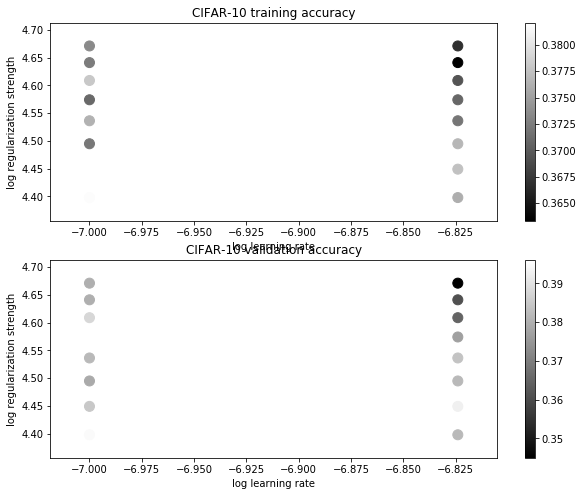

In [111]:
# Visualize the cross-validation results
import math
x_scatter = [math.log10(x[0]) for x in results]
y_scatter = [math.log10(x[1]) for x in results]

# plot training accuracy
marker_size = 100
colors = [results[x][0] for x in results]
plt.subplot(2, 1, 1)
plt.scatter(x_scatter, y_scatter, marker_size, c=colors)
plt.colorbar()
plt.xlabel('log learning rate')
plt.ylabel('log regularization strength')
plt.title('CIFAR-10 training accuracy')

# plot validation accuracy
colors = [results[x][1] for x in results] # default size of markers is 20
plt.subplot(2, 1, 2)
plt.scatter(x_scatter, y_scatter, marker_size, c=colors)
plt.colorbar()
plt.xlabel('log learning rate')
plt.ylabel('log regularization strength')
plt.title('CIFAR-10 validation accuracy')
plt.show()

In [112]:
# Evaluate the best svm on test set
y_test_pred = best_svm.predict(X_test)
test_accuracy = np.mean(y_test == y_test_pred)
print('linear SVM on raw pixels final test set accuracy: %f' % test_accuracy)

linear SVM on raw pixels final test set accuracy: 0.375000


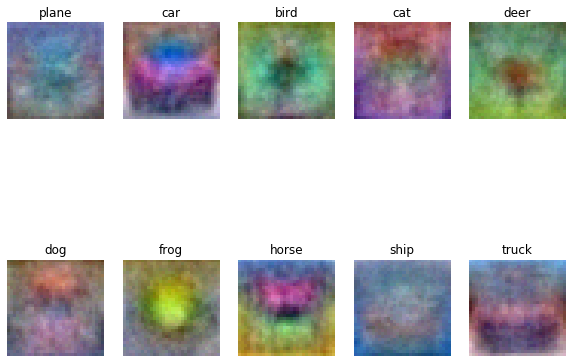

In [113]:
# Visualize the learned weights for each class.
# Depending on your choice of learning rate and regularization strength, these may
# or may not be nice to look at.
w = best_svm.W[:-1,:] # strip out the bias
w = w.reshape(32, 32, 3, 10)
w_min, w_max = np.min(w), np.max(w)
classes = ['plane', 'car', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
for i in range(10):
    plt.subplot(2, 5, i + 1)
      
    # Rescale the weights to be between 0 and 255
    wimg = 255.0 * (w[:, :, :, i].squeeze() - w_min) / (w_max - w_min)
    plt.imshow(wimg.astype('uint8'))
    plt.axis('off')
    plt.title(classes[i])

### Inline question 2:
Describe what your visualized SVM weights look like, and offer a brief explanation for why they look they way that they do.

**Your answer:** *The visualized SVM weight looks alike the general form of this kind of object, cuz every dimension of W which is $W_i$(3072*1) targets a specific kind of object*